In [1]:
# conda update conda

In [2]:
# conda install anaconda=VersionNumber

In [3]:
import tensorflow as tf
import numpy as np
import pandas as pd
import random as rd
import sklearn.datasets
import sklearn.cluster
import sklearn.decomposition
import collections
import sklearn.naive_bayes
import sklearn.model_selection

np.set_printoptions(suppress=True)
np.set_printoptions(threshold=10)

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
import matplotlib.pyplot as plt

In [4]:
df = pd.read_csv("bigtrain.csv")
df = df[["DATE", "V2Locations", "V2Organizations", "V2Tone", "V2Themes"]]

# Half-truth Labels

From an entire list of the highest taxonomy theme (3859) provided by GDELT, I managed to handselect 94 themes that are highly associated with environmental topics. Using those 94 themes, I will create a half-truth labels for each article.

In [5]:
env_csv = pd.read_csv("env.csv")

In [6]:
themes = df['V2Themes']
themes.head()

0    CRISISLEX_T11_UPDATESSYMPATHY,1257;CRISISLEX_C...
1    TAX_WORLDMAMMALS_HORSE,38;TAX_WORLDMAMMALS_HOR...
2    IDEOLOGY,1426;ECON_STOCKMARKET,44;ECON_STOCKMA...
3    WB_2936_GOLD,9;WB_2936_GOLD,41;WB_2936_GOLD,17...
4    TAX_FNCACT_DEPUTY,1813;TAX_FNCACT_DEPUTY,2065;...
Name: V2Themes, dtype: object

In [7]:
env_list = list(env_csv['themes'])

print(env_list)
print("* length of env_themes : {}".format(len(env_list)))

['WB_1847_CLIMATE_FINANCE', 'WB_1048_MARINE_PROTECTED_AREAS', 'WB_1057_SUSTAINABLE_FOREST_MANAGEMENT', 'WB_600_NATURAL_RESOURCES_MANAGEMENT', 'WB_1845_CARBON_TAX', 'WB_1785_ENVIRONMENTAL_POLICIES_AND_INSTITUTIONS', 'WB_849_ENVIRONMENTAL_LAWS_AND_REGULATIONS', 'WB_1844_MARKET_BASED_CLIMATE_CHANGE_MITIGATION', 'WB_2197_ENVIRONMENTAL_ENGINEERING', 'WB_963_NATURAL_RESOURCES_LAW', 'WB_901_ENVIRONMENTAL_SAFEGUARDS', 'WB_598_ENVIRONMENTAL_MANAGEMENT', 'WB_579_CLIMATE_CHANGE_MITIGATION', 'WB_601_POLLUTION_MANAGEMENT', 'WB_141_WATER_RESOURCES_MANAGEMENT', 'WB_1833_PROTECTED_AREAS_SYSTEMS', 'WB_1829_ECOSYSTEM_MANAGEMENT', 'UNGP_CLIMATE_CHANGE_ACTION', 'WB_1798_WATER_POLLUTION', 'WB_427_WATER_ALLOCATION_AND_WATER_ECONOMICS', 'MOVEMENT_ENVIRONMENTAL', 'WB_1791_AIR_POLLUTION', 'WB_790_TRANSPORT_AND_SUSTAINABLE_DEVELOPMENT', 'WB_1786_ENVIRONMENTAL_SUSTAINABILITY', 'WB_509_NUCLEAR_ENERGY', 'WB_436_FORESTRY', 'SLFID_NATURAL_RESOURCES', 'WB_151_IRRIGATION_AND_DRAINAGE', 'WB_140_AGRICULTURAL_WATER_MANAG

In [8]:
def split_theme(data):
  # for return
  preprocess_data = list()
  # TAX_FNACT_DEPUTY,2975; TAX_FNCACT_DEPUTY,3053; ...  -->  ['TAX_FNACT_DEPUTY,2975', 'TAX_FNACT_DEPUTY,3053', ... ]
  split_data = data.split(';')

  for i in range(len(split_data)):
    str_theme = split_data[i].split(',')[0]
    if str_theme != "":
      preprocess_data.append(str_theme)

  return preprocess_data

In [9]:
def count_env_related_theme(split_data, env_list):
  # article's theme length
  theme_len = len(split_data)

  count = 0

  for theme in split_data:
    if theme in env_list:
      #print("test")
      count+=1

  return theme_len, count

In [10]:
import csv
f = open('C:/Users/phile/Desktop/DSCI Data/label.csv', 'w', newline='')
wr = csv.writer(f)

ratio_list = list()

true_count = 0
false_count = 0

for idx in range(len(themes)):
  preprocess_data = split_theme(themes[idx])

  theme_len, count = count_env_related_theme(preprocess_data, env_list)

  ratio = count / theme_len

  ratio_list.append(ratio)

  if ratio >= 0.5:
    true_count+=1
    # Give value 1 for ratio >= 0.5 for environmental news
    wr.writerow([1])
  else:
    false_count+=1
    # Else give 0 for non-environmental news
    wr.writerow([0])

print(max(ratio_list))
print(true_count)
print(false_count)
f.close()

1.0
334
51666


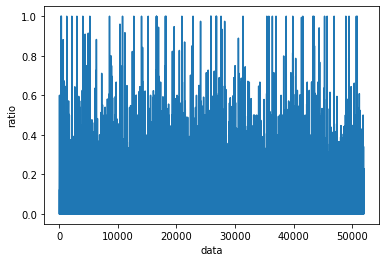

In [11]:
plt.figure()
plt.xlabel("data")
plt.ylabel("ratio")
#plt.legend()
plt.plot(ratio_list)

In [12]:
# truth = open('C:/Users/phile/Desktop/DSCI Data/label.csv', 'r', newline='')

# with truth:

#     reader = csv.reader(truth)

#     for row in reader:
#         for e in row:
#             df['true_label'] = e

In [13]:
# df.true_label.value_counts()

# (Almost) Non-polished Data

In [14]:
import re
#  All lower case
def to_lower(string):
    result = string.lower()
    return result

In [15]:
orig = df[["V2Themes"]]
orig = orig.V2Themes.apply(to_lower)

# Remove digits
orig = orig.str.replace('\d+', '')

# Remove comma
orig = orig.str.replace(',', '')

# Remove typo __ by replacing with _
orig = orig.str.replace("__", "_")

# 3d printing theme
orig = orig.str.replace("_d_", "3d_")

<ipython-input-15-a1c600dbb028>:5: FutureWarning: The default value of regex will change from True to False in a future version.
  orig = orig.str.replace('\d+', '')


In [16]:
orig

0        crisislex_t_updatessympathy;crisislex_crisisle...
1        tax_worldmammals_horse;tax_worldmammals_horse;...
2        ideology;econ_stockmarket;econ_stockmarket;eco...
3        wb_gold;wb_gold;wb_gold;wb_gold;wb_gold;wb_gol...
4        tax_fncact_deputy;tax_fncact_deputy;tax_fncact...
                               ...                        
51995    tax_fncact_deputy;tax_fncact_deputy;tax_fncact...
51996    science;tax_fncact_researcher;econ_worldcurren...
51997    general_health;general_health;medical;medical;...
51998    econ_worldcurrencies_dollar;econ_worldcurrenci...
51999    tax_fncact_deputy;tax_fncact_director;wb_publi...
Name: V2Themes, Length: 52000, dtype: object

In [17]:
## Number of Unique Themes
text = ';'.join(orig.to_list())

words = text.split(';')

print(len(words))

# '' was included in the final list, hence dropping
words = list(filter(None, words))

len(set(words))

6153802


5145

In [18]:
print(sorted(list(set(words)), key=str.lower))

['act_forceposture', 'act_harmthreaten', 'act_makestatement', 'act_yield', 'affect', 'agriculture', 'aid_economic', 'aid_humanitarian', 'alliance', 'appointment', 'armedconflict', 'arrest', 'austerity', 'aviation_incident', 'ban', 'black_market', 'blockade', 'border', 'bullying', 'ceasefire', 'charasmatic_leadership', 'checkpoint', 'claim_credit', 'closure', 'confiscation', 'constitutional', 'corruption', 'crime_cartels', 'crime_common_robbery', 'crime_illegal_drugs', 'crime_looting', 'crisislex_c_children_and_education', 'crisislex_c_logistics_transport', 'crisislex_c_need_of_shelters', 'crisislex_c_needsprovide_food', 'crisislex_c_safety', 'crisislex_c_telecom', 'crisislex_c_water_sanitation', 'crisislex_c_wellbeing_health', 'crisislex_crisislexrec', 'crisislex_o_responseagenciesatcrisis', 'crisislex_o_weather', 'crisislex_t_caution_advice', 'crisislex_t_dead', 'crisislex_t_displacedrelocatedevacuated', 'crisislex_t_infrastructure', 'crisislex_t_injured', 'crisislex_t_missingfoundtra

In [19]:
repetition = collections.Counter(words)

sorted(repetition)

['act_forceposture',
 'act_harmthreaten',
 'act_makestatement',
 'act_yield',
 'affect',
 'agriculture',
 'aid_economic',
 'aid_humanitarian',
 'alliance',
 'appointment',
 'armedconflict',
 'arrest',
 'austerity',
 'aviation_incident',
 'ban',
 'black_market',
 'blockade',
 'border',
 'bullying',
 'ceasefire',
 'charasmatic_leadership',
 'checkpoint',
 'claim_credit',
 'closure',
 'confiscation',
 'constitutional',
 'corruption',
 'crime_cartels',
 'crime_common_robbery',
 'crime_illegal_drugs',
 'crime_looting',
 'crisislex_c_children_and_education',
 'crisislex_c_logistics_transport',
 'crisislex_c_need_of_shelters',
 'crisislex_c_needsprovide_food',
 'crisislex_c_safety',
 'crisislex_c_telecom',
 'crisislex_c_water_sanitation',
 'crisislex_c_wellbeing_health',
 'crisislex_crisislexrec',
 'crisislex_o_responseagenciesatcrisis',
 'crisislex_o_weather',
 'crisislex_t_caution_advice',
 'crisislex_t_dead',
 'crisislex_t_displacedrelocatedevacuated',
 'crisislex_t_infrastructure',
 'cris

In [20]:
len(set(repetition))

5145

# Figuring out a perfect number of clusters

In [21]:
# One-Hot Encoding

# Hot-vectors
from tensorflow.keras.preprocessing.text import Tokenizer

tokenizer = Tokenizer(num_words=len(set(words)))
tokenizer.fit_on_texts(words)

a = list(tokenizer.word_index)

b = list()

print(len(a))

for tu in a:
    b.append(tu)
    
print(b)

4261
['wb', 'tax', 'fncact', 'and', 'health', 'epu', 'policy', 'disease', 'crisislex', 'general', 'soc', 'c', 'pointsofinterest', 'econ', 'uspec', 'economy', 'medical', 'food', 'social', 'ungp', 'wellbeing', 'population', 'historic', 'hospital', 'education', 'sector', 'nutrition', 'labor', 'media', 'security', 'cats', 'technologies', 'public', 'mining', 'disaster', 'forests', 'government', 'politics', 'management', 'oceans', 'rivers', 'healthcare', 'msm', 'corruption', 'violence', 'protection', 'transport', 'conflict', 'anti', 'ethnicity', 'development', 'worldlanguages', 'safety', 'pharmaceuticals', 'financial', 'in', 'transfers', 'assistance', 'diseases', 'kind', 'distribution', 'elderly', 'price', 'water', 'manmade', 'implied', 'science', 'risk', 'justice', 'energy', 'systems', 'natural', 'agriculture', 'extractives', 'chinese', 'worldmammals', 'metal', 'ore', 'deputy', 'director', 'jobs', 'governance', 'law', 'university', 'debt', 'reporter', 'crisislexrec', 'env', 'legislation', '

In [22]:
total_data = 0

for idx in range(len(words)//1000):
  start_idx = idx
  end_idx = idx+1000

  if end_idx > len(words):
    end_idx = len(words)

  hot = tokenizer.texts_to_matrix(words[start_idx:end_idx], mode="binary")

  print(hot.shape)

(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)

(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)

(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)

(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)

(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)

(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)

(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)

(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)

(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)

(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)
(1000, 5145)

Text(0, 0.5, 'inertia')

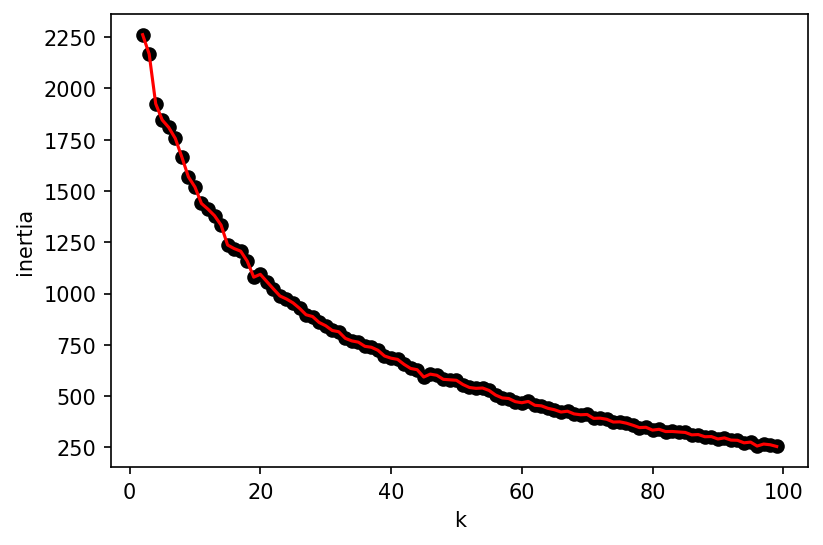

In [23]:
#Inertia/Elbow Test

import sklearn.cluster
from sklearn.cluster import KMeans

x = list(range(2,100))
inertia = [ ]
for i in x: 
    kmeans = KMeans(n_clusters = i).fit(hot)
    inertia.append(kmeans.inertia_)                # Run Elbow test for K-clusters 2 to 100
    
plt.figure(dpi=150)
plt.plot(x, inertia, 'ko')
plt.plot(x, inertia, 'r-')
plt.xlabel('k'); plt.ylabel('inertia')

Number Of Clusters:
2
Silhouette score value
0.1402823263320106
Number Of Clusters:
3
Silhouette score value
0.14613683218138265
Number Of Clusters:
4
Silhouette score value
0.1547938332078091
Number Of Clusters:
5
Silhouette score value
0.19988710753371491
Number Of Clusters:
6
Silhouette score value
0.1988490834974
Number Of Clusters:
7
Silhouette score value
0.22374117656705164
Number Of Clusters:
8
Silhouette score value
0.16709171839792247
Number Of Clusters:
9
Silhouette score value
0.24610774142776126
Number Of Clusters:
10
Silhouette score value
0.2798622661562814
Number Of Clusters:
11
Silhouette score value
0.28814973380576836
Number Of Clusters:
12
Silhouette score value
0.27340520774919796
Number Of Clusters:
13
Silhouette score value
0.2666943798430726
Number Of Clusters:
14
Silhouette score value
0.28746674492570584
Number Of Clusters:
15
Silhouette score value
0.29339975340212043
Number Of Clusters:
16
Silhouette score value
0.2979294785533106
Number Of Clusters:
17
Silh

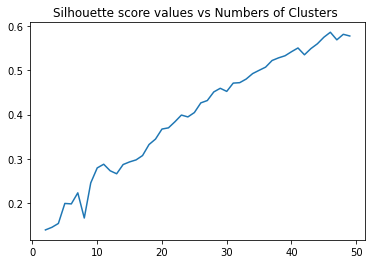

Optimal number of components is:
46


In [24]:
import sklearn
from sklearn import cluster

silhouette_score_values=list()
 
NumberOfClusters=range(2, 50)                 # K-cluster numbers range from 2 to 25
 
for i in NumberOfClusters:
    
    classifier=cluster.KMeans(i,init='k-means++', n_init=50, max_iter=100, tol=0.0001, verbose=0, random_state=None, copy_x=True)
    classifier.fit(hot)
    labels= classifier.predict(hot)
    print ("Number Of Clusters:")
    print (i)
    print ("Silhouette score value")
    print (sklearn.metrics.silhouette_score(hot,labels ,metric='euclidean', sample_size=None, random_state=None))
    silhouette_score_values.append(sklearn.metrics.silhouette_score(hot,labels ,metric='euclidean', sample_size=None, random_state=None))
 
plt.plot(NumberOfClusters, silhouette_score_values)
plt.title("Silhouette score values vs Numbers of Clusters ")
plt.show()
 
Optimal_NumberOf_Components=NumberOfClusters[silhouette_score_values.index(max(silhouette_score_values))]
print ("Optimal number of components is:")
print (Optimal_NumberOf_Components)

It is suggested that there is no clear answer to how many clusters are appropriate for the given list of themes

# Themes to a sentence

In [25]:
themes = themes.apply(to_lower)

# Clean Themes
# Remove digits
themes= themes.str.replace('\d+', '')

# Remove comma
themes= themes.str.replace(',', '')

# Remove typo __ by replacing with _
themes = themes.str.replace("__", "_")
    
# remove taxonomy Labels
themes = themes.str.replace("tax_","")
themes = themes.str.replace("eco_","")
themes = themes.str.replace("env_","")
themes = themes.str.replace("wb_", "")
themes = themes.str.replace("fncact_", "")
themes = themes.str.replace("epu_", "")
themes = themes.str.replace("cats_", "")
themes = themes.str.replace("soc_", "")
themes = themes.str.replace("pointsofinterest_", "")
themes = themes.str.replace("slfid_", "")
themes = themes.str.replace("self_identified_", "")
themes = themes.str.replace("general_", "")
themes = themes.str.replace("ungp_", "")
themes = themes.str.replace("uspec_", "")
themes = themes.str.replace("econ_", "")

# remove crisislex_ standing for crisislex taxonomy
themes = themes.str.replace("crisislex_c_","crisislex_")
themes = themes.str.replace("crisislex_o_","crisislex_")
themes = themes.str.replace("crisislex_t_","crisislex_")
themes = themes.str.replace("crisislex_","crisislex_")
themes = themes.str.replace("crisislex_","")
themes = themes.str.replace("crisislexrec_","")

# typo in some data where ethnicity is not fully typed
themes = themes.str.replace("eth_", "ethnicity_")
themes = themes.str.replace("rel_", "religion_")
themes = themes.str.replace("mil_", "military_")

# 3d printing theme
themes = themes.str.replace("_d_", "3d_")

<ipython-input-25-1d5180f327dc>:5: FutureWarning: The default value of regex will change from True to False in a future version.
  themes= themes.str.replace('\d+', '')


In [26]:
# Make the clean themes separated by semi-colon like a long sentence
themes = themes.str.replace(";"," ")
themes = themes.str.replace("_"," ")

print(themes[:1])

0    updatessympathy crisislexrec vulnerable groups...
Name: V2Themes, dtype: object


In [27]:
# Tokenize Words
import nltk
from nltk.tokenize import word_tokenize

themes = themes.apply(word_tokenize)
print(themes[:5])

0    [updatessympathy, crisislexrec, vulnerable, gr...
1    [worldmammals, horse, worldmammals, horse, wor...
2    [ideology, stockmarket, stockmarket, stockmark...
3    [gold, gold, gold, gold, gold, gold, energy, a...
4    [deputy, deputy, candidates, executive, media,...
Name: V2Themes, dtype: object


In [28]:
# Remove stopwords
from nltk.corpus import stopwords
stop = stopwords.words('english')

themes = themes.apply(lambda x: [word for word in x if word not in (stop)])
print(themes[:5])

0    [updatessympathy, crisislexrec, vulnerable, gr...
1    [worldmammals, horse, worldmammals, horse, wor...
2    [ideology, stockmarket, stockmarket, stockmark...
3    [gold, gold, gold, gold, gold, gold, energy, e...
4    [deputy, deputy, candidates, executive, media,...
Name: V2Themes, dtype: object


In [30]:
# Simplify words like convert everything to first person, etc.
# nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer 

themes = themes.apply(lambda x: [WordNetLemmatizer().lemmatize(word, pos='v') for word in x])
print(themes[:5])

0    [updatessympathy, crisislexrec, vulnerable, gr...
1    [worldmammals, horse, worldmammals, horse, wor...
2    [ideology, stockmarket, stockmarket, stockmark...
3    [gold, gold, gold, gold, gold, gold, energy, e...
4    [deputy, deputy, candidates, executive, media,...
Name: V2Themes, dtype: object


In [31]:
# Remove words with less than 3 letters (Hopefully will remove taxonomy related words)

themes = themes.apply(lambda x: [word for word in x if len(word) > 3])
print(themes[:5])

0    [updatessympathy, crisislexrec, vulnerable, gr...
1    [worldmammals, horse, worldmammals, horse, wor...
2    [ideology, stockmarket, stockmarket, stockmark...
3    [gold, gold, gold, gold, gold, gold, energy, e...
4    [deputy, deputy, candidates, executive, media,...
Name: V2Themes, dtype: object


# TF-IDF

In [32]:
detokenized_news = []
for i in range(len(themes)):
    t = ' '.join(themes[i])
    detokenized_news.append(t)

news = detokenized_news

In [33]:
news[:5]

['updatessympathy crisislexrec vulnerable group social inclusion orphan social development private sector development business climate inspections license permit business environment natural disaster natural disaster',
 'worldmammals horse worldmammals horse worldmammals horse worldmammals horse worldmammals horse worldmammals horse worldmammals horse worldmammals horse worldmammals horse worldmammals horse worldmammals horse worldmammals horse worldmammals horse media media media media media media reporter reporter reporter reporter reporter reporter news reporter news reporter news reporter news reporter news reporter news reporter manmade disaster imply price price price price digital government broadcast media information communication technologies mine policy policy policy policy house price house price house price house price house price stockmarket stockmarket stockmarket stockmarket chief entrepreneurship entrepreneurship entrepreneurship entrepreneurship entrepreneurship entre

In [34]:
import sklearn.feature_extraction.text
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words='english', max_features= 1000)
X = vectorizer.fit_transform(news)
X.shape

(52000, 1000)

# LDA

In [35]:
# pip install --upgrade gensim

In [36]:
import gensim
from gensim import corpora

C:\Users\phile\anaconda3\lib\site-packages\gensim\similarities\__init__.py:15: UserWarning: The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.
  warnings.warn(msg)


In [37]:
dictionary = corpora.Dictionary(themes)
corpus = [dictionary.doc2bow(text) for text in themes]
print(corpus[1])

[(4, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 16), (25, 6), (26, 1), (27, 1), (28, 8), (29, 13), (30, 5), (31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 7), (37, 1), (38, 6), (39, 1), (40, 12), (41, 9), (42, 12), (43, 1), (44, 1), (45, 4), (46, 1), (47, 1), (48, 1), (49, 2), (50, 1), (51, 1), (52, 1), (53, 13)]


In [38]:
len(dictionary)

3881

## LDA Model (2 Topics: ENV vs. Non-ENV)

In [39]:
## Train LDA Model (only 2 topics)

NUM_TOPICS = 2  # Env vs non-Env Topics
ldamodel2 = gensim.models.ldamodel.LdaModel(corpus, num_topics = NUM_TOPICS, id2word=dictionary, passes=20)

In [40]:
topics = ldamodel2.print_topics(num_words=20)
for topic in topics:
    print(topic)

(0, '0.061*"policy" + 0.032*"economy" + 0.022*"historic" + 0.017*"sector" + 0.017*"security" + 0.014*"government" + 0.013*"mine" + 0.013*"forest" + 0.013*"public" + 0.012*"price" + 0.012*"disaster" + 0.012*"education" + 0.011*"oceans" + 0.011*"rivers" + 0.011*"transport" + 0.011*"media" + 0.011*"management" + 0.011*"development" + 0.010*"financial" + 0.009*"safety"')
(1, '0.117*"health" + 0.079*"disease" + 0.035*"medical" + 0.034*"food" + 0.033*"social" + 0.031*"population" + 0.031*"wellbeing" + 0.028*"hospital" + 0.027*"nutrition" + 0.024*"labor" + 0.018*"healthcare" + 0.017*"protection" + 0.016*"technologies" + 0.015*"transfer" + 0.015*"assistance" + 0.015*"pharmaceuticals" + 0.015*"kind" + 0.015*"distribution" + 0.015*"elderly" + 0.014*"diseases"')


Based on the topic list, topic 0 seems to be highly associated with env news article.

### Topic percentage for each news article

In [41]:
## Re-label topic where topic 0 is given 1 (env) and other topic is given 0 (non-env)
import csv

lda2 = open('C:/Users/phile/Desktop/DSCI Data/lda2lab.csv', 'w', newline='')
wr = csv.writer(lda2)

for i, topic_list in enumerate(ldamodel2[corpus]):
    # sort by percentage
    topic_list.sort(key=lambda x:-x[1])

    # label of top-1 percentage
    label = topic_list[0][0]
    
    # conditional writer using 'label' variable
    if label == 0:
      wr.writerow([1])
    else:
      wr.writerow([0])

    #print(label)
    print(i,'th news topic percentages are',topic_list)

0 th news topic percentages are [(0, 0.9136615), (1, 0.08633849)]
1 th news topic percentages are [(0, 0.9961767)]
2 th news topic percentages are [(0, 0.9219605), (1, 0.078039505)]
3 th news topic percentages are [(0, 0.98982584), (1, 0.010174175)]
4 th news topic percentages are [(0, 0.9943581)]
5 th news topic percentages are [(0, 0.9906483)]
6 th news topic percentages are [(0, 0.9657675), (1, 0.03423249)]
7 th news topic percentages are [(0, 0.96603245), (1, 0.03396758)]
8 th news topic percentages are [(0, 0.98938024), (1, 0.010619785)]
9 th news topic percentages are [(0, 0.82996064), (1, 0.17003939)]
10 th news topic percentages are [(0, 0.9983828)]
11 th news topic percentages are [(1, 0.8564875), (0, 0.14351246)]
12 th news topic percentages are [(0, 0.89912367), (1, 0.10087632)]
13 th news topic percentages are [(0, 0.79147923), (1, 0.20852076)]
14 th news topic percentages are [(1, 0.93824387), (0, 0.06175609)]
15 th news topic percentages are [(0, 0.53000206), (1, 0.469997

300 th news topic percentages are [(1, 0.983833), (0, 0.016166998)]
301 th news topic percentages are [(0, 0.99675596)]
302 th news topic percentages are [(1, 0.88146216), (0, 0.1185379)]
303 th news topic percentages are [(0, 0.7474279), (1, 0.25257212)]
304 th news topic percentages are [(0, 0.9996878)]
305 th news topic percentages are [(0, 0.8916391), (1, 0.10836094)]
306 th news topic percentages are [(1, 0.94509006), (0, 0.054909933)]
307 th news topic percentages are [(0, 0.8849639), (1, 0.11503609)]
308 th news topic percentages are [(0, 0.890088), (1, 0.10991192)]
309 th news topic percentages are [(0, 0.7819347), (1, 0.21806532)]
310 th news topic percentages are [(1, 0.9240497), (0, 0.075950354)]
311 th news topic percentages are [(0, 0.94376945), (1, 0.056230582)]
312 th news topic percentages are [(0, 0.9874167), (1, 0.012583324)]
313 th news topic percentages are [(0, 0.9744562), (1, 0.02554378)]
314 th news topic percentages are [(1, 0.9958057)]
315 th news topic percent

592 th news topic percentages are [(0, 0.97711325), (1, 0.02288675)]
593 th news topic percentages are [(0, 0.9970098)]
594 th news topic percentages are [(0, 0.6838591), (1, 0.31614092)]
595 th news topic percentages are [(1, 0.77283436), (0, 0.22716567)]
596 th news topic percentages are [(0, 0.99967724)]
597 th news topic percentages are [(1, 0.71583605), (0, 0.28416395)]
598 th news topic percentages are [(1, 0.6924388), (0, 0.3075612)]
599 th news topic percentages are [(0, 0.8535139), (1, 0.14648607)]
600 th news topic percentages are [(0, 0.87167025), (1, 0.12832972)]
601 th news topic percentages are [(0, 0.8427584), (1, 0.15724155)]
602 th news topic percentages are [(0, 0.9900375)]
603 th news topic percentages are [(0, 0.9949655)]
604 th news topic percentages are [(1, 0.7810368), (0, 0.21896325)]
605 th news topic percentages are [(0, 0.9964944)]
606 th news topic percentages are [(0, 0.96060175), (1, 0.03939822)]
607 th news topic percentages are [(0, 0.913935), (1, 0.0860

853 th news topic percentages are [(1, 0.99685204)]
854 th news topic percentages are [(0, 0.83953387), (1, 0.16046615)]
855 th news topic percentages are [(0, 0.85601324), (1, 0.14398676)]
856 th news topic percentages are [(0, 0.8723008), (1, 0.12769918)]
857 th news topic percentages are [(1, 0.9940306)]
858 th news topic percentages are [(0, 0.5313686), (1, 0.46863142)]
859 th news topic percentages are [(0, 0.9916715)]
860 th news topic percentages are [(1, 0.994967)]
861 th news topic percentages are [(0, 0.99535644)]
862 th news topic percentages are [(0, 0.7319673), (1, 0.26803273)]
863 th news topic percentages are [(0, 0.8741964), (1, 0.12580359)]
864 th news topic percentages are [(0, 0.9955141)]
865 th news topic percentages are [(0, 0.9942455)]
866 th news topic percentages are [(0, 0.9913865)]
867 th news topic percentages are [(1, 0.83419913), (0, 0.16580082)]
868 th news topic percentages are [(1, 0.7449148), (0, 0.25508514)]
869 th news topic percentages are [(1, 0.639

1150 th news topic percentages are [(1, 0.92866963), (0, 0.07133039)]
1151 th news topic percentages are [(0, 0.8652233), (1, 0.13477673)]
1152 th news topic percentages are [(0, 0.73761564), (1, 0.26238438)]
1153 th news topic percentages are [(0, 0.9763781), (1, 0.023621943)]
1154 th news topic percentages are [(0, 0.72604877), (1, 0.27395123)]
1155 th news topic percentages are [(0, 0.88749427), (1, 0.11250581)]
1156 th news topic percentages are [(1, 0.7810397), (0, 0.21896029)]
1157 th news topic percentages are [(0, 0.96958065), (1, 0.030419402)]
1158 th news topic percentages are [(1, 0.96614146), (0, 0.03385852)]
1159 th news topic percentages are [(0, 0.990015)]
1160 th news topic percentages are [(0, 0.9736613), (1, 0.026338639)]
1161 th news topic percentages are [(0, 0.90148336), (1, 0.09851666)]
1162 th news topic percentages are [(1, 0.92951804), (0, 0.07048193)]
1163 th news topic percentages are [(1, 0.9490249), (0, 0.050975066)]
1164 th news topic percentages are [(0, 

1425 th news topic percentages are [(0, 0.99015605)]
1426 th news topic percentages are [(0, 0.968662), (1, 0.03133802)]
1427 th news topic percentages are [(0, 0.9854311), (1, 0.014568908)]
1428 th news topic percentages are [(1, 0.5330365), (0, 0.46696353)]
1429 th news topic percentages are [(0, 0.99373436)]
1430 th news topic percentages are [(0, 0.99817616)]
1431 th news topic percentages are [(0, 0.9681244), (1, 0.031875618)]
1432 th news topic percentages are [(1, 0.9958355)]
1433 th news topic percentages are [(0, 0.991151)]
1434 th news topic percentages are [(0, 0.98095125), (1, 0.019048767)]
1435 th news topic percentages are [(0, 0.98931193), (1, 0.010688099)]
1436 th news topic percentages are [(1, 0.9968867)]
1437 th news topic percentages are [(0, 0.9960627)]
1438 th news topic percentages are [(0, 0.9252851), (1, 0.07471489)]
1439 th news topic percentages are [(0, 0.9861171), (1, 0.013882871)]
1440 th news topic percentages are [(1, 0.99715686)]
1441 th news topic perc

1699 th news topic percentages are [(0, 0.99652845)]
1700 th news topic percentages are [(0, 0.99278957)]
1701 th news topic percentages are [(0, 0.527646), (1, 0.472354)]
1702 th news topic percentages are [(0, 0.978954), (1, 0.021045992)]
1703 th news topic percentages are [(0, 0.9694993), (1, 0.030500729)]
1704 th news topic percentages are [(0, 0.99382025)]
1705 th news topic percentages are [(0, 0.9213062), (1, 0.078693755)]
1706 th news topic percentages are [(0, 0.5210068), (1, 0.47899318)]
1707 th news topic percentages are [(0, 0.9575946), (1, 0.04240542)]
1708 th news topic percentages are [(0, 0.6399966), (1, 0.36000335)]
1709 th news topic percentages are [(0, 0.5079958), (1, 0.49200422)]
1710 th news topic percentages are [(0, 0.84134835), (1, 0.15865166)]
1711 th news topic percentages are [(0, 0.56596917), (1, 0.43403083)]
1712 th news topic percentages are [(0, 0.98934996), (1, 0.010650017)]
1713 th news topic percentages are [(0, 0.9942907)]
1714 th news topic percenta

1969 th news topic percentages are [(0, 0.85834056), (1, 0.14165948)]
1970 th news topic percentages are [(0, 0.9462849), (1, 0.05371514)]
1971 th news topic percentages are [(0, 0.55002457), (1, 0.44997543)]
1972 th news topic percentages are [(1, 0.91421086), (0, 0.08578912)]
1973 th news topic percentages are [(0, 0.96601874), (1, 0.03398127)]
1974 th news topic percentages are [(0, 0.989674), (1, 0.010326004)]
1975 th news topic percentages are [(1, 0.6217552), (0, 0.37824485)]
1976 th news topic percentages are [(0, 0.93717766), (1, 0.06282232)]
1977 th news topic percentages are [(0, 0.9404753), (1, 0.059524678)]
1978 th news topic percentages are [(1, 0.74491507), (0, 0.25508493)]
1979 th news topic percentages are [(0, 0.95565367), (1, 0.04434636)]
1980 th news topic percentages are [(0, 0.96934783), (1, 0.030652186)]
1981 th news topic percentages are [(0, 0.99581146)]
1982 th news topic percentages are [(0, 0.8792058), (1, 0.12079417)]
1983 th news topic percentages are [(1, 

2259 th news topic percentages are [(1, 0.9980781)]
2260 th news topic percentages are [(1, 0.9642607), (0, 0.035739277)]
2261 th news topic percentages are [(0, 0.9727), (1, 0.02729999)]
2262 th news topic percentages are [(1, 0.9941209)]
2263 th news topic percentages are [(0, 0.6646197), (1, 0.33538032)]
2264 th news topic percentages are [(0, 0.5295346), (1, 0.47046542)]
2265 th news topic percentages are [(0, 0.8028029), (1, 0.19719705)]
2266 th news topic percentages are [(0, 0.96255076), (1, 0.03744926)]
2267 th news topic percentages are [(0, 0.9151159), (1, 0.08488412)]
2268 th news topic percentages are [(0, 0.8640789), (1, 0.13592115)]
2269 th news topic percentages are [(0, 0.9967489)]
2270 th news topic percentages are [(0, 0.9805595), (1, 0.019440476)]
2271 th news topic percentages are [(1, 0.99580705)]
2272 th news topic percentages are [(0, 0.85557145), (1, 0.1444285)]
2273 th news topic percentages are [(1, 0.97385347), (0, 0.026146563)]
2274 th news topic percentages

2553 th news topic percentages are [(0, 0.9313577), (1, 0.06864233)]
2554 th news topic percentages are [(0, 0.9910556)]
2555 th news topic percentages are [(0, 0.9969535)]
2556 th news topic percentages are [(1, 0.9525446), (0, 0.047455397)]
2557 th news topic percentages are [(0, 0.99753034)]
2558 th news topic percentages are [(0, 0.7757909), (1, 0.22420904)]
2559 th news topic percentages are [(0, 0.9736667), (1, 0.026333302)]
2560 th news topic percentages are [(0, 0.98236597), (1, 0.017634086)]
2561 th news topic percentages are [(1, 0.7555307), (0, 0.24446929)]
2562 th news topic percentages are [(0, 0.99417096)]
2563 th news topic percentages are [(1, 0.9964301)]
2564 th news topic percentages are [(0, 0.98573124), (1, 0.014268756)]
2565 th news topic percentages are [(1, 0.9970078)]
2566 th news topic percentages are [(1, 0.5763545), (0, 0.4236455)]
2567 th news topic percentages are [(1, 0.97650224), (0, 0.023497747)]
2568 th news topic percentages are [(0, 0.91951007), (1, 0

2835 th news topic percentages are [(0, 0.94218653), (1, 0.057813503)]
2836 th news topic percentages are [(1, 0.8529567), (0, 0.14704333)]
2837 th news topic percentages are [(1, 0.99732363)]
2838 th news topic percentages are [(0, 0.9714461), (1, 0.028553946)]
2839 th news topic percentages are [(0, 0.95046735), (1, 0.04953269)]
2840 th news topic percentages are [(0, 0.83221227), (1, 0.16778773)]
2841 th news topic percentages are [(0, 0.89196736), (1, 0.108032666)]
2842 th news topic percentages are [(1, 0.80302256), (0, 0.19697739)]
2843 th news topic percentages are [(0, 0.9976956)]
2844 th news topic percentages are [(1, 0.7733727), (0, 0.22662735)]
2845 th news topic percentages are [(0, 0.9536922), (1, 0.046307836)]
2846 th news topic percentages are [(0, 0.98831785), (1, 0.011682112)]
2847 th news topic percentages are [(0, 0.8516614), (1, 0.14833863)]
2848 th news topic percentages are [(0, 0.8437017), (1, 0.15629832)]
2849 th news topic percentages are [(0, 0.83982706), (1,

3123 th news topic percentages are [(0, 0.97766614), (1, 0.022333862)]
3124 th news topic percentages are [(0, 0.60716945), (1, 0.39283058)]
3125 th news topic percentages are [(0, 0.9936823)]
3126 th news topic percentages are [(0, 0.8897538), (1, 0.11024619)]
3127 th news topic percentages are [(0, 0.9749853), (1, 0.025014644)]
3128 th news topic percentages are [(1, 0.9963832)]
3129 th news topic percentages are [(0, 0.9933742)]
3130 th news topic percentages are [(0, 0.6786605), (1, 0.3213395)]
3131 th news topic percentages are [(0, 0.7569356), (1, 0.24306434)]
3132 th news topic percentages are [(0, 0.9724511), (1, 0.027548928)]
3133 th news topic percentages are [(0, 0.9313605), (1, 0.06863951)]
3134 th news topic percentages are [(1, 0.9661419), (0, 0.033858176)]
3135 th news topic percentages are [(0, 0.97878313), (1, 0.021216897)]
3136 th news topic percentages are [(0, 0.9941051)]
3137 th news topic percentages are [(0, 0.84852135), (1, 0.15147862)]
3138 th news topic percen

3429 th news topic percentages are [(0, 0.9935119)]
3430 th news topic percentages are [(0, 0.99426264)]
3431 th news topic percentages are [(0, 0.9910008)]
3432 th news topic percentages are [(0, 0.8763136), (1, 0.123686366)]
3433 th news topic percentages are [(0, 0.9765174), (1, 0.023482561)]
3434 th news topic percentages are [(0, 0.9241754), (1, 0.07582459)]
3435 th news topic percentages are [(0, 0.9936325)]
3436 th news topic percentages are [(1, 0.9940306)]
3437 th news topic percentages are [(0, 0.9202949), (1, 0.07970508)]
3438 th news topic percentages are [(0, 0.83400595), (1, 0.16599405)]
3439 th news topic percentages are [(0, 0.9972387)]
3440 th news topic percentages are [(0, 0.9971374)]
3441 th news topic percentages are [(0, 0.99302816)]
3442 th news topic percentages are [(0, 0.9857976), (1, 0.014202478)]
3443 th news topic percentages are [(0, 0.9916378)]
3444 th news topic percentages are [(0, 0.99008214)]
3445 th news topic percentages are [(0, 0.990554)]
3446 th 

3694 th news topic percentages are [(0, 0.91153634), (1, 0.08846367)]
3695 th news topic percentages are [(0, 0.9705136), (1, 0.029486427)]
3696 th news topic percentages are [(0, 0.9844763), (1, 0.015523684)]
3697 th news topic percentages are [(0, 0.8829292), (1, 0.11707079)]
3698 th news topic percentages are [(0, 0.99108183)]
3699 th news topic percentages are [(0, 0.6443519), (1, 0.35564807)]
3700 th news topic percentages are [(0, 0.9807276), (1, 0.019272339)]
3701 th news topic percentages are [(1, 0.751348), (0, 0.248652)]
3702 th news topic percentages are [(1, 0.7899296), (0, 0.21007033)]
3703 th news topic percentages are [(0, 0.98717517), (1, 0.012824808)]
3704 th news topic percentages are [(0, 0.95162475), (1, 0.04837523)]
3705 th news topic percentages are [(1, 0.86977667), (0, 0.13022329)]
3706 th news topic percentages are [(0, 0.9920648)]
3707 th news topic percentages are [(0, 0.9952519)]
3708 th news topic percentages are [(0, 0.83971417), (1, 0.1602858)]
3709 th ne

3979 th news topic percentages are [(1, 0.88905656), (0, 0.11094343)]
3980 th news topic percentages are [(0, 0.9935924)]
3981 th news topic percentages are [(0, 0.9987148)]
3982 th news topic percentages are [(0, 0.893899), (1, 0.10610093)]
3983 th news topic percentages are [(1, 0.6272859), (0, 0.37271407)]
3984 th news topic percentages are [(0, 0.89631665), (1, 0.10368334)]
3985 th news topic percentages are [(1, 0.74491495), (0, 0.25508508)]
3986 th news topic percentages are [(1, 0.9973379)]
3987 th news topic percentages are [(0, 0.8013794), (1, 0.19862062)]
3988 th news topic percentages are [(0, 0.8874125), (1, 0.11258753)]
3989 th news topic percentages are [(0, 0.90704006), (1, 0.09295992)]
3990 th news topic percentages are [(1, 0.99856377)]
3991 th news topic percentages are [(0, 0.9634819), (1, 0.036518086)]
3992 th news topic percentages are [(0, 0.9933118)]
3993 th news topic percentages are [(0, 0.9794144), (1, 0.020585557)]
3994 th news topic percentages are [(0, 0.99

4258 th news topic percentages are [(0, 0.68060285), (1, 0.31939712)]
4259 th news topic percentages are [(0, 0.99546915)]
4260 th news topic percentages are [(0, 0.87613106), (1, 0.12386889)]
4261 th news topic percentages are [(0, 0.99308807)]
4262 th news topic percentages are [(0, 0.8343729), (1, 0.16562712)]
4263 th news topic percentages are [(0, 0.9262794), (1, 0.07372056)]
4264 th news topic percentages are [(1, 0.96614176), (0, 0.03385822)]
4265 th news topic percentages are [(1, 0.7411196), (0, 0.2588804)]
4266 th news topic percentages are [(0, 0.99062407)]
4267 th news topic percentages are [(0, 0.98852664), (1, 0.011473358)]
4268 th news topic percentages are [(1, 0.85690004), (0, 0.1430999)]
4269 th news topic percentages are [(0, 0.7686023), (1, 0.23139772)]
4270 th news topic percentages are [(0, 0.92165935), (1, 0.07834061)]
4271 th news topic percentages are [(0, 0.99766475)]
4272 th news topic percentages are [(1, 0.87234616), (0, 0.12765379)]
4273 th news topic perc

4536 th news topic percentages are [(1, 0.92404956), (0, 0.07595041)]
4537 th news topic percentages are [(0, 0.8137466), (1, 0.1862534)]
4538 th news topic percentages are [(0, 0.9973532)]
4539 th news topic percentages are [(0, 0.9924198)]
4540 th news topic percentages are [(1, 0.9983336)]
4541 th news topic percentages are [(1, 0.95062816), (0, 0.049371842)]
4542 th news topic percentages are [(0, 0.9819507), (1, 0.018049264)]
4543 th news topic percentages are [(1, 0.9838321), (0, 0.01616783)]
4544 th news topic percentages are [(0, 0.9651493), (1, 0.03485074)]
4545 th news topic percentages are [(0, 0.7386739), (1, 0.26132607)]
4546 th news topic percentages are [(0, 0.96596503), (1, 0.034034953)]
4547 th news topic percentages are [(1, 0.79413044), (0, 0.20586956)]
4548 th news topic percentages are [(0, 0.9263969), (1, 0.07360309)]
4549 th news topic percentages are [(0, 0.99373096)]
4550 th news topic percentages are [(0, 0.99741054)]
4551 th news topic percentages are [(1, 0.

4795 th news topic percentages are [(0, 0.97067845), (1, 0.029321482)]
4796 th news topic percentages are [(1, 0.96426064), (0, 0.035739336)]
4797 th news topic percentages are [(0, 0.9596769), (1, 0.0403231)]
4798 th news topic percentages are [(1, 0.7544261), (0, 0.2455739)]
4799 th news topic percentages are [(0, 0.8414315), (1, 0.1585685)]
4800 th news topic percentages are [(0, 0.99718636)]
4801 th news topic percentages are [(0, 0.9787333), (1, 0.021266682)]
4802 th news topic percentages are [(0, 0.92884207), (1, 0.07115796)]
4803 th news topic percentages are [(0, 0.9128148), (1, 0.087185204)]
4804 th news topic percentages are [(1, 0.79413015), (0, 0.20586985)]
4805 th news topic percentages are [(0, 0.99684864)]
4806 th news topic percentages are [(1, 0.988798), (0, 0.011201972)]
4807 th news topic percentages are [(0, 0.9321981), (1, 0.06780186)]
4808 th news topic percentages are [(0, 0.693441), (1, 0.30655906)]
4809 th news topic percentages are [(0, 0.9927183)]
4810 th ne

5062 th news topic percentages are [(0, 0.92471474), (1, 0.07528527)]
5063 th news topic percentages are [(0, 0.89412165), (1, 0.10587838)]
5064 th news topic percentages are [(0, 0.994331)]
5065 th news topic percentages are [(0, 0.98307055), (1, 0.016929451)]
5066 th news topic percentages are [(1, 0.7941299), (0, 0.20587006)]
5067 th news topic percentages are [(1, 0.9887991), (0, 0.011200885)]
5068 th news topic percentages are [(0, 0.9969845)]
5069 th news topic percentages are [(1, 0.97833246), (0, 0.02166755)]
5070 th news topic percentages are [(0, 0.8040647), (1, 0.1959353)]
5071 th news topic percentages are [(0, 0.7916879), (1, 0.2083121)]
5072 th news topic percentages are [(1, 0.6937104), (0, 0.30628958)]
5073 th news topic percentages are [(0, 0.97977215), (1, 0.02022785)]
5074 th news topic percentages are [(0, 0.9971832)]
5075 th news topic percentages are [(0, 0.7052308), (1, 0.2947692)]
5076 th news topic percentages are [(0, 0.84716827), (1, 0.15283172)]
5077 th news

5360 th news topic percentages are [(0, 0.9979831)]
5361 th news topic percentages are [(0, 0.99411905)]
5362 th news topic percentages are [(0, 0.91662526), (1, 0.08337476)]
5363 th news topic percentages are [(0, 0.99802846)]
5364 th news topic percentages are [(0, 0.9967352)]
5365 th news topic percentages are [(0, 0.9880158), (1, 0.011984205)]
5366 th news topic percentages are [(0, 0.9864448), (1, 0.013555239)]
5367 th news topic percentages are [(1, 0.9938704)]
5368 th news topic percentages are [(1, 0.9968525)]
5369 th news topic percentages are [(1, 0.99388415)]
5370 th news topic percentages are [(0, 0.9368021), (1, 0.063197866)]
5371 th news topic percentages are [(0, 0.7711386), (1, 0.22886144)]
5372 th news topic percentages are [(1, 0.6586725), (0, 0.34132746)]
5373 th news topic percentages are [(1, 0.99732363)]
5374 th news topic percentages are [(1, 0.99833363)]
5375 th news topic percentages are [(0, 0.9788249), (1, 0.02117508)]
5376 th news topic percentages are [(1, 

5653 th news topic percentages are [(0, 0.97823685), (1, 0.021763176)]
5654 th news topic percentages are [(0, 0.9963607)]
5655 th news topic percentages are [(1, 0.9970891)]
5656 th news topic percentages are [(0, 0.9782112), (1, 0.021788752)]
5657 th news topic percentages are [(0, 0.83479196), (1, 0.16520804)]
5658 th news topic percentages are [(0, 0.9782247), (1, 0.021775357)]
5659 th news topic percentages are [(0, 0.99808985)]
5660 th news topic percentages are [(1, 0.6761816), (0, 0.32381842)]
5661 th news topic percentages are [(0, 0.99528843)]
5662 th news topic percentages are [(1, 0.688107), (0, 0.3118929)]
5663 th news topic percentages are [(1, 0.72639924), (0, 0.2736008)]
5664 th news topic percentages are [(0, 0.973791), (1, 0.026209017)]
5665 th news topic percentages are [(0, 0.880772), (1, 0.11922796)]
5666 th news topic percentages are [(0, 0.98834825), (1, 0.011651719)]
5667 th news topic percentages are [(1, 0.9781294), (0, 0.02187064)]
5668 th news topic percenta

5932 th news topic percentages are [(0, 0.8069975), (1, 0.19300254)]
5933 th news topic percentages are [(1, 0.8208059), (0, 0.1791941)]
5934 th news topic percentages are [(1, 0.9963905)]
5935 th news topic percentages are [(0, 0.62228525), (1, 0.37771472)]
5936 th news topic percentages are [(0, 0.9861441), (1, 0.013855872)]
5937 th news topic percentages are [(0, 0.9949289)]
5938 th news topic percentages are [(0, 0.99662805)]
5939 th news topic percentages are [(1, 0.9951787)]
5940 th news topic percentages are [(0, 0.6181844), (1, 0.38181558)]
5941 th news topic percentages are [(1, 0.86666816), (0, 0.13333185)]
5942 th news topic percentages are [(1, 0.8964674), (0, 0.10353264)]
5943 th news topic percentages are [(0, 0.71907115), (1, 0.28092885)]
5944 th news topic percentages are [(0, 0.873321), (1, 0.12667903)]
5945 th news topic percentages are [(1, 0.70026827), (0, 0.2997318)]
5946 th news topic percentages are [(0, 0.9177986), (1, 0.082201414)]
5947 th news topic percentage

6211 th news topic percentages are [(0, 0.9488052), (1, 0.051194817)]
6212 th news topic percentages are [(0, 0.99644005)]
6213 th news topic percentages are [(0, 0.9938961)]
6214 th news topic percentages are [(0, 0.99787796)]
6215 th news topic percentages are [(1, 0.99388427)]
6216 th news topic percentages are [(1, 0.9295178), (0, 0.070482165)]
6217 th news topic percentages are [(1, 0.9642608), (0, 0.03573916)]
6218 th news topic percentages are [(1, 0.9963823)]
6219 th news topic percentages are [(0, 0.9939378)]
6220 th news topic percentages are [(1, 0.99856377)]
6221 th news topic percentages are [(0, 0.99449515)]
6222 th news topic percentages are [(0, 0.9987761)]
6223 th news topic percentages are [(0, 0.9973752)]
6224 th news topic percentages are [(0, 0.52425915), (1, 0.47574088)]
6225 th news topic percentages are [(1, 0.9311732), (0, 0.0688268)]
6226 th news topic percentages are [(0, 0.97684526), (1, 0.02315475)]
6227 th news topic percentages are [(0, 0.7746815), (1, 0.

6465 th news topic percentages are [(1, 0.9963911)]
6466 th news topic percentages are [(0, 0.99190146)]
6467 th news topic percentages are [(0, 0.9605062), (1, 0.039493766)]
6468 th news topic percentages are [(0, 0.9871921), (1, 0.012807867)]
6469 th news topic percentages are [(1, 0.99700797)]
6470 th news topic percentages are [(0, 0.9895457), (1, 0.010454318)]
6471 th news topic percentages are [(0, 0.99605983)]
6472 th news topic percentages are [(0, 0.7448412), (1, 0.25515875)]
6473 th news topic percentages are [(1, 0.99734265)]
6474 th news topic percentages are [(0, 0.9957809)]
6475 th news topic percentages are [(0, 0.9946993)]
6476 th news topic percentages are [(0, 0.99671406)]
6477 th news topic percentages are [(0, 0.958737), (1, 0.041262962)]
6478 th news topic percentages are [(0, 0.9906837)]
6479 th news topic percentages are [(1, 0.978237), (0, 0.021763071)]
6480 th news topic percentages are [(1, 0.9790141), (0, 0.020985885)]
6481 th news topic percentages are [(0, 

6718 th news topic percentages are [(0, 0.79947317), (1, 0.2005268)]
6719 th news topic percentages are [(1, 0.9929512)]
6720 th news topic percentages are [(0, 0.714295), (1, 0.28570497)]
6721 th news topic percentages are [(0, 0.9813221), (1, 0.01867789)]
6722 th news topic percentages are [(0, 0.7766768), (1, 0.22332323)]
6723 th news topic percentages are [(0, 0.8970117), (1, 0.10298833)]
6724 th news topic percentages are [(1, 0.99582446)]
6725 th news topic percentages are [(1, 0.55946136), (0, 0.4405387)]
6726 th news topic percentages are [(1, 0.9958347)]
6727 th news topic percentages are [(1, 0.72639906), (0, 0.27360094)]
6728 th news topic percentages are [(1, 0.92405033), (0, 0.07594966)]
6729 th news topic percentages are [(0, 0.85102963), (1, 0.1489704)]
6730 th news topic percentages are [(0, 0.9787289), (1, 0.02127108)]
6731 th news topic percentages are [(0, 0.89449054), (1, 0.10550947)]
6732 th news topic percentages are [(1, 0.9790141), (0, 0.020985857)]
6733 th news

6993 th news topic percentages are [(0, 0.8660041), (1, 0.1339959)]
6994 th news topic percentages are [(1, 0.99583304)]
6995 th news topic percentages are [(0, 0.9853918), (1, 0.014608192)]
6996 th news topic percentages are [(1, 0.9923723)]
6997 th news topic percentages are [(0, 0.9948032)]
6998 th news topic percentages are [(0, 0.8335882), (1, 0.16641179)]
6999 th news topic percentages are [(0, 0.92627865), (1, 0.07372136)]
7000 th news topic percentages are [(0, 0.9854308), (1, 0.01456919)]
7001 th news topic percentages are [(0, 0.9155198), (1, 0.08448024)]
7002 th news topic percentages are [(0, 0.99415916)]
7003 th news topic percentages are [(0, 0.9935628)]
7004 th news topic percentages are [(0, 0.9891712), (1, 0.010828832)]
7005 th news topic percentages are [(1, 0.9973429)]
7006 th news topic percentages are [(1, 0.91832167), (0, 0.081678316)]
7007 th news topic percentages are [(1, 0.96922904), (0, 0.030770943)]
7008 th news topic percentages are [(0, 0.93415886), (1, 0.

7272 th news topic percentages are [(1, 0.9819481), (0, 0.018051967)]
7273 th news topic percentages are [(0, 0.84959686), (1, 0.15040314)]
7274 th news topic percentages are [(0, 0.6837048), (1, 0.31629524)]
7275 th news topic percentages are [(0, 0.90305156), (1, 0.09694846)]
7276 th news topic percentages are [(0, 0.9552648), (1, 0.044735227)]
7277 th news topic percentages are [(0, 0.9939962)]
7278 th news topic percentages are [(0, 0.99481064)]
7279 th news topic percentages are [(0, 0.8443095), (1, 0.15569049)]
7280 th news topic percentages are [(1, 0.99642974)]
7281 th news topic percentages are [(0, 0.72033685), (1, 0.27966318)]
7282 th news topic percentages are [(0, 0.95892286), (1, 0.041077144)]
7283 th news topic percentages are [(1, 0.99582446)]
7284 th news topic percentages are [(0, 0.8714567), (1, 0.12854333)]
7285 th news topic percentages are [(0, 0.9966664)]
7286 th news topic percentages are [(1, 0.9749128), (0, 0.025087135)]
7287 th news topic percentages are [(0,

7543 th news topic percentages are [(1, 0.5569632), (0, 0.4430368)]
7544 th news topic percentages are [(0, 0.97697824), (1, 0.023021748)]
7545 th news topic percentages are [(1, 0.85295784), (0, 0.14704211)]
7546 th news topic percentages are [(0, 0.98346984), (1, 0.01653009)]
7547 th news topic percentages are [(0, 0.99667746)]
7548 th news topic percentages are [(0, 0.9122189), (1, 0.08778107)]
7549 th news topic percentages are [(0, 0.98706543), (1, 0.012934543)]
7550 th news topic percentages are [(1, 0.9958071)]
7551 th news topic percentages are [(0, 0.9988775)]
7552 th news topic percentages are [(0, 0.6305594), (1, 0.36944062)]
7553 th news topic percentages are [(0, 0.8119387), (1, 0.18806131)]
7554 th news topic percentages are [(1, 0.9973235)]
7555 th news topic percentages are [(0, 0.9967485)]
7556 th news topic percentages are [(1, 0.8529593), (0, 0.14704078)]
7557 th news topic percentages are [(0, 0.96838146), (1, 0.03161855)]
7558 th news topic percentages are [(0, 0.9

7811 th news topic percentages are [(0, 0.98857445), (1, 0.011425573)]
7812 th news topic percentages are [(0, 0.56359655), (1, 0.43640348)]
7813 th news topic percentages are [(0, 0.9537353), (1, 0.04626472)]
7814 th news topic percentages are [(0, 0.83230793), (1, 0.16769204)]
7815 th news topic percentages are [(0, 0.98892057), (1, 0.011079438)]
7816 th news topic percentages are [(0, 0.64932245), (1, 0.35067752)]
7817 th news topic percentages are [(1, 0.99638295)]
7818 th news topic percentages are [(0, 0.9116392), (1, 0.08836075)]
7819 th news topic percentages are [(1, 0.88666266), (0, 0.11333735)]
7820 th news topic percentages are [(1, 0.99295133)]
7821 th news topic percentages are [(0, 0.9954427)]
7822 th news topic percentages are [(0, 0.8752198), (1, 0.124780156)]
7823 th news topic percentages are [(1, 0.7570133), (0, 0.24298672)]
7824 th news topic percentages are [(0, 0.9908219)]
7825 th news topic percentages are [(1, 0.95033723), (0, 0.0496628)]
7826 th news topic per

8088 th news topic percentages are [(0, 0.851577), (1, 0.148423)]
8089 th news topic percentages are [(1, 0.99833465)]
8090 th news topic percentages are [(0, 0.99618906)]
8091 th news topic percentages are [(0, 0.7014887), (1, 0.29851136)]
8092 th news topic percentages are [(0, 0.88618994), (1, 0.1138101)]
8093 th news topic percentages are [(0, 0.9939341)]
8094 th news topic percentages are [(0, 0.85956675), (1, 0.14043325)]
8095 th news topic percentages are [(0, 0.9962116)]
8096 th news topic percentages are [(1, 0.78103846), (0, 0.21896154)]
8097 th news topic percentages are [(0, 0.95865554), (1, 0.041344486)]
8098 th news topic percentages are [(0, 0.8586794), (1, 0.14132059)]
8099 th news topic percentages are [(0, 0.99406266)]
8100 th news topic percentages are [(0, 0.922432), (1, 0.07756802)]
8101 th news topic percentages are [(1, 0.9923719)]
8102 th news topic percentages are [(0, 0.9982875)]
8103 th news topic percentages are [(0, 0.9953458)]
8104 th news topic percentage

8379 th news topic percentages are [(1, 0.97491205), (0, 0.025088007)]
8380 th news topic percentages are [(0, 0.8328599), (1, 0.16714011)]
8381 th news topic percentages are [(0, 0.8641489), (1, 0.1358511)]
8382 th news topic percentages are [(1, 0.63440764), (0, 0.36559236)]
8383 th news topic percentages are [(0, 0.6064032), (1, 0.39359686)]
8384 th news topic percentages are [(0, 0.9784165), (1, 0.021583473)]
8385 th news topic percentages are [(1, 0.87234765), (0, 0.12765236)]
8386 th news topic percentages are [(0, 0.78971493), (1, 0.21028513)]
8387 th news topic percentages are [(0, 0.99683464)]
8388 th news topic percentages are [(0, 0.99162865)]
8389 th news topic percentages are [(0, 0.9910839)]
8390 th news topic percentages are [(0, 0.72604835), (1, 0.27395165)]
8391 th news topic percentages are [(0, 0.9162892), (1, 0.08371079)]
8392 th news topic percentages are [(1, 0.9450884), (0, 0.054911636)]
8393 th news topic percentages are [(1, 0.9958338)]
8394 th news topic perce

8688 th news topic percentages are [(0, 0.74332213), (1, 0.2566779)]
8689 th news topic percentages are [(0, 0.9907665)]
8690 th news topic percentages are [(1, 0.98194766), (0, 0.018052312)]
8691 th news topic percentages are [(0, 0.9961441)]
8692 th news topic percentages are [(0, 0.95324844), (1, 0.046751615)]
8693 th news topic percentages are [(1, 0.61770564), (0, 0.38229436)]
8694 th news topic percentages are [(0, 0.97795564), (1, 0.022044305)]
8695 th news topic percentages are [(0, 0.9891947), (1, 0.010805312)]
8696 th news topic percentages are [(0, 0.73607063), (1, 0.2639294)]
8697 th news topic percentages are [(1, 0.81365186), (0, 0.18634814)]
8698 th news topic percentages are [(0, 0.8945448), (1, 0.10545522)]
8699 th news topic percentages are [(0, 0.99547577)]
8700 th news topic percentages are [(0, 0.9298295), (1, 0.07017056)]
8701 th news topic percentages are [(0, 0.81454545), (1, 0.18545453)]
8702 th news topic percentages are [(0, 0.99040085)]
8703 th news topic pe

8977 th news topic percentages are [(1, 0.88931257), (0, 0.11068743)]
8978 th news topic percentages are [(1, 0.99643004)]
8979 th news topic percentages are [(0, 0.99246615)]
8980 th news topic percentages are [(0, 0.67598546), (1, 0.32401448)]
8981 th news topic percentages are [(1, 0.8529567), (0, 0.14704332)]
8982 th news topic percentages are [(0, 0.96657646), (1, 0.033423528)]
8983 th news topic percentages are [(0, 0.99127966)]
8984 th news topic percentages are [(0, 0.9912337)]
8985 th news topic percentages are [(0, 0.9327324), (1, 0.06726756)]
8986 th news topic percentages are [(1, 0.8703511), (0, 0.12964897)]
8987 th news topic percentages are [(0, 0.7644161), (1, 0.2355839)]
8988 th news topic percentages are [(0, 0.9875421), (1, 0.01245793)]
8989 th news topic percentages are [(1, 0.9525447), (0, 0.047455315)]
8990 th news topic percentages are [(1, 0.9963906)]
8991 th news topic percentages are [(0, 0.57701194), (1, 0.42298806)]
8992 th news topic percentages are [(0, 0.

9278 th news topic percentages are [(0, 0.9894255), (1, 0.01057447)]
9279 th news topic percentages are [(0, 0.93199277), (1, 0.06800723)]
9280 th news topic percentages are [(1, 0.99833345)]
9281 th news topic percentages are [(1, 0.99734265)]
9282 th news topic percentages are [(0, 0.74060714), (1, 0.25939292)]
9283 th news topic percentages are [(0, 0.68923837), (1, 0.3107616)]
9284 th news topic percentages are [(1, 0.6560825), (0, 0.34391746)]
9285 th news topic percentages are [(0, 0.5445964), (1, 0.45540363)]
9286 th news topic percentages are [(1, 0.9819479), (0, 0.018052094)]
9287 th news topic percentages are [(0, 0.9992549)]
9288 th news topic percentages are [(1, 0.95062745), (0, 0.049372535)]
9289 th news topic percentages are [(0, 0.8370802), (1, 0.16291979)]
9290 th news topic percentages are [(0, 0.9565148), (1, 0.043485243)]
9291 th news topic percentages are [(1, 0.9940304)]
9292 th news topic percentages are [(1, 0.7073741), (0, 0.29262584)]
9293 th news topic percen

9561 th news topic percentages are [(0, 0.8124786), (1, 0.18752143)]
9562 th news topic percentages are [(1, 0.9918561)]
9563 th news topic percentages are [(1, 0.9983339)]
9564 th news topic percentages are [(0, 0.99654293)]
9565 th news topic percentages are [(0, 0.9865402), (1, 0.01345977)]
9566 th news topic percentages are [(0, 0.99481404)]
9567 th news topic percentages are [(1, 0.99295044)]
9568 th news topic percentages are [(0, 0.9724909), (1, 0.027509153)]
9569 th news topic percentages are [(0, 0.9829846), (1, 0.017015398)]
9570 th news topic percentages are [(0, 0.9617522), (1, 0.038247805)]
9571 th news topic percentages are [(1, 0.9938919)]
9572 th news topic percentages are [(1, 0.9923725)]
9573 th news topic percentages are [(0, 0.8724192), (1, 0.12758085)]
9574 th news topic percentages are [(0, 0.99010235)]
9575 th news topic percentages are [(0, 0.9752889), (1, 0.024711061)]
9576 th news topic percentages are [(0, 0.95677793), (1, 0.04322204)]
9577 th news topic perc

9872 th news topic percentages are [(0, 0.9171907), (1, 0.08280932)]
9873 th news topic percentages are [(0, 0.87801194), (1, 0.12198801)]
9874 th news topic percentages are [(1, 0.9980783)]
9875 th news topic percentages are [(0, 0.9795098), (1, 0.020490155)]
9876 th news topic percentages are [(1, 0.9970078)]
9877 th news topic percentages are [(1, 0.74491423), (0, 0.25508577)]
9878 th news topic percentages are [(0, 0.99499846)]
9879 th news topic percentages are [(0, 0.9192581), (1, 0.08074187)]
9880 th news topic percentages are [(0, 0.994735)]
9881 th news topic percentages are [(1, 0.8913633), (0, 0.1086367)]
9882 th news topic percentages are [(0, 0.99490374)]
9883 th news topic percentages are [(0, 0.8615698), (1, 0.13843013)]
9884 th news topic percentages are [(0, 0.9820447), (1, 0.017955309)]
9885 th news topic percentages are [(0, 0.88063353), (1, 0.11936645)]
9886 th news topic percentages are [(0, 0.71229887), (1, 0.28770122)]
9887 th news topic percentages are [(0, 0.99

10146 th news topic percentages are [(0, 0.8910837), (1, 0.108916245)]
10147 th news topic percentages are [(0, 0.9859087), (1, 0.014091321)]
10148 th news topic percentages are [(0, 0.933701), (1, 0.06629902)]
10149 th news topic percentages are [(0, 0.945247), (1, 0.054752994)]
10150 th news topic percentages are [(0, 0.80847454), (1, 0.19152547)]
10151 th news topic percentages are [(0, 0.64183974), (1, 0.35816023)]
10152 th news topic percentages are [(0, 0.998207)]
10153 th news topic percentages are [(1, 0.81365275), (0, 0.1863472)]
10154 th news topic percentages are [(0, 0.99092853)]
10155 th news topic percentages are [(0, 0.9416708), (1, 0.05832926)]
10156 th news topic percentages are [(1, 0.99393135)]
10157 th news topic percentages are [(0, 0.995787)]
10158 th news topic percentages are [(0, 0.96869123), (1, 0.03130883)]
10159 th news topic percentages are [(0, 0.9428704), (1, 0.057129636)]
10160 th news topic percentages are [(1, 0.96426064), (0, 0.035739396)]
10161 th ne

10450 th news topic percentages are [(1, 0.9937546)]
10451 th news topic percentages are [(0, 0.805388), (1, 0.1946121)]
10452 th news topic percentages are [(0, 0.6787803), (1, 0.3212197)]
10453 th news topic percentages are [(0, 0.50130993), (1, 0.49869013)]
10454 th news topic percentages are [(0, 0.92420757), (1, 0.075792365)]
10455 th news topic percentages are [(0, 0.93617105), (1, 0.06382896)]
10456 th news topic percentages are [(0, 0.99877363)]
10457 th news topic percentages are [(0, 0.55337286), (1, 0.4466272)]
10458 th news topic percentages are [(0, 0.9443244), (1, 0.055675652)]
10459 th news topic percentages are [(0, 0.99257356)]
10460 th news topic percentages are [(0, 0.881885), (1, 0.11811498)]
10461 th news topic percentages are [(0, 0.9962304)]
10462 th news topic percentages are [(0, 0.9106825), (1, 0.08931755)]
10463 th news topic percentages are [(1, 0.5173221), (0, 0.4826779)]
10464 th news topic percentages are [(0, 0.9108863), (1, 0.08911371)]
10465 th news to

10730 th news topic percentages are [(0, 0.98666143), (1, 0.013338538)]
10731 th news topic percentages are [(0, 0.97630936), (1, 0.023690693)]
10732 th news topic percentages are [(0, 0.5954304), (1, 0.40456963)]
10733 th news topic percentages are [(0, 0.89422107), (1, 0.1057789)]
10734 th news topic percentages are [(0, 0.9962462)]
10735 th news topic percentages are [(0, 0.9566405), (1, 0.043359526)]
10736 th news topic percentages are [(0, 0.79255545), (1, 0.20744455)]
10737 th news topic percentages are [(1, 0.9963828)]
10738 th news topic percentages are [(0, 0.9912353)]
10739 th news topic percentages are [(0, 0.988466), (1, 0.011533975)]
10740 th news topic percentages are [(1, 0.7728342), (0, 0.22716582)]
10741 th news topic percentages are [(0, 0.9494503), (1, 0.050549693)]
10742 th news topic percentages are [(0, 0.9906796)]
10743 th news topic percentages are [(0, 0.95856154), (1, 0.04143848)]
10744 th news topic percentages are [(0, 0.9273754), (1, 0.072624646)]
10745 th 

11039 th news topic percentages are [(1, 0.9790749), (0, 0.020925082)]
11040 th news topic percentages are [(0, 0.8725876), (1, 0.12741238)]
11041 th news topic percentages are [(0, 0.9673976), (1, 0.03260241)]
11042 th news topic percentages are [(1, 0.92951834), (0, 0.07048164)]
11043 th news topic percentages are [(0, 0.9925647)]
11044 th news topic percentages are [(0, 0.9926655)]
11045 th news topic percentages are [(0, 0.9490135), (1, 0.050986487)]
11046 th news topic percentages are [(0, 0.91192997), (1, 0.08806998)]
11047 th news topic percentages are [(1, 0.9985639)]
11048 th news topic percentages are [(0, 0.8355135), (1, 0.16448657)]
11049 th news topic percentages are [(0, 0.5640206), (1, 0.43597946)]
11050 th news topic percentages are [(0, 0.79511267), (1, 0.20488733)]
11051 th news topic percentages are [(0, 0.9951326)]
11052 th news topic percentages are [(0, 0.9921698)]
11053 th news topic percentages are [(1, 0.99375486)]
11054 th news topic percentages are [(0, 0.654

11305 th news topic percentages are [(1, 0.9790747), (0, 0.02092528)]
11306 th news topic percentages are [(1, 0.5293786), (0, 0.4706214)]
11307 th news topic percentages are [(1, 0.8913639), (0, 0.10863611)]
11308 th news topic percentages are [(0, 0.9850223), (1, 0.014977674)]
11309 th news topic percentages are [(0, 0.98242325), (1, 0.017576758)]
11310 th news topic percentages are [(0, 0.9914487)]
11311 th news topic percentages are [(0, 0.9968428)]
11312 th news topic percentages are [(0, 0.97706467), (1, 0.022935323)]
11313 th news topic percentages are [(0, 0.68601894), (1, 0.31398106)]
11314 th news topic percentages are [(0, 0.8568613), (1, 0.14313874)]
11315 th news topic percentages are [(0, 0.9883906), (1, 0.011609346)]
11316 th news topic percentages are [(0, 0.99769396)]
11317 th news topic percentages are [(0, 0.8203172), (1, 0.17968282)]
11318 th news topic percentages are [(0, 0.85942763), (1, 0.1405724)]
11319 th news topic percentages are [(0, 0.6418408), (1, 0.35815

11590 th news topic percentages are [(0, 0.98071176), (1, 0.01928822)]
11591 th news topic percentages are [(0, 0.8426471), (1, 0.15735294)]
11592 th news topic percentages are [(0, 0.99119306)]
11593 th news topic percentages are [(1, 0.8825139), (0, 0.11748608)]
11594 th news topic percentages are [(0, 0.99070543)]
11595 th news topic percentages are [(0, 0.98951113), (1, 0.010488885)]
11596 th news topic percentages are [(1, 0.9951807)]
11597 th news topic percentages are [(1, 0.9749119), (0, 0.025088081)]
11598 th news topic percentages are [(0, 0.91933644), (1, 0.08066355)]
11599 th news topic percentages are [(1, 0.9790746), (0, 0.020925442)]
11600 th news topic percentages are [(0, 0.9942395)]
11601 th news topic percentages are [(1, 0.9938918)]
11602 th news topic percentages are [(0, 0.6418403), (1, 0.35815966)]
11603 th news topic percentages are [(0, 0.89210624), (1, 0.1078938)]
11604 th news topic percentages are [(1, 0.7152578), (0, 0.28474215)]
11605 th news topic percent

11878 th news topic percentages are [(0, 0.9752032), (1, 0.024796778)]
11879 th news topic percentages are [(0, 0.7350226), (1, 0.26497743)]
11880 th news topic percentages are [(0, 0.8034455), (1, 0.19655451)]
11881 th news topic percentages are [(0, 0.91260153), (1, 0.08739845)]
11882 th news topic percentages are [(0, 0.97034204), (1, 0.029657928)]
11883 th news topic percentages are [(1, 0.98511344), (0, 0.014886593)]
11884 th news topic percentages are [(0, 0.85553634), (1, 0.14446363)]
11885 th news topic percentages are [(0, 0.9972743)]
11886 th news topic percentages are [(0, 0.9399528), (1, 0.060047235)]
11887 th news topic percentages are [(0, 0.6631434), (1, 0.33685663)]
11888 th news topic percentages are [(0, 0.9974163)]
11889 th news topic percentages are [(0, 0.9613027), (1, 0.038697317)]
11890 th news topic percentages are [(0, 0.9977461)]
11891 th news topic percentages are [(1, 0.99582446)]
11892 th news topic percentages are [(0, 0.9782164), (1, 0.021783577)]
11893 t

12170 th news topic percentages are [(0, 0.97650325), (1, 0.023496702)]
12171 th news topic percentages are [(0, 0.9729265), (1, 0.027073447)]
12172 th news topic percentages are [(0, 0.9826939), (1, 0.017306076)]
12173 th news topic percentages are [(0, 0.59263396), (1, 0.40736604)]
12174 th news topic percentages are [(0, 0.99816126)]
12175 th news topic percentages are [(0, 0.9006067), (1, 0.099393345)]
12176 th news topic percentages are [(1, 0.9819507), (0, 0.01804924)]
12177 th news topic percentages are [(0, 0.9848692), (1, 0.01513082)]
12178 th news topic percentages are [(1, 0.6881051), (0, 0.31189483)]
12179 th news topic percentages are [(0, 0.9791808), (1, 0.020819185)]
12180 th news topic percentages are [(0, 0.98568314), (1, 0.01431682)]
12181 th news topic percentages are [(0, 0.9909412)]
12182 th news topic percentages are [(1, 0.9790142), (0, 0.02098578)]
12183 th news topic percentages are [(0, 0.9476531), (1, 0.052346893)]
12184 th news topic percentages are [(0, 0.9

12465 th news topic percentages are [(0, 0.7260485), (1, 0.2739515)]
12466 th news topic percentages are [(0, 0.9904491)]
12467 th news topic percentages are [(1, 0.5446628), (0, 0.45533726)]
12468 th news topic percentages are [(0, 0.8307069), (1, 0.16929312)]
12469 th news topic percentages are [(0, 0.9543541), (1, 0.045645848)]
12470 th news topic percentages are [(0, 0.9159993), (1, 0.08400073)]
12471 th news topic percentages are [(1, 0.56137645), (0, 0.43862346)]
12472 th news topic percentages are [(1, 0.8814618), (0, 0.118538216)]
12473 th news topic percentages are [(0, 0.9940428)]
12474 th news topic percentages are [(1, 0.8723481), (0, 0.1276519)]
12475 th news topic percentages are [(0, 0.99355406)]
12476 th news topic percentages are [(0, 0.9276644), (1, 0.07233557)]
12477 th news topic percentages are [(1, 0.9973427)]
12478 th news topic percentages are [(0, 0.89783627), (1, 0.102163754)]
12479 th news topic percentages are [(0, 0.96185), (1, 0.038149983)]
12480 th news t

12754 th news topic percentages are [(0, 0.9971954)]
12755 th news topic percentages are [(0, 0.7261951), (1, 0.27380487)]
12756 th news topic percentages are [(0, 0.87285817), (1, 0.12714176)]
12757 th news topic percentages are [(0, 0.91997164), (1, 0.08002841)]
12758 th news topic percentages are [(1, 0.92951846), (0, 0.07048148)]
12759 th news topic percentages are [(0, 0.9371732), (1, 0.0628268)]
12760 th news topic percentages are [(1, 0.9911954)]
12761 th news topic percentages are [(0, 0.6221838), (1, 0.37781626)]
12762 th news topic percentages are [(0, 0.9884385), (1, 0.0115614915)]
12763 th news topic percentages are [(0, 0.96876436), (1, 0.031235613)]
12764 th news topic percentages are [(0, 0.9524941), (1, 0.04750592)]
12765 th news topic percentages are [(0, 0.9329959), (1, 0.067004085)]
12766 th news topic percentages are [(0, 0.57381964), (1, 0.42618033)]
12767 th news topic percentages are [(0, 0.995451)]
12768 th news topic percentages are [(0, 0.85729426), (1, 0.1427

13030 th news topic percentages are [(0, 0.7035689), (1, 0.29643112)]
13031 th news topic percentages are [(0, 0.9975768)]
13032 th news topic percentages are [(1, 0.8004342), (0, 0.19956575)]
13033 th news topic percentages are [(0, 0.96765697), (1, 0.032343045)]
13034 th news topic percentages are [(0, 0.99010557)]
13035 th news topic percentages are [(0, 0.993847)]
13036 th news topic percentages are [(0, 0.9971977)]
13037 th news topic percentages are [(0, 0.99539655)]
13038 th news topic percentages are [(0, 0.98990166), (1, 0.010098334)]
13039 th news topic percentages are [(0, 0.9966804)]
13040 th news topic percentages are [(0, 0.9869699), (1, 0.013030102)]
13041 th news topic percentages are [(0, 0.75077355), (1, 0.24922645)]
13042 th news topic percentages are [(1, 0.943353), (0, 0.05664701)]
13043 th news topic percentages are [(0, 0.81058246), (1, 0.18941753)]
13044 th news topic percentages are [(1, 0.9929512)]
13045 th news topic percentages are [(0, 0.99249434)]
13046 th

13315 th news topic percentages are [(0, 0.99338067)]
13316 th news topic percentages are [(1, 0.9353101), (0, 0.06468985)]
13317 th news topic percentages are [(0, 0.99070597)]
13318 th news topic percentages are [(1, 0.7449146), (0, 0.25508544)]
13319 th news topic percentages are [(1, 0.99643004)]
13320 th news topic percentages are [(0, 0.8170954), (1, 0.18290459)]
13321 th news topic percentages are [(0, 0.77233535), (1, 0.22766462)]
13322 th news topic percentages are [(0, 0.9901047)]
13323 th news topic percentages are [(0, 0.9474962), (1, 0.05250384)]
13324 th news topic percentages are [(0, 0.830239), (1, 0.16976105)]
13325 th news topic percentages are [(0, 0.91746104), (1, 0.08253895)]
13326 th news topic percentages are [(0, 0.9955468)]
13327 th news topic percentages are [(0, 0.98198634), (1, 0.01801368)]
13328 th news topic percentages are [(0, 0.6019186), (1, 0.39808148)]
13329 th news topic percentages are [(1, 0.98195106), (0, 0.018048968)]
13330 th news topic percenta

13602 th news topic percentages are [(0, 0.96040785), (1, 0.039592084)]
13603 th news topic percentages are [(1, 0.789931), (0, 0.21006899)]
13604 th news topic percentages are [(0, 0.8850924), (1, 0.11490759)]
13605 th news topic percentages are [(0, 0.9574434), (1, 0.042556606)]
13606 th news topic percentages are [(0, 0.80395573), (1, 0.19604424)]
13607 th news topic percentages are [(0, 0.99224055)]
13608 th news topic percentages are [(0, 0.9505559), (1, 0.0494441)]
13609 th news topic percentages are [(0, 0.94372034), (1, 0.056279704)]
13610 th news topic percentages are [(0, 0.83829963), (1, 0.16170034)]
13611 th news topic percentages are [(0, 0.9586871), (1, 0.041312877)]
13612 th news topic percentages are [(1, 0.6797658), (0, 0.32023415)]
13613 th news topic percentages are [(0, 0.88757676), (1, 0.11242322)]
13614 th news topic percentages are [(0, 0.6802413), (1, 0.31975874)]
13615 th news topic percentages are [(0, 0.9622708), (1, 0.03772916)]
13616 th news topic percentag

13901 th news topic percentages are [(0, 0.9686672), (1, 0.03133283)]
13902 th news topic percentages are [(1, 0.92951846), (0, 0.070481546)]
13903 th news topic percentages are [(0, 0.988679), (1, 0.011321036)]
13904 th news topic percentages are [(0, 0.8968069), (1, 0.10319308)]
13905 th news topic percentages are [(0, 0.99095416)]
13906 th news topic percentages are [(1, 0.9896502), (0, 0.010349807)]
13907 th news topic percentages are [(0, 0.9937699)]
13908 th news topic percentages are [(0, 0.9606648), (1, 0.03933522)]
13909 th news topic percentages are [(0, 0.96601367), (1, 0.03398632)]
13910 th news topic percentages are [(0, 0.9768198), (1, 0.023180187)]
13911 th news topic percentages are [(0, 0.9648365), (1, 0.035163555)]
13912 th news topic percentages are [(0, 0.8985185), (1, 0.10148153)]
13913 th news topic percentages are [(1, 0.9963829)]
13914 th news topic percentages are [(0, 0.99184334)]
13915 th news topic percentages are [(0, 0.84493107), (1, 0.15506892)]
13916 th 

14169 th news topic percentages are [(0, 0.8516888), (1, 0.14831121)]
14170 th news topic percentages are [(1, 0.92951584), (0, 0.07048415)]
14171 th news topic percentages are [(0, 0.9929821)]
14172 th news topic percentages are [(0, 0.8114843), (1, 0.1885157)]
14173 th news topic percentages are [(0, 0.930092), (1, 0.06990802)]
14174 th news topic percentages are [(0, 0.9873346), (1, 0.012665351)]
14175 th news topic percentages are [(0, 0.9934133)]
14176 th news topic percentages are [(0, 0.9963511)]
14177 th news topic percentages are [(0, 0.9722504), (1, 0.027749592)]
14178 th news topic percentages are [(0, 0.99825436)]
14179 th news topic percentages are [(0, 0.9776873), (1, 0.022312643)]
14180 th news topic percentages are [(0, 0.8833961), (1, 0.11660387)]
14181 th news topic percentages are [(0, 0.99361426)]
14182 th news topic percentages are [(0, 0.9914386)]
14183 th news topic percentages are [(0, 0.99566406)]
14184 th news topic percentages are [(0, 0.8615743), (1, 0.13842

14465 th news topic percentages are [(0, 0.9986008)]
14466 th news topic percentages are [(0, 0.99639237)]
14467 th news topic percentages are [(1, 0.5395865), (0, 0.46041352)]
14468 th news topic percentages are [(0, 0.91843116), (1, 0.08156889)]
14469 th news topic percentages are [(1, 0.98195094), (0, 0.01804905)]
14470 th news topic percentages are [(0, 0.9966438)]
14471 th news topic percentages are [(0, 0.99712944)]
14472 th news topic percentages are [(0, 0.9710882), (1, 0.028911844)]
14473 th news topic percentages are [(1, 0.9503371), (0, 0.04966294)]
14474 th news topic percentages are [(1, 0.9503365), (0, 0.04966353)]
14475 th news topic percentages are [(0, 0.97305197), (1, 0.02694805)]
14476 th news topic percentages are [(0, 0.9142958), (1, 0.085704185)]
14477 th news topic percentages are [(1, 0.97386473), (0, 0.026135258)]
14478 th news topic percentages are [(0, 0.9823705), (1, 0.01762954)]
14479 th news topic percentages are [(0, 0.89463246), (1, 0.105367534)]
14480 t

14673 th news topic percentages are [(0, 0.9524836), (1, 0.047516465)]
14674 th news topic percentages are [(0, 0.9957598)]
14675 th news topic percentages are [(1, 0.99580556)]
14676 th news topic percentages are [(0, 0.9916603)]
14677 th news topic percentages are [(0, 0.8489186), (1, 0.15108144)]
14678 th news topic percentages are [(1, 0.9938702)]
14679 th news topic percentages are [(1, 0.5025845), (0, 0.49741545)]
14680 th news topic percentages are [(1, 0.99185026)]
14681 th news topic percentages are [(0, 0.99003214)]
14682 th news topic percentages are [(0, 0.93782485), (1, 0.062175136)]
14683 th news topic percentages are [(1, 0.99685246)]
14684 th news topic percentages are [(0, 0.9330192), (1, 0.06698083)]
14685 th news topic percentages are [(0, 0.99539)]
14686 th news topic percentages are [(0, 0.7704333), (1, 0.2295667)]
14687 th news topic percentages are [(0, 0.997757)]
14688 th news topic percentages are [(0, 0.9936988)]
14689 th news topic percentages are [(1, 0.7449

14958 th news topic percentages are [(1, 0.6018409), (0, 0.39815915)]
14959 th news topic percentages are [(0, 0.9900548)]
14960 th news topic percentages are [(0, 0.9008039), (1, 0.09919607)]
14961 th news topic percentages are [(0, 0.96836144), (1, 0.031638574)]
14962 th news topic percentages are [(0, 0.5537732), (1, 0.44622675)]
14963 th news topic percentages are [(0, 0.9890946), (1, 0.010905402)]
14964 th news topic percentages are [(1, 0.7728342), (0, 0.22716582)]
14965 th news topic percentages are [(0, 0.995582)]
14966 th news topic percentages are [(0, 0.6422335), (1, 0.35776645)]
14967 th news topic percentages are [(0, 0.78847605), (1, 0.211524)]
14968 th news topic percentages are [(0, 0.815611), (1, 0.184389)]
14969 th news topic percentages are [(0, 0.637553), (1, 0.36244705)]
14970 th news topic percentages are [(0, 0.9738884), (1, 0.026111593)]
14971 th news topic percentages are [(0, 0.95139545), (1, 0.04860456)]
14972 th news topic percentages are [(0, 0.9877069), (1

15231 th news topic percentages are [(0, 0.97641546), (1, 0.023584517)]
15232 th news topic percentages are [(1, 0.9838321), (0, 0.016167846)]
15233 th news topic percentages are [(1, 0.98879725), (0, 0.011202766)]
15234 th news topic percentages are [(0, 0.9491999), (1, 0.050800078)]
15235 th news topic percentages are [(0, 0.8173411), (1, 0.1826589)]
15236 th news topic percentages are [(0, 0.9683371), (1, 0.03166287)]
15237 th news topic percentages are [(0, 0.9973916)]
15238 th news topic percentages are [(0, 0.9816825), (1, 0.018317558)]
15239 th news topic percentages are [(1, 0.99185586)]
15240 th news topic percentages are [(1, 0.8627529), (0, 0.13724713)]
15241 th news topic percentages are [(1, 0.6881074), (0, 0.3118927)]
15242 th news topic percentages are [(0, 0.9965672)]
15243 th news topic percentages are [(1, 0.99700755)]
15244 th news topic percentages are [(0, 0.89419276), (1, 0.10580721)]
15245 th news topic percentages are [(1, 0.7263991), (0, 0.27360094)]
15246 th n

15511 th news topic percentages are [(0, 0.96920645), (1, 0.030793505)]
15512 th news topic percentages are [(0, 0.9988399)]
15513 th news topic percentages are [(0, 0.9891196), (1, 0.010880423)]
15514 th news topic percentages are [(0, 0.9927269)]
15515 th news topic percentages are [(0, 0.9053784), (1, 0.09462156)]
15516 th news topic percentages are [(0, 0.9986277)]
15517 th news topic percentages are [(0, 0.9819863), (1, 0.01801373)]
15518 th news topic percentages are [(1, 0.999853)]
15519 th news topic percentages are [(0, 0.99562776)]
15520 th news topic percentages are [(1, 0.8730415), (0, 0.12695855)]
15521 th news topic percentages are [(0, 0.9967048)]
15522 th news topic percentages are [(0, 0.79031014), (1, 0.20968983)]
15523 th news topic percentages are [(0, 0.9871201), (1, 0.012879909)]
15524 th news topic percentages are [(0, 0.99161744)]
15525 th news topic percentages are [(0, 0.80361396), (1, 0.196386)]
15526 th news topic percentages are [(0, 0.8150618), (1, 0.18493

15818 th news topic percentages are [(0, 0.9873497), (1, 0.012650275)]
15819 th news topic percentages are [(0, 0.99467826)]
15820 th news topic percentages are [(1, 0.64125896), (0, 0.35874107)]
15821 th news topic percentages are [(0, 0.5546798), (1, 0.44532016)]
15822 th news topic percentages are [(0, 0.89797926), (1, 0.10202074)]
15823 th news topic percentages are [(0, 0.90588063), (1, 0.094119355)]
15824 th news topic percentages are [(1, 0.55370784), (0, 0.44629222)]
15825 th news topic percentages are [(0, 0.9851385), (1, 0.014861553)]
15826 th news topic percentages are [(0, 0.90665925), (1, 0.093340755)]
15827 th news topic percentages are [(1, 0.9450884), (0, 0.054911595)]
15828 th news topic percentages are [(1, 0.9790745), (0, 0.020925477)]
15829 th news topic percentages are [(0, 0.82395256), (1, 0.17604746)]
15830 th news topic percentages are [(0, 0.7774575), (1, 0.22254251)]
15831 th news topic percentages are [(1, 0.83055294), (0, 0.16944702)]
15832 th news topic per

16049 th news topic percentages are [(1, 0.9749118), (0, 0.025088197)]
16050 th news topic percentages are [(0, 0.9975653)]
16051 th news topic percentages are [(1, 0.7225854), (0, 0.2774146)]
16052 th news topic percentages are [(0, 0.92507845), (1, 0.07492161)]
16053 th news topic percentages are [(0, 0.91876435), (1, 0.08123566)]
16054 th news topic percentages are [(0, 0.96452856), (1, 0.03547143)]
16055 th news topic percentages are [(0, 0.944139), (1, 0.055860978)]
16056 th news topic percentages are [(0, 0.9689734), (1, 0.031026652)]
16057 th news topic percentages are [(1, 0.68947047), (0, 0.3105295)]
16058 th news topic percentages are [(0, 0.97017103), (1, 0.029829022)]
16059 th news topic percentages are [(0, 0.5035569), (1, 0.4964431)]
16060 th news topic percentages are [(0, 0.99498314)]
16061 th news topic percentages are [(1, 0.9790746), (0, 0.02092542)]
16062 th news topic percentages are [(0, 0.88391024), (1, 0.116089776)]
16063 th news topic percentages are [(0, 0.922

16332 th news topic percentages are [(0, 0.5791372), (1, 0.42086273)]
16333 th news topic percentages are [(0, 0.6710398), (1, 0.3289602)]
16334 th news topic percentages are [(0, 0.9946137)]
16335 th news topic percentages are [(0, 0.9986374)]
16336 th news topic percentages are [(0, 0.5738187), (1, 0.42618135)]
16337 th news topic percentages are [(1, 0.99717486)]
16338 th news topic percentages are [(1, 0.963571), (0, 0.036428984)]
16339 th news topic percentages are [(0, 0.9955665)]
16340 th news topic percentages are [(0, 0.99588484)]
16341 th news topic percentages are [(0, 0.99398535)]
16342 th news topic percentages are [(0, 0.6454565), (1, 0.35454357)]
16343 th news topic percentages are [(0, 0.98458636), (1, 0.015413616)]
16344 th news topic percentages are [(0, 0.9984363)]
16345 th news topic percentages are [(1, 0.97385347), (0, 0.026146524)]
16346 th news topic percentages are [(0, 0.9959688)]
16347 th news topic percentages are [(0, 0.988564), (1, 0.011435969)]
16348 th n

16609 th news topic percentages are [(0, 0.9762415), (1, 0.023758529)]
16610 th news topic percentages are [(1, 0.9525447), (0, 0.047455303)]
16611 th news topic percentages are [(0, 0.8710299), (1, 0.12897004)]
16612 th news topic percentages are [(0, 0.89751375), (1, 0.10248631)]
16613 th news topic percentages are [(0, 0.9952283)]
16614 th news topic percentages are [(0, 0.8335882), (1, 0.16641176)]
16615 th news topic percentages are [(0, 0.9895872), (1, 0.010412798)]
16616 th news topic percentages are [(0, 0.68081653), (1, 0.3191835)]
16617 th news topic percentages are [(0, 0.99376523)]
16618 th news topic percentages are [(0, 0.9582185), (1, 0.041781463)]
16619 th news topic percentages are [(0, 0.9815587), (1, 0.018441347)]
16620 th news topic percentages are [(0, 0.9824802), (1, 0.017519768)]
16621 th news topic percentages are [(0, 0.8997151), (1, 0.10028485)]
16622 th news topic percentages are [(0, 0.98932207), (1, 0.010677911)]
16623 th news topic percentages are [(1, 0.7

16918 th news topic percentages are [(0, 0.991729)]
16919 th news topic percentages are [(0, 0.9894874), (1, 0.010512565)]
16920 th news topic percentages are [(0, 0.9568218), (1, 0.043178245)]
16921 th news topic percentages are [(0, 0.5533732), (1, 0.44662675)]
16922 th news topic percentages are [(1, 0.85295635), (0, 0.14704363)]
16923 th news topic percentages are [(0, 0.71026534), (1, 0.2897347)]
16924 th news topic percentages are [(0, 0.8335883), (1, 0.16641176)]
16925 th news topic percentages are [(0, 0.93410885), (1, 0.06589114)]
16926 th news topic percentages are [(1, 0.99856377)]
16927 th news topic percentages are [(0, 0.9975695)]
16928 th news topic percentages are [(0, 0.998264)]
16929 th news topic percentages are [(0, 0.9470392), (1, 0.05296079)]
16930 th news topic percentages are [(0, 0.9895088), (1, 0.010491176)]
16931 th news topic percentages are [(0, 0.9325473), (1, 0.0674527)]
16932 th news topic percentages are [(1, 0.9973237)]
16933 th news topic percentages 

17210 th news topic percentages are [(0, 0.9521527), (1, 0.047847252)]
17211 th news topic percentages are [(0, 0.98012936), (1, 0.019870652)]
17212 th news topic percentages are [(0, 0.99125457)]
17213 th news topic percentages are [(1, 0.8529561), (0, 0.1470439)]
17214 th news topic percentages are [(0, 0.9731185), (1, 0.026881495)]
17215 th news topic percentages are [(0, 0.99560535)]
17216 th news topic percentages are [(0, 0.7374268), (1, 0.26257318)]
17217 th news topic percentages are [(1, 0.9947544)]
17218 th news topic percentages are [(0, 0.9926801)]
17219 th news topic percentages are [(0, 0.91585505), (1, 0.08414496)]
17220 th news topic percentages are [(0, 0.86649054), (1, 0.13350946)]
17221 th news topic percentages are [(1, 0.9819506), (0, 0.018049425)]
17222 th news topic percentages are [(0, 0.99338704)]
17223 th news topic percentages are [(1, 0.9490253), (0, 0.050974723)]
17224 th news topic percentages are [(1, 0.5420224), (0, 0.4579776)]
17225 th news topic percen

17416 th news topic percentages are [(0, 0.99528044)]
17417 th news topic percentages are [(0, 0.5533731), (1, 0.44662687)]
17418 th news topic percentages are [(0, 0.9919957)]
17419 th news topic percentages are [(0, 0.70348895), (1, 0.296511)]
17420 th news topic percentages are [(0, 0.93806), (1, 0.06193997)]
17421 th news topic percentages are [(0, 0.99718493)]
17422 th news topic percentages are [(0, 0.9803564), (1, 0.019643635)]
17423 th news topic percentages are [(0, 0.95642424), (1, 0.04357576)]
17424 th news topic percentages are [(1, 0.96426064), (0, 0.03573934)]
17425 th news topic percentages are [(1, 0.9958345)]
17426 th news topic percentages are [(0, 0.994623)]
17427 th news topic percentages are [(0, 0.77647454), (1, 0.22352546)]
17428 th news topic percentages are [(1, 0.99375457)]
17429 th news topic percentages are [(0, 0.92971987), (1, 0.07028017)]
17430 th news topic percentages are [(0, 0.98366135), (1, 0.016338656)]
17431 th news topic percentages are [(1, 0.852

17617 th news topic percentages are [(0, 0.89218456), (1, 0.107815415)]
17618 th news topic percentages are [(0, 0.99143404)]
17619 th news topic percentages are [(1, 0.99856377)]
17620 th news topic percentages are [(0, 0.9463299), (1, 0.053670127)]
17621 th news topic percentages are [(0, 0.8335883), (1, 0.16641167)]
17622 th news topic percentages are [(1, 0.9537725), (0, 0.04622751)]
17623 th news topic percentages are [(0, 0.99411225)]
17624 th news topic percentages are [(1, 0.9938704)]
17625 th news topic percentages are [(0, 0.71589303), (1, 0.28410697)]
17626 th news topic percentages are [(1, 0.95062745), (0, 0.049372576)]
17627 th news topic percentages are [(0, 0.925558), (1, 0.07444203)]
17628 th news topic percentages are [(0, 0.98903584), (1, 0.010964135)]
17629 th news topic percentages are [(0, 0.88781005), (1, 0.11218992)]
17630 th news topic percentages are [(1, 0.9295182), (0, 0.07048179)]
17631 th news topic percentages are [(0, 0.7597561), (1, 0.24024394)]
17632 t

17866 th news topic percentages are [(1, 0.9937549)]
17867 th news topic percentages are [(0, 0.8335883), (1, 0.16641173)]
17868 th news topic percentages are [(0, 0.99458927)]
17869 th news topic percentages are [(0, 0.99652284)]
17870 th news topic percentages are [(0, 0.76149595), (1, 0.23850408)]
17871 th news topic percentages are [(0, 0.9741038), (1, 0.0258962)]
17872 th news topic percentages are [(0, 0.9960831)]
17873 th news topic percentages are [(1, 0.68810636), (0, 0.31189364)]
17874 th news topic percentages are [(1, 0.97819626), (0, 0.021803705)]
17875 th news topic percentages are [(0, 0.6211284), (1, 0.37887162)]
17876 th news topic percentages are [(0, 0.97694534), (1, 0.023054676)]
17877 th news topic percentages are [(0, 0.9451845), (1, 0.05481544)]
17878 th news topic percentages are [(0, 0.992442)]
17879 th news topic percentages are [(1, 0.929518), (0, 0.070481986)]
17880 th news topic percentages are [(0, 0.65518194), (1, 0.34481803)]
17881 th news topic percenta

18121 th news topic percentages are [(0, 0.9355156), (1, 0.06448442)]
18122 th news topic percentages are [(0, 0.9327091), (1, 0.06729092)]
18123 th news topic percentages are [(0, 0.99237216)]
18124 th news topic percentages are [(0, 0.993813)]
18125 th news topic percentages are [(0, 0.999517)]
18126 th news topic percentages are [(0, 0.9232632), (1, 0.07673678)]
18127 th news topic percentages are [(0, 0.9787958), (1, 0.02120414)]
18128 th news topic percentages are [(0, 0.99530035)]
18129 th news topic percentages are [(1, 0.9958058)]
18130 th news topic percentages are [(0, 0.98877156), (1, 0.011228392)]
18131 th news topic percentages are [(0, 0.9910355)]
18132 th news topic percentages are [(0, 0.7842899), (1, 0.21571016)]
18133 th news topic percentages are [(1, 0.9245103), (0, 0.07548969)]
18134 th news topic percentages are [(0, 0.868465), (1, 0.13153501)]
18135 th news topic percentages are [(0, 0.8706772), (1, 0.1293228)]
18136 th news topic percentages are [(0, 0.9367572),

18414 th news topic percentages are [(0, 0.7154035), (1, 0.28459644)]
18415 th news topic percentages are [(0, 0.98820937), (1, 0.011790649)]
18416 th news topic percentages are [(1, 0.9973427)]
18417 th news topic percentages are [(0, 0.9903101)]
18418 th news topic percentages are [(0, 0.98158836), (1, 0.018411646)]
18419 th news topic percentages are [(0, 0.9634916), (1, 0.036508407)]
18420 th news topic percentages are [(0, 0.9911535)]
18421 th news topic percentages are [(0, 0.7573946), (1, 0.24260539)]
18422 th news topic percentages are [(0, 0.68303704), (1, 0.31696296)]
18423 th news topic percentages are [(0, 0.7062908), (1, 0.29370925)]
18424 th news topic percentages are [(1, 0.94902545), (0, 0.050974566)]
18425 th news topic percentages are [(1, 0.98204726), (0, 0.01795271)]
18426 th news topic percentages are [(0, 0.5613578), (1, 0.43864226)]
18427 th news topic percentages are [(0, 0.55337304), (1, 0.4466269)]
18428 th news topic percentages are [(0, 0.797585), (1, 0.2024

18690 th news topic percentages are [(0, 0.9950303)]
18691 th news topic percentages are [(0, 0.9960893)]
18692 th news topic percentages are [(0, 0.9804286), (1, 0.019571448)]
18693 th news topic percentages are [(0, 0.9737145), (1, 0.026285503)]
18694 th news topic percentages are [(1, 0.7219937), (0, 0.2780063)]
18695 th news topic percentages are [(0, 0.5105714), (1, 0.48942864)]
18696 th news topic percentages are [(0, 0.93119574), (1, 0.06880425)]
18697 th news topic percentages are [(0, 0.94273883), (1, 0.05726119)]
18698 th news topic percentages are [(0, 0.98800653), (1, 0.011993449)]
18699 th news topic percentages are [(0, 0.9587661), (1, 0.041233934)]
18700 th news topic percentages are [(0, 0.9961707)]
18701 th news topic percentages are [(0, 0.98115355), (1, 0.018846465)]
18702 th news topic percentages are [(0, 0.9969773)]
18703 th news topic percentages are [(0, 0.945237), (1, 0.054763053)]
18704 th news topic percentages are [(0, 0.987998), (1, 0.01200203)]
18705 th ne

18968 th news topic percentages are [(0, 0.85403997), (1, 0.14596006)]
18969 th news topic percentages are [(1, 0.9295183), (0, 0.070481755)]
18970 th news topic percentages are [(0, 0.8654991), (1, 0.13450092)]
18971 th news topic percentages are [(0, 0.975492), (1, 0.02450805)]
18972 th news topic percentages are [(0, 0.82780707), (1, 0.17219296)]
18973 th news topic percentages are [(0, 0.85247254), (1, 0.14752743)]
18974 th news topic percentages are [(0, 0.9629075), (1, 0.037092555)]
18975 th news topic percentages are [(0, 0.98367274), (1, 0.01632728)]
18976 th news topic percentages are [(0, 0.9281384), (1, 0.07186166)]
18977 th news topic percentages are [(1, 0.99733835)]
18978 th news topic percentages are [(0, 0.9695824), (1, 0.030417604)]
18979 th news topic percentages are [(1, 0.99583304)]
18980 th news topic percentages are [(0, 0.99973375)]
18981 th news topic percentages are [(1, 0.99582446)]
18982 th news topic percentages are [(0, 0.9881534), (1, 0.011846559)]
18983 t

19216 th news topic percentages are [(0, 0.99578494)]
19217 th news topic percentages are [(0, 0.99292904)]
19218 th news topic percentages are [(0, 0.88967586), (1, 0.110324174)]
19219 th news topic percentages are [(0, 0.5044814), (1, 0.4955186)]
19220 th news topic percentages are [(0, 0.97862506), (1, 0.021374954)]
19221 th news topic percentages are [(0, 0.9938243)]
19222 th news topic percentages are [(0, 0.8417449), (1, 0.15825516)]
19223 th news topic percentages are [(0, 0.99107486)]
19224 th news topic percentages are [(0, 0.7421303), (1, 0.25786972)]
19225 th news topic percentages are [(1, 0.74258536), (0, 0.2574147)]
19226 th news topic percentages are [(0, 0.9964283)]
19227 th news topic percentages are [(0, 0.9796025), (1, 0.020397503)]
19228 th news topic percentages are [(0, 0.9028582), (1, 0.097141795)]
19229 th news topic percentages are [(0, 0.98938495), (1, 0.010615027)]
19230 th news topic percentages are [(1, 0.99388427)]
19231 th news topic percentages are [(1, 

19430 th news topic percentages are [(0, 0.9889654), (1, 0.011034607)]
19431 th news topic percentages are [(0, 0.7939135), (1, 0.20608656)]
19432 th news topic percentages are [(0, 0.5470245), (1, 0.45297548)]
19433 th news topic percentages are [(0, 0.9180028), (1, 0.081997246)]
19434 th news topic percentages are [(0, 0.89822704), (1, 0.10177302)]
19435 th news topic percentages are [(1, 0.78710735), (0, 0.21289264)]
19436 th news topic percentages are [(0, 0.99622065)]
19437 th news topic percentages are [(0, 0.98851717), (1, 0.011482834)]
19438 th news topic percentages are [(0, 0.533765), (1, 0.466235)]
19439 th news topic percentages are [(1, 0.7899308), (0, 0.21006916)]
19440 th news topic percentages are [(0, 0.8066474), (1, 0.19335257)]
19441 th news topic percentages are [(0, 0.9960542)]
19442 th news topic percentages are [(0, 0.8816495), (1, 0.118350446)]
19443 th news topic percentages are [(0, 0.9860338), (1, 0.013966125)]
19444 th news topic percentages are [(0, 0.99344

19684 th news topic percentages are [(0, 0.9799031), (1, 0.020096866)]
19685 th news topic percentages are [(1, 0.9506274), (0, 0.04937262)]
19686 th news topic percentages are [(1, 0.68810743), (0, 0.3118926)]
19687 th news topic percentages are [(0, 0.9926783)]
19688 th news topic percentages are [(0, 0.98869), (1, 0.011310023)]
19689 th news topic percentages are [(0, 0.87122625), (1, 0.12877378)]
19690 th news topic percentages are [(0, 0.99484885)]
19691 th news topic percentages are [(0, 0.960734), (1, 0.039265957)]
19692 th news topic percentages are [(0, 0.9263903), (1, 0.07360973)]
19693 th news topic percentages are [(0, 0.76087123), (1, 0.2391288)]
19694 th news topic percentages are [(0, 0.80454135), (1, 0.19545862)]
19695 th news topic percentages are [(0, 0.70104337), (1, 0.2989566)]
19696 th news topic percentages are [(1, 0.9970077)]
19697 th news topic percentages are [(0, 0.9947154)]
19698 th news topic percentages are [(0, 0.73528546), (1, 0.26471454)]
19699 th news 

19956 th news topic percentages are [(0, 0.8790315), (1, 0.12096852)]
19957 th news topic percentages are [(0, 0.9976998)]
19958 th news topic percentages are [(1, 0.78710634), (0, 0.2128937)]
19959 th news topic percentages are [(0, 0.7238784), (1, 0.2761216)]
19960 th news topic percentages are [(1, 0.50342876), (0, 0.49657124)]
19961 th news topic percentages are [(0, 0.92189217), (1, 0.07810785)]
19962 th news topic percentages are [(0, 0.9641818), (1, 0.03581818)]
19963 th news topic percentages are [(1, 0.99733794)]
19964 th news topic percentages are [(0, 0.95383024), (1, 0.04616974)]
19965 th news topic percentages are [(1, 0.8966242), (0, 0.10337574)]
19966 th news topic percentages are [(1, 0.9471824), (0, 0.05281756)]
19967 th news topic percentages are [(0, 0.9956526)]
19968 th news topic percentages are [(0, 0.99485517)]
19969 th news topic percentages are [(0, 0.8519905), (1, 0.1480095)]
19970 th news topic percentages are [(0, 0.8219497), (1, 0.1780503)]
19971 th news to

20229 th news topic percentages are [(1, 0.9963831)]
20230 th news topic percentages are [(0, 0.9726578), (1, 0.02734219)]
20231 th news topic percentages are [(0, 0.81640077), (1, 0.18359925)]
20232 th news topic percentages are [(0, 0.76656795), (1, 0.23343205)]
20233 th news topic percentages are [(0, 0.8699652), (1, 0.13003483)]
20234 th news topic percentages are [(0, 0.9719843), (1, 0.028015729)]
20235 th news topic percentages are [(0, 0.59146476), (1, 0.4085352)]
20236 th news topic percentages are [(0, 0.55377233), (1, 0.44622767)]
20237 th news topic percentages are [(0, 0.7926588), (1, 0.20734121)]
20238 th news topic percentages are [(0, 0.99669826)]
20239 th news topic percentages are [(0, 0.98924255), (1, 0.010757435)]
20240 th news topic percentages are [(0, 0.5987105), (1, 0.4012895)]
20241 th news topic percentages are [(0, 0.9955644)]
20242 th news topic percentages are [(1, 0.9512752), (0, 0.048724774)]
20243 th news topic percentages are [(0, 0.86104816), (1, 0.1389

20511 th news topic percentages are [(0, 0.99708617)]
20512 th news topic percentages are [(0, 0.96595144), (1, 0.034048576)]
20513 th news topic percentages are [(0, 0.93508464), (1, 0.06491538)]
20514 th news topic percentages are [(0, 0.9680009), (1, 0.03199903)]
20515 th news topic percentages are [(0, 0.786577), (1, 0.21342307)]
20516 th news topic percentages are [(0, 0.9915598)]
20517 th news topic percentages are [(0, 0.94924), (1, 0.050759967)]
20518 th news topic percentages are [(0, 0.98993295), (1, 0.010067052)]
20519 th news topic percentages are [(0, 0.7859411), (1, 0.21405889)]
20520 th news topic percentages are [(0, 0.99337137)]
20521 th news topic percentages are [(0, 0.82539445), (1, 0.17460556)]
20522 th news topic percentages are [(0, 0.99743253)]
20523 th news topic percentages are [(0, 0.998738)]
20524 th news topic percentages are [(0, 0.9010788), (1, 0.0989212)]
20525 th news topic percentages are [(0, 0.92184424), (1, 0.07815574)]
20526 th news topic percentag

20794 th news topic percentages are [(0, 0.94410557), (1, 0.05589437)]
20795 th news topic percentages are [(0, 0.99292636)]
20796 th news topic percentages are [(1, 0.68810564), (0, 0.3118944)]
20797 th news topic percentages are [(0, 0.55919653), (1, 0.44080344)]
20798 th news topic percentages are [(0, 0.9983461)]
20799 th news topic percentages are [(1, 0.9594031), (0, 0.04059691)]
20800 th news topic percentages are [(1, 0.7899309), (0, 0.21006912)]
20801 th news topic percentages are [(0, 0.8552715), (1, 0.14472854)]
20802 th news topic percentages are [(0, 0.60510975), (1, 0.39489025)]
20803 th news topic percentages are [(0, 0.994259)]
20804 th news topic percentages are [(1, 0.7806333), (0, 0.21936668)]
20805 th news topic percentages are [(0, 0.96555555), (1, 0.034444444)]
20806 th news topic percentages are [(0, 0.8002994), (1, 0.19970061)]
20807 th news topic percentages are [(1, 0.84060365), (0, 0.15939632)]
20808 th news topic percentages are [(1, 0.820329), (0, 0.1796710

21084 th news topic percentages are [(0, 0.90098095), (1, 0.09901904)]
21085 th news topic percentages are [(0, 0.6867709), (1, 0.31322902)]
21086 th news topic percentages are [(0, 0.9855694), (1, 0.014430614)]
21087 th news topic percentages are [(1, 0.99685234)]
21088 th news topic percentages are [(0, 0.9966767)]
21089 th news topic percentages are [(0, 0.87466985), (1, 0.12533022)]
21090 th news topic percentages are [(0, 0.9873877), (1, 0.012612308)]
21091 th news topic percentages are [(0, 0.7612976), (1, 0.23870245)]
21092 th news topic percentages are [(1, 0.99779)]
21093 th news topic percentages are [(0, 0.9962116)]
21094 th news topic percentages are [(1, 0.79317), (0, 0.20682997)]
21095 th news topic percentages are [(1, 0.88146263), (0, 0.1185373)]
21096 th news topic percentages are [(0, 0.59262204), (1, 0.407378)]
21097 th news topic percentages are [(0, 0.9717925), (1, 0.02820748)]
21098 th news topic percentages are [(0, 0.99538904)]
21099 th news topic percentages ar

21366 th news topic percentages are [(1, 0.9738541), (0, 0.026145903)]
21367 th news topic percentages are [(0, 0.99748725)]
21368 th news topic percentages are [(0, 0.70200133), (1, 0.29799867)]
21369 th news topic percentages are [(1, 0.973869), (0, 0.026131038)]
21370 th news topic percentages are [(0, 0.99740064)]
21371 th news topic percentages are [(0, 0.9974316)]
21372 th news topic percentages are [(0, 0.9971755)]
21373 th news topic percentages are [(1, 0.7545285), (0, 0.2454715)]
21374 th news topic percentages are [(0, 0.9855967), (1, 0.014403261)]
21375 th news topic percentages are [(0, 0.99278826)]
21376 th news topic percentages are [(0, 0.82913655), (1, 0.17086342)]
21377 th news topic percentages are [(1, 0.7679999), (0, 0.23200011)]
21378 th news topic percentages are [(1, 0.5392648), (0, 0.46073514)]
21379 th news topic percentages are [(0, 0.9923449)]
21380 th news topic percentages are [(0, 0.9908353)]
21381 th news topic percentages are [(0, 0.96382487), (1, 0.036

21651 th news topic percentages are [(0, 0.96930707), (1, 0.030692939)]
21652 th news topic percentages are [(0, 0.93804985), (1, 0.061950125)]
21653 th news topic percentages are [(0, 0.94640315), (1, 0.053596836)]
21654 th news topic percentages are [(0, 0.98224705), (1, 0.01775295)]
21655 th news topic percentages are [(1, 0.9838311), (0, 0.016168881)]
21656 th news topic percentages are [(1, 0.9958658)]
21657 th news topic percentages are [(0, 0.79550135), (1, 0.20449857)]
21658 th news topic percentages are [(0, 0.99804956)]
21659 th news topic percentages are [(0, 0.9576182), (1, 0.04238178)]
21660 th news topic percentages are [(0, 0.7190891), (1, 0.2809109)]
21661 th news topic percentages are [(0, 0.88590777), (1, 0.11409226)]
21662 th news topic percentages are [(0, 0.9906381)]
21663 th news topic percentages are [(0, 0.99304014)]
21664 th news topic percentages are [(1, 0.81433034), (0, 0.18566963)]
21665 th news topic percentages are [(0, 0.99454045)]
21666 th news topic pe

21939 th news topic percentages are [(0, 0.8159494), (1, 0.18405063)]
21940 th news topic percentages are [(0, 0.5842764), (1, 0.4157236)]
21941 th news topic percentages are [(0, 0.60437113), (1, 0.39562893)]
21942 th news topic percentages are [(0, 0.90604526), (1, 0.09395476)]
21943 th news topic percentages are [(0, 0.95417076), (1, 0.04582923)]
21944 th news topic percentages are [(0, 0.9945648)]
21945 th news topic percentages are [(0, 0.98786473), (1, 0.012135228)]
21946 th news topic percentages are [(1, 0.99734277)]
21947 th news topic percentages are [(0, 0.98225844), (1, 0.017741593)]
21948 th news topic percentages are [(1, 0.77325505), (0, 0.22674493)]
21949 th news topic percentages are [(0, 0.6529955), (1, 0.34700447)]
21950 th news topic percentages are [(0, 0.99708265)]
21951 th news topic percentages are [(0, 0.96683764), (1, 0.03316238)]
21952 th news topic percentages are [(0, 0.9342582), (1, 0.06574181)]
21953 th news topic percentages are [(0, 0.81518304), (1, 0.1

22220 th news topic percentages are [(0, 0.93950033), (1, 0.060499627)]
22221 th news topic percentages are [(0, 0.9542601), (1, 0.045739934)]
22222 th news topic percentages are [(1, 0.9790139), (0, 0.02098604)]
22223 th news topic percentages are [(0, 0.972931), (1, 0.027068928)]
22224 th news topic percentages are [(1, 0.9383835), (0, 0.0616165)]
22225 th news topic percentages are [(0, 0.9842203), (1, 0.015779726)]
22226 th news topic percentages are [(0, 0.9949689)]
22227 th news topic percentages are [(0, 0.9979031)]
22228 th news topic percentages are [(0, 0.9904086)]
22229 th news topic percentages are [(0, 0.9880088), (1, 0.011991261)]
22230 th news topic percentages are [(1, 0.8814622), (0, 0.11853771)]
22231 th news topic percentages are [(0, 0.69474465), (1, 0.30525535)]
22232 th news topic percentages are [(0, 0.8890035), (1, 0.1109965)]
22233 th news topic percentages are [(0, 0.9689786), (1, 0.031021342)]
22234 th news topic percentages are [(0, 0.99789363)]
22235 th new

22501 th news topic percentages are [(0, 0.9933355)]
22502 th news topic percentages are [(0, 0.911903), (1, 0.088096954)]
22503 th news topic percentages are [(0, 0.99600184)]
22504 th news topic percentages are [(0, 0.93386054), (1, 0.066139415)]
22505 th news topic percentages are [(1, 0.5165083), (0, 0.48349175)]
22506 th news topic percentages are [(0, 0.98936945), (1, 0.010630554)]
22507 th news topic percentages are [(0, 0.99235827)]
22508 th news topic percentages are [(0, 0.7968081), (1, 0.20319194)]
22509 th news topic percentages are [(0, 0.9623547), (1, 0.037645303)]
22510 th news topic percentages are [(0, 0.9976893)]
22511 th news topic percentages are [(0, 0.9736548), (1, 0.026345199)]
22512 th news topic percentages are [(0, 0.9963824)]
22513 th news topic percentages are [(0, 0.99313045)]
22514 th news topic percentages are [(1, 0.7583723), (0, 0.24162771)]
22515 th news topic percentages are [(0, 0.90936816), (1, 0.09063186)]
22516 th news topic percentages are [(0, 0

22772 th news topic percentages are [(0, 0.9223935), (1, 0.07760654)]
22773 th news topic percentages are [(0, 0.99567413)]
22774 th news topic percentages are [(0, 0.9946741)]
22775 th news topic percentages are [(0, 0.9728759), (1, 0.0271241)]
22776 th news topic percentages are [(0, 0.90786415), (1, 0.09213583)]
22777 th news topic percentages are [(1, 0.67652565), (0, 0.3234743)]
22778 th news topic percentages are [(0, 0.99705523)]
22779 th news topic percentages are [(0, 0.9949653)]
22780 th news topic percentages are [(0, 0.90243095), (1, 0.09756901)]
22781 th news topic percentages are [(0, 0.9983342)]
22782 th news topic percentages are [(0, 0.9749125), (1, 0.025087409)]
22783 th news topic percentages are [(0, 0.93756366), (1, 0.062436353)]
22784 th news topic percentages are [(0, 0.96047455), (1, 0.03952546)]
22785 th news topic percentages are [(1, 0.9957428)]
22786 th news topic percentages are [(0, 0.87157303), (1, 0.12842698)]
22787 th news topic percentages are [(0, 0.8

23051 th news topic percentages are [(1, 0.9586595), (0, 0.04134046)]
23052 th news topic percentages are [(1, 0.99715674)]
23053 th news topic percentages are [(0, 0.96994174), (1, 0.030058255)]
23054 th news topic percentages are [(0, 0.85426706), (1, 0.14573294)]
23055 th news topic percentages are [(0, 0.9847434), (1, 0.015256592)]
23056 th news topic percentages are [(0, 0.97393465), (1, 0.026065396)]
23057 th news topic percentages are [(0, 0.98313254), (1, 0.016867485)]
23058 th news topic percentages are [(0, 0.99759555)]
23059 th news topic percentages are [(0, 0.8335883), (1, 0.16641167)]
23060 th news topic percentages are [(0, 0.994877)]
23061 th news topic percentages are [(0, 0.9887921), (1, 0.011207854)]
23062 th news topic percentages are [(0, 0.98286283), (1, 0.017137215)]
23063 th news topic percentages are [(0, 0.6561066), (1, 0.34389335)]
23064 th news topic percentages are [(0, 0.9863447), (1, 0.013655245)]
23065 th news topic percentages are [(0, 0.90794504), (1, 

23331 th news topic percentages are [(0, 0.9275094), (1, 0.07249059)]
23332 th news topic percentages are [(0, 0.7260485), (1, 0.27395147)]
23333 th news topic percentages are [(1, 0.9887986), (0, 0.01120137)]
23334 th news topic percentages are [(1, 0.7980506), (0, 0.20194942)]
23335 th news topic percentages are [(0, 0.85293156), (1, 0.14706847)]
23336 th news topic percentages are [(1, 0.98194736), (0, 0.018052671)]
23337 th news topic percentages are [(0, 0.85810035), (1, 0.14189965)]
23338 th news topic percentages are [(0, 0.9761189), (1, 0.023881039)]
23339 th news topic percentages are [(0, 0.85897505), (1, 0.1410249)]
23340 th news topic percentages are [(0, 0.8525675), (1, 0.14743249)]
23341 th news topic percentages are [(0, 0.99646)]
23342 th news topic percentages are [(0, 0.840087), (1, 0.15991302)]
23343 th news topic percentages are [(0, 0.9429607), (1, 0.05703928)]
23344 th news topic percentages are [(0, 0.99166775)]
23345 th news topic percentages are [(1, 0.9963903)

23593 th news topic percentages are [(0, 0.83579224), (1, 0.16420776)]
23594 th news topic percentages are [(0, 0.98867303), (1, 0.011326985)]
23595 th news topic percentages are [(0, 0.9802005), (1, 0.019799436)]
23596 th news topic percentages are [(0, 0.9443277), (1, 0.055672295)]
23597 th news topic percentages are [(0, 0.99806637)]
23598 th news topic percentages are [(1, 0.99985296)]
23599 th news topic percentages are [(0, 0.9976768)]
23600 th news topic percentages are [(0, 0.9766313), (1, 0.02336866)]
23601 th news topic percentages are [(0, 0.92567146), (1, 0.07432855)]
23602 th news topic percentages are [(0, 0.83946365), (1, 0.16053635)]
23603 th news topic percentages are [(0, 0.9925818)]
23604 th news topic percentages are [(1, 0.77272105), (0, 0.22727896)]
23605 th news topic percentages are [(0, 0.9752025), (1, 0.024797497)]
23606 th news topic percentages are [(0, 0.7699475), (1, 0.23005252)]
23607 th news topic percentages are [(0, 0.9944302)]
23608 th news topic perc

23845 th news topic percentages are [(0, 0.92071223), (1, 0.079287805)]
23846 th news topic percentages are [(1, 0.7345999), (0, 0.2654001)]
23847 th news topic percentages are [(0, 0.99579173)]
23848 th news topic percentages are [(1, 0.5998908), (0, 0.40010917)]
23849 th news topic percentages are [(0, 0.82123965), (1, 0.17876035)]
23850 th news topic percentages are [(0, 0.9788946), (1, 0.02110544)]
23851 th news topic percentages are [(0, 0.9166945), (1, 0.0833055)]
23852 th news topic percentages are [(0, 0.9290225), (1, 0.070977494)]
23853 th news topic percentages are [(0, 0.98835224), (1, 0.011647738)]
23854 th news topic percentages are [(0, 0.9839378), (1, 0.016062135)]
23855 th news topic percentages are [(0, 0.9968687)]
23856 th news topic percentages are [(0, 0.98716813), (1, 0.012831876)]
23857 th news topic percentages are [(1, 0.9220948), (0, 0.07790517)]
23858 th news topic percentages are [(1, 0.9778382), (0, 0.022161769)]
23859 th news topic percentages are [(0, 0.95

24082 th news topic percentages are [(0, 0.9779063), (1, 0.022093652)]
24083 th news topic percentages are [(0, 0.99492997)]
24084 th news topic percentages are [(0, 0.9906938)]
24085 th news topic percentages are [(0, 0.99735963)]
24086 th news topic percentages are [(0, 0.89747673), (1, 0.10252331)]
24087 th news topic percentages are [(0, 0.9971277)]
24088 th news topic percentages are [(1, 0.99875855)]
24089 th news topic percentages are [(0, 0.99658245)]
24090 th news topic percentages are [(0, 0.9286213), (1, 0.07137872)]
24091 th news topic percentages are [(1, 0.6439978), (0, 0.35600224)]
24092 th news topic percentages are [(1, 0.97952336), (0, 0.02047665)]
24093 th news topic percentages are [(0, 0.98085445), (1, 0.01914554)]
24094 th news topic percentages are [(0, 0.84983224), (1, 0.15016781)]
24095 th news topic percentages are [(1, 0.8630879), (0, 0.13691211)]
24096 th news topic percentages are [(0, 0.7030718), (1, 0.29692826)]
24097 th news topic percentages are [(0, 0.

24313 th news topic percentages are [(1, 0.9450884), (0, 0.05491165)]
24314 th news topic percentages are [(1, 0.58586377), (0, 0.41413626)]
24315 th news topic percentages are [(0, 0.9447426), (1, 0.055257373)]
24316 th news topic percentages are [(0, 0.9937935)]
24317 th news topic percentages are [(0, 0.91031176), (1, 0.08968824)]
24318 th news topic percentages are [(0, 0.94457024), (1, 0.055429783)]
24319 th news topic percentages are [(0, 0.8463611), (1, 0.15363885)]
24320 th news topic percentages are [(0, 0.96454227), (1, 0.035457738)]
24321 th news topic percentages are [(1, 0.950336), (0, 0.049664054)]
24322 th news topic percentages are [(1, 0.99985296)]
24323 th news topic percentages are [(0, 0.9866781), (1, 0.013321878)]
24324 th news topic percentages are [(1, 0.9918563)]
24325 th news topic percentages are [(0, 0.79753846), (1, 0.20246153)]
24326 th news topic percentages are [(0, 0.83757085), (1, 0.16242914)]
24327 th news topic percentages are [(0, 0.55377215), (1, 0.

24549 th news topic percentages are [(0, 0.9391558), (1, 0.06084419)]
24550 th news topic percentages are [(0, 0.99131286)]
24551 th news topic percentages are [(0, 0.86390394), (1, 0.13609613)]
24552 th news topic percentages are [(0, 0.98703194), (1, 0.012968011)]
24553 th news topic percentages are [(1, 0.99612224)]
24554 th news topic percentages are [(0, 0.833841), (1, 0.16615894)]
24555 th news topic percentages are [(0, 0.9356963), (1, 0.064303674)]
24556 th news topic percentages are [(1, 0.99700797)]
24557 th news topic percentages are [(0, 0.96526766), (1, 0.034732357)]
24558 th news topic percentages are [(0, 0.9986539)]
24559 th news topic percentages are [(0, 0.7212952), (1, 0.27870488)]
24560 th news topic percentages are [(0, 0.9810093), (1, 0.018990682)]
24561 th news topic percentages are [(1, 0.9790149), (0, 0.020985156)]
24562 th news topic percentages are [(0, 0.52570087), (1, 0.47429904)]
24563 th news topic percentages are [(1, 0.9913446)]
24564 th news topic perc

24769 th news topic percentages are [(0, 0.5053341), (1, 0.4946659)]
24770 th news topic percentages are [(0, 0.834746), (1, 0.16525401)]
24771 th news topic percentages are [(0, 0.98137134), (1, 0.018628685)]
24772 th news topic percentages are [(0, 0.9887747), (1, 0.011225317)]
24773 th news topic percentages are [(0, 0.9895817), (1, 0.010418322)]
24774 th news topic percentages are [(0, 0.99426675)]
24775 th news topic percentages are [(0, 0.9961358)]
24776 th news topic percentages are [(0, 0.879137), (1, 0.12086306)]
24777 th news topic percentages are [(1, 0.97385657), (0, 0.026143432)]
24778 th news topic percentages are [(1, 0.9989334)]
24779 th news topic percentages are [(0, 0.9731995), (1, 0.026800495)]
24780 th news topic percentages are [(0, 0.9191723), (1, 0.08082767)]
24781 th news topic percentages are [(1, 0.98195094), (0, 0.018049074)]
24782 th news topic percentages are [(1, 0.9963908)]
24783 th news topic percentages are [(0, 0.99612874)]
24784 th news topic percent

25000 th news topic percentages are [(0, 0.9869435), (1, 0.013056508)]
25001 th news topic percentages are [(1, 0.97350395), (0, 0.026496088)]
25002 th news topic percentages are [(0, 0.74872863), (1, 0.2512713)]
25003 th news topic percentages are [(1, 0.5639727), (0, 0.43602726)]
25004 th news topic percentages are [(0, 0.9581444), (1, 0.041855574)]
25005 th news topic percentages are [(0, 0.55867994), (1, 0.44132003)]
25006 th news topic percentages are [(0, 0.79649717), (1, 0.20350285)]
25007 th news topic percentages are [(0, 0.5296678), (1, 0.47033224)]
25008 th news topic percentages are [(0, 0.9965059)]
25009 th news topic percentages are [(0, 0.9758561), (1, 0.024143886)]
25010 th news topic percentages are [(0, 0.9873272), (1, 0.012672807)]
25011 th news topic percentages are [(1, 0.99185026)]
25012 th news topic percentages are [(0, 0.996126)]
25013 th news topic percentages are [(1, 0.9295179), (0, 0.07048206)]
25014 th news topic percentages are [(0, 0.9873224), (1, 0.0126

25210 th news topic percentages are [(0, 0.78783405), (1, 0.21216598)]
25211 th news topic percentages are [(0, 0.9753657), (1, 0.024634307)]
25212 th news topic percentages are [(1, 0.57337534), (0, 0.4266247)]
25213 th news topic percentages are [(0, 0.9918746)]
25214 th news topic percentages are [(0, 0.98351413), (1, 0.016485851)]
25215 th news topic percentages are [(1, 0.99185)]
25216 th news topic percentages are [(0, 0.6642722), (1, 0.33572787)]
25217 th news topic percentages are [(0, 0.8664365), (1, 0.13356349)]
25218 th news topic percentages are [(1, 0.65596014), (0, 0.3440399)]
25219 th news topic percentages are [(0, 0.99701685)]
25220 th news topic percentages are [(0, 0.8061152), (1, 0.19388483)]
25221 th news topic percentages are [(0, 0.9920044)]
25222 th news topic percentages are [(1, 0.813653), (0, 0.18634701)]
25223 th news topic percentages are [(1, 0.99833465)]
25224 th news topic percentages are [(0, 0.9924019)]
25225 th news topic percentages are [(0, 0.984372

25413 th news topic percentages are [(0, 0.96484476), (1, 0.035155192)]
25414 th news topic percentages are [(1, 0.99574256)]
25415 th news topic percentages are [(0, 0.98775816), (1, 0.012241819)]
25416 th news topic percentages are [(0, 0.99738854)]
25417 th news topic percentages are [(1, 0.99574924)]
25418 th news topic percentages are [(1, 0.9970889)]
25419 th news topic percentages are [(0, 0.8862802), (1, 0.11371984)]
25420 th news topic percentages are [(0, 0.8840407), (1, 0.11595924)]
25421 th news topic percentages are [(1, 0.97385377), (0, 0.02614629)]
25422 th news topic percentages are [(1, 0.714675), (0, 0.28532505)]
25423 th news topic percentages are [(0, 0.9567035), (1, 0.043296527)]
25424 th news topic percentages are [(1, 0.8658963), (0, 0.13410372)]
25425 th news topic percentages are [(0, 0.7795953), (1, 0.22040473)]
25426 th news topic percentages are [(0, 0.97287077), (1, 0.027129231)]
25427 th news topic percentages are [(0, 0.87027043), (1, 0.12972952)]
25428 t

25589 th news topic percentages are [(0, 0.9830016), (1, 0.01699838)]
25590 th news topic percentages are [(0, 0.9892222), (1, 0.010777763)]
25591 th news topic percentages are [(0, 0.99104875)]
25592 th news topic percentages are [(0, 0.8800991), (1, 0.119900934)]
25593 th news topic percentages are [(0, 0.98956686), (1, 0.010433118)]
25594 th news topic percentages are [(0, 0.9964161)]
25595 th news topic percentages are [(0, 0.89756554), (1, 0.10243444)]
25596 th news topic percentages are [(0, 0.9483878), (1, 0.051612206)]
25597 th news topic percentages are [(0, 0.78244656), (1, 0.2175534)]
25598 th news topic percentages are [(0, 0.6071866), (1, 0.3928134)]
25599 th news topic percentages are [(1, 0.99715644)]
25600 th news topic percentages are [(0, 0.81074303), (1, 0.18925697)]
25601 th news topic percentages are [(0, 0.9986386)]
25602 th news topic percentages are [(0, 0.936509), (1, 0.06349097)]
25603 th news topic percentages are [(0, 0.9472237), (1, 0.052776266)]
25604 th n

25761 th news topic percentages are [(0, 0.87183183), (1, 0.12816815)]
25762 th news topic percentages are [(0, 0.98514086), (1, 0.014859149)]
25763 th news topic percentages are [(1, 0.99715674)]
25764 th news topic percentages are [(0, 0.9983229)]
25765 th news topic percentages are [(0, 0.9582978), (1, 0.041702196)]
25766 th news topic percentages are [(0, 0.9856776), (1, 0.014322462)]
25767 th news topic percentages are [(1, 0.94509006), (0, 0.054909907)]
25768 th news topic percentages are [(0, 0.9956438)]
25769 th news topic percentages are [(1, 0.50341403), (0, 0.49658602)]
25770 th news topic percentages are [(0, 0.9292411), (1, 0.07075887)]
25771 th news topic percentages are [(1, 0.84043264), (0, 0.15956733)]
25772 th news topic percentages are [(1, 0.8241351), (0, 0.17586485)]
25773 th news topic percentages are [(0, 0.9855605), (1, 0.014439535)]
25774 th news topic percentages are [(0, 0.9949438)]
25775 th news topic percentages are [(0, 0.9828868), (1, 0.017113198)]
25776 

25946 th news topic percentages are [(0, 0.6107716), (1, 0.3892284)]
25947 th news topic percentages are [(0, 0.98285496), (1, 0.017145053)]
25948 th news topic percentages are [(0, 0.87342256), (1, 0.12657745)]
25949 th news topic percentages are [(0, 0.99655)]
25950 th news topic percentages are [(0, 0.9872133), (1, 0.012786692)]
25951 th news topic percentages are [(0, 0.72019255), (1, 0.2798075)]
25952 th news topic percentages are [(1, 0.6881062), (0, 0.31189388)]
25953 th news topic percentages are [(0, 0.9487849), (1, 0.051215064)]
25954 th news topic percentages are [(0, 0.9646417), (1, 0.035358306)]
25955 th news topic percentages are [(1, 0.9970078)]
25956 th news topic percentages are [(0, 0.7481021), (1, 0.25189787)]
25957 th news topic percentages are [(0, 0.9925846)]
25958 th news topic percentages are [(0, 0.9282255), (1, 0.07177446)]
25959 th news topic percentages are [(1, 0.9929508)]
25960 th news topic percentages are [(0, 0.7632805), (1, 0.23671944)]
25961 th news t

26109 th news topic percentages are [(0, 0.9757575), (1, 0.024242563)]
26110 th news topic percentages are [(1, 0.7732551), (0, 0.22674486)]
26111 th news topic percentages are [(0, 0.98759085), (1, 0.012409185)]
26112 th news topic percentages are [(0, 0.97600436), (1, 0.023995625)]
26113 th news topic percentages are [(0, 0.666384), (1, 0.33361605)]
26114 th news topic percentages are [(0, 0.91057867), (1, 0.08942136)]
26115 th news topic percentages are [(0, 0.9957143)]
26116 th news topic percentages are [(0, 0.6642712), (1, 0.33572882)]
26117 th news topic percentages are [(0, 0.8641895), (1, 0.13581051)]
26118 th news topic percentages are [(0, 0.99479145)]
26119 th news topic percentages are [(0, 0.998148)]
26120 th news topic percentages are [(0, 0.9875918), (1, 0.01240822)]
26121 th news topic percentages are [(0, 0.9407037), (1, 0.05929625)]
26122 th news topic percentages are [(0, 0.7769975), (1, 0.2230025)]
26123 th news topic percentages are [(0, 0.95641583), (1, 0.0435841

26318 th news topic percentages are [(0, 0.9975868)]
26319 th news topic percentages are [(0, 0.84234947), (1, 0.1576506)]
26320 th news topic percentages are [(0, 0.99774563)]
26321 th news topic percentages are [(0, 0.9848172), (1, 0.015182842)]
26322 th news topic percentages are [(0, 0.86802965), (1, 0.13197036)]
26323 th news topic percentages are [(0, 0.907333), (1, 0.092667)]
26324 th news topic percentages are [(0, 0.97929674), (1, 0.020703236)]
26325 th news topic percentages are [(0, 0.9857279), (1, 0.014272096)]
26326 th news topic percentages are [(0, 0.9829013), (1, 0.017098684)]
26327 th news topic percentages are [(0, 0.95152783), (1, 0.04847219)]
26328 th news topic percentages are [(0, 0.9532148), (1, 0.046785153)]
26329 th news topic percentages are [(0, 0.9947153)]
26330 th news topic percentages are [(0, 0.660602), (1, 0.33939803)]
26331 th news topic percentages are [(0, 0.8282032), (1, 0.17179681)]
26332 th news topic percentages are [(1, 0.7483925), (0, 0.2516074

26539 th news topic percentages are [(0, 0.9750097), (1, 0.024990365)]
26540 th news topic percentages are [(0, 0.99078286)]
26541 th news topic percentages are [(1, 0.7284141), (0, 0.27158588)]
26542 th news topic percentages are [(0, 0.8174039), (1, 0.18259613)]
26543 th news topic percentages are [(1, 0.71741676), (0, 0.28258324)]
26544 th news topic percentages are [(0, 0.9939245)]
26545 th news topic percentages are [(0, 0.9931912)]
26546 th news topic percentages are [(0, 0.99210685)]
26547 th news topic percentages are [(0, 0.82168406), (1, 0.17831594)]
26548 th news topic percentages are [(0, 0.7786978), (1, 0.22130223)]
26549 th news topic percentages are [(1, 0.95033664), (0, 0.049663387)]
26550 th news topic percentages are [(0, 0.9489393), (1, 0.051060665)]
26551 th news topic percentages are [(1, 0.99856377)]
26552 th news topic percentages are [(0, 0.8500992), (1, 0.14990073)]
26553 th news topic percentages are [(0, 0.9899887), (1, 0.010011346)]
26554 th news topic perce

26777 th news topic percentages are [(0, 0.99627876)]
26778 th news topic percentages are [(0, 0.99056333)]
26779 th news topic percentages are [(0, 0.9893618), (1, 0.010638187)]
26780 th news topic percentages are [(0, 0.98917764), (1, 0.010822358)]
26781 th news topic percentages are [(0, 0.9304493), (1, 0.069550686)]
26782 th news topic percentages are [(0, 0.9365466), (1, 0.063453436)]
26783 th news topic percentages are [(0, 0.9893035), (1, 0.0106965)]
26784 th news topic percentages are [(0, 0.9938747)]
26785 th news topic percentages are [(0, 0.9955932)]
26786 th news topic percentages are [(0, 0.9871511), (1, 0.012848937)]
26787 th news topic percentages are [(0, 0.9827607), (1, 0.017239314)]
26788 th news topic percentages are [(0, 0.93110126), (1, 0.06889873)]
26789 th news topic percentages are [(0, 0.98723733), (1, 0.012762663)]
26790 th news topic percentages are [(0, 0.98185545), (1, 0.018144563)]
26791 th news topic percentages are [(0, 0.9361447), (1, 0.06385526)]
26792

27014 th news topic percentages are [(1, 0.56698966), (0, 0.43301037)]
27015 th news topic percentages are [(0, 0.7280812), (1, 0.27191874)]
27016 th news topic percentages are [(0, 0.8871896), (1, 0.11281037)]
27017 th news topic percentages are [(0, 0.9718605), (1, 0.028139416)]
27018 th news topic percentages are [(1, 0.929518), (0, 0.07048203)]
27019 th news topic percentages are [(0, 0.9219922), (1, 0.07800784)]
27020 th news topic percentages are [(0, 0.5895898), (1, 0.4104102)]
27021 th news topic percentages are [(1, 0.7162554), (0, 0.28374463)]
27022 th news topic percentages are [(0, 0.9984018)]
27023 th news topic percentages are [(0, 0.8852373), (1, 0.11476274)]
27024 th news topic percentages are [(0, 0.7470158), (1, 0.25298423)]
27025 th news topic percentages are [(0, 0.53340054), (1, 0.4665994)]
27026 th news topic percentages are [(0, 0.9953952)]
27027 th news topic percentages are [(0, 0.94689053), (1, 0.053109434)]
27028 th news topic percentages are [(1, 0.96357113)

27250 th news topic percentages are [(0, 0.9619446), (1, 0.03805545)]
27251 th news topic percentages are [(0, 0.9347364), (1, 0.06526366)]
27252 th news topic percentages are [(0, 0.87971294), (1, 0.12028709)]
27253 th news topic percentages are [(0, 0.97746044), (1, 0.022539582)]
27254 th news topic percentages are [(1, 0.99185073)]
27255 th news topic percentages are [(0, 0.9963947)]
27256 th news topic percentages are [(1, 0.9958052)]
27257 th news topic percentages are [(0, 0.9114418), (1, 0.0885582)]
27258 th news topic percentages are [(0, 0.5620656), (1, 0.4379344)]
27259 th news topic percentages are [(0, 0.99762493)]
27260 th news topic percentages are [(1, 0.8119682), (0, 0.18803178)]
27261 th news topic percentages are [(1, 0.98374945), (0, 0.016250562)]
27262 th news topic percentages are [(0, 0.99653)]
27263 th news topic percentages are [(0, 0.8149149), (1, 0.18508513)]
27264 th news topic percentages are [(1, 0.92951816), (0, 0.07048183)]
27265 th news topic percentages

27478 th news topic percentages are [(0, 0.76749104), (1, 0.23250897)]
27479 th news topic percentages are [(0, 0.9962402)]
27480 th news topic percentages are [(1, 0.54266953), (0, 0.45733044)]
27481 th news topic percentages are [(0, 0.98404896), (1, 0.015951043)]
27482 th news topic percentages are [(0, 0.97883713), (1, 0.021162864)]
27483 th news topic percentages are [(0, 0.9386811), (1, 0.061318863)]
27484 th news topic percentages are [(0, 0.9860474), (1, 0.013952612)]
27485 th news topic percentages are [(0, 0.62528884), (1, 0.37471116)]
27486 th news topic percentages are [(0, 0.8025203), (1, 0.19747974)]
27487 th news topic percentages are [(0, 0.8776103), (1, 0.12238967)]
27488 th news topic percentages are [(1, 0.9836781), (0, 0.01632191)]
27489 th news topic percentages are [(1, 0.87789994), (0, 0.12210004)]
27490 th news topic percentages are [(1, 0.93186986), (0, 0.06813016)]
27491 th news topic percentages are [(1, 0.7654383), (0, 0.2345617)]
27492 th news topic percent

27718 th news topic percentages are [(0, 0.9863192), (1, 0.013680845)]
27719 th news topic percentages are [(0, 0.9088929), (1, 0.0911071)]
27720 th news topic percentages are [(0, 0.9868625), (1, 0.013137486)]
27721 th news topic percentages are [(1, 0.9957428)]
27722 th news topic percentages are [(0, 0.8102248), (1, 0.18977523)]
27723 th news topic percentages are [(0, 0.92479765), (1, 0.07520234)]
27724 th news topic percentages are [(0, 0.97897655), (1, 0.021023482)]
27725 th news topic percentages are [(0, 0.98035073), (1, 0.019649277)]
27726 th news topic percentages are [(0, 0.9175344), (1, 0.08246558)]
27727 th news topic percentages are [(1, 0.74064744), (0, 0.2593526)]
27728 th news topic percentages are [(0, 0.9956185)]
27729 th news topic percentages are [(0, 0.99537617)]
27730 th news topic percentages are [(0, 0.97590786), (1, 0.024092106)]
27731 th news topic percentages are [(0, 0.9904474)]
27732 th news topic percentages are [(0, 0.9974205)]
27733 th news topic percen

27879 th news topic percentages are [(1, 0.97907466), (0, 0.020925371)]
27880 th news topic percentages are [(1, 0.74491507), (0, 0.25508493)]
27881 th news topic percentages are [(1, 0.7941317), (0, 0.20586832)]
27882 th news topic percentages are [(0, 0.67799115), (1, 0.3220089)]
27883 th news topic percentages are [(1, 0.75602), (0, 0.24397992)]
27884 th news topic percentages are [(0, 0.99277467)]
27885 th news topic percentages are [(0, 0.99622506)]
27886 th news topic percentages are [(0, 0.61709374), (1, 0.38290626)]
27887 th news topic percentages are [(0, 0.9929417)]
27888 th news topic percentages are [(0, 0.7098259), (1, 0.2901741)]
27889 th news topic percentages are [(1, 0.92451054), (0, 0.075489484)]
27890 th news topic percentages are [(0, 0.99601716)]
27891 th news topic percentages are [(0, 0.99744314)]
27892 th news topic percentages are [(0, 0.9882211), (1, 0.011778883)]
27893 th news topic percentages are [(0, 0.87348014), (1, 0.12651987)]
27894 th news topic percen

28044 th news topic percentages are [(0, 0.7678894), (1, 0.23211066)]
28045 th news topic percentages are [(0, 0.99619573)]
28046 th news topic percentages are [(0, 0.99113935)]
28047 th news topic percentages are [(0, 0.9732441), (1, 0.026755966)]
28048 th news topic percentages are [(0, 0.99254024)]
28049 th news topic percentages are [(0, 0.9968658)]
28050 th news topic percentages are [(0, 0.9684938), (1, 0.03150618)]
28051 th news topic percentages are [(1, 0.7453138), (0, 0.25468615)]
28052 th news topic percentages are [(0, 0.9631196), (1, 0.03688039)]
28053 th news topic percentages are [(0, 0.9798834), (1, 0.020116638)]
28054 th news topic percentages are [(0, 0.9920603)]
28055 th news topic percentages are [(0, 0.8532309), (1, 0.14676909)]
28056 th news topic percentages are [(0, 0.84659463), (1, 0.15340538)]
28057 th news topic percentages are [(1, 0.99731535)]
28058 th news topic percentages are [(0, 0.80226344), (1, 0.1977365)]
28059 th news topic percentages are [(1, 0.81

28250 th news topic percentages are [(0, 0.8462266), (1, 0.15377344)]
28251 th news topic percentages are [(0, 0.99760556)]
28252 th news topic percentages are [(0, 0.993302)]
28253 th news topic percentages are [(0, 0.8612048), (1, 0.13879517)]
28254 th news topic percentages are [(0, 0.989912), (1, 0.010088049)]
28255 th news topic percentages are [(1, 0.9188787), (0, 0.08112131)]
28256 th news topic percentages are [(1, 0.66357565), (0, 0.3364243)]
28257 th news topic percentages are [(0, 0.98695064), (1, 0.013049302)]
28258 th news topic percentages are [(0, 0.927975), (1, 0.07202503)]
28259 th news topic percentages are [(0, 0.99008054)]
28260 th news topic percentages are [(0, 0.9945957)]
28261 th news topic percentages are [(0, 0.98999846), (1, 0.010001491)]
28262 th news topic percentages are [(0, 0.87651), (1, 0.123489976)]
28263 th news topic percentages are [(1, 0.99832493)]
28264 th news topic percentages are [(0, 0.75056404), (1, 0.24943592)]
28265 th news topic percentage

28470 th news topic percentages are [(0, 0.9003758), (1, 0.099624254)]
28471 th news topic percentages are [(1, 0.8723471), (0, 0.12765291)]
28472 th news topic percentages are [(1, 0.5298352), (0, 0.47016475)]
28473 th news topic percentages are [(0, 0.9898192), (1, 0.010180809)]
28474 th news topic percentages are [(1, 0.97350365), (0, 0.026496317)]
28475 th news topic percentages are [(0, 0.94228995), (1, 0.057710007)]
28476 th news topic percentages are [(0, 0.65552473), (1, 0.3444753)]
28477 th news topic percentages are [(1, 0.5135304), (0, 0.48646963)]
28478 th news topic percentages are [(0, 0.9956882)]
28479 th news topic percentages are [(0, 0.86657214), (1, 0.13342784)]
28480 th news topic percentages are [(0, 0.85485417), (1, 0.14514583)]
28481 th news topic percentages are [(0, 0.9473345), (1, 0.05266549)]
28482 th news topic percentages are [(0, 0.86220896), (1, 0.137791)]
28483 th news topic percentages are [(0, 0.9098852), (1, 0.090114765)]
28484 th news topic percentag

28697 th news topic percentages are [(0, 0.9460948), (1, 0.05390518)]
28698 th news topic percentages are [(1, 0.9977853)]
28699 th news topic percentages are [(0, 0.8635117), (1, 0.13648838)]
28700 th news topic percentages are [(0, 0.9977611)]
28701 th news topic percentages are [(0, 0.95586467), (1, 0.04413533)]
28702 th news topic percentages are [(0, 0.99689853)]
28703 th news topic percentages are [(0, 0.81148624), (1, 0.18851376)]
28704 th news topic percentages are [(0, 0.9973411)]
28705 th news topic percentages are [(0, 0.9936117)]
28706 th news topic percentages are [(0, 0.91339713), (1, 0.08660285)]
28707 th news topic percentages are [(0, 0.8929071), (1, 0.10709291)]
28708 th news topic percentages are [(1, 0.53288674), (0, 0.46711323)]
28709 th news topic percentages are [(0, 0.8568264), (1, 0.14317356)]
28710 th news topic percentages are [(0, 0.9953068)]
28711 th news topic percentages are [(0, 0.9865367), (1, 0.013463266)]
28712 th news topic percentages are [(0, 0.891

28918 th news topic percentages are [(0, 0.9859017), (1, 0.014098327)]
28919 th news topic percentages are [(1, 0.83902174), (0, 0.16097824)]
28920 th news topic percentages are [(0, 0.9478272), (1, 0.052172795)]
28921 th news topic percentages are [(0, 0.9975443)]
28922 th news topic percentages are [(0, 0.9172576), (1, 0.08274243)]
28923 th news topic percentages are [(1, 0.99984705)]
28924 th news topic percentages are [(1, 0.99832475)]
28925 th news topic percentages are [(0, 0.74406654), (1, 0.25593346)]
28926 th news topic percentages are [(0, 0.9976395)]
28927 th news topic percentages are [(0, 0.8817761), (1, 0.11822393)]
28928 th news topic percentages are [(0, 0.9967865)]
28929 th news topic percentages are [(1, 0.9972514)]
28930 th news topic percentages are [(0, 0.9883294), (1, 0.0116706025)]
28931 th news topic percentages are [(1, 0.9383574), (0, 0.06164259)]
28932 th news topic percentages are [(1, 0.9964806)]
28933 th news topic percentages are [(1, 0.85027903), (0, 0.1

29158 th news topic percentages are [(1, 0.7940339), (0, 0.20596611)]
29159 th news topic percentages are [(0, 0.83040917), (1, 0.16959086)]
29160 th news topic percentages are [(0, 0.9924287)]
29161 th news topic percentages are [(0, 0.9605692), (1, 0.03943077)]
29162 th news topic percentages are [(1, 0.9946308)]
29163 th news topic percentages are [(0, 0.99334323)]
29164 th news topic percentages are [(0, 0.8633884), (1, 0.13661154)]
29165 th news topic percentages are [(1, 0.87234795), (0, 0.12765206)]
29166 th news topic percentages are [(0, 0.80405265), (1, 0.19594735)]
29167 th news topic percentages are [(0, 0.67404324), (1, 0.32595673)]
29168 th news topic percentages are [(1, 0.724299), (0, 0.275701)]
29169 th news topic percentages are [(1, 0.8275373), (0, 0.1724627)]
29170 th news topic percentages are [(0, 0.9751787), (1, 0.024821298)]
29171 th news topic percentages are [(0, 0.9642532), (1, 0.03574683)]
29172 th news topic percentages are [(1, 0.8081334), (0, 0.19186655)]

29394 th news topic percentages are [(0, 0.9941063)]
29395 th news topic percentages are [(0, 0.99303466)]
29396 th news topic percentages are [(0, 0.95302993), (1, 0.046970077)]
29397 th news topic percentages are [(1, 0.886969), (0, 0.11303106)]
29398 th news topic percentages are [(0, 0.7935157), (1, 0.20648435)]
29399 th news topic percentages are [(0, 0.924346), (1, 0.075654015)]
29400 th news topic percentages are [(0, 0.9906271)]
29401 th news topic percentages are [(0, 0.976804), (1, 0.023196)]
29402 th news topic percentages are [(0, 0.9946084)]
29403 th news topic percentages are [(0, 0.86257356), (1, 0.13742647)]
29404 th news topic percentages are [(1, 0.99559385)]
29405 th news topic percentages are [(0, 0.97440153), (1, 0.02559848)]
29406 th news topic percentages are [(0, 0.99467707)]
29407 th news topic percentages are [(0, 0.867734), (1, 0.13226599)]
29408 th news topic percentages are [(1, 0.9926856)]
29409 th news topic percentages are [(1, 0.99574924)]
29410 th news

29630 th news topic percentages are [(0, 0.9682299), (1, 0.03177007)]
29631 th news topic percentages are [(0, 0.94536), (1, 0.05464002)]
29632 th news topic percentages are [(0, 0.9810195), (1, 0.018980552)]
29633 th news topic percentages are [(0, 0.8665536), (1, 0.13344644)]
29634 th news topic percentages are [(1, 0.5582845), (0, 0.44171548)]
29635 th news topic percentages are [(0, 0.88866216), (1, 0.11133785)]
29636 th news topic percentages are [(0, 0.93141335), (1, 0.06858664)]
29637 th news topic percentages are [(0, 0.9907594)]
29638 th news topic percentages are [(0, 0.99679655)]
29639 th news topic percentages are [(1, 0.92871886), (0, 0.07128113)]
29640 th news topic percentages are [(0, 0.8790633), (1, 0.120936684)]
29641 th news topic percentages are [(0, 0.994746)]
29642 th news topic percentages are [(0, 0.8774235), (1, 0.122576445)]
29643 th news topic percentages are [(0, 0.9883708), (1, 0.011629167)]
29644 th news topic percentages are [(0, 0.99912226)]
29645 th new

29823 th news topic percentages are [(0, 0.9735493), (1, 0.026450688)]
29824 th news topic percentages are [(1, 0.99745005)]
29825 th news topic percentages are [(0, 0.79075533), (1, 0.2092447)]
29826 th news topic percentages are [(0, 0.8481685), (1, 0.15183151)]
29827 th news topic percentages are [(0, 0.9974144)]
29828 th news topic percentages are [(0, 0.9087776), (1, 0.09122246)]
29829 th news topic percentages are [(0, 0.67400354), (1, 0.32599652)]
29830 th news topic percentages are [(0, 0.99302715)]
29831 th news topic percentages are [(0, 0.801772), (1, 0.19822797)]
29832 th news topic percentages are [(1, 0.99719095)]
29833 th news topic percentages are [(0, 0.95956266), (1, 0.040437344)]
29834 th news topic percentages are [(0, 0.9290038), (1, 0.07099621)]
29835 th news topic percentages are [(1, 0.9468287), (0, 0.05317128)]
29836 th news topic percentages are [(1, 0.9963677)]
29837 th news topic percentages are [(0, 0.9016283), (1, 0.098371685)]
29838 th news topic percenta

30062 th news topic percentages are [(0, 0.9495286), (1, 0.050471436)]
30063 th news topic percentages are [(0, 0.99711853)]
30064 th news topic percentages are [(0, 0.87971526), (1, 0.12028478)]
30065 th news topic percentages are [(1, 0.53095824), (0, 0.46904176)]
30066 th news topic percentages are [(0, 0.9916035)]
30067 th news topic percentages are [(1, 0.9954328)]
30068 th news topic percentages are [(0, 0.9492797), (1, 0.05072028)]
30069 th news topic percentages are [(0, 0.8351528), (1, 0.1648472)]
30070 th news topic percentages are [(0, 0.67542076), (1, 0.32457924)]
30071 th news topic percentages are [(0, 0.88641316), (1, 0.11358684)]
30072 th news topic percentages are [(0, 0.8529735), (1, 0.14702652)]
30073 th news topic percentages are [(0, 0.9620134), (1, 0.03798658)]
30074 th news topic percentages are [(0, 0.9901782)]
30075 th news topic percentages are [(1, 0.6832158), (0, 0.31678414)]
30076 th news topic percentages are [(1, 0.66538656), (0, 0.33461344)]
30077 th new

30286 th news topic percentages are [(0, 0.88677186), (1, 0.11322808)]
30287 th news topic percentages are [(0, 0.7643569), (1, 0.23564306)]
30288 th news topic percentages are [(0, 0.9926868)]
30289 th news topic percentages are [(0, 0.9761533), (1, 0.02384665)]
30290 th news topic percentages are [(0, 0.9559734), (1, 0.044026665)]
30291 th news topic percentages are [(0, 0.9980296)]
30292 th news topic percentages are [(1, 0.8194607), (0, 0.1805393)]
30293 th news topic percentages are [(1, 0.97350365), (0, 0.02649636)]
30294 th news topic percentages are [(0, 0.62013996), (1, 0.37986)]
30295 th news topic percentages are [(0, 0.99073213)]
30296 th news topic percentages are [(0, 0.7715027), (1, 0.22849737)]
30297 th news topic percentages are [(1, 0.5941489), (0, 0.4058512)]
30298 th news topic percentages are [(1, 0.9973153)]
30299 th news topic percentages are [(0, 0.9952709)]
30300 th news topic percentages are [(1, 0.6996177), (0, 0.30038226)]
30301 th news topic percentages are

30523 th news topic percentages are [(0, 0.9946846)]
30524 th news topic percentages are [(0, 0.99338675)]
30525 th news topic percentages are [(1, 0.9980458)]
30526 th news topic percentages are [(0, 0.99218786)]
30527 th news topic percentages are [(0, 0.7812483), (1, 0.2187517)]
30528 th news topic percentages are [(0, 0.8427137), (1, 0.1572863)]
30529 th news topic percentages are [(1, 0.9973153)]
30530 th news topic percentages are [(0, 0.7260156), (1, 0.27398434)]
30531 th news topic percentages are [(0, 0.959625), (1, 0.04037499)]
30532 th news topic percentages are [(0, 0.99371284)]
30533 th news topic percentages are [(1, 0.9667539), (0, 0.033246055)]
30534 th news topic percentages are [(0, 0.64505976), (1, 0.35494024)]
30535 th news topic percentages are [(1, 0.8879007), (0, 0.112099305)]
30536 th news topic percentages are [(0, 0.92894155), (1, 0.071058474)]
30537 th news topic percentages are [(0, 0.8955526), (1, 0.104447454)]
30538 th news topic percentages are [(0, 0.993

30740 th news topic percentages are [(0, 0.91220987), (1, 0.08779016)]
30741 th news topic percentages are [(0, 0.99713176)]
30742 th news topic percentages are [(1, 0.6720276), (0, 0.32797244)]
30743 th news topic percentages are [(0, 0.99668455)]
30744 th news topic percentages are [(0, 0.997559)]
30745 th news topic percentages are [(0, 0.9914084)]
30746 th news topic percentages are [(0, 0.59001), (1, 0.40999)]
30747 th news topic percentages are [(0, 0.72247374), (1, 0.27752623)]
30748 th news topic percentages are [(0, 0.9649878), (1, 0.03501217)]
30749 th news topic percentages are [(0, 0.6408805), (1, 0.35911945)]
30750 th news topic percentages are [(0, 0.87626207), (1, 0.12373794)]
30751 th news topic percentages are [(0, 0.8372963), (1, 0.1627037)]
30752 th news topic percentages are [(0, 0.9814848), (1, 0.01851519)]
30753 th news topic percentages are [(0, 0.97851026), (1, 0.021489738)]
30754 th news topic percentages are [(1, 0.7940336), (0, 0.2059664)]
30755 th news topic

30991 th news topic percentages are [(0, 0.91633165), (1, 0.08366839)]
30992 th news topic percentages are [(0, 0.7662258), (1, 0.23377417)]
30993 th news topic percentages are [(1, 0.9969612)]
30994 th news topic percentages are [(0, 0.8783809), (1, 0.12161908)]
30995 th news topic percentages are [(0, 0.9031548), (1, 0.09684519)]
30996 th news topic percentages are [(0, 0.60697216), (1, 0.39302784)]
30997 th news topic percentages are [(0, 0.99634254)]
30998 th news topic percentages are [(0, 0.9902859)]
30999 th news topic percentages are [(0, 0.924162), (1, 0.07583802)]
31000 th news topic percentages are [(0, 0.992587)]
31001 th news topic percentages are [(0, 0.98819786), (1, 0.011802108)]
31002 th news topic percentages are [(1, 0.99449414)]
31003 th news topic percentages are [(0, 0.65220815), (1, 0.34779185)]
31004 th news topic percentages are [(0, 0.95129013), (1, 0.04870982)]
31005 th news topic percentages are [(1, 0.965671), (0, 0.03432897)]
31006 th news topic percentage

31231 th news topic percentages are [(0, 0.9908795)]
31232 th news topic percentages are [(1, 0.98242563), (0, 0.017574348)]
31233 th news topic percentages are [(1, 0.6383883), (0, 0.3616117)]
31234 th news topic percentages are [(0, 0.53778946), (1, 0.46221057)]
31235 th news topic percentages are [(0, 0.64317256), (1, 0.35682738)]
31236 th news topic percentages are [(0, 0.92156994), (1, 0.07843002)]
31237 th news topic percentages are [(1, 0.9957495)]
31238 th news topic percentages are [(0, 0.986565), (1, 0.013434946)]
31239 th news topic percentages are [(0, 0.9305783), (1, 0.069421746)]
31240 th news topic percentages are [(1, 0.99449426)]
31241 th news topic percentages are [(0, 0.99808955)]
31242 th news topic percentages are [(0, 0.99305713)]
31243 th news topic percentages are [(1, 0.9972536)]
31244 th news topic percentages are [(0, 0.9951243)]
31245 th news topic percentages are [(0, 0.9754646), (1, 0.024535423)]
31246 th news topic percentages are [(0, 0.9934828)]
31247 t

31482 th news topic percentages are [(0, 0.6308826), (1, 0.36911738)]
31483 th news topic percentages are [(0, 0.992115)]
31484 th news topic percentages are [(1, 0.9954333)]
31485 th news topic percentages are [(0, 0.9981408)]
31486 th news topic percentages are [(0, 0.9907893)]
31487 th news topic percentages are [(1, 0.9650204), (0, 0.03497964)]
31488 th news topic percentages are [(0, 0.99599165)]
31489 th news topic percentages are [(0, 0.99517286)]
31490 th news topic percentages are [(0, 0.9964407)]
31491 th news topic percentages are [(0, 0.9185343), (1, 0.0814657)]
31492 th news topic percentages are [(0, 0.8872481), (1, 0.11275189)]
31493 th news topic percentages are [(0, 0.6383929), (1, 0.36160704)]
31494 th news topic percentages are [(0, 0.6564685), (1, 0.34353152)]
31495 th news topic percentages are [(0, 0.9461215), (1, 0.053878486)]
31496 th news topic percentages are [(0, 0.73428524), (1, 0.26571476)]
31497 th news topic percentages are [(1, 0.99843377)]
31498 th news

31713 th news topic percentages are [(0, 0.9865574), (1, 0.013442534)]
31714 th news topic percentages are [(0, 0.9797145), (1, 0.0202855)]
31715 th news topic percentages are [(0, 0.8978462), (1, 0.10215371)]
31716 th news topic percentages are [(0, 0.97344846), (1, 0.026551561)]
31717 th news topic percentages are [(0, 0.98598516), (1, 0.014014874)]
31718 th news topic percentages are [(0, 0.6501443), (1, 0.34985575)]
31719 th news topic percentages are [(1, 0.82753724), (0, 0.17246276)]
31720 th news topic percentages are [(0, 0.8501177), (1, 0.1498823)]
31721 th news topic percentages are [(1, 0.79403484), (0, 0.20596518)]
31722 th news topic percentages are [(0, 0.7745526), (1, 0.22544742)]
31723 th news topic percentages are [(0, 0.9629436), (1, 0.03705637)]
31724 th news topic percentages are [(0, 0.99753296)]
31725 th news topic percentages are [(1, 0.7048536), (0, 0.2951464)]
31726 th news topic percentages are [(0, 0.97964543), (1, 0.02035464)]
31727 th news topic percentages

31953 th news topic percentages are [(0, 0.99708384)]
31954 th news topic percentages are [(0, 0.65432876), (1, 0.3456712)]
31955 th news topic percentages are [(0, 0.9969862)]
31956 th news topic percentages are [(1, 0.6337442), (0, 0.36625588)]
31957 th news topic percentages are [(0, 0.912202), (1, 0.087798)]
31958 th news topic percentages are [(0, 0.9844289), (1, 0.015571164)]
31959 th news topic percentages are [(0, 0.996757)]
31960 th news topic percentages are [(1, 0.99984705)]
31961 th news topic percentages are [(0, 0.98479503), (1, 0.015204958)]
31962 th news topic percentages are [(0, 0.994855)]
31963 th news topic percentages are [(1, 0.9989343)]
31964 th news topic percentages are [(1, 0.82705516), (0, 0.17294484)]
31965 th news topic percentages are [(0, 0.93177384), (1, 0.068226136)]
31966 th news topic percentages are [(0, 0.87044275), (1, 0.1295572)]
31967 th news topic percentages are [(0, 0.64521307), (1, 0.35478696)]
31968 th news topic percentages are [(0, 0.94166

32146 th news topic percentages are [(0, 0.9964833)]
32147 th news topic percentages are [(0, 0.98897505), (1, 0.0110248765)]
32148 th news topic percentages are [(0, 0.9787368), (1, 0.021263156)]
32149 th news topic percentages are [(0, 0.9957559)]
32150 th news topic percentages are [(0, 0.99632615)]
32151 th news topic percentages are [(0, 0.9904919)]
32152 th news topic percentages are [(0, 0.9861732), (1, 0.013826794)]
32153 th news topic percentages are [(0, 0.8678229), (1, 0.13217707)]
32154 th news topic percentages are [(1, 0.7162549), (0, 0.2837451)]
32155 th news topic percentages are [(0, 0.82690316), (1, 0.17309687)]
32156 th news topic percentages are [(0, 0.99035096)]
32157 th news topic percentages are [(0, 0.99348205)]
32158 th news topic percentages are [(1, 0.7850205), (0, 0.21497953)]
32159 th news topic percentages are [(1, 0.9954325)]
32160 th news topic percentages are [(0, 0.9411815), (1, 0.058818508)]
32161 th news topic percentages are [(0, 0.7791996), (1, 0.2

32353 th news topic percentages are [(0, 0.99401474)]
32354 th news topic percentages are [(0, 0.8348625), (1, 0.16513747)]
32355 th news topic percentages are [(0, 0.91299), (1, 0.087010056)]
32356 th news topic percentages are [(0, 0.9908637)]
32357 th news topic percentages are [(0, 0.9511645), (1, 0.048835516)]
32358 th news topic percentages are [(0, 0.99283576)]
32359 th news topic percentages are [(0, 0.8972929), (1, 0.10270711)]
32360 th news topic percentages are [(0, 0.95615405), (1, 0.043845914)]
32361 th news topic percentages are [(1, 0.5491572), (0, 0.45084286)]
32362 th news topic percentages are [(0, 0.69208235), (1, 0.30791768)]
32363 th news topic percentages are [(0, 0.60909694), (1, 0.3909031)]
32364 th news topic percentages are [(0, 0.9429165), (1, 0.0570835)]
32365 th news topic percentages are [(1, 0.9989334)]
32366 th news topic percentages are [(0, 0.7563197), (1, 0.24368028)]
32367 th news topic percentages are [(0, 0.9949752)]
32368 th news topic percentages

32578 th news topic percentages are [(1, 0.5426216), (0, 0.4573784)]
32579 th news topic percentages are [(0, 0.7256497), (1, 0.27435026)]
32580 th news topic percentages are [(1, 0.9594031), (0, 0.04059689)]
32581 th news topic percentages are [(0, 0.99763834)]
32582 th news topic percentages are [(1, 0.8521898), (0, 0.14781025)]
32583 th news topic percentages are [(0, 0.9978473)]
32584 th news topic percentages are [(0, 0.98553514), (1, 0.014464839)]
32585 th news topic percentages are [(0, 0.89046454), (1, 0.10953548)]
32586 th news topic percentages are [(1, 0.99719757)]
32587 th news topic percentages are [(0, 0.8487678), (1, 0.1512322)]
32588 th news topic percentages are [(0, 0.9977378)]
32589 th news topic percentages are [(0, 0.84692633), (1, 0.15307367)]
32590 th news topic percentages are [(1, 0.62039757), (0, 0.37960246)]
32591 th news topic percentages are [(0, 0.8108409), (1, 0.18915911)]
32592 th news topic percentages are [(0, 0.9933481)]
32593 th news topic percentage

32805 th news topic percentages are [(1, 0.76508576), (0, 0.23491424)]
32806 th news topic percentages are [(1, 0.5911393), (0, 0.40886074)]
32807 th news topic percentages are [(0, 0.9912269)]
32808 th news topic percentages are [(0, 0.70295393), (1, 0.2970461)]
32809 th news topic percentages are [(0, 0.9943629)]
32810 th news topic percentages are [(0, 0.89360356), (1, 0.106396444)]
32811 th news topic percentages are [(1, 0.9383833), (0, 0.061616737)]
32812 th news topic percentages are [(0, 0.99257076)]
32813 th news topic percentages are [(0, 0.99472296)]
32814 th news topic percentages are [(0, 0.99862385)]
32815 th news topic percentages are [(0, 0.9940933)]
32816 th news topic percentages are [(0, 0.9893157), (1, 0.010684339)]
32817 th news topic percentages are [(0, 0.99761605)]
32818 th news topic percentages are [(0, 0.99801093)]
32819 th news topic percentages are [(0, 0.7526961), (1, 0.24730386)]
32820 th news topic percentages are [(0, 0.9755587), (1, 0.02444131)]
32821 

33044 th news topic percentages are [(0, 0.9840376), (1, 0.015962418)]
33045 th news topic percentages are [(1, 0.6431641), (0, 0.35683593)]
33046 th news topic percentages are [(0, 0.9777757), (1, 0.022224268)]
33047 th news topic percentages are [(0, 0.9903124)]
33048 th news topic percentages are [(0, 0.9947855)]
33049 th news topic percentages are [(0, 0.99587643)]
33050 th news topic percentages are [(0, 0.8258931), (1, 0.17410687)]
33051 th news topic percentages are [(0, 0.99473304)]
33052 th news topic percentages are [(0, 0.61960495), (1, 0.38039505)]
33053 th news topic percentages are [(0, 0.97998226), (1, 0.020017706)]
33054 th news topic percentages are [(0, 0.8817107), (1, 0.11828928)]
33055 th news topic percentages are [(1, 0.99984705)]
33056 th news topic percentages are [(0, 0.9594681), (1, 0.040531952)]
33057 th news topic percentages are [(1, 0.6229723), (0, 0.37702766)]
33058 th news topic percentages are [(1, 0.9954329)]
33059 th news topic percentages are [(1, 0.

33288 th news topic percentages are [(1, 0.9963743)]
33289 th news topic percentages are [(0, 0.97874016), (1, 0.021259826)]
33290 th news topic percentages are [(0, 0.9571982), (1, 0.042801835)]
33291 th news topic percentages are [(0, 0.99830794)]
33292 th news topic percentages are [(0, 0.94239885), (1, 0.057601143)]
33293 th news topic percentages are [(1, 0.5367948), (0, 0.46320528)]
33294 th news topic percentages are [(0, 0.77449626), (1, 0.22550374)]
33295 th news topic percentages are [(0, 0.96652776), (1, 0.033472255)]
33296 th news topic percentages are [(0, 0.7783131), (1, 0.2216869)]
33297 th news topic percentages are [(0, 0.992)]
33298 th news topic percentages are [(0, 0.9912904)]
33299 th news topic percentages are [(0, 0.93858415), (1, 0.061415825)]
33300 th news topic percentages are [(0, 0.99583095)]
33301 th news topic percentages are [(0, 0.96131104), (1, 0.038689017)]
33302 th news topic percentages are [(0, 0.9792484), (1, 0.020751601)]
33303 th news topic perce

33517 th news topic percentages are [(1, 0.9973425)]
33518 th news topic percentages are [(0, 0.99403787)]
33519 th news topic percentages are [(1, 0.9503363), (0, 0.04966369)]
33520 th news topic percentages are [(1, 0.99696016)]
33521 th news topic percentages are [(0, 0.54352355), (1, 0.4564765)]
33522 th news topic percentages are [(1, 0.91135657), (0, 0.08864345)]
33523 th news topic percentages are [(0, 0.99443454)]
33524 th news topic percentages are [(1, 0.5917729), (0, 0.40822706)]
33525 th news topic percentages are [(0, 0.99387777)]
33526 th news topic percentages are [(0, 0.943305), (1, 0.056694996)]
33527 th news topic percentages are [(0, 0.9835871), (1, 0.016412856)]
33528 th news topic percentages are [(1, 0.9503363), (0, 0.04966374)]
33529 th news topic percentages are [(0, 0.8088847), (1, 0.19111533)]
33530 th news topic percentages are [(0, 0.9215102), (1, 0.07848972)]
33531 th news topic percentages are [(0, 0.7867953), (1, 0.21320465)]
33532 th news topic percentag

33749 th news topic percentages are [(0, 0.9894214), (1, 0.010578575)]
33750 th news topic percentages are [(1, 0.8762919), (0, 0.12370809)]
33751 th news topic percentages are [(1, 0.95890284), (0, 0.041097157)]
33752 th news topic percentages are [(0, 0.9886295), (1, 0.011370467)]
33753 th news topic percentages are [(0, 0.99238116)]
33754 th news topic percentages are [(0, 0.9115885), (1, 0.08841156)]
33755 th news topic percentages are [(0, 0.9891585), (1, 0.010841486)]
33756 th news topic percentages are [(0, 0.9956629)]
33757 th news topic percentages are [(0, 0.64483774), (1, 0.35516223)]
33758 th news topic percentages are [(0, 0.9889898), (1, 0.011010233)]
33759 th news topic percentages are [(1, 0.90184313), (0, 0.09815687)]
33760 th news topic percentages are [(0, 0.99556404)]
33761 th news topic percentages are [(1, 0.9824257), (0, 0.017574305)]
33762 th news topic percentages are [(0, 0.9350385), (1, 0.06496149)]
33763 th news topic percentages are [(1, 0.7162582), (0, 0.2

33979 th news topic percentages are [(1, 0.99984705)]
33980 th news topic percentages are [(0, 0.7880081), (1, 0.21199192)]
33981 th news topic percentages are [(0, 0.99704915)]
33982 th news topic percentages are [(0, 0.85207105), (1, 0.14792898)]
33983 th news topic percentages are [(1, 0.9926858)]
33984 th news topic percentages are [(0, 0.9956732)]
33985 th news topic percentages are [(0, 0.8028295), (1, 0.1971705)]
33986 th news topic percentages are [(0, 0.8403711), (1, 0.15962893)]
33987 th news topic percentages are [(0, 0.59484977), (1, 0.4051502)]
33988 th news topic percentages are [(0, 0.7839886), (1, 0.21601138)]
33989 th news topic percentages are [(0, 0.99673307)]
33990 th news topic percentages are [(1, 0.99738294)]
33991 th news topic percentages are [(0, 0.8587293), (1, 0.14127074)]
33992 th news topic percentages are [(0, 0.79159343), (1, 0.20840657)]
33993 th news topic percentages are [(0, 0.997473)]
33994 th news topic percentages are [(1, 0.9963678)]
33995 th new

34212 th news topic percentages are [(0, 0.82749724), (1, 0.17250276)]
34213 th news topic percentages are [(1, 0.9018433), (0, 0.09815667)]
34214 th news topic percentages are [(1, 0.982963), (0, 0.017036987)]
34215 th news topic percentages are [(1, 0.9957496)]
34216 th news topic percentages are [(0, 0.6989795), (1, 0.30102053)]
34217 th news topic percentages are [(0, 0.718155), (1, 0.281845)]
34218 th news topic percentages are [(1, 0.6764088), (0, 0.32359114)]
34219 th news topic percentages are [(1, 0.99449456)]
34220 th news topic percentages are [(0, 0.919183), (1, 0.08081697)]
34221 th news topic percentages are [(0, 0.9924114)]
34222 th news topic percentages are [(0, 0.70321125), (1, 0.29678875)]
34223 th news topic percentages are [(0, 0.9911753)]
34224 th news topic percentages are [(0, 0.7126239), (1, 0.28737608)]
34225 th news topic percentages are [(1, 0.88790023), (0, 0.11209973)]
34226 th news topic percentages are [(1, 0.99833083)]
34227 th news topic percentages ar

34452 th news topic percentages are [(1, 0.93838346), (0, 0.061616562)]
34453 th news topic percentages are [(0, 0.9915279)]
34454 th news topic percentages are [(0, 0.6668145), (1, 0.33318546)]
34455 th news topic percentages are [(0, 0.99666256)]
34456 th news topic percentages are [(0, 0.56962216), (1, 0.43037787)]
34457 th news topic percentages are [(0, 0.77501565), (1, 0.22498439)]
34458 th news topic percentages are [(0, 0.79266864), (1, 0.20733139)]
34459 th news topic percentages are [(1, 0.8275372), (0, 0.17246278)]
34460 th news topic percentages are [(0, 0.5405301), (1, 0.4594699)]
34461 th news topic percentages are [(0, 0.9969104)]
34462 th news topic percentages are [(1, 0.9383834), (0, 0.061616603)]
34463 th news topic percentages are [(0, 0.9417335), (1, 0.058266554)]
34464 th news topic percentages are [(0, 0.9927929)]
34465 th news topic percentages are [(0, 0.9936005)]
34466 th news topic percentages are [(1, 0.8742873), (0, 0.12571268)]
34467 th news topic percenta

34688 th news topic percentages are [(0, 0.9868296), (1, 0.013170456)]
34689 th news topic percentages are [(0, 0.99067855)]
34690 th news topic percentages are [(0, 0.92864734), (1, 0.071352646)]
34691 th news topic percentages are [(0, 0.9133348), (1, 0.0866652)]
34692 th news topic percentages are [(1, 0.8194607), (0, 0.18053928)]
34693 th news topic percentages are [(0, 0.9656438), (1, 0.03435614)]
34694 th news topic percentages are [(1, 0.9957495)]
34695 th news topic percentages are [(0, 0.9960059)]
34696 th news topic percentages are [(1, 0.9972513)]
34697 th news topic percentages are [(1, 0.9989343)]
34698 th news topic percentages are [(0, 0.8751351), (1, 0.1248649)]
34699 th news topic percentages are [(1, 0.53468484), (0, 0.4653152)]
34700 th news topic percentages are [(0, 0.82651806), (1, 0.1734819)]
34701 th news topic percentages are [(0, 0.8737272), (1, 0.12627278)]
34702 th news topic percentages are [(1, 0.8076543), (0, 0.19234566)]
34703 th news topic percentages a

34942 th news topic percentages are [(0, 0.9537436), (1, 0.046256483)]
34943 th news topic percentages are [(0, 0.93879336), (1, 0.061206575)]
34944 th news topic percentages are [(1, 0.9946305)]
34945 th news topic percentages are [(0, 0.98823595), (1, 0.011764071)]
34946 th news topic percentages are [(1, 0.8879003), (0, 0.11209968)]
34947 th news topic percentages are [(1, 0.92714727), (0, 0.07285273)]
34948 th news topic percentages are [(1, 0.8194618), (0, 0.1805382)]
34949 th news topic percentages are [(1, 0.7663269), (0, 0.23367308)]
34950 th news topic percentages are [(1, 0.99543273)]
34951 th news topic percentages are [(0, 0.8250758), (1, 0.17492422)]
34952 th news topic percentages are [(0, 0.768552), (1, 0.23144796)]
34953 th news topic percentages are [(0, 0.9445733), (1, 0.055426765)]
34954 th news topic percentages are [(0, 0.9360276), (1, 0.06397243)]
34955 th news topic percentages are [(0, 0.9935655)]
34956 th news topic percentages are [(0, 0.8899143), (1, 0.110085

35174 th news topic percentages are [(0, 0.55952436), (1, 0.44047558)]
35175 th news topic percentages are [(0, 0.9962402)]
35176 th news topic percentages are [(0, 0.819958), (1, 0.18004198)]
35177 th news topic percentages are [(0, 0.9882368), (1, 0.011763203)]
35178 th news topic percentages are [(1, 0.9963679)]
35179 th news topic percentages are [(0, 0.9917172)]
35180 th news topic percentages are [(1, 0.64316607), (0, 0.35683396)]
35181 th news topic percentages are [(0, 0.98268), (1, 0.017319988)]
35182 th news topic percentages are [(1, 0.7938509), (0, 0.20614915)]
35183 th news topic percentages are [(1, 0.79139584), (0, 0.20860414)]
35184 th news topic percentages are [(1, 0.9869236), (0, 0.013076451)]
35185 th news topic percentages are [(0, 0.997197)]
35186 th news topic percentages are [(0, 0.997474)]
35187 th news topic percentages are [(0, 0.937709), (1, 0.062291007)]
35188 th news topic percentages are [(0, 0.81110793), (1, 0.18889207)]
35189 th news topic percentages a

35406 th news topic percentages are [(0, 0.99476665)]
35407 th news topic percentages are [(1, 0.58138704), (0, 0.41861296)]
35408 th news topic percentages are [(1, 0.7745285), (0, 0.22547147)]
35409 th news topic percentages are [(0, 0.8223162), (1, 0.17768376)]
35410 th news topic percentages are [(0, 0.6769583), (1, 0.32304168)]
35411 th news topic percentages are [(0, 0.97246873), (1, 0.02753123)]
35412 th news topic percentages are [(1, 0.99565697)]
35413 th news topic percentages are [(0, 0.98237956), (1, 0.017620508)]
35414 th news topic percentages are [(1, 0.99984497)]
35415 th news topic percentages are [(1, 0.6764082), (0, 0.32359183)]
35416 th news topic percentages are [(0, 0.86072373), (1, 0.13927624)]
35417 th news topic percentages are [(0, 0.78491944), (1, 0.21508054)]
35418 th news topic percentages are [(0, 0.99299353)]
35419 th news topic percentages are [(0, 0.9950064)]
35420 th news topic percentages are [(0, 0.9053657), (1, 0.09463429)]
35421 th news topic perce

35638 th news topic percentages are [(0, 0.97064406), (1, 0.02935595)]
35639 th news topic percentages are [(1, 0.65935695), (0, 0.34064305)]
35640 th news topic percentages are [(0, 0.9264095), (1, 0.07359056)]
35641 th news topic percentages are [(0, 0.90226734), (1, 0.09773262)]
35642 th news topic percentages are [(0, 0.8700343), (1, 0.12996571)]
35643 th news topic percentages are [(0, 0.9781362), (1, 0.021863764)]
35644 th news topic percentages are [(1, 0.77226436), (0, 0.22773565)]
35645 th news topic percentages are [(1, 0.9968492)]
35646 th news topic percentages are [(0, 0.91996115), (1, 0.08003876)]
35647 th news topic percentages are [(1, 0.99449044)]
35648 th news topic percentages are [(1, 0.66083336), (0, 0.33916664)]
35649 th news topic percentages are [(0, 0.8934609), (1, 0.10653908)]
35650 th news topic percentages are [(1, 0.9973428)]
35651 th news topic percentages are [(1, 0.98898137), (0, 0.011018618)]
35652 th news topic percentages are [(1, 0.91887814), (0, 0.0

35858 th news topic percentages are [(0, 0.9960606)]
35859 th news topic percentages are [(0, 0.73531556), (1, 0.26468444)]
35860 th news topic percentages are [(0, 0.99707043)]
35861 th news topic percentages are [(1, 0.9957496)]
35862 th news topic percentages are [(0, 0.9953806)]
35863 th news topic percentages are [(0, 0.9689026), (1, 0.031097425)]
35864 th news topic percentages are [(0, 0.9641945), (1, 0.035805512)]
35865 th news topic percentages are [(1, 0.9969612)]
35866 th news topic percentages are [(1, 0.9954788)]
35867 th news topic percentages are [(1, 0.99625146)]
35868 th news topic percentages are [(0, 0.9020279), (1, 0.09797211)]
35869 th news topic percentages are [(1, 0.998325)]
35870 th news topic percentages are [(1, 0.5362055), (0, 0.46379447)]
35871 th news topic percentages are [(1, 0.9926857)]
35872 th news topic percentages are [(0, 0.9970856)]
35873 th news topic percentages are [(0, 0.88242286), (1, 0.11757714)]
35874 th news topic percentages are [(0, 0.93

36084 th news topic percentages are [(1, 0.6081786), (0, 0.39182135)]
36085 th news topic percentages are [(0, 0.93359596), (1, 0.06640404)]
36086 th news topic percentages are [(0, 0.8420726), (1, 0.15792736)]
36087 th news topic percentages are [(0, 0.8313258), (1, 0.16867419)]
36088 th news topic percentages are [(1, 0.9926858)]
36089 th news topic percentages are [(1, 0.99268585)]
36090 th news topic percentages are [(0, 0.989501), (1, 0.010499044)]
36091 th news topic percentages are [(0, 0.80800766), (1, 0.19199237)]
36092 th news topic percentages are [(0, 0.9904965)]
36093 th news topic percentages are [(0, 0.71048516), (1, 0.28951484)]
36094 th news topic percentages are [(0, 0.98947996), (1, 0.010520073)]
36095 th news topic percentages are [(0, 0.99417716)]
36096 th news topic percentages are [(0, 0.9987347)]
36097 th news topic percentages are [(0, 0.9857005), (1, 0.014299481)]
36098 th news topic percentages are [(0, 0.991199)]
36099 th news topic percentages are [(1, 0.98

36306 th news topic percentages are [(1, 0.93838346), (0, 0.061616573)]
36307 th news topic percentages are [(0, 0.86520755), (1, 0.13479243)]
36308 th news topic percentages are [(1, 0.9718658), (0, 0.028134227)]
36309 th news topic percentages are [(0, 0.90426093), (1, 0.09573903)]
36310 th news topic percentages are [(1, 0.8200126), (0, 0.17998739)]
36311 th news topic percentages are [(1, 0.50196934), (0, 0.49803063)]
36312 th news topic percentages are [(0, 0.8661069), (1, 0.13389304)]
36313 th news topic percentages are [(0, 0.99783635)]
36314 th news topic percentages are [(0, 0.93514836), (1, 0.064851694)]
36315 th news topic percentages are [(0, 0.99477166)]
36316 th news topic percentages are [(0, 0.8959682), (1, 0.10403173)]
36317 th news topic percentages are [(0, 0.9740101), (1, 0.025989888)]
36318 th news topic percentages are [(0, 0.8566651), (1, 0.14333493)]
36319 th news topic percentages are [(1, 0.99519026)]
36320 th news topic percentages are [(1, 0.9972514)]
36321 

36531 th news topic percentages are [(1, 0.94682896), (0, 0.05317103)]
36532 th news topic percentages are [(0, 0.99602485)]
36533 th news topic percentages are [(1, 0.99984497)]
36534 th news topic percentages are [(0, 0.92292845), (1, 0.07707161)]
36535 th news topic percentages are [(1, 0.7066116), (0, 0.2933884)]
36536 th news topic percentages are [(0, 0.94306123), (1, 0.056938723)]
36537 th news topic percentages are [(1, 0.99636763)]
36538 th news topic percentages are [(0, 0.9963841)]
36539 th news topic percentages are [(0, 0.99238867)]
36540 th news topic percentages are [(0, 0.7078237), (1, 0.2921763)]
36541 th news topic percentages are [(1, 0.8838669), (0, 0.116133034)]
36542 th news topic percentages are [(0, 0.9948673)]
36543 th news topic percentages are [(0, 0.7727289), (1, 0.2272711)]
36544 th news topic percentages are [(0, 0.9979283)]
36545 th news topic percentages are [(0, 0.7995267), (1, 0.20047335)]
36546 th news topic percentages are [(1, 0.87629175), (0, 0.123

36748 th news topic percentages are [(1, 0.99738306)]
36749 th news topic percentages are [(0, 0.99422175)]
36750 th news topic percentages are [(0, 0.94858855), (1, 0.05141142)]
36751 th news topic percentages are [(0, 0.9776023), (1, 0.02239766)]
36752 th news topic percentages are [(1, 0.9964333)]
36753 th news topic percentages are [(0, 0.9934468)]
36754 th news topic percentages are [(0, 0.90284723), (1, 0.09715279)]
36755 th news topic percentages are [(0, 0.5461641), (1, 0.45383587)]
36756 th news topic percentages are [(0, 0.9992682)]
36757 th news topic percentages are [(0, 0.99456203)]
36758 th news topic percentages are [(0, 0.7764725), (1, 0.22352748)]
36759 th news topic percentages are [(0, 0.99545825)]
36760 th news topic percentages are [(0, 0.9886454), (1, 0.011354578)]
36761 th news topic percentages are [(0, 0.7459695), (1, 0.25403053)]
36762 th news topic percentages are [(0, 0.9925592)]
36763 th news topic percentages are [(0, 0.98996234), (1, 0.010037612)]
36764 t

36975 th news topic percentages are [(0, 0.90989894), (1, 0.09010106)]
36976 th news topic percentages are [(0, 0.91318214), (1, 0.08681785)]
36977 th news topic percentages are [(0, 0.95050377), (1, 0.049496274)]
36978 th news topic percentages are [(0, 0.75754946), (1, 0.24245055)]
36979 th news topic percentages are [(1, 0.51165146), (0, 0.48834854)]
36980 th news topic percentages are [(1, 0.77097785), (0, 0.22902207)]
36981 th news topic percentages are [(0, 0.99833894)]
36982 th news topic percentages are [(1, 0.99373454)]
36983 th news topic percentages are [(0, 0.99776465)]
36984 th news topic percentages are [(0, 0.99744076)]
36985 th news topic percentages are [(0, 0.93826795), (1, 0.061732106)]
36986 th news topic percentages are [(0, 0.57450485), (1, 0.42549515)]
36987 th news topic percentages are [(0, 0.9706144), (1, 0.029385572)]
36988 th news topic percentages are [(0, 0.96897805), (1, 0.031021949)]
36989 th news topic percentages are [(0, 0.9207021), (1, 0.079297915)]


37201 th news topic percentages are [(1, 0.79385114), (0, 0.20614883)]
37202 th news topic percentages are [(0, 0.86303794), (1, 0.13696206)]
37203 th news topic percentages are [(1, 0.8390238), (0, 0.1609762)]
37204 th news topic percentages are [(1, 0.9977862)]
37205 th news topic percentages are [(0, 0.9921517)]
37206 th news topic percentages are [(0, 0.9030827), (1, 0.096917264)]
37207 th news topic percentages are [(0, 0.9937042)]
37208 th news topic percentages are [(1, 0.8762918), (0, 0.12370817)]
37209 th news topic percentages are [(1, 0.9481562), (0, 0.051843796)]
37210 th news topic percentages are [(0, 0.9965579)]
37211 th news topic percentages are [(0, 0.9905044)]
37212 th news topic percentages are [(0, 0.87870896), (1, 0.12129106)]
37213 th news topic percentages are [(0, 0.9726318), (1, 0.027368177)]
37214 th news topic percentages are [(0, 0.7529487), (1, 0.2470513)]
37215 th news topic percentages are [(0, 0.9948689)]
37216 th news topic percentages are [(0, 0.99603

37421 th news topic percentages are [(0, 0.8631351), (1, 0.13686492)]
37422 th news topic percentages are [(1, 0.959403), (0, 0.04059704)]
37423 th news topic percentages are [(0, 0.7887638), (1, 0.21123622)]
37424 th news topic percentages are [(0, 0.97285295), (1, 0.02714707)]
37425 th news topic percentages are [(0, 0.80714107), (1, 0.19285895)]
37426 th news topic percentages are [(0, 0.81244373), (1, 0.18755627)]
37427 th news topic percentages are [(0, 0.9269171), (1, 0.07308293)]
37428 th news topic percentages are [(0, 0.96843356), (1, 0.031566415)]
37429 th news topic percentages are [(0, 0.93354136), (1, 0.06645864)]
37430 th news topic percentages are [(1, 0.7938498), (0, 0.20615014)]
37431 th news topic percentages are [(0, 0.98909235), (1, 0.0109076975)]
37432 th news topic percentages are [(0, 0.99747086)]
37433 th news topic percentages are [(0, 0.6636487), (1, 0.33635125)]
37434 th news topic percentages are [(0, 0.94572014), (1, 0.054279864)]
37435 th news topic percen

37655 th news topic percentages are [(0, 0.9867802), (1, 0.01321982)]
37656 th news topic percentages are [(0, 0.9707083), (1, 0.029291704)]
37657 th news topic percentages are [(0, 0.98960036), (1, 0.010399603)]
37658 th news topic percentages are [(1, 0.94682914), (0, 0.05317081)]
37659 th news topic percentages are [(0, 0.9730288), (1, 0.026971204)]
37660 th news topic percentages are [(0, 0.96230865), (1, 0.037691373)]
37661 th news topic percentages are [(0, 0.9545401), (1, 0.045459934)]
37662 th news topic percentages are [(0, 0.9323704), (1, 0.06762955)]
37663 th news topic percentages are [(0, 0.69295794), (1, 0.3070421)]
37664 th news topic percentages are [(0, 0.98953706), (1, 0.010462967)]
37665 th news topic percentages are [(0, 0.9328418), (1, 0.067158274)]
37666 th news topic percentages are [(1, 0.9963743)]
37667 th news topic percentages are [(0, 0.9301705), (1, 0.069829516)]
37668 th news topic percentages are [(0, 0.8479703), (1, 0.15202968)]
37669 th news topic perce

37876 th news topic percentages are [(1, 0.99463034)]
37877 th news topic percentages are [(0, 0.9933851)]
37878 th news topic percentages are [(0, 0.83062375), (1, 0.16937625)]
37879 th news topic percentages are [(0, 0.86219066), (1, 0.13780937)]
37880 th news topic percentages are [(1, 0.87234795), (0, 0.12765206)]
37881 th news topic percentages are [(0, 0.9963401)]
37882 th news topic percentages are [(0, 0.9838562), (1, 0.016143791)]
37883 th news topic percentages are [(0, 0.98864645), (1, 0.011353581)]
37884 th news topic percentages are [(0, 0.9775421), (1, 0.022457883)]
37885 th news topic percentages are [(0, 0.8672436), (1, 0.13275637)]
37886 th news topic percentages are [(0, 0.9883452), (1, 0.011654813)]
37887 th news topic percentages are [(0, 0.9588954), (1, 0.041104622)]
37888 th news topic percentages are [(0, 0.57900476), (1, 0.42099524)]
37889 th news topic percentages are [(0, 0.99837804)]
37890 th news topic percentages are [(0, 0.9040186), (1, 0.09598142)]
37891 

38099 th news topic percentages are [(0, 0.99672395)]
38100 th news topic percentages are [(1, 0.9954326)]
38101 th news topic percentages are [(1, 0.7820485), (0, 0.21795149)]
38102 th news topic percentages are [(0, 0.9932767)]
38103 th news topic percentages are [(0, 0.9507927), (1, 0.04920738)]
38104 th news topic percentages are [(0, 0.9978942)]
38105 th news topic percentages are [(0, 0.98976916), (1, 0.010230857)]
38106 th news topic percentages are [(1, 0.72429925), (0, 0.27570072)]
38107 th news topic percentages are [(0, 0.99575937)]
38108 th news topic percentages are [(0, 0.98805755), (1, 0.011942477)]
38109 th news topic percentages are [(1, 0.87319696), (0, 0.12680304)]
38110 th news topic percentages are [(0, 0.96293056), (1, 0.03706944)]
38111 th news topic percentages are [(1, 0.7732574), (0, 0.22674264)]
38112 th news topic percentages are [(0, 0.854934), (1, 0.14506601)]
38113 th news topic percentages are [(0, 0.85603005), (1, 0.14396998)]
38114 th news topic percen

38328 th news topic percentages are [(0, 0.9822694), (1, 0.017730586)]
38329 th news topic percentages are [(0, 0.91757476), (1, 0.08242523)]
38330 th news topic percentages are [(1, 0.6884284), (0, 0.3115716)]
38331 th news topic percentages are [(0, 0.990733)]
38332 th news topic percentages are [(0, 0.9786117), (1, 0.021388292)]
38333 th news topic percentages are [(0, 0.945719), (1, 0.05428101)]
38334 th news topic percentages are [(0, 0.98326916), (1, 0.01673087)]
38335 th news topic percentages are [(0, 0.99301124)]
38336 th news topic percentages are [(0, 0.97911465), (1, 0.020885387)]
38337 th news topic percentages are [(0, 0.99417186)]
38338 th news topic percentages are [(1, 0.8879001), (0, 0.1120999)]
38339 th news topic percentages are [(0, 0.88123065), (1, 0.11876941)]
38340 th news topic percentages are [(0, 0.98721963), (1, 0.012780347)]
38341 th news topic percentages are [(0, 0.9967038)]
38342 th news topic percentages are [(0, 0.9927334)]
38343 th news topic percenta

38544 th news topic percentages are [(0, 0.99241567)]
38545 th news topic percentages are [(0, 0.9858984), (1, 0.0141016655)]
38546 th news topic percentages are [(0, 0.9072481), (1, 0.092751876)]
38547 th news topic percentages are [(0, 0.91867626), (1, 0.08132373)]
38548 th news topic percentages are [(0, 0.95906824), (1, 0.040931735)]
38549 th news topic percentages are [(1, 0.7732578), (0, 0.22674222)]
38550 th news topic percentages are [(0, 0.9911815)]
38551 th news topic percentages are [(1, 0.77325445), (0, 0.22674553)]
38552 th news topic percentages are [(0, 0.57987595), (1, 0.42012405)]
38553 th news topic percentages are [(1, 0.9972882)]
38554 th news topic percentages are [(0, 0.9824175), (1, 0.01758242)]
38555 th news topic percentages are [(0, 0.97448915), (1, 0.025510838)]
38556 th news topic percentages are [(0, 0.9519904), (1, 0.048009574)]
38557 th news topic percentages are [(0, 0.78395915), (1, 0.2160409)]
38558 th news topic percentages are [(0, 0.9728364), (1, 0.

38767 th news topic percentages are [(0, 0.842031), (1, 0.157969)]
38768 th news topic percentages are [(0, 0.99322283)]
38769 th news topic percentages are [(0, 0.84785664), (1, 0.15214339)]
38770 th news topic percentages are [(1, 0.88296276), (0, 0.1170372)]
38771 th news topic percentages are [(0, 0.9751717), (1, 0.024828289)]
38772 th news topic percentages are [(0, 0.9914604)]
38773 th news topic percentages are [(0, 0.8313651), (1, 0.1686349)]
38774 th news topic percentages are [(1, 0.95852655), (0, 0.04147341)]
38775 th news topic percentages are [(0, 0.9618739), (1, 0.0381261)]
38776 th news topic percentages are [(0, 0.9453868), (1, 0.05461312)]
38777 th news topic percentages are [(1, 0.99728805)]
38778 th news topic percentages are [(1, 0.998331)]
38779 th news topic percentages are [(0, 0.8192829), (1, 0.1807171)]
38780 th news topic percentages are [(0, 0.99718297)]
38781 th news topic percentages are [(1, 0.9271493), (0, 0.072850734)]
38782 th news topic percentages are

39005 th news topic percentages are [(1, 0.9735035), (0, 0.026496487)]
39006 th news topic percentages are [(0, 0.98177165), (1, 0.018228367)]
39007 th news topic percentages are [(1, 0.9963678)]
39008 th news topic percentages are [(0, 0.88247496), (1, 0.117525026)]
39009 th news topic percentages are [(0, 0.8593329), (1, 0.14066708)]
39010 th news topic percentages are [(1, 0.99984497)]
39011 th news topic percentages are [(0, 0.98690253), (1, 0.013097482)]
39012 th news topic percentages are [(0, 0.9823572), (1, 0.017642805)]
39013 th news topic percentages are [(0, 0.92729485), (1, 0.072705165)]
39014 th news topic percentages are [(0, 0.9977547)]
39015 th news topic percentages are [(0, 0.8930348), (1, 0.10696514)]
39016 th news topic percentages are [(0, 0.99634403)]
39017 th news topic percentages are [(0, 0.5892012), (1, 0.41079876)]
39018 th news topic percentages are [(0, 0.996034)]
39019 th news topic percentages are [(0, 0.96913785), (1, 0.030862087)]
39020 th news topic pe

39240 th news topic percentages are [(0, 0.9776997), (1, 0.022300288)]
39241 th news topic percentages are [(0, 0.9191472), (1, 0.08085277)]
39242 th news topic percentages are [(0, 0.8554223), (1, 0.1445777)]
39243 th news topic percentages are [(0, 0.9533754), (1, 0.04662463)]
39244 th news topic percentages are [(0, 0.5780672), (1, 0.42193276)]
39245 th news topic percentages are [(0, 0.9893753), (1, 0.010624709)]
39246 th news topic percentages are [(1, 0.901843), (0, 0.09815701)]
39247 th news topic percentages are [(1, 0.9668021), (0, 0.03319784)]
39248 th news topic percentages are [(0, 0.95554703), (1, 0.04445297)]
39249 th news topic percentages are [(0, 0.62561905), (1, 0.37438095)]
39250 th news topic percentages are [(0, 0.990993)]
39251 th news topic percentages are [(0, 0.9963443)]
39252 th news topic percentages are [(0, 0.99418384)]
39253 th news topic percentages are [(0, 0.9276595), (1, 0.07234051)]
39254 th news topic percentages are [(1, 0.9900209)]
39255 th news to

39460 th news topic percentages are [(0, 0.9933367)]
39461 th news topic percentages are [(1, 0.9963769)]
39462 th news topic percentages are [(0, 0.98068315), (1, 0.01931687)]
39463 th news topic percentages are [(0, 0.9863991), (1, 0.01360089)]
39464 th news topic percentages are [(0, 0.8158205), (1, 0.18417953)]
39465 th news topic percentages are [(0, 0.9160444), (1, 0.08395555)]
39466 th news topic percentages are [(1, 0.8972518), (0, 0.102748185)]
39467 th news topic percentages are [(0, 0.9680548), (1, 0.03194521)]
39468 th news topic percentages are [(0, 0.8837088), (1, 0.11629123)]
39469 th news topic percentages are [(0, 0.9677591), (1, 0.032240935)]
39470 th news topic percentages are [(1, 0.5119202), (0, 0.48807976)]
39471 th news topic percentages are [(1, 0.9611604), (0, 0.03883963)]
39472 th news topic percentages are [(0, 0.9414384), (1, 0.0585616)]
39473 th news topic percentages are [(0, 0.99891627)]
39474 th news topic percentages are [(0, 0.94548845), (1, 0.05451157

39692 th news topic percentages are [(1, 0.9827461), (0, 0.017253894)]
39693 th news topic percentages are [(0, 0.8764069), (1, 0.12359311)]
39694 th news topic percentages are [(0, 0.944409), (1, 0.055590983)]
39695 th news topic percentages are [(0, 0.71040624), (1, 0.2895938)]
39696 th news topic percentages are [(0, 0.9333077), (1, 0.066692285)]
39697 th news topic percentages are [(0, 0.75610936), (1, 0.24389064)]
39698 th news topic percentages are [(0, 0.8737304), (1, 0.12626962)]
39699 th news topic percentages are [(1, 0.959403), (0, 0.040597018)]
39700 th news topic percentages are [(0, 0.9844945), (1, 0.01550553)]
39701 th news topic percentages are [(0, 0.9785519), (1, 0.021448066)]
39702 th news topic percentages are [(0, 0.994757)]
39703 th news topic percentages are [(1, 0.9973151)]
39704 th news topic percentages are [(1, 0.5902862), (0, 0.4097138)]
39705 th news topic percentages are [(1, 0.8194607), (0, 0.18053928)]
39706 th news topic percentages are [(0, 0.9848845),

39923 th news topic percentages are [(0, 0.9912973)]
39924 th news topic percentages are [(0, 0.7967921), (1, 0.20320791)]
39925 th news topic percentages are [(0, 0.99167037)]
39926 th news topic percentages are [(0, 0.884101), (1, 0.11589904)]
39927 th news topic percentages are [(0, 0.792514), (1, 0.20748594)]
39928 th news topic percentages are [(0, 0.93159074), (1, 0.06840925)]
39929 th news topic percentages are [(0, 0.96653885), (1, 0.033461172)]
39930 th news topic percentages are [(1, 0.9735034), (0, 0.02649655)]
39931 th news topic percentages are [(0, 0.89829504), (1, 0.10170498)]
39932 th news topic percentages are [(0, 0.8823685), (1, 0.1176315)]
39933 th news topic percentages are [(0, 0.9748867), (1, 0.025113253)]
39934 th news topic percentages are [(0, 0.9982714)]
39935 th news topic percentages are [(0, 0.99277884)]
39936 th news topic percentages are [(0, 0.98307073), (1, 0.016929315)]
39937 th news topic percentages are [(0, 0.99255395)]
39938 th news topic percenta

40159 th news topic percentages are [(0, 0.8389219), (1, 0.16107805)]
40160 th news topic percentages are [(1, 0.5495968), (0, 0.4504032)]
40161 th news topic percentages are [(1, 0.9954329)]
40162 th news topic percentages are [(0, 0.9906822)]
40163 th news topic percentages are [(0, 0.6656409), (1, 0.3343591)]
40164 th news topic percentages are [(0, 0.9788802), (1, 0.021119822)]
40165 th news topic percentages are [(0, 0.6769585), (1, 0.32304147)]
40166 th news topic percentages are [(0, 0.9820252), (1, 0.017974807)]
40167 th news topic percentages are [(0, 0.85365885), (1, 0.14634115)]
40168 th news topic percentages are [(0, 0.86143625), (1, 0.1385638)]
40169 th news topic percentages are [(0, 0.9484798), (1, 0.051520176)]
40170 th news topic percentages are [(1, 0.85726416), (0, 0.14273582)]
40171 th news topic percentages are [(0, 0.9747969), (1, 0.025203051)]
40172 th news topic percentages are [(0, 0.79951036), (1, 0.20048961)]
40173 th news topic percentages are [(1, 0.839023

40400 th news topic percentages are [(0, 0.56962234), (1, 0.43037766)]
40401 th news topic percentages are [(0, 0.6769585), (1, 0.32304153)]
40402 th news topic percentages are [(0, 0.75383866), (1, 0.24616137)]
40403 th news topic percentages are [(1, 0.7282359), (0, 0.27176413)]
40404 th news topic percentages are [(0, 0.9873122), (1, 0.012687841)]
40405 th news topic percentages are [(1, 0.7896918), (0, 0.2103082)]
40406 th news topic percentages are [(0, 0.9015062), (1, 0.09849385)]
40407 th news topic percentages are [(1, 0.69409597), (0, 0.30590403)]
40408 th news topic percentages are [(0, 0.7520608), (1, 0.24793923)]
40409 th news topic percentages are [(0, 0.7621256), (1, 0.23787436)]
40410 th news topic percentages are [(0, 0.88332796), (1, 0.11667205)]
40411 th news topic percentages are [(0, 0.94031054), (1, 0.05968943)]
40412 th news topic percentages are [(0, 0.8760952), (1, 0.123904794)]
40413 th news topic percentages are [(0, 0.83219326), (1, 0.16780671)]
40414 th news

40638 th news topic percentages are [(1, 0.824967), (0, 0.17503296)]
40639 th news topic percentages are [(0, 0.8625324), (1, 0.13746764)]
40640 th news topic percentages are [(0, 0.9959546)]
40641 th news topic percentages are [(0, 0.9937156)]
40642 th news topic percentages are [(0, 0.9903944)]
40643 th news topic percentages are [(0, 0.99185795)]
40644 th news topic percentages are [(1, 0.99643344)]
40645 th news topic percentages are [(0, 0.85778105), (1, 0.14221892)]
40646 th news topic percentages are [(0, 0.95740944), (1, 0.04259056)]
40647 th news topic percentages are [(1, 0.75528467), (0, 0.24471538)]
40648 th news topic percentages are [(1, 0.9383834), (0, 0.061616577)]
40649 th news topic percentages are [(0, 0.9701167), (1, 0.029883381)]
40650 th news topic percentages are [(0, 0.9608745), (1, 0.039125543)]
40651 th news topic percentages are [(0, 0.98806405), (1, 0.01193597)]
40652 th news topic percentages are [(0, 0.88835967), (1, 0.111640304)]
40653 th news topic perce

40869 th news topic percentages are [(0, 0.9908132)]
40870 th news topic percentages are [(0, 0.99121)]
40871 th news topic percentages are [(0, 0.98246366), (1, 0.017536288)]
40872 th news topic percentages are [(1, 0.9972882)]
40873 th news topic percentages are [(0, 0.9964684)]
40874 th news topic percentages are [(0, 0.7936584), (1, 0.20634164)]
40875 th news topic percentages are [(0, 0.96232444), (1, 0.03767556)]
40876 th news topic percentages are [(0, 0.9742681), (1, 0.025731945)]
40877 th news topic percentages are [(0, 0.9157509), (1, 0.08424908)]
40878 th news topic percentages are [(0, 0.5696224), (1, 0.4303776)]
40879 th news topic percentages are [(0, 0.9976864)]
40880 th news topic percentages are [(0, 0.67695856), (1, 0.3230414)]
40881 th news topic percentages are [(1, 0.5144641), (0, 0.48553595)]
40882 th news topic percentages are [(0, 0.9854606), (1, 0.014539431)]
40883 th news topic percentages are [(0, 0.8457175), (1, 0.15428251)]
40884 th news topic percentages a

41097 th news topic percentages are [(0, 0.9575087), (1, 0.04249131)]
41098 th news topic percentages are [(0, 0.83760595), (1, 0.16239397)]
41099 th news topic percentages are [(0, 0.9981385)]
41100 th news topic percentages are [(0, 0.79449517), (1, 0.20550482)]
41101 th news topic percentages are [(0, 0.9974242)]
41102 th news topic percentages are [(0, 0.9914551)]
41103 th news topic percentages are [(0, 0.98178387), (1, 0.018216163)]
41104 th news topic percentages are [(1, 0.99624366)]
41105 th news topic percentages are [(0, 0.8548511), (1, 0.14514886)]
41106 th news topic percentages are [(0, 0.9875275), (1, 0.012472498)]
41107 th news topic percentages are [(0, 0.99037105)]
41108 th news topic percentages are [(0, 0.99329615)]
41109 th news topic percentages are [(1, 0.9172559), (0, 0.08274409)]
41110 th news topic percentages are [(1, 0.5737044), (0, 0.42629552)]
41111 th news topic percentages are [(0, 0.98418605), (1, 0.015813982)]
41112 th news topic percentages are [(0, 0

41283 th news topic percentages are [(1, 0.87629175), (0, 0.12370827)]
41284 th news topic percentages are [(0, 0.9544014), (1, 0.045598645)]
41285 th news topic percentages are [(0, 0.95988554), (1, 0.0401145)]
41286 th news topic percentages are [(0, 0.7356694), (1, 0.26433063)]
41287 th news topic percentages are [(1, 0.9809218), (0, 0.019078242)]
41288 th news topic percentages are [(0, 0.80979645), (1, 0.19020358)]
41289 th news topic percentages are [(0, 0.996198)]
41290 th news topic percentages are [(0, 0.9971563)]
41291 th news topic percentages are [(0, 0.9939654)]
41292 th news topic percentages are [(0, 0.90325564), (1, 0.09674439)]
41293 th news topic percentages are [(0, 0.99037975)]
41294 th news topic percentages are [(0, 0.9955019)]
41295 th news topic percentages are [(0, 0.929299), (1, 0.07070104)]
41296 th news topic percentages are [(0, 0.99371994)]
41297 th news topic percentages are [(0, 0.9973611)]
41298 th news topic percentages are [(0, 0.7571881), (1, 0.24281

41505 th news topic percentages are [(1, 0.99684936)]
41506 th news topic percentages are [(0, 0.9889665), (1, 0.011033442)]
41507 th news topic percentages are [(0, 0.9944147)]
41508 th news topic percentages are [(0, 0.9561699), (1, 0.043830127)]
41509 th news topic percentages are [(0, 0.99816227)]
41510 th news topic percentages are [(0, 0.8021609), (1, 0.1978391)]
41511 th news topic percentages are [(0, 0.9791952), (1, 0.020804826)]
41512 th news topic percentages are [(0, 0.85619605), (1, 0.14380401)]
41513 th news topic percentages are [(0, 0.9482656), (1, 0.051734377)]
41514 th news topic percentages are [(0, 0.67695856), (1, 0.3230414)]
41515 th news topic percentages are [(1, 0.88789994), (0, 0.11210005)]
41516 th news topic percentages are [(0, 0.9820705), (1, 0.017929489)]
41517 th news topic percentages are [(0, 0.9493866), (1, 0.050613392)]
41518 th news topic percentages are [(0, 0.94517154), (1, 0.054828413)]
41519 th news topic percentages are [(0, 0.9924168)]
41520 t

41722 th news topic percentages are [(1, 0.99778634)]
41723 th news topic percentages are [(0, 0.9428953), (1, 0.05710472)]
41724 th news topic percentages are [(1, 0.874285), (0, 0.12571503)]
41725 th news topic percentages are [(0, 0.8584624), (1, 0.14153759)]
41726 th news topic percentages are [(0, 0.9974833)]
41727 th news topic percentages are [(0, 0.66231835), (1, 0.3376817)]
41728 th news topic percentages are [(0, 0.6775291), (1, 0.32247087)]
41729 th news topic percentages are [(0, 0.9907622)]
41730 th news topic percentages are [(0, 0.9381015), (1, 0.06189848)]
41731 th news topic percentages are [(0, 0.97056407), (1, 0.029435975)]
41732 th news topic percentages are [(0, 0.9245549), (1, 0.07544514)]
41733 th news topic percentages are [(1, 0.6192661), (0, 0.38073388)]
41734 th news topic percentages are [(1, 0.9954324)]
41735 th news topic percentages are [(1, 0.99574935)]
41736 th news topic percentages are [(0, 0.9515399), (1, 0.048460115)]
41737 th news topic percentages

41928 th news topic percentages are [(1, 0.9963679)]
41929 th news topic percentages are [(0, 0.9886831), (1, 0.011316878)]
41930 th news topic percentages are [(1, 0.96567076), (0, 0.03432929)]
41931 th news topic percentages are [(1, 0.9481567), (0, 0.051843263)]
41932 th news topic percentages are [(0, 0.72683793), (1, 0.2731621)]
41933 th news topic percentages are [(0, 0.98681694), (1, 0.013183025)]
41934 th news topic percentages are [(0, 0.7010682), (1, 0.2989318)]
41935 th news topic percentages are [(0, 0.98683834), (1, 0.013161687)]
41936 th news topic percentages are [(0, 0.9949031)]
41937 th news topic percentages are [(0, 0.90391326), (1, 0.0960867)]
41938 th news topic percentages are [(0, 0.97164524), (1, 0.028354712)]
41939 th news topic percentages are [(0, 0.9977265)]
41940 th news topic percentages are [(0, 0.8803745), (1, 0.119625494)]
41941 th news topic percentages are [(0, 0.93300015), (1, 0.06699992)]
41942 th news topic percentages are [(0, 0.68642044), (1, 0.3

42135 th news topic percentages are [(1, 0.9973829)]
42136 th news topic percentages are [(0, 0.9287486), (1, 0.07125144)]
42137 th news topic percentages are [(0, 0.8875377), (1, 0.11246229)]
42138 th news topic percentages are [(0, 0.9820352), (1, 0.017964795)]
42139 th news topic percentages are [(0, 0.5697337), (1, 0.43026632)]
42140 th news topic percentages are [(1, 0.99574935)]
42141 th news topic percentages are [(0, 0.9982561)]
42142 th news topic percentages are [(0, 0.97941184), (1, 0.020588143)]
42143 th news topic percentages are [(0, 0.7196175), (1, 0.28038257)]
42144 th news topic percentages are [(0, 0.76443344), (1, 0.23556662)]
42145 th news topic percentages are [(1, 0.52150524), (0, 0.47849482)]
42146 th news topic percentages are [(1, 0.876292), (0, 0.123708025)]
42147 th news topic percentages are [(0, 0.99719036)]
42148 th news topic percentages are [(0, 0.9941286)]
42149 th news topic percentages are [(0, 0.8445084), (1, 0.15549159)]
42150 th news topic percenta

42340 th news topic percentages are [(0, 0.9497102), (1, 0.05028982)]
42341 th news topic percentages are [(0, 0.9555062), (1, 0.04449385)]
42342 th news topic percentages are [(0, 0.99727476)]
42343 th news topic percentages are [(1, 0.9983318)]
42344 th news topic percentages are [(0, 0.94722885), (1, 0.052771095)]
42345 th news topic percentages are [(0, 0.769712), (1, 0.23028803)]
42346 th news topic percentages are [(1, 0.97609776), (0, 0.023902198)]
42347 th news topic percentages are [(0, 0.8793779), (1, 0.12062208)]
42348 th news topic percentages are [(0, 0.7908667), (1, 0.20913337)]
42349 th news topic percentages are [(0, 0.9340592), (1, 0.065940775)]
42350 th news topic percentages are [(1, 0.97083104), (0, 0.029168928)]
42351 th news topic percentages are [(1, 0.9926857)]
42352 th news topic percentages are [(0, 0.99687326)]
42353 th news topic percentages are [(0, 0.5150073), (1, 0.48499265)]
42354 th news topic percentages are [(0, 0.98641324), (1, 0.013586775)]
42355 th

42549 th news topic percentages are [(0, 0.96975553), (1, 0.030244455)]
42550 th news topic percentages are [(0, 0.9649288), (1, 0.035071183)]
42551 th news topic percentages are [(0, 0.9965372)]
42552 th news topic percentages are [(0, 0.90154815), (1, 0.09845185)]
42553 th news topic percentages are [(0, 0.9970749)]
42554 th news topic percentages are [(1, 0.9977854)]
42555 th news topic percentages are [(0, 0.8880483), (1, 0.11195169)]
42556 th news topic percentages are [(0, 0.99819744)]
42557 th news topic percentages are [(0, 0.7179337), (1, 0.28206632)]
42558 th news topic percentages are [(0, 0.9887879), (1, 0.011212091)]
42559 th news topic percentages are [(1, 0.7728099), (0, 0.22719009)]
42560 th news topic percentages are [(1, 0.99373454)]
42561 th news topic percentages are [(0, 0.9799989), (1, 0.020001138)]
42562 th news topic percentages are [(0, 0.8539835), (1, 0.14601646)]
42563 th news topic percentages are [(0, 0.9925653)]
42564 th news topic percentages are [(1, 0.9

42738 th news topic percentages are [(1, 0.99728835)]
42739 th news topic percentages are [(0, 0.94782805), (1, 0.052171975)]
42740 th news topic percentages are [(0, 0.991893)]
42741 th news topic percentages are [(0, 0.738397), (1, 0.26160306)]
42742 th news topic percentages are [(0, 0.77572566), (1, 0.2242743)]
42743 th news topic percentages are [(1, 0.7938504), (0, 0.20614964)]
42744 th news topic percentages are [(0, 0.99657327)]
42745 th news topic percentages are [(0, 0.98074216), (1, 0.019257842)]
42746 th news topic percentages are [(0, 0.8821773), (1, 0.11782266)]
42747 th news topic percentages are [(0, 0.9951057)]
42748 th news topic percentages are [(0, 0.9565932), (1, 0.043406826)]
42749 th news topic percentages are [(0, 0.99856514)]
42750 th news topic percentages are [(0, 0.99767077)]
42751 th news topic percentages are [(0, 0.87290525), (1, 0.12709473)]
42752 th news topic percentages are [(0, 0.8618254), (1, 0.13817456)]
42753 th news topic percentages are [(0, 0.9

42934 th news topic percentages are [(1, 0.9964572)]
42935 th news topic percentages are [(0, 0.99334544)]
42936 th news topic percentages are [(0, 0.98498464), (1, 0.015015364)]
42937 th news topic percentages are [(1, 0.9271477), (0, 0.0728523)]
42938 th news topic percentages are [(0, 0.827789), (1, 0.172211)]
42939 th news topic percentages are [(0, 0.99383557)]
42940 th news topic percentages are [(0, 0.833197), (1, 0.16680302)]
42941 th news topic percentages are [(1, 0.9182483), (0, 0.08175171)]
42942 th news topic percentages are [(0, 0.9084352), (1, 0.09156474)]
42943 th news topic percentages are [(0, 0.9911255)]
42944 th news topic percentages are [(0, 0.9961073)]
42945 th news topic percentages are [(1, 0.9468286), (0, 0.053171437)]
42946 th news topic percentages are [(0, 0.9965674)]
42947 th news topic percentages are [(0, 0.9812027), (1, 0.0187973)]
42948 th news topic percentages are [(0, 0.7939732), (1, 0.20602673)]
42949 th news topic percentages are [(0, 0.9935147)]


43151 th news topic percentages are [(0, 0.9943709)]
43152 th news topic percentages are [(0, 0.9690026), (1, 0.030997373)]
43153 th news topic percentages are [(1, 0.99639046)]
43154 th news topic percentages are [(0, 0.9907287)]
43155 th news topic percentages are [(0, 0.99344957)]
43156 th news topic percentages are [(0, 0.9347306), (1, 0.06526942)]
43157 th news topic percentages are [(0, 0.918984), (1, 0.081015974)]
43158 th news topic percentages are [(0, 0.81959766), (1, 0.18040235)]
43159 th news topic percentages are [(0, 0.995525)]
43160 th news topic percentages are [(0, 0.9324201), (1, 0.06757998)]
43161 th news topic percentages are [(0, 0.99239206)]
43162 th news topic percentages are [(1, 0.8920115), (0, 0.10798842)]
43163 th news topic percentages are [(0, 0.9244842), (1, 0.07551577)]
43164 th news topic percentages are [(0, 0.99388176)]
43165 th news topic percentages are [(1, 0.590849), (0, 0.409151)]
43166 th news topic percentages are [(0, 0.97117054), (1, 0.0288294

43381 th news topic percentages are [(1, 0.52139324), (0, 0.47860673)]
43382 th news topic percentages are [(0, 0.97676986), (1, 0.023230154)]
43383 th news topic percentages are [(1, 0.9954328)]
43384 th news topic percentages are [(0, 0.9852175), (1, 0.014782536)]
43385 th news topic percentages are [(0, 0.99672943)]
43386 th news topic percentages are [(0, 0.99195236)]
43387 th news topic percentages are [(0, 0.983548), (1, 0.016451998)]
43388 th news topic percentages are [(0, 0.9969167)]
43389 th news topic percentages are [(0, 0.8419344), (1, 0.15806565)]
43390 th news topic percentages are [(0, 0.94294035), (1, 0.057059683)]
43391 th news topic percentages are [(1, 0.98308253), (0, 0.016917447)]
43392 th news topic percentages are [(0, 0.7217265), (1, 0.27827352)]
43393 th news topic percentages are [(1, 0.9468286), (0, 0.053171404)]
43394 th news topic percentages are [(1, 0.8390238), (0, 0.1609762)]
43395 th news topic percentages are [(0, 0.52567255), (1, 0.47432742)]
43396 t

43534 th news topic percentages are [(0, 0.8355695), (1, 0.16443051)]
43535 th news topic percentages are [(1, 0.9311661), (0, 0.0688339)]
43536 th news topic percentages are [(1, 0.97350377), (0, 0.026496278)]
43537 th news topic percentages are [(0, 0.90371853), (1, 0.09628146)]
43538 th news topic percentages are [(0, 0.9388869), (1, 0.06111314)]
43539 th news topic percentages are [(1, 0.9944906)]
43540 th news topic percentages are [(0, 0.9883862), (1, 0.011613769)]
43541 th news topic percentages are [(1, 0.9963774)]
43542 th news topic percentages are [(0, 0.9093017), (1, 0.09069829)]
43543 th news topic percentages are [(1, 0.8742874), (0, 0.1257126)]
43544 th news topic percentages are [(0, 0.99729717)]
43545 th news topic percentages are [(0, 0.9939773)]
43546 th news topic percentages are [(0, 0.7996134), (1, 0.20038657)]
43547 th news topic percentages are [(0, 0.98995966), (1, 0.010040342)]
43548 th news topic percentages are [(0, 0.9716956), (1, 0.028304374)]
43549 th new

43748 th news topic percentages are [(0, 0.9723263), (1, 0.027673759)]
43749 th news topic percentages are [(0, 0.99750686)]
43750 th news topic percentages are [(0, 0.9926772)]
43751 th news topic percentages are [(1, 0.99639046)]
43752 th news topic percentages are [(0, 0.9987354)]
43753 th news topic percentages are [(0, 0.9684286), (1, 0.031571373)]
43754 th news topic percentages are [(0, 0.9778617), (1, 0.022138285)]
43755 th news topic percentages are [(0, 0.99059653)]
43756 th news topic percentages are [(1, 0.98034245), (0, 0.019657616)]
43757 th news topic percentages are [(1, 0.7938506), (0, 0.20614938)]
43758 th news topic percentages are [(0, 0.9806342), (1, 0.019365836)]
43759 th news topic percentages are [(0, 0.86057156), (1, 0.13942848)]
43760 th news topic percentages are [(1, 0.99625194)]
43761 th news topic percentages are [(0, 0.9879258), (1, 0.0120742)]
43762 th news topic percentages are [(0, 0.9749264), (1, 0.0250736)]
43763 th news topic percentages are [(1, 0.

43977 th news topic percentages are [(1, 0.9963903)]
43978 th news topic percentages are [(0, 0.9735101), (1, 0.026489913)]
43979 th news topic percentages are [(0, 0.99476016)]
43980 th news topic percentages are [(0, 0.9311915), (1, 0.068808526)]
43981 th news topic percentages are [(0, 0.9100029), (1, 0.08999714)]
43982 th news topic percentages are [(0, 0.99735254)]
43983 th news topic percentages are [(0, 0.9956006)]
43984 th news topic percentages are [(0, 0.9778298), (1, 0.022170212)]
43985 th news topic percentages are [(0, 0.9887947), (1, 0.011205359)]
43986 th news topic percentages are [(0, 0.7038818), (1, 0.29611817)]
43987 th news topic percentages are [(0, 0.9929516)]
43988 th news topic percentages are [(0, 0.5767669), (1, 0.42323306)]
43989 th news topic percentages are [(1, 0.99449074)]
43990 th news topic percentages are [(0, 0.99250543)]
43991 th news topic percentages are [(0, 0.9895846), (1, 0.010415393)]
43992 th news topic percentages are [(0, 0.8269029), (1, 0.1

44195 th news topic percentages are [(0, 0.8416851), (1, 0.15831491)]
44196 th news topic percentages are [(0, 0.69968146), (1, 0.30031857)]
44197 th news topic percentages are [(0, 0.9961022)]
44198 th news topic percentages are [(1, 0.9464396), (0, 0.053560372)]
44199 th news topic percentages are [(0, 0.82613736), (1, 0.17386264)]
44200 th news topic percentages are [(0, 0.9738634), (1, 0.02613662)]
44201 th news topic percentages are [(1, 0.872349), (0, 0.12765096)]
44202 th news topic percentages are [(0, 0.987502), (1, 0.012498005)]
44203 th news topic percentages are [(1, 0.9926852)]
44204 th news topic percentages are [(0, 0.8195972), (1, 0.18040285)]
44205 th news topic percentages are [(1, 0.77493304), (0, 0.22506697)]
44206 th news topic percentages are [(0, 0.9815129), (1, 0.018487114)]
44207 th news topic percentages are [(0, 0.9520848), (1, 0.04791527)]
44208 th news topic percentages are [(1, 0.8194608), (0, 0.1805392)]
44209 th news topic percentages are [(0, 0.88176036

44408 th news topic percentages are [(0, 0.95000243), (1, 0.049997576)]
44409 th news topic percentages are [(0, 0.9946733)]
44410 th news topic percentages are [(0, 0.98280424), (1, 0.017195813)]
44411 th news topic percentages are [(1, 0.96567094), (0, 0.034329075)]
44412 th news topic percentages are [(0, 0.6897947), (1, 0.31020534)]
44413 th news topic percentages are [(0, 0.99166095)]
44414 th news topic percentages are [(0, 0.5696237), (1, 0.43037632)]
44415 th news topic percentages are [(1, 0.5473139), (0, 0.452686)]
44416 th news topic percentages are [(0, 0.9834067), (1, 0.016593229)]
44417 th news topic percentages are [(1, 0.60783803), (0, 0.392162)]
44418 th news topic percentages are [(0, 0.8344857), (1, 0.16551432)]
44419 th news topic percentages are [(0, 0.9847709), (1, 0.015229094)]
44420 th news topic percentages are [(0, 0.9819606), (1, 0.0180394)]
44421 th news topic percentages are [(0, 0.9963928)]
44422 th news topic percentages are [(0, 0.896505), (1, 0.10349497

44626 th news topic percentages are [(1, 0.9944038)]
44627 th news topic percentages are [(0, 0.8627321), (1, 0.13726786)]
44628 th news topic percentages are [(0, 0.917651), (1, 0.082349025)]
44629 th news topic percentages are [(0, 0.951818), (1, 0.04818205)]
44630 th news topic percentages are [(0, 0.6330368), (1, 0.3669632)]
44631 th news topic percentages are [(0, 0.96774346), (1, 0.0322566)]
44632 th news topic percentages are [(0, 0.8820894), (1, 0.11791063)]
44633 th news topic percentages are [(0, 0.98830754), (1, 0.011692444)]
44634 th news topic percentages are [(0, 0.99847025)]
44635 th news topic percentages are [(0, 0.77214944), (1, 0.22785054)]
44636 th news topic percentages are [(0, 0.99014664)]
44637 th news topic percentages are [(0, 0.9805011), (1, 0.019498894)]
44638 th news topic percentages are [(0, 0.6816109), (1, 0.3183891)]
44639 th news topic percentages are [(0, 0.99087095)]
44640 th news topic percentages are [(1, 0.8390234), (0, 0.16097659)]
44641 th news 

44835 th news topic percentages are [(1, 0.9973829)]
44836 th news topic percentages are [(0, 0.5180775), (1, 0.48192254)]
44837 th news topic percentages are [(0, 0.8843597), (1, 0.11564022)]
44838 th news topic percentages are [(1, 0.88790023), (0, 0.11209977)]
44839 th news topic percentages are [(0, 0.97944945), (1, 0.020550545)]
44840 th news topic percentages are [(0, 0.9563364), (1, 0.043663673)]
44841 th news topic percentages are [(0, 0.9708591), (1, 0.029140908)]
44842 th news topic percentages are [(0, 0.99799174)]
44843 th news topic percentages are [(0, 0.9369689), (1, 0.06303108)]
44844 th news topic percentages are [(0, 0.73724234), (1, 0.2627577)]
44845 th news topic percentages are [(1, 0.8036815), (0, 0.19631848)]
44846 th news topic percentages are [(0, 0.88506585), (1, 0.1149341)]
44847 th news topic percentages are [(0, 0.99056137)]
44848 th news topic percentages are [(0, 0.7382034), (1, 0.2617966)]
44849 th news topic percentages are [(0, 0.9958678)]
44850 th new

45063 th news topic percentages are [(0, 0.99222255)]
45064 th news topic percentages are [(0, 0.9859645), (1, 0.014035504)]
45065 th news topic percentages are [(0, 0.85004514), (1, 0.14995483)]
45066 th news topic percentages are [(0, 0.99062836)]
45067 th news topic percentages are [(0, 0.99359244)]
45068 th news topic percentages are [(0, 0.9871818), (1, 0.012818252)]
45069 th news topic percentages are [(0, 0.8907262), (1, 0.10927376)]
45070 th news topic percentages are [(0, 0.74026614), (1, 0.2597339)]
45071 th news topic percentages are [(0, 0.9544005), (1, 0.045599546)]
45072 th news topic percentages are [(0, 0.9980176)]
45073 th news topic percentages are [(0, 0.8894374), (1, 0.110562615)]
45074 th news topic percentages are [(0, 0.8898528), (1, 0.11014719)]
45075 th news topic percentages are [(1, 0.9937346)]
45076 th news topic percentages are [(0, 0.9957723)]
45077 th news topic percentages are [(0, 0.99383575)]
45078 th news topic percentages are [(0, 0.97409934), (1, 0.

45296 th news topic percentages are [(0, 0.9926136)]
45297 th news topic percentages are [(0, 0.87647027), (1, 0.12352968)]
45298 th news topic percentages are [(1, 0.6240869), (0, 0.37591314)]
45299 th news topic percentages are [(0, 0.92098755), (1, 0.07901248)]
45300 th news topic percentages are [(0, 0.96166426), (1, 0.038335804)]
45301 th news topic percentages are [(0, 0.5559263), (1, 0.44407374)]
45302 th news topic percentages are [(1, 0.99574935)]
45303 th news topic percentages are [(0, 0.98578084), (1, 0.014219136)]
45304 th news topic percentages are [(0, 0.6804838), (1, 0.3195162)]
45305 th news topic percentages are [(0, 0.99320287)]
45306 th news topic percentages are [(0, 0.987045), (1, 0.012955024)]
45307 th news topic percentages are [(0, 0.9952622)]
45308 th news topic percentages are [(0, 0.91053957), (1, 0.08946045)]
45309 th news topic percentages are [(0, 0.94964796), (1, 0.05035204)]
45310 th news topic percentages are [(0, 0.8520122), (1, 0.14798777)]
45311 th 

45542 th news topic percentages are [(0, 0.9799165), (1, 0.02008351)]
45543 th news topic percentages are [(0, 0.9547595), (1, 0.045240503)]
45544 th news topic percentages are [(0, 0.994214)]
45545 th news topic percentages are [(0, 0.8450987), (1, 0.15490127)]
45546 th news topic percentages are [(0, 0.9958512)]
45547 th news topic percentages are [(0, 0.9986752)]
45548 th news topic percentages are [(1, 0.6251223), (0, 0.37487772)]
45549 th news topic percentages are [(0, 0.9950722)]
45550 th news topic percentages are [(0, 0.9947765)]
45551 th news topic percentages are [(0, 0.93053347), (1, 0.06946653)]
45552 th news topic percentages are [(0, 0.9954458)]
45553 th news topic percentages are [(0, 0.9680104), (1, 0.03198958)]
45554 th news topic percentages are [(0, 0.9819833), (1, 0.018016744)]
45555 th news topic percentages are [(0, 0.7697349), (1, 0.23026508)]
45556 th news topic percentages are [(0, 0.90027034), (1, 0.09972971)]
45557 th news topic percentages are [(0, 0.877205

45769 th news topic percentages are [(0, 0.9950147)]
45770 th news topic percentages are [(0, 0.682404), (1, 0.31759605)]
45771 th news topic percentages are [(0, 0.9338404), (1, 0.066159576)]
45772 th news topic percentages are [(1, 0.81877863), (0, 0.18122137)]
45773 th news topic percentages are [(0, 0.9959517)]
45774 th news topic percentages are [(0, 0.9960348)]
45775 th news topic percentages are [(0, 0.5), (1, 0.5)]
45776 th news topic percentages are [(0, 0.8916479), (1, 0.108352125)]
45777 th news topic percentages are [(0, 0.80686617), (1, 0.19313386)]
45778 th news topic percentages are [(1, 0.93056893), (0, 0.069431014)]
45779 th news topic percentages are [(0, 0.8005663), (1, 0.19943368)]
45780 th news topic percentages are [(1, 0.9238662), (0, 0.076133825)]
45781 th news topic percentages are [(0, 0.5396821), (1, 0.4603179)]
45782 th news topic percentages are [(1, 0.67635095), (0, 0.32364905)]
45783 th news topic percentages are [(0, 0.8816657), (1, 0.118334286)]
45784 t

46008 th news topic percentages are [(0, 0.95901996), (1, 0.04098004)]
46009 th news topic percentages are [(0, 0.9895584), (1, 0.010441575)]
46010 th news topic percentages are [(1, 0.9963681)]
46011 th news topic percentages are [(1, 0.99373454)]
46012 th news topic percentages are [(0, 0.9790644), (1, 0.0209356)]
46013 th news topic percentages are [(0, 0.98830825), (1, 0.011691688)]
46014 th news topic percentages are [(0, 0.9102359), (1, 0.08976408)]
46015 th news topic percentages are [(0, 0.8877995), (1, 0.112200476)]
46016 th news topic percentages are [(0, 0.9990145)]
46017 th news topic percentages are [(0, 0.870405), (1, 0.12959495)]
46018 th news topic percentages are [(0, 0.88162655), (1, 0.11837352)]
46019 th news topic percentages are [(0, 0.97585887), (1, 0.024141164)]
46020 th news topic percentages are [(1, 0.780185), (0, 0.21981497)]
46021 th news topic percentages are [(0, 0.99231935)]
46022 th news topic percentages are [(1, 0.8762952), (0, 0.12370481)]
46023 th ne

46242 th news topic percentages are [(0, 0.98891723), (1, 0.011082745)]
46243 th news topic percentages are [(0, 0.5043908), (1, 0.49560925)]
46244 th news topic percentages are [(1, 0.9963679)]
46245 th news topic percentages are [(0, 0.9753895), (1, 0.02461053)]
46246 th news topic percentages are [(0, 0.99772936)]
46247 th news topic percentages are [(0, 0.99367666)]
46248 th news topic percentages are [(0, 0.989689), (1, 0.010311023)]
46249 th news topic percentages are [(0, 0.739488), (1, 0.26051196)]
46250 th news topic percentages are [(1, 0.95940304), (0, 0.040596988)]
46251 th news topic percentages are [(0, 0.8526496), (1, 0.14735037)]
46252 th news topic percentages are [(0, 0.8797669), (1, 0.120233156)]
46253 th news topic percentages are [(0, 0.8877889), (1, 0.11221103)]
46254 th news topic percentages are [(0, 0.8291472), (1, 0.17085278)]
46255 th news topic percentages are [(0, 0.9837549), (1, 0.016245073)]
46256 th news topic percentages are [(0, 0.9547832), (1, 0.04521

46485 th news topic percentages are [(0, 0.89274913), (1, 0.10725084)]
46486 th news topic percentages are [(1, 0.9954329)]
46487 th news topic percentages are [(1, 0.9039336), (0, 0.09606641)]
46488 th news topic percentages are [(0, 0.9967911)]
46489 th news topic percentages are [(0, 0.99257284)]
46490 th news topic percentages are [(0, 0.98567486), (1, 0.014325157)]
46491 th news topic percentages are [(0, 0.93699884), (1, 0.063001186)]
46492 th news topic percentages are [(0, 0.99256235)]
46493 th news topic percentages are [(0, 0.98698694), (1, 0.013013076)]
46494 th news topic percentages are [(1, 0.9964562)]
46495 th news topic percentages are [(0, 0.9874148), (1, 0.012585206)]
46496 th news topic percentages are [(0, 0.8495288), (1, 0.15047118)]
46497 th news topic percentages are [(0, 0.97520566), (1, 0.024794336)]
46498 th news topic percentages are [(0, 0.8125132), (1, 0.18748683)]
46499 th news topic percentages are [(0, 0.9804818), (1, 0.019518247)]
46500 th news topic pe

46719 th news topic percentages are [(0, 0.995896)]
46720 th news topic percentages are [(1, 0.7153608), (0, 0.2846392)]
46721 th news topic percentages are [(0, 0.97245497), (1, 0.02754505)]
46722 th news topic percentages are [(1, 0.9977853)]
46723 th news topic percentages are [(1, 0.99804115)]
46724 th news topic percentages are [(0, 0.8013827), (1, 0.19861731)]
46725 th news topic percentages are [(0, 0.97085845), (1, 0.029141547)]
46726 th news topic percentages are [(1, 0.80171955), (0, 0.1982805)]
46727 th news topic percentages are [(0, 0.9972492)]
46728 th news topic percentages are [(0, 0.9706975), (1, 0.029302433)]
46729 th news topic percentages are [(1, 0.9900211)]
46730 th news topic percentages are [(0, 0.986961), (1, 0.013039019)]
46731 th news topic percentages are [(0, 0.968798), (1, 0.031201968)]
46732 th news topic percentages are [(0, 0.9665503), (1, 0.03344969)]
46733 th news topic percentages are [(1, 0.7732546), (0, 0.22674543)]
46734 th news topic percentages 

46964 th news topic percentages are [(0, 0.9811661), (1, 0.01883389)]
46965 th news topic percentages are [(0, 0.8993443), (1, 0.10065564)]
46966 th news topic percentages are [(0, 0.9460277), (1, 0.053972308)]
46967 th news topic percentages are [(0, 0.9947297)]
46968 th news topic percentages are [(1, 0.8677159), (0, 0.1322841)]
46969 th news topic percentages are [(0, 0.949606), (1, 0.050393987)]
46970 th news topic percentages are [(0, 0.986424), (1, 0.013575972)]
46971 th news topic percentages are [(0, 0.9975487)]
46972 th news topic percentages are [(0, 0.9942629)]
46973 th news topic percentages are [(1, 0.8681251), (0, 0.13187489)]
46974 th news topic percentages are [(0, 0.9838491), (1, 0.016150944)]
46975 th news topic percentages are [(0, 0.98678213), (1, 0.01321786)]
46976 th news topic percentages are [(0, 0.9377107), (1, 0.06228924)]
46977 th news topic percentages are [(0, 0.80740297), (1, 0.19259702)]
46978 th news topic percentages are [(0, 0.99548495)]
46979 th news 

47200 th news topic percentages are [(0, 0.98529345), (1, 0.014706585)]
47201 th news topic percentages are [(0, 0.99357694)]
47202 th news topic percentages are [(0, 0.9952744)]
47203 th news topic percentages are [(0, 0.9878623), (1, 0.01213768)]
47204 th news topic percentages are [(0, 0.99411476)]
47205 th news topic percentages are [(0, 0.9941811)]
47206 th news topic percentages are [(0, 0.9978874)]
47207 th news topic percentages are [(1, 0.8078942), (0, 0.1921058)]
47208 th news topic percentages are [(1, 0.87428576), (0, 0.12571423)]
47209 th news topic percentages are [(1, 0.6155953), (0, 0.38440475)]
47210 th news topic percentages are [(0, 0.9597833), (1, 0.04021666)]
47211 th news topic percentages are [(0, 0.737447), (1, 0.26255304)]
47212 th news topic percentages are [(0, 0.9766793), (1, 0.023320701)]
47213 th news topic percentages are [(0, 0.9530997), (1, 0.04690023)]
47214 th news topic percentages are [(0, 0.9903451)]
47215 th news topic percentages are [(0, 0.56587

47447 th news topic percentages are [(0, 0.9974444)]
47448 th news topic percentages are [(0, 0.93164456), (1, 0.06835543)]
47449 th news topic percentages are [(0, 0.9956285)]
47450 th news topic percentages are [(0, 0.8659949), (1, 0.1340051)]
47451 th news topic percentages are [(1, 0.61945236), (0, 0.3805477)]
47452 th news topic percentages are [(0, 0.9810763), (1, 0.018923666)]
47453 th news topic percentages are [(0, 0.9923972)]
47454 th news topic percentages are [(0, 0.8334269), (1, 0.1665731)]
47455 th news topic percentages are [(1, 0.9735036), (0, 0.026496446)]
47456 th news topic percentages are [(1, 0.51616126), (0, 0.48383874)]
47457 th news topic percentages are [(0, 0.9690318), (1, 0.03096816)]
47458 th news topic percentages are [(0, 0.9954144)]
47459 th news topic percentages are [(0, 0.98696095), (1, 0.013039035)]
47460 th news topic percentages are [(0, 0.85449463), (1, 0.14550534)]
47461 th news topic percentages are [(0, 0.9412095), (1, 0.058790565)]
47462 th new

47677 th news topic percentages are [(0, 0.80469763), (1, 0.19530241)]
47678 th news topic percentages are [(0, 0.97820807), (1, 0.021791913)]
47679 th news topic percentages are [(0, 0.9856221), (1, 0.014377859)]
47680 th news topic percentages are [(0, 0.5683534), (1, 0.4316466)]
47681 th news topic percentages are [(0, 0.99768835)]
47682 th news topic percentages are [(1, 0.9968495)]
47683 th news topic percentages are [(0, 0.98899144), (1, 0.01100856)]
47684 th news topic percentages are [(1, 0.99449044)]
47685 th news topic percentages are [(0, 0.76782936), (1, 0.23217063)]
47686 th news topic percentages are [(0, 0.9753802), (1, 0.024619794)]
47687 th news topic percentages are [(0, 0.9971922)]
47688 th news topic percentages are [(0, 0.9827701), (1, 0.017229887)]
47689 th news topic percentages are [(0, 0.996788)]
47690 th news topic percentages are [(0, 0.7663637), (1, 0.23363633)]
47691 th news topic percentages are [(0, 0.9932079)]
47692 th news topic percentages are [(0, 0.9

47933 th news topic percentages are [(0, 0.99515915)]
47934 th news topic percentages are [(0, 0.987527), (1, 0.012472979)]
47935 th news topic percentages are [(0, 0.9931368)]
47936 th news topic percentages are [(0, 0.9151949), (1, 0.084805034)]
47937 th news topic percentages are [(0, 0.9947952)]
47938 th news topic percentages are [(0, 0.98124254), (1, 0.018757448)]
47939 th news topic percentages are [(0, 0.5986979), (1, 0.4013021)]
47940 th news topic percentages are [(1, 0.9983308)]
47941 th news topic percentages are [(0, 0.96810657), (1, 0.031893443)]
47942 th news topic percentages are [(0, 0.9965614)]
47943 th news topic percentages are [(0, 0.8587317), (1, 0.14126831)]
47944 th news topic percentages are [(0, 0.98598254), (1, 0.014017443)]
47945 th news topic percentages are [(0, 0.93037504), (1, 0.069624975)]
47946 th news topic percentages are [(0, 0.8975516), (1, 0.102448456)]
47947 th news topic percentages are [(0, 0.8226544), (1, 0.17734562)]
47948 th news topic perce

48167 th news topic percentages are [(0, 0.9900889)]
48168 th news topic percentages are [(0, 0.90895885), (1, 0.09104119)]
48169 th news topic percentages are [(0, 0.951537), (1, 0.048462976)]
48170 th news topic percentages are [(0, 0.9292774), (1, 0.070722565)]
48171 th news topic percentages are [(1, 0.8957564), (0, 0.104243584)]
48172 th news topic percentages are [(1, 0.8742877), (0, 0.1257123)]
48173 th news topic percentages are [(1, 0.8390214), (0, 0.16097866)]
48174 th news topic percentages are [(1, 0.90393335), (0, 0.096066594)]
48175 th news topic percentages are [(0, 0.9193461), (1, 0.080653906)]
48176 th news topic percentages are [(0, 0.9798242), (1, 0.02017585)]
48177 th news topic percentages are [(0, 0.6834143), (1, 0.3165857)]
48178 th news topic percentages are [(0, 0.98312336), (1, 0.016876629)]
48179 th news topic percentages are [(0, 0.96039295), (1, 0.039607022)]
48180 th news topic percentages are [(0, 0.9776659), (1, 0.022334073)]
48181 th news topic percenta

48406 th news topic percentages are [(0, 0.99769294)]
48407 th news topic percentages are [(0, 0.9882701), (1, 0.011729921)]
48408 th news topic percentages are [(0, 0.8934193), (1, 0.10658067)]
48409 th news topic percentages are [(0, 0.99134505)]
48410 th news topic percentages are [(0, 0.9955462)]
48411 th news topic percentages are [(0, 0.9479118), (1, 0.05208819)]
48412 th news topic percentages are [(0, 0.98192215), (1, 0.018077828)]
48413 th news topic percentages are [(0, 0.9347482), (1, 0.06525189)]
48414 th news topic percentages are [(0, 0.99215174)]
48415 th news topic percentages are [(0, 0.676958), (1, 0.32304198)]
48416 th news topic percentages are [(1, 0.58385974), (0, 0.41614023)]
48417 th news topic percentages are [(1, 0.8259034), (0, 0.17409663)]
48418 th news topic percentages are [(0, 0.97715455), (1, 0.02284541)]
48419 th news topic percentages are [(0, 0.99930346)]
48420 th news topic percentages are [(0, 0.8820105), (1, 0.117989436)]
48421 th news topic percen

48642 th news topic percentages are [(0, 0.9836246), (1, 0.016375436)]
48643 th news topic percentages are [(1, 0.565539), (0, 0.43446097)]
48644 th news topic percentages are [(0, 0.9420783), (1, 0.057921648)]
48645 th news topic percentages are [(0, 0.9617358), (1, 0.03826422)]
48646 th news topic percentages are [(0, 0.9938596)]
48647 th news topic percentages are [(1, 0.77325755), (0, 0.22674245)]
48648 th news topic percentages are [(0, 0.99339026)]
48649 th news topic percentages are [(0, 0.96391654), (1, 0.036083482)]
48650 th news topic percentages are [(0, 0.99522805)]
48651 th news topic percentages are [(1, 0.7870216), (0, 0.21297838)]
48652 th news topic percentages are [(0, 0.9951471)]
48653 th news topic percentages are [(0, 0.96148854), (1, 0.03851145)]
48654 th news topic percentages are [(1, 0.7927637), (0, 0.2072363)]
48655 th news topic percentages are [(1, 0.61559457), (0, 0.38440543)]
48656 th news topic percentages are [(0, 0.9945393)]
48657 th news topic percenta

48888 th news topic percentages are [(0, 0.9330101), (1, 0.066989824)]
48889 th news topic percentages are [(0, 0.6769586), (1, 0.32304135)]
48890 th news topic percentages are [(1, 0.73767024), (0, 0.2623298)]
48891 th news topic percentages are [(0, 0.891596), (1, 0.10840391)]
48892 th news topic percentages are [(0, 0.99485034)]
48893 th news topic percentages are [(1, 0.9968495)]
48894 th news topic percentages are [(0, 0.8855088), (1, 0.11449127)]
48895 th news topic percentages are [(0, 0.997444)]
48896 th news topic percentages are [(0, 0.9944318)]
48897 th news topic percentages are [(0, 0.9585734), (1, 0.041426588)]
48898 th news topic percentages are [(0, 0.75376076), (1, 0.24623926)]
48899 th news topic percentages are [(0, 0.9967106)]
48900 th news topic percentages are [(1, 0.9181291), (0, 0.08187091)]
48901 th news topic percentages are [(0, 0.69122285), (1, 0.30877715)]
48902 th news topic percentages are [(0, 0.9779674), (1, 0.02203265)]
48903 th news topic percentages 

49137 th news topic percentages are [(0, 0.9013153), (1, 0.09868471)]
49138 th news topic percentages are [(0, 0.9981039)]
49139 th news topic percentages are [(0, 0.95488864), (1, 0.045111373)]
49140 th news topic percentages are [(1, 0.8758163), (0, 0.12418374)]
49141 th news topic percentages are [(1, 0.6636898), (0, 0.33631024)]
49142 th news topic percentages are [(0, 0.99777305)]
49143 th news topic percentages are [(0, 0.9955645)]
49144 th news topic percentages are [(0, 0.9138708), (1, 0.08612913)]
49145 th news topic percentages are [(1, 0.995479)]
49146 th news topic percentages are [(0, 0.9227667), (1, 0.07723336)]
49147 th news topic percentages are [(0, 0.99228394)]
49148 th news topic percentages are [(1, 0.81799936), (0, 0.18200056)]
49149 th news topic percentages are [(0, 0.9777207), (1, 0.022279281)]
49150 th news topic percentages are [(0, 0.9849713), (1, 0.015028699)]
49151 th news topic percentages are [(1, 0.5140009), (0, 0.4859991)]
49152 th news topic percentage

49377 th news topic percentages are [(0, 0.80934525), (1, 0.19065478)]
49378 th news topic percentages are [(0, 0.95284927), (1, 0.04715077)]
49379 th news topic percentages are [(1, 0.7242602), (0, 0.2757398)]
49380 th news topic percentages are [(0, 0.9755844), (1, 0.024415642)]
49381 th news topic percentages are [(0, 0.9969415)]
49382 th news topic percentages are [(0, 0.99138397)]
49383 th news topic percentages are [(1, 0.93838346), (0, 0.06161655)]
49384 th news topic percentages are [(0, 0.9815488), (1, 0.018451188)]
49385 th news topic percentages are [(1, 0.99676627)]
49386 th news topic percentages are [(0, 0.9410287), (1, 0.0589713)]
49387 th news topic percentages are [(1, 0.61837405), (0, 0.3816259)]
49388 th news topic percentages are [(0, 0.9481861), (1, 0.051813927)]
49389 th news topic percentages are [(0, 0.5237899), (1, 0.4762101)]
49390 th news topic percentages are [(0, 0.9529864), (1, 0.04701359)]
49391 th news topic percentages are [(0, 0.99497575)]
49392 th new

49615 th news topic percentages are [(1, 0.9962521)]
49616 th news topic percentages are [(0, 0.97043097), (1, 0.029569019)]
49617 th news topic percentages are [(0, 0.92621815), (1, 0.07378179)]
49618 th news topic percentages are [(0, 0.9936477)]
49619 th news topic percentages are [(0, 0.53901035), (1, 0.4609897)]
49620 th news topic percentages are [(0, 0.9926324)]
49621 th news topic percentages are [(0, 0.9457048), (1, 0.054295212)]
49622 th news topic percentages are [(0, 0.9918433)]
49623 th news topic percentages are [(0, 0.99812174)]
49624 th news topic percentages are [(0, 0.90445924), (1, 0.0955407)]
49625 th news topic percentages are [(1, 0.80621815), (0, 0.19378188)]
49626 th news topic percentages are [(0, 0.9998195)]
49627 th news topic percentages are [(0, 0.9988945)]
49628 th news topic percentages are [(0, 0.99604744)]
49629 th news topic percentages are [(0, 0.6266649), (1, 0.3733351)]
49630 th news topic percentages are [(0, 0.9495604), (1, 0.050439596)]
49631 th 

49867 th news topic percentages are [(0, 0.8427976), (1, 0.15720247)]
49868 th news topic percentages are [(0, 0.9498874), (1, 0.05011256)]
49869 th news topic percentages are [(1, 0.6473703), (0, 0.35262978)]
49870 th news topic percentages are [(0, 0.97085977), (1, 0.02914026)]
49871 th news topic percentages are [(0, 0.94819415), (1, 0.051805846)]
49872 th news topic percentages are [(0, 0.9923048)]
49873 th news topic percentages are [(0, 0.99545324)]
49874 th news topic percentages are [(0, 0.993748)]
49875 th news topic percentages are [(0, 0.9943409)]
49876 th news topic percentages are [(0, 0.98877394), (1, 0.011226115)]
49877 th news topic percentages are [(0, 0.9960971)]
49878 th news topic percentages are [(0, 0.99598473)]
49879 th news topic percentages are [(0, 0.87044865), (1, 0.12955132)]
49880 th news topic percentages are [(0, 0.9674114), (1, 0.03258858)]
49881 th news topic percentages are [(0, 0.9966899)]
49882 th news topic percentages are [(0, 0.9437738), (1, 0.056

50094 th news topic percentages are [(1, 0.8878998), (0, 0.11210022)]
50095 th news topic percentages are [(0, 0.9861338), (1, 0.013866165)]
50096 th news topic percentages are [(1, 0.9926857)]
50097 th news topic percentages are [(1, 0.99574924)]
50098 th news topic percentages are [(0, 0.9930032)]
50099 th news topic percentages are [(0, 0.91281146), (1, 0.087188505)]
50100 th news topic percentages are [(0, 0.9959607)]
50101 th news topic percentages are [(0, 0.99131393)]
50102 th news topic percentages are [(1, 0.7162545), (0, 0.28374556)]
50103 th news topic percentages are [(1, 0.99164397)]
50104 th news topic percentages are [(0, 0.8652816), (1, 0.13471846)]
50105 th news topic percentages are [(0, 0.9910204)]
50106 th news topic percentages are [(0, 0.920362), (1, 0.07963795)]
50107 th news topic percentages are [(1, 0.9255389), (0, 0.07446104)]
50108 th news topic percentages are [(1, 0.86501426), (0, 0.13498569)]
50109 th news topic percentages are [(0, 0.67695826), (1, 0.323

50319 th news topic percentages are [(1, 0.99728817)]
50320 th news topic percentages are [(0, 0.9575105), (1, 0.04248952)]
50321 th news topic percentages are [(1, 0.55242896), (0, 0.44757107)]
50322 th news topic percentages are [(0, 0.99307394)]
50323 th news topic percentages are [(0, 0.52912474), (1, 0.47087532)]
50324 th news topic percentages are [(0, 0.9884364), (1, 0.011563564)]
50325 th news topic percentages are [(0, 0.7158558), (1, 0.2841442)]
50326 th news topic percentages are [(0, 0.9836151), (1, 0.016384885)]
50327 th news topic percentages are [(0, 0.9982779)]
50328 th news topic percentages are [(0, 0.9407547), (1, 0.059245344)]
50329 th news topic percentages are [(0, 0.96145636), (1, 0.038543593)]
50330 th news topic percentages are [(0, 0.9623653), (1, 0.037634656)]
50331 th news topic percentages are [(1, 0.9964574)]
50332 th news topic percentages are [(0, 0.99268395)]
50333 th news topic percentages are [(0, 0.98446816), (1, 0.015531775)]
50334 th news topic per

50545 th news topic percentages are [(0, 0.54210806), (1, 0.45789194)]
50546 th news topic percentages are [(0, 0.99697536)]
50547 th news topic percentages are [(0, 0.9969445)]
50548 th news topic percentages are [(0, 0.9670246), (1, 0.032975387)]
50549 th news topic percentages are [(0, 0.9932247)]
50550 th news topic percentages are [(0, 0.91145647), (1, 0.0885436)]
50551 th news topic percentages are [(0, 0.9945313)]
50552 th news topic percentages are [(0, 0.97415674), (1, 0.025843214)]
50553 th news topic percentages are [(1, 0.99639016)]
50554 th news topic percentages are [(0, 0.9965352)]
50555 th news topic percentages are [(0, 0.99222904)]
50556 th news topic percentages are [(1, 0.9056857), (0, 0.09431429)]
50557 th news topic percentages are [(0, 0.98566914), (1, 0.014330873)]
50558 th news topic percentages are [(0, 0.9870066), (1, 0.01299342)]
50559 th news topic percentages are [(0, 0.90223706), (1, 0.09776294)]
50560 th news topic percentages are [(0, 0.9938343)]
50561 

50768 th news topic percentages are [(0, 0.8509566), (1, 0.14904335)]
50769 th news topic percentages are [(1, 0.9963764)]
50770 th news topic percentages are [(1, 0.9954329)]
50771 th news topic percentages are [(0, 0.971547), (1, 0.028452989)]
50772 th news topic percentages are [(1, 0.54775363), (0, 0.4522463)]
50773 th news topic percentages are [(0, 0.75152034), (1, 0.24847972)]
50774 th news topic percentages are [(0, 0.56734204), (1, 0.43265796)]
50775 th news topic percentages are [(0, 0.99765956)]
50776 th news topic percentages are [(0, 0.9929214)]
50777 th news topic percentages are [(0, 0.9956018)]
50778 th news topic percentages are [(0, 0.9338174), (1, 0.066182576)]
50779 th news topic percentages are [(0, 0.67695814), (1, 0.3230419)]
50780 th news topic percentages are [(1, 0.9954333)]
50781 th news topic percentages are [(1, 0.90968335), (0, 0.09031665)]
50782 th news topic percentages are [(0, 0.91761094), (1, 0.08238903)]
50783 th news topic percentages are [(0, 0.965

51005 th news topic percentages are [(1, 0.99449056)]
51006 th news topic percentages are [(0, 0.96957344), (1, 0.030426618)]
51007 th news topic percentages are [(0, 0.7524937), (1, 0.2475063)]
51008 th news topic percentages are [(0, 0.9715781), (1, 0.028421935)]
51009 th news topic percentages are [(0, 0.9950986)]
51010 th news topic percentages are [(0, 0.5263871), (1, 0.47361293)]
51011 th news topic percentages are [(0, 0.7154356), (1, 0.28456435)]
51012 th news topic percentages are [(0, 0.8807396), (1, 0.11926037)]
51013 th news topic percentages are [(0, 0.9284245), (1, 0.07157553)]
51014 th news topic percentages are [(0, 0.8387773), (1, 0.16122271)]
51015 th news topic percentages are [(0, 0.86132354), (1, 0.13867646)]
51016 th news topic percentages are [(0, 0.91235614), (1, 0.08764388)]
51017 th news topic percentages are [(0, 0.8004832), (1, 0.19951683)]
51018 th news topic percentages are [(0, 0.9706737), (1, 0.029326286)]
51019 th news topic percentages are [(0, 0.95535

51243 th news topic percentages are [(0, 0.98784345), (1, 0.012156555)]
51244 th news topic percentages are [(0, 0.5595247), (1, 0.44047526)]
51245 th news topic percentages are [(0, 0.6733775), (1, 0.32662255)]
51246 th news topic percentages are [(0, 0.5595251), (1, 0.44047496)]
51247 th news topic percentages are [(1, 0.98034227), (0, 0.019657759)]
51248 th news topic percentages are [(0, 0.5696188), (1, 0.4303812)]
51249 th news topic percentages are [(0, 0.93829596), (1, 0.061703995)]
51250 th news topic percentages are [(0, 0.96999985), (1, 0.030000092)]
51251 th news topic percentages are [(1, 0.9944903)]
51252 th news topic percentages are [(1, 0.6208627), (0, 0.37913728)]
51253 th news topic percentages are [(0, 0.8396428), (1, 0.16035713)]
51254 th news topic percentages are [(0, 0.62079173), (1, 0.3792083)]
51255 th news topic percentages are [(0, 0.9166891), (1, 0.08331091)]
51256 th news topic percentages are [(0, 0.9585745), (1, 0.04142553)]
51257 th news topic percentage

51472 th news topic percentages are [(0, 0.99167526)]
51473 th news topic percentages are [(0, 0.83594275), (1, 0.16405721)]
51474 th news topic percentages are [(1, 0.9973153)]
51475 th news topic percentages are [(1, 0.95940304), (0, 0.040596973)]
51476 th news topic percentages are [(0, 0.67239547), (1, 0.32760453)]
51477 th news topic percentages are [(1, 0.8531279), (0, 0.14687213)]
51478 th news topic percentages are [(0, 0.939101), (1, 0.060899016)]
51479 th news topic percentages are [(0, 0.5595263), (1, 0.44047368)]
51480 th news topic percentages are [(1, 0.99637663)]
51481 th news topic percentages are [(0, 0.99322873)]
51482 th news topic percentages are [(0, 0.5458981), (1, 0.45410186)]
51483 th news topic percentages are [(0, 0.6930927), (1, 0.30690733)]
51484 th news topic percentages are [(0, 0.979931), (1, 0.020069003)]
51485 th news topic percentages are [(0, 0.7107214), (1, 0.28927866)]
51486 th news topic percentages are [(0, 0.9859803), (1, 0.01401976)]
51487 th ne

51699 th news topic percentages are [(0, 0.93721443), (1, 0.06278552)]
51700 th news topic percentages are [(0, 0.9568203), (1, 0.043179687)]
51701 th news topic percentages are [(0, 0.98592323), (1, 0.014076791)]
51702 th news topic percentages are [(0, 0.99382085)]
51703 th news topic percentages are [(1, 0.995477)]
51704 th news topic percentages are [(1, 0.6155948), (0, 0.38440523)]
51705 th news topic percentages are [(0, 0.9901179)]
51706 th news topic percentages are [(1, 0.69954985), (0, 0.30045015)]
51707 th news topic percentages are [(0, 0.99517465)]
51708 th news topic percentages are [(0, 0.9858619), (1, 0.014138088)]
51709 th news topic percentages are [(0, 0.92634076), (1, 0.07365919)]
51710 th news topic percentages are [(0, 0.74113625), (1, 0.25886378)]
51711 th news topic percentages are [(0, 0.9929224)]
51712 th news topic percentages are [(1, 0.8194608), (0, 0.18053919)]
51713 th news topic percentages are [(0, 0.9872442), (1, 0.012755864)]
51714 th news topic perce

51936 th news topic percentages are [(0, 0.912086), (1, 0.08791399)]
51937 th news topic percentages are [(1, 0.99625224)]
51938 th news topic percentages are [(0, 0.9571227), (1, 0.042877343)]
51939 th news topic percentages are [(0, 0.9121706), (1, 0.08782938)]
51940 th news topic percentages are [(0, 0.98810834), (1, 0.011891608)]
51941 th news topic percentages are [(1, 0.61379164), (0, 0.38620836)]
51942 th news topic percentages are [(0, 0.9247085), (1, 0.07529156)]
51943 th news topic percentages are [(0, 0.95946264), (1, 0.0405374)]
51944 th news topic percentages are [(0, 0.7281347), (1, 0.2718653)]
51945 th news topic percentages are [(0, 0.99481314)]
51946 th news topic percentages are [(0, 0.984439), (1, 0.015560947)]
51947 th news topic percentages are [(0, 0.92246306), (1, 0.07753699)]
51948 th news topic percentages are [(0, 0.9220649), (1, 0.07793509)]
51949 th news topic percentages are [(0, 0.97579736), (1, 0.024202628)]
51950 th news topic percentages are [(0, 0.5672

## LDA Model (5 Topics)

In [42]:
## Train LDA Model (only 5 topics)

NUM_TOPICS = 5  
ldamodel5 = gensim.models.ldamodel.LdaModel(corpus, num_topics = NUM_TOPICS, id2word=dictionary, passes=20)

In [43]:
topics = ldamodel5.print_topics(num_words=20)
for topic in topics:
    print(topic)

(0, '0.136*"policy" + 0.079*"economy" + 0.056*"historic" + 0.026*"sector" + 0.025*"development" + 0.021*"price" + 0.018*"debt" + 0.017*"poverty" + 0.015*"private" + 0.014*"reform" + 0.014*"government" + 0.014*"market" + 0.014*"business" + 0.014*"financial" + 0.014*"house" + 0.013*"bank" + 0.012*"tourism" + 0.011*"science" + 0.011*"stockmarket" + 0.011*"trade"')
(1, '0.089*"health" + 0.088*"security" + 0.054*"risk" + 0.044*"agriculture" + 0.036*"food" + 0.032*"safety" + 0.030*"financial" + 0.029*"agricultural" + 0.028*"insurance" + 0.027*"violence" + 0.026*"conflict" + 0.025*"reduction" + 0.024*"medical" + 0.020*"service" + 0.018*"wellbeing" + 0.017*"police" + 0.016*"nutrition" + 0.015*"population" + 0.015*"crime" + 0.014*"hospital"')
(2, '0.031*"education" + 0.025*"policy" + 0.024*"government" + 0.022*"general" + 0.022*"public" + 0.021*"worldlanguages" + 0.021*"ethnicity" + 0.021*"corruption" + 0.020*"politics" + 0.020*"management" + 0.019*"media" + 0.018*"anti" + 0.016*"justice" + 0.0

Based on the topic list, topic 3 seems to be highly associated with env news article.
Topic 3 includes words that are associated with China's economy-related environmental issues.

### Topic percentage for each news article

In [44]:
lda5 = open('C:/Users/phile/Desktop/DSCI Data/lda5lab.csv', 'w', newline='')
wr = csv.writer(lda5)

for i, topic_list in enumerate(ldamodel5[corpus]):
    # sort by percentage
    topic_list.sort(key=lambda x:-x[1])

    # label of top-1 percentage
    label = topic_list[0][0]
    
    # conditional writer using 'label' variable
    if label == 3:
      wr.writerow([1])
    else:
      wr.writerow([0])

    #print(label)
    print(i,'th news topic percentages are',topic_list)

0 th news topic percentages are [(0, 0.50982493), (3, 0.22329852), (2, 0.20789063), (4, 0.050614525)]
1 th news topic percentages are [(0, 0.6550129), (3, 0.34058362)]
2 th news topic percentages are [(0, 0.8178457), (3, 0.10784139), (4, 0.06978637)]
3 th news topic percentages are [(3, 0.9146907), (0, 0.07325933)]
4 th news topic percentages are [(2, 0.993058)]
5 th news topic percentages are [(2, 0.6539964), (3, 0.3377675)]
6 th news topic percentages are [(2, 0.5505213), (3, 0.2674613), (0, 0.16974247)]
7 th news topic percentages are [(2, 0.43499953), (0, 0.39398536), (3, 0.16754562)]
8 th news topic percentages are [(2, 0.642335), (0, 0.17121696), (1, 0.13619468), (3, 0.048650417)]
9 th news topic percentages are [(3, 0.34130117), (0, 0.30373272), (2, 0.19074251), (4, 0.16265255)]
10 th news topic percentages are [(0, 0.9695142), (2, 0.0237701)]
11 th news topic percentages are [(4, 0.6071675), (3, 0.32062295), (2, 0.0688796)]
12 th news topic percentages are [(0, 0.90387934), (4,

249 th news topic percentages are [(0, 0.5794912), (3, 0.2340879), (4, 0.12555768), (2, 0.059388902)]
250 th news topic percentages are [(4, 0.9863818), (3, 0.0105268005)]
251 th news topic percentages are [(4, 0.8232909), (2, 0.13292533), (0, 0.042361777)]
252 th news topic percentages are [(2, 0.50196326), (0, 0.21970496), (3, 0.2150667), (4, 0.035709817), (1, 0.027555311)]
253 th news topic percentages are [(4, 0.7146993), (2, 0.23322248), (3, 0.038760412), (0, 0.0121999215)]
254 th news topic percentages are [(0, 0.490843), (3, 0.4828531), (1, 0.020908969)]
255 th news topic percentages are [(0, 0.8992214), (2, 0.08859195), (3, 0.010838662)]
256 th news topic percentages are [(2, 0.9031798), (1, 0.088443585)]
257 th news topic percentages are [(3, 0.9889595)]
258 th news topic percentages are [(4, 0.9685876), (2, 0.025330223)]
259 th news topic percentages are [(3, 0.62528557), (4, 0.21787766), (2, 0.08751195), (1, 0.05729011), (0, 0.012034724)]
260 th news topic percentages are [(

487 th news topic percentages are [(2, 0.5846527), (1, 0.3068388), (3, 0.10607182)]
488 th news topic percentages are [(4, 0.9038086), (1, 0.09272957)]
489 th news topic percentages are [(4, 0.9442934), (3, 0.054854278)]
490 th news topic percentages are [(4, 0.57216436), (0, 0.26449147), (2, 0.13229075), (3, 0.030770008)]
491 th news topic percentages are [(0, 0.79267925), (2, 0.13807397), (3, 0.06350323)]
492 th news topic percentages are [(0, 0.6816928), (3, 0.29315352)]
493 th news topic percentages are [(4, 0.98693216), (3, 0.010055133)]
494 th news topic percentages are [(1, 0.52914053), (4, 0.4679018)]
495 th news topic percentages are [(4, 0.8362451), (3, 0.093595065), (2, 0.0375803), (0, 0.022860534)]
496 th news topic percentages are [(4, 0.9885665)]
497 th news topic percentages are [(3, 0.6205221), (4, 0.27515766), (0, 0.10035003)]
498 th news topic percentages are [(3, 0.8981163), (1, 0.026229994), (2, 0.02543351), (0, 0.0251526), (4, 0.025067605)]
499 th news topic percen

727 th news topic percentages are [(2, 0.6499893), (1, 0.30830434), (3, 0.038304184)]
728 th news topic percentages are [(2, 0.95261824), (0, 0.04250147)]
729 th news topic percentages are [(4, 0.98933387)]
730 th news topic percentages are [(0, 0.7071428), (2, 0.2561076), (3, 0.0330144)]
731 th news topic percentages are [(0, 0.9953265)]
732 th news topic percentages are [(2, 0.7535857), (1, 0.09209372), (3, 0.09127619), (0, 0.062710725)]
733 th news topic percentages are [(3, 0.5749745), (0, 0.41929802)]
734 th news topic percentages are [(2, 0.7510615), (0, 0.1669292), (1, 0.08138252)]
735 th news topic percentages are [(0, 0.5432673), (2, 0.4419951)]
736 th news topic percentages are [(3, 0.5081112), (0, 0.45137402), (1, 0.0135993), (2, 0.013531956), (4, 0.0133835655)]
737 th news topic percentages are [(3, 0.39206332), (2, 0.21740793), (1, 0.20410402), (0, 0.1437362), (4, 0.042688493)]
738 th news topic percentages are [(3, 0.86255264), (2, 0.051667087), (1, 0.0446391), (0, 0.0208

965 th news topic percentages are [(3, 0.7082528), (0, 0.26532292)]
966 th news topic percentages are [(4, 0.9038083), (1, 0.092729785)]
967 th news topic percentages are [(3, 0.4954401), (2, 0.48964092)]
968 th news topic percentages are [(0, 0.5408061), (1, 0.17044157), (3, 0.14520313), (2, 0.1426405)]
969 th news topic percentages are [(2, 0.6592082), (0, 0.26305032), (1, 0.054427065), (3, 0.021223376)]
970 th news topic percentages are [(0, 0.6689735), (2, 0.28425395), (3, 0.04423442)]
971 th news topic percentages are [(0, 0.4857063), (2, 0.23824222), (4, 0.20369421), (3, 0.070924625)]
972 th news topic percentages are [(0, 0.9455217), (2, 0.043677356)]
973 th news topic percentages are [(3, 0.37406442), (4, 0.30083847), (0, 0.21002322), (2, 0.106900565)]
974 th news topic percentages are [(2, 0.65884054), (0, 0.22528075), (3, 0.10988224)]
975 th news topic percentages are [(2, 0.6601753), (3, 0.31468135), (0, 0.019661315)]
976 th news topic percentages are [(0, 0.8581853), (3, 0.

1209 th news topic percentages are [(0, 0.7963472), (2, 0.18740329), (4, 0.013417654)]
1210 th news topic percentages are [(2, 0.7760612), (4, 0.1448745), (0, 0.07002203)]
1211 th news topic percentages are [(0, 0.36483476), (2, 0.34700638), (3, 0.20153692), (4, 0.079807706)]
1212 th news topic percentages are [(3, 0.3765954), (2, 0.3497084), (0, 0.272639)]
1213 th news topic percentages are [(0, 0.52920455), (2, 0.25477365), (4, 0.13536407), (3, 0.07742521)]
1214 th news topic percentages are [(2, 0.87799764), (3, 0.05947388), (0, 0.05845512)]
1215 th news topic percentages are [(4, 0.9419712), (2, 0.039017335), (0, 0.017127788)]
1216 th news topic percentages are [(3, 0.4703173), (0, 0.28234705), (1, 0.238594)]
1217 th news topic percentages are [(3, 0.8617251), (2, 0.124282114)]
1218 th news topic percentages are [(4, 0.8852711), (2, 0.06207803), (1, 0.041197408), (3, 0.011213978)]
1219 th news topic percentages are [(3, 0.93690145), (0, 0.05874848)]
1220 th news topic percentages a

1451 th news topic percentages are [(0, 0.59888685), (2, 0.19874063), (3, 0.103046514), (1, 0.09765892)]
1452 th news topic percentages are [(1, 0.9974792)]
1453 th news topic percentages are [(2, 0.8394593), (0, 0.1537182)]
1454 th news topic percentages are [(0, 0.7413962), (2, 0.18031122), (3, 0.07581695)]
1455 th news topic percentages are [(4, 0.66676444), (2, 0.2815972), (3, 0.050780356)]
1456 th news topic percentages are [(0, 0.75433606), (3, 0.18814191), (2, 0.0529475)]
1457 th news topic percentages are [(4, 0.8295972), (3, 0.15875065)]
1458 th news topic percentages are [(3, 0.3096567), (2, 0.28241315), (4, 0.19585201), (1, 0.17862044), (0, 0.03345769)]
1459 th news topic percentages are [(4, 0.903809), (1, 0.09272908)]
1460 th news topic percentages are [(2, 0.46185192), (0, 0.43738312), (3, 0.09904517)]
1461 th news topic percentages are [(2, 0.77766675), (3, 0.19466682)]
1462 th news topic percentages are [(2, 0.64758927), (3, 0.3376786)]
1463 th news topic percentages ar

1686 th news topic percentages are [(4, 0.90380883), (1, 0.09272922)]
1687 th news topic percentages are [(3, 0.358093), (1, 0.33467567), (0, 0.1569432), (4, 0.14673974)]
1688 th news topic percentages are [(4, 0.99804586)]
1689 th news topic percentages are [(4, 0.3643276), (0, 0.31446946), (2, 0.15804191), (3, 0.101691626), (1, 0.06146943)]
1690 th news topic percentages are [(3, 0.66464394), (0, 0.12016445), (1, 0.11216998), (2, 0.1018552)]
1691 th news topic percentages are [(0, 0.3797671), (4, 0.30239898), (1, 0.23097403), (2, 0.08472921)]
1692 th news topic percentages are [(2, 0.46049806), (0, 0.3860127), (3, 0.10073751), (4, 0.051298857)]
1693 th news topic percentages are [(2, 0.44187343), (4, 0.3562578), (3, 0.14817165), (0, 0.05282802)]
1694 th news topic percentages are [(2, 0.8203207), (1, 0.14713122), (0, 0.028397862)]
1695 th news topic percentages are [(3, 0.78462225), (2, 0.1907295)]
1696 th news topic percentages are [(2, 0.8374306), (4, 0.11215398), (3, 0.041126925)]

1928 th news topic percentages are [(4, 0.90380937), (1, 0.092728704)]
1929 th news topic percentages are [(2, 0.62670493), (0, 0.21874791), (3, 0.15331891)]
1930 th news topic percentages are [(3, 0.8903404), (2, 0.08201772)]
1931 th news topic percentages are [(4, 0.730554), (3, 0.18872657), (2, 0.07568926)]
1932 th news topic percentages are [(4, 0.76728475), (0, 0.18304634), (3, 0.04620127)]
1933 th news topic percentages are [(2, 0.5895292), (0, 0.19947629), (4, 0.1246664), (3, 0.08471636)]
1934 th news topic percentages are [(0, 0.6489238), (3, 0.30034712), (2, 0.017218662), (4, 0.016828408), (1, 0.01668202)]
1935 th news topic percentages are [(2, 0.99035174)]
1936 th news topic percentages are [(3, 0.92880946), (1, 0.06577027)]
1937 th news topic percentages are [(2, 0.56905764), (3, 0.39273104), (0, 0.012906558), (4, 0.012715916), (1, 0.01258883)]
1938 th news topic percentages are [(2, 0.97565055), (3, 0.019987796)]
1939 th news topic percentages are [(0, 0.5406011), (2, 0.27

2175 th news topic percentages are [(0, 0.8002961), (3, 0.19120151)]
2176 th news topic percentages are [(0, 0.9960071)]
2177 th news topic percentages are [(4, 0.6801051), (0, 0.19111422), (3, 0.064850755), (2, 0.06218905)]
2178 th news topic percentages are [(4, 0.36723983), (0, 0.31960702), (2, 0.16057403), (3, 0.14677632)]
2179 th news topic percentages are [(2, 0.9250471), (0, 0.06356675)]
2180 th news topic percentages are [(4, 0.99414057)]
2181 th news topic percentages are [(3, 0.87855667), (0, 0.07812029), (4, 0.03437909)]
2182 th news topic percentages are [(4, 0.8073299), (2, 0.13869292), (0, 0.04554419)]
2183 th news topic percentages are [(3, 0.6843334), (1, 0.22276653), (2, 0.088817716)]
2184 th news topic percentages are [(2, 0.48498324), (0, 0.2889562), (4, 0.20396487), (1, 0.0207555)]
2185 th news topic percentages are [(3, 0.5769455), (2, 0.21629697), (0, 0.18671894), (4, 0.01036677)]
2186 th news topic percentages are [(0, 0.64341205), (3, 0.33490136)]
2187 th news t

2422 th news topic percentages are [(3, 0.75679535), (4, 0.21284531), (0, 0.010227199), (2, 0.010110888), (1, 0.010021244)]
2423 th news topic percentages are [(0, 0.55329055), (1, 0.1590373), (3, 0.14493263), (2, 0.13998415)]
2424 th news topic percentages are [(2, 0.99561244)]
2425 th news topic percentages are [(0, 0.4163331), (3, 0.31190464), (4, 0.15879293), (2, 0.10880478)]
2426 th news topic percentages are [(0, 0.93338597), (4, 0.06429422)]
2427 th news topic percentages are [(4, 0.9942072)]
2428 th news topic percentages are [(0, 0.34997958), (3, 0.3408079), (1, 0.20025335), (2, 0.10516333)]
2429 th news topic percentages are [(0, 0.45387003), (3, 0.31264025), (4, 0.22222564)]
2430 th news topic percentages are [(3, 0.9542668), (2, 0.030932123)]
2431 th news topic percentages are [(1, 0.5291389), (4, 0.46790344)]
2432 th news topic percentages are [(0, 0.7738722), (3, 0.14512633), (2, 0.07811275)]
2433 th news topic percentages are [(2, 0.9776035)]
2434 th news topic percentag

2668 th news topic percentages are [(4, 0.9722857), (3, 0.020463046)]
2669 th news topic percentages are [(0, 0.9978555)]
2670 th news topic percentages are [(0, 0.48487443), (2, 0.3302456), (3, 0.13985892), (1, 0.0427202)]
2671 th news topic percentages are [(4, 0.7582905), (2, 0.20588444), (0, 0.034016777)]
2672 th news topic percentages are [(2, 0.69372314), (3, 0.13703047), (0, 0.12808478), (4, 0.039908435)]
2673 th news topic percentages are [(3, 0.5312305), (0, 0.41035616), (2, 0.0406346), (1, 0.016469298)]
2674 th news topic percentages are [(2, 0.7282062), (0, 0.18060806), (1, 0.04720585), (4, 0.042214714)]
2675 th news topic percentages are [(4, 0.4407185), (2, 0.42029223), (3, 0.13630949)]
2676 th news topic percentages are [(0, 0.4071023), (2, 0.33179405), (4, 0.2551831)]
2677 th news topic percentages are [(2, 0.43707317), (3, 0.28630304), (0, 0.10059224), (4, 0.09028374), (1, 0.08574778)]
2678 th news topic percentages are [(4, 0.5253952), (1, 0.19150464), (0, 0.14108028),

2916 th news topic percentages are [(4, 0.99804586)]
2917 th news topic percentages are [(3, 0.47540018), (2, 0.27276006), (0, 0.24845025)]
2918 th news topic percentages are [(3, 0.69469845), (0, 0.24944933), (1, 0.04987839)]
2919 th news topic percentages are [(0, 0.56360805), (2, 0.21308765), (3, 0.17353351), (1, 0.047084514)]
2920 th news topic percentages are [(0, 0.5253443), (1, 0.25739545), (3, 0.19493867), (2, 0.0111825615), (4, 0.011139071)]
2921 th news topic percentages are [(3, 0.712054), (2, 0.14971152), (4, 0.10687912), (1, 0.01578836), (0, 0.015567001)]
2922 th news topic percentages are [(4, 0.9968533)]
2923 th news topic percentages are [(3, 0.6255614), (2, 0.2564667), (0, 0.06489596), (1, 0.05211193)]
2924 th news topic percentages are [(4, 0.95873594), (3, 0.038779296)]
2925 th news topic percentages are [(2, 0.49368897), (3, 0.2577864), (0, 0.2416633)]
2926 th news topic percentages are [(0, 0.8373647), (3, 0.10527458), (2, 0.034887806), (1, 0.021591239)]
2927 th ne

3162 th news topic percentages are [(2, 0.53070456), (0, 0.32043374), (4, 0.14452317)]
3163 th news topic percentages are [(2, 0.9955091)]
3164 th news topic percentages are [(4, 0.7810703), (2, 0.15983656), (0, 0.03396454), (3, 0.023349185)]
3165 th news topic percentages are [(4, 0.4976189), (3, 0.27065915), (2, 0.14760315), (1, 0.07801608)]
3166 th news topic percentages are [(3, 0.47976717), (1, 0.25842148), (2, 0.20155922), (0, 0.059362743)]
3167 th news topic percentages are [(2, 0.8481996), (3, 0.058545373), (4, 0.04920148), (1, 0.04313675)]
3168 th news topic percentages are [(3, 0.5087143), (2, 0.2649853), (4, 0.10989283), (0, 0.06644552), (1, 0.049962007)]
3169 th news topic percentages are [(1, 0.9979068)]
3170 th news topic percentages are [(2, 0.56647927), (4, 0.26591447), (3, 0.15075336)]
3171 th news topic percentages are [(2, 0.88224286), (3, 0.064691715), (1, 0.05059327)]
3172 th news topic percentages are [(2, 0.77249104), (3, 0.223019)]
3173 th news topic percentages

3401 th news topic percentages are [(0, 0.7017465), (3, 0.19373663), (1, 0.097319044)]
3402 th news topic percentages are [(4, 0.32622957), (2, 0.26849666), (3, 0.22383739), (1, 0.11395389), (0, 0.06748251)]
3403 th news topic percentages are [(0, 0.47544682), (2, 0.44106922), (1, 0.07808031)]
3404 th news topic percentages are [(2, 0.88598424), (4, 0.11078563)]
3405 th news topic percentages are [(2, 0.92533636), (0, 0.063926)]
3406 th news topic percentages are [(3, 0.4464266), (2, 0.39385143), (0, 0.13109976), (4, 0.027039168)]
3407 th news topic percentages are [(2, 0.5014819), (0, 0.31043804), (3, 0.17563476), (1, 0.010680084)]
3408 th news topic percentages are [(3, 0.4035554), (0, 0.3508679), (2, 0.20976208), (4, 0.034751486)]
3409 th news topic percentages are [(2, 0.6039876), (1, 0.27544707), (0, 0.063941464), (3, 0.053946644)]
3410 th news topic percentages are [(2, 0.6708126), (4, 0.29198855), (3, 0.031166874)]
3411 th news topic percentages are [(0, 0.83953786), (2, 0.15398

3635 th news topic percentages are [(4, 0.46227232), (2, 0.3028791), (3, 0.13682513), (0, 0.09574007)]
3636 th news topic percentages are [(0, 0.5668302), (3, 0.41859907)]
3637 th news topic percentages are [(2, 0.46130416), (3, 0.32936049), (0, 0.10911576), (1, 0.09954713)]
3638 th news topic percentages are [(0, 0.86134726), (3, 0.12942864)]
3639 th news topic percentages are [(2, 0.87584335), (0, 0.093187355), (3, 0.030234005)]
3640 th news topic percentages are [(2, 0.4365549), (0, 0.3606477), (3, 0.19839442)]
3641 th news topic percentages are [(0, 0.8515293), (2, 0.1332024), (3, 0.0127792815)]
3642 th news topic percentages are [(2, 0.8004279), (0, 0.1886824)]
3643 th news topic percentages are [(0, 0.35709888), (2, 0.26913476), (1, 0.2062136), (3, 0.16436665)]
3644 th news topic percentages are [(4, 0.9961959)]
3645 th news topic percentages are [(3, 0.55196655), (0, 0.35826126), (2, 0.08772091)]
3646 th news topic percentages are [(4, 0.5775655), (2, 0.20479983), (1, 0.12548187

3877 th news topic percentages are [(2, 0.56504333), (0, 0.31843588), (3, 0.11075035)]
3878 th news topic percentages are [(2, 0.5699827), (3, 0.36538485), (4, 0.06080059)]
3879 th news topic percentages are [(3, 0.7351151), (2, 0.25842255)]
3880 th news topic percentages are [(4, 0.7776698), (1, 0.15293734), (3, 0.052507408)]
3881 th news topic percentages are [(4, 0.38917363), (3, 0.30885175), (2, 0.17321378), (0, 0.12730673)]
3882 th news topic percentages are [(0, 0.41421667), (3, 0.2516335), (4, 0.2111595), (2, 0.09708578), (1, 0.025904607)]
3883 th news topic percentages are [(1, 0.74752706), (0, 0.2512367)]
3884 th news topic percentages are [(0, 0.969453)]
3885 th news topic percentages are [(0, 0.7929139), (3, 0.11915186), (2, 0.044726238), (4, 0.042134598)]
3886 th news topic percentages are [(2, 0.984419), (0, 0.013221028)]
3887 th news topic percentages are [(4, 0.47936428), (3, 0.41808426), (2, 0.099002875)]
3888 th news topic percentages are [(0, 0.47528255), (3, 0.242676

4112 th news topic percentages are [(1, 0.99747986)]
4113 th news topic percentages are [(2, 0.55783963), (3, 0.23030864), (0, 0.20024213)]
4114 th news topic percentages are [(1, 0.5102487), (2, 0.48390666)]
4115 th news topic percentages are [(3, 0.7782732), (2, 0.1301241), (0, 0.086730495)]
4116 th news topic percentages are [(3, 0.68699265), (1, 0.18163024), (2, 0.11874726)]
4117 th news topic percentages are [(0, 0.48671722), (2, 0.2496121), (3, 0.24664567), (1, 0.015007449)]
4118 th news topic percentages are [(2, 0.7089217), (3, 0.24932116), (1, 0.03936666)]
4119 th news topic percentages are [(2, 0.8311738), (4, 0.14096811), (1, 0.022601813)]
4120 th news topic percentages are [(0, 0.7053424), (3, 0.17249526), (2, 0.06888452), (4, 0.052754045)]
4121 th news topic percentages are [(3, 0.81011516), (1, 0.10392916), (2, 0.0814161)]
4122 th news topic percentages are [(0, 0.6165339), (3, 0.20018686), (2, 0.09671801), (1, 0.063174814), (4, 0.023386426)]
4123 th news topic percentage

4361 th news topic percentages are [(4, 0.9940567)]
4362 th news topic percentages are [(2, 0.8448543), (0, 0.12205799), (1, 0.026880244)]
4363 th news topic percentages are [(2, 0.97017866)]
4364 th news topic percentages are [(0, 0.72986263), (2, 0.22683662), (3, 0.041807644)]
4365 th news topic percentages are [(2, 0.6305555), (0, 0.16364399), (1, 0.12377922), (3, 0.07712201)]
4366 th news topic percentages are [(0, 0.6099699), (2, 0.14807546), (3, 0.10203953), (4, 0.101289146), (1, 0.038625926)]
4367 th news topic percentages are [(0, 0.5450676), (2, 0.18798679), (1, 0.15128846), (3, 0.10649146)]
4368 th news topic percentages are [(4, 0.9940568)]
4369 th news topic percentages are [(0, 0.6235833), (4, 0.18212156), (3, 0.094066516), (2, 0.08735125), (1, 0.012877379)]
4370 th news topic percentages are [(0, 0.37880513), (2, 0.34647417), (3, 0.26342043)]
4371 th news topic percentages are [(0, 0.585722), (3, 0.26007563), (2, 0.15040761)]
4372 th news topic percentages are [(2, 0.5352

4608 th news topic percentages are [(4, 0.99685407)]
4609 th news topic percentages are [(3, 0.32992303), (0, 0.22083202), (2, 0.18608303), (4, 0.13470648), (1, 0.1284554)]
4610 th news topic percentages are [(3, 0.7018988), (2, 0.29401976)]
4611 th news topic percentages are [(2, 0.4225669), (3, 0.35675097), (0, 0.19674706), (1, 0.021264073)]
4612 th news topic percentages are [(0, 0.7522142), (3, 0.21001755), (2, 0.012634833), (1, 0.0125717325), (4, 0.012561697)]
4613 th news topic percentages are [(4, 0.98099184), (3, 0.012904339)]
4614 th news topic percentages are [(4, 0.8528789), (3, 0.09337265), (1, 0.04545923)]
4615 th news topic percentages are [(0, 0.5922343), (3, 0.24975847), (1, 0.07062562), (4, 0.05371613), (2, 0.03366545)]
4616 th news topic percentages are [(0, 0.8613337), (3, 0.0961858), (4, 0.021930499), (2, 0.019211961)]
4617 th news topic percentages are [(4, 0.8556431), (1, 0.091931224), (2, 0.0515473)]
4618 th news topic percentages are [(4, 0.8833934), (3, 0.11168

4855 th news topic percentages are [(2, 0.89620733), (0, 0.09289855)]
4856 th news topic percentages are [(0, 0.7128761), (2, 0.22830357), (3, 0.05715483)]
4857 th news topic percentages are [(4, 0.80640596), (2, 0.19015047)]
4858 th news topic percentages are [(0, 0.3149146), (1, 0.31116638), (2, 0.22721778), (3, 0.09374311), (4, 0.05295815)]
4859 th news topic percentages are [(2, 0.46641913), (0, 0.4503755), (3, 0.07766322)]
4860 th news topic percentages are [(0, 0.6249591), (3, 0.18775283), (1, 0.13286476), (2, 0.05188588)]
4861 th news topic percentages are [(2, 0.8083559), (0, 0.14671108), (4, 0.039396252)]
4862 th news topic percentages are [(4, 0.99619615)]
4863 th news topic percentages are [(4, 0.8368768), (1, 0.14898418)]
4864 th news topic percentages are [(2, 0.46211535), (3, 0.3589), (4, 0.09610472), (1, 0.08167031)]
4865 th news topic percentages are [(2, 0.9356272), (0, 0.05341644)]
4866 th news topic percentages are [(3, 0.9789134), (0, 0.01510201)]
4867 th news topic

5110 th news topic percentages are [(0, 0.6897753), (3, 0.1359999), (2, 0.13181134), (4, 0.04090045)]
5111 th news topic percentages are [(0, 0.47285938), (3, 0.27743888), (2, 0.20390704), (4, 0.042968996)]
5112 th news topic percentages are [(2, 0.62090164), (4, 0.21501811), (3, 0.15991892)]
5113 th news topic percentages are [(4, 0.7835749), (2, 0.18380065), (3, 0.028263262)]
5114 th news topic percentages are [(4, 0.6468858), (1, 0.13175285), (0, 0.12820424), (2, 0.09129328)]
5115 th news topic percentages are [(1, 0.9974795)]
5116 th news topic percentages are [(2, 0.6952535), (0, 0.2986703)]
5117 th news topic percentages are [(0, 0.58729416), (2, 0.23324734), (1, 0.14579661), (3, 0.03321219)]
5118 th news topic percentages are [(2, 0.481511), (0, 0.47308972), (3, 0.022344248), (4, 0.022081219)]
5119 th news topic percentages are [(4, 0.8985152), (2, 0.059525188), (3, 0.040017113)]
5120 th news topic percentages are [(0, 0.82889736), (2, 0.14574797)]
5121 th news topic percentages

5360 th news topic percentages are [(2, 0.9175447), (0, 0.080284745)]
5361 th news topic percentages are [(2, 0.76978093), (3, 0.14665273), (0, 0.079180986)]
5362 th news topic percentages are [(0, 0.83704656), (4, 0.07951078), (3, 0.07888622)]
5363 th news topic percentages are [(3, 0.9663355), (2, 0.031319458)]
5364 th news topic percentages are [(2, 0.7929818), (0, 0.12074967), (1, 0.050773848), (3, 0.034374624)]
5365 th news topic percentages are [(2, 0.6516357), (0, 0.33577222)]
5366 th news topic percentages are [(3, 0.41636136), (0, 0.34970993), (2, 0.23176298)]
5367 th news topic percentages are [(4, 0.9909266)]
5368 th news topic percentages are [(4, 0.9776035), (2, 0.0207628)]
5369 th news topic percentages are [(4, 0.9904042)]
5370 th news topic percentages are [(2, 0.9109071), (1, 0.08008133)]
5371 th news topic percentages are [(0, 0.6128561), (4, 0.2173021), (2, 0.16213925)]
5372 th news topic percentages are [(4, 0.5416127), (2, 0.4041342), (1, 0.05030345)]
5373 th news 

5601 th news topic percentages are [(2, 0.3897387), (1, 0.2331784), (3, 0.20109525), (0, 0.17524311)]
5602 th news topic percentages are [(0, 0.8375487), (3, 0.06665818), (2, 0.05559717), (1, 0.039360125)]
5603 th news topic percentages are [(1, 0.9974792)]
5604 th news topic percentages are [(2, 0.53788596), (4, 0.34545293), (0, 0.10953603)]
5605 th news topic percentages are [(2, 0.7697295), (3, 0.16448945), (4, 0.060839906)]
5606 th news topic percentages are [(1, 0.46775723), (3, 0.2579772), (2, 0.25070176), (0, 0.021590166)]
5607 th news topic percentages are [(4, 0.9958325)]
5608 th news topic percentages are [(2, 0.8795455), (1, 0.116492316)]
5609 th news topic percentages are [(0, 0.5735564), (2, 0.2676196), (4, 0.08622125), (1, 0.07225031)]
5610 th news topic percentages are [(2, 0.92123604), (1, 0.06534591)]
5611 th news topic percentages are [(2, 0.929149), (0, 0.06888469)]
5612 th news topic percentages are [(0, 0.36607316), (3, 0.33668056), (2, 0.20634368), (4, 0.088838786

5845 th news topic percentages are [(2, 0.80411094), (0, 0.14320403), (3, 0.029245574), (1, 0.023286754)]
5846 th news topic percentages are [(4, 0.9587409), (3, 0.038774297)]
5847 th news topic percentages are [(2, 0.75691074), (1, 0.13212019), (0, 0.064198874), (3, 0.044938702)]
5848 th news topic percentages are [(1, 0.42318845), (2, 0.31875148), (3, 0.19703174), (0, 0.05955454)]
5849 th news topic percentages are [(4, 0.8049715), (2, 0.14255446), (3, 0.049881082)]
5850 th news topic percentages are [(2, 0.67130697), (4, 0.23642607), (3, 0.08605001)]
5851 th news topic percentages are [(4, 0.9940221)]
5852 th news topic percentages are [(2, 0.39484888), (1, 0.3756668), (3, 0.11594054), (0, 0.10867376)]
5853 th news topic percentages are [(1, 0.99463755)]
5854 th news topic percentages are [(4, 0.8774584), (3, 0.09423616), (1, 0.025142768)]
5855 th news topic percentages are [(2, 0.97443044)]
5856 th news topic percentages are [(4, 0.9587385), (3, 0.038776692)]
5857 th news topic per

6086 th news topic percentages are [(4, 0.66502213), (3, 0.18829641), (2, 0.14567554)]
6087 th news topic percentages are [(2, 0.5457385), (0, 0.23219872), (3, 0.21719883)]
6088 th news topic percentages are [(4, 0.99619603)]
6089 th news topic percentages are [(2, 0.9957712)]
6090 th news topic percentages are [(3, 0.9086965), (4, 0.061084844), (2, 0.010094879), (1, 0.01006211), (0, 0.010061707)]
6091 th news topic percentages are [(4, 0.85287553), (3, 0.09333463), (1, 0.045500644)]
6092 th news topic percentages are [(2, 0.7000282), (3, 0.18543512), (4, 0.08499724), (1, 0.028333995)]
6093 th news topic percentages are [(0, 0.9622515), (2, 0.035783894)]
6094 th news topic percentages are [(0, 0.5568299), (2, 0.26010007), (3, 0.17817357)]
6095 th news topic percentages are [(0, 0.42225564), (2, 0.37361023), (3, 0.19244781)]
6096 th news topic percentages are [(2, 0.4755228), (0, 0.24792208), (3, 0.21236594), (4, 0.060313694)]
6097 th news topic percentages are [(2, 0.7670159), (0, 0.22

6336 th news topic percentages are [(4, 0.87745756), (3, 0.09423542), (1, 0.025141282)]
6337 th news topic percentages are [(1, 0.4623265), (2, 0.41188562), (4, 0.098122776), (3, 0.025623333)]
6338 th news topic percentages are [(4, 0.7032614), (3, 0.1533195), (0, 0.13763371)]
6339 th news topic percentages are [(2, 0.752121), (1, 0.18602388), (3, 0.055742428)]
6340 th news topic percentages are [(0, 0.9218559), (2, 0.0616423), (3, 0.013798641)]
6341 th news topic percentages are [(0, 0.7368917), (2, 0.25661442)]
6342 th news topic percentages are [(2, 0.49363306), (4, 0.394764), (3, 0.0579794), (1, 0.052876752)]
6343 th news topic percentages are [(3, 0.60531867), (0, 0.32733488), (2, 0.02269898), (1, 0.022327848), (4, 0.022319604)]
6344 th news topic percentages are [(4, 0.8049652), (2, 0.14256103), (3, 0.049880944)]
6345 th news topic percentages are [(2, 0.75580055), (0, 0.1857383), (3, 0.05622971)]
6346 th news topic percentages are [(2, 0.99414897)]
6347 th news topic percentages

6586 th news topic percentages are [(2, 0.59428185), (3, 0.3215277), (0, 0.07268621)]
6587 th news topic percentages are [(2, 0.9237176), (4, 0.056321267), (0, 0.01790304)]
6588 th news topic percentages are [(0, 0.5536283), (2, 0.28623626), (3, 0.15617551)]
6589 th news topic percentages are [(2, 0.46004322), (0, 0.21954806), (1, 0.18438618), (3, 0.13504268)]
6590 th news topic percentages are [(4, 0.99420893)]
6591 th news topic percentages are [(4, 0.99405694)]
6592 th news topic percentages are [(4, 0.9601973), (2, 0.035178047)]
6593 th news topic percentages are [(0, 0.9892083)]
6594 th news topic percentages are [(2, 0.8793785), (4, 0.10970453)]
6595 th news topic percentages are [(2, 0.51171726), (0, 0.31674218), (3, 0.16377269)]
6596 th news topic percentages are [(2, 0.7265515), (0, 0.2703099)]
6597 th news topic percentages are [(3, 0.49276343), (0, 0.28081354), (2, 0.22021456)]
6598 th news topic percentages are [(2, 0.76602787), (1, 0.2267752)]
6599 th news topic percentage

6835 th news topic percentages are [(0, 0.64448166), (2, 0.21073572), (3, 0.13255936)]
6836 th news topic percentages are [(1, 0.8958867), (4, 0.06101056), (2, 0.04193183)]
6837 th news topic percentages are [(0, 0.47865757), (3, 0.3884942), (4, 0.08823785), (2, 0.041701905)]
6838 th news topic percentages are [(4, 0.60795695), (2, 0.2912084), (0, 0.0952818)]
6839 th news topic percentages are [(4, 0.57694894), (1, 0.18189812), (3, 0.17811392), (2, 0.061797824)]
6840 th news topic percentages are [(2, 0.5359016), (0, 0.36632282), (3, 0.085505046)]
6841 th news topic percentages are [(2, 0.86550045), (0, 0.13145132)]
6842 th news topic percentages are [(0, 0.50414956), (2, 0.19147475), (4, 0.14361843), (1, 0.124589756), (3, 0.036167532)]
6843 th news topic percentages are [(4, 0.85564387), (1, 0.09193132), (2, 0.051546495)]
6844 th news topic percentages are [(3, 0.4022868), (0, 0.39919958), (2, 0.18069544)]
6845 th news topic percentages are [(3, 0.3203174), (0, 0.3182537), (4, 0.26598

7072 th news topic percentages are [(2, 0.4924967), (4, 0.22940642), (3, 0.21586068), (1, 0.061216876)]
7073 th news topic percentages are [(0, 0.36271527), (4, 0.29525155), (3, 0.27978945), (2, 0.037414815), (1, 0.024828924)]
7074 th news topic percentages are [(0, 0.42635193), (2, 0.39822125), (1, 0.17022017)]
7075 th news topic percentages are [(4, 0.9419712), (2, 0.039017405), (0, 0.017127715)]
7076 th news topic percentages are [(0, 0.47938782), (2, 0.47046974), (4, 0.046583604)]
7077 th news topic percentages are [(4, 0.66502255), (3, 0.18829638), (2, 0.14567511)]
7078 th news topic percentages are [(2, 0.9125998), (3, 0.07262557)]
7079 th news topic percentages are [(4, 0.9932551)]
7080 th news topic percentages are [(1, 0.3131761), (2, 0.31039664), (0, 0.25788692), (3, 0.117907345)]
7081 th news topic percentages are [(2, 0.72403485), (3, 0.25432077), (1, 0.01165601)]
7082 th news topic percentages are [(0, 0.56512237), (1, 0.4163001)]
7083 th news topic percentages are [(4, 0.

7297 th news topic percentages are [(4, 0.94022757), (3, 0.058120396)]
7298 th news topic percentages are [(0, 0.6900012), (2, 0.29895207)]
7299 th news topic percentages are [(2, 0.39847338), (0, 0.32660785), (3, 0.2694738)]
7300 th news topic percentages are [(3, 0.67770225), (2, 0.17747828), (0, 0.14064105)]
7301 th news topic percentages are [(4, 0.7960216), (2, 0.11401199), (1, 0.088622674)]
7302 th news topic percentages are [(1, 0.56042933), (2, 0.37209323), (3, 0.06400473)]
7303 th news topic percentages are [(4, 0.9531449), (3, 0.03971134)]
7304 th news topic percentages are [(2, 0.8959607), (4, 0.06759888), (3, 0.023264378)]
7305 th news topic percentages are [(1, 0.99788815)]
7306 th news topic percentages are [(0, 0.85605), (3, 0.14343114)]
7307 th news topic percentages are [(1, 0.26257485), (3, 0.25316647), (2, 0.2264346), (0, 0.15205505), (4, 0.105768956)]
7308 th news topic percentages are [(1, 0.6934178), (0, 0.23160595), (4, 0.072205566)]
7309 th news topic percentage

7514 th news topic percentages are [(2, 0.7988264), (0, 0.20071603)]
7515 th news topic percentages are [(4, 0.98933387)]
7516 th news topic percentages are [(2, 0.44586647), (1, 0.33576488), (0, 0.19362675), (3, 0.02273762)]
7517 th news topic percentages are [(0, 0.52614796), (2, 0.3152348), (3, 0.1541492)]
7518 th news topic percentages are [(1, 0.5851829), (4, 0.41217396)]
7519 th news topic percentages are [(2, 0.5620561), (3, 0.22967018), (4, 0.20502296)]
7520 th news topic percentages are [(1, 0.6533883), (3, 0.17200312), (2, 0.16790672)]
7521 th news topic percentages are [(3, 0.34580433), (2, 0.3409881), (4, 0.14492254), (0, 0.11493741), (1, 0.053347573)]
7522 th news topic percentages are [(1, 0.4248359), (2, 0.39586753), (4, 0.10324439), (3, 0.07560621)]
7523 th news topic percentages are [(2, 0.7711641), (0, 0.16175997), (3, 0.033936597), (1, 0.028084807)]
7524 th news topic percentages are [(4, 0.82328963), (2, 0.1329271), (0, 0.042361166)]
7525 th news topic percentages a

7732 th news topic percentages are [(4, 0.65205544), (2, 0.26958275), (3, 0.076146804)]
7733 th news topic percentages are [(4, 0.85564095), (1, 0.09193078), (2, 0.05154994)]
7734 th news topic percentages are [(0, 0.602988), (3, 0.31969836), (2, 0.04208144), (1, 0.032394048)]
7735 th news topic percentages are [(2, 0.8284366), (3, 0.16154043)]
7736 th news topic percentages are [(0, 0.65098053), (1, 0.2833089), (2, 0.060062807)]
7737 th news topic percentages are [(0, 0.5973947), (2, 0.24513206), (3, 0.15521827)]
7738 th news topic percentages are [(4, 0.9961961)]
7739 th news topic percentages are [(0, 0.9524476), (3, 0.011973743), (1, 0.011905885), (2, 0.011869002), (4, 0.01180379)]
7740 th news topic percentages are [(4, 0.9328502), (3, 0.06371671)]
7741 th news topic percentages are [(4, 0.68126345), (1, 0.31409436)]
7742 th news topic percentages are [(2, 0.74084884), (0, 0.16591519), (1, 0.08060561), (4, 0.011932829)]
7743 th news topic percentages are [(3, 0.7988465), (0, 0.174

7967 th news topic percentages are [(0, 0.3326529), (2, 0.24736229), (3, 0.21309012), (1, 0.1891324), (4, 0.01776226)]
7968 th news topic percentages are [(2, 0.8509784), (0, 0.08963789), (3, 0.057827756)]
7969 th news topic percentages are [(0, 0.7382315), (3, 0.2534617)]
7970 th news topic percentages are [(4, 0.71469873), (2, 0.23322932), (3, 0.03876049), (0, 0.012193542)]
7971 th news topic percentages are [(2, 0.4486252), (0, 0.2911227), (1, 0.2518347)]
7972 th news topic percentages are [(4, 0.98099244), (3, 0.012904367)]
7973 th news topic percentages are [(2, 0.49339193), (4, 0.16775048), (0, 0.12883174), (3, 0.12568843), (1, 0.084337376)]
7974 th news topic percentages are [(2, 0.66477704), (3, 0.2653728), (4, 0.05043878)]
7975 th news topic percentages are [(4, 0.7582905), (2, 0.20588438), (0, 0.034016788)]
7976 th news topic percentages are [(4, 0.7146993), (2, 0.2332226), (3, 0.038760412), (0, 0.012199824)]
7977 th news topic percentages are [(3, 0.9964915)]
7978 th news to

8194 th news topic percentages are [(2, 0.5547416), (4, 0.44131887)]
8195 th news topic percentages are [(2, 0.381261), (0, 0.35100052), (4, 0.26496294)]
8196 th news topic percentages are [(3, 0.7456452), (2, 0.20047529), (4, 0.050772153)]
8197 th news topic percentages are [(2, 0.5704608), (1, 0.33624753), (4, 0.09154839)]
8198 th news topic percentages are [(4, 0.9809913), (3, 0.012904311)]
8199 th news topic percentages are [(4, 0.5315178), (0, 0.19140784), (1, 0.17876859), (2, 0.091072485)]
8200 th news topic percentages are [(0, 0.66306895), (3, 0.24145873), (4, 0.05381867), (2, 0.040554196)]
8201 th news topic percentages are [(0, 0.72858906), (3, 0.1450877), (2, 0.07623747), (1, 0.049205605)]
8202 th news topic percentages are [(4, 0.8119508), (2, 0.18534674)]
8203 th news topic percentages are [(2, 0.6958563), (3, 0.16256589), (1, 0.08713591), (0, 0.050893)]
8204 th news topic percentages are [(3, 0.3440234), (4, 0.3274753), (2, 0.27072823), (0, 0.03313143), (1, 0.024641648)]


8435 th news topic percentages are [(0, 0.541024), (2, 0.39214712), (3, 0.059516706)]
8436 th news topic percentages are [(0, 0.4546953), (2, 0.24498864), (3, 0.20383766), (1, 0.09489844)]
8437 th news topic percentages are [(0, 0.7324859), (4, 0.1958798), (3, 0.06717792)]
8438 th news topic percentages are [(4, 0.7146985), (2, 0.23323189), (3, 0.038760528), (0, 0.012191231)]
8439 th news topic percentages are [(2, 0.6014229), (4, 0.3925323)]
8440 th news topic percentages are [(1, 0.5474803), (4, 0.39574715), (0, 0.04941134)]
8441 th news topic percentages are [(4, 0.66003186), (0, 0.17200504), (2, 0.16592595)]
8442 th news topic percentages are [(0, 0.56383944), (2, 0.42062676), (4, 0.012304863)]
8443 th news topic percentages are [(2, 0.6115823), (0, 0.25183094), (3, 0.12962045)]
8444 th news topic percentages are [(0, 0.68485355), (2, 0.31032416)]
8445 th news topic percentages are [(4, 0.949129), (3, 0.04760218)]
8446 th news topic percentages are [(0, 0.5817298), (1, 0.17348112),

8649 th news topic percentages are [(2, 0.5389803), (0, 0.44626686)]
8650 th news topic percentages are [(0, 0.6889333), (3, 0.23937233), (1, 0.06242243)]
8651 th news topic percentages are [(2, 0.772224), (0, 0.21829963)]
8652 th news topic percentages are [(4, 0.707588), (0, 0.28132448)]
8653 th news topic percentages are [(3, 0.44723913), (0, 0.3950223), (2, 0.13258453), (4, 0.012630812), (1, 0.012523234)]
8654 th news topic percentages are [(2, 0.50222874), (0, 0.2766582), (4, 0.121719755), (1, 0.06579537), (3, 0.03359795)]
8655 th news topic percentages are [(3, 0.3869342), (4, 0.28046402), (0, 0.17111151), (2, 0.1357592), (1, 0.025731092)]
8656 th news topic percentages are [(0, 0.8015721), (2, 0.18741648)]
8657 th news topic percentages are [(4, 0.64689654), (1, 0.13174257), (0, 0.1282062), (2, 0.09129089)]
8658 th news topic percentages are [(3, 0.50245374), (2, 0.38354272), (1, 0.111978814)]
8659 th news topic percentages are [(2, 0.95216626), (0, 0.012086387), (3, 0.012068536

8869 th news topic percentages are [(0, 0.4438443), (2, 0.39340687), (1, 0.09641829), (3, 0.06408794)]
8870 th news topic percentages are [(2, 0.5108849), (3, 0.48306078)]
8871 th news topic percentages are [(0, 0.90965056), (2, 0.07296658), (3, 0.013977076)]
8872 th news topic percentages are [(2, 0.43546382), (0, 0.31207016), (3, 0.24266915)]
8873 th news topic percentages are [(4, 0.68126065), (1, 0.31409714)]
8874 th news topic percentages are [(2, 0.57199734), (1, 0.19583887), (0, 0.15315576), (3, 0.041305706), (4, 0.037702374)]
8875 th news topic percentages are [(2, 0.42921224), (3, 0.41159087), (0, 0.15632874)]
8876 th news topic percentages are [(3, 0.5485853), (2, 0.40305868), (1, 0.024356822), (0, 0.021931548)]
8877 th news topic percentages are [(4, 0.96858805), (2, 0.025329763)]
8878 th news topic percentages are [(2, 0.8418204), (0, 0.13230622), (4, 0.020510003)]
8879 th news topic percentages are [(2, 0.8049604), (0, 0.15645976), (4, 0.032213528)]
8880 th news topic perc

9095 th news topic percentages are [(4, 0.9961895)]
9096 th news topic percentages are [(0, 0.7678383), (3, 0.14181714), (1, 0.083046176)]
9097 th news topic percentages are [(3, 0.7479271), (2, 0.2255501), (4, 0.018745685)]
9098 th news topic percentages are [(0, 0.5352), (3, 0.3915074), (4, 0.06843675)]
9099 th news topic percentages are [(2, 0.4699579), (0, 0.22247185), (3, 0.16383567), (1, 0.14254893)]
9100 th news topic percentages are [(4, 0.6630433), (2, 0.19187306), (3, 0.13678731)]
9101 th news topic percentages are [(4, 0.8985068), (2, 0.05953509), (3, 0.04001653)]
9102 th news topic percentages are [(4, 0.6667636), (2, 0.28159875), (3, 0.050779648)]
9103 th news topic percentages are [(4, 0.99804586)]
9104 th news topic percentages are [(4, 0.9531417), (3, 0.039714605)]
9105 th news topic percentages are [(2, 0.995046)]
9106 th news topic percentages are [(4, 0.9601978), (2, 0.035177484)]
9107 th news topic percentages are [(2, 0.9410835), (0, 0.03017315), (1, 0.027395228)]


9345 th news topic percentages are [(3, 0.74975824), (0, 0.24473819)]
9346 th news topic percentages are [(2, 0.5579495), (3, 0.30856034), (1, 0.13260132)]
9347 th news topic percentages are [(0, 0.6133331), (1, 0.18637127), (3, 0.102999955), (2, 0.09564983)]
9348 th news topic percentages are [(0, 0.7585849), (2, 0.21557528), (3, 0.024126831)]
9349 th news topic percentages are [(4, 0.7146986), (2, 0.23323074), (3, 0.03876051), (0, 0.012192309)]
9350 th news topic percentages are [(2, 0.9643208), (0, 0.023836091)]
9351 th news topic percentages are [(2, 0.78862727), (4, 0.19404876)]
9352 th news topic percentages are [(4, 0.9956568)]
9353 th news topic percentages are [(2, 0.9490973), (0, 0.013010798), (3, 0.012721146), (4, 0.012612048), (1, 0.012558751)]
9354 th news topic percentages are [(0, 0.50520843), (1, 0.17938311), (2, 0.16013823), (4, 0.15230611)]
9355 th news topic percentages are [(1, 0.99463683)]
9356 th news topic percentages are [(2, 0.76869357), (0, 0.1528229), (3, 0.0

9588 th news topic percentages are [(4, 0.41379783), (1, 0.28102976), (2, 0.27393284), (3, 0.02421499)]
9589 th news topic percentages are [(3, 0.64927816), (2, 0.33312586), (0, 0.01319091)]
9590 th news topic percentages are [(3, 0.56995845), (2, 0.2963603), (4, 0.1267161)]
9591 th news topic percentages are [(4, 0.681263), (1, 0.31409484)]
9592 th news topic percentages are [(2, 0.5928067), (1, 0.2200821), (0, 0.1458994), (3, 0.04070673)]
9593 th news topic percentages are [(4, 0.92913526), (3, 0.06782162)]
9594 th news topic percentages are [(2, 0.51301056), (1, 0.35082018), (3, 0.12874383)]
9595 th news topic percentages are [(2, 0.9323129), (3, 0.063528486)]
9596 th news topic percentages are [(0, 0.7247645), (2, 0.20313795), (1, 0.069957934)]
9597 th news topic percentages are [(4, 0.94429344), (3, 0.054854285)]
9598 th news topic percentages are [(4, 0.977603), (2, 0.020763267)]
9599 th news topic percentages are [(0, 0.9593763), (2, 0.010257619), (3, 0.010197867), (1, 0.0101402

9785 th news topic percentages are [(4, 0.98693246), (3, 0.010055374)]
9786 th news topic percentages are [(3, 0.97799104), (0, 0.017719433)]
9787 th news topic percentages are [(0, 0.5538592), (1, 0.25240484), (2, 0.16000505), (3, 0.03358084)]
9788 th news topic percentages are [(0, 0.7689341), (2, 0.22417428)]
9789 th news topic percentages are [(2, 0.48913503), (4, 0.26255998), (3, 0.2425496)]
9790 th news topic percentages are [(2, 0.5864471), (3, 0.3151607), (0, 0.07133971), (4, 0.024481276)]
9791 th news topic percentages are [(4, 0.99565697)]
9792 th news topic percentages are [(2, 0.64582294), (3, 0.12948614), (4, 0.1267996), (0, 0.09649373)]
9793 th news topic percentages are [(2, 0.9176611), (3, 0.058152925)]
9794 th news topic percentages are [(2, 0.8593848), (4, 0.06897023), (0, 0.04569117), (3, 0.025171362)]
9795 th news topic percentages are [(3, 0.5605603), (2, 0.28149384), (0, 0.12931952), (1, 0.014313889), (4, 0.014312497)]
9796 th news topic percentages are [(3, 0.270

10014 th news topic percentages are [(4, 0.5910515), (0, 0.30617914), (2, 0.10152055)]
10015 th news topic percentages are [(2, 0.7031758), (0, 0.22490849), (3, 0.06420971)]
10016 th news topic percentages are [(4, 0.996289)]
10017 th news topic percentages are [(4, 0.9904044)]
10018 th news topic percentages are [(4, 0.8985102), (2, 0.059531365), (3, 0.04001679)]
10019 th news topic percentages are [(0, 0.55789274), (2, 0.26614505), (4, 0.075012825), (1, 0.053314433), (3, 0.047634933)]
10020 th news topic percentages are [(2, 0.5710597), (1, 0.3425847), (0, 0.08402778)]
10021 th news topic percentages are [(2, 0.46778774), (3, 0.27228802), (0, 0.24851514), (1, 0.010642617)]
10022 th news topic percentages are [(4, 0.5986155), (1, 0.3579973), (3, 0.039801788)]
10023 th news topic percentages are [(2, 0.97270733), (3, 0.020513622)]
10024 th news topic percentages are [(0, 0.716306), (2, 0.28096107)]
10025 th news topic percentages are [(4, 0.8049698), (2, 0.14255628), (3, 0.04988105)]
1

10257 th news topic percentages are [(4, 0.98083615), (0, 0.017558325)]
10258 th news topic percentages are [(3, 0.83438957), (0, 0.16122764)]
10259 th news topic percentages are [(3, 0.40747157), (2, 0.35848954), (0, 0.08881788), (1, 0.08098288), (4, 0.06423813)]
10260 th news topic percentages are [(1, 0.5853662), (2, 0.4107521)]
10261 th news topic percentages are [(2, 0.95212936), (3, 0.012325783), (4, 0.011920763), (0, 0.011837972), (1, 0.011786057)]
10262 th news topic percentages are [(3, 0.43053287), (1, 0.24575369), (2, 0.16853034), (0, 0.14370447), (4, 0.011478636)]
10263 th news topic percentages are [(0, 0.9578474), (3, 0.038766544)]
10264 th news topic percentages are [(1, 0.39572796), (2, 0.2522333), (3, 0.22751145), (0, 0.12279459)]
10265 th news topic percentages are [(3, 0.46916357), (0, 0.27340907), (2, 0.25199696)]
10266 th news topic percentages are [(0, 0.5379365), (2, 0.24610944), (3, 0.20650324)]
10267 th news topic percentages are [(4, 0.94912916), (3, 0.0476021

10505 th news topic percentages are [(2, 0.3996825), (0, 0.35561377), (3, 0.23775852)]
10506 th news topic percentages are [(0, 0.62023884), (3, 0.36794713)]
10507 th news topic percentages are [(4, 0.9038097), (1, 0.09272833)]
10508 th news topic percentages are [(2, 0.7130844), (3, 0.28091577)]
10509 th news topic percentages are [(4, 0.99685395)]
10510 th news topic percentages are [(2, 0.55008096), (0, 0.25433066), (3, 0.193172)]
10511 th news topic percentages are [(3, 0.82683265), (0, 0.17047274)]
10512 th news topic percentages are [(0, 0.48780075), (3, 0.36312875), (4, 0.14288461)]
10513 th news topic percentages are [(2, 0.90833455), (0, 0.09143841)]
10514 th news topic percentages are [(3, 0.6983753), (2, 0.14939219), (4, 0.13996653)]
10515 th news topic percentages are [(2, 0.6636087), (3, 0.2815876), (0, 0.049878694)]
10516 th news topic percentages are [(2, 0.48916942), (1, 0.33272085), (3, 0.11784965), (4, 0.059145972)]
10517 th news topic percentages are [(1, 0.5550477),

10740 th news topic percentages are [(4, 0.6468852), (1, 0.1317422), (0, 0.12819491), (2, 0.091313824)]
10741 th news topic percentages are [(2, 0.94513905), (1, 0.052441303)]
10742 th news topic percentages are [(3, 0.936243), (0, 0.053218637)]
10743 th news topic percentages are [(2, 0.8467528), (3, 0.1374213)]
10744 th news topic percentages are [(0, 0.5587881), (3, 0.25505295), (1, 0.06657938), (4, 0.059991594), (2, 0.059587948)]
10745 th news topic percentages are [(0, 0.75503117), (3, 0.14274275), (2, 0.09586827)]
10746 th news topic percentages are [(3, 0.5911645), (0, 0.20755829), (2, 0.1243058), (1, 0.07582605)]
10747 th news topic percentages are [(2, 0.3284122), (0, 0.31570703), (1, 0.25931734), (3, 0.08323226), (4, 0.013331167)]
10748 th news topic percentages are [(2, 0.79640275), (3, 0.1454403), (0, 0.05167724)]
10749 th news topic percentages are [(3, 0.44703), (2, 0.39308763), (1, 0.14885938)]
10750 th news topic percentages are [(2, 0.5613094), (0, 0.43036658)]
10751 t

10939 th news topic percentages are [(3, 0.6441202), (0, 0.2917012), (2, 0.06274556)]
10940 th news topic percentages are [(0, 0.9749134), (2, 0.021856217)]
10941 th news topic percentages are [(4, 0.34875774), (2, 0.32468677), (3, 0.30023777), (1, 0.023920342)]
10942 th news topic percentages are [(0, 0.9021637), (3, 0.0952065)]
10943 th news topic percentages are [(3, 0.7629931), (2, 0.15911533), (4, 0.0705264)]
10944 th news topic percentages are [(4, 0.95314246), (3, 0.039713837)]
10945 th news topic percentages are [(3, 0.6271314), (2, 0.35686243)]
10946 th news topic percentages are [(4, 0.54110175), (1, 0.38890812), (3, 0.065467454)]
10947 th news topic percentages are [(4, 0.9722853), (3, 0.020463273)]
10948 th news topic percentages are [(1, 0.44646072), (2, 0.38808557), (3, 0.086305894), (0, 0.078520074)]
10949 th news topic percentages are [(0, 0.9137843), (3, 0.072314285), (2, 0.010747057)]
10950 th news topic percentages are [(2, 0.7851934), (4, 0.1673179), (3, 0.03952545)

11155 th news topic percentages are [(4, 0.99791175)]
11156 th news topic percentages are [(2, 0.824469), (0, 0.16916384)]
11157 th news topic percentages are [(4, 0.9491291), (3, 0.0476022)]
11158 th news topic percentages are [(4, 0.9602031), (2, 0.03517229)]
11159 th news topic percentages are [(3, 0.37255552), (4, 0.2928815), (0, 0.22717088), (2, 0.105208546)]
11160 th news topic percentages are [(3, 0.7269078), (2, 0.15970522), (0, 0.10912654)]
11161 th news topic percentages are [(4, 0.8758153), (2, 0.047568817), (0, 0.042889457), (3, 0.019945003), (1, 0.013781439)]
11162 th news topic percentages are [(2, 0.44102824), (0, 0.3301195), (3, 0.1402043), (4, 0.087428406)]
11163 th news topic percentages are [(0, 0.58865815), (4, 0.22093695), (3, 0.11048379), (2, 0.07729164)]
11164 th news topic percentages are [(4, 0.9685764), (2, 0.025341498)]
11165 th news topic percentages are [(0, 0.7152167), (2, 0.14691809), (3, 0.1336909)]
11166 th news topic percentages are [(2, 0.55493236), (

11397 th news topic percentages are [(0, 0.3771872), (3, 0.32253245), (2, 0.29126897)]
11398 th news topic percentages are [(4, 0.94429344), (3, 0.054854296)]
11399 th news topic percentages are [(3, 0.88976055), (2, 0.09785943)]
11400 th news topic percentages are [(0, 0.975576)]
11401 th news topic percentages are [(3, 0.51579326), (0, 0.39773637), (4, 0.08561102)]
11402 th news topic percentages are [(2, 0.60251766), (3, 0.3573726), (4, 0.037539322)]
11403 th news topic percentages are [(4, 0.58387), (2, 0.22006191), (1, 0.112038545), (3, 0.08230106)]
11404 th news topic percentages are [(2, 0.5349586), (0, 0.30905703), (1, 0.088082865), (3, 0.03983959), (4, 0.028061926)]
11405 th news topic percentages are [(0, 0.4651168), (2, 0.45112818), (3, 0.0796786)]
11406 th news topic percentages are [(2, 0.44477057), (3, 0.313438), (0, 0.13380691), (1, 0.10518874)]
11407 th news topic percentages are [(2, 0.98463655)]
11408 th news topic percentages are [(4, 0.66521055), (3, 0.3200661)]
114

11606 th news topic percentages are [(4, 0.560244), (2, 0.28847888), (3, 0.10734807), (0, 0.042985693)]
11607 th news topic percentages are [(4, 0.99804515)]
11608 th news topic percentages are [(3, 0.40988427), (1, 0.26079616), (2, 0.12868004), (4, 0.11920887), (0, 0.08143067)]
11609 th news topic percentages are [(4, 0.500868), (0, 0.26509944), (2, 0.12032963), (1, 0.112513386)]
11610 th news topic percentages are [(4, 0.6520496), (2, 0.26958948), (3, 0.07614587)]
11611 th news topic percentages are [(0, 0.55668825), (3, 0.22059016), (4, 0.16224498), (2, 0.058621466)]
11612 th news topic percentages are [(4, 0.9909254)]
11613 th news topic percentages are [(4, 0.9940214)]
11614 th news topic percentages are [(0, 0.7578815), (3, 0.22608769), (1, 0.014558974)]
11615 th news topic percentages are [(0, 0.37812793), (2, 0.35986364), (4, 0.14581485), (3, 0.06504301), (1, 0.05115055)]
11616 th news topic percentages are [(3, 0.84060466), (0, 0.15684885)]
11617 th news topic percentages are 

11816 th news topic percentages are [(2, 0.87875795), (3, 0.07177232), (4, 0.0414079)]
11817 th news topic percentages are [(0, 0.5329955), (3, 0.44468442)]
11818 th news topic percentages are [(3, 0.40295506), (4, 0.3944086), (2, 0.18996167)]
11819 th news topic percentages are [(0, 0.5422723), (2, 0.2917036), (3, 0.10984962), (4, 0.054653216)]
11820 th news topic percentages are [(0, 0.9884303)]
11821 th news topic percentages are [(2, 0.9942184)]
11822 th news topic percentages are [(1, 0.6440465), (0, 0.31937134), (3, 0.035455115)]
11823 th news topic percentages are [(4, 0.6105209), (2, 0.28715572), (1, 0.05807977), (3, 0.04361421)]
11824 th news topic percentages are [(4, 0.68126285), (1, 0.31409502)]
11825 th news topic percentages are [(0, 0.51196456), (2, 0.2550384), (3, 0.21853557)]
11826 th news topic percentages are [(2, 0.60204065), (0, 0.1619051), (1, 0.14062619), (4, 0.06710783), (3, 0.02832024)]
11827 th news topic percentages are [(4, 0.9940212)]
11828 th news topic pe

12077 th news topic percentages are [(0, 0.49280316), (3, 0.3497082), (2, 0.12250125), (4, 0.03410914)]
12078 th news topic percentages are [(2, 0.70311886), (3, 0.2399344), (1, 0.04748391)]
12079 th news topic percentages are [(2, 0.37854615), (0, 0.2623411), (4, 0.191401), (3, 0.08957375), (1, 0.078138016)]
12080 th news topic percentages are [(4, 0.9559234), (3, 0.04294523)]
12081 th news topic percentages are [(2, 0.45537287), (0, 0.38820034), (3, 0.1432179), (1, 0.011893485)]
12082 th news topic percentages are [(4, 0.98933387)]
12083 th news topic percentages are [(0, 0.7208237), (1, 0.15727907), (2, 0.08238844), (4, 0.037858345)]
12084 th news topic percentages are [(3, 0.46540356), (1, 0.39196414), (2, 0.13766095)]
12085 th news topic percentages are [(2, 0.5239642), (0, 0.22821024), (3, 0.13786905), (1, 0.10926584)]
12086 th news topic percentages are [(2, 0.9191039), (3, 0.020460138), (0, 0.020185238), (4, 0.02015281), (1, 0.020097943)]
12087 th news topic percentages are [(4

12307 th news topic percentages are [(2, 0.62340796), (0, 0.37008172)]
12308 th news topic percentages are [(2, 0.9435758), (1, 0.055065468)]
12309 th news topic percentages are [(0, 0.9917704)]
12310 th news topic percentages are [(2, 0.99558425)]
12311 th news topic percentages are [(3, 0.5953622), (0, 0.2842178), (2, 0.117672436)]
12312 th news topic percentages are [(2, 0.81070095), (3, 0.115304984), (4, 0.069394015)]
12313 th news topic percentages are [(0, 0.76126176), (2, 0.2272487)]
12314 th news topic percentages are [(0, 0.59089845), (3, 0.15799825), (1, 0.15661265), (4, 0.08499582)]
12315 th news topic percentages are [(2, 0.78008443), (0, 0.1661095), (3, 0.04529336)]
12316 th news topic percentages are [(3, 0.52917), (2, 0.3465585), (0, 0.11750878)]
12317 th news topic percentages are [(2, 0.605078), (1, 0.21163598), (0, 0.133444), (3, 0.048310425)]
12318 th news topic percentages are [(4, 0.9961961)]
12319 th news topic percentages are [(2, 0.6025066), (0, 0.20324618), (3,

12532 th news topic percentages are [(2, 0.73878396), (0, 0.23572911), (4, 0.020650767)]
12533 th news topic percentages are [(2, 0.9628843), (0, 0.034121875)]
12534 th news topic percentages are [(4, 0.378354), (0, 0.27804652), (1, 0.18158838), (3, 0.087219685), (2, 0.074791394)]
12535 th news topic percentages are [(3, 0.5870311), (0, 0.17133331), (2, 0.14077936), (1, 0.10004988)]
12536 th news topic percentages are [(0, 0.5178198), (2, 0.23180932), (3, 0.16947378), (1, 0.06672917), (4, 0.014167968)]
12537 th news topic percentages are [(2, 0.9574267), (0, 0.037161924)]
12538 th news topic percentages are [(4, 0.66520876), (3, 0.32006666)]
12539 th news topic percentages are [(2, 0.91421443), (4, 0.057792887), (1, 0.023829632)]
12540 th news topic percentages are [(2, 0.44384664), (3, 0.3143294), (0, 0.22889036)]
12541 th news topic percentages are [(3, 0.51046026), (2, 0.4242483), (4, 0.059990842)]
12542 th news topic percentages are [(2, 0.49207315), (0, 0.3756268), (3, 0.13018884)

12780 th news topic percentages are [(0, 0.5074642), (3, 0.48362905)]
12781 th news topic percentages are [(4, 0.82328963), (2, 0.1329272), (0, 0.042361088)]
12782 th news topic percentages are [(4, 0.9559234), (3, 0.042945266)]
12783 th news topic percentages are [(3, 0.8976797), (2, 0.02628209), (0, 0.025613168), (4, 0.02531571), (1, 0.02510936)]
12784 th news topic percentages are [(4, 0.9440279), (3, 0.055117138)]
12785 th news topic percentages are [(2, 0.56185573), (4, 0.17120607), (0, 0.16090062), (3, 0.10547477)]
12786 th news topic percentages are [(4, 0.9949973)]
12787 th news topic percentages are [(4, 0.95940065), (0, 0.036438394)]
12788 th news topic percentages are [(3, 0.8281014), (0, 0.16813031)]
12789 th news topic percentages are [(2, 0.7780799), (1, 0.17410272), (3, 0.030100444), (4, 0.017573053)]
12790 th news topic percentages are [(1, 0.44819716), (0, 0.4430309), (2, 0.1052689)]
12791 th news topic percentages are [(0, 0.2), (1, 0.2), (2, 0.2), (3, 0.2), (4, 0.2)]

13021 th news topic percentages are [(0, 0.5652957), (2, 0.31376338), (3, 0.07084002), (1, 0.049129054)]
13022 th news topic percentages are [(1, 0.6650687), (3, 0.17429571), (2, 0.12960717), (0, 0.019156512), (4, 0.011871938)]
13023 th news topic percentages are [(0, 0.91699153), (1, 0.063839406), (2, 0.016811231)]
13024 th news topic percentages are [(2, 0.71586734), (0, 0.2155019), (1, 0.061679546)]
13025 th news topic percentages are [(0, 0.7857792), (2, 0.21084447)]
13026 th news topic percentages are [(2, 0.5165314), (0, 0.32155105), (3, 0.1502333)]
13027 th news topic percentages are [(4, 0.9962897)]
13028 th news topic percentages are [(3, 0.6916541), (0, 0.16822286), (1, 0.07647264), (2, 0.038145456), (4, 0.025504995)]
13029 th news topic percentages are [(4, 0.95873725), (3, 0.03877795)]
13030 th news topic percentages are [(0, 0.4674003), (4, 0.2784664), (3, 0.17779851), (1, 0.075310305)]
13031 th news topic percentages are [(2, 0.76772827), (0, 0.20009936), (3, 0.030557672)

13263 th news topic percentages are [(2, 0.6061591), (3, 0.2561363), (0, 0.13408394)]
13264 th news topic percentages are [(2, 0.78086334), (3, 0.20327935)]
13265 th news topic percentages are [(2, 0.8198338), (1, 0.11382862), (0, 0.06336831)]
13266 th news topic percentages are [(0, 0.5297888), (3, 0.19614133), (1, 0.17046215), (2, 0.05421562), (4, 0.0493921)]
13267 th news topic percentages are [(2, 0.836228), (0, 0.12465384), (4, 0.019419933), (3, 0.018038435)]
13268 th news topic percentages are [(2, 0.7110007), (3, 0.23124486), (1, 0.037317436), (0, 0.01273388)]
13269 th news topic percentages are [(2, 0.43082368), (0, 0.3597856), (1, 0.20256096)]
13270 th news topic percentages are [(1, 0.99747986)]
13271 th news topic percentages are [(4, 0.8981921), (2, 0.09922072)]
13272 th news topic percentages are [(2, 0.9857791)]
13273 th news topic percentages are [(3, 0.64105767), (1, 0.193865), (0, 0.13290566), (2, 0.030674765)]
13274 th news topic percentages are [(2, 0.6595288), (4, 0

13504 th news topic percentages are [(4, 0.8652748), (1, 0.0674542), (2, 0.035096914), (0, 0.031666856)]
13505 th news topic percentages are [(4, 0.9531382), (3, 0.039718077)]
13506 th news topic percentages are [(4, 0.80497175), (2, 0.14255428), (3, 0.049881093)]
13507 th news topic percentages are [(0, 0.98661363)]
13508 th news topic percentages are [(4, 0.99583226)]
13509 th news topic percentages are [(0, 0.45014593), (1, 0.3930096), (3, 0.15436292)]
13510 th news topic percentages are [(0, 0.4617997), (3, 0.2826507), (2, 0.18086462), (1, 0.06848891)]
13511 th news topic percentages are [(2, 0.48571536), (3, 0.32260692), (0, 0.102388896), (4, 0.06985425), (1, 0.019434571)]
13512 th news topic percentages are [(0, 0.41508165), (3, 0.31175265), (4, 0.27007046)]
13513 th news topic percentages are [(4, 0.97228587), (3, 0.02046295)]
13514 th news topic percentages are [(4, 0.45471552), (3, 0.4206469), (2, 0.12296268)]
13515 th news topic percentages are [(4, 0.71738285), (3, 0.2588944

13728 th news topic percentages are [(2, 0.88767624), (0, 0.089047216), (3, 0.01762927)]
13729 th news topic percentages are [(0, 0.44585797), (3, 0.4333032), (4, 0.08101132), (2, 0.03848548)]
13730 th news topic percentages are [(4, 0.9949994)]
13731 th news topic percentages are [(3, 0.5917134), (2, 0.27361295), (0, 0.08348442), (4, 0.050146293)]
13732 th news topic percentages are [(0, 0.8909668), (2, 0.07922458), (1, 0.027197639)]
13733 th news topic percentages are [(4, 0.81898475), (1, 0.11790329), (2, 0.06029003)]
13734 th news topic percentages are [(3, 0.6433201), (2, 0.2905553), (0, 0.064492755)]
13735 th news topic percentages are [(3, 0.74803406), (0, 0.2401494), (2, 0.010326514)]
13736 th news topic percentages are [(3, 0.9414112), (4, 0.015551009), (2, 0.014349449), (0, 0.0143492175), (1, 0.014339135)]
13737 th news topic percentages are [(0, 0.29845092), (3, 0.25977194), (4, 0.22984149), (2, 0.20826432)]
13738 th news topic percentages are [(3, 0.59100807), (1, 0.2140054

13978 th news topic percentages are [(3, 0.50101954), (2, 0.39343917), (0, 0.10167374)]
13979 th news topic percentages are [(4, 0.89850336), (2, 0.059538793), (3, 0.04001623)]
13980 th news topic percentages are [(2, 0.49090514), (0, 0.38960534), (3, 0.106016666), (1, 0.01215009)]
13981 th news topic percentages are [(4, 0.9998282)]
13982 th news topic percentages are [(2, 0.8484827), (4, 0.10538667), (3, 0.040910218)]
13983 th news topic percentages are [(2, 0.8841767), (1, 0.041944973), (4, 0.033949777), (0, 0.0278911), (3, 0.012037511)]
13984 th news topic percentages are [(4, 0.68944865), (2, 0.26398745), (1, 0.035730276)]
13985 th news topic percentages are [(0, 0.4476631), (3, 0.32961303), (2, 0.12239428), (4, 0.09872836)]
13986 th news topic percentages are [(3, 0.9934857)]
13987 th news topic percentages are [(3, 0.55364996), (0, 0.39397767), (4, 0.03923432)]
13988 th news topic percentages are [(4, 0.99791175)]
13989 th news topic percentages are [(3, 0.6480825), (2, 0.284654

14223 th news topic percentages are [(0, 0.70012116), (2, 0.24692702), (1, 0.0465796)]
14224 th news topic percentages are [(4, 0.9940224)]
14225 th news topic percentages are [(2, 0.4781214), (1, 0.28458273), (3, 0.22720557)]
14226 th news topic percentages are [(0, 0.74869597), (3, 0.24327287)]
14227 th news topic percentages are [(4, 0.8049694), (2, 0.14255673), (3, 0.049881034)]
14228 th news topic percentages are [(3, 0.9741051), (2, 0.018577574)]
14229 th news topic percentages are [(3, 0.5863676), (2, 0.32853106), (4, 0.06898118)]
14230 th news topic percentages are [(4, 0.8582817), (3, 0.07555058), (0, 0.06325211)]
14231 th news topic percentages are [(2, 0.5818844), (3, 0.22338955), (0, 0.18765552)]
14232 th news topic percentages are [(4, 0.5012789), (2, 0.35334656), (0, 0.13424267), (3, 0.0108655775)]
14233 th news topic percentages are [(0, 0.7560726), (3, 0.22328395), (1, 0.017787898)]
14234 th news topic percentages are [(4, 0.45684505), (2, 0.30518886), (0, 0.10671117), 

14468 th news topic percentages are [(0, 0.5784465), (2, 0.18380098), (3, 0.14236024), (1, 0.07413253), (4, 0.021259697)]
14469 th news topic percentages are [(4, 0.9863813), (3, 0.010526576)]
14470 th news topic percentages are [(2, 0.8069188), (1, 0.1487548), (3, 0.04232983)]
14471 th news topic percentages are [(3, 0.8033621), (2, 0.19323967)]
14472 th news topic percentages are [(0, 0.82742614), (2, 0.14941023), (4, 0.02191143)]
14473 th news topic percentages are [(4, 0.87745816), (3, 0.09423583), (1, 0.02514205)]
14474 th news topic percentages are [(4, 0.8774574), (3, 0.09423529), (1, 0.02514102)]
14475 th news topic percentages are [(1, 0.82442117), (2, 0.09535627), (0, 0.07845859)]
14476 th news topic percentages are [(2, 0.78766894), (1, 0.11880547), (0, 0.088742495)]
14477 th news topic percentages are [(4, 0.81899256), (1, 0.11789469), (2, 0.06029075)]
14478 th news topic percentages are [(3, 0.8849402), (2, 0.06468903), (1, 0.043597274)]
14479 th news topic percentages are

14681 th news topic percentages are [(0, 0.89304286), (3, 0.10450293)]
14682 th news topic percentages are [(0, 0.7074373), (2, 0.14668217), (3, 0.082416795), (4, 0.06280653)]
14683 th news topic percentages are [(4, 0.9776062), (2, 0.020760108)]
14684 th news topic percentages are [(0, 0.63442814), (3, 0.15266944), (1, 0.09589495), (2, 0.079306066), (4, 0.037701353)]
14685 th news topic percentages are [(0, 0.81367004), (2, 0.10717179), (1, 0.07600221)]
14686 th news topic percentages are [(1, 0.41835433), (0, 0.41038394), (2, 0.11174235), (3, 0.059034742)]
14687 th news topic percentages are [(0, 0.8763106), (3, 0.12109239)]
14688 th news topic percentages are [(2, 0.65384537), (0, 0.3023288), (3, 0.039708417)]
14689 th news topic percentages are [(4, 0.6667632), (2, 0.28159952), (3, 0.050779283)]
14690 th news topic percentages are [(0, 0.88421905), (3, 0.09217752), (4, 0.013727541)]
14691 th news topic percentages are [(2, 0.75509953), (1, 0.13416372), (3, 0.08241029), (4, 0.026720

14895 th news topic percentages are [(4, 0.9940214)]
14896 th news topic percentages are [(3, 0.49833235), (2, 0.2320537), (0, 0.22877029), (4, 0.03947829)]
14897 th news topic percentages are [(2, 0.7123722), (0, 0.28294495)]
14898 th news topic percentages are [(2, 0.9399859), (3, 0.055051807)]
14899 th news topic percentages are [(0, 0.7745517), (3, 0.20283833), (1, 0.021024412)]
14900 th news topic percentages are [(4, 0.6468976), (1, 0.13173959), (0, 0.12820476), (2, 0.091294274)]
14901 th news topic percentages are [(3, 0.5518499), (2, 0.33740935), (0, 0.1007617)]
14902 th news topic percentages are [(2, 0.54585445), (0, 0.30904105), (4, 0.14195411)]
14903 th news topic percentages are [(1, 0.5851802), (4, 0.41217667)]
14904 th news topic percentages are [(0, 0.5711241), (2, 0.42662463)]
14905 th news topic percentages are [(4, 0.89850724), (2, 0.059534714), (3, 0.040016554)]
14906 th news topic percentages are [(2, 0.62098604), (3, 0.34861085), (0, 0.027124936)]
14907 th news to

15126 th news topic percentages are [(2, 0.44985473), (0, 0.42911252), (4, 0.118066624)]
15127 th news topic percentages are [(4, 0.84108794), (3, 0.11233301), (0, 0.027805313), (2, 0.018453615)]
15128 th news topic percentages are [(3, 0.9339606), (2, 0.063979745)]
15129 th news topic percentages are [(2, 0.82664114), (0, 0.15440792), (4, 0.015981857)]
15130 th news topic percentages are [(1, 0.56471634), (0, 0.25576916), (3, 0.17531785)]
15131 th news topic percentages are [(4, 0.99405694)]
15132 th news topic percentages are [(2, 0.79761), (3, 0.090342745), (4, 0.064049006), (0, 0.046286568)]
15133 th news topic percentages are [(0, 0.9412379), (2, 0.056847528)]
15134 th news topic percentages are [(2, 0.6863957), (1, 0.30999646)]
15135 th news topic percentages are [(4, 0.90320826), (1, 0.081703015)]
15136 th news topic percentages are [(3, 0.5535781), (2, 0.43386954)]
15137 th news topic percentages are [(3, 0.39750916), (2, 0.3148475), (0, 0.27319407)]
15138 th news topic percent

15374 th news topic percentages are [(4, 0.6650193), (3, 0.18829626), (2, 0.14567855)]
15375 th news topic percentages are [(0, 0.9917675)]
15376 th news topic percentages are [(4, 0.9291349), (3, 0.067822)]
15377 th news topic percentages are [(3, 0.7270283), (1, 0.14865401), (0, 0.07330593), (2, 0.049694035)]
15378 th news topic percentages are [(4, 0.9945735)]
15379 th news topic percentages are [(3, 0.99649113)]
15380 th news topic percentages are [(2, 0.55697787), (3, 0.2880578), (0, 0.1414099)]
15381 th news topic percentages are [(0, 0.56173855), (3, 0.23907882), (1, 0.18320449), (2, 0.013867014)]
15382 th news topic percentages are [(2, 0.97128284)]
15383 th news topic percentages are [(0, 0.8071928), (2, 0.10580018), (3, 0.08643466)]
15384 th news topic percentages are [(2, 0.9095909), (0, 0.0859977)]
15385 th news topic percentages are [(0, 0.6608485), (2, 0.1725692), (1, 0.16157176)]
15386 th news topic percentages are [(1, 0.5789728), (2, 0.25637957), (3, 0.14455011), (4, 0

15621 th news topic percentages are [(2, 0.94626796), (0, 0.050207198)]
15622 th news topic percentages are [(0, 0.93995774), (3, 0.045614168), (4, 0.012054305)]
15623 th news topic percentages are [(4, 0.8232915), (2, 0.13292423), (0, 0.042362217)]
15624 th news topic percentages are [(0, 0.6521051), (2, 0.29816142), (4, 0.039859284)]
15625 th news topic percentages are [(1, 0.8509388), (0, 0.12470144), (3, 0.023108095)]
15626 th news topic percentages are [(4, 0.8774573), (3, 0.09423525), (1, 0.02514093)]
15627 th news topic percentages are [(2, 0.7454872), (0, 0.25119403)]
15628 th news topic percentages are [(4, 0.94912976), (3, 0.047602315)]
15629 th news topic percentages are [(2, 0.9162198), (0, 0.07981593)]
15630 th news topic percentages are [(3, 0.59317744), (4, 0.39822435)]
15631 th news topic percentages are [(0, 0.6700078), (2, 0.17986484), (4, 0.14371048)]
15632 th news topic percentages are [(0, 0.45903668), (1, 0.3880103), (3, 0.12639098), (2, 0.02364312)]
15633 th news

15856 th news topic percentages are [(2, 0.5556523), (0, 0.32899454), (1, 0.114567)]
15857 th news topic percentages are [(1, 0.40993586), (3, 0.28985897), (2, 0.15665562), (0, 0.14195716)]
15858 th news topic percentages are [(1, 0.6421789), (2, 0.20979953), (3, 0.13333543)]
15859 th news topic percentages are [(4, 0.95314276), (3, 0.03971351)]
15860 th news topic percentages are [(4, 0.6520496), (2, 0.2695895), (3, 0.076145865)]
15861 th news topic percentages are [(1, 0.9946376)]
15862 th news topic percentages are [(3, 0.3825851), (2, 0.2569973), (1, 0.19416769), (0, 0.1654495)]
15863 th news topic percentages are [(2, 0.89170325), (0, 0.09456936)]
15864 th news topic percentages are [(3, 0.93155855), (0, 0.06321731)]
15865 th news topic percentages are [(0, 0.9708931)]
15866 th news topic percentages are [(3, 0.58416945), (0, 0.34975672), (4, 0.050876103), (1, 0.013825238)]
15867 th news topic percentages are [(0, 0.7961963), (2, 0.12837389), (4, 0.047794286), (3, 0.025862744)]
15

16089 th news topic percentages are [(0, 0.65234005), (1, 0.23267715), (4, 0.05874954), (3, 0.03927861), (2, 0.016954686)]
16090 th news topic percentages are [(0, 0.8888679), (2, 0.10551422)]
16091 th news topic percentages are [(4, 0.99499935)]
16092 th news topic percentages are [(2, 0.54841805), (4, 0.30255768), (0, 0.14186947)]
16093 th news topic percentages are [(4, 0.60812765), (1, 0.14699164), (2, 0.14541903), (3, 0.09839105)]
16094 th news topic percentages are [(3, 0.96906656)]
16095 th news topic percentages are [(1, 0.45096335), (0, 0.25654933), (3, 0.22601508), (2, 0.063824266)]
16096 th news topic percentages are [(3, 0.8868597), (2, 0.10501236)]
16097 th news topic percentages are [(3, 0.33897772), (4, 0.31990996), (0, 0.31763697), (1, 0.01994957)]
16098 th news topic percentages are [(2, 0.71192324), (0, 0.12321143), (1, 0.109942816), (4, 0.054073118)]
16099 th news topic percentages are [(0, 0.76858), (3, 0.2277421)]
16100 th news topic percentages are [(0, 0.5006073)

16333 th news topic percentages are [(3, 0.3825258), (4, 0.306676), (2, 0.19224544), (0, 0.08381588), (1, 0.034736827)]
16334 th news topic percentages are [(0, 0.46593258), (3, 0.45506558), (1, 0.07504343)]
16335 th news topic percentages are [(0, 0.79483646), (1, 0.09400091), (3, 0.0651814), (2, 0.045520015)]
16336 th news topic percentages are [(2, 0.40305552), (4, 0.35240152), (0, 0.24234584)]
16337 th news topic percentages are [(4, 0.98207057), (2, 0.0148500055)]
16338 th news topic percentages are [(4, 0.94402796), (3, 0.055117153)]
16339 th news topic percentages are [(3, 0.9076316), (0, 0.08708917)]
16340 th news topic percentages are [(0, 0.9088472), (2, 0.08664947)]
16341 th news topic percentages are [(3, 0.6999782), (2, 0.15936019), (1, 0.13662107)]
16342 th news topic percentages are [(2, 0.5328294), (4, 0.26227632), (0, 0.19928935)]
16343 th news topic percentages are [(3, 0.610338), (0, 0.263868), (2, 0.10768157), (4, 0.01762535)]
16344 th news topic percentages are [(3

16577 th news topic percentages are [(2, 0.55839944), (0, 0.2886699), (3, 0.14811327)]
16578 th news topic percentages are [(1, 0.8185483), (0, 0.11309339), (2, 0.04644259), (3, 0.02014705)]
16579 th news topic percentages are [(4, 0.98933387)]
16580 th news topic percentages are [(4, 0.6468867), (1, 0.13175043), (0, 0.12820305), (2, 0.09129602)]
16581 th news topic percentages are [(2, 0.9275018), (1, 0.06243393)]
16582 th news topic percentages are [(4, 0.8556437), (1, 0.09193127), (2, 0.051546767)]
16583 th news topic percentages are [(4, 0.89819306), (2, 0.09921978)]
16584 th news topic percentages are [(1, 0.5353883), (2, 0.28531674), (3, 0.17137587)]
16585 th news topic percentages are [(4, 0.49939913), (2, 0.33655202), (1, 0.10652865), (0, 0.0309391), (3, 0.026581122)]
16586 th news topic percentages are [(3, 0.9278535), (0, 0.058884162), (2, 0.0117734885)]
16587 th news topic percentages are [(1, 0.7464613), (3, 0.13036448), (4, 0.061561473), (2, 0.05851472)]
16588 th news topi

16831 th news topic percentages are [(0, 0.47853816), (1, 0.22881824), (3, 0.1676369), (2, 0.12326157)]
16832 th news topic percentages are [(2, 0.5063219), (4, 0.4859694)]
16833 th news topic percentages are [(3, 0.7152744), (2, 0.14125253), (1, 0.1380483)]
16834 th news topic percentages are [(0, 0.9137674), (2, 0.06869553), (3, 0.01579343)]
16835 th news topic percentages are [(2, 0.8735116), (0, 0.09978502), (4, 0.01915578)]
16836 th news topic percentages are [(0, 0.48853195), (3, 0.29547364), (2, 0.12492291), (1, 0.089152575)]
16837 th news topic percentages are [(4, 0.33702245), (3, 0.29336417), (0, 0.22166076), (2, 0.08484058), (1, 0.06311204)]
16838 th news topic percentages are [(0, 0.87452674), (4, 0.06696371), (3, 0.050795898)]
16839 th news topic percentages are [(3, 0.5046825), (1, 0.43034053), (2, 0.062478356)]
16840 th news topic percentages are [(2, 0.84775925), (4, 0.1443175)]
16841 th news topic percentages are [(4, 0.9869324), (3, 0.010055374)]
16842 th news topic p

17071 th news topic percentages are [(1, 0.5743292), (3, 0.2614755), (2, 0.123689964), (4, 0.04001373)]
17072 th news topic percentages are [(2, 0.72408825), (3, 0.2446891), (1, 0.027327122)]
17073 th news topic percentages are [(0, 0.99085736)]
17074 th news topic percentages are [(1, 0.43480298), (0, 0.3944916), (3, 0.16596536)]
17075 th news topic percentages are [(3, 0.4881739), (4, 0.23634088), (0, 0.23164915), (2, 0.041303545)]
17076 th news topic percentages are [(0, 0.53217596), (3, 0.45575905)]
17077 th news topic percentages are [(2, 0.6824187), (3, 0.3050543)]
17078 th news topic percentages are [(4, 0.9901414)]
17079 th news topic percentages are [(4, 0.9587371), (3, 0.03877812)]
17080 th news topic percentages are [(0, 0.39304587), (2, 0.3591911), (4, 0.12791428), (3, 0.11746712)]
17081 th news topic percentages are [(3, 0.84435165), (2, 0.094642766), (0, 0.059023775)]
17082 th news topic percentages are [(4, 0.94429344), (3, 0.054854296)]
17083 th news topic percentages a

17308 th news topic percentages are [(0, 0.43240708), (2, 0.41845515), (1, 0.14782098)]
17309 th news topic percentages are [(2, 0.7830664), (0, 0.20884682)]
17310 th news topic percentages are [(4, 0.66502255), (3, 0.18829636), (2, 0.14567515)]
17311 th news topic percentages are [(4, 0.9148939), (2, 0.08068802)]
17312 th news topic percentages are [(2, 0.955224), (3, 0.011351305), (4, 0.011169165), (0, 0.011131774), (1, 0.011123851)]
17313 th news topic percentages are [(0, 0.8968577), (2, 0.09857164)]
17314 th news topic percentages are [(0, 0.5211896), (2, 0.3699455), (4, 0.09723818), (1, 0.011033232)]
17315 th news topic percentages are [(1, 0.51319706), (3, 0.4668437), (0, 0.015344585)]
17316 th news topic percentages are [(3, 0.9431249), (0, 0.043334693)]
17317 th news topic percentages are [(2, 0.70879734), (0, 0.15196738), (1, 0.089169264), (3, 0.048882987)]
17318 th news topic percentages are [(4, 0.918667), (2, 0.07156612)]
17319 th news topic percentages are [(4, 0.9442934)

17553 th news topic percentages are [(4, 0.9587392), (3, 0.038776014)]
17554 th news topic percentages are [(0, 0.7015444), (3, 0.13583279), (1, 0.10588275), (4, 0.042346265), (2, 0.01439377)]
17555 th news topic percentages are [(1, 0.5534054), (3, 0.37382036), (0, 0.06720679)]
17556 th news topic percentages are [(4, 0.8981937), (2, 0.09921911)]
17557 th news topic percentages are [(3, 0.5631899), (2, 0.35393775), (4, 0.044770353), (0, 0.036907528)]
17558 th news topic percentages are [(4, 0.9489271), (1, 0.041501753)]
17559 th news topic percentages are [(0, 0.6126834), (2, 0.28180087), (4, 0.0719755), (3, 0.032817557)]
17560 th news topic percentages are [(0, 0.9280115), (3, 0.0624268)]
17561 th news topic percentages are [(2, 0.4482477), (3, 0.3109604), (0, 0.23676217)]
17562 th news topic percentages are [(2, 0.49211904), (4, 0.37368852), (0, 0.10288579), (3, 0.02723929)]
17563 th news topic percentages are [(1, 0.61818004), (0, 0.2748847), (3, 0.1056929)]
17564 th news topic per

17795 th news topic percentages are [(2, 0.58768374), (0, 0.40637958)]
17796 th news topic percentages are [(2, 0.7614214), (1, 0.17371455), (0, 0.052115683)]
17797 th news topic percentages are [(2, 0.51509756), (4, 0.46433946)]
17798 th news topic percentages are [(4, 0.93306494), (3, 0.041524712), (2, 0.02249506)]
17799 th news topic percentages are [(2, 0.36302847), (0, 0.34369954), (3, 0.1471547), (4, 0.14395098)]
17800 th news topic percentages are [(2, 0.69660866), (0, 0.2964669)]
17801 th news topic percentages are [(4, 0.9945739)]
17802 th news topic percentages are [(0, 0.6541398), (2, 0.30765516), (3, 0.012870282), (1, 0.012741184), (4, 0.012593542)]
17803 th news topic percentages are [(2, 0.5888338), (0, 0.40140626)]
17804 th news topic percentages are [(4, 0.3554172), (0, 0.32638755), (1, 0.23841614), (3, 0.074529864)]
17805 th news topic percentages are [(3, 0.45894128), (1, 0.33177957), (2, 0.19454885), (0, 0.013425949)]
17806 th news topic percentages are [(0, 0.336300

18034 th news topic percentages are [(4, 0.9998282)]
18035 th news topic percentages are [(4, 0.9940568)]
18036 th news topic percentages are [(3, 0.49395898), (2, 0.2897702), (4, 0.20528463)]
18037 th news topic percentages are [(2, 0.6038586), (1, 0.20170562), (3, 0.09883379), (0, 0.09360965)]
18038 th news topic percentages are [(3, 0.4417663), (0, 0.40207854), (2, 0.1458907)]
18039 th news topic percentages are [(4, 0.7951715), (3, 0.19691262)]
18040 th news topic percentages are [(1, 0.96522385), (4, 0.03435728)]
18041 th news topic percentages are [(0, 0.5327796), (2, 0.2807192), (1, 0.18169084)]
18042 th news topic percentages are [(2, 0.8966361), (4, 0.09600118)]
18043 th news topic percentages are [(4, 0.99420786)]
18044 th news topic percentages are [(4, 0.64548314), (2, 0.20324992), (1, 0.06344813), (3, 0.056377538), (0, 0.031441264)]
18045 th news topic percentages are [(2, 0.60437787), (0, 0.3895343)]
18046 th news topic percentages are [(3, 0.42386726), (0, 0.41924235), (

18275 th news topic percentages are [(2, 0.80546355), (3, 0.12429168), (4, 0.06741088)]
18276 th news topic percentages are [(4, 0.39250052), (2, 0.33026782), (0, 0.21799305), (3, 0.057998966)]
18277 th news topic percentages are [(0, 0.5527419), (1, 0.4235949), (2, 0.012157233)]
18278 th news topic percentages are [(0, 0.5637834), (1, 0.43080863)]
18279 th news topic percentages are [(2, 0.5775697), (0, 0.23838596), (4, 0.17987283)]
18280 th news topic percentages are [(0, 0.66611457), (1, 0.23493733), (2, 0.097074114)]
18281 th news topic percentages are [(2, 0.31327268), (3, 0.25504908), (1, 0.21751067), (0, 0.21201417)]
18282 th news topic percentages are [(4, 0.7146528), (3, 0.23406796), (2, 0.046646778)]
18283 th news topic percentages are [(0, 0.42668858), (2, 0.38583905), (4, 0.09510298), (3, 0.09179797)]
18284 th news topic percentages are [(4, 0.9032052), (1, 0.081705995)]
18285 th news topic percentages are [(3, 0.32985696), (0, 0.32804826), (2, 0.19517832), (4, 0.14574043)]

18520 th news topic percentages are [(0, 0.708781), (3, 0.12836465), (4, 0.12806869), (1, 0.033542853)]
18521 th news topic percentages are [(2, 0.82118946), (0, 0.11564987), (3, 0.05423416)]
18522 th news topic percentages are [(2, 0.47741616), (4, 0.34638602), (3, 0.1717646)]
18523 th news topic percentages are [(3, 0.5762613), (0, 0.2297124), (2, 0.170438), (1, 0.022224203)]
18524 th news topic percentages are [(4, 0.95873916), (3, 0.03877605)]
18525 th news topic percentages are [(3, 0.8374396), (2, 0.08308329), (0, 0.05016542), (4, 0.027232653)]
18526 th news topic percentages are [(2, 0.6019248), (0, 0.28192836), (3, 0.105999336)]
18527 th news topic percentages are [(4, 0.8556415), (1, 0.09193083), (2, 0.05154934)]
18528 th news topic percentages are [(3, 0.55596215), (2, 0.23934977), (0, 0.19726583)]
18529 th news topic percentages are [(2, 0.7515947), (3, 0.23320206)]
18530 th news topic percentages are [(2, 0.59874964), (3, 0.38862506)]
18531 th news topic percentages are [(0

18750 th news topic percentages are [(0, 0.7445659), (2, 0.12022563), (3, 0.0708804), (1, 0.06349224)]
18751 th news topic percentages are [(0, 0.6019904), (3, 0.34709406), (2, 0.04610353)]
18752 th news topic percentages are [(3, 0.40434003), (2, 0.3249686), (0, 0.26245824)]
18753 th news topic percentages are [(4, 0.9330632), (3, 0.04152609), (2, 0.022494918)]
18754 th news topic percentages are [(4, 0.71469945), (2, 0.23322104), (3, 0.038760394), (0, 0.012201265)]
18755 th news topic percentages are [(2, 0.8393978), (0, 0.13888311), (1, 0.012791336)]
18756 th news topic percentages are [(0, 0.4641114), (2, 0.3236996), (4, 0.14675267), (3, 0.060863707)]
18757 th news topic percentages are [(2, 0.5873938), (0, 0.3919662), (4, 0.018731916)]
18758 th news topic percentages are [(0, 0.8712443), (3, 0.08574386), (4, 0.040677518)]
18759 th news topic percentages are [(2, 0.66469264), (0, 0.19587561), (1, 0.13103713)]
18760 th news topic percentages are [(4, 0.88339305), (3, 0.11168859)]
18

18968 th news topic percentages are [(0, 0.5274348), (2, 0.36989427), (4, 0.099256895)]
18969 th news topic percentages are [(4, 0.81195205), (2, 0.18534517)]
18970 th news topic percentages are [(2, 0.707009), (3, 0.15343568), (4, 0.0881154), (1, 0.04983887)]
18971 th news topic percentages are [(3, 0.8640894), (2, 0.08565016), (1, 0.03823223)]
18972 th news topic percentages are [(2, 0.8489991), (4, 0.10115406), (0, 0.0466995)]
18973 th news topic percentages are [(3, 0.8315832), (4, 0.13285159), (2, 0.018951839), (0, 0.015301886)]
18974 th news topic percentages are [(2, 0.74292076), (3, 0.24485204)]
18975 th news topic percentages are [(2, 0.57564133), (3, 0.38780102), (0, 0.024755431)]
18976 th news topic percentages are [(3, 0.78336245), (2, 0.12933147), (4, 0.075694494)]
18977 th news topic percentages are [(4, 0.9587392), (3, 0.03877599)]
18978 th news topic percentages are [(0, 0.7411852), (3, 0.2277291), (4, 0.027283575)]
18979 th news topic percentages are [(4, 0.96906155), 

19200 th news topic percentages are [(1, 0.9979063)]
19201 th news topic percentages are [(1, 0.58518344), (4, 0.4121734)]
19202 th news topic percentages are [(4, 0.6789004), (0, 0.30585727)]
19203 th news topic percentages are [(0, 0.48444945), (1, 0.46367747), (2, 0.049069744)]
19204 th news topic percentages are [(2, 0.40525302), (4, 0.36676255), (0, 0.22472753)]
19205 th news topic percentages are [(1, 0.9040968), (0, 0.064594485), (4, 0.029046154)]
19206 th news topic percentages are [(3, 0.6643607), (0, 0.18471701), (4, 0.114863314), (2, 0.03038871)]
19207 th news topic percentages are [(0, 0.5507831), (2, 0.44185898)]
19208 th news topic percentages are [(3, 0.5388191), (0, 0.2838652), (2, 0.1254293), (1, 0.048224777)]
19209 th news topic percentages are [(3, 0.5536928), (1, 0.23478878), (2, 0.10590748), (0, 0.10263508)]
19210 th news topic percentages are [(3, 0.93649065), (2, 0.056937832)]
19211 th news topic percentages are [(2, 0.99143535)]
19212 th news topic percentages a

19434 th news topic percentages are [(0, 0.8046526), (4, 0.09834215), (2, 0.09219601)]
19435 th news topic percentages are [(4, 0.6520518), (2, 0.26958698), (3, 0.07614621)]
19436 th news topic percentages are [(2, 0.84417105), (0, 0.15262008)]
19437 th news topic percentages are [(0, 0.40386644), (2, 0.31235987), (3, 0.27629787)]
19438 th news topic percentages are [(2, 0.39513233), (4, 0.33583087), (3, 0.20732139), (1, 0.059679706)]
19439 th news topic percentages are [(4, 0.6650207), (3, 0.18829626), (2, 0.1456771)]
19440 th news topic percentages are [(0, 0.40043035), (3, 0.38467038), (4, 0.18711494), (2, 0.025619766)]
19441 th news topic percentages are [(0, 0.51556456), (2, 0.4287992), (3, 0.052673914)]
19442 th news topic percentages are [(0, 0.78690904), (1, 0.15585314), (3, 0.051741354)]
19443 th news topic percentages are [(0, 0.89198774), (3, 0.105605654)]
19444 th news topic percentages are [(0, 0.78498596), (2, 0.20759405)]
19445 th news topic percentages are [(1, 0.676117

19679 th news topic percentages are [(4, 0.9869321), (3, 0.010055054)]
19680 th news topic percentages are [(0, 0.68760085), (1, 0.18865655), (3, 0.11424034)]
19681 th news topic percentages are [(4, 0.98638225), (3, 0.0105272615)]
19682 th news topic percentages are [(0, 0.98997355)]
19683 th news topic percentages are [(3, 0.85221153), (2, 0.117009446), (4, 0.010574488), (0, 0.010185088), (1, 0.010019424)]
19684 th news topic percentages are [(0, 0.98990595)]
19685 th news topic percentages are [(4, 0.8833923), (3, 0.1116893)]
19686 th news topic percentages are [(1, 0.9946377)]
19687 th news topic percentages are [(2, 0.87872434), (0, 0.114269644)]
19688 th news topic percentages are [(0, 0.4582943), (2, 0.29755288), (3, 0.2412135)]
19689 th news topic percentages are [(2, 0.7342457), (0, 0.16711861), (4, 0.09692928)]
19690 th news topic percentages are [(0, 0.76683396), (3, 0.14500979), (2, 0.084522456)]
19691 th news topic percentages are [(0, 0.6876234), (2, 0.23670064), (1, 0.07

19913 th news topic percentages are [(4, 0.99619603)]
19914 th news topic percentages are [(0, 0.6104665), (3, 0.29120794), (2, 0.09079277)]
19915 th news topic percentages are [(3, 0.59856635), (2, 0.37740576)]
19916 th news topic percentages are [(1, 0.52904886), (2, 0.41829193), (0, 0.04929981)]
19917 th news topic percentages are [(2, 0.6697755), (3, 0.32229775)]
19918 th news topic percentages are [(3, 0.68689936), (2, 0.23299587), (1, 0.07827719)]
19919 th news topic percentages are [(4, 0.9968534)]
19920 th news topic percentages are [(4, 0.994022)]
19921 th news topic percentages are [(2, 0.6804587), (0, 0.2465057), (4, 0.03482704), (3, 0.033807874)]
19922 th news topic percentages are [(4, 0.61953634), (3, 0.1985099), (2, 0.17780265)]
19923 th news topic percentages are [(0, 0.52917725), (2, 0.4661335)]
19924 th news topic percentages are [(2, 0.60965574), (0, 0.262224), (4, 0.08301823), (3, 0.022743981), (1, 0.022358015)]
19925 th news topic percentages are [(4, 0.995832)]
19

20164 th news topic percentages are [(2, 0.521813), (3, 0.43747252), (1, 0.03764167)]
20165 th news topic percentages are [(2, 0.84788895), (3, 0.12075803), (1, 0.023906106)]
20166 th news topic percentages are [(4, 0.9960666)]
20167 th news topic percentages are [(0, 0.5395292), (2, 0.37639806), (4, 0.04203973), (3, 0.04012945)]
20168 th news topic percentages are [(4, 0.92639124), (1, 0.050130013), (3, 0.020760298)]
20169 th news topic percentages are [(0, 0.7840548), (2, 0.20800462)]
20170 th news topic percentages are [(0, 0.6427141), (1, 0.18895085), (3, 0.12856467), (2, 0.039337423)]
20171 th news topic percentages are [(2, 0.6129238), (0, 0.18828438), (4, 0.12013783), (3, 0.07834094)]
20172 th news topic percentages are [(3, 0.50347203), (4, 0.3936682), (2, 0.09138509), (1, 0.010658187)]
20173 th news topic percentages are [(0, 0.8019291), (2, 0.19147594)]
20174 th news topic percentages are [(4, 0.85828316), (3, 0.07554722), (0, 0.06325395)]
20175 th news topic percentages are 

20413 th news topic percentages are [(4, 0.9961962)]
20414 th news topic percentages are [(0, 0.5442973), (3, 0.44649908)]
20415 th news topic percentages are [(3, 0.8341941), (0, 0.124645114), (2, 0.03819092)]
20416 th news topic percentages are [(2, 0.57415116), (3, 0.2542811), (0, 0.10997534), (4, 0.060018077)]
20417 th news topic percentages are [(2, 0.7857322), (0, 0.15781729), (1, 0.04916786)]
20418 th news topic percentages are [(0, 0.5322607), (2, 0.31839418), (3, 0.14414844)]
20419 th news topic percentages are [(0, 0.5927344), (3, 0.20306282), (4, 0.18250345), (2, 0.019122243)]
20420 th news topic percentages are [(3, 0.5083182), (0, 0.37031683), (2, 0.096203655), (4, 0.012636184), (1, 0.012525167)]
20421 th news topic percentages are [(0, 0.88757664), (2, 0.090771034), (4, 0.02024052)]
20422 th news topic percentages are [(4, 0.498693), (2, 0.2354921), (3, 0.18974929), (1, 0.07469802)]
20423 th news topic percentages are [(3, 0.6066412), (2, 0.19892932), (1, 0.14759973), (4,

20633 th news topic percentages are [(0, 0.91833675), (2, 0.07809274)]
20634 th news topic percentages are [(3, 0.4709107), (0, 0.40296033), (4, 0.116971664)]
20635 th news topic percentages are [(2, 0.58281296), (0, 0.34204504), (3, 0.07156877)]
20636 th news topic percentages are [(3, 0.6053295), (0, 0.32732412), (2, 0.022698946), (1, 0.022327852), (4, 0.022319606)]
20637 th news topic percentages are [(2, 0.6585731), (3, 0.20657438), (0, 0.12361061)]
20638 th news topic percentages are [(3, 0.5058793), (4, 0.3135805), (2, 0.122729234), (0, 0.057365023)]
20639 th news topic percentages are [(2, 0.6540206), (3, 0.33831045)]
20640 th news topic percentages are [(2, 0.64640594), (0, 0.34376627)]
20641 th news topic percentages are [(0, 0.47944388), (1, 0.35875612), (3, 0.15988189)]
20642 th news topic percentages are [(0, 0.88389254), (3, 0.10898759)]
20643 th news topic percentages are [(0, 0.50253004), (2, 0.29449892), (3, 0.12845275), (1, 0.07232972)]
20644 th news topic percentages 

20844 th news topic percentages are [(3, 0.6680143), (1, 0.19091433), (2, 0.1371787)]
20845 th news topic percentages are [(3, 0.51441634), (2, 0.3495657), (1, 0.0733951), (4, 0.059663907)]
20846 th news topic percentages are [(2, 0.6009547), (3, 0.31090146), (4, 0.07311695), (0, 0.01441236)]
20847 th news topic percentages are [(0, 0.98333985), (2, 0.0152542535)]
20848 th news topic percentages are [(0, 0.568852), (2, 0.19594382), (1, 0.15586281), (3, 0.076272205)]
20849 th news topic percentages are [(4, 0.99619603)]
20850 th news topic percentages are [(0, 0.6978214), (3, 0.11896628), (4, 0.09140024), (1, 0.088405475)]
20851 th news topic percentages are [(3, 0.48012742), (0, 0.47113237), (1, 0.040452927)]
20852 th news topic percentages are [(4, 0.9945998)]
20853 th news topic percentages are [(3, 0.63205117), (0, 0.26677305), (4, 0.072196215), (2, 0.014638132), (1, 0.014341378)]
20854 th news topic percentages are [(2, 0.596086), (0, 0.39827394)]
20855 th news topic percentages ar

21089 th news topic percentages are [(0, 0.62417907), (1, 0.25676376), (3, 0.11603169)]
21090 th news topic percentages are [(0, 0.5859896), (2, 0.22323665), (3, 0.18111847)]
21091 th news topic percentages are [(0, 0.42631623), (3, 0.3225847), (4, 0.2293546), (2, 0.019545183)]
21092 th news topic percentages are [(4, 0.9968533)]
21093 th news topic percentages are [(0, 0.6036045), (1, 0.2860468), (3, 0.10903837)]
21094 th news topic percentages are [(4, 0.52554804), (1, 0.3021733), (0, 0.13571028), (3, 0.035914324)]
21095 th news topic percentages are [(4, 0.82328975), (2, 0.13292706), (0, 0.04236121)]
21096 th news topic percentages are [(2, 0.42821452), (4, 0.24065618), (1, 0.18659844), (0, 0.09851832), (3, 0.04601259)]
21097 th news topic percentages are [(2, 0.7151889), (0, 0.27823627)]
21098 th news topic percentages are [(0, 0.40762603), (3, 0.33823916), (2, 0.23128998), (1, 0.021171642)]
21099 th news topic percentages are [(3, 0.6521563), (0, 0.34320965)]
21100 th news topic p

21332 th news topic percentages are [(0, 0.33822307), (2, 0.3045886), (3, 0.2389709), (4, 0.11571149)]
21333 th news topic percentages are [(1, 0.99747986)]
21334 th news topic percentages are [(1, 0.53416586), (2, 0.45822418)]
21335 th news topic percentages are [(4, 0.59419805), (2, 0.3878208)]
21336 th news topic percentages are [(2, 0.5435085), (0, 0.35735863), (1, 0.096855655)]
21337 th news topic percentages are [(3, 0.74870014), (0, 0.17707056), (2, 0.04588912), (4, 0.02768118)]
21338 th news topic percentages are [(3, 0.7436415), (2, 0.18303415), (4, 0.038191702), (0, 0.03360089)]
21339 th news topic percentages are [(1, 0.6390576), (0, 0.22932428), (3, 0.12942354)]
21340 th news topic percentages are [(4, 0.43911678), (1, 0.42460322), (2, 0.1119853), (0, 0.02364249)]
21341 th news topic percentages are [(0, 0.5253809), (4, 0.2916387), (1, 0.16655248), (3, 0.015789859)]
21342 th news topic percentages are [(2, 0.68928456), (0, 0.1541139), (4, 0.083580725), (3, 0.071924366)]
213

21596 th news topic percentages are [(0, 0.49032557), (1, 0.36060917), (3, 0.14659047)]
21597 th news topic percentages are [(2, 0.7200011), (3, 0.27761284)]
21598 th news topic percentages are [(2, 0.48059708), (0, 0.18453217), (3, 0.14177856), (1, 0.13972981), (4, 0.053362418)]
21599 th news topic percentages are [(0, 0.8711434), (3, 0.09651572), (1, 0.019287985), (4, 0.012289272)]
21600 th news topic percentages are [(3, 0.4456323), (0, 0.4433384), (2, 0.10768518)]
21601 th news topic percentages are [(2, 0.7910892), (0, 0.16478577), (4, 0.043030057)]
21602 th news topic percentages are [(2, 0.37947482), (3, 0.30047473), (0, 0.19538458), (4, 0.12294062)]
21603 th news topic percentages are [(2, 0.85356593), (0, 0.11847146), (3, 0.023182835)]
21604 th news topic percentages are [(2, 0.47926554), (4, 0.29830268), (3, 0.18888344), (0, 0.03078436)]
21605 th news topic percentages are [(2, 0.59444356), (1, 0.40009582)]
21606 th news topic percentages are [(3, 0.9741719)]
21607 th news to

21824 th news topic percentages are [(3, 0.38552383), (0, 0.29904494), (2, 0.19708513), (4, 0.06737532), (1, 0.05097079)]
21825 th news topic percentages are [(3, 0.4958346), (0, 0.49201298)]
21826 th news topic percentages are [(4, 0.6912331), (2, 0.30384955)]
21827 th news topic percentages are [(3, 0.41812792), (2, 0.30773124), (0, 0.15669826), (1, 0.06498051), (4, 0.052462038)]
21828 th news topic percentages are [(3, 0.63763535), (4, 0.20055547), (2, 0.15624803)]
21829 th news topic percentages are [(2, 0.8631964), (3, 0.1323657)]
21830 th news topic percentages are [(2, 0.8427447), (0, 0.067405), (1, 0.06476412), (3, 0.024542922)]
21831 th news topic percentages are [(0, 0.94897497), (2, 0.04250829)]
21832 th news topic percentages are [(2, 0.61630225), (0, 0.34025043), (3, 0.023709942), (4, 0.018960653)]
21833 th news topic percentages are [(2, 0.99512506)]
21834 th news topic percentages are [(2, 0.38805768), (4, 0.34241208), (1, 0.23415604), (3, 0.026700119)]
21835 th news top

22055 th news topic percentages are [(2, 0.70939845), (0, 0.28487325)]
22056 th news topic percentages are [(2, 0.58611125), (4, 0.37067193), (3, 0.014507845), (0, 0.014382037), (1, 0.0143269375)]
22057 th news topic percentages are [(2, 0.39041138), (0, 0.31588274), (3, 0.19210587), (1, 0.09778286)]
22058 th news topic percentages are [(1, 0.41494295), (3, 0.21346362), (0, 0.20866044), (2, 0.16210918)]
22059 th news topic percentages are [(4, 0.9690621), (0, 0.030065494)]
22060 th news topic percentages are [(2, 0.5196545), (3, 0.17792849), (0, 0.13279176), (4, 0.10488325), (1, 0.064741954)]
22061 th news topic percentages are [(4, 0.612627), (0, 0.22211955), (3, 0.09894529), (2, 0.063105345)]
22062 th news topic percentages are [(2, 0.4421872), (3, 0.27609697), (0, 0.16083534), (4, 0.09013214), (1, 0.030748334)]
22063 th news topic percentages are [(4, 0.68456423), (3, 0.21742532), (1, 0.08884933)]
22064 th news topic percentages are [(2, 0.78753173), (3, 0.1576952), (4, 0.018298957)

22276 th news topic percentages are [(0, 0.8153527), (2, 0.10903061), (3, 0.07241941)]
22277 th news topic percentages are [(2, 0.73083717), (3, 0.10653759), (1, 0.09413043), (4, 0.06754612)]
22278 th news topic percentages are [(4, 0.68125397), (1, 0.31410384)]
22279 th news topic percentages are [(3, 0.49630904), (2, 0.48539203)]
22280 th news topic percentages are [(3, 0.82887316), (1, 0.165106)]
22281 th news topic percentages are [(0, 0.6171165), (3, 0.31848034), (1, 0.053388126)]
22282 th news topic percentages are [(3, 0.4654142), (2, 0.30001712), (1, 0.23131447)]
22283 th news topic percentages are [(1, 0.5291366), (4, 0.46790573)]
22284 th news topic percentages are [(1, 0.48284212), (2, 0.32893926), (3, 0.18603471)]
22285 th news topic percentages are [(0, 0.48272252), (3, 0.32196942), (2, 0.18555614)]
22286 th news topic percentages are [(3, 0.92150706), (0, 0.067321286)]
22287 th news topic percentages are [(4, 0.9419712), (2, 0.03902325), (0, 0.01712183)]
22288 th news top

22494 th news topic percentages are [(4, 0.3017169), (2, 0.29454342), (0, 0.26509473), (3, 0.13773489)]
22495 th news topic percentages are [(2, 0.8147335), (1, 0.09776689), (0, 0.08507518)]
22496 th news topic percentages are [(0, 0.70433426), (3, 0.14597976), (2, 0.10088327), (4, 0.03917502)]
22497 th news topic percentages are [(0, 0.8922221), (3, 0.09778717)]
22498 th news topic percentages are [(0, 0.56382966), (2, 0.408123), (3, 0.026242837)]
22499 th news topic percentages are [(3, 0.5425593), (1, 0.43660387), (4, 0.018380506)]
22500 th news topic percentages are [(0, 0.47738293), (1, 0.36131665), (3, 0.12628195), (2, 0.032949727)]
22501 th news topic percentages are [(0, 0.7349139), (2, 0.25748527)]
22502 th news topic percentages are [(3, 0.5285761), (2, 0.37094575), (0, 0.033588663), (4, 0.03346811), (1, 0.03342136)]
22503 th news topic percentages are [(3, 0.95705736), (0, 0.03823675)]
22504 th news topic percentages are [(3, 0.45900458), (0, 0.38996908), (1, 0.08856605), (2

22682 th news topic percentages are [(3, 0.56951296), (4, 0.2971845), (2, 0.101633556), (1, 0.029475072)]
22683 th news topic percentages are [(0, 0.5688863), (2, 0.42742383)]
22684 th news topic percentages are [(0, 0.86305565), (1, 0.08441435), (2, 0.046912055)]
22685 th news topic percentages are [(3, 0.5179543), (1, 0.24618341), (4, 0.18707451), (0, 0.04503004)]
22686 th news topic percentages are [(3, 0.3604917), (2, 0.36012617), (0, 0.27699396)]
22687 th news topic percentages are [(3, 0.4379507), (2, 0.29771352), (0, 0.2610443)]
22688 th news topic percentages are [(4, 0.9291359), (3, 0.067820825)]
22689 th news topic percentages are [(3, 0.5899558), (0, 0.4066876)]
22690 th news topic percentages are [(3, 0.9412801), (0, 0.0553154)]
22691 th news topic percentages are [(0, 0.55073124), (2, 0.25884324), (4, 0.17348836)]
22692 th news topic percentages are [(2, 0.76878124), (0, 0.11579424), (3, 0.11115667)]
22693 th news topic percentages are [(4, 0.90380883), (1, 0.09272925)]
22

22878 th news topic percentages are [(2, 0.99094856)]
22879 th news topic percentages are [(3, 0.74150413), (4, 0.16099048), (2, 0.07899622)]
22880 th news topic percentages are [(4, 0.9690611), (0, 0.030066488)]
22881 th news topic percentages are [(4, 0.99612814)]
22882 th news topic percentages are [(4, 0.67315924), (0, 0.32506707)]
22883 th news topic percentages are [(2, 0.38538384), (3, 0.36374837), (0, 0.20416224), (1, 0.04045708)]
22884 th news topic percentages are [(2, 0.5247921), (0, 0.34716812), (3, 0.12689342)]
22885 th news topic percentages are [(0, 0.83070195), (3, 0.16681513)]
22886 th news topic percentages are [(4, 0.71469885), (2, 0.23322822), (3, 0.038760476), (0, 0.012194573)]
22887 th news topic percentages are [(0, 0.7080106), (3, 0.18386777), (4, 0.10547627)]
22888 th news topic percentages are [(3, 0.39074355), (0, 0.2572297), (4, 0.23774356), (2, 0.109750874)]
22889 th news topic percentages are [(3, 0.5542886), (2, 0.36922556), (1, 0.03807268), (4, 0.0360750

23053 th news topic percentages are [(3, 0.7000154), (2, 0.167637), (0, 0.12596992)]
23054 th news topic percentages are [(0, 0.6283939), (3, 0.22236206), (4, 0.14231323)]
23055 th news topic percentages are [(0, 0.78236556), (2, 0.19266684), (1, 0.023985608)]
23056 th news topic percentages are [(0, 0.5265817), (2, 0.44298145), (3, 0.010332592), (1, 0.010062775), (4, 0.010041462)]
23057 th news topic percentages are [(3, 0.7996642), (0, 0.18076268)]
23058 th news topic percentages are [(0, 0.90116096), (3, 0.09705461)]
23059 th news topic percentages are [(1, 0.9974795)]
23060 th news topic percentages are [(0, 0.634617), (2, 0.258131), (3, 0.10340944)]
23061 th news topic percentages are [(3, 0.6227955), (0, 0.30958185), (2, 0.05888853)]
23062 th news topic percentages are [(2, 0.68659055), (1, 0.1366728), (3, 0.08939367), (0, 0.08655156)]
23063 th news topic percentages are [(2, 0.70913553), (1, 0.2849231)]
23064 th news topic percentages are [(1, 0.64396787), (0, 0.27278873), (3, 0

23231 th news topic percentages are [(2, 0.6086605), (3, 0.31212392), (1, 0.072277814)]
23232 th news topic percentages are [(0, 0.54469836), (2, 0.42904803)]
23233 th news topic percentages are [(2, 0.9879531)]
23234 th news topic percentages are [(3, 0.7321049), (4, 0.21467887), (0, 0.045469124)]
23235 th news topic percentages are [(2, 0.8311598), (0, 0.15923846)]
23236 th news topic percentages are [(3, 0.72743213), (0, 0.16845869), (4, 0.081018224), (1, 0.021244545)]
23237 th news topic percentages are [(2, 0.35778823), (0, 0.23227371), (1, 0.23122093), (3, 0.1774612)]
23238 th news topic percentages are [(0, 0.78946257), (3, 0.12156592), (4, 0.06707484), (2, 0.019994857)]
23239 th news topic percentages are [(2, 0.54844135), (3, 0.25094685), (0, 0.16120134), (4, 0.033978842)]
23240 th news topic percentages are [(2, 0.6821239), (3, 0.2657489), (4, 0.048488155)]
23241 th news topic percentages are [(2, 0.45413867), (0, 0.2981395), (3, 0.1445795), (1, 0.10190425)]
23242 th news top

23417 th news topic percentages are [(1, 0.76720893), (0, 0.22520654)]
23418 th news topic percentages are [(0, 0.5832047), (3, 0.31711847), (2, 0.096587084)]
23419 th news topic percentages are [(0, 0.9262517), (3, 0.018790256), (2, 0.018420603), (1, 0.0182917), (4, 0.018245786)]
23420 th news topic percentages are [(0, 0.98868674)]
23421 th news topic percentages are [(0, 0.47255373), (2, 0.16065739), (3, 0.15327999), (1, 0.12832609), (4, 0.0851828)]
23422 th news topic percentages are [(3, 0.6454831), (2, 0.35172477)]
23423 th news topic percentages are [(2, 0.42812723), (3, 0.29083726), (0, 0.2076954), (1, 0.0710679)]
23424 th news topic percentages are [(3, 0.47596398), (2, 0.3041541), (4, 0.19089794), (0, 0.028165733)]
23425 th news topic percentages are [(2, 0.5311673), (4, 0.27290884), (0, 0.13792351), (3, 0.029481692), (1, 0.028518684)]
23426 th news topic percentages are [(2, 0.9968216)]
23427 th news topic percentages are [(3, 0.3114263), (0, 0.3100844), (2, 0.25395894), (4,

23613 th news topic percentages are [(3, 0.685185), (0, 0.27940136), (2, 0.030606924)]
23614 th news topic percentages are [(0, 0.5756404), (3, 0.41425106)]
23615 th news topic percentages are [(3, 0.68008554), (0, 0.3003386), (4, 0.018337961)]
23616 th news topic percentages are [(0, 0.6242307), (2, 0.3290967), (3, 0.01571544), (1, 0.0154812895), (4, 0.01547586)]
23617 th news topic percentages are [(0, 0.8941203), (3, 0.07061949), (2, 0.02077865), (1, 0.013536847)]
23618 th news topic percentages are [(0, 0.7095719), (1, 0.20498195), (2, 0.07783948)]
23619 th news topic percentages are [(0, 0.89947903), (3, 0.093224175)]
23620 th news topic percentages are [(0, 0.5629929), (4, 0.266143), (1, 0.1548422), (2, 0.015447588)]
23621 th news topic percentages are [(3, 0.64463735), (0, 0.3393173)]
23622 th news topic percentages are [(0, 0.45516402), (3, 0.20225984), (1, 0.18867064), (4, 0.11726801), (2, 0.036637463)]
23623 th news topic percentages are [(2, 0.83645153), (1, 0.09782585), (0,

23810 th news topic percentages are [(2, 0.64778954), (4, 0.28895992), (3, 0.055609286)]
23811 th news topic percentages are [(3, 0.48544252), (2, 0.32235083), (0, 0.16888848), (1, 0.012063257), (4, 0.0112549225)]
23812 th news topic percentages are [(4, 0.9776063), (2, 0.020759992)]
23813 th news topic percentages are [(2, 0.9890546)]
23814 th news topic percentages are [(4, 0.4676341), (2, 0.26336443), (3, 0.2626227)]
23815 th news topic percentages are [(3, 0.78207064), (0, 0.18746915), (4, 0.027590815)]
23816 th news topic percentages are [(3, 0.47992626), (2, 0.29403144), (0, 0.16333826), (4, 0.06136513)]
23817 th news topic percentages are [(0, 0.50354624), (4, 0.22888462), (3, 0.19867675), (2, 0.065737344)]
23818 th news topic percentages are [(0, 0.5849243), (3, 0.40091518)]
23819 th news topic percentages are [(2, 0.76797885), (3, 0.21696292)]
23820 th news topic percentages are [(3, 0.54189086), (1, 0.37022045), (0, 0.08053798)]
23821 th news topic percentages are [(2, 0.5305

23996 th news topic percentages are [(0, 0.8471489), (3, 0.115196265), (4, 0.035572667)]
23997 th news topic percentages are [(2, 0.9916044)]
23998 th news topic percentages are [(0, 0.7101965), (3, 0.2539452), (2, 0.012071343), (4, 0.011899263), (1, 0.011887688)]
23999 th news topic percentages are [(2, 0.68984216), (3, 0.29193047), (4, 0.015051543)]
24000 th news topic percentages are [(2, 0.43990418), (3, 0.40757382), (4, 0.120690756), (0, 0.031405497)]
24001 th news topic percentages are [(0, 0.6657564), (2, 0.18345627), (3, 0.1316848), (1, 0.016532395)]
24002 th news topic percentages are [(0, 0.9378973), (3, 0.055437956)]
24003 th news topic percentages are [(3, 0.45534953), (0, 0.4214265), (1, 0.07268938), (2, 0.048787657)]
24004 th news topic percentages are [(0, 0.66651595), (1, 0.16927566), (3, 0.160076)]
24005 th news topic percentages are [(4, 0.48268294), (2, 0.43078408), (3, 0.07265141)]
24006 th news topic percentages are [(3, 0.49627092), (0, 0.49052912)]
24007 th news 

24186 th news topic percentages are [(2, 0.542293), (3, 0.43035552), (4, 0.023378124)]
24187 th news topic percentages are [(0, 0.58717936), (3, 0.1529152), (4, 0.14156094), (2, 0.11632499)]
24188 th news topic percentages are [(2, 0.50633943), (1, 0.31286937), (0, 0.17717163)]
24189 th news topic percentages are [(0, 0.35257143), (2, 0.2848111), (1, 0.25708237), (3, 0.10515786)]
24190 th news topic percentages are [(0, 0.8091757), (3, 0.12620232), (1, 0.06294141)]
24191 th news topic percentages are [(3, 0.47527078), (0, 0.39930868), (4, 0.116360806)]
24192 th news topic percentages are [(0, 0.78347886), (2, 0.11847175), (3, 0.09446988)]
24193 th news topic percentages are [(0, 0.61745584), (3, 0.36959052)]
24194 th news topic percentages are [(2, 0.62474465), (0, 0.35572773)]
24195 th news topic percentages are [(2, 0.48478612), (0, 0.32553956), (4, 0.18483984)]
24196 th news topic percentages are [(3, 0.7373573), (2, 0.13135906), (1, 0.12042023)]
24197 th news topic percentages are 

24384 th news topic percentages are [(3, 0.5515891), (0, 0.4055052), (2, 0.014318266), (1, 0.01429841), (4, 0.014289023)]
24385 th news topic percentages are [(0, 0.53468525), (2, 0.45452037)]
24386 th news topic percentages are [(4, 0.9038108), (1, 0.0927273)]
24387 th news topic percentages are [(2, 0.7177254), (4, 0.13822165), (3, 0.111448355), (0, 0.031356834)]
24388 th news topic percentages are [(4, 0.8582834), (3, 0.075548075), (0, 0.063252866)]
24389 th news topic percentages are [(1, 0.47590515), (2, 0.418807), (3, 0.097646296)]
24390 th news topic percentages are [(3, 0.6596352), (2, 0.2815968), (1, 0.055112623)]
24391 th news topic percentages are [(4, 0.98083574), (0, 0.01755879)]
24392 th news topic percentages are [(2, 0.6421861), (3, 0.3543738)]
24393 th news topic percentages are [(2, 0.9218593), (3, 0.07108926)]
24394 th news topic percentages are [(1, 0.45600918), (2, 0.44240555), (0, 0.06274763), (3, 0.038048238)]
24395 th news topic percentages are [(2, 0.3959152), 

24560 th news topic percentages are [(2, 0.9927718)]
24561 th news topic percentages are [(4, 0.9577976), (0, 0.038391795)]
24562 th news topic percentages are [(2, 0.55981815), (4, 0.33357862), (3, 0.10522805)]
24563 th news topic percentages are [(4, 0.9870686)]
24564 th news topic percentages are [(3, 0.523344), (4, 0.2704426), (2, 0.17471893), (0, 0.02966783)]
24565 th news topic percentages are [(4, 0.9667628), (0, 0.02361942)]
24566 th news topic percentages are [(2, 0.92658526), (4, 0.06174827)]
24567 th news topic percentages are [(2, 0.61172205), (0, 0.38021362)]
24568 th news topic percentages are [(0, 0.47131243), (2, 0.30212235), (3, 0.16882539), (4, 0.056990378)]
24569 th news topic percentages are [(3, 0.88970137), (0, 0.07678712), (2, 0.032175712)]
24570 th news topic percentages are [(2, 0.9966857)]
24571 th news topic percentages are [(3, 0.5358736), (0, 0.34065154), (2, 0.122917056)]
24572 th news topic percentages are [(0, 0.6033344), (3, 0.21046053), (1, 0.18401983)

24735 th news topic percentages are [(0, 0.5571353), (2, 0.32558787), (1, 0.114365816)]
24736 th news topic percentages are [(1, 0.8958891), (4, 0.061006576), (2, 0.04193342)]
24737 th news topic percentages are [(2, 0.8651036), (3, 0.055170357), (1, 0.046560902), (4, 0.0324134)]
24738 th news topic percentages are [(2, 0.54639494), (3, 0.44323373)]
24739 th news topic percentages are [(2, 0.99427575)]
24740 th news topic percentages are [(4, 0.68577164), (2, 0.30578244)]
24741 th news topic percentages are [(2, 0.87448376), (3, 0.11721025)]
24742 th news topic percentages are [(0, 0.5518324), (2, 0.28240937), (1, 0.10288418), (3, 0.061635707)]
24743 th news topic percentages are [(1, 0.66196406), (2, 0.3300461)]
24744 th news topic percentages are [(0, 0.45351994), (2, 0.235499), (3, 0.16374119), (4, 0.14455289)]
24745 th news topic percentages are [(4, 0.46812984), (2, 0.37906212), (3, 0.106952906), (0, 0.04325169)]
24746 th news topic percentages are [(0, 0.6248006), (2, 0.28536147)

24932 th news topic percentages are [(0, 0.49685457), (1, 0.15613279), (2, 0.14460507), (3, 0.12641598), (4, 0.07599163)]
24933 th news topic percentages are [(4, 0.9038093), (1, 0.0927288)]
24934 th news topic percentages are [(0, 0.43300548), (3, 0.3216386), (4, 0.2020786), (1, 0.040355273)]
24935 th news topic percentages are [(0, 0.81630385), (2, 0.18293153)]
24936 th news topic percentages are [(4, 0.99848515)]
24937 th news topic percentages are [(4, 0.81493473), (0, 0.111172155), (1, 0.044585213), (2, 0.029062342)]
24938 th news topic percentages are [(0, 0.37529573), (3, 0.1922903), (4, 0.16723555), (1, 0.1458832), (2, 0.119295165)]
24939 th news topic percentages are [(0, 0.77974343), (2, 0.21393201)]
24940 th news topic percentages are [(4, 0.96823066), (0, 0.015417939), (2, 0.015169765)]
24941 th news topic percentages are [(2, 0.9477337), (3, 0.045851324)]
24942 th news topic percentages are [(2, 0.90682185), (3, 0.08608389)]
24943 th news topic percentages are [(1, 0.47885

25136 th news topic percentages are [(2, 0.52830005), (3, 0.45118442), (1, 0.015962604)]
25137 th news topic percentages are [(3, 0.7040358), (0, 0.24507366), (4, 0.04131735)]
25138 th news topic percentages are [(2, 0.85368985), (0, 0.14131102)]
25139 th news topic percentages are [(2, 0.57700014), (0, 0.4175524)]
25140 th news topic percentages are [(2, 0.6668315), (3, 0.28357846), (4, 0.04540506)]
25141 th news topic percentages are [(4, 0.99405557)]
25142 th news topic percentages are [(2, 0.6399304), (0, 0.2362321), (4, 0.0661762), (3, 0.05665748)]
25143 th news topic percentages are [(2, 0.5228789), (4, 0.29434893), (3, 0.06875429), (0, 0.0640526), (1, 0.04996535)]
25144 th news topic percentages are [(0, 0.88837665), (4, 0.08615516), (1, 0.022303589)]
25145 th news topic percentages are [(2, 0.5560062), (3, 0.2598275), (4, 0.17816071)]
25146 th news topic percentages are [(0, 0.6590516), (3, 0.1691529), (4, 0.12021384), (2, 0.04933902)]
25147 th news topic percentages are [(2, 0

25336 th news topic percentages are [(0, 0.53736454), (2, 0.28565437), (3, 0.11552501), (4, 0.060358543)]
25337 th news topic percentages are [(3, 0.6307358), (2, 0.24829198), (1, 0.118559316)]
25338 th news topic percentages are [(1, 0.47463223), (4, 0.28060135), (2, 0.24338011)]
25339 th news topic percentages are [(3, 0.5783328), (0, 0.20242073), (2, 0.1893481), (4, 0.027723782)]
25340 th news topic percentages are [(3, 0.46441728), (2, 0.44080824), (1, 0.067466155), (0, 0.026756935)]
25341 th news topic percentages are [(2, 0.6402323), (3, 0.24476306), (0, 0.10777059)]
25342 th news topic percentages are [(0, 0.50691366), (2, 0.30024415), (3, 0.1799667), (4, 0.012428452)]
25343 th news topic percentages are [(4, 0.39093506), (2, 0.32763883), (1, 0.21052437), (0, 0.038967993), (3, 0.0319338)]
25344 th news topic percentages are [(0, 0.42623487), (3, 0.4230958), (2, 0.14367197)]
25345 th news topic percentages are [(4, 0.76446736), (3, 0.122450076), (2, 0.10710172)]
25346 th news top

25544 th news topic percentages are [(3, 0.8899843), (0, 0.102726795)]
25545 th news topic percentages are [(0, 0.64169043), (2, 0.33230338), (1, 0.024170602)]
25546 th news topic percentages are [(2, 0.62964827), (0, 0.17472549), (1, 0.15769364), (3, 0.037322376)]
25547 th news topic percentages are [(1, 0.42336798), (4, 0.38112828), (0, 0.1236379), (2, 0.06971598)]
25548 th news topic percentages are [(4, 0.9926819)]
25549 th news topic percentages are [(4, 0.6241813), (1, 0.37242317)]
25550 th news topic percentages are [(2, 0.769907), (3, 0.12649243), (0, 0.09858704)]
25551 th news topic percentages are [(3, 0.6550646), (2, 0.18413475), (0, 0.14638646), (1, 0.01315901)]
25552 th news topic percentages are [(0, 0.74387693), (1, 0.10633702), (2, 0.068935975), (3, 0.062479727), (4, 0.01837032)]
25553 th news topic percentages are [(0, 0.8737488), (1, 0.10464398), (3, 0.017473847)]
25554 th news topic percentages are [(0, 0.75071627), (2, 0.24243322)]
25555 th news topic percentages ar

25746 th news topic percentages are [(3, 0.7097896), (0, 0.21865517), (1, 0.050998244), (2, 0.019798616)]
25747 th news topic percentages are [(0, 0.5590456), (3, 0.35342854), (2, 0.029461032), (4, 0.029042535), (1, 0.029022282)]
25748 th news topic percentages are [(3, 0.63242316), (2, 0.26961032), (4, 0.06679528), (0, 0.015658412), (1, 0.015512878)]
25749 th news topic percentages are [(2, 0.6987722), (0, 0.15479027), (1, 0.1402013)]
25750 th news topic percentages are [(2, 0.930503), (0, 0.06576175)]
25751 th news topic percentages are [(4, 0.89819294), (2, 0.099219896)]
25752 th news topic percentages are [(2, 0.4311047), (0, 0.36488584), (3, 0.18402484), (4, 0.019347893)]
25753 th news topic percentages are [(3, 0.867894), (0, 0.11880596)]
25754 th news topic percentages are [(2, 0.8035103), (0, 0.11935982), (4, 0.057232536), (3, 0.019020082)]
25755 th news topic percentages are [(3, 0.5906895), (2, 0.32438204), (4, 0.08130078)]
25756 th news topic percentages are [(4, 0.90380883)

25895 th news topic percentages are [(2, 0.4591747), (3, 0.24283428), (1, 0.18597622), (0, 0.08733549), (4, 0.02467936)]
25896 th news topic percentages are [(2, 0.45707592), (3, 0.30086854), (0, 0.22657153)]
25897 th news topic percentages are [(2, 0.87314934), (3, 0.12455342)]
25898 th news topic percentages are [(0, 0.5127648), (4, 0.2918397), (1, 0.1735687), (3, 0.020116566)]
25899 th news topic percentages are [(2, 0.9269297), (0, 0.03715486), (4, 0.0342459)]
25900 th news topic percentages are [(3, 0.9762956)]
25901 th news topic percentages are [(1, 0.74903375), (2, 0.15577473), (3, 0.08910138)]
25902 th news topic percentages are [(2, 0.45703143), (3, 0.3157981), (0, 0.22464319)]
25903 th news topic percentages are [(1, 0.50223845), (3, 0.37210056), (0, 0.07195055), (2, 0.052385215)]
25904 th news topic percentages are [(4, 0.9186851), (2, 0.07154807)]
25905 th news topic percentages are [(3, 0.45321947), (1, 0.33651474), (2, 0.20357585)]
25906 th news topic percentages are [(0

26080 th news topic percentages are [(2, 0.7298322), (4, 0.15061262), (1, 0.09507523), (3, 0.014605338)]
26081 th news topic percentages are [(3, 0.653338), (0, 0.24242899), (4, 0.07292343), (2, 0.015731506), (1, 0.015578088)]
26082 th news topic percentages are [(2, 0.70137024), (0, 0.29009172)]
26083 th news topic percentages are [(0, 0.9917705)]
26084 th news topic percentages are [(2, 0.5870449), (4, 0.23208846), (3, 0.14025109), (0, 0.0384927)]
26085 th news topic percentages are [(4, 0.9088625), (2, 0.053075287), (1, 0.029871332)]
26086 th news topic percentages are [(1, 0.34876668), (0, 0.2819437), (2, 0.27956095), (3, 0.08891911)]
26087 th news topic percentages are [(2, 0.7690834), (3, 0.16350344), (1, 0.047019254), (0, 0.019261047)]
26088 th news topic percentages are [(0, 0.52489376), (2, 0.24981971), (3, 0.22178912)]
26089 th news topic percentages are [(2, 0.33615592), (0, 0.23761582), (3, 0.21478909), (4, 0.20899539)]
26090 th news topic percentages are [(4, 0.9867156), (

26271 th news topic percentages are [(0, 0.79933), (3, 0.19741102)]
26272 th news topic percentages are [(4, 0.99460036)]
26273 th news topic percentages are [(4, 0.9979006)]
26274 th news topic percentages are [(4, 0.60405546), (2, 0.2811059), (0, 0.11250205)]
26275 th news topic percentages are [(3, 0.98853606), (2, 0.010490564)]
26276 th news topic percentages are [(4, 0.8049641), (2, 0.14256205), (3, 0.049880926)]
26277 th news topic percentages are [(2, 0.6377578), (0, 0.12642421), (1, 0.10608777), (4, 0.103698194), (3, 0.026032016)]
26278 th news topic percentages are [(4, 0.9527233), (3, 0.042205453)]
26279 th news topic percentages are [(2, 0.5195508), (3, 0.28729063), (0, 0.10873504), (4, 0.06940274), (1, 0.015020732)]
26280 th news topic percentages are [(2, 0.71628654), (0, 0.28295723)]
26281 th news topic percentages are [(4, 0.9038095), (1, 0.09272865)]
26282 th news topic percentages are [(0, 0.52186036), (1, 0.2462603), (2, 0.11784767), (3, 0.11292864)]
26283 th news top

26464 th news topic percentages are [(0, 0.5630794), (2, 0.33180535), (1, 0.10335809)]
26465 th news topic percentages are [(2, 0.65312546), (3, 0.24349247), (4, 0.08752007), (1, 0.01497635)]
26466 th news topic percentages are [(1, 0.36398703), (3, 0.34458682), (2, 0.19321842), (0, 0.0954405)]
26467 th news topic percentages are [(4, 0.90380883), (1, 0.09272929)]
26468 th news topic percentages are [(3, 0.676533), (4, 0.17940173), (0, 0.13488013)]
26469 th news topic percentages are [(4, 0.95189464), (3, 0.044989966)]
26470 th news topic percentages are [(4, 0.773381), (2, 0.1241701), (0, 0.10031654)]
26471 th news topic percentages are [(1, 0.99747986)]
26472 th news topic percentages are [(2, 0.85495055), (4, 0.100566216), (3, 0.042911533)]
26473 th news topic percentages are [(2, 0.85174936), (0, 0.12803148)]
26474 th news topic percentages are [(0, 0.62284935), (3, 0.3316777), (2, 0.040045545)]
26475 th news topic percentages are [(0, 0.8663616), (4, 0.06726518), (2, 0.060298644)]

26669 th news topic percentages are [(0, 0.64358747), (1, 0.15709998), (2, 0.1439624), (3, 0.054422382)]
26670 th news topic percentages are [(3, 0.6166369), (1, 0.37702516)]
26671 th news topic percentages are [(2, 0.67920655), (1, 0.20794876), (0, 0.09526426), (3, 0.016581837)]
26672 th news topic percentages are [(0, 0.5168773), (3, 0.38574225), (2, 0.09336382)]
26673 th news topic percentages are [(4, 0.6526681), (0, 0.30399454), (2, 0.04041894)]
26674 th news topic percentages are [(4, 0.73566765), (0, 0.1473518), (2, 0.06555729), (1, 0.0499221)]
26675 th news topic percentages are [(2, 0.5378947), (3, 0.17147899), (0, 0.16210085), (4, 0.12614095)]
26676 th news topic percentages are [(0, 0.89954203), (4, 0.09124498)]
26677 th news topic percentages are [(0, 0.7829324), (2, 0.11248877), (3, 0.07359654), (1, 0.03077174)]
26678 th news topic percentages are [(0, 0.64675653), (3, 0.34929505)]
26679 th news topic percentages are [(4, 0.9998282)]
26680 th news topic percentages are [(0

26873 th news topic percentages are [(2, 0.8812408), (3, 0.065827906), (4, 0.045326997)]
26874 th news topic percentages are [(3, 0.973724), (0, 0.02275201)]
26875 th news topic percentages are [(2, 0.9926078)]
26876 th news topic percentages are [(4, 0.9863814), (3, 0.010526526)]
26877 th news topic percentages are [(4, 0.903809), (1, 0.09272908)]
26878 th news topic percentages are [(0, 0.7523978), (1, 0.13618259), (2, 0.107177965)]
26879 th news topic percentages are [(1, 0.5753889), (0, 0.19016282), (2, 0.1296376), (3, 0.10345993)]
26880 th news topic percentages are [(0, 0.98210603), (2, 0.01538746)]
26881 th news topic percentages are [(0, 0.98069185)]
26882 th news topic percentages are [(4, 0.99791175)]
26883 th news topic percentages are [(4, 0.76173013), (1, 0.21886532)]
26884 th news topic percentages are [(2, 0.7277652), (0, 0.070263825), (1, 0.06798358), (3, 0.06699383), (4, 0.06699359)]
26885 th news topic percentages are [(3, 0.5349312), (0, 0.31933317), (2, 0.0539246), 

27077 th news topic percentages are [(2, 0.6303031), (0, 0.3636813)]
27078 th news topic percentages are [(4, 0.9099015), (2, 0.052663773), (1, 0.029296685)]
27079 th news topic percentages are [(4, 0.79189193), (2, 0.12097918), (3, 0.08457013)]
27080 th news topic percentages are [(2, 0.7564777), (0, 0.1767349), (3, 0.06297661)]
27081 th news topic percentages are [(4, 0.5087242), (2, 0.34391147), (1, 0.078708306), (0, 0.04398583), (3, 0.024670208)]
27082 th news topic percentages are [(2, 0.83300835), (0, 0.12045403), (4, 0.044730116)]
27083 th news topic percentages are [(3, 0.37775776), (4, 0.32697567), (0, 0.2935541)]
27084 th news topic percentages are [(2, 0.859377), (0, 0.099434175), (4, 0.031629354)]
27085 th news topic percentages are [(0, 0.3997109), (3, 0.34902292), (4, 0.24595524)]
27086 th news topic percentages are [(1, 0.34755838), (2, 0.22827299), (0, 0.17388648), (3, 0.15409146), (4, 0.09619071)]
27087 th news topic percentages are [(2, 0.69383574), (4, 0.14721383), (

27288 th news topic percentages are [(4, 0.57382965), (3, 0.27562943), (1, 0.14880873)]
27289 th news topic percentages are [(2, 0.7106523), (3, 0.23317388), (0, 0.047262933)]
27290 th news topic percentages are [(2, 0.7649264), (4, 0.13578402), (3, 0.09588333)]
27291 th news topic percentages are [(2, 0.70535654), (0, 0.1263027), (4, 0.096152075), (3, 0.06696853)]
27292 th news topic percentages are [(2, 0.49481165), (3, 0.42509326), (0, 0.07288588)]
27293 th news topic percentages are [(1, 0.68271923), (0, 0.27973342), (3, 0.012532872), (2, 0.0125119705), (4, 0.012502474)]
27294 th news topic percentages are [(4, 0.9808365), (0, 0.017557919)]
27295 th news topic percentages are [(2, 0.52567476), (3, 0.26781967), (4, 0.19931161)]
27296 th news topic percentages are [(3, 0.63602406), (2, 0.30204576), (0, 0.05854827)]
27297 th news topic percentages are [(4, 0.9940567)]
27298 th news topic percentages are [(2, 0.6783952), (0, 0.19097932), (3, 0.080361515), (4, 0.045238588)]
27299 th new

27491 th news topic percentages are [(4, 0.6583686), (2, 0.32713056)]
27492 th news topic percentages are [(4, 0.9926802)]
27493 th news topic percentages are [(0, 0.56295204), (2, 0.35513702), (3, 0.045687243), (1, 0.03453065)]
27494 th news topic percentages are [(4, 0.9587393), (3, 0.03877598)]
27495 th news topic percentages are [(1, 0.52913696), (4, 0.46790537)]
27496 th news topic percentages are [(2, 0.46404225), (3, 0.44968498), (0, 0.028848037), (4, 0.028759977), (1, 0.028664803)]
27497 th news topic percentages are [(4, 0.9440278), (3, 0.05511713)]
27498 th news topic percentages are [(4, 0.4511895), (1, 0.36607915), (0, 0.17051195)]
27499 th news topic percentages are [(0, 0.8298633), (2, 0.15841918)]
27500 th news topic percentages are [(3, 0.93307346), (2, 0.016790958), (0, 0.01674414), (4, 0.016712341), (1, 0.016679127)]
27501 th news topic percentages are [(4, 0.95294565), (2, 0.0430106)]
27502 th news topic percentages are [(0, 0.6928894), (4, 0.13947281), (3, 0.1204287

27692 th news topic percentages are [(2, 0.88005275), (0, 0.10700982), (3, 0.010190983)]
27693 th news topic percentages are [(2, 0.5675146), (3, 0.2406294), (4, 0.12476662), (1, 0.06541545)]
27694 th news topic percentages are [(3, 0.6114552), (2, 0.27360716), (4, 0.108153224)]
27695 th news topic percentages are [(2, 0.76186293), (1, 0.19721897), (0, 0.039122406)]
27696 th news topic percentages are [(0, 0.59375334), (3, 0.3924136)]
27697 th news topic percentages are [(1, 0.5970032), (2, 0.2699637), (0, 0.12611431)]
27698 th news topic percentages are [(3, 0.939399), (2, 0.042062517), (4, 0.015129839)]
27699 th news topic percentages are [(3, 0.869967), (4, 0.08805), (0, 0.04011951)]
27700 th news topic percentages are [(4, 0.62618965), (3, 0.2535896), (2, 0.115765475)]
27701 th news topic percentages are [(2, 0.58476853), (3, 0.21883969), (4, 0.16793361), (0, 0.02714728)]
27702 th news topic percentages are [(4, 0.9967598)]
27703 th news topic percentages are [(4, 0.99804586)]
2770

27893 th news topic percentages are [(0, 0.49880347), (2, 0.23556945), (3, 0.10255452), (4, 0.09017051), (1, 0.07290203)]
27894 th news topic percentages are [(1, 0.66347843), (0, 0.22982506), (3, 0.104969345)]
27895 th news topic percentages are [(2, 0.7299208), (3, 0.1788341), (0, 0.05676994), (1, 0.030290158)]
27896 th news topic percentages are [(4, 0.99464667)]
27897 th news topic percentages are [(0, 0.7286764), (3, 0.26537326)]
27898 th news topic percentages are [(0, 0.52864015), (1, 0.45316637)]
27899 th news topic percentages are [(2, 0.76074845), (3, 0.1990295), (0, 0.013435148), (4, 0.013417637), (1, 0.013369282)]
27900 th news topic percentages are [(4, 0.8985034), (2, 0.05953875), (3, 0.04001623)]
27901 th news topic percentages are [(0, 0.4319445), (3, 0.3941793), (2, 0.1715761)]
27902 th news topic percentages are [(2, 0.9915859)]
27903 th news topic percentages are [(2, 0.6056308), (1, 0.38814044)]
27904 th news topic percentages are [(2, 0.4938481), (1, 0.45693225), (

28090 th news topic percentages are [(2, 0.8060295), (3, 0.12107454), (0, 0.04987147), (1, 0.020259049)]
28091 th news topic percentages are [(2, 0.5129058), (0, 0.38475382), (1, 0.094594955)]
28092 th news topic percentages are [(0, 0.79638433), (1, 0.17700782), (2, 0.024013331)]
28093 th news topic percentages are [(4, 0.6920283), (1, 0.30372486)]
28094 th news topic percentages are [(3, 0.5860013), (2, 0.18982254), (1, 0.14574745), (0, 0.075509585)]
28095 th news topic percentages are [(0, 0.91733766), (3, 0.07848989)]
28096 th news topic percentages are [(3, 0.5279564), (2, 0.45217243)]
28097 th news topic percentages are [(3, 0.4180814), (4, 0.37969416), (1, 0.14974754), (2, 0.05222708)]
28098 th news topic percentages are [(3, 0.45982948), (2, 0.2788548), (0, 0.25292647)]
28099 th news topic percentages are [(2, 0.7370259), (0, 0.23378953), (3, 0.023252968)]
28100 th news topic percentages are [(2, 0.8585467), (4, 0.13505833)]
28101 th news topic percentages are [(4, 0.9944885)]


28284 th news topic percentages are [(4, 0.99249774)]
28285 th news topic percentages are [(4, 0.99848515)]
28286 th news topic percentages are [(4, 0.99464667)]
28287 th news topic percentages are [(0, 0.51660764), (3, 0.39346883), (1, 0.038469274), (4, 0.03133007), (2, 0.020124186)]
28288 th news topic percentages are [(2, 0.5820457), (4, 0.11217346), (0, 0.11040894), (1, 0.09927456), (3, 0.09609738)]
28289 th news topic percentages are [(1, 0.5152597), (2, 0.23285724), (0, 0.16339958), (3, 0.08762413)]
28290 th news topic percentages are [(2, 0.5621642), (0, 0.3389177), (1, 0.090984575)]
28291 th news topic percentages are [(0, 0.7292631), (3, 0.23465207), (2, 0.025466733)]
28292 th news topic percentages are [(2, 0.45389324), (3, 0.33990732), (0, 0.10433458), (1, 0.10008789)]
28293 th news topic percentages are [(2, 0.6043331), (3, 0.39244717)]
28294 th news topic percentages are [(0, 0.7025193), (2, 0.25923082), (3, 0.023001134), (1, 0.014363096)]
28295 th news topic percentages a

28486 th news topic percentages are [(3, 0.6780603), (0, 0.15597025), (1, 0.15378538), (4, 0.0116392365)]
28487 th news topic percentages are [(2, 0.79551214), (1, 0.2003742)]
28488 th news topic percentages are [(3, 0.5025526), (2, 0.4884345)]
28489 th news topic percentages are [(3, 0.9546061), (0, 0.03916237)]
28490 th news topic percentages are [(0, 0.49132267), (2, 0.22531854), (3, 0.22240084), (4, 0.05996933)]
28491 th news topic percentages are [(2, 0.67256814), (3, 0.25486538), (0, 0.05640436)]
28492 th news topic percentages are [(3, 0.7325307), (0, 0.23200752), (1, 0.03450292)]
28493 th news topic percentages are [(4, 0.6920275), (1, 0.3037256)]
28494 th news topic percentages are [(2, 0.616211), (0, 0.31500074), (1, 0.042193208), (3, 0.024652105)]
28495 th news topic percentages are [(0, 0.6961758), (2, 0.28523132), (4, 0.016373284)]
28496 th news topic percentages are [(4, 0.7715881), (1, 0.13563155), (0, 0.09033429)]
28497 th news topic percentages are [(4, 0.9099012), (2,

28685 th news topic percentages are [(2, 0.51254183), (0, 0.36560106), (1, 0.120581694)]
28686 th news topic percentages are [(2, 0.89856315), (1, 0.09685322)]
28687 th news topic percentages are [(4, 0.6962059), (3, 0.1621357), (1, 0.11710059), (2, 0.023403669)]
28688 th news topic percentages are [(0, 0.8082844), (3, 0.18274389)]
28689 th news topic percentages are [(2, 0.5935658), (1, 0.35807174), (0, 0.04244924)]
28690 th news topic percentages are [(1, 0.8552356), (3, 0.077026315), (2, 0.038119063), (0, 0.029064957)]
28691 th news topic percentages are [(4, 0.9944885)]
28692 th news topic percentages are [(4, 0.67261136), (2, 0.32186708)]
28693 th news topic percentages are [(2, 0.60732377), (0, 0.38572562)]
28694 th news topic percentages are [(4, 0.85436594), (3, 0.07284436), (0, 0.06959859)]
28695 th news topic percentages are [(3, 0.5577659), (1, 0.20238717), (0, 0.19239703), (4, 0.04671172)]
28696 th news topic percentages are [(0, 0.7020783), (2, 0.21636996), (3, 0.07815689)

28884 th news topic percentages are [(2, 0.49875507), (0, 0.4091758), (3, 0.07041958), (4, 0.011089463), (1, 0.010560089)]
28885 th news topic percentages are [(0, 0.39701688), (2, 0.29650152), (1, 0.15581085), (4, 0.14943376)]
28886 th news topic percentages are [(2, 0.5816385), (3, 0.40023434)]
28887 th news topic percentages are [(0, 0.8112741), (2, 0.14384066), (3, 0.043261737)]
28888 th news topic percentages are [(3, 0.96567076), (0, 0.029828425)]
28889 th news topic percentages are [(3, 0.8243433), (0, 0.12447332), (2, 0.04979699)]
28890 th news topic percentages are [(2, 0.78664947), (3, 0.18750897), (0, 0.022572596)]
28891 th news topic percentages are [(3, 0.67564136), (2, 0.32110113)]
28892 th news topic percentages are [(1, 0.5063498), (2, 0.23562194), (0, 0.16781442), (3, 0.08933562)]
28893 th news topic percentages are [(2, 0.9234822), (1, 0.06489904)]
28894 th news topic percentages are [(0, 0.52264833), (2, 0.272947), (4, 0.11160959), (1, 0.091253296)]
28895 th news top

29086 th news topic percentages are [(2, 0.37206036), (0, 0.25795218), (3, 0.14118479), (1, 0.1341861), (4, 0.09461656)]
29087 th news topic percentages are [(4, 0.93771875), (3, 0.058477823)]
29088 th news topic percentages are [(0, 0.68192303), (3, 0.15880713), (2, 0.15776345)]
29089 th news topic percentages are [(0, 0.43075556), (3, 0.27816287), (1, 0.20373218), (2, 0.07182056), (4, 0.0155288745)]
29090 th news topic percentages are [(4, 0.9961289)]
29091 th news topic percentages are [(4, 0.94599944), (3, 0.05316782)]
29092 th news topic percentages are [(4, 0.994968)]
29093 th news topic percentages are [(0, 0.4128941), (2, 0.3517718), (1, 0.14764759), (3, 0.085751414)]
29094 th news topic percentages are [(0, 0.66346854), (4, 0.29419774), (3, 0.037451677)]
29095 th news topic percentages are [(2, 0.797744), (0, 0.106026575), (4, 0.07804325), (3, 0.016790528)]
29096 th news topic percentages are [(2, 0.9221077), (3, 0.052291438), (0, 0.02310764)]
29097 th news topic percentages a

29288 th news topic percentages are [(0, 0.7364351), (2, 0.23815303), (1, 0.016016714)]
29289 th news topic percentages are [(2, 0.37449846), (1, 0.28109306), (4, 0.16334458), (3, 0.10577395), (0, 0.07528999)]
29290 th news topic percentages are [(3, 0.95513695), (1, 0.01195806), (4, 0.011240315), (2, 0.011048385), (0, 0.01061624)]
29291 th news topic percentages are [(2, 0.89209783), (1, 0.08137374), (0, 0.022420928)]
29292 th news topic percentages are [(4, 0.9967594)]
29293 th news topic percentages are [(2, 0.84616035), (0, 0.11891239), (3, 0.029781494)]
29294 th news topic percentages are [(3, 0.70760167), (1, 0.17685986), (2, 0.112990834)]
29295 th news topic percentages are [(4, 0.54868776), (1, 0.18587598), (2, 0.16384669), (3, 0.09981785)]
29296 th news topic percentages are [(4, 0.9962721)]
29297 th news topic percentages are [(0, 0.8055032), (2, 0.11750402), (3, 0.064519994), (1, 0.011458982)]
29298 th news topic percentages are [(4, 0.51608884), (3, 0.36844167), (2, 0.11131

29498 th news topic percentages are [(4, 0.9640383), (3, 0.034095194)]
29499 th news topic percentages are [(4, 0.7897919), (3, 0.11260118), (2, 0.06662336), (1, 0.028404614)]
29500 th news topic percentages are [(3, 0.44174564), (2, 0.3446453), (4, 0.13671084), (0, 0.06720307)]
29501 th news topic percentages are [(2, 0.5163246), (0, 0.4458382), (3, 0.012734601), (1, 0.012555629), (4, 0.01254695)]
29502 th news topic percentages are [(3, 0.6174382), (4, 0.21246898), (2, 0.14092797), (0, 0.027863646)]
29503 th news topic percentages are [(4, 0.74355143), (2, 0.1350949), (0, 0.11922485)]
29504 th news topic percentages are [(2, 0.4907803), (0, 0.48473102), (3, 0.019044276)]
29505 th news topic percentages are [(4, 0.36235166), (3, 0.2797485), (2, 0.20378536), (1, 0.15265465)]
29506 th news topic percentages are [(4, 0.9583832), (0, 0.037874434)]
29507 th news topic percentages are [(1, 0.5258316), (0, 0.22456971), (2, 0.12506382), (3, 0.120553374)]
29508 th news topic percentages are [(

29709 th news topic percentages are [(0, 0.4716184), (2, 0.42243302), (3, 0.09472341)]
29710 th news topic percentages are [(4, 0.757089), (2, 0.21942882)]
29711 th news topic percentages are [(0, 0.4653831), (2, 0.43360558), (1, 0.06583939), (3, 0.03379835)]
29712 th news topic percentages are [(0, 0.5516249), (3, 0.44016778)]
29713 th news topic percentages are [(2, 0.63499033), (1, 0.36088502)]
29714 th news topic percentages are [(4, 0.99390984)]
29715 th news topic percentages are [(4, 0.81389344), (2, 0.12589993), (3, 0.056188665)]
29716 th news topic percentages are [(4, 0.83542216), (3, 0.15806837)]
29717 th news topic percentages are [(1, 0.52914006), (4, 0.46790227)]
29718 th news topic percentages are [(0, 0.48075175), (3, 0.24527648), (2, 0.20962882), (4, 0.04706854), (1, 0.017274385)]
29719 th news topic percentages are [(4, 0.9547845), (0, 0.040712196)]
29720 th news topic percentages are [(3, 0.3627371), (0, 0.31694618), (1, 0.29718632), (2, 0.02179894)]
29721 th news to

29892 th news topic percentages are [(4, 0.9082592), (2, 0.06176104), (0, 0.024491299)]
29893 th news topic percentages are [(4, 0.56953067), (1, 0.42797345)]
29894 th news topic percentages are [(2, 0.9820691)]
29895 th news topic percentages are [(4, 0.83542216), (3, 0.15806836)]
29896 th news topic percentages are [(2, 0.80385613), (1, 0.1465644), (4, 0.045583744)]
29897 th news topic percentages are [(2, 0.93967223), (3, 0.04839941)]
29898 th news topic percentages are [(4, 0.9732433), (2, 0.025096625)]
29899 th news topic percentages are [(2, 0.8444205), (0, 0.1396251)]
29900 th news topic percentages are [(4, 0.9080134), (0, 0.08773556)]
29901 th news topic percentages are [(2, 0.9780227), (3, 0.017285552)]
29902 th news topic percentages are [(4, 0.95478505), (0, 0.040711764)]
29903 th news topic percentages are [(4, 0.79743373), (2, 0.17356962), (1, 0.028113268)]
29904 th news topic percentages are [(3, 0.70674473), (2, 0.27954912), (4, 0.010944087)]
29905 th news topic percent

30063 th news topic percentages are [(3, 0.5617223), (2, 0.31052154), (0, 0.12549876)]
30064 th news topic percentages are [(0, 0.5921871), (2, 0.20111644), (4, 0.10777082), (3, 0.094857104)]
30065 th news topic percentages are [(4, 0.52820146), (0, 0.33970645), (3, 0.120753266)]
30066 th news topic percentages are [(3, 0.5391719), (0, 0.45100144)]
30067 th news topic percentages are [(4, 0.95478547), (0, 0.04071133)]
30068 th news topic percentages are [(2, 0.49673444), (3, 0.48627505)]
30069 th news topic percentages are [(2, 0.52939844), (0, 0.43911743), (3, 0.028687308)]
30070 th news topic percentages are [(0, 0.6549231), (4, 0.31391078), (2, 0.017388823), (3, 0.012642408)]
30071 th news topic percentages are [(0, 0.6461102), (3, 0.24401502), (4, 0.10436999)]
30072 th news topic percentages are [(2, 0.75638807), (4, 0.122002155), (0, 0.11702162)]
30073 th news topic percentages are [(0, 0.9247427), (4, 0.037908956), (3, 0.035671227)]
30074 th news topic percentages are [(0, 0.8871

30245 th news topic percentages are [(2, 0.5031447), (0, 0.21969983), (1, 0.17745292), (3, 0.09085693)]
30246 th news topic percentages are [(2, 0.70166165), (0, 0.26450348), (4, 0.030830557)]
30247 th news topic percentages are [(3, 0.6022915), (2, 0.13496442), (4, 0.11239342), (1, 0.08166106), (0, 0.06868956)]
30248 th news topic percentages are [(0, 0.55978394), (1, 0.3769583), (3, 0.051578183)]
30249 th news topic percentages are [(1, 0.9943357)]
30250 th news topic percentages are [(3, 0.48085585), (4, 0.18966779), (2, 0.17643422), (1, 0.1515206)]
30251 th news topic percentages are [(0, 0.55758685), (3, 0.36340812), (2, 0.0759984)]
30252 th news topic percentages are [(4, 0.85358244), (2, 0.12309373), (0, 0.021821965)]
30253 th news topic percentages are [(1, 0.8820691), (4, 0.067075185), (2, 0.04948977)]
30254 th news topic percentages are [(4, 0.6586309), (2, 0.29373226), (3, 0.046812408)]
30255 th news topic percentages are [(2, 0.87858653), (1, 0.11765407)]
30256 th news topi

30430 th news topic percentages are [(1, 0.39367926), (2, 0.36932686), (4, 0.22662969)]
30431 th news topic percentages are [(4, 0.96719766), (0, 0.0140025765), (2, 0.011184899)]
30432 th news topic percentages are [(1, 0.7544116), (2, 0.22055641), (0, 0.015776917)]
30433 th news topic percentages are [(0, 0.78745985), (2, 0.08384822), (3, 0.064927235), (4, 0.06320072)]
30434 th news topic percentages are [(2, 0.66283643), (4, 0.29804757), (3, 0.029916989)]
30435 th news topic percentages are [(1, 0.6432895), (3, 0.2856891), (0, 0.06675938)]
30436 th news topic percentages are [(0, 0.99717927)]
30437 th news topic percentages are [(4, 0.6520492), (2, 0.2991727), (3, 0.047936622)]
30438 th news topic percentages are [(0, 0.6510618), (2, 0.34434146)]
30439 th news topic percentages are [(0, 0.9405146), (2, 0.05744915)]
30440 th news topic percentages are [(3, 0.52443236), (0, 0.44649473), (4, 0.023185924)]
30441 th news topic percentages are [(0, 0.7250189), (3, 0.1387191), (2, 0.1278756

30628 th news topic percentages are [(0, 0.54188365), (1, 0.29629743), (4, 0.1321141), (3, 0.029150972)]
30629 th news topic percentages are [(0, 0.9456611), (3, 0.05158135)]
30630 th news topic percentages are [(4, 0.6782947), (3, 0.23814534), (0, 0.07881614)]
30631 th news topic percentages are [(3, 0.819722), (2, 0.17110257)]
30632 th news topic percentages are [(4, 0.9634468), (3, 0.03460043)]
30633 th news topic percentages are [(3, 0.7875719), (0, 0.1967468)]
30634 th news topic percentages are [(2, 0.7994825), (4, 0.19174407)]
30635 th news topic percentages are [(1, 0.98352754), (4, 0.01477067)]
30636 th news topic percentages are [(3, 0.53280795), (0, 0.4104647), (1, 0.028387655), (2, 0.026706789)]
30637 th news topic percentages are [(2, 0.5210928), (0, 0.45891482), (3, 0.017839411)]
30638 th news topic percentages are [(4, 0.91733754), (2, 0.03547696), (3, 0.03353771), (1, 0.012390876)]
30639 th news topic percentages are [(4, 0.83542186), (3, 0.15806867)]
30640 th news topi

30807 th news topic percentages are [(0, 0.8591718), (1, 0.076047644), (4, 0.062375486)]
30808 th news topic percentages are [(2, 0.8630414), (0, 0.09308201), (1, 0.04164209)]
30809 th news topic percentages are [(4, 0.99612916)]
30810 th news topic percentages are [(0, 0.65799886), (3, 0.21306871), (2, 0.1237853)]
30811 th news topic percentages are [(2, 0.9326578), (0, 0.059420146)]
30812 th news topic percentages are [(2, 0.71404326), (4, 0.14697753), (3, 0.13524003)]
30813 th news topic percentages are [(1, 0.6373002), (0, 0.31495953), (3, 0.03864128)]
30814 th news topic percentages are [(0, 0.7030792), (3, 0.19271182), (2, 0.09723101)]
30815 th news topic percentages are [(1, 0.43897316), (3, 0.30986658), (2, 0.18653044), (0, 0.06294199)]
30816 th news topic percentages are [(0, 0.9887441)]
30817 th news topic percentages are [(2, 0.6430787), (0, 0.24428725), (4, 0.10781275)]
30818 th news topic percentages are [(4, 0.8774572), (3, 0.09423517), (1, 0.025140794)]
30819 th news top

30983 th news topic percentages are [(2, 0.9845429)]
30984 th news topic percentages are [(2, 0.5945505), (0, 0.20068635), (1, 0.107583635), (4, 0.09613004)]
30985 th news topic percentages are [(0, 0.94668394), (2, 0.048422415)]
30986 th news topic percentages are [(0, 0.37596655), (3, 0.35640016), (2, 0.24945867)]
30987 th news topic percentages are [(1, 0.5291348), (4, 0.46790752)]
30988 th news topic percentages are [(2, 0.76010466), (0, 0.2333395)]
30989 th news topic percentages are [(2, 0.42177495), (3, 0.4053356), (0, 0.16346514)]
30990 th news topic percentages are [(4, 0.86595553), (0, 0.08099088), (3, 0.04923226)]
30991 th news topic percentages are [(3, 0.3156459), (1, 0.3108993), (2, 0.2648722), (0, 0.105694026)]
30992 th news topic percentages are [(3, 0.48012522), (2, 0.38050058), (4, 0.13570347)]
30993 th news topic percentages are [(4, 0.9709013), (0, 0.028237619)]
30994 th news topic percentages are [(3, 0.8648279), (1, 0.0803978), (4, 0.05273503)]
30995 th news topic

31162 th news topic percentages are [(3, 0.57725006), (2, 0.20586473), (1, 0.12741835), (0, 0.08932355)]
31163 th news topic percentages are [(4, 0.43692008), (0, 0.42777517), (3, 0.106199086), (1, 0.014641651), (2, 0.014464042)]
31164 th news topic percentages are [(4, 0.5772061), (0, 0.36141342), (1, 0.044188544), (2, 0.01655026)]
31165 th news topic percentages are [(4, 0.7435511), (2, 0.13509811), (0, 0.11922195)]
31166 th news topic percentages are [(2, 0.379031), (0, 0.30974242), (3, 0.29512048)]
31167 th news topic percentages are [(4, 0.9944884)]
31168 th news topic percentages are [(4, 0.35888663), (3, 0.35223755), (1, 0.14936978), (2, 0.13708599)]
31169 th news topic percentages are [(4, 0.67261446), (2, 0.32186398)]
31170 th news topic percentages are [(3, 0.99143827)]
31171 th news topic percentages are [(3, 0.94477624), (4, 0.02711121), (1, 0.018117538)]
31172 th news topic percentages are [(1, 0.9974383)]
31173 th news topic percentages are [(0, 0.6558814), (2, 0.30441022

31332 th news topic percentages are [(0, 0.54105955), (2, 0.22784019), (3, 0.22185649)]
31333 th news topic percentages are [(1, 0.756279), (0, 0.19483532), (2, 0.047217574)]
31334 th news topic percentages are [(0, 0.4482052), (1, 0.34001708), (2, 0.21036504)]
31335 th news topic percentages are [(4, 0.99464667)]
31336 th news topic percentages are [(4, 0.9944883)]
31337 th news topic percentages are [(4, 0.99249786)]
31338 th news topic percentages are [(2, 0.6905134), (0, 0.30005017)]
31339 th news topic percentages are [(4, 0.6217637), (2, 0.16101082), (3, 0.118007705), (1, 0.09786877)]
31340 th news topic percentages are [(3, 0.79072756), (0, 0.12813416), (2, 0.07634202)]
31341 th news topic percentages are [(2, 0.84097683), (4, 0.15327571)]
31342 th news topic percentages are [(0, 0.99461657)]
31343 th news topic percentages are [(4, 0.66734487), (0, 0.23332366), (2, 0.07627394), (3, 0.02175206)]
31344 th news topic percentages are [(2, 0.9882369)]
31345 th news topic percentages

31523 th news topic percentages are [(2, 0.35611758), (0, 0.34132168), (1, 0.26494682), (3, 0.036624707)]
31524 th news topic percentages are [(4, 0.9547845), (0, 0.04071225)]
31525 th news topic percentages are [(2, 0.627292), (1, 0.19426617), (3, 0.11864338), (0, 0.057406742)]
31526 th news topic percentages are [(2, 0.68659407), (0, 0.2185626), (3, 0.09175582)]
31527 th news topic percentages are [(0, 0.5427468), (2, 0.2954618), (3, 0.106460266), (4, 0.05445752)]
31528 th news topic percentages are [(0, 0.9699564), (3, 0.02757987)]
31529 th news topic percentages are [(4, 0.99498504)]
31530 th news topic percentages are [(4, 0.99390984)]
31531 th news topic percentages are [(3, 0.9272296), (2, 0.01819991), (1, 0.018196706), (4, 0.018187497), (0, 0.018186323)]
31532 th news topic percentages are [(0, 0.385043), (1, 0.32380348), (4, 0.22439337), (2, 0.066138506)]
31533 th news topic percentages are [(3, 0.51397103), (2, 0.46329817), (0, 0.020875588)]
31534 th news topic percentages ar

31723 th news topic percentages are [(3, 0.6156926), (2, 0.34140027), (4, 0.01432363), (0, 0.014297623), (1, 0.014285904)]
31724 th news topic percentages are [(3, 0.7414233), (0, 0.21926786), (2, 0.02912235)]
31725 th news topic percentages are [(4, 0.46699277), (3, 0.33735704), (2, 0.111908056), (1, 0.08342147)]
31726 th news topic percentages are [(2, 0.4458859), (3, 0.28447604), (0, 0.25773644)]
31727 th news topic percentages are [(3, 0.6739744), (2, 0.14783244), (4, 0.14370169), (0, 0.03275346)]
31728 th news topic percentages are [(2, 0.7904884), (0, 0.12966345), (1, 0.07694985)]
31729 th news topic percentages are [(4, 0.963447), (3, 0.03460043)]
31730 th news topic percentages are [(1, 0.9977737)]
31731 th news topic percentages are [(0, 0.34675536), (2, 0.2625183), (1, 0.20331684), (3, 0.18689798)]
31732 th news topic percentages are [(0, 0.3959472), (2, 0.30890062), (1, 0.1665338), (3, 0.12669912)]
31733 th news topic percentages are [(4, 0.99687636)]
31734 th news topic per

31912 th news topic percentages are [(2, 0.6535492), (1, 0.1613916), (0, 0.11672352), (3, 0.066813946)]
31913 th news topic percentages are [(0, 0.42193598), (3, 0.3499353), (4, 0.21799886)]
31914 th news topic percentages are [(0, 0.6008039), (3, 0.19075368), (4, 0.1466999), (2, 0.059692483)]
31915 th news topic percentages are [(2, 0.8559238), (0, 0.090907075), (4, 0.051122524)]
31916 th news topic percentages are [(2, 0.8437305), (0, 0.14282507)]
31917 th news topic percentages are [(2, 0.92172694), (3, 0.03789697), (4, 0.013555714), (0, 0.013444003), (1, 0.013376385)]
31918 th news topic percentages are [(0, 0.49991104), (2, 0.3817099), (4, 0.11328798)]
31919 th news topic percentages are [(4, 0.74355185), (2, 0.13509063), (0, 0.119228624)]
31920 th news topic percentages are [(4, 0.98609024), (2, 0.011137907)]
31921 th news topic percentages are [(4, 0.9080133), (0, 0.08773533)]
31922 th news topic percentages are [(2, 0.55095255), (3, 0.20640972), (4, 0.15426521), (0, 0.08640144)

32076 th news topic percentages are [(4, 0.86595476), (0, 0.08099081), (3, 0.049233526)]
32077 th news topic percentages are [(3, 0.5983273), (0, 0.35659936), (1, 0.042900283)]
32078 th news topic percentages are [(4, 0.382867), (3, 0.3133025), (2, 0.25706035), (0, 0.039702658)]
32079 th news topic percentages are [(4, 0.95478994), (0, 0.040706836)]
32080 th news topic percentages are [(2, 0.69621354), (3, 0.1556139), (0, 0.09672206), (4, 0.048990946)]
32081 th news topic percentages are [(2, 0.8387628), (3, 0.14775471), (1, 0.011701311)]
32082 th news topic percentages are [(0, 0.9749894), (1, 0.0172015)]
32083 th news topic percentages are [(0, 0.86382735), (2, 0.13227041)]
32084 th news topic percentages are [(2, 0.4605287), (4, 0.35043314), (0, 0.1291564), (3, 0.05731718)]
32085 th news topic percentages are [(4, 0.6235545), (3, 0.33810857), (2, 0.03502847)]
32086 th news topic percentages are [(0, 0.83067936), (3, 0.09403437), (4, 0.050418966), (1, 0.024490472)]
32087 th news topi

32255 th news topic percentages are [(0, 0.9550373), (3, 0.01136362), (2, 0.011225748), (4, 0.011212382), (1, 0.011160899)]
32256 th news topic percentages are [(2, 0.72627175), (0, 0.26470792)]
32257 th news topic percentages are [(3, 0.9233895), (0, 0.07278451)]
32258 th news topic percentages are [(4, 0.98509467), (3, 0.01189283)]
32259 th news topic percentages are [(4, 0.9962858)]
32260 th news topic percentages are [(4, 0.4996723), (0, 0.32614988), (3, 0.1689007)]
32261 th news topic percentages are [(4, 0.8176987), (0, 0.061976224), (2, 0.06071875), (3, 0.058647137)]
32262 th news topic percentages are [(0, 0.5671012), (1, 0.31071943), (3, 0.11870239)]
32263 th news topic percentages are [(2, 0.72296435), (0, 0.27425036)]
32264 th news topic percentages are [(2, 0.4135214), (4, 0.373888), (3, 0.20155731)]
32265 th news topic percentages are [(3, 0.81251144), (1, 0.097915), (0, 0.06472009), (2, 0.023632377)]
32266 th news topic percentages are [(4, 0.9459997), (3, 0.053167887)]
3

32422 th news topic percentages are [(2, 0.92613554), (4, 0.055058256), (3, 0.01846492)]
32423 th news topic percentages are [(2, 0.58164686), (0, 0.41272402)]
32424 th news topic percentages are [(3, 0.61176807), (0, 0.27809137), (4, 0.056351896), (2, 0.05179713)]
32425 th news topic percentages are [(1, 0.6956549), (2, 0.2952808)]
32426 th news topic percentages are [(4, 0.6920281), (1, 0.303725)]
32427 th news topic percentages are [(2, 0.8337244), (0, 0.13280009), (1, 0.032088436)]
32428 th news topic percentages are [(0, 0.47336465), (1, 0.32610804), (4, 0.12881902), (3, 0.04539088), (2, 0.0263174)]
32429 th news topic percentages are [(0, 0.8905258), (4, 0.081698924)]
32430 th news topic percentages are [(4, 0.99619615)]
32431 th news topic percentages are [(2, 0.58014005), (3, 0.21773249), (0, 0.18547046), (4, 0.014016781)]
32432 th news topic percentages are [(3, 0.5197488), (2, 0.43080297), (4, 0.04658308)]
32433 th news topic percentages are [(4, 0.9867143), (3, 0.010240992)]

32600 th news topic percentages are [(0, 0.62653923), (2, 0.20349288), (3, 0.16183047)]
32601 th news topic percentages are [(0, 0.6725518), (1, 0.2588923), (2, 0.06784038)]
32602 th news topic percentages are [(4, 0.5943676), (3, 0.35960418), (0, 0.037519436)]
32603 th news topic percentages are [(0, 0.58184135), (3, 0.30246538), (2, 0.11279205)]
32604 th news topic percentages are [(0, 0.52149916), (2, 0.45153323), (3, 0.022831392)]
32605 th news topic percentages are [(1, 0.6570621), (0, 0.17289421), (4, 0.164376)]
32606 th news topic percentages are [(0, 0.92109114), (3, 0.05400942), (4, 0.023121664)]
32607 th news topic percentages are [(2, 0.7588559), (4, 0.11455819), (3, 0.07297783), (0, 0.051246587)]
32608 th news topic percentages are [(2, 0.55642885), (0, 0.34833908), (1, 0.090322405)]
32609 th news topic percentages are [(3, 0.7679763), (4, 0.2229265)]
32610 th news topic percentages are [(4, 0.554274), (1, 0.4431555)]
32611 th news topic percentages are [(3, 0.72313386), (0

32797 th news topic percentages are [(1, 0.60120434), (2, 0.39094925)]
32798 th news topic percentages are [(2, 0.531733), (3, 0.22367547), (0, 0.15768309), (1, 0.08549399)]
32799 th news topic percentages are [(0, 0.42256698), (2, 0.23240218), (1, 0.14345461), (4, 0.109644465), (3, 0.09193179)]
32800 th news topic percentages are [(4, 0.83542347), (3, 0.15806724)]
32801 th news topic percentages are [(2, 0.62857395), (0, 0.24350004), (4, 0.08546595), (3, 0.037257224)]
32802 th news topic percentages are [(4, 0.9979064)]
32803 th news topic percentages are [(4, 0.5756049), (0, 0.23417164), (2, 0.13782379), (3, 0.05051133)]
32804 th news topic percentages are [(1, 0.6106457), (2, 0.15641215), (0, 0.089351065), (4, 0.077924356), (3, 0.06566668)]
32805 th news topic percentages are [(4, 0.60605395), (1, 0.20940465), (2, 0.13265216), (3, 0.05018932)]
32806 th news topic percentages are [(4, 0.44109672), (0, 0.24178697), (1, 0.20778447), (2, 0.058448706), (3, 0.050883073)]
32807 th news top

33000 th news topic percentages are [(3, 0.3834007), (1, 0.27776483), (2, 0.17011881), (0, 0.09695954), (4, 0.071756154)]
33001 th news topic percentages are [(0, 0.46838522), (2, 0.46700615), (3, 0.050784536)]
33002 th news topic percentages are [(4, 0.6435468), (3, 0.29978436), (0, 0.04010234), (1, 0.015569057)]
33003 th news topic percentages are [(2, 0.69395256), (0, 0.19295803), (3, 0.07866502), (1, 0.03318802)]
33004 th news topic percentages are [(0, 0.6103616), (2, 0.35648468), (3, 0.029758671)]
33005 th news topic percentages are [(2, 0.34646294), (4, 0.27144244), (3, 0.25798026), (1, 0.120863564)]
33006 th news topic percentages are [(4, 0.9547845), (0, 0.04071221)]
33007 th news topic percentages are [(4, 0.7715893), (1, 0.13563009), (0, 0.09033457)]
33008 th news topic percentages are [(2, 0.4146358), (1, 0.3965075), (0, 0.18372586)]
33009 th news topic percentages are [(0, 0.99925625)]
33010 th news topic percentages are [(4, 0.9574775), (3, 0.03996473)]
33011 th news topi

33206 th news topic percentages are [(2, 0.38361716), (1, 0.37895152), (3, 0.14162414), (4, 0.09396503)]
33207 th news topic percentages are [(2, 0.3373204), (0, 0.29621404), (3, 0.22838122), (4, 0.13637148)]
33208 th news topic percentages are [(2, 0.7471767), (0, 0.18583916), (1, 0.059956044)]
33209 th news topic percentages are [(0, 0.84094834), (1, 0.097956955), (3, 0.058193475)]
33210 th news topic percentages are [(4, 0.99096024)]
33211 th news topic percentages are [(0, 0.4078692), (3, 0.311901), (2, 0.25000697), (1, 0.029220702)]
33212 th news topic percentages are [(3, 0.8453785), (4, 0.13650905), (0, 0.015879437)]
33213 th news topic percentages are [(4, 0.9957231)]
33214 th news topic percentages are [(4, 0.9944886)]
33215 th news topic percentages are [(4, 0.74355155), (2, 0.13509308), (0, 0.11922648)]
33216 th news topic percentages are [(1, 0.5291393), (4, 0.46790305)]
33217 th news topic percentages are [(2, 0.32396352), (0, 0.2741214), (4, 0.21124919), (3, 0.18928216)]


33413 th news topic percentages are [(2, 0.75608355), (0, 0.108970106), (3, 0.10233975), (4, 0.0275935)]
33414 th news topic percentages are [(2, 0.45901793), (3, 0.2771434), (0, 0.26135862)]
33415 th news topic percentages are [(0, 0.83088547), (1, 0.07118085), (2, 0.06346643), (3, 0.03366229)]
33416 th news topic percentages are [(0, 0.78462815), (2, 0.20961024)]
33417 th news topic percentages are [(0, 0.49635231), (3, 0.26074702), (2, 0.2399696)]
33418 th news topic percentages are [(2, 0.6869019), (0, 0.20021832), (3, 0.07901483), (1, 0.03204216)]
33419 th news topic percentages are [(2, 0.70142484), (1, 0.15150835), (3, 0.082120135), (0, 0.06393126)]
33420 th news topic percentages are [(2, 0.95247585), (4, 0.0119240545), (1, 0.011871829), (0, 0.011865152), (3, 0.0118631935)]
33421 th news topic percentages are [(0, 0.38131216), (3, 0.34142414), (2, 0.27501)]
33422 th news topic percentages are [(2, 0.6720536), (1, 0.1938727), (0, 0.11356699), (3, 0.018535135)]
33423 th news topi

33619 th news topic percentages are [(2, 0.37165186), (4, 0.33803427), (1, 0.19192381), (0, 0.095941626)]
33620 th news topic percentages are [(2, 0.843361), (0, 0.091107264), (3, 0.031530183), (1, 0.030458638)]
33621 th news topic percentages are [(2, 0.5705897), (0, 0.38516366), (3, 0.04252555)]
33622 th news topic percentages are [(4, 0.9352259), (1, 0.043455813), (3, 0.018800728)]
33623 th news topic percentages are [(4, 0.5073814), (1, 0.30151755), (0, 0.13090932), (2, 0.05927652)]
33624 th news topic percentages are [(0, 0.9726009), (3, 0.022490675)]
33625 th news topic percentages are [(0, 0.8517386), (2, 0.07673598), (3, 0.06993143)]
33626 th news topic percentages are [(2, 0.37925202), (3, 0.3622054), (1, 0.17749122), (4, 0.077842504)]
33627 th news topic percentages are [(0, 0.7997364), (2, 0.19803657)]
33628 th news topic percentages are [(0, 0.462129), (3, 0.2782261), (2, 0.25124037)]
33629 th news topic percentages are [(2, 0.8995467), (0, 0.09118546)]
33630 th news topic 

33801 th news topic percentages are [(0, 0.66214204), (1, 0.29145497), (3, 0.045084953)]
33802 th news topic percentages are [(1, 0.47130597), (3, 0.3757146), (4, 0.08314145), (2, 0.061054334)]
33803 th news topic percentages are [(3, 0.4757112), (1, 0.29163918), (2, 0.17658071), (0, 0.053754084)]
33804 th news topic percentages are [(0, 0.5451411), (1, 0.22516835), (3, 0.2226285)]
33805 th news topic percentages are [(4, 0.9574785), (3, 0.03996368)]
33806 th news topic percentages are [(0, 0.949169), (4, 0.012774742), (2, 0.012758567), (3, 0.012744127), (1, 0.012553621)]
33807 th news topic percentages are [(3, 0.97576356), (1, 0.016293414)]
33808 th news topic percentages are [(3, 0.60013753), (0, 0.36110845), (1, 0.030435259)]
33809 th news topic percentages are [(2, 0.87283355), (0, 0.084894605), (4, 0.03506322)]
33810 th news topic percentages are [(2, 0.5372684), (0, 0.2390246), (3, 0.21767512)]
33811 th news topic percentages are [(3, 0.5028917), (2, 0.3887352), (1, 0.09264319)]

33981 th news topic percentages are [(0, 0.59277904), (3, 0.34035826), (1, 0.064634316)]
33982 th news topic percentages are [(2, 0.30927375), (0, 0.3029423), (3, 0.24688402), (4, 0.13762918)]
33983 th news topic percentages are [(4, 0.93522847), (1, 0.043453246), (3, 0.018800685)]
33984 th news topic percentages are [(1, 0.43077967), (3, 0.33220556), (2, 0.23437266)]
33985 th news topic percentages are [(2, 0.66945416), (0, 0.15796076), (4, 0.08085027), (3, 0.080680944), (1, 0.0110538555)]
33986 th news topic percentages are [(2, 0.89131844), (4, 0.08492974), (0, 0.020174026)]
33987 th news topic percentages are [(3, 0.43655375), (4, 0.3790323), (2, 0.12114426), (0, 0.05990717)]
33988 th news topic percentages are [(0, 0.47046918), (4, 0.20843111), (3, 0.16200262), (2, 0.15817744)]
33989 th news topic percentages are [(0, 0.7268129), (2, 0.26948407)]
33990 th news topic percentages are [(4, 0.9640386), (3, 0.034095183)]
33991 th news topic percentages are [(3, 0.40039033), (2, 0.30628

34180 th news topic percentages are [(1, 0.6668783), (2, 0.29171544), (3, 0.03507248)]
34181 th news topic percentages are [(2, 0.3615294), (3, 0.29506478), (4, 0.1658444), (0, 0.105415046), (1, 0.07214632)]
34182 th news topic percentages are [(1, 0.92805386), (2, 0.06608678)]
34183 th news topic percentages are [(2, 0.5939613), (0, 0.37395313), (3, 0.030148676)]
34184 th news topic percentages are [(0, 0.441953), (3, 0.24212827), (2, 0.23942237), (4, 0.0740686)]
34185 th news topic percentages are [(1, 0.8820708), (4, 0.06707235), (2, 0.049490936)]
34186 th news topic percentages are [(3, 0.34437382), (2, 0.3356211), (4, 0.17084716), (0, 0.09366651), (1, 0.05549143)]
34187 th news topic percentages are [(0, 0.72531223), (4, 0.2544972)]
34188 th news topic percentages are [(0, 0.4136548), (2, 0.3223518), (3, 0.16592221), (1, 0.09672133)]
34189 th news topic percentages are [(2, 0.9925443)]
34190 th news topic percentages are [(1, 0.99743813)]
34191 th news topic percentages are [(0, 0

34384 th news topic percentages are [(4, 0.8543695), (3, 0.0728392), (0, 0.06960016)]
34385 th news topic percentages are [(4, 0.9640382), (3, 0.034095198)]
34386 th news topic percentages are [(0, 0.830617), (2, 0.0792402), (1, 0.05278204), (3, 0.037111532)]
34387 th news topic percentages are [(4, 0.95747715), (3, 0.03996504)]
34388 th news topic percentages are [(3, 0.54060477), (2, 0.33072203), (4, 0.10507516), (1, 0.021497933)]
34389 th news topic percentages are [(4, 0.7494098), (2, 0.184833), (3, 0.042421054), (0, 0.022130616)]
34390 th news topic percentages are [(2, 0.89679176), (3, 0.071653865), (4, 0.025344532)]
34391 th news topic percentages are [(0, 0.9878956)]
34392 th news topic percentages are [(2, 0.7175665), (0, 0.2158674), (1, 0.064598985)]
34393 th news topic percentages are [(0, 0.488283), (2, 0.45157304), (3, 0.05627282)]
34394 th news topic percentages are [(4, 0.98609406), (2, 0.011133758)]
34395 th news topic percentages are [(4, 0.82757163), (1, 0.092105456),

34584 th news topic percentages are [(0, 0.6695496), (2, 0.18591967), (1, 0.14178777)]
34585 th news topic percentages are [(2, 0.8179697), (3, 0.109468795), (4, 0.069862165)]
34586 th news topic percentages are [(0, 0.6829446), (2, 0.29009163), (3, 0.026114747)]
34587 th news topic percentages are [(0, 0.6480112), (2, 0.18140943), (3, 0.09482862), (4, 0.07475338)]
34588 th news topic percentages are [(2, 0.38257), (3, 0.2801343), (4, 0.1935609), (0, 0.142797)]
34589 th news topic percentages are [(4, 0.6586305), (2, 0.2937329), (3, 0.046812154)]
34590 th news topic percentages are [(0, 0.99570024)]
34591 th news topic percentages are [(4, 0.9559332), (3, 0.042893782)]
34592 th news topic percentages are [(2, 0.9947166)]
34593 th news topic percentages are [(4, 0.9683332), (0, 0.0154979145), (2, 0.014987179)]
34594 th news topic percentages are [(4, 0.9700516), (0, 0.029083608)]
34595 th news topic percentages are [(2, 0.9949526)]
34596 th news topic percentages are [(0, 0.6487464), (3

34783 th news topic percentages are [(4, 0.52017516), (3, 0.36845163), (0, 0.10500327)]
34784 th news topic percentages are [(2, 0.6799447), (3, 0.3152459)]
34785 th news topic percentages are [(4, 0.99628484)]
34786 th news topic percentages are [(2, 0.6165649), (0, 0.37647203)]
34787 th news topic percentages are [(2, 0.7198106), (0, 0.20117714), (1, 0.07735929)]
34788 th news topic percentages are [(3, 0.5459774), (2, 0.35424238), (0, 0.096600555)]
34789 th news topic percentages are [(0, 0.6993795), (4, 0.26049772), (2, 0.02116542), (3, 0.01726319)]
34790 th news topic percentages are [(4, 0.9574803), (3, 0.039961897)]
34791 th news topic percentages are [(3, 0.4520625), (1, 0.32580173), (0, 0.21939959)]
34792 th news topic percentages are [(4, 0.9448812), (3, 0.054273613)]
34793 th news topic percentages are [(2, 0.88711995), (0, 0.10557727)]
34794 th news topic percentages are [(4, 0.9709014), (0, 0.028237501)]
34795 th news topic percentages are [(1, 0.9547853), (4, 0.03174254),

34985 th news topic percentages are [(4, 0.9702237), (2, 0.027523926)]
34986 th news topic percentages are [(4, 0.8354265), (3, 0.15806454)]
34987 th news topic percentages are [(0, 0.6557278), (1, 0.27147132), (4, 0.06495697)]
34988 th news topic percentages are [(2, 0.46789294), (4, 0.30689165), (0, 0.2216935)]
34989 th news topic percentages are [(0, 0.9040446), (2, 0.058152836), (3, 0.027856743)]
34990 th news topic percentages are [(4, 0.99619603)]
34991 th news topic percentages are [(4, 0.9967597)]
34992 th news topic percentages are [(2, 0.96336514)]
34993 th news topic percentages are [(4, 0.9732421), (2, 0.025097832)]
34994 th news topic percentages are [(0, 0.6867185), (2, 0.30446362)]
34995 th news topic percentages are [(2, 0.45420527), (0, 0.39825007), (3, 0.14169537)]
34996 th news topic percentages are [(0, 0.778361), (2, 0.16993745), (3, 0.04712295)]
34997 th news topic percentages are [(2, 0.53558165), (0, 0.42551172), (1, 0.033687416)]
34998 th news topic percentages

35190 th news topic percentages are [(4, 0.95115703), (3, 0.04569109)]
35191 th news topic percentages are [(4, 0.96003085), (0, 0.03633937)]
35192 th news topic percentages are [(0, 0.67694396), (2, 0.1889289), (3, 0.07677941), (1, 0.056397997)]
35193 th news topic percentages are [(1, 0.9978334)]
35194 th news topic percentages are [(2, 0.5216473), (4, 0.433665), (0, 0.02748002), (3, 0.01463267)]
35195 th news topic percentages are [(2, 0.46386823), (0, 0.4574687), (3, 0.07454186)]
35196 th news topic percentages are [(3, 0.62240905), (2, 0.18623947), (1, 0.13217562), (0, 0.05742457)]
35197 th news topic percentages are [(0, 0.7441055), (3, 0.20348503), (4, 0.049499936)]
35198 th news topic percentages are [(4, 0.4977958), (2, 0.34579983), (1, 0.15552078)]
35199 th news topic percentages are [(0, 0.36616272), (1, 0.27892172), (2, 0.18532361), (4, 0.16853501)]
35200 th news topic percentages are [(3, 0.69041246), (1, 0.16345704), (2, 0.14030297)]
35201 th news topic percentages are [(

35386 th news topic percentages are [(2, 0.37408528), (3, 0.22834751), (0, 0.2106074), (4, 0.18333906)]
35387 th news topic percentages are [(0, 0.40012813), (2, 0.34526506), (3, 0.24634536)]
35388 th news topic percentages are [(4, 0.95478886), (0, 0.040707916)]
35389 th news topic percentages are [(4, 0.9574756), (3, 0.039966606)]
35390 th news topic percentages are [(4, 0.99628586)]
35391 th news topic percentages are [(0, 0.64226186), (2, 0.26291388), (4, 0.092954494)]
35392 th news topic percentages are [(2, 0.46264157), (0, 0.31683555), (3, 0.20220892)]
35393 th news topic percentages are [(4, 0.6520482), (2, 0.29917422), (3, 0.047936074)]
35394 th news topic percentages are [(0, 0.48026848), (3, 0.34543902), (2, 0.16956331)]
35395 th news topic percentages are [(2, 0.79528534), (1, 0.16171248), (0, 0.040420678)]
35396 th news topic percentages are [(2, 0.9519443), (0, 0.035652846)]
35397 th news topic percentages are [(2, 0.77823377), (4, 0.1791399), (1, 0.033881266)]
35398 th n

35585 th news topic percentages are [(0, 0.6320026), (2, 0.18492708), (4, 0.14062816), (3, 0.041993506)]
35586 th news topic percentages are [(2, 0.6306828), (0, 0.19720861), (3, 0.1679861)]
35587 th news topic percentages are [(4, 0.97718525), (0, 0.019766005)]
35588 th news topic percentages are [(1, 0.9840632), (4, 0.014244629)]
35589 th news topic percentages are [(0, 0.55408), (3, 0.41811728), (1, 0.021443812)]
35590 th news topic percentages are [(0, 0.9191864), (4, 0.048109632), (2, 0.016897572), (3, 0.014258201)]
35591 th news topic percentages are [(3, 0.8152547), (0, 0.15771772), (4, 0.022136524)]
35592 th news topic percentages are [(4, 0.99504596)]
35593 th news topic percentages are [(2, 0.77945596), (3, 0.14073984), (0, 0.07708995)]
35594 th news topic percentages are [(2, 0.9339659), (0, 0.05703248)]
35595 th news topic percentages are [(0, 0.75871325), (3, 0.12935536), (4, 0.10909532)]
35596 th news topic percentages are [(0, 0.57822686), (4, 0.18917543), (2, 0.15781383

35791 th news topic percentages are [(2, 0.3905245), (1, 0.2469219), (3, 0.21778578), (0, 0.14351106)]
35792 th news topic percentages are [(2, 0.7751644), (4, 0.18395351), (1, 0.032864213)]
35793 th news topic percentages are [(2, 0.5932788), (1, 0.2194029), (3, 0.110814445), (4, 0.068001844)]
35794 th news topic percentages are [(2, 0.81929445), (3, 0.10406862), (4, 0.063370734), (0, 0.01194192)]
35795 th news topic percentages are [(4, 0.98509467), (3, 0.011892826)]
35796 th news topic percentages are [(2, 0.6681741), (3, 0.21390803), (4, 0.06295693), (0, 0.054731824)]
35797 th news topic percentages are [(0, 0.4708959), (2, 0.28269935), (1, 0.110835336), (4, 0.10036603), (3, 0.035203412)]
35798 th news topic percentages are [(2, 0.57633144), (3, 0.41665405)]
35799 th news topic percentages are [(2, 0.64746225), (3, 0.19650865), (1, 0.089870624), (4, 0.06503674)]
35800 th news topic percentages are [(2, 0.93000996), (4, 0.0683964)]
35801 th news topic percentages are [(3, 0.9757079)

35989 th news topic percentages are [(3, 0.5725324), (2, 0.40648392)]
35990 th news topic percentages are [(2, 0.5540228), (4, 0.22853807), (3, 0.2154891)]
35991 th news topic percentages are [(4, 0.5807082), (3, 0.1281884), (2, 0.122616686), (1, 0.12158813), (0, 0.04689857)]
35992 th news topic percentages are [(1, 0.99783385)]
35993 th news topic percentages are [(3, 0.5156593), (0, 0.406599), (4, 0.04718746), (2, 0.030377364)]
35994 th news topic percentages are [(4, 0.9850946), (3, 0.011892832)]
35995 th news topic percentages are [(4, 0.94275016), (3, 0.025290027), (2, 0.02401234)]
35996 th news topic percentages are [(1, 0.5291372), (4, 0.4679051)]
35997 th news topic percentages are [(2, 0.4867323), (3, 0.47097874), (4, 0.037304897)]
35998 th news topic percentages are [(4, 0.54242426), (0, 0.38202778), (2, 0.07005387)]
35999 th news topic percentages are [(4, 0.95115685), (3, 0.04569106)]
36000 th news topic percentages are [(4, 0.660419), (2, 0.26267496), (3, 0.07472684)]
3600

36193 th news topic percentages are [(3, 0.6350532), (0, 0.3497002)]
36194 th news topic percentages are [(3, 0.59530324), (0, 0.40044916)]
36195 th news topic percentages are [(0, 0.7995681), (3, 0.10002985), (4, 0.088380404)]
36196 th news topic percentages are [(0, 0.63112026), (2, 0.26383013), (4, 0.09105657)]
36197 th news topic percentages are [(2, 0.852941), (3, 0.14210412)]
36198 th news topic percentages are [(2, 0.5949616), (1, 0.31867984), (0, 0.084469445)]
36199 th news topic percentages are [(0, 0.4524159), (4, 0.42750862), (3, 0.09858791), (2, 0.019806668)]
36200 th news topic percentages are [(4, 0.99572307)]
36201 th news topic percentages are [(4, 0.7826555), (2, 0.20964257)]
36202 th news topic percentages are [(4, 0.7566366), (2, 0.14103675), (3, 0.09827955)]
36203 th news topic percentages are [(2, 0.61486757), (3, 0.20906988), (0, 0.16647731)]
36204 th news topic percentages are [(2, 0.896478), (1, 0.08567618), (0, 0.014860137)]
36205 th news topic percentages are 

36394 th news topic percentages are [(3, 0.6559601), (0, 0.24772894), (4, 0.09218395)]
36395 th news topic percentages are [(2, 0.6837161), (0, 0.27149573), (4, 0.03461536)]
36396 th news topic percentages are [(1, 0.8820711), (4, 0.06707188), (2, 0.04949113)]
36397 th news topic percentages are [(4, 0.95748186), (3, 0.039960373)]
36398 th news topic percentages are [(2, 0.870868), (1, 0.06754089), (3, 0.057064533)]
36399 th news topic percentages are [(0, 0.6900593), (2, 0.2981293)]
36400 th news topic percentages are [(2, 0.63606083), (0, 0.23195778), (3, 0.12926283)]
36401 th news topic percentages are [(4, 0.7207499), (1, 0.27464446)]
36402 th news topic percentages are [(0, 0.63145703), (2, 0.33570176), (1, 0.029968407)]
36403 th news topic percentages are [(2, 0.5148969), (0, 0.3318163), (4, 0.14861184)]
36404 th news topic percentages are [(0, 0.46486297), (1, 0.37094888), (3, 0.08498226), (2, 0.077874854)]
36405 th news topic percentages are [(0, 0.91476333), (3, 0.078947425)]


36598 th news topic percentages are [(1, 0.3966794), (0, 0.33918858), (4, 0.15613817), (3, 0.10454184)]
36599 th news topic percentages are [(0, 0.8501519), (3, 0.0882467), (2, 0.058899365)]
36600 th news topic percentages are [(2, 0.6708199), (3, 0.23412725), (0, 0.0718026), (4, 0.020789085)]
36601 th news topic percentages are [(4, 0.4476915), (1, 0.4157014), (0, 0.084972285), (2, 0.051004823)]
36602 th news topic percentages are [(0, 0.8827304), (3, 0.069284946), (1, 0.04217685)]
36603 th news topic percentages are [(4, 0.5879041), (2, 0.3185449), (0, 0.08960088)]
36604 th news topic percentages are [(2, 0.867775), (3, 0.122526936)]
36605 th news topic percentages are [(0, 0.61624485), (3, 0.25205645), (4, 0.1250897)]
36606 th news topic percentages are [(2, 0.5717672), (4, 0.29291913), (1, 0.11998037), (0, 0.014875389)]
36607 th news topic percentages are [(4, 0.7826537), (2, 0.2096444)]
36608 th news topic percentages are [(1, 0.8820691), (4, 0.06707521), (2, 0.049489763)]
36609 t

36805 th news topic percentages are [(3, 0.5455143), (2, 0.32138535), (4, 0.089947976), (1, 0.042502433)]
36806 th news topic percentages are [(2, 0.36465603), (1, 0.26656872), (3, 0.24435279), (0, 0.071555234), (4, 0.052867234)]
36807 th news topic percentages are [(2, 0.46570557), (3, 0.24830341), (4, 0.2091018), (0, 0.07260304)]
36808 th news topic percentages are [(2, 0.5898702), (4, 0.22124289), (3, 0.18248565)]
36809 th news topic percentages are [(0, 0.59329844), (3, 0.15280382), (2, 0.14010431), (1, 0.113215365)]
36810 th news topic percentages are [(4, 0.8688313), (2, 0.10911781), (0, 0.019986317)]
36811 th news topic percentages are [(0, 0.4874575), (2, 0.33153203), (3, 0.17883714)]
36812 th news topic percentages are [(4, 0.9249449), (2, 0.05037902), (0, 0.024172012)]
36813 th news topic percentages are [(2, 0.84043366), (1, 0.09157302), (3, 0.06573815)]
36814 th news topic percentages are [(4, 0.9984879)]
36815 th news topic percentages are [(0, 0.9311421), (1, 0.023674715)

37009 th news topic percentages are [(0, 0.5904814), (4, 0.169756), (3, 0.16203198), (2, 0.07614634)]
37010 th news topic percentages are [(4, 0.7826539), (2, 0.20964412)]
37011 th news topic percentages are [(2, 0.50714624), (0, 0.18665564), (3, 0.18320927), (1, 0.11936976)]
37012 th news topic percentages are [(2, 0.6968891), (3, 0.2885573)]
37013 th news topic percentages are [(2, 0.8753866), (4, 0.054008283), (3, 0.052126892), (1, 0.018077932)]
37014 th news topic percentages are [(2, 0.9288167), (3, 0.059982613)]
37015 th news topic percentages are [(0, 0.57238513), (3, 0.25711814), (4, 0.16526783)]
37016 th news topic percentages are [(2, 0.79374015), (0, 0.19984291)]
37017 th news topic percentages are [(3, 0.70086896), (1, 0.29459766)]
37018 th news topic percentages are [(4, 0.8774584), (3, 0.09423616), (1, 0.025142776)]
37019 th news topic percentages are [(2, 0.43908623), (1, 0.31533077), (3, 0.24454994)]
37020 th news topic percentages are [(3, 0.45559463), (4, 0.43197033),

37211 th news topic percentages are [(1, 0.52020615), (0, 0.39688677), (2, 0.076169245)]
37212 th news topic percentages are [(2, 0.8908123), (4, 0.08575393)]
37213 th news topic percentages are [(3, 0.8399138), (2, 0.10582599), (1, 0.02106974), (0, 0.016873257), (4, 0.016317215)]
37214 th news topic percentages are [(0, 0.38305023), (3, 0.35033885), (4, 0.21053016), (2, 0.053449385)]
37215 th news topic percentages are [(2, 0.44679233), (0, 0.37787724), (3, 0.098582126), (1, 0.07564934)]
37216 th news topic percentages are [(0, 0.71665365), (1, 0.1767455), (2, 0.10386204)]
37217 th news topic percentages are [(0, 0.46202344), (3, 0.30171204), (2, 0.19166113), (1, 0.022315502), (4, 0.022287905)]
37218 th news topic percentages are [(4, 0.8189833), (1, 0.11790479), (2, 0.060289897)]
37219 th news topic percentages are [(3, 0.5494253), (4, 0.4064443), (1, 0.03474783)]
37220 th news topic percentages are [(0, 0.59196985), (3, 0.31020817), (2, 0.09060631)]
37221 th news topic percentages a

37402 th news topic percentages are [(0, 0.32956854), (3, 0.29027262), (2, 0.20981681), (1, 0.16808875)]
37403 th news topic percentages are [(0, 0.42060396), (1, 0.30559292), (3, 0.27180603)]
37404 th news topic percentages are [(0, 0.63064134), (3, 0.14529127), (1, 0.1347978), (4, 0.08830113)]
37405 th news topic percentages are [(0, 0.90284276), (4, 0.045491498), (2, 0.039225888), (1, 0.01124777)]
37406 th news topic percentages are [(2, 0.99693215)]
37407 th news topic percentages are [(2, 0.7300914), (3, 0.19435151), (1, 0.04140996), (4, 0.03313392)]
37408 th news topic percentages are [(1, 0.5139224), (4, 0.460731), (3, 0.021684486)]
37409 th news topic percentages are [(4, 0.96403843), (3, 0.034095187)]
37410 th news topic percentages are [(2, 0.7787877), (0, 0.121287085), (1, 0.05289182), (3, 0.027804235), (4, 0.019229162)]
37411 th news topic percentages are [(2, 0.5800771), (0, 0.34032574), (1, 0.07542667)]
37412 th news topic percentages are [(0, 0.49248162), (2, 0.32777736)

37574 th news topic percentages are [(2, 0.6334653), (3, 0.1701088), (1, 0.090532236), (4, 0.07670898), (0, 0.029184727)]
37575 th news topic percentages are [(3, 0.79090065), (4, 0.18698749), (1, 0.018834436)]
37576 th news topic percentages are [(4, 0.99627334)]
37577 th news topic percentages are [(2, 0.47810894), (1, 0.33238634), (3, 0.11273606), (0, 0.07586939)]
37578 th news topic percentages are [(3, 0.61957717), (0, 0.34044483), (2, 0.037391234)]
37579 th news topic percentages are [(0, 0.7234704), (2, 0.23326327), (4, 0.03988607)]
37580 th news topic percentages are [(0, 0.7276536), (3, 0.25715354)]
37581 th news topic percentages are [(2, 0.46274608), (3, 0.17702848), (1, 0.13813908), (0, 0.11263058), (4, 0.10945577)]
37582 th news topic percentages are [(2, 0.55761987), (0, 0.2206277), (4, 0.21552227)]
37583 th news topic percentages are [(0, 0.49236137), (3, 0.36411464), (4, 0.08787126), (2, 0.054648254)]
37584 th news topic percentages are [(4, 0.93522316), (1, 0.0434585),

37766 th news topic percentages are [(4, 0.95115703), (3, 0.045691077)]
37767 th news topic percentages are [(3, 0.5923539), (4, 0.24262132), (2, 0.15992147)]
37768 th news topic percentages are [(2, 0.45049042), (1, 0.4044697), (3, 0.09546754), (4, 0.039999582)]
37769 th news topic percentages are [(0, 0.49615714), (2, 0.35923925), (4, 0.0945348), (3, 0.0494291)]
37770 th news topic percentages are [(4, 0.9962728)]
37771 th news topic percentages are [(2, 0.40652055), (0, 0.27785423), (3, 0.18812668), (4, 0.12620914)]
37772 th news topic percentages are [(4, 0.74355173), (2, 0.13509218), (0, 0.11922728)]
37773 th news topic percentages are [(2, 0.803543), (4, 0.09176113), (0, 0.06411739), (3, 0.026864499), (1, 0.013714067)]
37774 th news topic percentages are [(0, 0.91794), (3, 0.07899737)]
37775 th news topic percentages are [(4, 0.72074515), (1, 0.27464926)]
37776 th news topic percentages are [(2, 0.6251594), (0, 0.34225193), (4, 0.02794109)]
37777 th news topic percentages are [(0

37938 th news topic percentages are [(0, 0.7164079), (2, 0.20451853), (1, 0.042616516), (3, 0.034639068)]
37939 th news topic percentages are [(2, 0.79785585), (1, 0.10155361), (0, 0.047790717), (4, 0.042661693), (3, 0.010138126)]
37940 th news topic percentages are [(2, 0.92221785), (1, 0.039664023), (3, 0.031935982)]
37941 th news topic percentages are [(3, 0.79974484), (0, 0.15428923), (1, 0.03899116)]
37942 th news topic percentages are [(0, 0.7923334), (3, 0.14305927), (4, 0.06211737)]
37943 th news topic percentages are [(4, 0.9782221), (0, 0.02023254)]
37944 th news topic percentages are [(2, 0.40795547), (4, 0.2939311), (3, 0.28175312)]
37945 th news topic percentages are [(0, 0.61600107), (3, 0.21374035), (4, 0.16331579)]
37946 th news topic percentages are [(2, 0.7816463), (0, 0.15638779), (3, 0.058754172)]
37947 th news topic percentages are [(3, 0.52789646), (0, 0.44474027)]
37948 th news topic percentages are [(4, 0.66013217), (0, 0.28481415), (3, 0.03772562), (1, 0.016602

38117 th news topic percentages are [(0, 0.5904813), (2, 0.1990655), (4, 0.11816956), (3, 0.09026048)]
38118 th news topic percentages are [(0, 0.52288586), (2, 0.33306926), (3, 0.14058658)]
38119 th news topic percentages are [(3, 0.6115196), (0, 0.34684408), (1, 0.033132084)]
38120 th news topic percentages are [(4, 0.9511569), (3, 0.04569104)]
38121 th news topic percentages are [(2, 0.444097), (3, 0.3160292), (1, 0.16149963), (0, 0.078135185)]
38122 th news topic percentages are [(0, 0.36009738), (2, 0.2842455), (4, 0.21536668), (3, 0.1351536)]
38123 th news topic percentages are [(0, 0.7375882), (4, 0.13987961), (3, 0.119741276)]
38124 th news topic percentages are [(2, 0.586478), (4, 0.23668897), (0, 0.16145372), (3, 0.013494729)]
38125 th news topic percentages are [(4, 0.65119034), (2, 0.24245767), (0, 0.06412777), (3, 0.04072416)]
38126 th news topic percentages are [(3, 0.8131721), (4, 0.1672285)]
38127 th news topic percentages are [(1, 0.81652147), (0, 0.09143139), (3, 0.05

38303 th news topic percentages are [(4, 0.9984879)]
38304 th news topic percentages are [(2, 0.5726688), (3, 0.40602574), (4, 0.017715568)]
38305 th news topic percentages are [(2, 0.91387886), (3, 0.082934685)]
38306 th news topic percentages are [(3, 0.3858185), (2, 0.3691535), (0, 0.15780184), (4, 0.056566533), (1, 0.030659577)]
38307 th news topic percentages are [(3, 0.7949065), (0, 0.11291113), (1, 0.05573824), (2, 0.035922863)]
38308 th news topic percentages are [(1, 0.99433607)]
38309 th news topic percentages are [(0, 0.93538237), (3, 0.053097755)]
38310 th news topic percentages are [(0, 0.46488044), (2, 0.4307336), (3, 0.102354616)]
38311 th news topic percentages are [(0, 0.91721946), (2, 0.06710807), (3, 0.013078924)]
38312 th news topic percentages are [(4, 0.93522865), (1, 0.043453068), (3, 0.018800775)]
38313 th news topic percentages are [(0, 0.35644534), (2, 0.32376182), (3, 0.16205676), (1, 0.15672483)]
38314 th news topic percentages are [(0, 0.41935167), (3, 0.26

38499 th news topic percentages are [(2, 0.8996135), (0, 0.09114735)]
38500 th news topic percentages are [(0, 0.28626487), (2, 0.259357), (1, 0.1981301), (3, 0.15989919), (4, 0.09634888)]
38501 th news topic percentages are [(4, 0.90990126), (2, 0.052663498), (1, 0.029297328)]
38502 th news topic percentages are [(4, 0.9944885)]
38503 th news topic percentages are [(0, 0.7624218), (2, 0.22143613)]
38504 th news topic percentages are [(1, 0.4480387), (2, 0.2921216), (3, 0.16333978), (0, 0.09628118)]
38505 th news topic percentages are [(4, 0.6586308), (2, 0.2937324), (3, 0.046812374)]
38506 th news topic percentages are [(2, 0.46067953), (3, 0.31935087), (4, 0.15215787), (1, 0.0665029)]
38507 th news topic percentages are [(3, 0.35523725), (0, 0.33925247), (2, 0.3004855)]
38508 th news topic percentages are [(3, 0.94801104), (2, 0.046435736)]
38509 th news topic percentages are [(2, 0.7499521), (0, 0.16816323), (3, 0.07247459)]
38510 th news topic percentages are [(2, 0.3588815), (0, 0

38711 th news topic percentages are [(3, 0.9253809), (2, 0.06085322)]
38712 th news topic percentages are [(4, 0.95478404), (0, 0.040712725)]
38713 th news topic percentages are [(0, 0.59743786), (3, 0.24112937), (2, 0.13235855), (4, 0.028153809)]
38714 th news topic percentages are [(0, 0.5969793), (3, 0.36698425), (2, 0.0122513715), (4, 0.011992494), (1, 0.011792624)]
38715 th news topic percentages are [(2, 0.85110307), (0, 0.14417747)]
38716 th news topic percentages are [(4, 0.99504656)]
38717 th news topic percentages are [(3, 0.9688174)]
38718 th news topic percentages are [(2, 0.45670584), (3, 0.27415976), (0, 0.24739586), (4, 0.020208532)]
38719 th news topic percentages are [(2, 0.8551059), (0, 0.076026514), (3, 0.06703043)]
38720 th news topic percentages are [(2, 0.53991216), (0, 0.44992253)]
38721 th news topic percentages are [(1, 0.99742985)]
38722 th news topic percentages are [(2, 0.6671768), (3, 0.19076382), (4, 0.08900616), (1, 0.029945346), (0, 0.023107938)]
38723 t

38911 th news topic percentages are [(3, 0.5543445), (0, 0.2544972), (2, 0.18026216)]
38912 th news topic percentages are [(3, 0.44230175), (2, 0.23412172), (1, 0.1655097), (4, 0.09797508), (0, 0.060091782)]
38913 th news topic percentages are [(2, 0.93119806), (0, 0.05245486)]
38914 th news topic percentages are [(0, 0.8489287), (1, 0.1427865)]
38915 th news topic percentages are [(4, 0.94599944), (3, 0.053167827)]
38916 th news topic percentages are [(2, 0.694943), (4, 0.16207395), (0, 0.110822834), (3, 0.031371243)]
38917 th news topic percentages are [(2, 0.68267566), (3, 0.16463986), (0, 0.0995052), (1, 0.052070506)]
38918 th news topic percentages are [(2, 0.842474), (1, 0.077642776), (4, 0.039385602), (3, 0.021607315), (0, 0.0188903)]
38919 th news topic percentages are [(3, 0.4879124), (2, 0.34842622), (0, 0.09465686), (1, 0.06538785)]
38920 th news topic percentages are [(1, 0.83353746), (4, 0.14080417), (3, 0.025102975)]
38921 th news topic percentages are [(4, 0.42950568), (

39120 th news topic percentages are [(0, 0.86959344), (2, 0.12255329)]
39121 th news topic percentages are [(0, 0.78834164), (2, 0.1939312), (1, 0.0165364)]
39122 th news topic percentages are [(4, 0.5205701), (3, 0.28510404), (2, 0.18298917)]
39123 th news topic percentages are [(4, 0.9968765)]
39124 th news topic percentages are [(0, 0.7447526), (2, 0.25084457)]
39125 th news topic percentages are [(2, 0.46591485), (3, 0.28951368), (0, 0.24083176)]
39126 th news topic percentages are [(0, 0.53807026), (2, 0.25076413), (3, 0.1301833), (4, 0.0803541)]
39127 th news topic percentages are [(4, 0.8665535), (0, 0.06761155), (2, 0.062843494)]
39128 th news topic percentages are [(4, 0.9287098), (2, 0.052085485), (0, 0.014956159)]
39129 th news topic percentages are [(4, 0.9937021)]
39130 th news topic percentages are [(4, 0.8774584), (3, 0.09423609), (1, 0.025142638)]
39131 th news topic percentages are [(2, 0.99171686)]
39132 th news topic percentages are [(2, 0.7109455), (3, 0.27313727)]


39322 th news topic percentages are [(0, 0.6353691), (2, 0.29405272), (3, 0.066713996)]
39323 th news topic percentages are [(4, 0.99042106)]
39324 th news topic percentages are [(2, 0.3952627), (3, 0.3413643), (1, 0.14711468), (0, 0.11485931)]
39325 th news topic percentages are [(3, 0.706967), (1, 0.15361336), (0, 0.081620276), (2, 0.057089567)]
39326 th news topic percentages are [(0, 0.90448403), (3, 0.09248457)]
39327 th news topic percentages are [(2, 0.57502824), (3, 0.30486053), (4, 0.104475394)]
39328 th news topic percentages are [(4, 0.9968766)]
39329 th news topic percentages are [(0, 0.8891417), (2, 0.106113836)]
39330 th news topic percentages are [(2, 0.78899735), (0, 0.13599274), (4, 0.070174456)]
39331 th news topic percentages are [(4, 0.8665552), (0, 0.06761332), (2, 0.06284001)]
39332 th news topic percentages are [(2, 0.6061002), (0, 0.26064488), (1, 0.12397123)]
39333 th news topic percentages are [(4, 0.7435516), (2, 0.13509284), (0, 0.11922669)]
39334 th news to

39504 th news topic percentages are [(3, 0.41470012), (0, 0.39531654), (4, 0.09575392), (2, 0.091701)]
39505 th news topic percentages are [(0, 0.4672603), (3, 0.38132375), (4, 0.14345086)]
39506 th news topic percentages are [(4, 0.40751234), (2, 0.39558452), (3, 0.19371364)]
39507 th news topic percentages are [(1, 0.5434648), (2, 0.1755038), (4, 0.123327024), (3, 0.11845372), (0, 0.039250687)]
39508 th news topic percentages are [(4, 0.9984879)]
39509 th news topic percentages are [(2, 0.6209027), (0, 0.21920066), (1, 0.14472644)]
39510 th news topic percentages are [(2, 0.9949079)]
39511 th news topic percentages are [(2, 0.63576275), (3, 0.29422188), (1, 0.05868401)]
39512 th news topic percentages are [(4, 0.96872973), (3, 0.026824066)]
39513 th news topic percentages are [(1, 0.99742985)]
39514 th news topic percentages are [(2, 0.9975923)]
39515 th news topic percentages are [(2, 0.5932593), (3, 0.21337406), (0, 0.18584512)]
39516 th news topic percentages are [(2, 0.39290974),

39674 th news topic percentages are [(4, 0.9640386), (3, 0.034095187)]
39675 th news topic percentages are [(2, 0.34206468), (3, 0.31738523), (0, 0.17419592), (4, 0.09576641), (1, 0.070587754)]
39676 th news topic percentages are [(2, 0.594242), (0, 0.32924053), (4, 0.054276284), (3, 0.021483192)]
39677 th news topic percentages are [(4, 0.7541637), (0, 0.11735276), (3, 0.09142748), (2, 0.035327926)]
39678 th news topic percentages are [(4, 0.80803174), (1, 0.13277534), (0, 0.056484845)]
39679 th news topic percentages are [(1, 0.3326831), (0, 0.23757392), (4, 0.21093234), (2, 0.14444475), (3, 0.07436586)]
39680 th news topic percentages are [(4, 0.8080322), (1, 0.13277479), (0, 0.056484926)]
39681 th news topic percentages are [(4, 0.6552892), (0, 0.13126518), (1, 0.12143045), (2, 0.0901823)]
39682 th news topic percentages are [(3, 0.4190343), (0, 0.2658897), (4, 0.19554754), (1, 0.09730178), (2, 0.02222669)]
39683 th news topic percentages are [(4, 0.71158975), (0, 0.12934974), (1, 

39849 th news topic percentages are [(4, 0.6586308), (2, 0.29373252), (3, 0.046812292)]
39850 th news topic percentages are [(4, 0.9352251), (1, 0.043456588), (3, 0.018800747)]
39851 th news topic percentages are [(0, 0.95602506), (1, 0.018156588), (4, 0.018095618)]
39852 th news topic percentages are [(3, 0.81950486), (2, 0.098131), (0, 0.07247727)]
39853 th news topic percentages are [(3, 0.9239934), (4, 0.038930833), (2, 0.033186775)]
39854 th news topic percentages are [(2, 0.86139363), (1, 0.13345721)]
39855 th news topic percentages are [(2, 0.68827486), (0, 0.2738526), (1, 0.033443246)]
39856 th news topic percentages are [(4, 0.9547841), (0, 0.040712707)]
39857 th news topic percentages are [(2, 0.9167013), (1, 0.08077984)]
39858 th news topic percentages are [(0, 0.5538163), (2, 0.44012228)]
39859 th news topic percentages are [(2, 0.54291344), (3, 0.40577284), (4, 0.045198146)]
39860 th news topic percentages are [(0, 0.42720786), (2, 0.2350837), (1, 0.21910252), (3, 0.104849

40037 th news topic percentages are [(4, 0.9949672)]
40038 th news topic percentages are [(2, 0.6283717), (0, 0.28409457), (3, 0.08428869)]
40039 th news topic percentages are [(3, 0.25707668), (2, 0.253291), (0, 0.25248978), (1, 0.23495194)]
40040 th news topic percentages are [(0, 0.7815913), (2, 0.1560231), (1, 0.036839254), (4, 0.02454367)]
40041 th news topic percentages are [(2, 0.68819016), (4, 0.30583867)]
40042 th news topic percentages are [(1, 0.5090461), (3, 0.27014145), (0, 0.10319496), (2, 0.09983362), (4, 0.017783854)]
40043 th news topic percentages are [(4, 0.8293873), (0, 0.08699509), (1, 0.07820054)]
40044 th news topic percentages are [(2, 0.66393185), (3, 0.32669067)]
40045 th news topic percentages are [(0, 0.9078217), (2, 0.057639834), (1, 0.032715563)]
40046 th news topic percentages are [(3, 0.5380549), (2, 0.45708725)]
40047 th news topic percentages are [(0, 0.3917105), (3, 0.36532474), (2, 0.22469814)]
40048 th news topic percentages are [(4, 0.3638418), (3,

40253 th news topic percentages are [(4, 0.96835107), (2, 0.016984796), (0, 0.0137459785)]
40254 th news topic percentages are [(3, 0.5385868), (2, 0.2990217), (1, 0.10793179), (4, 0.053839475)]
40255 th news topic percentages are [(0, 0.89552706), (3, 0.081225514)]
40256 th news topic percentages are [(0, 0.8618971), (2, 0.13592559)]
40257 th news topic percentages are [(0, 0.74482614), (2, 0.22794573), (3, 0.019313673)]
40258 th news topic percentages are [(2, 0.74009293), (3, 0.24796385)]
40259 th news topic percentages are [(3, 0.3972394), (2, 0.27146414), (0, 0.16591956), (4, 0.16465057)]
40260 th news topic percentages are [(2, 0.47159058), (0, 0.46393904), (3, 0.041784264), (1, 0.021767933)]
40261 th news topic percentages are [(0, 0.87964386), (3, 0.11019552)]
40262 th news topic percentages are [(3, 0.64529765), (1, 0.18820305), (2, 0.1621212)]
40263 th news topic percentages are [(4, 0.59436685), (3, 0.3596041), (0, 0.03752242)]
40264 th news topic percentages are [(2, 0.6256

40465 th news topic percentages are [(3, 0.66472286), (0, 0.15277502), (2, 0.092257425), (4, 0.05824848), (1, 0.03199622)]
40466 th news topic percentages are [(0, 0.8302019), (4, 0.05648877), (3, 0.052411668), (2, 0.04205669), (1, 0.018840933)]
40467 th news topic percentages are [(2, 0.50584364), (0, 0.25508416), (3, 0.19731253), (4, 0.03949769)]
40468 th news topic percentages are [(4, 0.9979063)]
40469 th news topic percentages are [(0, 0.83584565), (4, 0.1531491)]
40470 th news topic percentages are [(4, 0.9944885)]
40471 th news topic percentages are [(2, 0.6608666), (1, 0.33158958)]
40472 th news topic percentages are [(2, 0.77280116), (3, 0.20138575), (0, 0.019737205)]
40473 th news topic percentages are [(2, 0.74489087), (3, 0.14303032), (0, 0.10974974)]
40474 th news topic percentages are [(2, 0.69260293), (0, 0.19330506), (3, 0.10107865)]
40475 th news topic percentages are [(0, 0.5869466), (2, 0.41208512)]
40476 th news topic percentages are [(0, 0.5606911), (2, 0.4334294)]

40666 th news topic percentages are [(4, 0.6734444), (3, 0.1875652), (2, 0.1379868)]
40667 th news topic percentages are [(2, 0.9695166), (0, 0.026910268)]
40668 th news topic percentages are [(0, 0.96553993), (2, 0.013274547), (4, 0.0110123195)]
40669 th news topic percentages are [(2, 0.35325187), (0, 0.33978572), (1, 0.18163902), (3, 0.06881557), (4, 0.056507837)]
40670 th news topic percentages are [(2, 0.68441355), (0, 0.30450258)]
40671 th news topic percentages are [(4, 0.95478797), (0, 0.040708736)]
40672 th news topic percentages are [(2, 0.88880277), (3, 0.06602831), (0, 0.041842937)]
40673 th news topic percentages are [(4, 0.9937552)]
40674 th news topic percentages are [(2, 0.36272874), (0, 0.35294166), (4, 0.15896533), (3, 0.123824336)]
40675 th news topic percentages are [(0, 0.57283455), (4, 0.40173823), (1, 0.024719564)]
40676 th news topic percentages are [(4, 0.92449623), (3, 0.072315864)]
40677 th news topic percentages are [(4, 0.82911414), (0, 0.1295573), (2, 0.03

40877 th news topic percentages are [(2, 0.91619325), (4, 0.08200148)]
40878 th news topic percentages are [(1, 0.99783385)]
40879 th news topic percentages are [(0, 0.9779634), (1, 0.019666282)]
40880 th news topic percentages are [(1, 0.98099947), (4, 0.017249119)]
40881 th news topic percentages are [(4, 0.41143987), (2, 0.36339152), (0, 0.15226203), (1, 0.0722764)]
40882 th news topic percentages are [(2, 0.82544345), (0, 0.09192323), (3, 0.07907662)]
40883 th news topic percentages are [(3, 0.49555784), (2, 0.26227748), (1, 0.122485094), (4, 0.1181452)]
40884 th news topic percentages are [(0, 0.6360915), (3, 0.34726915)]
40885 th news topic percentages are [(0, 0.6099523), (3, 0.37824357)]
40886 th news topic percentages are [(4, 0.99464667)]
40887 th news topic percentages are [(1, 0.64642483), (2, 0.3460974)]
40888 th news topic percentages are [(4, 0.6604193), (2, 0.2626746), (3, 0.074726894)]
40889 th news topic percentages are [(4, 0.9979063)]
40890 th news topic percentages

41074 th news topic percentages are [(4, 0.82300395), (2, 0.14045218), (3, 0.03317488)]
41075 th news topic percentages are [(4, 0.55219746), (2, 0.440783)]
41076 th news topic percentages are [(4, 0.9547853), (0, 0.04071154)]
41077 th news topic percentages are [(2, 0.5124541), (1, 0.40701202), (4, 0.07988098)]
41078 th news topic percentages are [(0, 0.9711355), (3, 0.018587798)]
41079 th news topic percentages are [(4, 0.87745714), (3, 0.09423518), (1, 0.02514084)]
41080 th news topic percentages are [(2, 0.77438515), (0, 0.13713208), (3, 0.083873354)]
41081 th news topic percentages are [(3, 0.5053058), (0, 0.47377932), (1, 0.018581789)]
41082 th news topic percentages are [(2, 0.61816216), (3, 0.25886342), (4, 0.117141396)]
41083 th news topic percentages are [(0, 0.81024843), (3, 0.10698588), (2, 0.07799021)]
41084 th news topic percentages are [(4, 0.80803144), (1, 0.13277572), (0, 0.056484737)]
41085 th news topic percentages are [(0, 0.52978915), (2, 0.45030966), (3, 0.0151520

41249 th news topic percentages are [(2, 0.9748947), (3, 0.021356564)]
41250 th news topic percentages are [(2, 0.3895499), (3, 0.305993), (0, 0.19819985), (1, 0.105190694)]
41251 th news topic percentages are [(2, 0.7341808), (1, 0.2455588)]
41252 th news topic percentages are [(0, 0.573844), (3, 0.42382967)]
41253 th news topic percentages are [(3, 0.91749954), (0, 0.051885642), (1, 0.026374577)]
41254 th news topic percentages are [(0, 0.8273112), (3, 0.14774399), (4, 0.019121401)]
41255 th news topic percentages are [(0, 0.7881839), (4, 0.11958241), (3, 0.08855012)]
41256 th news topic percentages are [(1, 0.6661689), (0, 0.20663108), (3, 0.079628095), (4, 0.027796078), (2, 0.01977579)]
41257 th news topic percentages are [(2, 0.7730691), (3, 0.17587753), (1, 0.030447954), (0, 0.019942107)]
41258 th news topic percentages are [(0, 0.97925806)]
41259 th news topic percentages are [(3, 0.40915263), (1, 0.21973635), (2, 0.19761993), (4, 0.09228565), (0, 0.08120541)]
41260 th news topi

41420 th news topic percentages are [(0, 0.5767514), (3, 0.21602918), (1, 0.19723175)]
41421 th news topic percentages are [(2, 0.5111572), (4, 0.19287996), (1, 0.1891641), (3, 0.1049224)]
41422 th news topic percentages are [(4, 0.9683274), (0, 0.015493407), (2, 0.014997521)]
41423 th news topic percentages are [(0, 0.53519887), (2, 0.2873184), (4, 0.15811615), (3, 0.019007118)]
41424 th news topic percentages are [(0, 0.7612751), (3, 0.22366583)]
41425 th news topic percentages are [(2, 0.5584433), (0, 0.43439016)]
41426 th news topic percentages are [(2, 0.51000154), (3, 0.3882948), (0, 0.05437386), (1, 0.045965597)]
41427 th news topic percentages are [(3, 0.64810437), (4, 0.2244754), (2, 0.078600444), (1, 0.037712347), (0, 0.0111074615)]
41428 th news topic percentages are [(0, 0.6815526), (3, 0.21281596), (4, 0.06885418), (2, 0.019328447), (1, 0.017448833)]
41429 th news topic percentages are [(0, 0.91108143), (3, 0.083593965)]
41430 th news topic percentages are [(3, 0.407641), 

41601 th news topic percentages are [(3, 0.9185761), (2, 0.06693749)]
41602 th news topic percentages are [(3, 0.9878965)]
41603 th news topic percentages are [(1, 0.43579632), (0, 0.30964565), (2, 0.16405061), (4, 0.060644913), (3, 0.029862473)]
41604 th news topic percentages are [(4, 0.9099006), (2, 0.052663434), (1, 0.02929825)]
41605 th news topic percentages are [(3, 0.58899415), (0, 0.392055), (1, 0.014562322)]
41606 th news topic percentages are [(4, 0.99619585)]
41607 th news topic percentages are [(4, 0.951157), (3, 0.04569106)]
41608 th news topic percentages are [(3, 0.6134631), (0, 0.19838291), (2, 0.12356273), (1, 0.06376531)]
41609 th news topic percentages are [(2, 0.51986724), (3, 0.46849224)]
41610 th news topic percentages are [(4, 0.9944884)]
41611 th news topic percentages are [(3, 0.64668244), (2, 0.2846928), (0, 0.06524195)]
41612 th news topic percentages are [(4, 0.9459994), (3, 0.053167805)]
41613 th news topic percentages are [(3, 0.63128024), (0, 0.22467272)

41793 th news topic percentages are [(2, 0.5011252), (0, 0.22165157), (1, 0.1485384), (4, 0.12598965)]
41794 th news topic percentages are [(2, 0.34319055), (3, 0.26627174), (1, 0.19645268), (0, 0.19278151)]
41795 th news topic percentages are [(3, 0.6629155), (2, 0.2173168), (1, 0.064778365), (4, 0.053108603)]
41796 th news topic percentages are [(0, 0.8154259), (3, 0.16885826)]
41797 th news topic percentages are [(4, 0.9946467)]
41798 th news topic percentages are [(0, 0.62351745), (2, 0.36675704)]
41799 th news topic percentages are [(3, 0.8598639), (0, 0.08607202), (2, 0.049628455)]
41800 th news topic percentages are [(0, 0.6704049), (3, 0.31613952)]
41801 th news topic percentages are [(0, 0.83226824), (3, 0.08967183), (4, 0.06868743)]
41802 th news topic percentages are [(1, 0.43633202), (0, 0.29414722), (3, 0.26622134)]
41803 th news topic percentages are [(1, 0.77096677), (3, 0.12380621), (0, 0.10423912)]
41804 th news topic percentages are [(4, 0.99464667)]
41805 th news top

42007 th news topic percentages are [(0, 0.4779871), (4, 0.26036432), (2, 0.16533616), (3, 0.053602334), (1, 0.04271003)]
42008 th news topic percentages are [(2, 0.57578284), (0, 0.40124035), (3, 0.018164126)]
42009 th news topic percentages are [(0, 0.6680222), (2, 0.21150014), (3, 0.106313914)]
42010 th news topic percentages are [(0, 0.7119806), (3, 0.10293196), (1, 0.091959275), (2, 0.09184471)]
42011 th news topic percentages are [(2, 0.4081821), (4, 0.30295557), (3, 0.19256821), (0, 0.09276158)]
42012 th news topic percentages are [(4, 0.99687684)]
42013 th news topic percentages are [(4, 0.7494108), (2, 0.18482997), (3, 0.042421073), (0, 0.022132674)]
42014 th news topic percentages are [(2, 0.73144096), (4, 0.16232081), (1, 0.058949463), (3, 0.045148976)]
42015 th news topic percentages are [(2, 0.5076121), (0, 0.351006), (1, 0.14020453)]
42016 th news topic percentages are [(0, 0.57465225), (2, 0.32535443), (3, 0.0980679)]
42017 th news topic percentages are [(0, 0.67819315),

42196 th news topic percentages are [(2, 0.7806168), (0, 0.19918598)]
42197 th news topic percentages are [(2, 0.6444919), (3, 0.19753075), (4, 0.15088221)]
42198 th news topic percentages are [(3, 0.5994802), (2, 0.38263655)]
42199 th news topic percentages are [(4, 0.7715864), (1, 0.13563372), (0, 0.09033382)]
42200 th news topic percentages are [(2, 0.40916595), (0, 0.36331114), (4, 0.2169141)]
42201 th news topic percentages are [(4, 0.6920304), (1, 0.3037227)]
42202 th news topic percentages are [(0, 0.8543535), (3, 0.09077687), (4, 0.051955357)]
42203 th news topic percentages are [(3, 0.3488111), (0, 0.33325842), (2, 0.31211343)]
42204 th news topic percentages are [(3, 0.46213773), (2, 0.31398112), (1, 0.18232243), (0, 0.038618904)]
42205 th news topic percentages are [(3, 0.9058208), (0, 0.047744926), (2, 0.039410967)]
42206 th news topic percentages are [(4, 0.68429166), (0, 0.11631734), (2, 0.06790254), (1, 0.066528946), (3, 0.06495952)]
42207 th news topic percentages are [

42418 th news topic percentages are [(3, 0.7366842), (1, 0.2550058)]
42419 th news topic percentages are [(0, 0.89978796), (2, 0.09533323)]
42420 th news topic percentages are [(4, 0.99464667)]
42421 th news topic percentages are [(1, 0.443463), (2, 0.34045386), (4, 0.12719749), (3, 0.08844503)]
42422 th news topic percentages are [(0, 0.88265204), (3, 0.104223065)]
42423 th news topic percentages are [(2, 0.36474523), (3, 0.35554737), (4, 0.2728434)]
42424 th news topic percentages are [(2, 0.9253203), (0, 0.040166862), (3, 0.03393244)]
42425 th news topic percentages are [(0, 0.60499746), (2, 0.23212636), (1, 0.15857418)]
42426 th news topic percentages are [(0, 0.7589172), (1, 0.08960813), (3, 0.08554758), (2, 0.06420899)]
42427 th news topic percentages are [(2, 0.96875596), (3, 0.027758976)]
42428 th news topic percentages are [(0, 0.94228935), (4, 0.052858397)]
42429 th news topic percentages are [(2, 0.5236024), (0, 0.3578862), (4, 0.11130233)]
42430 th news topic percentages ar

42612 th news topic percentages are [(4, 0.508508), (2, 0.48136985)]
42613 th news topic percentages are [(3, 0.44051394), (2, 0.21214093), (0, 0.18252023), (1, 0.15995914)]
42614 th news topic percentages are [(2, 0.7579953), (3, 0.16651146), (0, 0.05501452), (4, 0.019839723)]
42615 th news topic percentages are [(2, 0.5262892), (4, 0.34920216), (1, 0.07526978), (0, 0.047097825)]
42616 th news topic percentages are [(4, 0.8293128), (0, 0.09493727), (2, 0.07401805)]
42617 th news topic percentages are [(3, 0.98965883)]
42618 th news topic percentages are [(3, 0.74471086), (4, 0.23879237)]
42619 th news topic percentages are [(0, 0.61093616), (2, 0.38368073)]
42620 th news topic percentages are [(2, 0.6650151), (1, 0.21326646), (3, 0.07248184), (4, 0.04865352)]
42621 th news topic percentages are [(0, 0.7375351), (4, 0.2451158), (3, 0.013453383)]
42622 th news topic percentages are [(3, 0.69159466), (0, 0.29295748)]
42623 th news topic percentages are [(2, 0.5603029), (0, 0.27396023), (

42810 th news topic percentages are [(3, 0.6655259), (2, 0.23922905), (0, 0.091854885)]
42811 th news topic percentages are [(1, 0.4783479), (2, 0.267972), (0, 0.18740816), (3, 0.06515933)]
42812 th news topic percentages are [(2, 0.9609901), (1, 0.023906618), (3, 0.013805131)]
42813 th news topic percentages are [(0, 0.82073766), (4, 0.13543747), (3, 0.034477256)]
42814 th news topic percentages are [(2, 0.92931694), (3, 0.061239384)]
42815 th news topic percentages are [(4, 0.9732416), (2, 0.025098283)]
42816 th news topic percentages are [(3, 0.31758457), (2, 0.306495), (1, 0.19078483), (4, 0.17893627)]
42817 th news topic percentages are [(2, 0.5138553), (0, 0.48035792)]
42818 th news topic percentages are [(2, 0.6496185), (1, 0.2743455), (0, 0.065280646)]
42819 th news topic percentages are [(0, 0.7662199), (2, 0.22806022)]
42820 th news topic percentages are [(0, 0.6363667), (2, 0.19713166), (1, 0.08339612), (4, 0.081816)]
42821 th news topic percentages are [(1, 0.99783367)]
428

42984 th news topic percentages are [(0, 0.5030426), (2, 0.38874522), (3, 0.05759846), (4, 0.050362308)]
42985 th news topic percentages are [(2, 0.7316918), (3, 0.1378235), (1, 0.10190012), (4, 0.027605603)]
42986 th news topic percentages are [(2, 0.769503), (0, 0.19296469), (3, 0.030594146)]
42987 th news topic percentages are [(4, 0.6758811), (1, 0.16431388), (2, 0.10249012), (3, 0.056675788)]
42988 th news topic percentages are [(0, 0.30661076), (1, 0.29759833), (3, 0.26250783), (2, 0.07350737), (4, 0.05977569)]
42989 th news topic percentages are [(0, 0.7104803), (2, 0.27750427)]
42990 th news topic percentages are [(0, 0.87719023), (2, 0.07134847), (4, 0.025558356), (3, 0.02521721)]
42991 th news topic percentages are [(4, 0.62412006), (3, 0.3365852), (1, 0.03512768)]
42992 th news topic percentages are [(4, 0.9962723)]
42993 th news topic percentages are [(2, 0.497466), (3, 0.35467538), (0, 0.14127916)]
42994 th news topic percentages are [(2, 0.5798399), (0, 0.3882785), (3, 0.

43173 th news topic percentages are [(2, 0.42047134), (4, 0.3492527), (0, 0.21965078)]
43174 th news topic percentages are [(1, 0.65700126), (3, 0.2535549), (4, 0.08807615)]
43175 th news topic percentages are [(2, 0.9903165)]
43176 th news topic percentages are [(2, 0.9102951), (3, 0.083868645)]
43177 th news topic percentages are [(2, 0.80408216), (3, 0.096150964), (4, 0.09511547)]
43178 th news topic percentages are [(0, 0.54186755), (1, 0.25310823), (3, 0.10675471), (4, 0.06887695), (2, 0.029392501)]
43179 th news topic percentages are [(4, 0.95478463), (0, 0.040712103)]
43180 th news topic percentages are [(0, 0.99537224)]
43181 th news topic percentages are [(4, 0.9924979)]
43182 th news topic percentages are [(2, 0.47780624), (3, 0.30451933), (1, 0.15676586), (0, 0.05985467)]
43183 th news topic percentages are [(3, 0.48713538), (2, 0.43105608), (1, 0.080308236)]
43184 th news topic percentages are [(4, 0.6469394), (2, 0.18239594), (1, 0.07334302), (3, 0.06379255), (0, 0.0335291

43368 th news topic percentages are [(0, 0.4579567), (3, 0.33216262), (2, 0.20176569)]
43369 th news topic percentages are [(0, 0.513784), (2, 0.43458393), (3, 0.049066823)]
43370 th news topic percentages are [(4, 0.9948925)]
43371 th news topic percentages are [(0, 0.7399348), (2, 0.25412908)]
43372 th news topic percentages are [(4, 0.99627227)]
43373 th news topic percentages are [(0, 0.6447807), (4, 0.24334171), (3, 0.10225444)]
43374 th news topic percentages are [(4, 0.65529287), (0, 0.13127667), (1, 0.12143972), (2, 0.09015782)]
43375 th news topic percentages are [(2, 0.89042276), (0, 0.057092264), (4, 0.050152507)]
43376 th news topic percentages are [(0, 0.757001), (1, 0.15461525), (3, 0.052277725), (2, 0.035387527)]
43377 th news topic percentages are [(2, 0.9904545)]
43378 th news topic percentages are [(3, 0.5452785), (1, 0.43341532)]
43379 th news topic percentages are [(2, 0.93695325), (3, 0.05904279)]
43380 th news topic percentages are [(0, 0.73793715), (2, 0.19921993

43578 th news topic percentages are [(4, 0.4726188), (0, 0.34002906), (2, 0.18158442)]
43579 th news topic percentages are [(2, 0.9110751), (3, 0.08226062)]
43580 th news topic percentages are [(2, 0.76162875), (4, 0.12854719), (0, 0.067785725), (3, 0.040998533)]
43581 th news topic percentages are [(0, 0.9370076), (2, 0.016049255), (3, 0.015917653), (1, 0.015519296), (4, 0.015506192)]
43582 th news topic percentages are [(0, 0.990443)]
43583 th news topic percentages are [(4, 0.9640383), (3, 0.03409519)]
43584 th news topic percentages are [(0, 0.5053614), (2, 0.374519), (4, 0.10189253), (3, 0.01483291)]
43585 th news topic percentages are [(2, 0.73782116), (1, 0.26072782)]
43586 th news topic percentages are [(3, 0.41993868), (2, 0.2964003), (0, 0.28122288)]
43587 th news topic percentages are [(0, 0.4866555), (2, 0.23127891), (1, 0.21642768), (3, 0.065226234)]
43588 th news topic percentages are [(2, 0.75912553), (3, 0.16349566), (4, 0.07228395)]
43589 th news topic percentages are 

43786 th news topic percentages are [(0, 0.37027702), (4, 0.34166938), (2, 0.26738974), (3, 0.01886152)]
43787 th news topic percentages are [(0, 0.7527592), (2, 0.24406177)]
43788 th news topic percentages are [(0, 0.34490827), (1, 0.30713868), (2, 0.2020495), (4, 0.13921824)]
43789 th news topic percentages are [(1, 0.6890928), (0, 0.16575357), (3, 0.1329539), (2, 0.011928845)]
43790 th news topic percentages are [(4, 0.9937023)]
43791 th news topic percentages are [(4, 0.5546522), (0, 0.25410444), (2, 0.106190585), (1, 0.08256037)]
43792 th news topic percentages are [(4, 0.8543708), (3, 0.07283887), (0, 0.069599226)]
43793 th news topic percentages are [(4, 0.9962733)]
43794 th news topic percentages are [(2, 0.955761), (3, 0.041801803)]
43795 th news topic percentages are [(3, 0.48977616), (2, 0.22163227), (4, 0.17073062), (0, 0.08378893), (1, 0.034072045)]
43796 th news topic percentages are [(0, 0.69241375), (3, 0.20901349), (2, 0.08974419)]
43797 th news topic percentages are [

43984 th news topic percentages are [(2, 0.9180041), (0, 0.065080255)]
43985 th news topic percentages are [(3, 0.53292793), (2, 0.45371816)]
43986 th news topic percentages are [(2, 0.52375245), (3, 0.24209057), (4, 0.22995837)]
43987 th news topic percentages are [(3, 0.9402803), (2, 0.05167888)]
43988 th news topic percentages are [(2, 0.5495745), (4, 0.3516776), (3, 0.088421494)]
43989 th news topic percentages are [(4, 0.9944887)]
43990 th news topic percentages are [(3, 0.9343163), (0, 0.05709932)]
43991 th news topic percentages are [(2, 0.61238194), (0, 0.21628582), (3, 0.12835862), (1, 0.04107911)]
43992 th news topic percentages are [(1, 0.99743015)]
43993 th news topic percentages are [(2, 0.47595403), (0, 0.26198846), (3, 0.1714822), (4, 0.088652164)]
43994 th news topic percentages are [(2, 0.6495224), (3, 0.24131995), (1, 0.06017632), (4, 0.028854191), (0, 0.020127153)]
43995 th news topic percentages are [(0, 0.55617565), (2, 0.43966645)]
43996 th news topic percentages 

44187 th news topic percentages are [(0, 0.53813505), (3, 0.23714545), (2, 0.22148651)]
44188 th news topic percentages are [(4, 0.66041684), (2, 0.26267746), (3, 0.07472648)]
44189 th news topic percentages are [(0, 0.8346447), (1, 0.13191475), (3, 0.011179086), (2, 0.011140177), (4, 0.011121279)]
44190 th news topic percentages are [(2, 0.71493864), (0, 0.2073089), (4, 0.057971947), (3, 0.01861151)]
44191 th news topic percentages are [(1, 0.9810007), (4, 0.017247917)]
44192 th news topic percentages are [(2, 0.9623237), (3, 0.03183035)]
44193 th news topic percentages are [(4, 0.99489206)]
44194 th news topic percentages are [(0, 0.99198174)]
44195 th news topic percentages are [(2, 0.74681425), (4, 0.12206771), (3, 0.104029395), (0, 0.025441721)]
44196 th news topic percentages are [(2, 0.8457137), (4, 0.14870006)]
44197 th news topic percentages are [(0, 0.9308734), (3, 0.064781174)]
44198 th news topic percentages are [(4, 0.6918685), (3, 0.16857481), (2, 0.13844578)]
44199 th ne

44387 th news topic percentages are [(2, 0.4322327), (1, 0.22835594), (4, 0.16429162), (0, 0.15838653), (3, 0.0167332)]
44388 th news topic percentages are [(4, 0.65529996), (0, 0.13127741), (1, 0.121432185), (2, 0.09015751)]
44389 th news topic percentages are [(3, 0.3868323), (0, 0.38354558), (4, 0.22394314)]
44390 th news topic percentages are [(4, 0.6776984), (3, 0.20300195), (1, 0.078928165), (2, 0.034235448)]
44391 th news topic percentages are [(0, 0.43999353), (2, 0.3728462), (1, 0.16674112), (3, 0.019653061)]
44392 th news topic percentages are [(2, 0.7481201), (4, 0.20688726), (1, 0.04337985)]
44393 th news topic percentages are [(0, 0.57545185), (2, 0.31069076), (4, 0.07945316), (3, 0.033505794)]
44394 th news topic percentages are [(2, 0.8156741), (0, 0.13937904), (1, 0.041770063)]
44395 th news topic percentages are [(4, 0.50881463), (0, 0.48273656)]
44396 th news topic percentages are [(0, 0.8914006), (4, 0.102172986)]
44397 th news topic percentages are [(3, 0.40556875),

44591 th news topic percentages are [(4, 0.7151333), (1, 0.15609302), (3, 0.12386902)]
44592 th news topic percentages are [(4, 0.8275704), (1, 0.092105225), (2, 0.07946716)]
44593 th news topic percentages are [(0, 0.80777043), (2, 0.18847588)]
44594 th news topic percentages are [(4, 0.5943593), (3, 0.35960338), (0, 0.03753176)]
44595 th news topic percentages are [(2, 0.510649), (0, 0.28098798), (4, 0.13022079), (3, 0.07662488)]
44596 th news topic percentages are [(0, 0.76250696), (2, 0.23239079)]
44597 th news topic percentages are [(0, 0.8061836), (3, 0.14239492), (2, 0.045073483)]
44598 th news topic percentages are [(4, 0.99489206)]
44599 th news topic percentages are [(2, 0.91871846), (1, 0.07241878)]
44600 th news topic percentages are [(4, 0.9979063)]
44601 th news topic percentages are [(4, 0.6734425), (3, 0.18756512), (2, 0.13798882)]
44602 th news topic percentages are [(2, 0.8919907), (4, 0.103086375)]
44603 th news topic percentages are [(3, 0.70511806), (2, 0.282518)]


44787 th news topic percentages are [(3, 0.76033235), (0, 0.20649482), (2, 0.030130705)]
44788 th news topic percentages are [(2, 0.8070556), (0, 0.12072991), (3, 0.069582075)]
44789 th news topic percentages are [(2, 0.9023431), (3, 0.091548644)]
44790 th news topic percentages are [(0, 0.6119595), (4, 0.18703568), (2, 0.12422392), (3, 0.0718912)]
44791 th news topic percentages are [(2, 0.9625537), (3, 0.032326058)]
44792 th news topic percentages are [(2, 0.82373834), (4, 0.16716279)]
44793 th news topic percentages are [(2, 0.99360365)]
44794 th news topic percentages are [(0, 0.9146557), (3, 0.05293741), (4, 0.03140925)]
44795 th news topic percentages are [(0, 0.40905532), (1, 0.2157372), (3, 0.14927956), (2, 0.12046173), (4, 0.105466224)]
44796 th news topic percentages are [(0, 0.9893095)]
44797 th news topic percentages are [(2, 0.9816548)]
44798 th news topic percentages are [(2, 0.57556313), (0, 0.41505358)]
44799 th news topic percentages are [(0, 0.9802047)]
44800 th news 

44990 th news topic percentages are [(3, 0.39050904), (0, 0.22715421), (1, 0.1743173), (2, 0.17015037), (4, 0.03786909)]
44991 th news topic percentages are [(3, 0.4104052), (2, 0.40508524), (0, 0.174212)]
44992 th news topic percentages are [(3, 0.5622547), (2, 0.20144245), (4, 0.09064075), (0, 0.07629711), (1, 0.06936496)]
44993 th news topic percentages are [(2, 0.5845922), (0, 0.15888056), (4, 0.12851322), (1, 0.11537092), (3, 0.012643075)]
44994 th news topic percentages are [(2, 0.6895704), (3, 0.24457365), (4, 0.04467822), (0, 0.020255173)]
44995 th news topic percentages are [(3, 0.4725511), (0, 0.465301), (1, 0.06103241)]
44996 th news topic percentages are [(0, 0.8365128), (4, 0.093919635), (2, 0.06398302)]
44997 th news topic percentages are [(4, 0.9259004), (3, 0.048540708), (0, 0.016223349)]
44998 th news topic percentages are [(2, 0.9617102), (1, 0.03462452)]
44999 th news topic percentages are [(4, 0.67344254), (3, 0.18756513), (2, 0.13798872)]
45000 th news topic percen

45192 th news topic percentages are [(4, 0.71513337), (1, 0.15609229), (3, 0.12386899)]
45193 th news topic percentages are [(1, 0.8160599), (2, 0.09758), (0, 0.05541504), (3, 0.030710885)]
45194 th news topic percentages are [(2, 0.51067334), (4, 0.37607592), (3, 0.1115407)]
45195 th news topic percentages are [(2, 0.74951917), (1, 0.09962039), (0, 0.07038653), (4, 0.047647137), (3, 0.032826796)]
45196 th news topic percentages are [(2, 0.5278356), (0, 0.4658035)]
45197 th news topic percentages are [(2, 0.883147), (3, 0.030649887), (4, 0.028990269), (1, 0.02861742), (0, 0.028595481)]
45198 th news topic percentages are [(2, 0.78694195), (3, 0.192751)]
45199 th news topic percentages are [(0, 0.6873446), (3, 0.17823146), (2, 0.13020547)]
45200 th news topic percentages are [(2, 0.51738644), (3, 0.32089546), (0, 0.1588499)]
45201 th news topic percentages are [(0, 0.99651724)]
45202 th news topic percentages are [(0, 0.71671087), (2, 0.09709143), (4, 0.094162054), (3, 0.090000756)]
452

45411 th news topic percentages are [(0, 0.42778528), (2, 0.3628734), (1, 0.11151687), (3, 0.09490797)]
45412 th news topic percentages are [(4, 0.5943618), (3, 0.35960358), (0, 0.037528455)]
45413 th news topic percentages are [(2, 0.6682375), (3, 0.3180104)]
45414 th news topic percentages are [(2, 0.9050218), (0, 0.06712167), (4, 0.023094166)]
45415 th news topic percentages are [(3, 0.9859815)]
45416 th news topic percentages are [(0, 0.46630856), (3, 0.25786665), (2, 0.18948121), (4, 0.08249092)]
45417 th news topic percentages are [(2, 0.9478577), (1, 0.039074168)]
45418 th news topic percentages are [(4, 0.9979063)]
45419 th news topic percentages are [(0, 0.84083694), (2, 0.14000729), (3, 0.01708869)]
45420 th news topic percentages are [(4, 0.9961961)]
45421 th news topic percentages are [(0, 0.6722018), (3, 0.23532796), (4, 0.08934449)]
45422 th news topic percentages are [(0, 0.57711333), (3, 0.35758576), (4, 0.038373582), (2, 0.025727153)]
45423 th news topic percentages ar

45602 th news topic percentages are [(4, 0.42174134), (3, 0.4217146), (0, 0.15204386)]
45603 th news topic percentages are [(2, 0.59468216), (0, 0.36485294), (3, 0.038801316)]
45604 th news topic percentages are [(4, 0.720751), (1, 0.27464345)]
45605 th news topic percentages are [(0, 0.549022), (2, 0.29886875), (1, 0.077513345), (3, 0.072881795)]
45606 th news topic percentages are [(2, 0.7668005), (4, 0.14569683), (3, 0.029795), (0, 0.028981797), (1, 0.02872585)]
45607 th news topic percentages are [(4, 0.9103799), (2, 0.08715854)]
45608 th news topic percentages are [(2, 0.3920739), (3, 0.3117097), (0, 0.22167146), (4, 0.07272618)]
45609 th news topic percentages are [(0, 0.7373089), (3, 0.18341313), (2, 0.0735401)]
45610 th news topic percentages are [(0, 0.9557269), (3, 0.021650292), (4, 0.014694846)]
45611 th news topic percentages are [(0, 0.97092575), (4, 0.025469843)]
45612 th news topic percentages are [(0, 0.87098753), (3, 0.12705535)]
45613 th news topic percentages are [(2

45810 th news topic percentages are [(2, 0.9029162), (3, 0.08415172)]
45811 th news topic percentages are [(0, 0.8081905), (2, 0.10766956), (3, 0.07008772), (1, 0.012207992)]
45812 th news topic percentages are [(4, 0.8080328), (1, 0.1327741), (0, 0.05648502)]
45813 th news topic percentages are [(4, 0.5780078), (3, 0.34351414), (2, 0.064875595), (1, 0.012721757)]
45814 th news topic percentages are [(0, 0.7522322), (3, 0.17704485), (4, 0.06700026)]
45815 th news topic percentages are [(0, 0.8363507), (3, 0.11172653), (2, 0.04268058)]
45816 th news topic percentages are [(0, 0.8902071), (3, 0.102684885)]
45817 th news topic percentages are [(3, 0.5557943), (0, 0.36807933), (2, 0.025570408), (4, 0.02538918), (1, 0.025166813)]
45818 th news topic percentages are [(0, 0.69489765), (3, 0.21222584), (2, 0.059234258), (1, 0.032368314)]
45819 th news topic percentages are [(3, 0.5155771), (0, 0.3737059), (4, 0.10923623)]
45820 th news topic percentages are [(0, 0.9671335), (3, 0.028846899)]
4

46019 th news topic percentages are [(3, 0.58979195), (2, 0.38353875)]
46020 th news topic percentages are [(4, 0.5863147), (1, 0.25302607), (3, 0.07225031), (0, 0.050888997), (2, 0.037519943)]
46021 th news topic percentages are [(2, 0.98903596)]
46022 th news topic percentages are [(4, 0.83542645), (3, 0.1580646)]
46023 th news topic percentages are [(0, 0.5690565), (3, 0.36673898), (4, 0.055623885)]
46024 th news topic percentages are [(3, 0.91598547), (0, 0.07158881)]
46025 th news topic percentages are [(2, 0.53084034), (1, 0.36426356), (3, 0.102158174)]
46026 th news topic percentages are [(4, 0.80496424), (2, 0.14256196), (3, 0.04988092)]
46027 th news topic percentages are [(0, 0.4250242), (2, 0.35164794), (3, 0.22043629)]
46028 th news topic percentages are [(2, 0.88789195), (0, 0.108304694)]
46029 th news topic percentages are [(2, 0.5550083), (3, 0.43881857)]
46030 th news topic percentages are [(2, 0.9515203), (1, 0.042642053)]
46031 th news topic percentages are [(2, 0.575

46224 th news topic percentages are [(3, 0.80951595), (2, 0.09491358), (1, 0.06557879), (0, 0.027755346)]
46225 th news topic percentages are [(3, 0.63001454), (0, 0.3615794)]
46226 th news topic percentages are [(3, 0.44850853), (0, 0.36974868), (2, 0.1720622)]
46227 th news topic percentages are [(1, 0.41784483), (4, 0.34155992), (0, 0.14944032), (3, 0.06694435), (2, 0.024210574)]
46228 th news topic percentages are [(0, 0.7945972), (2, 0.12447642), (3, 0.041531), (1, 0.03839804)]
46229 th news topic percentages are [(4, 0.5340268), (2, 0.2857991), (3, 0.12079518), (1, 0.05893046)]
46230 th news topic percentages are [(3, 0.5582726), (0, 0.37467724), (2, 0.022483144), (1, 0.02229284), (4, 0.0222742)]
46231 th news topic percentages are [(1, 0.7738842), (0, 0.16599743), (2, 0.057043523)]
46232 th news topic percentages are [(1, 0.98100066), (4, 0.017247986)]
46233 th news topic percentages are [(0, 0.81185144), (2, 0.1780849)]
46234 th news topic percentages are [(2, 0.9843891)]
46235

46426 th news topic percentages are [(0, 0.27556327), (1, 0.2590894), (3, 0.24006183), (2, 0.2222792)]
46427 th news topic percentages are [(0, 0.40662572), (3, 0.36525062), (2, 0.086952895), (1, 0.082848065), (4, 0.058322743)]
46428 th news topic percentages are [(2, 0.62850004), (0, 0.17641692), (1, 0.13621116), (3, 0.05825227)]
46429 th news topic percentages are [(0, 0.69725776), (3, 0.27355748)]
46430 th news topic percentages are [(3, 0.8101935), (0, 0.09257537), (1, 0.07842823), (2, 0.01771279)]
46431 th news topic percentages are [(0, 0.8934509), (3, 0.0779158), (2, 0.021159587)]
46432 th news topic percentages are [(0, 0.8924722), (3, 0.078528345), (2, 0.026029194)]
46433 th news topic percentages are [(3, 0.66520405), (4, 0.24025373), (2, 0.08394764)]
46434 th news topic percentages are [(0, 0.58036673), (4, 0.212895), (3, 0.20160583)]
46435 th news topic percentages are [(0, 0.9648904), (4, 0.02710847)]
46436 th news topic percentages are [(0, 0.74255353), (3, 0.15785487), (

46623 th news topic percentages are [(1, 0.99433506)]
46624 th news topic percentages are [(4, 0.4760312), (2, 0.3721852), (0, 0.1441812)]
46625 th news topic percentages are [(4, 0.5370859), (1, 0.3349849), (0, 0.09091208), (3, 0.035696223)]
46626 th news topic percentages are [(4, 0.9600305), (0, 0.036339976)]
46627 th news topic percentages are [(1, 0.48807278), (4, 0.44938305), (0, 0.059150938)]
46628 th news topic percentages are [(2, 0.61732745), (1, 0.2952614), (3, 0.04417704), (4, 0.041856017)]
46629 th news topic percentages are [(1, 0.5051133), (3, 0.37823725), (0, 0.11033167)]
46630 th news topic percentages are [(3, 0.7872816), (2, 0.10259001), (1, 0.10154374)]
46631 th news topic percentages are [(1, 0.6276555), (2, 0.29367268), (0, 0.07523374)]
46632 th news topic percentages are [(1, 0.9809994), (4, 0.017249195)]
46633 th news topic percentages are [(4, 0.48831227), (0, 0.35138118), (2, 0.15097995)]
46634 th news topic percentages are [(2, 0.96234196), (3, 0.0307625)]
46

46807 th news topic percentages are [(2, 0.6858577), (3, 0.22220127), (0, 0.08654886)]
46808 th news topic percentages are [(3, 0.56881154), (0, 0.22548382), (4, 0.10551611), (2, 0.09936636)]
46809 th news topic percentages are [(2, 0.5202372), (3, 0.46498743), (4, 0.012539811)]
46810 th news topic percentages are [(3, 0.7234507), (0, 0.16272077), (2, 0.11235051)]
46811 th news topic percentages are [(0, 0.6767771), (2, 0.15123823), (3, 0.10275082), (1, 0.06731434)]
46812 th news topic percentages are [(4, 0.67344296), (3, 0.18756513), (2, 0.13798827)]
46813 th news topic percentages are [(0, 0.7985224), (2, 0.15654905), (3, 0.04278401)]
46814 th news topic percentages are [(2, 0.7476127), (0, 0.24546444)]
46815 th news topic percentages are [(0, 0.9566306), (2, 0.011532851), (3, 0.010674192), (4, 0.010609614), (1, 0.010552754)]
46816 th news topic percentages are [(0, 0.37786338), (3, 0.29373533), (2, 0.21596444), (1, 0.111177176)]
46817 th news topic percentages are [(1, 0.5291369), 

47014 th news topic percentages are [(2, 0.45102397), (0, 0.3136092), (3, 0.13347614), (4, 0.10060369)]
47015 th news topic percentages are [(2, 0.47929364), (0, 0.25742936), (4, 0.14931177), (3, 0.11272107)]
47016 th news topic percentages are [(4, 0.9941495)]
47017 th news topic percentages are [(3, 0.8448972), (2, 0.11676216), (1, 0.034203775)]
47018 th news topic percentages are [(0, 0.34730315), (3, 0.31622082), (2, 0.17142937), (4, 0.09305704), (1, 0.07198968)]
47019 th news topic percentages are [(4, 0.7382262), (1, 0.18302925), (0, 0.075528175)]
47020 th news topic percentages are [(0, 0.9946759)]
47021 th news topic percentages are [(2, 0.98580307)]
47022 th news topic percentages are [(2, 0.77379453), (0, 0.16595915), (4, 0.056894224)]
47023 th news topic percentages are [(2, 0.3766437), (0, 0.26012218), (1, 0.15877166), (3, 0.1384424), (4, 0.06602008)]
47024 th news topic percentages are [(3, 0.40310577), (2, 0.33215317), (0, 0.24861068), (1, 0.01568295)]
47025 th news topic

47217 th news topic percentages are [(0, 0.6730222), (3, 0.28233033), (4, 0.035955913)]
47218 th news topic percentages are [(2, 0.6439436), (3, 0.20716229), (0, 0.086545125), (4, 0.05710993)]
47219 th news topic percentages are [(2, 0.36956874), (0, 0.30543303), (1, 0.23491718), (3, 0.08942716)]
47220 th news topic percentages are [(2, 0.7488273), (3, 0.15521172), (1, 0.08932187)]
47221 th news topic percentages are [(2, 0.5737152), (3, 0.24067317), (0, 0.18391827)]
47222 th news topic percentages are [(2, 0.9765721)]
47223 th news topic percentages are [(4, 0.60217404), (3, 0.22833557), (2, 0.16601971)]
47224 th news topic percentages are [(4, 0.48778522), (1, 0.24993461), (2, 0.24531367)]
47225 th news topic percentages are [(2, 0.41081685), (0, 0.37521854), (3, 0.17838602), (1, 0.0348222)]
47226 th news topic percentages are [(3, 0.86750615), (2, 0.0796389), (0, 0.050741006)]
47227 th news topic percentages are [(2, 0.60687584), (0, 0.36805883), (1, 0.022145143)]
47228 th news topi

47406 th news topic percentages are [(4, 0.6660357), (2, 0.32790467)]
47407 th news topic percentages are [(2, 0.6802233), (3, 0.2368702), (1, 0.06544754)]
47408 th news topic percentages are [(4, 0.6734431), (3, 0.18756513), (2, 0.13798818)]
47409 th news topic percentages are [(2, 0.99586153)]
47410 th news topic percentages are [(0, 0.719596), (3, 0.18102714), (4, 0.093877375)]
47411 th news topic percentages are [(0, 0.94957125), (3, 0.044966035)]
47412 th news topic percentages are [(3, 0.35381314), (0, 0.26436466), (2, 0.20016772), (4, 0.15417202), (1, 0.02748247)]
47413 th news topic percentages are [(2, 0.6500732), (1, 0.18492876), (0, 0.11440755), (3, 0.050077364)]
47414 th news topic percentages are [(2, 0.39852804), (0, 0.3922228), (4, 0.1259384), (3, 0.07400234)]
47415 th news topic percentages are [(0, 0.28325328), (1, 0.28080764), (2, 0.22382364), (3, 0.2083752)]
47416 th news topic percentages are [(3, 0.6997629), (0, 0.24969976), (4, 0.026456436), (1, 0.022471242)]
4741

47631 th news topic percentages are [(0, 0.86935115), (1, 0.11535684)]
47632 th news topic percentages are [(0, 0.39364427), (2, 0.37721166), (4, 0.2088119), (1, 0.010253934), (3, 0.010078262)]
47633 th news topic percentages are [(2, 0.92192096), (0, 0.069803104)]
47634 th news topic percentages are [(4, 0.80803305), (1, 0.13277382), (0, 0.056485087)]
47635 th news topic percentages are [(2, 0.894079), (0, 0.08697622)]
47636 th news topic percentages are [(4, 0.35320628), (0, 0.3457939), (3, 0.2974554)]
47637 th news topic percentages are [(0, 0.49785852), (2, 0.23410004), (3, 0.18513517), (4, 0.06304951), (1, 0.01985675)]
47638 th news topic percentages are [(2, 0.8492182), (1, 0.058794193), (3, 0.04811748), (0, 0.042760286)]
47639 th news topic percentages are [(0, 0.95088637), (4, 0.029591147), (3, 0.012830591)]
47640 th news topic percentages are [(0, 0.510036), (2, 0.26522586), (3, 0.16064744), (1, 0.06348696)]
47641 th news topic percentages are [(0, 0.9810441)]
47642 th news to

47830 th news topic percentages are [(0, 0.90206593), (3, 0.057752084), (2, 0.038522054)]
47831 th news topic percentages are [(0, 0.8478839), (2, 0.14826278)]
47832 th news topic percentages are [(0, 0.8018619), (3, 0.18911389)]
47833 th news topic percentages are [(3, 0.7271829), (0, 0.15082468), (2, 0.116949275)]
47834 th news topic percentages are [(2, 0.47655603), (0, 0.45129713), (3, 0.046523083), (1, 0.023901206)]
47835 th news topic percentages are [(4, 0.5943677), (3, 0.35960415), (0, 0.037519656)]
47836 th news topic percentages are [(0, 0.53668785), (3, 0.2809925), (2, 0.1186402), (4, 0.06311357)]
47837 th news topic percentages are [(2, 0.5411687), (0, 0.30563694), (4, 0.15047447)]
47838 th news topic percentages are [(2, 0.753952), (3, 0.22275768)]
47839 th news topic percentages are [(4, 0.99790645)]
47840 th news topic percentages are [(1, 0.40059772), (0, 0.32057393), (4, 0.24282992), (2, 0.034969583)]
47841 th news topic percentages are [(2, 0.33361357), (0, 0.29589772

48036 th news topic percentages are [(2, 0.49379107), (0, 0.36211982), (3, 0.1237927), (4, 0.010217311), (1, 0.0100790495)]
48037 th news topic percentages are [(2, 0.69489396), (4, 0.10733171), (0, 0.098250136), (3, 0.09673783)]
48038 th news topic percentages are [(2, 0.48816192), (0, 0.35625386), (3, 0.14947847)]
48039 th news topic percentages are [(2, 0.62286013), (0, 0.2828629), (4, 0.09319472)]
48040 th news topic percentages are [(0, 0.7502389), (2, 0.24397944)]
48041 th news topic percentages are [(2, 0.9375012), (0, 0.06064615)]
48042 th news topic percentages are [(2, 0.7069067), (1, 0.14376865), (3, 0.09113772), (4, 0.05436086)]
48043 th news topic percentages are [(3, 0.99402946)]
48044 th news topic percentages are [(1, 0.88206774), (4, 0.0670775), (2, 0.049488805)]
48045 th news topic percentages are [(2, 0.42286277), (1, 0.28192708), (0, 0.2074418), (3, 0.083206)]
48046 th news topic percentages are [(3, 0.66755974), (2, 0.17171776), (1, 0.118209615), (0, 0.041232113)]


48178 th news topic percentages are [(0, 0.89281845), (1, 0.06411112), (2, 0.038012628)]
48179 th news topic percentages are [(2, 0.634719), (1, 0.30039164), (3, 0.0625193)]
48180 th news topic percentages are [(0, 0.7660113), (2, 0.13452357), (1, 0.0976196)]
48181 th news topic percentages are [(3, 0.4069245), (4, 0.34192675), (2, 0.14495699), (0, 0.10387066)]
48182 th news topic percentages are [(2, 0.3786179), (0, 0.37113056), (3, 0.24442509)]
48183 th news topic percentages are [(4, 0.9459997), (3, 0.05316791)]
48184 th news topic percentages are [(0, 0.57760566), (2, 0.24587667), (4, 0.10961969), (1, 0.0382055), (3, 0.028692443)]
48185 th news topic percentages are [(2, 0.580492), (0, 0.26723698), (1, 0.14221285)]
48186 th news topic percentages are [(0, 0.6968791), (3, 0.26410267), (1, 0.035508938)]
48187 th news topic percentages are [(2, 0.77026486), (1, 0.17817636), (0, 0.049334835)]
48188 th news topic percentages are [(4, 0.5521976), (2, 0.4407848)]
48189 th news topic perce

48357 th news topic percentages are [(3, 0.66679406), (2, 0.1575156), (4, 0.102214016), (0, 0.06953049)]
48358 th news topic percentages are [(3, 0.56768376), (4, 0.3310586), (0, 0.096022405)]
48359 th news topic percentages are [(4, 0.9961961)]
48360 th news topic percentages are [(0, 0.64018184), (2, 0.2941985), (3, 0.06093526)]
48361 th news topic percentages are [(2, 0.9505041), (4, 0.04532525)]
48362 th news topic percentages are [(2, 0.94644845), (1, 0.04827001)]
48363 th news topic percentages are [(3, 0.3365023), (2, 0.3125981), (0, 0.30916256), (4, 0.04024899)]
48364 th news topic percentages are [(3, 0.72945696), (2, 0.21279539), (4, 0.053679183)]
48365 th news topic percentages are [(2, 0.9901256)]
48366 th news topic percentages are [(4, 0.7527735), (2, 0.236025)]
48367 th news topic percentages are [(0, 0.9468167), (3, 0.03739369), (1, 0.015026987)]
48368 th news topic percentages are [(4, 0.6406507), (3, 0.32105172), (0, 0.012880931), (1, 0.012709211), (2, 0.012707436)]
4

48549 th news topic percentages are [(2, 0.46263158), (0, 0.31682926), (3, 0.20222522)]
48550 th news topic percentages are [(2, 0.39830118), (3, 0.26507428), (1, 0.20723481), (4, 0.09998133), (0, 0.029408377)]
48551 th news topic percentages are [(0, 0.9974258)]
48552 th news topic percentages are [(0, 0.2), (1, 0.2), (2, 0.2), (3, 0.2), (4, 0.2)]
48553 th news topic percentages are [(3, 0.56221265), (2, 0.25325078), (4, 0.17556407)]
48554 th news topic percentages are [(2, 0.7921993), (0, 0.14597628), (4, 0.059952084)]
48555 th news topic percentages are [(4, 0.9952313)]
48556 th news topic percentages are [(0, 0.72573245), (3, 0.23096815), (4, 0.041231353)]
48557 th news topic percentages are [(4, 0.7207538), (1, 0.2746406)]
48558 th news topic percentages are [(4, 0.55219734), (2, 0.4407823)]
48559 th news topic percentages are [(2, 0.47828558), (3, 0.24143419), (0, 0.1683447), (1, 0.10765079)]
48560 th news topic percentages are [(2, 0.63249177), (0, 0.3580443)]
48561 th news topi

48734 th news topic percentages are [(0, 0.47168896), (2, 0.29431438), (3, 0.12169829), (4, 0.1114273)]
48735 th news topic percentages are [(2, 0.6406637), (4, 0.28235435), (3, 0.07447424)]
48736 th news topic percentages are [(4, 0.48655453), (2, 0.33890226), (3, 0.17259686)]
48737 th news topic percentages are [(3, 0.74102914), (0, 0.24504514)]
48738 th news topic percentages are [(0, 0.28762743), (2, 0.19678831), (1, 0.17954393), (4, 0.17851141), (3, 0.15752892)]
48739 th news topic percentages are [(2, 0.56962323), (0, 0.42502615)]
48740 th news topic percentages are [(1, 0.70121294), (0, 0.16933973), (3, 0.07007414), (2, 0.058864314)]
48741 th news topic percentages are [(3, 0.75558597), (0, 0.15923947), (4, 0.052956477), (2, 0.019487668), (1, 0.012730438)]
48742 th news topic percentages are [(4, 0.99619615)]
48743 th news topic percentages are [(2, 0.9388205), (0, 0.038431916), (1, 0.021255894)]
48744 th news topic percentages are [(2, 0.6324217), (4, 0.15172184), (0, 0.1435551

48920 th news topic percentages are [(3, 0.43910363), (4, 0.28635338), (2, 0.26831812)]
48921 th news topic percentages are [(2, 0.7317795), (1, 0.20540693), (3, 0.058806114)]
48922 th news topic percentages are [(3, 0.3953993), (2, 0.37241876), (4, 0.13271481), (0, 0.09694086)]
48923 th news topic percentages are [(1, 0.997834)]
48924 th news topic percentages are [(2, 0.75455254), (0, 0.12160534), (1, 0.09207373), (3, 0.030668322)]
48925 th news topic percentages are [(2, 0.5805834), (0, 0.34265187), (3, 0.07126173)]
48926 th news topic percentages are [(0, 0.5487212), (3, 0.43693173)]
48927 th news topic percentages are [(0, 0.8285586), (3, 0.07177037), (1, 0.068333864), (2, 0.029329117)]
48928 th news topic percentages are [(3, 0.8867259), (4, 0.061438397), (2, 0.039228175)]
48929 th news topic percentages are [(2, 0.6473878), (1, 0.17881098), (0, 0.111548536), (3, 0.059441365)]
48930 th news topic percentages are [(1, 0.52913857), (4, 0.46790376)]
48931 th news topic percentages a

49110 th news topic percentages are [(2, 0.55086714), (0, 0.26845372), (1, 0.11061474), (4, 0.0692324)]
49111 th news topic percentages are [(2, 0.46905768), (0, 0.41232947), (3, 0.11506128)]
49112 th news topic percentages are [(0, 0.42153555), (3, 0.24066746), (4, 0.14596885), (2, 0.09650037), (1, 0.09532775)]
49113 th news topic percentages are [(1, 0.98099995), (4, 0.017248655)]
49114 th news topic percentages are [(1, 0.5762491), (2, 0.20947681), (0, 0.18862467), (4, 0.024364159)]
49115 th news topic percentages are [(2, 0.51309043), (3, 0.25576574), (0, 0.22434147)]
49116 th news topic percentages are [(0, 0.67328286), (3, 0.30222702)]
49117 th news topic percentages are [(2, 0.3821724), (1, 0.2410745), (0, 0.19621615), (3, 0.17851458)]
49118 th news topic percentages are [(3, 0.47627285), (2, 0.45065582), (1, 0.067770444)]
49119 th news topic percentages are [(2, 0.66211224), (0, 0.15343271), (4, 0.10449333), (1, 0.042292047), (3, 0.03766961)]
49120 th news topic percentages are

49311 th news topic percentages are [(0, 0.5326317), (3, 0.3494934), (4, 0.113132484)]
49312 th news topic percentages are [(3, 0.7462479), (0, 0.22637165)]
49313 th news topic percentages are [(2, 0.603428), (3, 0.33624038), (0, 0.035283532), (1, 0.023401337)]
49314 th news topic percentages are [(0, 0.80112183), (2, 0.18678895)]
49315 th news topic percentages are [(3, 0.49174696), (2, 0.47460136), (4, 0.011284979), (0, 0.011252897), (1, 0.0111137815)]
49316 th news topic percentages are [(2, 0.9920666)]
49317 th news topic percentages are [(4, 0.66676813), (2, 0.32860953)]
49318 th news topic percentages are [(3, 0.48330814), (0, 0.3239022), (2, 0.1368476), (1, 0.055302452)]
49319 th news topic percentages are [(1, 0.50356746), (2, 0.2781311), (4, 0.2164338)]
49320 th news topic percentages are [(0, 0.9477746), (3, 0.03690483), (2, 0.011559739)]
49321 th news topic percentages are [(2, 0.74561644), (0, 0.24951762)]
49322 th news topic percentages are [(2, 0.7190658), (0, 0.26358816)

49518 th news topic percentages are [(0, 0.4173012), (3, 0.3734803), (4, 0.123130284), (2, 0.08263766)]
49519 th news topic percentages are [(2, 0.45113853), (0, 0.4428806), (1, 0.09622926)]
49520 th news topic percentages are [(3, 0.49098083), (0, 0.38209844), (4, 0.12553623)]
49521 th news topic percentages are [(4, 0.49144104), (2, 0.35766268), (3, 0.14305124)]
49522 th news topic percentages are [(2, 0.7049118), (3, 0.24434456), (0, 0.04877711)]
49523 th news topic percentages are [(0, 0.9937736)]
49524 th news topic percentages are [(0, 0.42714024), (3, 0.3434002), (4, 0.22484967)]
49525 th news topic percentages are [(1, 0.7187829), (2, 0.20281574), (3, 0.07651171)]
49526 th news topic percentages are [(4, 0.6604203), (2, 0.2626734), (3, 0.07472706)]
49527 th news topic percentages are [(0, 0.841225), (2, 0.0988596), (3, 0.048124056)]
49528 th news topic percentages are [(0, 0.4377259), (4, 0.43517938), (2, 0.121549755)]
49529 th news topic percentages are [(2, 0.61072075), (4, 0

49729 th news topic percentages are [(0, 0.55515623), (3, 0.326535), (4, 0.11356953)]
49730 th news topic percentages are [(4, 0.9950459)]
49731 th news topic percentages are [(4, 0.7242215), (3, 0.1705914), (2, 0.10029309)]
49732 th news topic percentages are [(0, 0.47111294), (4, 0.4018797), (1, 0.12360935)]
49733 th news topic percentages are [(2, 0.92776674), (0, 0.069227956)]
49734 th news topic percentages are [(0, 0.5693317), (3, 0.30893946), (1, 0.12002854)]
49735 th news topic percentages are [(4, 0.9459995), (3, 0.053167846)]
49736 th news topic percentages are [(3, 0.5860524), (2, 0.4038209)]
49737 th news topic percentages are [(4, 0.8659555), (0, 0.080990896), (3, 0.04923234)]
49738 th news topic percentages are [(0, 0.6261503), (3, 0.13453649), (2, 0.13446009), (4, 0.10203596)]
49739 th news topic percentages are [(2, 0.5906111), (0, 0.40211242)]
49740 th news topic percentages are [(2, 0.83925074), (1, 0.15452656)]
49741 th news topic percentages are [(2, 0.64941096), (3

49931 th news topic percentages are [(2, 0.6031672), (0, 0.2549993), (1, 0.09265773), (4, 0.029487515), (3, 0.019688277)]
49932 th news topic percentages are [(1, 0.994335)]
49933 th news topic percentages are [(0, 0.5572185), (3, 0.28524745), (4, 0.15641737)]
49934 th news topic percentages are [(3, 0.9610151), (2, 0.031445075)]
49935 th news topic percentages are [(2, 0.97879046)]
49936 th news topic percentages are [(4, 0.9961961)]
49937 th news topic percentages are [(2, 0.81959295), (0, 0.10833765), (1, 0.07117653)]
49938 th news topic percentages are [(0, 0.54710394), (2, 0.45043558)]
49939 th news topic percentages are [(2, 0.39174664), (3, 0.2946599), (4, 0.28418526), (1, 0.028829731)]
49940 th news topic percentages are [(2, 0.37314835), (1, 0.32055426), (0, 0.24593379), (4, 0.04666255), (3, 0.013701066)]
49941 th news topic percentages are [(3, 0.6262874), (2, 0.36614063)]
49942 th news topic percentages are [(3, 0.62737083), (0, 0.36411753)]
49943 th news topic percentages a

50150 th news topic percentages are [(4, 0.99489206)]
50151 th news topic percentages are [(3, 0.7694091), (0, 0.21612191), (4, 0.013422247)]
50152 th news topic percentages are [(2, 0.42656377), (0, 0.25990376), (1, 0.22743316), (3, 0.08529933)]
50153 th news topic percentages are [(0, 0.7174985), (3, 0.23908928), (1, 0.02715302), (2, 0.015183922)]
50154 th news topic percentages are [(0, 0.9448419), (2, 0.052887682)]
50155 th news topic percentages are [(2, 0.9938011)]
50156 th news topic percentages are [(3, 0.51086277), (2, 0.2563603), (0, 0.21113928), (1, 0.020958683)]
50157 th news topic percentages are [(3, 0.8758641), (4, 0.06367404), (0, 0.033720203), (2, 0.025497966)]
50158 th news topic percentages are [(2, 0.46215573), (1, 0.2688367), (0, 0.13900442), (4, 0.12520932)]
50159 th news topic percentages are [(3, 0.40916303), (4, 0.2258767), (1, 0.16154167), (0, 0.11985149), (2, 0.083567105)]
50160 th news topic percentages are [(4, 0.99504703)]
50161 th news topic percentages a

50352 th news topic percentages are [(2, 0.7328299), (3, 0.16033566), (4, 0.08727493), (1, 0.012840765)]
50353 th news topic percentages are [(2, 0.72326845), (0, 0.27129662)]
50354 th news topic percentages are [(0, 0.8079562), (2, 0.18720561)]
50355 th news topic percentages are [(2, 0.7823969), (0, 0.20898996)]
50356 th news topic percentages are [(4, 0.2937272), (0, 0.25315553), (1, 0.25078833), (3, 0.20076232)]
50357 th news topic percentages are [(1, 0.99433637)]
50358 th news topic percentages are [(2, 0.82243234), (4, 0.109312266), (0, 0.06703709)]
50359 th news topic percentages are [(0, 0.7273323), (2, 0.2600339)]
50360 th news topic percentages are [(3, 0.8806052), (2, 0.11462156)]
50361 th news topic percentages are [(0, 0.6722876), (2, 0.18231413), (3, 0.11329397), (4, 0.03081385)]
50362 th news topic percentages are [(3, 0.4336461), (0, 0.4085842), (2, 0.09316783), (1, 0.06068477)]
50363 th news topic percentages are [(2, 0.49487886), (0, 0.26731163), (1, 0.121147335), (4

50564 th news topic percentages are [(0, 0.7728672), (2, 0.19686508), (3, 0.010179146), (1, 0.010052654), (4, 0.010035988)]
50565 th news topic percentages are [(0, 0.58278805), (4, 0.26527935), (3, 0.08223092), (2, 0.068871744)]
50566 th news topic percentages are [(2, 0.6338282), (3, 0.13261275), (4, 0.13247542), (1, 0.09868992)]
50567 th news topic percentages are [(3, 0.77666724), (2, 0.12177153), (0, 0.098058484)]
50568 th news topic percentages are [(3, 0.9499292), (0, 0.0444482)]
50569 th news topic percentages are [(2, 0.7493705), (0, 0.22904383)]
50570 th news topic percentages are [(4, 0.90614766), (1, 0.0877943)]
50571 th news topic percentages are [(4, 0.97822034), (0, 0.020234212)]
50572 th news topic percentages are [(4, 0.99687684)]
50573 th news topic percentages are [(2, 0.5924709), (3, 0.2764327), (1, 0.0840369), (0, 0.045908134)]
50574 th news topic percentages are [(3, 0.7892113), (2, 0.20379184)]
50575 th news topic percentages are [(2, 0.8075435), (0, 0.096540734)

50773 th news topic percentages are [(3, 0.5215223), (2, 0.2208832), (4, 0.21019788), (0, 0.044968266)]
50774 th news topic percentages are [(4, 0.43480965), (0, 0.39027354), (3, 0.11671032), (2, 0.057139233)]
50775 th news topic percentages are [(3, 0.4684987), (1, 0.28152266), (0, 0.23031643), (2, 0.019095302)]
50776 th news topic percentages are [(0, 0.976679), (1, 0.015517154)]
50777 th news topic percentages are [(2, 0.6649742), (0, 0.3308915)]
50778 th news topic percentages are [(0, 0.57685256), (1, 0.16001941), (2, 0.11489912), (3, 0.109410405), (4, 0.0388185)]
50779 th news topic percentages are [(1, 0.98099977), (4, 0.017248852)]
50780 th news topic percentages are [(4, 0.95478886), (0, 0.040707886)]
50781 th news topic percentages are [(4, 0.805544), (2, 0.18886764)]
50782 th news topic percentages are [(2, 0.4698911), (3, 0.24830475), (0, 0.22382785), (4, 0.05510925)]
50783 th news topic percentages are [(0, 0.5640525), (2, 0.30978504), (3, 0.09220884), (4, 0.023283686), (1

50985 th news topic percentages are [(3, 0.9055671), (0, 0.08962252)]
50986 th news topic percentages are [(4, 0.6920252), (1, 0.30372795)]
50987 th news topic percentages are [(4, 0.8774571), (3, 0.094235085), (1, 0.025140688)]
50988 th news topic percentages are [(1, 0.9974301)]
50989 th news topic percentages are [(2, 0.97481096)]
50990 th news topic percentages are [(0, 0.5992629), (2, 0.2858237), (4, 0.095339656), (3, 0.018787935)]
50991 th news topic percentages are [(2, 0.87702686), (0, 0.092512704), (3, 0.010322662), (4, 0.010083015), (1, 0.01005476)]
50992 th news topic percentages are [(2, 0.5004237), (1, 0.33983114), (3, 0.13591701), (4, 0.022267858)]
50993 th news topic percentages are [(3, 0.7736389), (0, 0.1258923), (2, 0.096109)]
50994 th news topic percentages are [(2, 0.6526622), (0, 0.2961712), (4, 0.04820846)]
50995 th news topic percentages are [(2, 0.60169834), (3, 0.37558264), (0, 0.017172508)]
50996 th news topic percentages are [(2, 0.59329176), (3, 0.19579442),

51192 th news topic percentages are [(4, 0.67769825), (3, 0.20300196), (1, 0.078928195), (2, 0.0342351)]
51193 th news topic percentages are [(3, 0.5270955), (2, 0.3098622), (4, 0.15928641)]
51194 th news topic percentages are [(0, 0.66079366), (1, 0.19374116), (3, 0.10168079), (2, 0.0430544)]
51195 th news topic percentages are [(3, 0.3633537), (2, 0.32728043), (4, 0.169661), (1, 0.13865265)]
51196 th news topic percentages are [(2, 0.40187296), (3, 0.26443657), (0, 0.26059803), (4, 0.071657576)]
51197 th news topic percentages are [(2, 0.9907649)]
51198 th news topic percentages are [(0, 0.7946199), (1, 0.16509835), (3, 0.039248817)]
51199 th news topic percentages are [(0, 0.99349207)]
51200 th news topic percentages are [(3, 0.44696343), (0, 0.23240383), (4, 0.22900383), (2, 0.08965491)]
51201 th news topic percentages are [(0, 0.9859571), (2, 0.011347695)]
51202 th news topic percentages are [(2, 0.8456266), (3, 0.09428832), (4, 0.032473378), (0, 0.026467957)]
51203 th news topic 

51399 th news topic percentages are [(2, 0.9410798), (4, 0.034535848), (1, 0.023595247)]
51400 th news topic percentages are [(2, 0.5625784), (0, 0.42852804)]
51401 th news topic percentages are [(0, 0.44248742), (2, 0.28821754), (4, 0.18536273), (3, 0.08303491)]
51402 th news topic percentages are [(0, 0.83431405), (2, 0.08518322), (3, 0.07753468)]
51403 th news topic percentages are [(0, 0.9255359), (3, 0.0493538), (2, 0.02265879)]
51404 th news topic percentages are [(3, 0.5403086), (1, 0.32120675), (2, 0.13448545)]
51405 th news topic percentages are [(4, 0.9547892), (0, 0.040707473)]
51406 th news topic percentages are [(1, 0.9943352)]
51407 th news topic percentages are [(2, 0.6254789), (3, 0.31192282), (4, 0.05453062)]
51408 th news topic percentages are [(0, 0.9929164)]
51409 th news topic percentages are [(0, 0.7882048), (3, 0.12037216), (2, 0.08967128)]
51410 th news topic percentages are [(4, 0.4450983), (3, 0.40003535), (2, 0.15041657)]
51411 th news topic percentages are [

51605 th news topic percentages are [(2, 0.9375126), (3, 0.05252806)]
51606 th news topic percentages are [(3, 0.5336922), (0, 0.46052462)]
51607 th news topic percentages are [(0, 0.9627371), (1, 0.034358002)]
51608 th news topic percentages are [(3, 0.9494955), (2, 0.012901438), (0, 0.012547766), (4, 0.01254454), (1, 0.012510773)]
51609 th news topic percentages are [(2, 0.3512608), (0, 0.24943219), (3, 0.21457858), (4, 0.1840892)]
51610 th news topic percentages are [(1, 0.9974301)]
51611 th news topic percentages are [(2, 0.9722331)]
51612 th news topic percentages are [(2, 0.56718475), (3, 0.17466712), (4, 0.13310292), (1, 0.123987034)]
51613 th news topic percentages are [(0, 0.5998829), (2, 0.27577287), (1, 0.061151024), (4, 0.036055293), (3, 0.027137877)]
51614 th news topic percentages are [(4, 0.39774612), (3, 0.17111751), (2, 0.16388163), (1, 0.14241366), (0, 0.124841064)]
51615 th news topic percentages are [(0, 0.7583229), (2, 0.21191023), (4, 0.021601126)]
51616 th news t

51812 th news topic percentages are [(0, 0.8220213), (2, 0.13680214), (3, 0.039853364)]
51813 th news topic percentages are [(3, 0.48692745), (4, 0.2739911), (2, 0.22339593)]
51814 th news topic percentages are [(0, 0.7156676), (2, 0.2644002), (1, 0.01669332)]
51815 th news topic percentages are [(0, 0.8363354), (3, 0.15169501)]
51816 th news topic percentages are [(3, 0.80992436), (2, 0.112760395), (0, 0.07201924)]
51817 th news topic percentages are [(4, 0.87745774), (3, 0.094235495), (1, 0.025141371)]
51818 th news topic percentages are [(4, 0.90990156), (2, 0.05266385), (1, 0.02929658)]
51819 th news topic percentages are [(4, 0.99572337)]
51820 th news topic percentages are [(3, 0.39043516), (2, 0.3833446), (4, 0.11612059), (0, 0.107733116)]
51821 th news topic percentages are [(0, 0.76415396), (4, 0.23111108)]
51822 th news topic percentages are [(3, 0.8587512), (0, 0.12499541)]
51823 th news topic percentages are [(3, 0.91793954), (1, 0.021152303), (2, 0.020494753), (0, 0.020255

### LDA Model (10 Topics)

In [45]:
## Train LDA Model (only 10 topics)

NUM_TOPICS = 10  # Env vs non-Env Topics
ldamodel10 = gensim.models.ldamodel.LdaModel(corpus, num_topics = NUM_TOPICS, id2word=dictionary, passes=20)

In [46]:
topics = ldamodel10.print_topics(num_words=20)
for topic in topics:
    print(topic)

(0, '0.037*"general" + 0.036*"worldlanguages" + 0.035*"policy" + 0.035*"forest" + 0.035*"politics" + 0.032*"ethnicity" + 0.029*"oceans" + 0.028*"rivers" + 0.023*"business" + 0.022*"chinese" + 0.020*"government" + 0.019*"environment" + 0.016*"leader" + 0.015*"reform" + 0.015*"party" + 0.015*"political" + 0.013*"conflict" + 0.013*"climate" + 0.012*"violence" + 0.012*"secretary"')
(1, '0.063*"education" + 0.058*"public" + 0.053*"corruption" + 0.047*"anti" + 0.045*"sector" + 0.043*"justice" + 0.042*"management" + 0.033*"safety" + 0.025*"governance" + 0.025*"service" + 0.024*"authorities" + 0.024*"security" + 0.022*"criminal" + 0.021*"legislation" + 0.020*"school" + 0.020*"police" + 0.017*"policy" + 0.015*"fear" + 0.015*"labor" + 0.014*"students"')
(2, '0.209*"mine" + 0.115*"energy" + 0.106*"metal" + 0.106*"systems" + 0.106*"extractives" + 0.078*"gold" + 0.019*"silver" + 0.017*"oilprice" + 0.014*"price" + 0.011*"stockmarket" + 0.010*"policy" + 0.010*"coal" + 0.008*"media" + 0.007*"iron" + 0

Based on the topic list, topic 0 and 2seem to be highly associated with env news article.
Topic 2 inludes mine, energy, metal, coal that are very pollution-relevant key words in China.
Topic 0 includes words like forest, oceans, rivers, climate are climate and nature related words.

### Topic percentage for each news article

In [47]:
lda10 = open('C:/Users/phile/Desktop/DSCI Data/lda10lab.csv', 'w', newline='')
wr = csv.writer(lda10)

for i, topic_list in enumerate(ldamodel10[corpus]):
    # sort by percentage
    topic_list.sort(key=lambda x:-x[1])

    # label of top-1 percentage
    label = topic_list[0][0]
    
    # conditional writer using 'label' variable
    if label == 0 or label == 2:
      wr.writerow([1])
    else:
      wr.writerow([0])

    #print(label)
    print(i,'th news topic percentages are',topic_list)

0 th news topic percentages are [(0, 0.7910809), (7, 0.10959656), (8, 0.07014713)]
1 th news topic percentages are [(7, 0.49522656), (3, 0.48976606)]
2 th news topic percentages are [(3, 0.8281755), (5, 0.12025228), (9, 0.04379231)]
3 th news topic percentages are [(2, 0.9819985)]
4 th news topic percentages are [(0, 0.9143698), (7, 0.062458385), (1, 0.017188014)]
5 th news topic percentages are [(7, 0.49144167), (0, 0.43384543), (9, 0.06511893)]
6 th news topic percentages are [(0, 0.5570666), (2, 0.41868636)]
7 th news topic percentages are [(0, 0.3623183), (3, 0.31384683), (7, 0.29343614), (6, 0.025355212)]
8 th news topic percentages are [(0, 0.49524358), (1, 0.22939546), (5, 0.17125244), (7, 0.07505917), (9, 0.025078962)]
9 th news topic percentages are [(7, 0.291048), (3, 0.23091087), (1, 0.20230499), (5, 0.15252244), (8, 0.04452127), (0, 0.042275906), (9, 0.025729021)]
10 th news topic percentages are [(3, 0.95545644), (7, 0.031995535), (1, 0.010393802)]
11 th news topic percent

232 th news topic percentages are [(0, 0.46363324), (7, 0.4118044), (2, 0.107060134)]
233 th news topic percentages are [(2, 0.5136944), (1, 0.35801288), (7, 0.0610403), (6, 0.05224306)]
234 th news topic percentages are [(0, 0.42080998), (3, 0.27912968), (1, 0.13557921), (2, 0.106006205), (6, 0.030706806), (9, 0.022361629)]
235 th news topic percentages are [(3, 0.6576935), (7, 0.23006074), (2, 0.09927082)]
236 th news topic percentages are [(0, 0.77946734), (1, 0.18984638), (2, 0.020728491)]
237 th news topic percentages are [(7, 0.27322686), (0, 0.23592906), (5, 0.19303001), (3, 0.17895657), (1, 0.07591081), (8, 0.03753946)]
238 th news topic percentages are [(3, 0.8806077), (7, 0.079862855), (1, 0.028238088)]
239 th news topic percentages are [(0, 0.6116035), (5, 0.27133054), (7, 0.11299549)]
240 th news topic percentages are [(4, 0.44692355), (6, 0.28361204), (2, 0.25638112)]
241 th news topic percentages are [(0, 0.28511697), (1, 0.26766303), (7, 0.22041157), (3, 0.19203772), (4,

476 th news topic percentages are [(4, 0.28731933), (6, 0.21413372), (0, 0.20979978), (2, 0.13836494), (7, 0.12253568), (9, 0.022208689)]
477 th news topic percentages are [(4, 0.32191524), (8, 0.25207546), (6, 0.19378026), (1, 0.14190796), (5, 0.062691696), (9, 0.024057083)]
478 th news topic percentages are [(8, 0.70291674), (1, 0.14988865), (3, 0.14417654)]
479 th news topic percentages are [(0, 0.84958416), (7, 0.092450574), (1, 0.036174566), (4, 0.014795935)]
480 th news topic percentages are [(7, 0.619333), (0, 0.32296643), (3, 0.03837662), (2, 0.012504031)]
481 th news topic percentages are [(2, 0.44057974), (7, 0.34685874), (3, 0.19589262)]
482 th news topic percentages are [(3, 0.5101254), (0, 0.34129667), (7, 0.13366586)]
483 th news topic percentages are [(1, 0.5824715), (4, 0.08722149), (9, 0.086283736), (7, 0.08178389), (3, 0.081500605), (2, 0.053386845), (6, 0.026428437)]
484 th news topic percentages are [(0, 0.5995225), (1, 0.31081572), (7, 0.08179239)]
485 th news topi

728 th news topic percentages are [(0, 0.7112829), (1, 0.21247919), (7, 0.05169381), (3, 0.019732134)]
729 th news topic percentages are [(4, 0.5675087), (6, 0.42196378)]
730 th news topic percentages are [(3, 0.7215944), (1, 0.09718328), (0, 0.08308129), (7, 0.06938027), (2, 0.02411977)]
731 th news topic percentages are [(3, 0.9877715)]
732 th news topic percentages are [(0, 0.5488279), (7, 0.22791259), (1, 0.112423666), (9, 0.050945874), (3, 0.04724047), (4, 0.011988149)]
733 th news topic percentages are [(2, 0.4255289), (3, 0.3106212), (7, 0.25724548)]
734 th news topic percentages are [(0, 0.69330436), (3, 0.15523922), (5, 0.09969564), (9, 0.04126711)]
735 th news topic percentages are [(3, 0.6186561), (1, 0.36182955)]
736 th news topic percentages are [(3, 0.39929536), (7, 0.29852098), (0, 0.2555099)]
737 th news topic percentages are [(0, 0.31005782), (9, 0.24879175), (2, 0.1262504), (3, 0.11901997), (6, 0.06013385), (1, 0.054048754), (4, 0.049377352), (7, 0.029991604)]
738 th 

968 th news topic percentages are [(0, 0.34339356), (7, 0.1724049), (3, 0.15310709), (1, 0.14654623), (9, 0.13298023), (4, 0.049781915)]
969 th news topic percentages are [(0, 0.37087238), (1, 0.31454897), (3, 0.22939253), (9, 0.059454016), (6, 0.020628398)]
970 th news topic percentages are [(3, 0.6244381), (1, 0.18548557), (0, 0.11846009), (2, 0.046064567), (5, 0.012838639), (4, 0.010258684)]
971 th news topic percentages are [(3, 0.39497888), (4, 0.18585807), (0, 0.16573139), (1, 0.09681492), (6, 0.059516124), (2, 0.05264781), (7, 0.0423543)]
972 th news topic percentages are [(0, 0.5968913), (3, 0.2566167), (7, 0.11799794), (6, 0.018147422)]
973 th news topic percentages are [(5, 0.4534977), (3, 0.23687865), (9, 0.18331781), (0, 0.10229463)]
974 th news topic percentages are [(1, 0.35870904), (7, 0.33940694), (3, 0.18735017), (0, 0.105834424)]
975 th news topic percentages are [(0, 0.6338637), (2, 0.26315406), (7, 0.08113938)]
976 th news topic percentages are [(3, 0.82769215), (7,

1210 th news topic percentages are [(1, 0.68581337), (6, 0.19535631), (7, 0.071532935), (3, 0.040887643)]
1211 th news topic percentages are [(7, 0.60336643), (1, 0.24431801), (8, 0.095326945), (9, 0.03763012)]
1212 th news topic percentages are [(2, 0.36661676), (0, 0.32019633), (3, 0.22475521), (1, 0.066574864), (7, 0.020554453)]
1213 th news topic percentages are [(3, 0.31880087), (0, 0.19170463), (5, 0.1912867), (7, 0.186938), (1, 0.10332956)]
1214 th news topic percentages are [(0, 0.5936245), (7, 0.2618364), (3, 0.11554866), (4, 0.023047647)]
1215 th news topic percentages are [(6, 0.52308106), (5, 0.38471526), (8, 0.058505442), (3, 0.017661514), (7, 0.0137418285)]
1216 th news topic percentages are [(9, 0.32050562), (3, 0.261358), (2, 0.22694618), (0, 0.0918295), (7, 0.08871203)]
1217 th news topic percentages are [(2, 0.6314395), (7, 0.18584535), (0, 0.16643395)]
1218 th news topic percentages are [(4, 0.7674647), (8, 0.16011405), (5, 0.030051788), (6, 0.02138892), (9, 0.017379

1415 th news topic percentages are [(7, 0.5393169), (1, 0.36338162), (8, 0.06686026)]
1416 th news topic percentages are [(0, 0.42055768), (9, 0.2848688), (7, 0.23095402), (5, 0.05582535)]
1417 th news topic percentages are [(4, 0.46677965), (6, 0.39524382), (5, 0.12973794)]
1418 th news topic percentages are [(5, 0.32071814), (6, 0.3062191), (1, 0.14353651), (0, 0.12245284), (7, 0.07301527), (3, 0.03296465)]
1419 th news topic percentages are [(3, 0.38114712), (7, 0.3309732), (2, 0.2244031), (0, 0.053120248)]
1420 th news topic percentages are [(4, 0.89541346), (0, 0.101046406)]
1421 th news topic percentages are [(3, 0.79408973), (7, 0.12613301), (1, 0.0404332), (4, 0.02989992)]
1422 th news topic percentages are [(3, 0.48515454), (2, 0.25780347), (1, 0.22887683), (9, 0.026368426)]
1423 th news topic percentages are [(0, 0.98084784)]
1424 th news topic percentages are [(0, 0.5957452), (7, 0.2153603), (1, 0.12524278)]
1425 th news topic percentages are [(3, 0.79330856), (9, 0.19265337

1615 th news topic percentages are [(7, 0.36645922), (0, 0.33006102), (3, 0.08567013), (6, 0.06868453), (2, 0.0531168), (5, 0.051622715), (1, 0.02936092), (4, 0.014563508)]
1616 th news topic percentages are [(3, 0.66664195), (9, 0.2435526), (8, 0.056463856)]
1617 th news topic percentages are [(7, 0.6885802), (2, 0.18410312), (9, 0.114103906)]
1618 th news topic percentages are [(7, 0.81560016), (0, 0.109961845), (3, 0.06757409)]
1619 th news topic percentages are [(3, 0.641856), (0, 0.27719977), (7, 0.047635246), (2, 0.030859644)]
1620 th news topic percentages are [(4, 0.5360798), (8, 0.3435833), (6, 0.09444112), (7, 0.023436494)]
1621 th news topic percentages are [(0, 0.8466814), (9, 0.13226075)]
1622 th news topic percentages are [(3, 0.8199102), (9, 0.020017717), (0, 0.02001665), (7, 0.020012315), (4, 0.020011755), (6, 0.020010239), (1, 0.020006994), (2, 0.020006828), (8, 0.020005183), (5, 0.020002114)]
1623 th news topic percentages are [(2, 0.6765533), (3, 0.19116932), (0, 0.0

1862 th news topic percentages are [(7, 0.88134354), (6, 0.061499357)]
1863 th news topic percentages are [(0, 0.7783718), (9, 0.17544633), (7, 0.033209253)]
1864 th news topic percentages are [(3, 0.74246967), (9, 0.21965629), (8, 0.034881905)]
1865 th news topic percentages are [(0, 0.58064085), (1, 0.1788517), (8, 0.137114), (4, 0.0629178), (3, 0.03716334)]
1866 th news topic percentages are [(2, 0.85299075), (7, 0.10139626), (1, 0.03561147)]
1867 th news topic percentages are [(1, 0.5472449), (6, 0.3243761), (4, 0.08782008), (7, 0.036145892)]
1868 th news topic percentages are [(7, 0.64924586), (3, 0.23679478), (1, 0.07627358), (0, 0.035966076)]
1869 th news topic percentages are [(0, 0.7529759), (7, 0.2345229)]
1870 th news topic percentages are [(4, 0.33391273), (9, 0.33318576), (6, 0.30074126), (1, 0.029528309)]
1871 th news topic percentages are [(7, 0.4186245), (4, 0.37096104), (1, 0.12050783), (6, 0.06163378), (3, 0.017455349)]
1872 th news topic percentages are [(4, 0.431787

2056 th news topic percentages are [(0, 0.40816352), (2, 0.23277846), (3, 0.19650225), (9, 0.07081313), (7, 0.053597324), (6, 0.019874375), (4, 0.017455442)]
2057 th news topic percentages are [(6, 0.8495295), (8, 0.09045145), (4, 0.05569765)]
2058 th news topic percentages are [(7, 0.91976064), (1, 0.048233725)]
2059 th news topic percentages are [(7, 0.6069463), (0, 0.22051853), (3, 0.16948923)]
2060 th news topic percentages are [(1, 0.64300555), (3, 0.29136097), (0, 0.050073642)]
2061 th news topic percentages are [(7, 0.658893), (9, 0.19023079), (1, 0.13993809)]
2062 th news topic percentages are [(3, 0.3956613), (2, 0.28584078), (7, 0.16129652), (0, 0.10748275), (6, 0.04609357)]
2063 th news topic percentages are [(0, 0.95262873)]
2064 th news topic percentages are [(0, 0.54271674), (7, 0.29438397), (3, 0.14579141)]
2065 th news topic percentages are [(6, 0.84878814), (8, 0.1393488)]
2066 th news topic percentages are [(0, 0.37323064), (1, 0.34420288), (7, 0.19899414), (3, 0.0682

2220 th news topic percentages are [(3, 0.52754015), (7, 0.26898262), (1, 0.12631756), (0, 0.06946942)]
2221 th news topic percentages are [(7, 0.3368795), (2, 0.29234618), (8, 0.14055777), (1, 0.12532064), (3, 0.09173666)]
2222 th news topic percentages are [(7, 0.8853662), (3, 0.06645985), (2, 0.026700156), (0, 0.01861442)]
2223 th news topic percentages are [(0, 0.48492348), (7, 0.3423696), (3, 0.16020517)]
2224 th news topic percentages are [(3, 0.51406735), (7, 0.31593215), (1, 0.08095305), (8, 0.06835167)]
2225 th news topic percentages are [(1, 0.53592676), (9, 0.33237335), (4, 0.06940964), (6, 0.060426604)]
2226 th news topic percentages are [(9, 0.4545272), (4, 0.3845228), (1, 0.15892652)]
2227 th news topic percentages are [(3, 0.49436522), (2, 0.19349067), (7, 0.18219541), (0, 0.07843405), (4, 0.042891648)]
2228 th news topic percentages are [(6, 0.630462), (5, 0.22336659), (8, 0.0836473), (2, 0.05051122)]
2229 th news topic percentages are [(1, 0.4537155), (3, 0.4096383), (

2409 th news topic percentages are [(3, 0.8014331), (5, 0.18523131)]
2410 th news topic percentages are [(9, 0.459675), (4, 0.2614422), (0, 0.20189624), (6, 0.063646756)]
2411 th news topic percentages are [(7, 0.2562093), (4, 0.21890344), (3, 0.21033746), (8, 0.15219456), (6, 0.113789625), (1, 0.043370083)]
2412 th news topic percentages are [(0, 0.74681675), (7, 0.19609639), (9, 0.045793835)]
2413 th news topic percentages are [(3, 0.6732393), (7, 0.30513558)]
2414 th news topic percentages are [(3, 0.67973834), (2, 0.17253825), (7, 0.13282755)]
2415 th news topic percentages are [(7, 0.57698774), (0, 0.30596688), (9, 0.108904)]
2416 th news topic percentages are [(4, 0.5675157), (6, 0.42195675)]
2417 th news topic percentages are [(0, 0.58925545), (7, 0.38078648), (2, 0.018665213)]
2418 th news topic percentages are [(0, 0.30873844), (7, 0.304396), (9, 0.21368684), (1, 0.16594808)]
2419 th news topic percentages are [(6, 0.5958654), (5, 0.17322843), (4, 0.16192488), (0, 0.06641702)]

2624 th news topic percentages are [(6, 0.59587234), (5, 0.17322914), (4, 0.161912), (0, 0.06642229)]
2625 th news topic percentages are [(3, 0.668282), (1, 0.2373), (0, 0.076414354), (5, 0.015439123)]
2626 th news topic percentages are [(3, 0.60971636), (0, 0.23524024), (1, 0.10211894), (7, 0.04775102)]
2627 th news topic percentages are [(7, 0.4182568), (0, 0.3160518), (4, 0.17226173), (3, 0.075778276)]
2628 th news topic percentages are [(0, 0.905886), (1, 0.07305956)]
2629 th news topic percentages are [(5, 0.32512736), (7, 0.29580376), (3, 0.20884205), (4, 0.09659219), (9, 0.0676806)]
2630 th news topic percentages are [(4, 0.5807897), (9, 0.4139118)]
2631 th news topic percentages are [(6, 0.59235084), (8, 0.24550147), (4, 0.09074154), (5, 0.06872717)]
2632 th news topic percentages are [(0, 0.5234888), (7, 0.33038148), (1, 0.14019617)]
2633 th news topic percentages are [(3, 0.5733417), (2, 0.2531855), (4, 0.16118933)]
2634 th news topic percentages are [(4, 0.8277954), (3, 0.10

2859 th news topic percentages are [(0, 0.8051053), (9, 0.12963636), (2, 0.04299936), (6, 0.016747762)]
2860 th news topic percentages are [(6, 0.7544718), (4, 0.09670589), (7, 0.057204284), (8, 0.047451332), (5, 0.02368899), (2, 0.012946334)]
2861 th news topic percentages are [(0, 0.42500514), (1, 0.24795975), (2, 0.13973585), (6, 0.06783397), (4, 0.06426287), (9, 0.031296466), (7, 0.019792007)]
2862 th news topic percentages are [(0, 0.47294807), (3, 0.36270803), (1, 0.12628599), (7, 0.033257294)]
2863 th news topic percentages are [(0, 0.5978015), (1, 0.22434406), (3, 0.15748054), (6, 0.01454709)]
2864 th news topic percentages are [(9, 0.29453206), (0, 0.26428974), (5, 0.21470338), (7, 0.19036774), (3, 0.033874333)]
2865 th news topic percentages are [(4, 0.5559409), (2, 0.2549395), (3, 0.14404604), (9, 0.028852608)]
2866 th news topic percentages are [(0, 0.3730918), (3, 0.34857857), (1, 0.19131464), (9, 0.042951036), (4, 0.04035973)]
2867 th news topic percentages are [(6, 0.773

3108 th news topic percentages are [(0, 0.795393), (3, 0.16363636), (1, 0.035581965)]
3109 th news topic percentages are [(6, 0.8495158), (8, 0.0904515), (4, 0.05571127)]
3110 th news topic percentages are [(3, 0.71685463), (7, 0.14857179), (2, 0.12623872)]
3111 th news topic percentages are [(0, 0.43755502), (3, 0.28719202), (1, 0.18418765), (5, 0.07194766), (9, 0.016995165)]
3112 th news topic percentages are [(2, 0.3733252), (0, 0.3160675), (4, 0.15065593), (7, 0.08306542), (1, 0.05373261), (6, 0.01850024)]
3113 th news topic percentages are [(6, 0.68979424), (8, 0.21545891), (4, 0.091348305)]
3114 th news topic percentages are [(1, 0.6339758), (3, 0.2703372), (0, 0.040639896), (2, 0.033463143), (9, 0.019428289)]
3115 th news topic percentages are [(1, 0.45553014), (7, 0.25814697), (5, 0.1806912), (0, 0.06528579), (9, 0.037220087)]
3116 th news topic percentages are [(4, 0.33724728), (1, 0.32553208), (8, 0.15925214), (0, 0.09568058), (5, 0.075618826)]
3117 th news topic percentages 

3346 th news topic percentages are [(1, 0.3897202), (0, 0.3348579), (7, 0.15487204), (8, 0.060690645), (4, 0.03595451), (3, 0.021953085)]
3347 th news topic percentages are [(0, 0.89733404), (2, 0.09302561)]
3348 th news topic percentages are [(0, 0.4314357), (2, 0.2434106), (7, 0.23590516), (9, 0.04649037), (1, 0.02721855), (4, 0.013240025)]
3349 th news topic percentages are [(5, 0.6720572), (0, 0.1470253), (9, 0.10115932), (1, 0.03643662), (4, 0.023964927), (6, 0.015935864)]
3350 th news topic percentages are [(0, 0.6512943), (3, 0.3219604), (7, 0.02194976)]
3351 th news topic percentages are [(1, 0.31235301), (7, 0.26279843), (3, 0.124813855), (0, 0.0896683), (2, 0.08048833), (8, 0.074338354), (4, 0.053212773)]
3352 th news topic percentages are [(0, 0.7164357), (9, 0.11013027), (7, 0.09677256), (3, 0.07076701)]
3353 th news topic percentages are [(3, 0.76900846), (1, 0.0824934), (0, 0.07948835), (9, 0.06559857)]
3354 th news topic percentages are [(7, 0.9399992)]
3355 th news topi

3568 th news topic percentages are [(4, 0.46505997), (0, 0.29881325), (7, 0.20430088)]
3569 th news topic percentages are [(3, 0.66146195), (9, 0.2226733), (4, 0.048177205), (7, 0.04192618), (1, 0.024732362)]
3570 th news topic percentages are [(3, 0.31018263), (7, 0.26861945), (0, 0.16536395), (9, 0.13056682), (1, 0.0929271), (4, 0.029204557)]
3571 th news topic percentages are [(3, 0.30112213), (7, 0.29843655), (5, 0.1453669), (0, 0.13148679), (1, 0.06743436), (9, 0.03848503), (6, 0.016000995)]
3572 th news topic percentages are [(0, 0.26941156), (7, 0.23833479), (1, 0.21177626), (5, 0.19441427), (3, 0.079964265)]
3573 th news topic percentages are [(6, 0.84951913), (8, 0.09045148), (4, 0.05570798)]
3574 th news topic percentages are [(7, 0.72771573), (9, 0.14980261), (5, 0.062350802), (6, 0.052720215)]
3575 th news topic percentages are [(9, 0.51802546), (2, 0.27545732), (7, 0.14368606), (6, 0.05229998)]
3576 th news topic percentages are [(5, 0.6265802), (0, 0.120274454), (7, 0.100

3795 th news topic percentages are [(9, 0.46810958), (4, 0.38482422), (1, 0.07568597), (5, 0.06984546)]
3796 th news topic percentages are [(0, 0.44691116), (1, 0.28599408), (7, 0.16491657), (4, 0.08909006), (2, 0.01211327)]
3797 th news topic percentages are [(3, 0.45052958), (0, 0.28388667), (9, 0.17872912), (7, 0.04609845), (4, 0.037106067)]
3798 th news topic percentages are [(6, 0.75447345), (4, 0.09670628), (7, 0.05720321), (8, 0.04743831), (5, 0.023687035), (2, 0.012946308)]
3799 th news topic percentages are [(1, 0.37935618), (7, 0.37038374), (3, 0.17266133), (2, 0.06535027)]
3800 th news topic percentages are [(6, 0.55314827), (7, 0.15405357), (8, 0.12658677), (4, 0.119818196), (2, 0.04364544)]
3801 th news topic percentages are [(0, 0.40687788), (3, 0.2124691), (9, 0.10663689), (4, 0.078820564), (1, 0.071806215), (7, 0.061204623), (5, 0.043186944), (8, 0.018237151)]
3802 th news topic percentages are [(9, 0.9717905), (7, 0.027041536)]
3803 th news topic percentages are [(4, 0

4038 th news topic percentages are [(3, 0.8900452), (7, 0.089230515), (1, 0.016722549)]
4039 th news topic percentages are [(0, 0.46245047), (2, 0.21378471), (6, 0.16996169), (7, 0.13712434)]
4040 th news topic percentages are [(1, 0.60428065), (0, 0.30881903), (3, 0.05111005), (2, 0.033706713)]
4041 th news topic percentages are [(3, 0.4686249), (7, 0.2665539), (0, 0.18159156), (9, 0.07355059)]
4042 th news topic percentages are [(2, 0.5606879), (3, 0.26069295), (0, 0.103548706), (5, 0.05463011), (7, 0.01847905)]
4043 th news topic percentages are [(3, 0.65951264), (7, 0.10366174), (2, 0.10198827), (0, 0.09830676), (4, 0.032464728)]
4044 th news topic percentages are [(6, 0.6897939), (8, 0.21545896), (4, 0.09134861)]
4045 th news topic percentages are [(3, 0.4866112), (5, 0.26844475), (7, 0.13742633), (2, 0.10190876)]
4046 th news topic percentages are [(2, 0.42243823), (4, 0.33160198), (6, 0.12358807), (0, 0.104720555)]
4047 th news topic percentages are [(1, 0.6488891), (7, 0.164563

4281 th news topic percentages are [(1, 0.55151886), (5, 0.23985429), (0, 0.1232083), (3, 0.06105079), (4, 0.020017521)]
4282 th news topic percentages are [(2, 0.7950001), (1, 0.11121564), (7, 0.08534929)]
4283 th news topic percentages are [(3, 0.5164503), (0, 0.18991849), (7, 0.16289544), (2, 0.11188157), (1, 0.013476472)]
4284 th news topic percentages are [(4, 0.8954088), (0, 0.1010511)]
4285 th news topic percentages are [(0, 0.416676), (7, 0.32957062), (2, 0.15010527), (1, 0.062213615), (3, 0.021916576), (9, 0.016952828)]
4286 th news topic percentages are [(7, 0.44354284), (3, 0.26522678), (1, 0.14881422), (2, 0.1382198)]
4287 th news topic percentages are [(7, 0.512273), (1, 0.30610946), (8, 0.122441985), (3, 0.04152503)]
4288 th news topic percentages are [(4, 0.5675287), (6, 0.42194372)]
4289 th news topic percentages are [(1, 0.44403505), (0, 0.3897232), (3, 0.14436378)]
4290 th news topic percentages are [(5, 0.44631743), (3, 0.20376474), (7, 0.13756247), (0, 0.08459496), 

4518 th news topic percentages are [(7, 0.61735463), (0, 0.15889493), (1, 0.1422654), (9, 0.0490638), (2, 0.030428857)]
4519 th news topic percentages are [(2, 0.37167078), (9, 0.33972368), (6, 0.14652629), (3, 0.121387616)]
4520 th news topic percentages are [(1, 0.50238293), (0, 0.42034328), (7, 0.069981545)]
4521 th news topic percentages are [(0, 0.8710302), (6, 0.12683035)]
4522 th news topic percentages are [(4, 0.57054335), (8, 0.26999432), (2, 0.086627156), (0, 0.06722422)]
4523 th news topic percentages are [(6, 0.78696406), (8, 0.20731421)]
4524 th news topic percentages are [(7, 0.2634424), (8, 0.24010059), (1, 0.1811703), (2, 0.16336332), (4, 0.07879852), (6, 0.04759039), (3, 0.022703309)]
4525 th news topic percentages are [(3, 0.32055777), (2, 0.30565268), (7, 0.22007656), (4, 0.059943225), (1, 0.046051268), (8, 0.04420774)]
4526 th news topic percentages are [(3, 0.5991209), (0, 0.22548859), (1, 0.10351265), (7, 0.049794715), (5, 0.017508082)]
4527 th news topic percenta

4760 th news topic percentages are [(0, 0.47071064), (1, 0.25468624), (3, 0.13398293), (2, 0.1302737)]
4761 th news topic percentages are [(4, 0.5628564), (8, 0.3760903), (1, 0.034144625), (9, 0.022881115)]
4762 th news topic percentages are [(6, 0.5467005), (7, 0.32460254), (9, 0.084368646), (2, 0.029688377)]
4763 th news topic percentages are [(9, 0.6737527), (7, 0.14969365), (1, 0.096051976), (3, 0.073521614)]
4764 th news topic percentages are [(0, 0.47526717), (3, 0.3269326), (8, 0.1085501), (1, 0.049605984), (4, 0.02967536)]
4765 th news topic percentages are [(3, 0.61070955), (2, 0.15000145), (7, 0.14027064), (0, 0.07664662), (9, 0.018432949)]
4766 th news topic percentages are [(0, 0.66595125), (2, 0.32047534)]
4767 th news topic percentages are [(2, 0.41685313), (7, 0.25706482), (1, 0.20905769), (0, 0.07210444), (9, 0.035300855)]
4768 th news topic percentages are [(7, 0.35644975), (8, 0.32255912), (4, 0.28595832), (1, 0.017201338), (2, 0.01677637)]
4769 th news topic percenta

5006 th news topic percentages are [(4, 0.69493496), (8, 0.17053455), (5, 0.12752493)]
5007 th news topic percentages are [(3, 0.8679458), (7, 0.062822066), (1, 0.03224581), (9, 0.031827856)]
5008 th news topic percentages are [(0, 0.75939167), (3, 0.16314101), (4, 0.04256636), (9, 0.025935404)]
5009 th news topic percentages are [(0, 0.67871964), (1, 0.15290922), (7, 0.12552114), (5, 0.040097065)]
5010 th news topic percentages are [(4, 0.5360798), (8, 0.3435834), (6, 0.09444096), (7, 0.023436487)]
5011 th news topic percentages are [(1, 0.60946846), (4, 0.09659822), (5, 0.08671098), (9, 0.06760268), (0, 0.06750794), (7, 0.045187656), (6, 0.025806483)]
5012 th news topic percentages are [(3, 0.7174501), (0, 0.22025537), (5, 0.036325198), (7, 0.024410458)]
5013 th news topic percentages are [(0, 0.39687023), (5, 0.3215679), (7, 0.23243475), (1, 0.02349314), (2, 0.021806931)]
5014 th news topic percentages are [(3, 0.8063008), (0, 0.17183857), (2, 0.013811316)]
5015 th news topic percen

5241 th news topic percentages are [(0, 0.85940844), (7, 0.06083045), (3, 0.04188759), (9, 0.032114487)]
5242 th news topic percentages are [(3, 0.64104927), (6, 0.1802065), (7, 0.111363605), (5, 0.058148082)]
5243 th news topic percentages are [(9, 0.4155858), (0, 0.3222011), (6, 0.14910544), (1, 0.09087739)]
5244 th news topic percentages are [(6, 0.5675652), (7, 0.26473024), (1, 0.09228166), (5, 0.07394472)]
5245 th news topic percentages are [(9, 0.69207406), (1, 0.17903572), (7, 0.12285329)]
5246 th news topic percentages are [(4, 0.35608184), (6, 0.30919647), (8, 0.17142479), (5, 0.1561511)]
5247 th news topic percentages are [(6, 0.80289185), (8, 0.08159491), (5, 0.07179162), (9, 0.042095155)]
5248 th news topic percentages are [(0, 0.34512544), (2, 0.34020287), (3, 0.19070227), (9, 0.11796744)]
5249 th news topic percentages are [(0, 0.49290994), (7, 0.32294756), (1, 0.1670673)]
5250 th news topic percentages are [(3, 0.84970814), (1, 0.05043931), (7, 0.04955646), (2, 0.0439112

5471 th news topic percentages are [(6, 0.59587145), (5, 0.17322722), (4, 0.16194054), (0, 0.06639656)]
5472 th news topic percentages are [(7, 0.5669793), (1, 0.25679302), (6, 0.1285166), (3, 0.036801662)]
5473 th news topic percentages are [(7, 0.5954806), (9, 0.35460502), (4, 0.03538715), (1, 0.010114169)]
5474 th news topic percentages are [(0, 0.9639889)]
5475 th news topic percentages are [(7, 0.7071078), (0, 0.2801905)]
5476 th news topic percentages are [(3, 0.4252037), (7, 0.29195043), (0, 0.15877202), (1, 0.118810244)]
5477 th news topic percentages are [(3, 0.7528467), (0, 0.13583386), (1, 0.069135934), (4, 0.026387243), (2, 0.01416735)]
5478 th news topic percentages are [(7, 0.76671267), (0, 0.19518676)]
5479 th news topic percentages are [(4, 0.52535564), (2, 0.28336772), (7, 0.16049962), (0, 0.02109707)]
5480 th news topic percentages are [(3, 0.9485587), (0, 0.031042835), (6, 0.014885367)]
5481 th news topic percentages are [(2, 0.3522664), (0, 0.303456), (1, 0.20801444

5710 th news topic percentages are [(3, 0.691292), (0, 0.11318877), (2, 0.054547593), (5, 0.041816637), (1, 0.04098725), (9, 0.030703511), (7, 0.0107015)]
5711 th news topic percentages are [(4, 0.47580758), (0, 0.18242832), (3, 0.16448866), (1, 0.10057876), (7, 0.049651932), (6, 0.02527445)]
5712 th news topic percentages are [(0, 0.7246776), (7, 0.26262236)]
5713 th news topic percentages are [(3, 0.89063996), (2, 0.064910166), (9, 0.038253825)]
5714 th news topic percentages are [(6, 0.3060941), (1, 0.23958261), (7, 0.22238366), (5, 0.17749809), (2, 0.052812103)]
5715 th news topic percentages are [(0, 0.3150674), (7, 0.3141424), (1, 0.23984677), (4, 0.07077333), (5, 0.05740711)]
5716 th news topic percentages are [(6, 0.44736195), (4, 0.31312868), (8, 0.2342031)]
5717 th news topic percentages are [(3, 0.5688513), (0, 0.3763132), (9, 0.019378927), (6, 0.018789304), (7, 0.013120093)]
5718 th news topic percentages are [(9, 0.9433594), (7, 0.053250372)]
5719 th news topic percentages

5946 th news topic percentages are [(7, 0.6098924), (9, 0.17583291), (1, 0.088646755), (6, 0.048510574), (0, 0.03800243), (8, 0.033721752)]
5947 th news topic percentages are [(4, 0.48519093), (8, 0.42031163), (1, 0.06411249), (7, 0.028544176)]
5948 th news topic percentages are [(2, 0.9799973)]
5949 th news topic percentages are [(3, 0.5712658), (1, 0.39394778)]
5950 th news topic percentages are [(4, 0.66556495), (6, 0.32153007)]
5951 th news topic percentages are [(3, 0.5268399), (2, 0.4676039)]
5952 th news topic percentages are [(0, 0.8084195), (3, 0.10494374), (7, 0.08148868)]
5953 th news topic percentages are [(0, 0.4378281), (3, 0.38148233), (7, 0.13105382), (1, 0.045763154)]
5954 th news topic percentages are [(2, 0.7975475), (3, 0.14496712), (9, 0.054086022)]
5955 th news topic percentages are [(0, 0.811157), (5, 0.13163437), (7, 0.04262124)]
5956 th news topic percentages are [(4, 0.40208593), (2, 0.2658105), (3, 0.1494975), (9, 0.111143515), (7, 0.06711343)]
5957 th news t

6168 th news topic percentages are [(4, 0.4241159), (8, 0.27840638), (6, 0.19539568), (7, 0.049965065), (9, 0.048051246)]
6169 th news topic percentages are [(0, 0.4339671), (1, 0.31517452), (7, 0.17799719), (3, 0.069309846)]
6170 th news topic percentages are [(3, 0.37054232), (0, 0.24516273), (1, 0.23507008), (7, 0.14405082)]
6171 th news topic percentages are [(0, 0.80615544), (7, 0.12194391), (5, 0.06884209)]
6172 th news topic percentages are [(3, 0.59502465), (2, 0.23804894), (0, 0.08666436), (9, 0.04472646), (5, 0.03222349)]
6173 th news topic percentages are [(2, 0.50688565), (3, 0.22232684), (9, 0.1974466), (6, 0.047250874)]
6174 th news topic percentages are [(5, 0.6107505), (7, 0.16251624), (9, 0.09981435), (1, 0.054099407), (0, 0.04503576), (2, 0.026454397)]
6175 th news topic percentages are [(3, 0.8303595), (7, 0.113713995), (2, 0.03412282), (9, 0.020610582)]
6176 th news topic percentages are [(0, 0.42515343), (6, 0.3212591), (1, 0.19202858), (7, 0.050647356)]
6177 th ne

6383 th news topic percentages are [(0, 0.41806826), (9, 0.336121), (1, 0.07523637), (2, 0.060503043), (5, 0.043086898), (4, 0.042281047), (7, 0.022647146)]
6384 th news topic percentages are [(3, 0.7787292), (0, 0.2106452)]
6385 th news topic percentages are [(1, 0.57352406), (7, 0.313759), (4, 0.074260436), (0, 0.033192586)]
6386 th news topic percentages are [(5, 0.26911572), (1, 0.24875326), (9, 0.19782212), (3, 0.1846108), (4, 0.064415276), (0, 0.034671906)]
6387 th news topic percentages are [(3, 0.54625106), (0, 0.27365193), (2, 0.1550762)]
6388 th news topic percentages are [(4, 0.8954026), (0, 0.101057276)]
6389 th news topic percentages are [(3, 0.9592283), (1, 0.024822874)]
6390 th news topic percentages are [(7, 0.64528716), (1, 0.10794778), (3, 0.09766095), (0, 0.0776119), (2, 0.06714357)]
6391 th news topic percentages are [(6, 0.5230818), (5, 0.38471416), (8, 0.058505338), (3, 0.01766183), (7, 0.013741983)]
6392 th news topic percentages are [(6, 0.669628), (4, 0.2191138

6571 th news topic percentages are [(3, 0.82303417), (2, 0.11825769), (7, 0.053444076)]
6572 th news topic percentages are [(3, 0.51298684), (7, 0.27957863), (0, 0.16832536), (6, 0.032289673)]
6573 th news topic percentages are [(7, 0.4418795), (3, 0.32655114), (2, 0.10740769), (5, 0.064566106), (1, 0.053494368)]
6574 th news topic percentages are [(7, 0.34666654), (1, 0.23548612), (2, 0.14909413), (3, 0.14316314), (0, 0.11752388)]
6575 th news topic percentages are [(0, 0.7555966), (1, 0.08089917), (4, 0.06884454), (3, 0.04758597), (5, 0.031952713), (7, 0.011481495)]
6576 th news topic percentages are [(9, 0.3291415), (1, 0.3125081), (8, 0.12099411), (2, 0.11624789), (4, 0.07128282), (3, 0.044884052)]
6577 th news topic percentages are [(3, 0.8429881), (6, 0.12627582), (8, 0.0262189)]
6578 th news topic percentages are [(7, 0.53767926), (2, 0.29748672), (4, 0.15136988)]
6579 th news topic percentages are [(3, 0.43424696), (0, 0.3823981), (9, 0.08032932), (2, 0.080312066), (4, 0.019379

6815 th news topic percentages are [(6, 0.4139508), (4, 0.25997034), (9, 0.1743549), (5, 0.08589376), (1, 0.062012557)]
6816 th news topic percentages are [(7, 0.69745886), (1, 0.19120649), (8, 0.09733145)]
6817 th news topic percentages are [(2, 0.21824408), (4, 0.20933068), (0, 0.18806234), (9, 0.17459515), (7, 0.12496404), (6, 0.04731212), (5, 0.03193273)]
6818 th news topic percentages are [(7, 0.8499317), (1, 0.0577862), (2, 0.05725527)]
6819 th news topic percentages are [(3, 0.82027704), (0, 0.17082675)]
6820 th news topic percentages are [(7, 0.798618), (3, 0.13234556), (9, 0.06588308)]
6821 th news topic percentages are [(6, 0.83125997), (5, 0.08589179), (7, 0.079329945)]
6822 th news topic percentages are [(3, 0.4618652), (7, 0.28110823), (4, 0.11810609), (0, 0.111167535), (1, 0.025078299)]
6823 th news topic percentages are [(6, 0.50984776), (8, 0.45375773), (0, 0.022747472), (5, 0.011598654)]
6824 th news topic percentages are [(6, 0.5958684), (5, 0.1732278), (4, 0.1619333)

7053 th news topic percentages are [(3, 0.59093416), (0, 0.20852089), (7, 0.14897428), (8, 0.03852492)]
7054 th news topic percentages are [(0, 0.5580802), (1, 0.36799785), (7, 0.05783906), (5, 0.013082485)]
7055 th news topic percentages are [(0, 0.1), (1, 0.1), (2, 0.1), (3, 0.1), (4, 0.1), (5, 0.1), (6, 0.1), (7, 0.1), (8, 0.1), (9, 0.1)]
7056 th news topic percentages are [(6, 0.802604), (8, 0.10123935), (4, 0.091008976)]
7057 th news topic percentages are [(3, 0.6263731), (0, 0.16459207), (1, 0.12123209), (2, 0.08325594)]
7058 th news topic percentages are [(7, 0.38909516), (3, 0.3587607), (0, 0.15509395), (1, 0.08721253)]
7059 th news topic percentages are [(1, 0.45732796), (0, 0.26386437), (3, 0.09562817), (9, 0.09136163), (7, 0.08332314)]
7060 th news topic percentages are [(3, 0.74736685), (5, 0.11684195), (9, 0.058060423), (7, 0.0333534), (1, 0.024173727), (0, 0.018392978)]
7061 th news topic percentages are [(7, 0.3686394), (3, 0.3618826), (8, 0.16802023), (0, 0.09413792)]
7

7296 th news topic percentages are [(0, 0.37407637), (7, 0.32882634), (1, 0.18468331), (5, 0.07299054), (3, 0.037086528)]
7297 th news topic percentages are [(6, 0.8028897), (8, 0.08159679), (5, 0.07179186), (9, 0.042095214)]
7298 th news topic percentages are [(3, 0.56663936), (0, 0.31771052), (7, 0.10191985)]
7299 th news topic percentages are [(7, 0.3733842), (0, 0.34316543), (3, 0.27398905)]
7300 th news topic percentages are [(2, 0.751117), (1, 0.09973351), (7, 0.09092616), (0, 0.030917548), (3, 0.022150338)]
7301 th news topic percentages are [(5, 0.64923346), (4, 0.17003761), (0, 0.12715782), (1, 0.051576704)]
7302 th news topic percentages are [(1, 0.7022028), (0, 0.14808188), (9, 0.10302629), (5, 0.041515637)]
7303 th news topic percentages are [(4, 0.46676728), (6, 0.3952702), (5, 0.12972392)]
7304 th news topic percentages are [(0, 0.7667328), (4, 0.12045668), (1, 0.09022715)]
7305 th news topic percentages are [(9, 0.77285236), (4, 0.14183581), (5, 0.057572078), (8, 0.02618

7542 th news topic percentages are [(6, 0.7847717), (4, 0.089859046), (8, 0.080657), (2, 0.04150329)]
7543 th news topic percentages are [(1, 0.9174527), (6, 0.07721348)]
7544 th news topic percentages are [(0, 0.721385), (7, 0.2710659)]
7545 th news topic percentages are [(6, 0.41393527), (4, 0.25995934), (9, 0.17435524), (5, 0.08592427), (1, 0.062008172)]
7546 th news topic percentages are [(9, 0.4344307), (7, 0.23886873), (3, 0.16628598), (1, 0.13377458), (5, 0.0197888)]
7547 th news topic percentages are [(1, 0.38632014), (0, 0.18745777), (9, 0.1672262), (3, 0.14752072), (7, 0.109310195)]
7548 th news topic percentages are [(7, 0.4864064), (0, 0.21856496), (9, 0.09955121), (1, 0.08309366), (4, 0.043321885), (3, 0.034781326), (6, 0.033252366)]
7549 th news topic percentages are [(7, 0.44841337), (3, 0.30969825), (1, 0.20543353), (9, 0.027221328)]
7550 th news topic percentages are [(6, 0.80260664), (8, 0.101239055), (4, 0.09100667)]
7551 th news topic percentages are [(3, 0.7855283)

7751 th news topic percentages are [(9, 0.52017057), (3, 0.2772509), (1, 0.08128179), (6, 0.047261804), (8, 0.045034185), (4, 0.027406849)]
7752 th news topic percentages are [(0, 0.79447997), (7, 0.19879626)]
7753 th news topic percentages are [(3, 0.81258184), (2, 0.08130981), (4, 0.05199704), (9, 0.04889232)]
7754 th news topic percentages are [(6, 0.81455547), (4, 0.17591856)]
7755 th news topic percentages are [(2, 0.4753415), (0, 0.4286451), (7, 0.0850744)]
7756 th news topic percentages are [(4, 0.6879236), (1, 0.19685256), (6, 0.11209799)]
7757 th news topic percentages are [(0, 0.5290535), (7, 0.34277695), (2, 0.11826127)]
7758 th news topic percentages are [(0, 0.49461168), (3, 0.29113522), (7, 0.17922708)]
7759 th news topic percentages are [(1, 0.6705175), (0, 0.2325366), (7, 0.06819506), (3, 0.020559832)]
7760 th news topic percentages are [(4, 0.42290756), (8, 0.2628312), (6, 0.18861942), (5, 0.117468834)]
7761 th news topic percentages are [(3, 0.62131083), (7, 0.1581584

7975 th news topic percentages are [(4, 0.6879194), (1, 0.19685204), (6, 0.1121028)]
7976 th news topic percentages are [(5, 0.5023023), (1, 0.2689764), (6, 0.1515646), (7, 0.04716475), (4, 0.027258916)]
7977 th news topic percentages are [(9, 0.9382434), (7, 0.058293004)]
7978 th news topic percentages are [(4, 0.56553274), (1, 0.29820064), (3, 0.07803682), (8, 0.05245872)]
7979 th news topic percentages are [(3, 0.43153787), (7, 0.34082204), (6, 0.15478006), (1, 0.07060367)]
7980 th news topic percentages are [(3, 0.8718693), (9, 0.07242531), (0, 0.028116984), (1, 0.01775761)]
7981 th news topic percentages are [(9, 0.4828815), (5, 0.1926384), (0, 0.12558776), (7, 0.12408339), (1, 0.07057021)]
7982 th news topic percentages are [(0, 0.5868614), (3, 0.2634731), (2, 0.13980417)]
7983 th news topic percentages are [(3, 0.2871212), (7, 0.25247756), (9, 0.1911023), (2, 0.1819049), (4, 0.08271981)]
7984 th news topic percentages are [(0, 0.5310885), (7, 0.19290447), (5, 0.14732859), (9, 0.

8213 th news topic percentages are [(3, 0.52535963), (1, 0.29332307), (6, 0.09250547), (7, 0.083499834)]
8214 th news topic percentages are [(5, 0.3307723), (4, 0.32228893), (9, 0.22742435), (6, 0.10487801)]
8215 th news topic percentages are [(3, 0.52358204), (7, 0.14327247), (0, 0.13736792), (4, 0.117922634), (6, 0.04603465), (1, 0.02898225)]
8216 th news topic percentages are [(7, 0.66986215), (2, 0.18230012), (0, 0.13155143)]
8217 th news topic percentages are [(0, 0.5550385), (1, 0.2804549), (7, 0.15857178)]
8218 th news topic percentages are [(7, 0.68569076), (5, 0.17963938), (8, 0.108733125)]
8219 th news topic percentages are [(6, 0.8312597), (5, 0.08589226), (7, 0.079329774)]
8220 th news topic percentages are [(9, 0.99203455)]
8221 th news topic percentages are [(7, 0.49705705), (0, 0.45430896), (9, 0.031964425)]
8222 th news topic percentages are [(3, 0.6715417), (7, 0.17087223), (0, 0.13424817)]
8223 th news topic percentages are [(7, 0.38975367), (9, 0.18624692), (5, 0.164

8424 th news topic percentages are [(0, 0.44597363), (7, 0.3485278), (9, 0.107055426), (1, 0.064799406), (8, 0.029510915)]
8425 th news topic percentages are [(0, 0.51559013), (7, 0.22410716), (1, 0.18745989), (8, 0.06873103)]
8426 th news topic percentages are [(2, 0.63499), (6, 0.13585731), (3, 0.13373913), (7, 0.08268344), (1, 0.010497349)]
8427 th news topic percentages are [(3, 0.5130629), (7, 0.26748842), (2, 0.20671766)]
8428 th news topic percentages are [(6, 0.6522354), (5, 0.17922877), (8, 0.087055385), (1, 0.03950109), (9, 0.0256706), (7, 0.015444648)]
8429 th news topic percentages are [(0, 0.66045), (3, 0.18184397), (1, 0.09882314), (5, 0.043465607), (2, 0.013024327)]
8430 th news topic percentages are [(0, 0.5648106), (2, 0.32471183), (7, 0.06989066), (3, 0.037846755)]
8431 th news topic percentages are [(3, 0.36223185), (9, 0.20251097), (0, 0.1718775), (7, 0.1409304), (6, 0.07372323), (4, 0.047210593)]
8432 th news topic percentages are [(0, 0.68260115), (2, 0.16150324),

8656 th news topic percentages are [(3, 0.7844111), (0, 0.14111648), (7, 0.033801988), (5, 0.031763386)]
8657 th news topic percentages are [(4, 0.78023756), (5, 0.10576192), (3, 0.080755144), (0, 0.02783913)]
8658 th news topic percentages are [(7, 0.7287203), (1, 0.25545382), (0, 0.012307728)]
8659 th news topic percentages are [(0, 0.5620111), (7, 0.39092228)]
8660 th news topic percentages are [(1, 0.59591156), (0, 0.24894646), (3, 0.098262645), (7, 0.031135987), (2, 0.014570407), (5, 0.010592241)]
8661 th news topic percentages are [(6, 0.55315924), (7, 0.1540524), (8, 0.12658834), (4, 0.119806804), (2, 0.043645464)]
8662 th news topic percentages are [(0, 0.4523638), (7, 0.24654248), (8, 0.15475608), (3, 0.14246342)]
8663 th news topic percentages are [(1, 0.46111208), (4, 0.29323182), (0, 0.23538353)]
8664 th news topic percentages are [(2, 0.27060726), (3, 0.25028202), (1, 0.23917024), (7, 0.10278555), (0, 0.0904707), (5, 0.045003176)]
8665 th news topic percentages are [(0, 0.

8904 th news topic percentages are [(1, 0.4578681), (9, 0.21058364), (3, 0.11921759), (0, 0.10172164), (8, 0.07114518), (4, 0.035423435)]
8905 th news topic percentages are [(6, 0.5531536), (7, 0.15405014), (8, 0.1265874), (4, 0.119815595), (2, 0.043645512)]
8906 th news topic percentages are [(2, 0.8368755), (7, 0.13562453), (1, 0.02717099)]
8907 th news topic percentages are [(5, 0.63256973), (1, 0.20716213), (0, 0.0628596), (7, 0.038217705), (3, 0.03378546), (4, 0.020832157)]
8908 th news topic percentages are [(7, 0.44044414), (1, 0.24270271), (5, 0.19420591), (9, 0.11039681)]
8909 th news topic percentages are [(3, 0.5625668), (0, 0.31390783), (1, 0.08462845)]
8910 th news topic percentages are [(3, 0.55350435), (1, 0.17147657), (5, 0.12936725), (7, 0.11516507), (6, 0.028010907)]
8911 th news topic percentages are [(9, 0.4182687), (3, 0.32857493), (1, 0.14700206), (2, 0.05155099), (7, 0.051246427)]
8912 th news topic percentages are [(1, 0.5438239), (5, 0.3155589), (0, 0.13186622)

9107 th news topic percentages are [(0, 0.78666747), (7, 0.14418839), (3, 0.023080723), (9, 0.022784973), (1, 0.02160038)]
9108 th news topic percentages are [(7, 0.41165936), (3, 0.30388147), (0, 0.26385915)]
9109 th news topic percentages are [(5, 0.71709657), (9, 0.2209699), (7, 0.058646843)]
9110 th news topic percentages are [(0, 0.52945817), (7, 0.3254955), (2, 0.13532186)]
9111 th news topic percentages are [(6, 0.689798), (8, 0.21545886), (4, 0.09134454)]
9112 th news topic percentages are [(3, 0.54226214), (2, 0.27222204), (0, 0.17323162)]
9113 th news topic percentages are [(6, 0.5098459), (8, 0.45376194), (0, 0.022741692), (5, 0.011602141)]
9114 th news topic percentages are [(5, 0.5608208), (6, 0.3908513), (4, 0.045215774)]
9115 th news topic percentages are [(3, 0.40568465), (0, 0.37703848), (7, 0.21108125)]
9116 th news topic percentages are [(3, 0.33537242), (0, 0.314654), (4, 0.18828811), (7, 0.10025431), (2, 0.04220347), (9, 0.014732313)]
9117 th news topic percentages

9317 th news topic percentages are [(7, 0.49295056), (3, 0.3087949), (2, 0.087668024), (5, 0.05190102), (6, 0.050270125)]
9318 th news topic percentages are [(6, 0.45509633), (8, 0.2890062), (4, 0.23011589), (1, 0.02304159)]
9319 th news topic percentages are [(0, 0.46353397), (3, 0.38583532), (5, 0.104137614), (7, 0.02781988), (2, 0.015813226)]
9320 th news topic percentages are [(9, 0.77285206), (4, 0.14183396), (5, 0.057573766), (8, 0.026181547)]
9321 th news topic percentages are [(3, 0.7800407), (6, 0.19032447)]
9322 th news topic percentages are [(5, 0.33664125), (7, 0.28274703), (1, 0.1916694), (0, 0.18601486)]
9323 th news topic percentages are [(0, 0.59749526), (3, 0.19802627), (7, 0.10566556), (1, 0.06729031), (4, 0.027645834)]
9324 th news topic percentages are [(3, 0.9926222)]
9325 th news topic percentages are [(7, 0.42751473), (3, 0.24615812), (9, 0.09538603), (4, 0.083981894), (1, 0.054950386), (5, 0.04853933), (0, 0.041310422)]
9326 th news topic percentages are [(1, 0.

9543 th news topic percentages are [(7, 0.5419536), (0, 0.17810711), (9, 0.15482914), (4, 0.045300856), (3, 0.03838441), (5, 0.035272226)]
9544 th news topic percentages are [(6, 0.6723544), (4, 0.27623546), (0, 0.044477396)]
9545 th news topic percentages are [(7, 0.5417799), (5, 0.2614051), (1, 0.14678007), (9, 0.037786994)]
9546 th news topic percentages are [(0, 0.98902345)]
9547 th news topic percentages are [(3, 0.5501989), (1, 0.27678615), (7, 0.08731153), (0, 0.043860428), (8, 0.030465506)]
9548 th news topic percentages are [(7, 0.65732837), (2, 0.3386714)]
9549 th news topic percentages are [(6, 0.5098479), (8, 0.45375913), (0, 0.022744464), (5, 0.011600242)]
9550 th news topic percentages are [(6, 0.8312658), (5, 0.085883155), (7, 0.079332754)]
9551 th news topic percentages are [(6, 0.68758625), (3, 0.090230025), (8, 0.07323787), (0, 0.065247156), (1, 0.061591547), (9, 0.02073187)]
9552 th news topic percentages are [(9, 0.4531532), (5, 0.16415393), (3, 0.13886762), (2, 0.0

9774 th news topic percentages are [(2, 0.39517868), (0, 0.32852697), (7, 0.13598974), (4, 0.1231384)]
9775 th news topic percentages are [(7, 0.5807996), (3, 0.27420455), (1, 0.11906399)]
9776 th news topic percentages are [(7, 0.39817828), (1, 0.23901275), (2, 0.16098806), (0, 0.13854526), (4, 0.053068426)]
9777 th news topic percentages are [(7, 0.39654163), (3, 0.18692201), (0, 0.18688464), (9, 0.14409922), (2, 0.08212678)]
9778 th news topic percentages are [(2, 0.660467), (7, 0.20631091), (8, 0.09106583), (3, 0.029692613)]
9779 th news topic percentages are [(7, 0.31864485), (1, 0.2740534), (3, 0.19375344), (9, 0.10664846), (0, 0.093739465)]
9780 th news topic percentages are [(3, 0.52880776), (5, 0.285729), (7, 0.095378876), (0, 0.075446054)]
9781 th news topic percentages are [(0, 0.4641776), (1, 0.22128601), (3, 0.18131354), (7, 0.12795863)]
9782 th news topic percentages are [(8, 0.46166632), (6, 0.41182223), (1, 0.06777919), (4, 0.057127714)]
9783 th news topic percentages a

10009 th news topic percentages are [(4, 0.38210922), (8, 0.2551995), (6, 0.15411961), (5, 0.14116511), (1, 0.06609742)]
10010 th news topic percentages are [(7, 0.8270718), (6, 0.10747969), (0, 0.05830318)]
10011 th news topic percentages are [(6, 0.7871099), (8, 0.20731549)]
10012 th news topic percentages are [(1, 0.5990648), (7, 0.35640287), (4, 0.033283018)]
10013 th news topic percentages are [(6, 0.5804931), (4, 0.27834156), (7, 0.057514228), (2, 0.04945701), (8, 0.030988378)]
10014 th news topic percentages are [(0, 0.568474), (4, 0.4290489)]
10015 th news topic percentages are [(1, 0.4788362), (7, 0.25603443), (3, 0.18058275), (0, 0.07322161)]
10016 th news topic percentages are [(6, 0.45509878), (8, 0.2890056), (4, 0.230114), (1, 0.023041667)]
10017 th news topic percentages are [(6, 0.8145584), (4, 0.17591566)]
10018 th news topic percentages are [(6, 0.87630826), (8, 0.08446232), (2, 0.035895437)]
10019 th news topic percentages are [(3, 0.47731334), (0, 0.15061478), (9, 0.

10252 th news topic percentages are [(9, 0.4594319), (7, 0.29019865), (1, 0.15357766), (3, 0.046387453), (8, 0.03929173)]
10253 th news topic percentages are [(7, 0.6400115), (0, 0.33177578), (9, 0.018878536)]
10254 th news topic percentages are [(1, 0.5485682), (4, 0.130554), (7, 0.12684868), (5, 0.113553904), (9, 0.034287464), (6, 0.019035038), (2, 0.016834572), (0, 0.010116879)]
10255 th news topic percentages are [(0, 0.61120373), (1, 0.1844287), (3, 0.1071094), (2, 0.06091979), (4, 0.02983959)]
10256 th news topic percentages are [(3, 0.8248748), (7, 0.13646205), (8, 0.026160859)]
10257 th news topic percentages are [(4, 0.38211018), (8, 0.25520113), (6, 0.15411614), (5, 0.14116657), (1, 0.06609684)]
10258 th news topic percentages are [(2, 0.9402952), (7, 0.05390572)]
10259 th news topic percentages are [(7, 0.49660787), (0, 0.15531074), (3, 0.068668894), (1, 0.06570282), (9, 0.061721306), (6, 0.061578494), (2, 0.05059246), (4, 0.03862651)]
10260 th news topic percentages are [(1

10452 th news topic percentages are [(0, 0.591536), (5, 0.3889467)]
10453 th news topic percentages are [(5, 0.33299726), (7, 0.23844238), (2, 0.21718504), (4, 0.20292234)]
10454 th news topic percentages are [(0, 0.8048557), (1, 0.1283554), (6, 0.059257526)]
10455 th news topic percentages are [(0, 0.58063364), (3, 0.15570083), (5, 0.11302836), (7, 0.08191376), (2, 0.06469027)]
10456 th news topic percentages are [(0, 0.988122), (7, 0.010115601)]
10457 th news topic percentages are [(9, 0.45452702), (4, 0.38452244), (1, 0.15892708)]
10458 th news topic percentages are [(7, 0.5986773), (0, 0.20904838), (3, 0.08469923), (2, 0.071259946), (8, 0.028115747)]
10459 th news topic percentages are [(0, 0.91335094), (5, 0.077758)]
10460 th news topic percentages are [(0, 0.3962173), (3, 0.31178665), (1, 0.11416033), (6, 0.08514789), (9, 0.045676116), (5, 0.017019592), (7, 0.015964847), (8, 0.013272092)]
10461 th news topic percentages are [(0, 0.8417304), (7, 0.15369593)]
10462 th news topic pe

10662 th news topic percentages are [(3, 0.6929458), (1, 0.22791493), (7, 0.0459371), (0, 0.029058848)]
10663 th news topic percentages are [(2, 0.44332096), (0, 0.29526198), (6, 0.12450573), (3, 0.10160389)]
10664 th news topic percentages are [(6, 0.652235), (5, 0.17922877), (8, 0.08705503), (1, 0.03950114), (9, 0.025670558), (7, 0.015445417)]
10665 th news topic percentages are [(1, 0.43675497), (0, 0.3255074), (9, 0.22400513)]
10666 th news topic percentages are [(0, 0.5814932), (3, 0.1961964), (9, 0.19313675)]
10667 th news topic percentages are [(0, 0.7887717), (3, 0.14573462), (2, 0.06269322)]
10668 th news topic percentages are [(0, 0.57230765), (7, 0.19749366), (3, 0.16821977), (1, 0.054185268)]
10669 th news topic percentages are [(7, 0.5184942), (5, 0.2524778), (8, 0.1708715), (9, 0.051703714)]
10670 th news topic percentages are [(3, 0.6153146), (7, 0.17211889), (0, 0.11445993), (9, 0.094845064)]
10671 th news topic percentages are [(0, 0.9799961)]
10672 th news topic perce

10827 th news topic percentages are [(3, 0.51134425), (4, 0.20165594), (9, 0.17967898), (8, 0.10481942)]
10828 th news topic percentages are [(3, 0.7823606), (7, 0.15563086), (1, 0.05749189)]
10829 th news topic percentages are [(7, 0.6975209), (1, 0.16033903), (0, 0.11376179), (9, 0.022821588)]
10830 th news topic percentages are [(0, 0.48060188), (8, 0.19052798), (7, 0.084846854), (3, 0.08458383), (9, 0.07368192), (1, 0.051171154), (5, 0.024366502)]
10831 th news topic percentages are [(2, 0.83612084), (7, 0.13621256), (1, 0.027337437)]
10832 th news topic percentages are [(3, 0.47957972), (2, 0.43582386), (9, 0.075951554)]
10833 th news topic percentages are [(3, 0.4734268), (7, 0.1539937), (9, 0.099447876), (2, 0.08392724), (5, 0.06299235), (4, 0.06283749), (0, 0.061048295)]
10834 th news topic percentages are [(2, 0.28436065), (3, 0.24110912), (1, 0.2286603), (7, 0.18229742), (4, 0.05479826)]
10835 th news topic percentages are [(7, 0.47340044), (3, 0.21421956), (0, 0.16946025), (

11072 th news topic percentages are [(7, 0.87248915), (1, 0.054745797), (9, 0.048630364), (0, 0.017156938)]
11073 th news topic percentages are [(1, 0.8844549), (3, 0.06196161), (4, 0.049488515)]
11074 th news topic percentages are [(3, 0.56794614), (1, 0.27771035), (9, 0.14034162)]
11075 th news topic percentages are [(7, 0.5361463), (2, 0.1893072), (0, 0.09223012), (4, 0.0922276), (6, 0.05195325), (9, 0.022288587), (1, 0.015033246)]
11076 th news topic percentages are [(1, 0.44794348), (0, 0.28505394), (3, 0.22533673), (4, 0.034346193)]
11077 th news topic percentages are [(2, 0.65768075), (7, 0.28292108), (3, 0.04348699)]
11078 th news topic percentages are [(7, 0.47356078), (1, 0.2719606), (0, 0.23958044)]
11079 th news topic percentages are [(6, 0.5805128), (4, 0.27832514), (7, 0.05751388), (2, 0.04945714), (8, 0.030985313)]
11080 th news topic percentages are [(4, 0.54809517), (5, 0.1628774), (3, 0.08657076), (7, 0.08188981), (1, 0.04707345), (9, 0.044250187), (2, 0.02836573)]
11

11316 th news topic percentages are [(3, 0.4849557), (7, 0.3497304), (1, 0.086882174), (0, 0.07582254)]
11317 th news topic percentages are [(7, 0.2769751), (1, 0.24485822), (3, 0.17604727), (0, 0.16708258), (6, 0.13153912)]
11318 th news topic percentages are [(1, 0.88333327), (8, 0.0695823)]
11319 th news topic percentages are [(0, 0.5717401), (4, 0.29609928), (1, 0.06721729), (5, 0.045684934), (9, 0.016910497)]
11320 th news topic percentages are [(5, 0.84350014), (6, 0.10624526), (0, 0.04711369)]
11321 th news topic percentages are [(9, 0.46810976), (4, 0.38482422), (1, 0.0756856), (5, 0.069845594)]
11322 th news topic percentages are [(3, 0.3913412), (1, 0.2983665), (0, 0.15053357), (7, 0.06093729), (5, 0.053758174), (4, 0.04337506)]
11323 th news topic percentages are [(0, 0.7531962), (7, 0.08421633), (2, 0.07063056), (4, 0.06402581), (5, 0.023543846)]
11324 th news topic percentages are [(7, 0.54104906), (0, 0.25342888), (1, 0.09974152), (3, 0.053439274), (9, 0.050447095)]
11325

11547 th news topic percentages are [(0, 0.5643593), (3, 0.32170856), (1, 0.108286664)]
11548 th news topic percentages are [(3, 0.85177845), (7, 0.06274181), (1, 0.04825406), (0, 0.03522536)]
11549 th news topic percentages are [(0, 0.35980254), (3, 0.16838938), (7, 0.1623744), (1, 0.11917105), (5, 0.11910624), (2, 0.0679809)]
11550 th news topic percentages are [(7, 0.35836565), (1, 0.31659636), (0, 0.26719275), (5, 0.05567095)]
11551 th news topic percentages are [(3, 0.31394994), (0, 0.27244976), (5, 0.22210258), (7, 0.09535617), (1, 0.09108946)]
11552 th news topic percentages are [(4, 0.69490814), (8, 0.17052977), (5, 0.1275565)]
11553 th news topic percentages are [(6, 0.965753), (8, 0.028572403)]
11554 th news topic percentages are [(4, 0.5360768), (8, 0.3435761), (6, 0.09445078), (7, 0.02343701)]
11555 th news topic percentages are [(4, 0.40104955), (8, 0.27159357), (6, 0.1985485), (5, 0.12042065)]
11556 th news topic percentages are [(0, 0.34788975), (7, 0.3079147), (1, 0.168

11720 th news topic percentages are [(0, 0.58612406), (3, 0.12238827), (7, 0.11564133), (1, 0.07951977), (6, 0.04304461), (4, 0.0285935), (5, 0.023091283)]
11721 th news topic percentages are [(4, 0.76790845), (1, 0.2281886)]
11722 th news topic percentages are [(7, 0.82316804), (6, 0.08195112), (4, 0.07460309), (1, 0.014771667)]
11723 th news topic percentages are [(4, 0.56751865), (6, 0.4219538)]
11724 th news topic percentages are [(3, 0.5123471), (7, 0.230526), (2, 0.15692948), (0, 0.0920878)]
11725 th news topic percentages are [(3, 0.55016124), (0, 0.3788038), (9, 0.05760111), (2, 0.01070587)]
11726 th news topic percentages are [(8, 0.7003966), (6, 0.18130022), (4, 0.0855723), (3, 0.03186622)]
11727 th news topic percentages are [(7, 0.7058239), (9, 0.22201827), (0, 0.06573135)]
11728 th news topic percentages are [(7, 0.71356195), (3, 0.26218444)]
11729 th news topic percentages are [(0, 0.68012524), (3, 0.16731769), (1, 0.14588979)]
11730 th news topic percentages are [(6, 0.6

11933 th news topic percentages are [(7, 0.5726965), (9, 0.18220568), (0, 0.13151802), (4, 0.071314365), (3, 0.0400023)]
11934 th news topic percentages are [(4, 0.6334144), (0, 0.26879898), (6, 0.0935938)]
11935 th news topic percentages are [(3, 0.47739336), (2, 0.2143119), (7, 0.19342174), (4, 0.08664511), (1, 0.024705246)]
11936 th news topic percentages are [(0, 0.70180166), (2, 0.25172848), (9, 0.040635545)]
11937 th news topic percentages are [(7, 0.51859635), (1, 0.4122386), (5, 0.03678054), (3, 0.02846196)]
11938 th news topic percentages are [(7, 0.79676324), (6, 0.10989343), (1, 0.084699824)]
11939 th news topic percentages are [(2, 0.4615936), (3, 0.36079586), (7, 0.10071233), (5, 0.07411932)]
11940 th news topic percentages are [(9, 0.37862253), (2, 0.3023122), (7, 0.20158769), (3, 0.11377245)]
11941 th news topic percentages are [(3, 0.39822933), (2, 0.24301527), (0, 0.21071602), (7, 0.1406296)]
11942 th news topic percentages are [(9, 0.77285224), (4, 0.14183503), (5, 0.

12176 th news topic percentages are [(4, 0.40105024), (8, 0.2715893), (6, 0.19855253), (5, 0.12042022)]
12177 th news topic percentages are [(0, 0.68495387), (7, 0.25896457), (1, 0.037148394)]
12178 th news topic percentages are [(4, 0.5807919), (9, 0.41390958)]
12179 th news topic percentages are [(7, 0.8800778), (3, 0.09325312)]
12180 th news topic percentages are [(7, 0.88839924), (2, 0.057022877), (0, 0.03561643)]
12181 th news topic percentages are [(3, 0.76171136), (1, 0.110309765), (7, 0.098510124), (2, 0.019303378)]
12182 th news topic percentages are [(6, 0.49864152), (4, 0.33544275), (8, 0.13380855), (3, 0.028333016)]
12183 th news topic percentages are [(3, 0.6997717), (1, 0.14535348), (5, 0.060166642), (9, 0.0578037), (7, 0.034610126)]
12184 th news topic percentages are [(3, 0.39772084), (0, 0.3103797), (5, 0.21962644), (1, 0.067794286)]
12185 th news topic percentages are [(7, 0.41966888), (0, 0.22659364), (3, 0.17959236), (5, 0.16708425)]
12186 th news topic percentages 

12407 th news topic percentages are [(0, 0.58525485), (1, 0.19383384), (3, 0.16754185), (9, 0.021155052), (4, 0.016233068), (7, 0.014754001)]
12408 th news topic percentages are [(6, 0.8495524), (8, 0.0904514), (4, 0.055674814)]
12409 th news topic percentages are [(1, 0.34798416), (3, 0.2480678), (7, 0.24205649), (6, 0.052162386), (0, 0.04754064), (8, 0.045635555), (4, 0.015477393)]
12410 th news topic percentages are [(3, 0.49778727), (9, 0.13463558), (1, 0.104709506), (2, 0.07723536), (5, 0.06911807), (7, 0.05097503), (0, 0.030093644), (8, 0.017741982), (4, 0.017413558)]
12411 th news topic percentages are [(6, 0.75448865), (4, 0.09669412), (7, 0.057201516), (8, 0.047417875), (5, 0.023684246), (2, 0.012946285)]
12412 th news topic percentages are [(3, 0.35896635), (0, 0.33949393), (7, 0.14711154), (4, 0.0775702), (8, 0.039164703), (5, 0.036066677)]
12413 th news topic percentages are [(7, 0.6673374), (2, 0.1799634), (3, 0.12469616)]
12414 th news topic percentages are [(4, 0.3560854

12655 th news topic percentages are [(9, 0.47754854), (1, 0.2938934), (3, 0.1253025), (2, 0.046205062), (0, 0.025805144), (7, 0.020314405), (4, 0.010180432)]
12656 th news topic percentages are [(0, 0.57931364), (3, 0.223483), (1, 0.14087294), (4, 0.04598285)]
12657 th news topic percentages are [(3, 0.94344205), (9, 0.048474997)]
12658 th news topic percentages are [(0, 0.43495104), (9, 0.19361275), (7, 0.15539093), (3, 0.07773706), (1, 0.06819094), (4, 0.068044215)]
12659 th news topic percentages are [(7, 0.35191736), (3, 0.33010414), (0, 0.24271035), (4, 0.055070765), (8, 0.014243612)]
12660 th news topic percentages are [(6, 0.5675682), (7, 0.26472822), (1, 0.092281535), (5, 0.07394392)]
12661 th news topic percentages are [(0, 0.41359735), (1, 0.2526863), (9, 0.11751605), (4, 0.073081195), (3, 0.07055693), (7, 0.0697822)]
12662 th news topic percentages are [(3, 0.5300367), (0, 0.32313013), (9, 0.06916647), (1, 0.068707384)]
12663 th news topic percentages are [(2, 0.84898245), (

12894 th news topic percentages are [(8, 0.3571022), (4, 0.30657804), (5, 0.18377718), (6, 0.09945277), (7, 0.027884172), (0, 0.022325542)]
12895 th news topic percentages are [(5, 0.48744956), (3, 0.35069853), (7, 0.14477605)]
12896 th news topic percentages are [(1, 0.39177614), (7, 0.16482906), (9, 0.15136108), (3, 0.10724234), (0, 0.09117168), (4, 0.055601828), (5, 0.024705572), (8, 0.0125054885)]
12897 th news topic percentages are [(0, 0.50585324), (7, 0.4070352), (1, 0.075998485)]
12898 th news topic percentages are [(9, 0.5504441), (0, 0.24778005), (3, 0.18137279), (6, 0.015442493)]
12899 th news topic percentages are [(1, 0.3913046), (7, 0.29053825), (8, 0.20983505), (4, 0.025932945), (5, 0.025423951), (0, 0.023921954), (2, 0.017612142), (3, 0.014937248)]
12900 th news topic percentages are [(3, 0.45333147), (2, 0.34379068), (7, 0.1905952)]
12901 th news topic percentages are [(9, 0.5276785), (2, 0.18953116), (4, 0.12377397), (1, 0.07574214), (0, 0.05944317), (7, 0.021725032)]

13137 th news topic percentages are [(3, 0.46431372), (2, 0.33181223), (7, 0.13964672), (0, 0.056431394)]
13138 th news topic percentages are [(2, 0.4557666), (3, 0.28884158), (0, 0.14512232), (9, 0.09915614)]
13139 th news topic percentages are [(0, 0.43208516), (7, 0.38464502), (5, 0.08759357), (6, 0.055400353), (1, 0.036515303)]
13140 th news topic percentages are [(0, 0.5971127), (2, 0.24196702), (1, 0.117924646), (7, 0.024129195), (9, 0.016578099)]
13141 th news topic percentages are [(3, 0.4453128), (0, 0.2391962), (1, 0.12733221), (8, 0.099402495), (6, 0.055133034), (5, 0.017372496), (9, 0.014619695)]
13142 th news topic percentages are [(5, 0.3307483), (4, 0.32228467), (9, 0.22742526), (6, 0.104905315)]
13143 th news topic percentages are [(4, 0.5807908), (9, 0.41391066)]
13144 th news topic percentages are [(5, 0.39709905), (7, 0.22169016), (4, 0.1867822), (0, 0.13411766), (1, 0.053977326)]
13145 th news topic percentages are [(9, 0.32715246), (5, 0.25847065), (1, 0.1821129), 

13375 th news topic percentages are [(3, 0.4158062), (7, 0.20705643), (1, 0.10649265), (2, 0.10645051), (9, 0.061209287), (4, 0.060935985), (0, 0.030892408), (6, 0.0103051765)]
13376 th news topic percentages are [(0, 0.5335142), (5, 0.1684037), (3, 0.14594042), (9, 0.093310654), (1, 0.054364987)]
13377 th news topic percentages are [(2, 0.4705444), (3, 0.2880574), (0, 0.1554199), (7, 0.039114203), (1, 0.03265013), (8, 0.012951891)]
13378 th news topic percentages are [(0, 0.8544088), (5, 0.1410965)]
13379 th news topic percentages are [(3, 0.77103), (7, 0.13957421), (2, 0.047796402), (6, 0.034280103)]
13380 th news topic percentages are [(2, 0.61780375), (3, 0.31663927), (0, 0.05727509)]
13381 th news topic percentages are [(0, 0.3308225), (3, 0.24331218), (7, 0.19548914), (1, 0.15570584), (4, 0.06573941)]
13382 th news topic percentages are [(6, 0.9559753), (7, 0.025414309)]
13383 th news topic percentages are [(3, 0.6306536), (1, 0.17906746), (9, 0.09133662), (8, 0.05205206), (4, 0.

13611 th news topic percentages are [(0, 0.31199083), (3, 0.2837855), (1, 0.19850229), (7, 0.16269611), (5, 0.038891423)]
13612 th news topic percentages are [(8, 0.34291205), (6, 0.33251235), (3, 0.1601073), (7, 0.15246567)]
13613 th news topic percentages are [(3, 0.75701034), (5, 0.11360209), (0, 0.08562678), (4, 0.039214402)]
13614 th news topic percentages are [(7, 0.6568148), (4, 0.16569453), (6, 0.124649286), (1, 0.04316223)]
13615 th news topic percentages are [(9, 0.63551956), (7, 0.21921445), (3, 0.08904835), (2, 0.033554617), (4, 0.011056135)]
13616 th news topic percentages are [(7, 0.4185251), (3, 0.30947664), (9, 0.23935333), (4, 0.025900513)]
13617 th news topic percentages are [(5, 0.40969345), (6, 0.31035823), (7, 0.22763881), (4, 0.045411624)]
13618 th news topic percentages are [(3, 0.28152785), (1, 0.24727356), (9, 0.14287269), (0, 0.13303754), (8, 0.07571707), (7, 0.04509572), (4, 0.03838332), (2, 0.03516604)]
13619 th news topic percentages are [(0, 0.66558045), (

13861 th news topic percentages are [(6, 0.5804953), (4, 0.27834022), (7, 0.05751434), (2, 0.049457043), (8, 0.03098741)]
13862 th news topic percentages are [(5, 0.9396483), (1, 0.033648025), (7, 0.01962945)]
13863 th news topic percentages are [(0, 0.3953125), (2, 0.29477286), (7, 0.12052455), (8, 0.09580716), (1, 0.08847804)]
13864 th news topic percentages are [(3, 0.33442315), (1, 0.25947085), (9, 0.19081339), (0, 0.10730563), (7, 0.057109732), (8, 0.048392076)]
13865 th news topic percentages are [(7, 0.8580975), (3, 0.0657842), (2, 0.057713117), (9, 0.014118671)]
13866 th news topic percentages are [(6, 0.81453824), (4, 0.17593579)]
13867 th news topic percentages are [(7, 0.47707307), (5, 0.2373425), (2, 0.18336974), (6, 0.096212365)]
13868 th news topic percentages are [(7, 0.48085314), (1, 0.3698796), (5, 0.064622924), (8, 0.041846428), (0, 0.019479975), (2, 0.017343393)]
13869 th news topic percentages are [(4, 0.38211018), (8, 0.25520113), (6, 0.15411614), (5, 0.1411666), (

14110 th news topic percentages are [(6, 0.68979955), (8, 0.21545886), (4, 0.09134305)]
14111 th news topic percentages are [(7, 0.5107439), (2, 0.35002574), (9, 0.071260005), (0, 0.052174747)]
14112 th news topic percentages are [(0, 0.4093002), (9, 0.20000832), (3, 0.1345848), (1, 0.121150315), (5, 0.06690058), (7, 0.048274077), (8, 0.018923473)]
14113 th news topic percentages are [(7, 0.6562886), (3, 0.2394898), (4, 0.09512777)]
14114 th news topic percentages are [(0, 0.7622571), (2, 0.13130109), (3, 0.0562962), (4, 0.039220486)]
14115 th news topic percentages are [(1, 0.4499669), (3, 0.3607088), (7, 0.17855409)]
14116 th news topic percentages are [(0, 0.52837384), (1, 0.3881446), (7, 0.076549746)]
14117 th news topic percentages are [(4, 0.6202324), (8, 0.19343624), (1, 0.18156783)]
14118 th news topic percentages are [(0, 0.8852434), (7, 0.10642077)]
14119 th news topic percentages are [(6, 0.55315566), (7, 0.1540499), (8, 0.12658775), (4, 0.119813405), (2, 0.043645516)]
14120

14363 th news topic percentages are [(0, 0.53571165), (7, 0.2550394), (3, 0.16710986), (2, 0.036582287)]
14364 th news topic percentages are [(1, 0.38026282), (7, 0.22964153), (3, 0.19196425), (0, 0.18588513)]
14365 th news topic percentages are [(2, 0.42297825), (7, 0.27883193), (5, 0.17576544), (1, 0.10878379)]
14366 th news topic percentages are [(3, 0.34469455), (7, 0.22611403), (4, 0.12552659), (6, 0.12161818), (0, 0.081922576), (2, 0.055657998), (1, 0.027784035), (9, 0.015327407)]
14367 th news topic percentages are [(3, 0.48138013), (0, 0.28814596), (7, 0.16398448), (4, 0.05029658), (6, 0.010443892)]
14368 th news topic percentages are [(7, 0.72574973), (3, 0.10298683), (2, 0.09499091), (9, 0.06952941)]
14369 th news topic percentages are [(0, 0.47028044), (7, 0.3784752), (5, 0.093237296), (3, 0.05188383)]
14370 th news topic percentages are [(7, 0.2841982), (0, 0.2312871), (9, 0.1408878), (8, 0.12110042), (6, 0.12047194), (2, 0.07140614), (3, 0.015101765), (1, 0.013970386)]
143

14618 th news topic percentages are [(3, 0.50300664), (0, 0.32542786), (7, 0.061222266), (9, 0.056774274), (2, 0.05097757)]
14619 th news topic percentages are [(8, 0.7003966), (6, 0.18130007), (4, 0.085572414), (3, 0.03186621)]
14620 th news topic percentages are [(2, 0.65270185), (7, 0.20735003), (9, 0.10747245), (4, 0.027557146)]
14621 th news topic percentages are [(4, 0.4010339), (8, 0.27159944), (6, 0.19855778), (5, 0.12042114)]
14622 th news topic percentages are [(9, 0.46811035), (4, 0.38482425), (1, 0.07568473), (5, 0.06984583)]
14623 th news topic percentages are [(2, 0.3879494), (5, 0.3293056), (0, 0.2183043), (7, 0.054092124)]
14624 th news topic percentages are [(8, 0.35710618), (4, 0.3065812), (5, 0.18377845), (6, 0.09944214), (7, 0.027886389), (0, 0.02232556)]
14625 th news topic percentages are [(3, 0.60653055), (2, 0.16073135), (1, 0.13790388), (7, 0.07422423), (4, 0.017382719)]
14626 th news topic percentages are [(1, 0.34564775), (3, 0.3317749), (2, 0.18882017), (0, 

14858 th news topic percentages are [(5, 0.30263242), (7, 0.2594768), (1, 0.16214834), (0, 0.13439834), (4, 0.10816729), (6, 0.029215325)]
14859 th news topic percentages are [(6, 0.652236), (5, 0.17922886), (8, 0.08705575), (1, 0.039501164), (9, 0.02567065), (7, 0.015443475)]
14860 th news topic percentages are [(8, 0.8467495), (5, 0.095415324), (6, 0.05041046)]
14861 th news topic percentages are [(4, 0.5675126), (6, 0.42195988)]
14862 th news topic percentages are [(7, 0.57599556), (3, 0.21487631), (0, 0.19512016)]
14863 th news topic percentages are [(4, 0.38210887), (8, 0.2551989), (6, 0.15412088), (5, 0.1411646), (1, 0.06609763)]
14864 th news topic percentages are [(0, 0.5562018), (1, 0.3580403), (5, 0.040700484), (3, 0.025937518), (6, 0.01614046)]
14865 th news topic percentages are [(6, 0.7544873), (4, 0.096695155), (7, 0.0572017), (8, 0.047420062), (5, 0.023684552), (2, 0.01294629)]
14866 th news topic percentages are [(3, 0.5174727), (0, 0.3794884), (1, 0.09174752)]
14867 th

15104 th news topic percentages are [(7, 0.7986373), (9, 0.15690735)]
15105 th news topic percentages are [(7, 0.80919594), (3, 0.17028846)]
15106 th news topic percentages are [(3, 0.6231924), (1, 0.16173375), (7, 0.14310987), (5, 0.03479176), (6, 0.02507952), (4, 0.011039836)]
15107 th news topic percentages are [(3, 0.34276083), (5, 0.31387192), (9, 0.20481883), (1, 0.058916092), (4, 0.053819932), (7, 0.022141501)]
15108 th news topic percentages are [(6, 0.8026052), (8, 0.10123922), (4, 0.09100792)]
15109 th news topic percentages are [(7, 0.48349795), (0, 0.17977574), (2, 0.092163354), (3, 0.09033782), (5, 0.08589461), (4, 0.06475748)]
15110 th news topic percentages are [(0, 0.7828876), (9, 0.14854632), (7, 0.03333327), (2, 0.022980612)]
15111 th news topic percentages are [(4, 0.5773916), (0, 0.21307246), (6, 0.08449341), (1, 0.076772384), (7, 0.045022834)]
15112 th news topic percentages are [(5, 0.22482167), (9, 0.205252), (3, 0.19827838), (0, 0.14262117), (7, 0.13185917), (8,

15347 th news topic percentages are [(3, 0.46958202), (7, 0.41531733), (0, 0.10449375)]
15348 th news topic percentages are [(1, 0.53592694), (9, 0.33237338), (4, 0.069408216), (6, 0.060427908)]
15349 th news topic percentages are [(9, 0.80643773), (0, 0.07023915), (4, 0.061531596), (7, 0.04537154), (3, 0.0129470015)]
15350 th news topic percentages are [(3, 0.49339503), (9, 0.31739813), (0, 0.17599635)]
15351 th news topic percentages are [(7, 0.5540389), (0, 0.22608697), (3, 0.14974345), (9, 0.05732697)]
15352 th news topic percentages are [(7, 0.76400936), (3, 0.15526374), (1, 0.050272696)]
15353 th news topic percentages are [(7, 0.44113693), (9, 0.2198875), (0, 0.21724369), (3, 0.09416927), (4, 0.023714773)]
15354 th news topic percentages are [(3, 0.5702648), (7, 0.26238954), (0, 0.16130605)]
15355 th news topic percentages are [(3, 0.62312216), (7, 0.24794738), (9, 0.11226081)]
15356 th news topic percentages are [(3, 0.36678421), (6, 0.32698873), (2, 0.29474887)]
15357 th news 

15595 th news topic percentages are [(3, 0.9254486), (1, 0.049677256), (8, 0.019273255)]
15596 th news topic percentages are [(4, 0.58079064), (9, 0.41391087)]
15597 th news topic percentages are [(0, 0.7109298), (7, 0.17177367), (1, 0.060633775), (5, 0.044523194), (9, 0.010978892)]
15598 th news topic percentages are [(7, 0.3733189), (3, 0.3362483), (0, 0.1638295), (1, 0.075436525), (4, 0.04310016)]
15599 th news topic percentages are [(3, 0.5073167), (5, 0.26063868), (7, 0.12652633), (1, 0.06217494), (0, 0.037528127)]
15600 th news topic percentages are [(7, 0.47467566), (3, 0.29066667), (0, 0.21622418)]
15601 th news topic percentages are [(2, 0.35304654), (1, 0.32362604), (0, 0.17931171), (7, 0.06857334), (5, 0.050271027), (4, 0.022856789)]
15602 th news topic percentages are [(6, 0.6691748), (8, 0.3248986)]
15603 th news topic percentages are [(1, 0.5192441), (5, 0.2637482), (7, 0.117993966), (2, 0.05281562), (8, 0.044070106)]
15604 th news topic percentages are [(4, 0.64668685), 

15843 th news topic percentages are [(6, 0.36878732), (1, 0.22602944), (3, 0.20298554), (0, 0.12786502), (5, 0.0713905)]
15844 th news topic percentages are [(1, 0.4437717), (3, 0.25135088), (4, 0.10350496), (7, 0.09718724), (0, 0.09476408)]
15845 th news topic percentages are [(7, 0.3968183), (1, 0.3952263), (5, 0.09071225), (6, 0.06673199), (8, 0.04535513)]
15846 th news topic percentages are [(5, 0.44839922), (6, 0.4288282), (4, 0.11787671)]
15847 th news topic percentages are [(2, 0.9421975), (7, 0.023564002), (6, 0.023157574)]
15848 th news topic percentages are [(7, 0.33041495), (0, 0.31409416), (6, 0.13673739), (4, 0.1079029), (1, 0.07641634), (2, 0.030305497)]
15849 th news topic percentages are [(7, 0.60305727), (0, 0.23416702), (3, 0.09902626), (1, 0.05955296)]
15850 th news topic percentages are [(9, 0.74057746), (7, 0.1685217), (1, 0.07986495)]
15851 th news topic percentages are [(8, 0.5785966), (7, 0.27367076), (0, 0.08530567), (1, 0.031892683), (9, 0.030088574)]
15852 th

16089 th news topic percentages are [(3, 0.631963), (9, 0.16265273), (4, 0.12068381), (8, 0.024798084), (0, 0.023716843), (2, 0.022492936), (5, 0.012924977)]
16090 th news topic percentages are [(3, 0.7995462), (0, 0.1589027), (4, 0.03518549)]
16091 th news topic percentages are [(6, 0.84957176), (8, 0.09045134), (4, 0.05565541)]
16092 th news topic percentages are [(1, 0.27727315), (8, 0.26342002), (7, 0.23219588), (3, 0.11416753), (0, 0.0739762), (4, 0.03194748)]
16093 th news topic percentages are [(4, 0.2502164), (6, 0.23920934), (8, 0.16800551), (1, 0.10265065), (5, 0.07684653), (7, 0.06783365), (9, 0.051621627), (2, 0.042568546)]
16094 th news topic percentages are [(7, 0.92005897), (2, 0.049170595)]
16095 th news topic percentages are [(9, 0.6632892), (3, 0.24574122), (0, 0.06824677), (5, 0.014825347)]
16096 th news topic percentages are [(7, 0.9211822), (0, 0.0678582)]
16097 th news topic percentages are [(7, 0.3766771), (4, 0.2568343), (3, 0.24495657), (5, 0.11118469)]
16098 t

16343 th news topic percentages are [(2, 0.677662), (1, 0.11749185), (3, 0.11023333), (0, 0.06149847), (6, 0.017347433), (7, 0.0148275765)]
16344 th news topic percentages are [(2, 0.47965497), (0, 0.3128167), (3, 0.19237848), (7, 0.013314816)]
16345 th news topic percentages are [(6, 0.92224216), (9, 0.07315956)]
16346 th news topic percentages are [(3, 0.68250513), (2, 0.13177326), (7, 0.107870676), (1, 0.0736543)]
16347 th news topic percentages are [(3, 0.4337402), (7, 0.23475164), (1, 0.20170121), (9, 0.06703381), (5, 0.052568045)]
16348 th news topic percentages are [(0, 0.6599082), (3, 0.16730912), (7, 0.0845356), (1, 0.078562886)]
16349 th news topic percentages are [(3, 0.7237092), (0, 0.11123337), (1, 0.07672949), (7, 0.05558897), (4, 0.01969314)]
16350 th news topic percentages are [(3, 0.2411614), (9, 0.23638768), (5, 0.2296355), (0, 0.16192289), (2, 0.06625092), (1, 0.06188069)]
16351 th news topic percentages are [(7, 0.45827585), (2, 0.38094804), (0, 0.09106913), (4, 0.0

16592 th news topic percentages are [(3, 0.6460949), (9, 0.2319065), (7, 0.07750823), (2, 0.031987682)]
16593 th news topic percentages are [(3, 0.40154523), (6, 0.16112849), (4, 0.11745333), (0, 0.07404515), (1, 0.07402478), (7, 0.073425695), (8, 0.06915772), (5, 0.028447155)]
16594 th news topic percentages are [(4, 0.5117015), (6, 0.43326527), (7, 0.027542839), (3, 0.023172714)]
16595 th news topic percentages are [(2, 0.75419176), (3, 0.2013605)]
16596 th news topic percentages are [(3, 0.6205208), (1, 0.2327126), (7, 0.06655558), (9, 0.03348199), (0, 0.02819423)]
16597 th news topic percentages are [(0, 0.38066936), (7, 0.1681393), (3, 0.1358764), (4, 0.11560453), (1, 0.10591933), (2, 0.09159211)]
16598 th news topic percentages are [(7, 0.72649163), (8, 0.24387674)]
16599 th news topic percentages are [(6, 0.45509595), (8, 0.28900635), (4, 0.23011617), (1, 0.02304159)]
16600 th news topic percentages are [(0, 0.6250699), (2, 0.2697516), (3, 0.09857396)]
16601 th news topic percen

16836 th news topic percentages are [(3, 0.41999358), (2, 0.24624221), (1, 0.19997881), (7, 0.07810667), (4, 0.0510482)]
16837 th news topic percentages are [(5, 0.49890664), (3, 0.25594038), (0, 0.13287403), (9, 0.06785779), (6, 0.03867234)]
16838 th news topic percentages are [(0, 0.4628805), (3, 0.41579285), (7, 0.062186852), (4, 0.04781563)]
16839 th news topic percentages are [(7, 0.49293482), (1, 0.29459247), (9, 0.12279109), (4, 0.085976794)]
16840 th news topic percentages are [(0, 0.73483795), (8, 0.1569514), (7, 0.09911868)]
16841 th news topic percentages are [(4, 0.42290938), (8, 0.2628331), (6, 0.18861571), (5, 0.11746889)]
16842 th news topic percentages are [(3, 0.5243479), (2, 0.19249877), (0, 0.16791826), (7, 0.11027531)]
16843 th news topic percentages are [(1, 0.65413535), (0, 0.16013187), (3, 0.11879248), (7, 0.06268273)]
16844 th news topic percentages are [(3, 0.4633756), (2, 0.21070969), (0, 0.20980953), (7, 0.11097608)]
16845 th news topic percentages are [(3, 0

17083 th news topic percentages are [(7, 0.34480074), (3, 0.30580992), (1, 0.16305833), (2, 0.11320509), (6, 0.07014908)]
17084 th news topic percentages are [(4, 0.51111174), (8, 0.45026985), (5, 0.036832273)]
17085 th news topic percentages are [(4, 0.422915), (8, 0.26283506), (6, 0.18860804), (5, 0.11746891)]
17086 th news topic percentages are [(0, 0.84813714), (5, 0.10522377), (7, 0.037816487)]
17087 th news topic percentages are [(7, 0.46269464), (3, 0.4185709), (1, 0.10743976)]
17088 th news topic percentages are [(4, 0.51111186), (8, 0.4502698), (5, 0.03683225)]
17089 th news topic percentages are [(0, 0.8468929), (3, 0.14079763)]
17090 th news topic percentages are [(7, 0.6424368), (1, 0.3415601)]
17091 th news topic percentages are [(5, 0.35629863), (7, 0.271231), (0, 0.21455263), (9, 0.1451482)]
17092 th news topic percentages are [(1, 0.3421553), (7, 0.2113322), (6, 0.12552556), (0, 0.09393662), (3, 0.08554955), (4, 0.048592694), (9, 0.03938199), (8, 0.024001947), (2, 0.015

17334 th news topic percentages are [(8, 0.52040994), (7, 0.25378135), (5, 0.1589253), (0, 0.04378513)]
17335 th news topic percentages are [(1, 0.50196517), (3, 0.22848955), (7, 0.1291702), (4, 0.12277993), (9, 0.0130491145)]
17336 th news topic percentages are [(0, 0.6215877), (7, 0.21024746), (1, 0.09241774), (6, 0.07229752)]
17337 th news topic percentages are [(9, 0.9996809)]
17338 th news topic percentages are [(5, 0.43315804), (3, 0.28499842), (9, 0.19874895), (4, 0.076641366)]
17339 th news topic percentages are [(6, 0.5531461), (7, 0.15405898), (8, 0.1265867), (4, 0.11981516), (2, 0.04364532)]
17340 th news topic percentages are [(6, 0.6688809), (5, 0.18062212), (4, 0.07045482), (0, 0.06453227), (7, 0.012684512)]
17341 th news topic percentages are [(0, 0.53520864), (4, 0.3099184), (1, 0.097784966), (7, 0.05382667)]
17342 th news topic percentages are [(3, 0.54559624), (1, 0.24087182), (0, 0.15519224)]
17343 th news topic percentages are [(1, 0.8208747), (7, 0.17332736)]
17344

17583 th news topic percentages are [(7, 0.4006862), (3, 0.27586615), (2, 0.23001571), (1, 0.063810796), (9, 0.028258344)]
17584 th news topic percentages are [(5, 0.52517724), (4, 0.14298865), (9, 0.12012228), (6, 0.116152145), (3, 0.058518037), (1, 0.019051634), (0, 0.015357067)]
17585 th news topic percentages are [(6, 0.7869906), (8, 0.20731446)]
17586 th news topic percentages are [(6, 0.87939054), (8, 0.11531062)]
17587 th news topic percentages are [(3, 0.8588125), (9, 0.10119322), (0, 0.03662802)]
17588 th news topic percentages are [(9, 0.5827085), (3, 0.16179988), (0, 0.10604899), (7, 0.08663914), (2, 0.04279522)]
17589 th news topic percentages are [(7, 0.85971874), (1, 0.12209223)]
17590 th news topic percentages are [(2, 0.80130655), (3, 0.15605873), (7, 0.036439143)]
17591 th news topic percentages are [(1, 0.5718102), (0, 0.41457143)]
17592 th news topic percentages are [(7, 0.4133516), (3, 0.38438445), (2, 0.19439651)]
17593 th news topic percentages are [(7, 0.32225364

17821 th news topic percentages are [(6, 0.83126634), (5, 0.08588249), (7, 0.0793329)]
17822 th news topic percentages are [(1, 0.90885454), (6, 0.04071163), (4, 0.039089788)]
17823 th news topic percentages are [(3, 0.44606283), (7, 0.2819262), (2, 0.2624201)]
17824 th news topic percentages are [(3, 0.6028327), (0, 0.22124253), (7, 0.16796786)]
17825 th news topic percentages are [(7, 0.36432245), (3, 0.33437046), (2, 0.23356585), (5, 0.059844594)]
17826 th news topic percentages are [(2, 0.3130156), (0, 0.2645093), (3, 0.26037344), (9, 0.08040753), (7, 0.07474829)]
17827 th news topic percentages are [(4, 0.99174285)]
17828 th news topic percentages are [(3, 0.36827174), (2, 0.25533646), (1, 0.13439211), (5, 0.13184628), (4, 0.056049462), (9, 0.049037904)]
17829 th news topic percentages are [(3, 0.60847896), (1, 0.27888748), (4, 0.105184816)]
17830 th news topic percentages are [(7, 0.22844227), (0, 0.22805758), (6, 0.20273168), (1, 0.17105703), (2, 0.16164061)]
17831 th news topic

18064 th news topic percentages are [(3, 0.6401192), (2, 0.12198495), (1, 0.08256965), (7, 0.07741891), (8, 0.07215696)]
18065 th news topic percentages are [(6, 0.6691712), (8, 0.32490215)]
18066 th news topic percentages are [(3, 0.36827728), (7, 0.17692146), (2, 0.17486395), (6, 0.10951741), (4, 0.07342908), (0, 0.06571059), (9, 0.02805302)]
18067 th news topic percentages are [(0, 0.69978845), (9, 0.10356909), (1, 0.09772989), (2, 0.091427006)]
18068 th news topic percentages are [(4, 0.35607767), (6, 0.30920202), (8, 0.17142354), (5, 0.156151)]
18069 th news topic percentages are [(0, 0.41927624), (2, 0.3579809), (7, 0.10766113), (1, 0.083227515), (4, 0.026476739)]
18070 th news topic percentages are [(7, 0.527539), (3, 0.31538716), (1, 0.08380255), (0, 0.036972575), (5, 0.03388293)]
18071 th news topic percentages are [(2, 0.6518983), (7, 0.16363737), (0, 0.09787647), (3, 0.07705848)]
18072 th news topic percentages are [(1, 0.41395512), (7, 0.34736022), (3, 0.21976173)]
18073 th

18293 th news topic percentages are [(3, 0.29497787), (0, 0.22794545), (1, 0.21286084), (2, 0.11699907), (4, 0.07274813), (7, 0.03482488), (9, 0.029936925)]
18294 th news topic percentages are [(0, 0.32395336), (5, 0.30012232), (1, 0.23634742), (7, 0.06050299), (3, 0.056493863), (4, 0.020674596)]
18295 th news topic percentages are [(1, 0.7132031), (3, 0.11937479), (0, 0.107819885), (5, 0.050229184)]
18296 th news topic percentages are [(3, 0.3586432), (2, 0.2504958), (0, 0.23766883), (7, 0.1447402)]
18297 th news topic percentages are [(3, 0.9745852), (6, 0.0233891)]
18298 th news topic percentages are [(6, 0.705836), (4, 0.18375078), (3, 0.06648549), (7, 0.034695763)]
18299 th news topic percentages are [(3, 0.63192326), (6, 0.17216349), (7, 0.15684314), (0, 0.029836843)]
18300 th news topic percentages are [(4, 0.5150502), (2, 0.28301418), (9, 0.1337445), (3, 0.061293308)]
18301 th news topic percentages are [(7, 0.9434745), (0, 0.047322065)]
18302 th news topic percentages are [(3,

18529 th news topic percentages are [(7, 0.7772557), (2, 0.11649678), (0, 0.088736035)]
18530 th news topic percentages are [(1, 0.5490312), (7, 0.43429953)]
18531 th news topic percentages are [(0, 0.34387395), (7, 0.32573557), (3, 0.3235937)]
18532 th news topic percentages are [(4, 0.56751305), (6, 0.42195943)]
18533 th news topic percentages are [(0, 0.6437346), (7, 0.29466334), (3, 0.05452938)]
18534 th news topic percentages are [(3, 0.59345084), (1, 0.17710772), (7, 0.11936416), (9, 0.06377648), (4, 0.026805922), (0, 0.011963561)]
18535 th news topic percentages are [(6, 0.849578), (8, 0.13943152)]
18536 th news topic percentages are [(0, 0.46295142), (3, 0.28644636), (9, 0.19455825), (2, 0.041407567)]
18537 th news topic percentages are [(9, 0.4681101), (4, 0.38482428), (1, 0.07568506), (5, 0.06984574)]
18538 th news topic percentages are [(6, 0.9222421), (9, 0.07315956)]
18539 th news topic percentages are [(7, 0.6897162), (4, 0.27234402), (3, 0.026826564)]
18540 th news topic

18767 th news topic percentages are [(0, 0.8933507), (1, 0.095378324)]
18768 th news topic percentages are [(0, 0.7411583), (7, 0.11933519), (2, 0.108346075), (1, 0.01586927), (3, 0.013107368)]
18769 th news topic percentages are [(3, 0.51041096), (2, 0.28094026), (7, 0.19309069)]
18770 th news topic percentages are [(4, 0.38210985), (8, 0.25520083), (6, 0.15411647), (5, 0.1411668), (1, 0.06609687)]
18771 th news topic percentages are [(0, 0.6676945), (7, 0.13368283), (1, 0.09729427), (3, 0.09601783)]
18772 th news topic percentages are [(3, 0.5310533), (7, 0.1887576), (2, 0.12771387), (0, 0.09576777), (6, 0.048638705)]
18773 th news topic percentages are [(2, 0.56294835), (0, 0.21298417), (7, 0.0957775), (4, 0.07303962), (9, 0.05261816)]
18774 th news topic percentages are [(6, 0.66962737), (4, 0.21911453), (9, 0.10591341)]
18775 th news topic percentages are [(3, 0.9986686)]
18776 th news topic percentages are [(0, 0.7649687), (3, 0.13615817), (1, 0.05826972), (5, 0.017963044), (9, 0

19015 th news topic percentages are [(2, 0.7599635), (1, 0.08681329), (6, 0.08120894), (7, 0.06772734)]
19016 th news topic percentages are [(0, 0.35224235), (7, 0.34401906), (5, 0.22751006), (3, 0.0646881)]
19017 th news topic percentages are [(1, 0.42104957), (4, 0.30752647), (5, 0.19407931), (0, 0.045633543), (6, 0.027164634)]
19018 th news topic percentages are [(4, 0.895414), (0, 0.10104587)]
19019 th news topic percentages are [(3, 0.56292224), (0, 0.26936486), (1, 0.10366339), (7, 0.041181546), (9, 0.020987818)]
19020 th news topic percentages are [(7, 0.34864613), (8, 0.33203727), (0, 0.26224047), (1, 0.031379316), (6, 0.022246663)]
19021 th news topic percentages are [(4, 0.58089316), (5, 0.13189857), (6, 0.12457101), (1, 0.08496764), (3, 0.043189123), (7, 0.033115078)]
19022 th news topic percentages are [(3, 0.88735986), (9, 0.027793368), (1, 0.025563516), (7, 0.019847909), (2, 0.019639047), (4, 0.018850382)]
19023 th news topic percentages are [(7, 0.8999742), (9, 0.0111187

19266 th news topic percentages are [(4, 0.56285805), (8, 0.37608978), (1, 0.034141738), (9, 0.022882897)]
19267 th news topic percentages are [(1, 0.47260326), (5, 0.24666207), (6, 0.20569453), (4, 0.068896025)]
19268 th news topic percentages are [(3, 0.7699002), (1, 0.22446541)]
19269 th news topic percentages are [(1, 0.4924129), (7, 0.4850967), (4, 0.015118723)]
19270 th news topic percentages are [(3, 0.54564035), (2, 0.25717762), (7, 0.15317975), (4, 0.036404505)]
19271 th news topic percentages are [(3, 0.8409592), (7, 0.062723294), (0, 0.045787543), (4, 0.03171434), (6, 0.011032366)]
19272 th news topic percentages are [(6, 0.59587157), (5, 0.17322773), (4, 0.16193375), (0, 0.06640273)]
19273 th news topic percentages are [(7, 0.36338094), (2, 0.35168406), (3, 0.22548427), (1, 0.05203961)]
19274 th news topic percentages are [(3, 0.6637013), (2, 0.18964505), (7, 0.07308257), (0, 0.06905848)]
19275 th news topic percentages are [(9, 0.51922244), (0, 0.23870955), (1, 0.11527804)

19514 th news topic percentages are [(7, 0.9470805), (0, 0.025326367)]
19515 th news topic percentages are [(6, 0.5982496), (5, 0.21468721), (0, 0.13113776), (9, 0.04986262)]
19516 th news topic percentages are [(7, 0.3547655), (0, 0.3191445), (9, 0.23861092), (3, 0.07523211)]
19517 th news topic percentages are [(4, 0.35099226), (7, 0.2622819), (3, 0.24961916), (0, 0.11294522), (6, 0.016912308)]
19518 th news topic percentages are [(3, 0.3914245), (2, 0.31790808), (7, 0.15424977), (9, 0.12673843)]
19519 th news topic percentages are [(6, 0.9657562), (8, 0.028569207)]
19520 th news topic percentages are [(8, 0.41200635), (6, 0.23737304), (5, 0.18065111), (2, 0.089759596), (7, 0.077491775)]
19521 th news topic percentages are [(4, 0.6814548), (8, 0.27947614), (5, 0.023499403), (9, 0.014268838)]
19522 th news topic percentages are [(7, 0.35644963), (8, 0.32255733), (4, 0.28596175), (1, 0.017199771), (2, 0.016776377)]
19523 th news topic percentages are [(8, 0.75262165), (4, 0.22818331), 

19757 th news topic percentages are [(9, 0.4137671), (3, 0.21575078), (7, 0.19043383), (4, 0.16727875)]
19758 th news topic percentages are [(1, 0.43891752), (4, 0.27260137), (0, 0.26577184), (2, 0.015015484)]
19759 th news topic percentages are [(0, 0.4292408), (9, 0.2783861), (2, 0.11914722), (4, 0.09207382), (7, 0.07390411)]
19760 th news topic percentages are [(5, 0.58422536), (6, 0.29890254), (4, 0.09816236), (9, 0.015795907)]
19761 th news topic percentages are [(4, 0.42291445), (8, 0.26283535), (6, 0.1886083), (5, 0.117468946)]
19762 th news topic percentages are [(0, 0.44413605), (9, 0.21886978), (1, 0.14490144), (7, 0.08392356), (4, 0.06402732), (2, 0.030425133), (3, 0.012584414)]
19763 th news topic percentages are [(3, 0.2611494), (2, 0.25191393), (4, 0.18694887), (7, 0.14617051), (8, 0.09288283), (1, 0.058463234)]
19764 th news topic percentages are [(8, 0.70039666), (6, 0.18129987), (4, 0.08557258), (3, 0.031866215)]
19765 th news topic percentages are [(0, 0.74833834), (7

19988 th news topic percentages are [(3, 0.7933418), (2, 0.19577062)]
19989 th news topic percentages are [(7, 0.8625391), (9, 0.115836084)]
19990 th news topic percentages are [(0, 0.39434764), (7, 0.23164368), (2, 0.17355722), (3, 0.12487615), (6, 0.03837531), (1, 0.034602042)]
19991 th news topic percentages are [(7, 0.41943637), (0, 0.24282968), (3, 0.1630082), (6, 0.11103574), (2, 0.05830917)]
19992 th news topic percentages are [(9, 0.4186251), (7, 0.24393715), (4, 0.15244813), (3, 0.11898419), (1, 0.051718023)]
19993 th news topic percentages are [(6, 0.64385116), (5, 0.3153257), (7, 0.034657348)]
19994 th news topic percentages are [(3, 0.7219184), (1, 0.20285967), (0, 0.04583741), (8, 0.02776252)]
19995 th news topic percentages are [(6, 0.5345802), (3, 0.26177973), (7, 0.18963684)]
19996 th news topic percentages are [(0, 0.7872063), (7, 0.11255878), (4, 0.04613449), (6, 0.036013708), (1, 0.013884116)]
19997 th news topic percentages are [(5, 0.40277576), (1, 0.3231894), (0, 

20230 th news topic percentages are [(1, 0.35820305), (2, 0.28062895), (0, 0.19680297), (9, 0.072838224), (3, 0.051167), (4, 0.038481344)]
20231 th news topic percentages are [(3, 0.3370056), (7, 0.23350883), (4, 0.1678352), (2, 0.14048998), (0, 0.11482962)]
20232 th news topic percentages are [(0, 0.5246449), (4, 0.20462763), (5, 0.09848774), (7, 0.09439082), (6, 0.07294317)]
20233 th news topic percentages are [(7, 0.6804989), (3, 0.18399455), (4, 0.0958901), (6, 0.030918557)]
20234 th news topic percentages are [(0, 0.83641636), (1, 0.07218016), (7, 0.052787896), (9, 0.034235008)]
20235 th news topic percentages are [(5, 0.4920947), (3, 0.20113975), (2, 0.14043464), (9, 0.08202958), (7, 0.07855299)]
20236 th news topic percentages are [(9, 0.4681096), (4, 0.3848242), (1, 0.075685926), (5, 0.069845475)]
20237 th news topic percentages are [(7, 0.3425505), (2, 0.33773184), (5, 0.31202197)]
20238 th news topic percentages are [(3, 0.64096266), (1, 0.1375965), (2, 0.13127472), (7, 0.086

20473 th news topic percentages are [(6, 0.36049896), (9, 0.17351708), (4, 0.1545929), (5, 0.115570895), (8, 0.10662619), (1, 0.04062849), (3, 0.03545307), (7, 0.012111238)]
20474 th news topic percentages are [(7, 0.5001622), (1, 0.19440456), (6, 0.14649127), (3, 0.08152356), (2, 0.03502111), (4, 0.02949002)]
20475 th news topic percentages are [(6, 0.55314976), (7, 0.15405191), (8, 0.12658688), (4, 0.119818226), (2, 0.04364548)]
20476 th news topic percentages are [(3, 0.55911726), (2, 0.16517328), (0, 0.14964864), (7, 0.07297076), (9, 0.04248673)]
20477 th news topic percentages are [(0, 0.58099675), (4, 0.18335949), (8, 0.13009365), (1, 0.103015676)]
20478 th news topic percentages are [(3, 0.3812683), (7, 0.35269335), (9, 0.13369213), (2, 0.124937795)]
20479 th news topic percentages are [(0, 0.45514718), (9, 0.23250866), (7, 0.15662968), (3, 0.070741735), (8, 0.045379046), (4, 0.026844949), (6, 0.010692878)]
20480 th news topic percentages are [(5, 0.5551612), (0, 0.29074982), (1

20721 th news topic percentages are [(4, 0.6655567), (6, 0.32153827)]
20722 th news topic percentages are [(0, 0.52861166), (3, 0.23223126), (7, 0.12324533), (1, 0.08967442), (4, 0.021849679)]
20723 th news topic percentages are [(1, 0.46370193), (0, 0.28548414), (3, 0.24336274)]
20724 th news topic percentages are [(0, 0.791978), (5, 0.15800929)]
20725 th news topic percentages are [(0, 0.48643067), (1, 0.22817771), (7, 0.08823487), (6, 0.06325499), (9, 0.062070914), (2, 0.036918394), (4, 0.021067288), (5, 0.013378812)]
20726 th news topic percentages are [(7, 0.95596784), (4, 0.02593475), (5, 0.016189517)]
20727 th news topic percentages are [(9, 0.5002792), (0, 0.4874109)]
20728 th news topic percentages are [(6, 0.87939155), (8, 0.1153097)]
20729 th news topic percentages are [(3, 0.44031015), (0, 0.22212905), (1, 0.18494928), (7, 0.0690919), (4, 0.04902659), (9, 0.020811087), (6, 0.0123053705)]
20730 th news topic percentages are [(0, 0.372731), (9, 0.29008123), (3, 0.15754285), (

20963 th news topic percentages are [(7, 0.6320254), (0, 0.21773858), (5, 0.09910328), (2, 0.04414994)]
20964 th news topic percentages are [(7, 0.8448986), (4, 0.11216956), (3, 0.029203115)]
20965 th news topic percentages are [(7, 0.4655797), (9, 0.23573984), (0, 0.20774278), (3, 0.074268386)]
20966 th news topic percentages are [(0, 0.44324836), (3, 0.24001125), (5, 0.14915277), (9, 0.12981644), (8, 0.032770295)]
20967 th news topic percentages are [(0, 0.560354), (3, 0.24500965), (7, 0.15496512), (2, 0.029663987)]
20968 th news topic percentages are [(7, 0.7762454), (2, 0.17752682), (3, 0.03436139)]
20969 th news topic percentages are [(9, 0.75416976), (4, 0.13229658), (5, 0.07962473), (8, 0.032232735)]
20970 th news topic percentages are [(2, 0.8734414), (3, 0.12234759)]
20971 th news topic percentages are [(9, 0.2872736), (7, 0.276211), (6, 0.13073425), (2, 0.1076317), (3, 0.10060856), (0, 0.09457677)]
20972 th news topic percentages are [(2, 0.57682306), (3, 0.40961623)]
20973 t

21192 th news topic percentages are [(0, 0.7275061), (3, 0.15038408), (1, 0.115745686)]
21193 th news topic percentages are [(3, 0.8431308), (1, 0.14756586)]
21194 th news topic percentages are [(1, 0.4510553), (6, 0.28885248), (0, 0.098570645), (7, 0.095704414), (2, 0.039187346), (5, 0.02460899)]
21195 th news topic percentages are [(0, 0.98965436)]
21196 th news topic percentages are [(1, 0.3252035), (7, 0.15626138), (3, 0.1273788), (8, 0.108403996), (0, 0.08800775), (5, 0.0688406), (6, 0.0533162), (4, 0.04716198), (9, 0.025187347)]
21197 th news topic percentages are [(3, 0.71728843), (2, 0.24634472)]
21198 th news topic percentages are [(7, 0.39414418), (1, 0.3200215), (3, 0.20950744), (2, 0.07050101)]
21199 th news topic percentages are [(7, 0.813247), (3, 0.1225222), (6, 0.051501706)]
21200 th news topic percentages are [(3, 0.675958), (7, 0.21724236), (1, 0.09865887)]
21201 th news topic percentages are [(2, 0.88202804), (3, 0.08528141), (9, 0.028368607)]
21202 th news topic per

21419 th news topic percentages are [(3, 0.96332574), (2, 0.027261615)]
21420 th news topic percentages are [(4, 0.7355444), (7, 0.24222772)]
21421 th news topic percentages are [(2, 0.5617903), (3, 0.4260854)]
21422 th news topic percentages are [(3, 0.4811498), (9, 0.17418885), (7, 0.14401937), (0, 0.08930219), (1, 0.05930073), (5, 0.042844996)]
21423 th news topic percentages are [(6, 0.59250444), (8, 0.24503039), (4, 0.090718545), (5, 0.068664506)]
21424 th news topic percentages are [(9, 0.4259256), (3, 0.2316137), (1, 0.16131502), (8, 0.10211356), (0, 0.05504005), (2, 0.011862833), (6, 0.011659564)]
21425 th news topic percentages are [(1, 0.4479784), (0, 0.41318786), (7, 0.13541771)]
21426 th news topic percentages are [(7, 0.26283392), (1, 0.25466958), (9, 0.15977974), (0, 0.102464296), (8, 0.08361137), (3, 0.08076884), (2, 0.05400782)]
21427 th news topic percentages are [(0, 0.42220497), (7, 0.35968155), (1, 0.15341727), (3, 0.031261373), (2, 0.02562939)]
21428 th news topic 

21628 th news topic percentages are [(5, 0.85161525), (4, 0.086291134), (1, 0.022817882), (3, 0.020690365)]
21629 th news topic percentages are [(5, 0.5944778), (7, 0.31989977), (8, 0.06303238)]
21630 th news topic percentages are [(1, 0.6323768), (3, 0.27294368), (0, 0.08853796)]
21631 th news topic percentages are [(4, 0.62255645), (6, 0.2816757), (1, 0.08531848)]
21632 th news topic percentages are [(3, 0.88683504), (0, 0.09861611)]
21633 th news topic percentages are [(6, 0.87939125), (8, 0.11531001)]
21634 th news topic percentages are [(7, 0.88509554), (4, 0.09490046)]
21635 th news topic percentages are [(0, 0.32922184), (7, 0.29649043), (1, 0.1316187), (5, 0.09885818), (6, 0.089572094), (9, 0.049935453)]
21636 th news topic percentages are [(2, 0.4058143), (0, 0.2637943), (3, 0.22551002), (7, 0.09397125)]
21637 th news topic percentages are [(9, 0.6261356), (1, 0.12980643), (2, 0.10311896), (6, 0.076371714), (3, 0.054657035)]
21638 th news topic percentages are [(3, 0.4313857),

21822 th news topic percentages are [(0, 0.46087804), (3, 0.3201596), (7, 0.19105658), (1, 0.021007676)]
21823 th news topic percentages are [(3, 0.54960907), (0, 0.43245542), (1, 0.01515741)]
21824 th news topic percentages are [(7, 0.4433311), (1, 0.24433379), (0, 0.13126987), (3, 0.06253145), (9, 0.042891573), (8, 0.037694857), (4, 0.037504718)]
21825 th news topic percentages are [(3, 0.44438162), (2, 0.3770398), (7, 0.16457663)]
21826 th news topic percentages are [(4, 0.6362203), (6, 0.2516636), (7, 0.061364774), (5, 0.016723368), (3, 0.016000967), (0, 0.014825427)]
21827 th news topic percentages are [(9, 0.30915427), (1, 0.25712258), (0, 0.25609478), (5, 0.060492724), (7, 0.055771038), (2, 0.032504886), (4, 0.027727209)]
21828 th news topic percentages are [(7, 0.40135896), (9, 0.15233654), (1, 0.15224886), (5, 0.13657269), (4, 0.076179855), (0, 0.07589641)]
21829 th news topic percentages are [(0, 0.83354944), (7, 0.1024261), (2, 0.05891348)]
21830 th news topic percentages ar

21995 th news topic percentages are [(7, 0.58383685), (3, 0.40439314)]
21996 th news topic percentages are [(1, 0.4508328), (0, 0.38343573), (5, 0.14848104), (7, 0.015857946)]
21997 th news topic percentages are [(1, 0.6614949), (0, 0.11767358), (5, 0.07861918), (7, 0.07768952), (9, 0.034063347), (4, 0.026789056)]
21998 th news topic percentages are [(6, 0.78733957), (8, 0.20731747)]
21999 th news topic percentages are [(1, 0.4087313), (2, 0.21783307), (7, 0.1741861), (3, 0.10398383), (4, 0.088413775)]
22000 th news topic percentages are [(7, 0.6395847), (2, 0.32964182)]
22001 th news topic percentages are [(3, 0.53516024), (1, 0.27071133), (9, 0.13060667), (8, 0.031351425), (7, 0.025840616)]
22002 th news topic percentages are [(0, 0.4321852), (7, 0.2092581), (5, 0.18077202), (1, 0.14817484), (2, 0.027729755)]
22003 th news topic percentages are [(5, 0.53899777), (4, 0.1458031), (8, 0.1271114), (7, 0.0786294), (1, 0.040376533), (3, 0.031121518), (0, 0.02066705), (9, 0.014878579)]
2200

22159 th news topic percentages are [(2, 0.88716936), (7, 0.09053816), (0, 0.017430725)]
22160 th news topic percentages are [(5, 0.82712245), (7, 0.090819865), (9, 0.05631137), (4, 0.021745654)]
22161 th news topic percentages are [(0, 0.64829826), (1, 0.16356017), (7, 0.09161536), (5, 0.05035122), (2, 0.03292198)]
22162 th news topic percentages are [(4, 0.77092427), (8, 0.19365756), (3, 0.025957003)]
22163 th news topic percentages are [(6, 0.689793), (8, 0.21545893), (4, 0.09134953)]
22164 th news topic percentages are [(3, 0.43616328), (0, 0.22076285), (8, 0.21109578), (2, 0.063843556), (9, 0.063414775)]
22165 th news topic percentages are [(5, 0.7504226), (6, 0.12795943), (0, 0.06905496), (7, 0.04772275)]
22166 th news topic percentages are [(2, 0.90998805), (0, 0.0100018885), (3, 0.010001768), (6, 0.010001628), (7, 0.0100016035), (8, 0.010001209), (1, 0.010001153), (4, 0.0100009125), (5, 0.010000912), (9, 0.010000912)]
22167 th news topic percentages are [(9, 0.5669783), (7, 0.1

22326 th news topic percentages are [(5, 0.3781062), (1, 0.3133947), (9, 0.09090688), (4, 0.08551181), (6, 0.050764803), (7, 0.04875034), (3, 0.03052396)]
22327 th news topic percentages are [(7, 0.3891588), (2, 0.27668455), (1, 0.20248483), (3, 0.07324449), (4, 0.04949717)]
22328 th news topic percentages are [(1, 0.7063652), (4, 0.10236265), (0, 0.07558058), (3, 0.054138996), (2, 0.04878766), (6, 0.010368181)]
22329 th news topic percentages are [(3, 0.79063404), (7, 0.19367461)]
22330 th news topic percentages are [(2, 0.46173835), (7, 0.29032797), (3, 0.17894922), (9, 0.056670897)]
22331 th news topic percentages are [(2, 0.9847454)]
22332 th news topic percentages are [(4, 0.48373768), (6, 0.3535338), (1, 0.15761821)]
22333 th news topic percentages are [(1, 0.7963948), (0, 0.17238222), (5, 0.020615572)]
22334 th news topic percentages are [(1, 0.49551582), (0, 0.15652615), (8, 0.12547724), (3, 0.12004695), (7, 0.07225908), (9, 0.026287874)]
22335 th news topic percentages are [(4

22494 th news topic percentages are [(1, 0.3009544), (5, 0.16237868), (3, 0.1382312), (4, 0.1152706), (7, 0.11327652), (2, 0.08470835), (0, 0.083852455)]
22495 th news topic percentages are [(1, 0.46241796), (0, 0.44070747), (3, 0.07181538), (2, 0.014903301)]
22496 th news topic percentages are [(3, 0.64874226), (0, 0.1335833), (7, 0.118518166), (5, 0.095073216)]
22497 th news topic percentages are [(0, 0.83135164), (2, 0.10197709), (3, 0.052940983)]
22498 th news topic percentages are [(1, 0.76995337), (0, 0.14897436), (3, 0.06369146), (9, 0.014724403)]
22499 th news topic percentages are [(7, 0.4639999), (5, 0.30295914), (1, 0.12845807), (4, 0.07967205), (9, 0.02191644)]
22500 th news topic percentages are [(3, 0.4312155), (9, 0.37542552), (2, 0.12297037), (0, 0.06426496)]
22501 th news topic percentages are [(3, 0.67418766), (7, 0.24268578), (1, 0.07437459)]
22502 th news topic percentages are [(9, 0.5089863), (0, 0.357675), (4, 0.016668636), (5, 0.016667388), (7, 0.016667347), (8, 

22656 th news topic percentages are [(0, 0.45014668), (3, 0.2915803), (5, 0.07929662), (1, 0.074138716), (7, 0.065033816), (2, 0.03828258)]
22657 th news topic percentages are [(3, 0.48773855), (7, 0.2683539), (2, 0.22868755)]
22658 th news topic percentages are [(2, 0.66891026), (3, 0.18772678), (7, 0.14056271)]
22659 th news topic percentages are [(4, 0.6816012), (8, 0.27948615), (5, 0.023512637), (9, 0.0142744)]
22660 th news topic percentages are [(7, 0.3718846), (2, 0.33722654), (3, 0.1409985), (6, 0.099270865), (8, 0.04699514)]
22661 th news topic percentages are [(7, 0.6255997), (0, 0.35488725)]
22662 th news topic percentages are [(3, 0.6583448), (0, 0.13524465), (7, 0.09123488), (1, 0.058510445), (4, 0.052354295)]
22663 th news topic percentages are [(1, 0.4268255), (9, 0.23049855), (7, 0.22838277), (0, 0.059912123), (3, 0.036483258), (6, 0.014618414)]
22664 th news topic percentages are [(7, 0.33275014), (0, 0.30112717), (5, 0.25237054), (2, 0.06082362), (3, 0.04922344)]
2266

22816 th news topic percentages are [(6, 0.8495122), (8, 0.09045152), (4, 0.05571478)]
22817 th news topic percentages are [(3, 0.45515096), (2, 0.20944041), (9, 0.10468968), (7, 0.10073846), (6, 0.070719674), (4, 0.057308987)]
22818 th news topic percentages are [(5, 0.29355058), (3, 0.24638514), (6, 0.1773126), (9, 0.14595406), (1, 0.13038608)]
22819 th news topic percentages are [(9, 0.77285224), (4, 0.14183524), (5, 0.057572607), (8, 0.026181279)]
22820 th news topic percentages are [(0, 0.78245157), (7, 0.11309043), (2, 0.09570647)]
22821 th news topic percentages are [(0, 0.8200421), (7, 0.15310232), (9, 0.020765845)]
22822 th news topic percentages are [(3, 0.77971786), (1, 0.15040113), (2, 0.064409964)]
22823 th news topic percentages are [(5, 0.4801754), (0, 0.3595866), (7, 0.10942699), (3, 0.03306273), (1, 0.014872695)]
22824 th news topic percentages are [(3, 0.74292845), (7, 0.16921175), (1, 0.047929965), (4, 0.031426936)]
22825 th news topic percentages are [(6, 0.6522367)

22967 th news topic percentages are [(1, 0.5992474), (4, 0.18987758), (0, 0.16206223), (2, 0.045240562)]
22968 th news topic percentages are [(4, 0.5262276), (6, 0.4115212), (7, 0.03030088), (3, 0.027224753)]
22969 th news topic percentages are [(7, 0.8284103), (0, 0.14654656), (9, 0.014569615)]
22970 th news topic percentages are [(6, 0.6527415), (4, 0.20629063), (8, 0.13389549)]
22971 th news topic percentages are [(9, 0.34953877), (7, 0.34950387), (8, 0.15113413), (5, 0.058169466), (0, 0.039762277), (1, 0.03862555), (4, 0.01204588)]
22972 th news topic percentages are [(2, 0.9835685), (5, 0.011366342)]
22973 th news topic percentages are [(4, 0.5747809), (9, 0.4196241)]
22974 th news topic percentages are [(1, 0.7395358), (5, 0.12281533), (9, 0.122751616)]
22975 th news topic percentages are [(5, 0.75579464), (6, 0.15804476), (1, 0.047446303), (4, 0.023961218), (7, 0.013676886)]
22976 th news topic percentages are [(5, 0.56073904), (4, 0.16409233), (7, 0.14428973), (6, 0.11359948), 

23117 th news topic percentages are [(1, 0.6926997), (7, 0.07101923), (0, 0.06609903), (5, 0.05944886), (3, 0.057504665), (6, 0.034298368), (9, 0.017316993)]
23118 th news topic percentages are [(3, 0.41560116), (7, 0.2772143), (1, 0.20381805), (0, 0.10096393)]
23119 th news topic percentages are [(2, 0.59504753), (3, 0.29322305), (7, 0.10403614)]
23120 th news topic percentages are [(3, 0.512819), (7, 0.3120238), (1, 0.16025858)]
23121 th news topic percentages are [(0, 0.47835883), (7, 0.34855363), (3, 0.1518708)]
23122 th news topic percentages are [(3, 0.3578573), (7, 0.2764421), (1, 0.12240741), (9, 0.101198904), (5, 0.08834365), (6, 0.05030148)]
23123 th news topic percentages are [(0, 0.4513684), (5, 0.21111082), (3, 0.19642882), (2, 0.13578066)]
23124 th news topic percentages are [(9, 0.8075316), (7, 0.14512345), (6, 0.033769324), (1, 0.010633396)]
23125 th news topic percentages are [(2, 0.3772836), (3, 0.35240647), (7, 0.21792948), (0, 0.035711274)]
23126 th news topic perce

23278 th news topic percentages are [(0, 0.51044315), (2, 0.36303973), (9, 0.07347871), (5, 0.050022393)]
23279 th news topic percentages are [(5, 0.47452992), (6, 0.30544215), (0, 0.116039686), (7, 0.09821432)]
23280 th news topic percentages are [(4, 0.6703104), (0, 0.22953682), (1, 0.09610618)]
23281 th news topic percentages are [(3, 0.38908386), (7, 0.3511183), (1, 0.24229392)]
23282 th news topic percentages are [(3, 0.49845186), (7, 0.47487646)]
23283 th news topic percentages are [(0, 0.50123566), (9, 0.22328393), (7, 0.13152575), (2, 0.07529509), (4, 0.0642721)]
23284 th news topic percentages are [(1, 0.42337292), (5, 0.28270003), (4, 0.24075472), (6, 0.04816995)]
23285 th news topic percentages are [(6, 0.5958704), (5, 0.17322768), (4, 0.16193475), (0, 0.06640298)]
23286 th news topic percentages are [(5, 0.9908458)]
23287 th news topic percentages are [(4, 0.8629646), (6, 0.10792575), (2, 0.021891102)]
23288 th news topic percentages are [(5, 0.41515812), (1, 0.22189716), (

23449 th news topic percentages are [(5, 0.33076975), (4, 0.3222885), (9, 0.22742443), (6, 0.104880914)]
23450 th news topic percentages are [(9, 0.45452774), (4, 0.38452348), (1, 0.1589253)]
23451 th news topic percentages are [(3, 0.4213943), (2, 0.32197317), (7, 0.12680115), (1, 0.10250224), (0, 0.023678564)]
23452 th news topic percentages are [(3, 0.837991), (1, 0.09953295), (6, 0.050130885)]
23453 th news topic percentages are [(3, 0.58942294), (4, 0.13033596), (7, 0.12910992), (9, 0.123852156)]
23454 th news topic percentages are [(3, 0.4719722), (7, 0.14302234), (9, 0.11662982), (4, 0.07430182), (2, 0.072253175), (1, 0.0721317), (0, 0.04866125)]
23455 th news topic percentages are [(3, 0.42621508), (0, 0.25636086), (7, 0.18178304), (9, 0.08364984), (4, 0.04882605)]
23456 th news topic percentages are [(0, 0.778463), (5, 0.11763919), (1, 0.06046095), (3, 0.01544844), (2, 0.014811777), (6, 0.012777327)]
23457 th news topic percentages are [(2, 0.83675826), (1, 0.1553167)]
23458 t

23635 th news topic percentages are [(8, 0.4616663), (6, 0.41182396), (1, 0.067779265), (4, 0.057125952)]
23636 th news topic percentages are [(3, 0.51584834), (1, 0.22362518), (7, 0.2069689), (2, 0.04842795)]
23637 th news topic percentages are [(3, 0.8069382), (7, 0.17083582)]
23638 th news topic percentages are [(2, 0.8139771), (3, 0.18125984)]
23639 th news topic percentages are [(7, 0.3529933), (1, 0.29697788), (3, 0.23185311), (0, 0.05219165), (4, 0.045101047), (6, 0.015660588)]
23640 th news topic percentages are [(5, 0.90278256), (8, 0.049980246), (7, 0.023431968), (3, 0.022403015)]
23641 th news topic percentages are [(0, 0.44540685), (2, 0.2505254), (7, 0.22520585), (4, 0.039523266), (1, 0.018635077), (3, 0.018552592)]
23642 th news topic percentages are [(3, 0.5980352), (7, 0.1808848), (6, 0.115575835), (1, 0.07712697), (5, 0.022201039)]
23643 th news topic percentages are [(7, 0.4764259), (6, 0.23795329), (1, 0.18759604), (4, 0.06476661), (0, 0.0290553)]
23644 th news topic

23836 th news topic percentages are [(3, 0.23079848), (1, 0.22574814), (7, 0.20428413), (9, 0.15015104), (0, 0.054530393), (6, 0.043500733), (2, 0.026981927), (5, 0.025456803), (8, 0.0223858), (4, 0.016162584)]
23837 th news topic percentages are [(6, 0.6897868), (8, 0.21545897), (4, 0.091355674)]
23838 th news topic percentages are [(7, 0.55056727), (1, 0.23697573), (0, 0.20134324)]
23839 th news topic percentages are [(4, 0.62255514), (6, 0.28167635), (1, 0.08531917)]
23840 th news topic percentages are [(9, 0.29714406), (1, 0.22187546), (7, 0.21787205), (0, 0.17191082), (4, 0.06619369)]
23841 th news topic percentages are [(1, 0.3589725), (6, 0.2643849), (5, 0.14802158), (3, 0.12878098), (7, 0.09002833)]
23842 th news topic percentages are [(0, 0.70806426), (2, 0.10706928), (6, 0.100235604), (3, 0.07748399)]
23843 th news topic percentages are [(5, 0.55230266), (1, 0.23703812), (7, 0.0813975), (6, 0.072083764), (4, 0.05067995)]
23844 th news topic percentages are [(0, 0.8388654), (7

24040 th news topic percentages are [(7, 0.43051204), (3, 0.43017882), (9, 0.1302165)]
24041 th news topic percentages are [(2, 0.9090088), (6, 0.038579036), (9, 0.025388487), (5, 0.012101649), (7, 0.0117144035)]
24042 th news topic percentages are [(0, 0.49807274), (3, 0.49557707)]
24043 th news topic percentages are [(4, 0.43570596), (3, 0.22964588), (0, 0.22704996), (1, 0.10209139)]
24044 th news topic percentages are [(7, 0.8865507), (9, 0.066313505)]
24045 th news topic percentages are [(6, 0.7847763), (4, 0.08985426), (8, 0.08065716), (2, 0.04150333)]
24046 th news topic percentages are [(3, 0.6141839), (9, 0.20321243), (8, 0.16368252)]
24047 th news topic percentages are [(7, 0.59694165), (0, 0.26202703), (3, 0.11410556)]
24048 th news topic percentages are [(4, 0.48307565), (7, 0.18184604), (6, 0.17879559), (0, 0.15072186)]
24049 th news topic percentages are [(4, 0.53607893), (8, 0.34358126), (6, 0.09444388), (7, 0.023436645)]
24050 th news topic percentages are [(1, 0.4373692

24247 th news topic percentages are [(7, 0.3339341), (6, 0.27408096), (5, 0.21377695), (4, 0.14658542), (1, 0.022350645)]
24248 th news topic percentages are [(7, 0.39682347), (2, 0.20004259), (1, 0.13609888), (3, 0.11308821), (4, 0.1086505), (0, 0.03744654)]
24249 th news topic percentages are [(1, 0.41891092), (9, 0.3326147), (0, 0.18605925), (7, 0.051086783)]
24250 th news topic percentages are [(0, 0.9300878), (4, 0.04023421), (1, 0.022533951)]
24251 th news topic percentages are [(3, 0.29753044), (2, 0.2561541), (7, 0.2424293), (1, 0.19629025)]
24252 th news topic percentages are [(0, 0.5496239), (7, 0.34502828), (3, 0.074905805)]
24253 th news topic percentages are [(7, 0.27828002), (8, 0.25058755), (9, 0.14920352), (3, 0.14145744), (0, 0.06866583), (6, 0.06694372), (1, 0.042621754)]
24254 th news topic percentages are [(3, 0.8548897), (1, 0.0813227), (0, 0.02423376), (5, 0.020327942), (9, 0.017265016)]
24255 th news topic percentages are [(0, 0.81207055), (7, 0.07466065), (8, 0.

24458 th news topic percentages are [(3, 0.45492733), (8, 0.4148242), (0, 0.071743466), (7, 0.03914645), (1, 0.016953105)]
24459 th news topic percentages are [(3, 0.5087939), (7, 0.27335453), (2, 0.20556909)]
24460 th news topic percentages are [(1, 0.6441937), (7, 0.18121025), (3, 0.13525443), (6, 0.027801026)]
24461 th news topic percentages are [(7, 0.68955356), (0, 0.13621153), (3, 0.090623446), (9, 0.030281669), (4, 0.029036026), (6, 0.021896781)]
24462 th news topic percentages are [(3, 0.5814822), (2, 0.22995374), (9, 0.098534584), (1, 0.068698905), (8, 0.018804535)]
24463 th news topic percentages are [(1, 0.74098283), (3, 0.09263881), (9, 0.07371716), (0, 0.047497723), (4, 0.01965275), (7, 0.018798111)]
24464 th news topic percentages are [(0, 0.6414214), (3, 0.16719837), (2, 0.16551082), (1, 0.019346135)]
24465 th news topic percentages are [(5, 0.5693672), (1, 0.25917307), (0, 0.12972546), (7, 0.037622675)]
24466 th news topic percentages are [(9, 0.5263792), (0, 0.2259077)

24672 th news topic percentages are [(8, 0.46166635), (6, 0.4118198), (1, 0.06777908), (4, 0.057130173)]
24673 th news topic percentages are [(7, 0.6740872), (1, 0.28781182)]
24674 th news topic percentages are [(1, 0.50750595), (0, 0.38495865), (9, 0.09457108)]
24675 th news topic percentages are [(7, 0.55149883), (2, 0.25714096), (1, 0.09310505), (3, 0.07825256)]
24676 th news topic percentages are [(7, 0.55766165), (0, 0.2430561), (3, 0.15545616), (5, 0.031322192)]
24677 th news topic percentages are [(3, 0.5851715), (2, 0.20912287), (7, 0.11456002), (0, 0.08583522)]
24678 th news topic percentages are [(3, 0.51025105), (2, 0.33522838), (7, 0.1424484)]
24679 th news topic percentages are [(1, 0.748924), (0, 0.1688593), (7, 0.062911004), (9, 0.0150193125)]
24680 th news topic percentages are [(3, 0.6608861), (1, 0.17379038), (7, 0.091937594), (2, 0.06930323)]
24681 th news topic percentages are [(9, 0.40914044), (7, 0.35025346), (0, 0.16287431), (3, 0.068498254)]
24682 th news topic 

24873 th news topic percentages are [(7, 0.34107444), (4, 0.25832456), (0, 0.21920474), (1, 0.08803532), (5, 0.08335753)]
24874 th news topic percentages are [(0, 0.65685225), (7, 0.18471074), (3, 0.07081116), (4, 0.047600307), (9, 0.03138553)]
24875 th news topic percentages are [(3, 0.3944575), (4, 0.353473), (7, 0.2003453), (2, 0.04915947)]
24876 th news topic percentages are [(0, 0.41174787), (7, 0.24960935), (3, 0.2195221), (4, 0.072195746), (5, 0.040750355)]
24877 th news topic percentages are [(4, 0.42091984), (6, 0.36173832), (5, 0.11861379), (2, 0.09227356)]
24878 th news topic percentages are [(2, 0.9920354)]
24879 th news topic percentages are [(3, 0.7402798), (7, 0.23971638)]
24880 th news topic percentages are [(4, 0.42291608), (8, 0.26283637), (6, 0.18860564), (5, 0.117468946)]
24881 th news topic percentages are [(1, 0.40432855), (3, 0.38335556), (2, 0.09507348), (7, 0.08949167), (4, 0.023439309)]
24882 th news topic percentages are [(0, 0.5082437), (2, 0.25121492), (7, 

25048 th news topic percentages are [(3, 0.37999287), (0, 0.24177626), (7, 0.18333802), (6, 0.09823694), (1, 0.08884074)]
25049 th news topic percentages are [(6, 0.9433276), (5, 0.039621893), (9, 0.013549429)]
25050 th news topic percentages are [(0, 0.53902686), (5, 0.28894368), (4, 0.15202226)]
25051 th news topic percentages are [(5, 0.6441018), (4, 0.26356262), (0, 0.08804042)]
25052 th news topic percentages are [(0, 0.61608464), (1, 0.3268368), (6, 0.0511438)]
25053 th news topic percentages are [(2, 0.34772313), (7, 0.34763283), (0, 0.15274191), (5, 0.13475016)]
25054 th news topic percentages are [(7, 0.90327024), (8, 0.063039765), (6, 0.025617106)]
25055 th news topic percentages are [(2, 0.5590439), (3, 0.43681014)]
25056 th news topic percentages are [(1, 0.7194347), (0, 0.20066476), (5, 0.07185191)]
25057 th news topic percentages are [(8, 0.36809587), (4, 0.3379505), (6, 0.28747135)]
25058 th news topic percentages are [(3, 0.5600307), (0, 0.22611381), (8, 0.16826212), (1

25223 th news topic percentages are [(4, 0.51111174), (8, 0.45026988), (5, 0.036832277)]
25224 th news topic percentages are [(1, 0.38793057), (0, 0.3371459), (7, 0.2669677)]
25225 th news topic percentages are [(3, 0.38768622), (9, 0.3395683), (0, 0.20182836), (2, 0.053736914), (5, 0.013706888)]
25226 th news topic percentages are [(3, 0.7939738), (0, 0.10308684), (7, 0.05135875), (2, 0.048840128)]
25227 th news topic percentages are [(7, 0.68053305), (3, 0.2467216)]
25228 th news topic percentages are [(0, 0.2628791), (7, 0.22144014), (1, 0.20778881), (3, 0.16862413), (9, 0.08454257), (8, 0.029122159), (2, 0.024688305)]
25229 th news topic percentages are [(3, 0.7165511), (5, 0.1154732), (0, 0.10021326), (4, 0.058669344)]
25230 th news topic percentages are [(7, 0.6312201), (1, 0.23642859), (6, 0.09215494), (0, 0.033811036)]
25231 th news topic percentages are [(3, 0.5719879), (5, 0.15822156), (2, 0.14131214), (9, 0.08592454), (7, 0.038454745)]
25232 th news topic percentages are [(0

25382 th news topic percentages are [(0, 0.744147), (8, 0.1200218), (1, 0.10609427), (3, 0.021509338)]
25383 th news topic percentages are [(4, 0.41534165), (2, 0.28773266), (3, 0.11138885), (5, 0.061723843), (7, 0.044902544), (9, 0.04350964), (0, 0.034145333)]
25384 th news topic percentages are [(0, 0.5115655), (1, 0.34371626), (5, 0.0535898), (2, 0.046428625), (7, 0.042715155)]
25385 th news topic percentages are [(1, 0.4004344), (0, 0.36301008), (7, 0.22757956)]
25386 th news topic percentages are [(0, 0.24817348), (3, 0.24793024), (9, 0.1871894), (7, 0.15870328), (1, 0.09033302), (5, 0.06430795)]
25387 th news topic percentages are [(0, 0.5250042), (3, 0.29927725), (6, 0.117683776), (1, 0.055624355)]
25388 th news topic percentages are [(7, 0.6483916), (0, 0.16574796), (9, 0.06537152), (1, 0.06352027), (2, 0.05378199)]
25389 th news topic percentages are [(6, 0.8453145), (8, 0.09117987), (4, 0.059157386)]
25390 th news topic percentages are [(6, 0.32303622), (0, 0.22312073), (4, 0

25552 th news topic percentages are [(3, 0.64780027), (9, 0.14700867), (7, 0.07550967), (0, 0.044604857), (4, 0.043283436), (8, 0.02822807), (2, 0.012807001)]
25553 th news topic percentages are [(3, 0.8101557), (9, 0.10998747), (0, 0.06140315), (2, 0.012392344)]
25554 th news topic percentages are [(3, 0.51957375), (0, 0.21955857), (1, 0.17144614), (7, 0.082678564)]
25555 th news topic percentages are [(0, 0.30432677), (3, 0.22112833), (2, 0.18607923), (5, 0.16615863), (7, 0.062515914), (4, 0.03500064), (1, 0.023683226)]
25556 th news topic percentages are [(4, 0.47077242), (7, 0.20079158), (1, 0.19300655), (3, 0.094124794), (6, 0.03733442)]
25557 th news topic percentages are [(0, 0.5068902), (7, 0.28794718), (3, 0.18726401), (2, 0.011893481)]
25558 th news topic percentages are [(0, 0.47024494), (7, 0.28980815), (3, 0.20428446), (4, 0.029209733)]
25559 th news topic percentages are [(0, 0.34477636), (7, 0.27471477), (8, 0.26779523), (1, 0.10611418)]
25560 th news topic percentages a

25741 th news topic percentages are [(3, 0.9239376), (7, 0.0613388), (4, 0.011373338)]
25742 th news topic percentages are [(1, 0.31284547), (0, 0.20779544), (4, 0.18488383), (3, 0.13055596), (5, 0.081704795), (2, 0.043744788), (7, 0.03731544)]
25743 th news topic percentages are [(1, 0.4732529), (3, 0.17997505), (7, 0.12147756), (0, 0.112821475), (6, 0.07885335), (4, 0.03174126)]
25744 th news topic percentages are [(7, 0.8615774), (5, 0.067388244), (3, 0.040117197), (2, 0.022742871)]
25745 th news topic percentages are [(0, 0.74245), (9, 0.24875845)]
25746 th news topic percentages are [(2, 0.68733925), (3, 0.20060001), (9, 0.04686375), (7, 0.02746852), (1, 0.0203014), (0, 0.015922958)]
25747 th news topic percentages are [(7, 0.44242275), (3, 0.42421013), (9, 0.016675606), (6, 0.016672341), (0, 0.01667163), (4, 0.01667112), (2, 0.016670084), (8, 0.016669324), (1, 0.016669253), (5, 0.01666775)]
25748 th news topic percentages are [(0, 0.8504229), (6, 0.088029265)]
25749 th news topic

25940 th news topic percentages are [(0, 0.27374503), (9, 0.27162302), (2, 0.13963687), (7, 0.11524844), (4, 0.07763184), (5, 0.06295118), (3, 0.043375332), (1, 0.014497462)]
25941 th news topic percentages are [(7, 0.69258255), (4, 0.29753986)]
25942 th news topic percentages are [(0, 0.35270146), (9, 0.28796265), (7, 0.21504857), (3, 0.13606614)]
25943 th news topic percentages are [(3, 0.413898), (0, 0.19596511), (7, 0.12035157), (9, 0.10304709), (1, 0.084893435), (2, 0.07904625)]
25944 th news topic percentages are [(9, 0.4528314), (4, 0.39312342), (1, 0.15168788)]
25945 th news topic percentages are [(3, 0.77839667), (9, 0.12838565), (1, 0.036323376), (6, 0.03310514), (0, 0.012966464)]
25946 th news topic percentages are [(5, 0.40890965), (1, 0.2721543), (0, 0.27010658), (8, 0.04687458)]
25947 th news topic percentages are [(2, 0.6109929), (3, 0.21942528), (0, 0.14624289)]
25948 th news topic percentages are [(7, 0.82757205), (1, 0.094460905), (6, 0.059540905)]
25949 th news topic

26146 th news topic percentages are [(7, 0.7749913), (6, 0.025005426), (8, 0.02500103), (9, 0.02500092), (0, 0.025000488), (4, 0.025000174), (1, 0.02500017), (2, 0.02500017), (3, 0.02500017), (5, 0.02500017)]
26147 th news topic percentages are [(3, 0.47934115), (1, 0.19272704), (8, 0.13418649), (0, 0.11082584), (7, 0.069388755), (5, 0.012485922)]
26148 th news topic percentages are [(2, 0.93976074), (8, 0.04927952)]
26149 th news topic percentages are [(3, 0.38739052), (5, 0.31085572), (7, 0.28746483)]
26150 th news topic percentages are [(7, 0.66336423), (3, 0.14761193), (1, 0.08112799), (0, 0.07168703), (5, 0.033159345)]
26151 th news topic percentages are [(2, 0.556918), (3, 0.27855444), (7, 0.1515613)]
26152 th news topic percentages are [(3, 0.41168916), (0, 0.25989187), (7, 0.13846521), (5, 0.12031439), (8, 0.054927442)]
26153 th news topic percentages are [(0, 0.6619626), (1, 0.116663486), (5, 0.06740579), (3, 0.04644431), (2, 0.04256834), (4, 0.033085406), (7, 0.030782258)]
26

26350 th news topic percentages are [(3, 0.6896953), (9, 0.16552202), (7, 0.1329149)]
26351 th news topic percentages are [(9, 0.360847), (7, 0.3221739), (3, 0.2828398), (4, 0.023227183)]
26352 th news topic percentages are [(1, 0.5144203), (5, 0.26295567), (0, 0.1535187), (7, 0.06713784)]
26353 th news topic percentages are [(9, 0.41518474), (0, 0.22368422), (5, 0.12817854), (7, 0.120514944), (1, 0.08188494), (3, 0.027351726)]
26354 th news topic percentages are [(1, 0.46194223), (3, 0.4229403), (0, 0.11028857)]
26355 th news topic percentages are [(7, 0.5653096), (5, 0.41306514)]
26356 th news topic percentages are [(8, 0.30812928), (7, 0.28560922), (5, 0.16544893), (1, 0.14397322), (9, 0.08492643)]
26357 th news topic percentages are [(9, 0.4681119), (4, 0.3848243), (1, 0.075682394), (5, 0.06984658)]
26358 th news topic percentages are [(7, 0.98928434)]
26359 th news topic percentages are [(2, 0.45723146), (3, 0.43911883), (0, 0.08091637), (6, 0.013498456)]
26360 th news topic perce

26554 th news topic percentages are [(3, 0.35002148), (9, 0.2511157), (5, 0.12378576), (0, 0.093670174), (1, 0.06533234), (7, 0.056028582), (4, 0.029756239), (8, 0.029726258)]
26555 th news topic percentages are [(5, 0.6849624), (9, 0.28034788), (4, 0.028382659)]
26556 th news topic percentages are [(2, 0.9016226), (7, 0.08837505)]
26557 th news topic percentages are [(7, 0.6607276), (1, 0.29313794), (4, 0.036404997)]
26558 th news topic percentages are [(6, 0.7658855), (4, 0.091301925), (7, 0.05640983), (8, 0.04121935), (5, 0.023596724), (2, 0.012816371)]
26559 th news topic percentages are [(2, 0.86704934), (3, 0.062587075), (1, 0.035572506), (9, 0.032509353)]
26560 th news topic percentages are [(0, 0.51906717), (4, 0.19968417), (7, 0.17647065), (1, 0.08898601)]
26561 th news topic percentages are [(1, 0.6552655), (0, 0.09093728), (7, 0.0803633), (9, 0.050896667), (4, 0.043018695), (3, 0.037022073), (2, 0.021021524), (6, 0.020522265)]
26562 th news topic percentages are [(7, 0.60020

26759 th news topic percentages are [(6, 0.8793927), (8, 0.115308486)]
26760 th news topic percentages are [(3, 0.6766527), (2, 0.16741318), (7, 0.11044475), (8, 0.030958408), (4, 0.011782828)]
26761 th news topic percentages are [(3, 0.8123854), (7, 0.108342946), (2, 0.06498351)]
26762 th news topic percentages are [(7, 0.30271384), (9, 0.23318584), (2, 0.22694387), (1, 0.196915), (5, 0.027076922)]
26763 th news topic percentages are [(3, 0.41078427), (7, 0.38392177), (1, 0.1409827), (0, 0.05493089)]
26764 th news topic percentages are [(7, 0.40654913), (4, 0.30952102), (9, 0.20652093), (8, 0.05013026)]
26765 th news topic percentages are [(0, 0.54086614), (3, 0.22777125), (7, 0.123903126), (6, 0.0797686), (2, 0.019064613)]
26766 th news topic percentages are [(3, 0.9062793), (7, 0.04203159), (2, 0.031611413)]
26767 th news topic percentages are [(9, 0.6344059), (7, 0.29466), (0, 0.058570337)]
26768 th news topic percentages are [(3, 0.7086938), (1, 0.11373236), (5, 0.07817095), (0, 0

26947 th news topic percentages are [(1, 0.3887195), (0, 0.23507766), (4, 0.20161805), (7, 0.0909466), (5, 0.077057526)]
26948 th news topic percentages are [(0, 0.49143824), (2, 0.1512709), (9, 0.13555789), (6, 0.12821665), (5, 0.084254794)]
26949 th news topic percentages are [(6, 0.70057654), (4, 0.2940535)]
26950 th news topic percentages are [(6, 0.52445245), (8, 0.32759902), (4, 0.14312032)]
26951 th news topic percentages are [(7, 0.34636372), (5, 0.2167149), (3, 0.19323315), (2, 0.11984191), (0, 0.11638211)]
26952 th news topic percentages are [(7, 0.9735222)]
26953 th news topic percentages are [(1, 0.85037935), (7, 0.07413604), (6, 0.06419075)]
26954 th news topic percentages are [(2, 0.54426676), (7, 0.40237266)]
26955 th news topic percentages are [(8, 0.38363048), (3, 0.19530755), (1, 0.1502156), (7, 0.13823321), (4, 0.12619975)]
26956 th news topic percentages are [(0, 0.4178544), (3, 0.2870313), (7, 0.24613506), (2, 0.035023768)]
26957 th news topic percentages are [(7, 

27104 th news topic percentages are [(7, 0.5474757), (9, 0.2879137), (1, 0.14032966), (4, 0.019318895)]
27105 th news topic percentages are [(3, 0.7878095), (2, 0.12324417), (7, 0.011121983), (6, 0.011120682), (4, 0.0111192465), (0, 0.011117488), (8, 0.011117216), (1, 0.011117022), (9, 0.011116362), (5, 0.011116359)]
27106 th news topic percentages are [(5, 0.4192055), (1, 0.24845684), (4, 0.13266526), (3, 0.101810224), (0, 0.09636011)]
27107 th news topic percentages are [(3, 0.3922579), (2, 0.2642897), (9, 0.24316524), (7, 0.08828456)]
27108 th news topic percentages are [(1, 0.69645447), (0, 0.18231963), (5, 0.11308486)]
27109 th news topic percentages are [(5, 0.61769295), (6, 0.28843862), (7, 0.03569507), (3, 0.02915978), (9, 0.027805626)]
27110 th news topic percentages are [(0, 0.7339595), (7, 0.20405737), (1, 0.054373447)]
27111 th news topic percentages are [(5, 0.43132877), (0, 0.23652194), (3, 0.15578353), (7, 0.09582397), (1, 0.073873155)]
27112 th news topic percentages ar

27264 th news topic percentages are [(4, 0.8954093), (0, 0.101050615)]
27265 th news topic percentages are [(7, 0.35644963), (8, 0.322557), (4, 0.28596053), (1, 0.017201383), (2, 0.01677637)]
27266 th news topic percentages are [(3, 0.8637277), (4, 0.061920308), (7, 0.0530931), (0, 0.0182126)]
27267 th news topic percentages are [(3, 0.56819296), (1, 0.33349445), (2, 0.06866525), (0, 0.022771074)]
27268 th news topic percentages are [(3, 0.5505434), (1, 0.17015027), (7, 0.107954755), (2, 0.08655132), (9, 0.048736773), (0, 0.03324598)]
27269 th news topic percentages are [(3, 0.6444917), (5, 0.2256912), (7, 0.11794766)]
27270 th news topic percentages are [(7, 0.3546851), (2, 0.26250443), (0, 0.21688078), (9, 0.14523663)]
27271 th news topic percentages are [(0, 0.6115533), (3, 0.15270124), (7, 0.14862569), (2, 0.056798838), (6, 0.022119334)]
27272 th news topic percentages are [(2, 0.69891685), (6, 0.22408739), (5, 0.037639003), (7, 0.028240409)]
27273 th news topic percentages are [(4

27442 th news topic percentages are [(5, 0.550755), (2, 0.13221873), (0, 0.12851824), (3, 0.11425364), (9, 0.06577741)]
27443 th news topic percentages are [(9, 0.69006145), (3, 0.20483205), (2, 0.050352827), (7, 0.04389189)]
27444 th news topic percentages are [(5, 0.59860516), (8, 0.30603802), (9, 0.080770895)]
27445 th news topic percentages are [(5, 0.5701222), (2, 0.23484941), (8, 0.07761755), (0, 0.066710174), (1, 0.045748863)]
27446 th news topic percentages are [(6, 0.66918004), (8, 0.32489341)]
27447 th news topic percentages are [(4, 0.7708452), (6, 0.16713579), (0, 0.055476796)]
27448 th news topic percentages are [(8, 0.33999264), (2, 0.21293671), (1, 0.16170752), (4, 0.13375625), (3, 0.095943086), (0, 0.032356076), (9, 0.021649865)]
27449 th news topic percentages are [(6, 0.4063328), (7, 0.3433139), (8, 0.23192668)]
27450 th news topic percentages are [(4, 0.43436056), (6, 0.36415017), (7, 0.118529946), (1, 0.07739735)]
27451 th news topic percentages are [(0, 0.8200561),

27582 th news topic percentages are [(0, 0.5976008), (3, 0.20651448), (7, 0.10386118), (1, 0.07346147), (2, 0.01665929)]
27583 th news topic percentages are [(7, 0.63666385), (5, 0.22888581), (2, 0.12399748)]
27584 th news topic percentages are [(7, 0.5028666), (4, 0.4166683), (8, 0.04415252), (3, 0.024309883)]
27585 th news topic percentages are [(3, 0.3636778), (0, 0.30083218), (1, 0.26056126), (4, 0.030189952), (9, 0.025163105), (6, 0.015364303)]
27586 th news topic percentages are [(3, 0.89787763), (0, 0.08711503), (5, 0.01333643)]
27587 th news topic percentages are [(0, 0.8209801), (5, 0.17076787)]
27588 th news topic percentages are [(1, 0.64757156), (3, 0.22394413), (7, 0.075626396), (4, 0.03057534), (0, 0.02107449)]
27589 th news topic percentages are [(6, 0.87939274), (8, 0.1153084)]
27590 th news topic percentages are [(0, 0.8386392), (7, 0.07881786), (9, 0.030994104), (5, 0.028671019), (1, 0.019059649)]
27591 th news topic percentages are [(1, 0.90444773), (4, 0.050011646),

27708 th news topic percentages are [(0, 0.6151209), (3, 0.15710744), (1, 0.14610824), (2, 0.041061353), (9, 0.038209494)]
27709 th news topic percentages are [(3, 0.37880734), (7, 0.17027448), (2, 0.16555245), (0, 0.1470502), (4, 0.07112572), (6, 0.06358507)]
27710 th news topic percentages are [(7, 0.98084986)]
27711 th news topic percentages are [(7, 0.4014837), (0, 0.386673), (1, 0.19911326)]
27712 th news topic percentages are [(0, 0.54923874), (3, 0.30842644), (7, 0.13913761)]
27713 th news topic percentages are [(3, 0.45077065), (2, 0.20367904), (7, 0.19809186), (4, 0.13674104)]
27714 th news topic percentages are [(4, 0.55848086), (7, 0.3075551), (3, 0.118502475), (9, 0.010498644)]
27715 th news topic percentages are [(3, 0.4022533), (1, 0.23712428), (2, 0.19100113), (7, 0.15890503)]
27716 th news topic percentages are [(3, 0.7852644), (1, 0.102811135), (4, 0.06301335), (6, 0.045088943)]
27717 th news topic percentages are [(4, 0.5807886), (9, 0.4139129)]
27718 th news topic pe

27817 th news topic percentages are [(0, 0.8416312), (4, 0.06437876), (7, 0.04912481), (8, 0.032809526)]
27818 th news topic percentages are [(1, 0.52177024), (0, 0.1823066), (3, 0.16895096), (7, 0.07819754), (6, 0.046982214)]
27819 th news topic percentages are [(0, 0.44805393), (3, 0.27925378), (1, 0.1264011), (4, 0.05433583), (9, 0.047517482), (2, 0.042275354)]
27820 th news topic percentages are [(3, 0.95534414), (0, 0.016819015), (5, 0.014541279)]
27821 th news topic percentages are [(1, 0.71186), (0, 0.2526445), (5, 0.030667022)]
27822 th news topic percentages are [(0, 0.61455667), (3, 0.15993835), (4, 0.08702188), (7, 0.074233174), (1, 0.060981005)]
27823 th news topic percentages are [(8, 0.7003968), (6, 0.18129896), (4, 0.08557341), (3, 0.03186621)]
27824 th news topic percentages are [(3, 0.7694136), (0, 0.09309904), (7, 0.041176103), (5, 0.034867983), (1, 0.033585437), (8, 0.027144639)]
27825 th news topic percentages are [(2, 0.8859292), (0, 0.10607002)]
27826 th news topi

27951 th news topic percentages are [(9, 0.56219226), (0, 0.28924653), (7, 0.07734183), (5, 0.05499742)]
27952 th news topic percentages are [(4, 0.33391258), (9, 0.33318576), (6, 0.3007414), (1, 0.029528312)]
27953 th news topic percentages are [(0, 0.55273294), (3, 0.25414774), (7, 0.14381334), (2, 0.029884541)]
27954 th news topic percentages are [(7, 0.526032), (9, 0.23403843), (1, 0.2122468), (2, 0.02161702)]
27955 th news topic percentages are [(3, 0.5363569), (0, 0.4538775)]
27956 th news topic percentages are [(9, 0.74780333), (7, 0.24087578)]
27957 th news topic percentages are [(4, 0.6033812), (9, 0.20680971), (6, 0.13628612), (1, 0.04551928)]
27958 th news topic percentages are [(2, 0.5040217), (0, 0.4737507)]
27959 th news topic percentages are [(3, 0.5867068), (2, 0.22579668), (7, 0.17376892)]
27960 th news topic percentages are [(3, 0.34897625), (0, 0.34340248), (7, 0.22520025), (6, 0.05418494), (9, 0.026227467)]
27961 th news topic percentages are [(5, 0.79641944), (0, 0

28077 th news topic percentages are [(3, 0.37869248), (9, 0.23113194), (5, 0.22125316), (1, 0.114124134), (0, 0.03832626), (2, 0.015177049)]
28078 th news topic percentages are [(9, 0.46090445), (4, 0.3817466), (1, 0.08297012), (5, 0.07274806)]
28079 th news topic percentages are [(2, 0.4971852), (0, 0.23852758), (9, 0.1949756), (1, 0.037552226), (6, 0.025428724)]
28080 th news topic percentages are [(1, 0.42558792), (0, 0.4231552), (4, 0.14014333)]
28081 th news topic percentages are [(3, 0.7358308), (7, 0.10249504), (1, 0.08171889), (2, 0.07491115)]
28082 th news topic percentages are [(5, 0.37212017), (6, 0.28597453), (4, 0.25141197), (3, 0.08629636)]
28083 th news topic percentages are [(4, 0.5932839), (5, 0.14767826), (6, 0.11560573), (0, 0.058598243), (3, 0.024917936), (1, 0.024266655), (7, 0.021340797), (8, 0.013345269)]
28084 th news topic percentages are [(8, 0.44230682), (4, 0.2401338), (6, 0.18609022), (5, 0.07776146), (7, 0.026620027), (0, 0.016011793), (1, 0.01040756)]
280

28192 th news topic percentages are [(6, 0.49995515), (5, 0.39572164), (8, 0.0695872), (3, 0.01834693), (7, 0.014017971)]
28193 th news topic percentages are [(2, 0.88343906), (7, 0.09231319)]
28194 th news topic percentages are [(6, 0.8120045), (7, 0.092272185), (5, 0.09181196)]
28195 th news topic percentages are [(7, 0.9506435), (3, 0.02268604)]
28196 th news topic percentages are [(6, 0.8234294), (8, 0.07995325), (4, 0.053246714), (2, 0.0402773)]
28197 th news topic percentages are [(0, 0.9167151), (3, 0.063283235)]
28198 th news topic percentages are [(4, 0.57304364), (3, 0.13476126), (7, 0.089560844), (8, 0.05224598), (5, 0.04772396), (0, 0.041848507), (1, 0.03198197), (9, 0.028186468)]
28199 th news topic percentages are [(4, 0.7543064), (1, 0.09372687), (3, 0.08579607), (5, 0.06302886)]
28200 th news topic percentages are [(9, 0.66646594), (7, 0.2954325)]
28201 th news topic percentages are [(6, 0.94332844), (5, 0.039620906), (9, 0.013549541)]
28202 th news topic percentages ar

28331 th news topic percentages are [(3, 0.4947403), (2, 0.2757538), (5, 0.16081713), (9, 0.060352344)]
28332 th news topic percentages are [(0, 0.6749947), (7, 0.22455391), (1, 0.09779852)]
28333 th news topic percentages are [(2, 0.9920354)]
28334 th news topic percentages are [(7, 0.69378346), (2, 0.27862155)]
28335 th news topic percentages are [(4, 0.968764), (7, 0.028663464)]
28336 th news topic percentages are [(6, 0.71027297), (4, 0.2844282)]
28337 th news topic percentages are [(8, 0.6930428), (4, 0.15978041), (6, 0.116384424), (7, 0.025384612)]
28338 th news topic percentages are [(4, 0.526242), (6, 0.4115243), (7, 0.03027399), (3, 0.027234156)]
28339 th news topic percentages are [(1, 0.51090336), (9, 0.3554304), (4, 0.07008617), (6, 0.061681118)]
28340 th news topic percentages are [(3, 0.9883082)]
28341 th news topic percentages are [(5, 0.7097498), (7, 0.1501974), (4, 0.07306461), (6, 0.03479164), (9, 0.018399283)]
28342 th news topic percentages are [(3, 0.6363255), (1, 

28477 th news topic percentages are [(8, 0.4100941), (1, 0.29306802), (7, 0.15314074), (0, 0.10760605), (5, 0.030407012)]
28478 th news topic percentages are [(0, 0.4570353), (3, 0.334456), (9, 0.119924776), (1, 0.08349869)]
28479 th news topic percentages are [(7, 0.9142819), (8, 0.05370977)]
28480 th news topic percentages are [(7, 0.46705464), (1, 0.3557068), (4, 0.10880571), (2, 0.06343111)]
28481 th news topic percentages are [(7, 0.5484965), (9, 0.23594876), (1, 0.15047903), (4, 0.057479482)]
28482 th news topic percentages are [(7, 0.2594563), (0, 0.21204555), (3, 0.21086183), (1, 0.15367), (4, 0.07736816), (8, 0.060148146), (2, 0.024956865)]
28483 th news topic percentages are [(3, 0.30138007), (7, 0.25953788), (9, 0.20326146), (1, 0.13745725), (6, 0.09589886)]
28484 th news topic percentages are [(7, 0.7066285), (1, 0.13339828), (0, 0.10926623), (9, 0.04616034)]
28485 th news topic percentages are [(1, 0.49658957), (7, 0.39420858), (5, 0.051490247), (6, 0.04459558)]
28486 th n

28638 th news topic percentages are [(1, 0.7225744), (0, 0.22372292), (5, 0.039699458)]
28639 th news topic percentages are [(0, 0.8544262), (1, 0.086122945), (7, 0.048336014)]
28640 th news topic percentages are [(6, 0.83234215), (8, 0.16615671)]
28641 th news topic percentages are [(6, 0.5527161), (4, 0.26865023), (8, 0.14562142), (3, 0.029308049)]
28642 th news topic percentages are [(3, 0.66828597), (1, 0.17215514), (0, 0.09094092), (7, 0.033280954), (9, 0.019154755), (5, 0.015394564)]
28643 th news topic percentages are [(1, 0.7236586), (7, 0.19569531), (2, 0.07357263)]
28644 th news topic percentages are [(7, 0.53637207), (0, 0.33236122), (3, 0.11604642)]
28645 th news topic percentages are [(0, 0.7053173), (3, 0.20600685), (1, 0.028389975), (5, 0.020767119), (7, 0.020020481), (6, 0.018497879)]
28646 th news topic percentages are [(4, 0.39744008), (8, 0.2710941), (6, 0.20437673), (5, 0.11883229)]
28647 th news topic percentages are [(5, 0.63833416), (0, 0.21834917), (2, 0.1316425

28788 th news topic percentages are [(2, 0.7653436), (7, 0.19188327), (6, 0.023324154)]
28789 th news topic percentages are [(6, 0.61957705), (8, 0.24235775), (5, 0.068095304), (4, 0.053383265), (1, 0.010531652)]
28790 th news topic percentages are [(1, 0.36625144), (7, 0.27820903), (3, 0.17975593), (9, 0.15349188), (0, 0.01778565)]
28791 th news topic percentages are [(4, 0.62424827), (5, 0.16330816), (3, 0.12864868), (6, 0.077670544)]
28792 th news topic percentages are [(3, 0.8777563), (0, 0.06101769), (6, 0.053178407)]
28793 th news topic percentages are [(1, 0.55936855), (4, 0.25957212), (3, 0.1315759), (0, 0.04623875)]
28794 th news topic percentages are [(2, 0.8391031), (6, 0.09421101)]
28795 th news topic percentages are [(3, 0.37102783), (6, 0.29869017), (2, 0.21071018), (1, 0.11047928)]
28796 th news topic percentages are [(5, 0.30895293), (2, 0.1588155), (0, 0.12513827), (9, 0.12093608), (3, 0.114501365), (7, 0.10942099), (4, 0.060499746)]
28797 th news topic percentages are

28935 th news topic percentages are [(0, 0.52671736), (1, 0.33952364), (3, 0.09163723), (7, 0.025547242), (8, 0.013871422)]
28936 th news topic percentages are [(4, 0.42090252), (6, 0.36176792), (5, 0.11860102), (2, 0.092274055)]
28937 th news topic percentages are [(7, 0.33677894), (0, 0.25495517), (4, 0.23987122), (5, 0.10605783), (2, 0.039918616), (1, 0.020663172)]
28938 th news topic percentages are [(0, 0.35089117), (1, 0.2694691), (8, 0.21027036), (6, 0.07360726), (4, 0.06260282), (7, 0.030673925)]
28939 th news topic percentages are [(7, 0.40366632), (6, 0.30028772), (9, 0.2780799)]
28940 th news topic percentages are [(3, 0.76334774), (1, 0.09935546), (0, 0.06322239), (2, 0.05704682), (4, 0.014050744)]
28941 th news topic percentages are [(3, 0.64769024), (0, 0.19776915), (7, 0.14746873)]
28942 th news topic percentages are [(7, 0.542819), (3, 0.34189686), (1, 0.06900168), (2, 0.028631585)]
28943 th news topic percentages are [(5, 0.5842248), (6, 0.29890066), (4, 0.09816478), (

29026 th news topic percentages are [(3, 0.5948957), (7, 0.16820979), (6, 0.11749219), (2, 0.11597285)]
29027 th news topic percentages are [(3, 0.32262328), (0, 0.17962013), (8, 0.17165859), (1, 0.1557767), (7, 0.0978877), (4, 0.0672375)]
29028 th news topic percentages are [(3, 0.29155344), (4, 0.28963923), (5, 0.23710085), (7, 0.15290292), (0, 0.015913848), (9, 0.011396802)]
29029 th news topic percentages are [(0, 0.376145), (3, 0.20996125), (9, 0.13704352), (4, 0.122919045), (7, 0.060527846), (1, 0.045241266), (8, 0.04521968)]
29030 th news topic percentages are [(0, 0.5906628), (7, 0.18001921), (1, 0.10688541), (6, 0.0900595), (9, 0.025420392)]
29031 th news topic percentages are [(8, 0.7079472), (6, 0.17443822), (4, 0.08785001), (3, 0.028910995)]
29032 th news topic percentages are [(7, 0.6846497), (2, 0.17125478), (3, 0.10375973), (9, 0.0382594)]
29033 th news topic percentages are [(6, 0.580508), (4, 0.2783293), (7, 0.057514), (2, 0.04945712), (8, 0.030985866)]
29034 th news t

29153 th news topic percentages are [(6, 0.83276427), (8, 0.088451244), (4, 0.040549807), (2, 0.035456426)]
29154 th news topic percentages are [(1, 0.4967665), (7, 0.29074562), (3, 0.1904641), (0, 0.015836868)]
29155 th news topic percentages are [(3, 0.35596105), (7, 0.29514903), (0, 0.248848), (4, 0.09020323)]
29156 th news topic percentages are [(3, 0.7795035), (4, 0.132251), (1, 0.05310641), (8, 0.016666768), (9, 0.0152458865)]
29157 th news topic percentages are [(3, 0.9071554), (9, 0.069497265), (2, 0.015299114)]
29158 th news topic percentages are [(6, 0.5708452), (7, 0.26340002), (1, 0.09029137), (5, 0.07398894)]
29159 th news topic percentages are [(7, 0.85343933), (6, 0.11455646)]
29160 th news topic percentages are [(1, 0.6312909), (7, 0.18877906), (0, 0.097111315), (5, 0.077645175)]
29161 th news topic percentages are [(3, 0.49463335), (0, 0.39834726), (5, 0.04886403), (7, 0.038567904), (6, 0.018062616)]
29162 th news topic percentages are [(8, 0.3680988), (4, 0.3379504), 

29281 th news topic percentages are [(7, 0.8565253), (0, 0.08707465), (4, 0.0454602)]
29282 th news topic percentages are [(8, 0.84345526), (5, 0.092656314), (6, 0.058376107)]
29283 th news topic percentages are [(6, 0.6195232), (8, 0.24247667), (5, 0.0681106), (4, 0.05341362), (1, 0.010531888)]
29284 th news topic percentages are [(0, 0.79291433), (3, 0.10342653), (2, 0.095015205)]
29285 th news topic percentages are [(1, 0.4646119), (3, 0.40096933), (6, 0.055543263), (4, 0.04538841), (0, 0.02843446)]
29286 th news topic percentages are [(6, 0.7805914), (8, 0.21334709)]
29287 th news topic percentages are [(0, 0.54835916), (1, 0.42495573)]
29288 th news topic percentages are [(3, 0.6127313), (1, 0.257276), (0, 0.0935141), (9, 0.018030653), (5, 0.014550759)]
29289 th news topic percentages are [(1, 0.35945135), (0, 0.15924132), (6, 0.13793828), (5, 0.115092285), (9, 0.098085254), (7, 0.07615185), (2, 0.040151), (3, 0.013291388)]
29290 th news topic percentages are [(7, 0.8544322), (2, 

29410 th news topic percentages are [(8, 0.98289824), (3, 0.013914142)]
29411 th news topic percentages are [(1, 0.37935123), (0, 0.24293672), (3, 0.2194098), (9, 0.116703905), (4, 0.03777974)]
29412 th news topic percentages are [(9, 0.74511534), (4, 0.13707149), (5, 0.08261092), (8, 0.03346786)]
29413 th news topic percentages are [(1, 0.7843919), (4, 0.12677908), (0, 0.07753559)]
29414 th news topic percentages are [(7, 0.63934195), (8, 0.25906485), (4, 0.03465392), (1, 0.033502877), (6, 0.030271161)]
29415 th news topic percentages are [(6, 0.5981865), (8, 0.2412285), (4, 0.15536049)]
29416 th news topic percentages are [(4, 0.5603453), (8, 0.35177055), (1, 0.06668745), (9, 0.017492307)]
29417 th news topic percentages are [(4, 0.7483602), (1, 0.22304939), (6, 0.020633398)]
29418 th news topic percentages are [(1, 0.65169346), (0, 0.32950303), (5, 0.01603617)]
29419 th news topic percentages are [(2, 0.6717254), (3, 0.28466594), (7, 0.037413247)]
29420 th news topic percentages are

29552 th news topic percentages are [(7, 0.7761927), (2, 0.19178292)]
29553 th news topic percentages are [(3, 0.36494252), (7, 0.3462342), (2, 0.1995971), (6, 0.073837854)]
29554 th news topic percentages are [(7, 0.34400833), (9, 0.3091761), (0, 0.21507798), (1, 0.076768406), (5, 0.052429955)]
29555 th news topic percentages are [(9, 0.47778177), (4, 0.36999363), (1, 0.07975041), (5, 0.07088654)]
29556 th news topic percentages are [(7, 0.45310304), (9, 0.28651023), (1, 0.21245266), (0, 0.029008584), (3, 0.01289834)]
29557 th news topic percentages are [(4, 0.96925855), (7, 0.028287275)]
29558 th news topic percentages are [(2, 0.4628779), (9, 0.32414642), (5, 0.09166251), (0, 0.07130692)]
29559 th news topic percentages are [(3, 0.69701266), (0, 0.15653013), (2, 0.083272874), (7, 0.04778524), (6, 0.0102433795)]
29560 th news topic percentages are [(0, 0.38348904), (7, 0.36052582), (9, 0.17381988), (1, 0.0723272)]
29561 th news topic percentages are [(6, 0.45067063), (8, 0.2915171), 

29691 th news topic percentages are [(4, 0.52046084), (8, 0.3560564), (6, 0.09738386), (7, 0.023566952)]
29692 th news topic percentages are [(6, 0.6696382), (4, 0.2191037), (9, 0.10591345)]
29693 th news topic percentages are [(7, 0.37612766), (8, 0.31522748), (4, 0.25783426), (3, 0.018547324), (2, 0.017185975), (1, 0.014252344)]
29694 th news topic percentages are [(0, 0.66366136), (7, 0.22845411), (3, 0.10074034)]
29695 th news topic percentages are [(7, 0.7496094), (3, 0.081553295), (0, 0.06454763), (9, 0.05509529), (6, 0.04289638)]
29696 th news topic percentages are [(0, 0.30912662), (7, 0.24797279), (1, 0.11212319), (3, 0.10281174), (8, 0.06871485), (2, 0.04757542), (6, 0.043038625), (4, 0.03341265), (5, 0.029600197)]
29697 th news topic percentages are [(6, 0.72110337), (8, 0.27383283)]
29698 th news topic percentages are [(3, 0.7448376), (0, 0.20493424), (7, 0.043084223)]
29699 th news topic percentages are [(3, 0.39334476), (0, 0.3081269), (1, 0.12323249), (7, 0.0861798), (6,

29810 th news topic percentages are [(3, 0.6922402), (9, 0.2961612)]
29811 th news topic percentages are [(5, 0.5942458), (4, 0.3734953), (6, 0.028909009)]
29812 th news topic percentages are [(6, 0.72518426), (8, 0.21651058), (4, 0.055093642)]
29813 th news topic percentages are [(0, 0.6494644), (1, 0.14498624), (7, 0.1056028), (2, 0.068186685), (9, 0.029604105)]
29814 th news topic percentages are [(2, 0.69361323), (3, 0.19986501), (9, 0.05136919), (7, 0.030177984), (5, 0.022382054)]
29815 th news topic percentages are [(0, 0.5178467), (7, 0.2770297), (3, 0.15407877), (6, 0.048073623)]
29816 th news topic percentages are [(3, 0.5778331), (7, 0.37709123), (8, 0.041963976)]
29817 th news topic percentages are [(5, 0.49413297), (1, 0.29600233), (6, 0.20574558)]
29818 th news topic percentages are [(4, 0.6173722), (1, 0.21204822), (0, 0.149378), (2, 0.016356762)]
29819 th news topic percentages are [(6, 0.44253168), (4, 0.38124993), (0, 0.15562493)]
29820 th news topic percentages are [(

29959 th news topic percentages are [(7, 0.3761293), (8, 0.3152275), (4, 0.25783494), (3, 0.018544424), (2, 0.017186165), (1, 0.014252698)]
29960 th news topic percentages are [(7, 0.32949412), (1, 0.18481259), (2, 0.118464336), (4, 0.09969075), (6, 0.09298268), (9, 0.06828805), (3, 0.056374468), (5, 0.048702087)]
29961 th news topic percentages are [(0, 0.54114586), (1, 0.3311668), (7, 0.102239944), (6, 0.021648448)]
29962 th news topic percentages are [(6, 0.7251641), (8, 0.21651058), (4, 0.055113796)]
29963 th news topic percentages are [(0, 0.7500467), (3, 0.21967296), (1, 0.022587012)]
29964 th news topic percentages are [(3, 0.53615004), (7, 0.32863164), (4, 0.08632726), (8, 0.028109407), (9, 0.01383521)]
29965 th news topic percentages are [(4, 0.78565276), (9, 0.20447)]
29966 th news topic percentages are [(3, 0.34353903), (9, 0.17369898), (7, 0.13481174), (4, 0.122219644), (0, 0.084726), (2, 0.07087434), (5, 0.042469997), (1, 0.026424918)]
29967 th news topic percentages are [

30111 th news topic percentages are [(2, 0.69139427), (4, 0.18900575), (3, 0.104700424)]
30112 th news topic percentages are [(7, 0.60117215), (3, 0.21455461), (2, 0.07643241), (4, 0.042026322), (9, 0.041351225), (6, 0.02123681)]
30113 th news topic percentages are [(6, 0.42901134), (4, 0.29725033), (9, 0.27086923)]
30114 th news topic percentages are [(7, 0.7391405), (4, 0.21874347)]
30115 th news topic percentages are [(3, 0.51496565), (7, 0.3565781), (2, 0.106571294)]
30116 th news topic percentages are [(3, 0.48828432), (2, 0.2892418), (0, 0.21605088)]
30117 th news topic percentages are [(1, 0.49726352), (3, 0.14892083), (5, 0.12814817), (7, 0.11934836), (0, 0.10317356)]
30118 th news topic percentages are [(0, 0.8414175), (7, 0.09344127), (5, 0.04667904), (4, 0.013332253)]
30119 th news topic percentages are [(2, 0.7681559), (0, 0.19472894), (5, 0.022169303), (1, 0.010027321)]
30120 th news topic percentages are [(2, 0.6456481), (3, 0.2902758), (7, 0.04940399), (5, 0.010873362)]


30259 th news topic percentages are [(8, 0.69522625), (4, 0.12782934), (1, 0.08016198), (6, 0.060454786), (7, 0.034440458)]
30260 th news topic percentages are [(1, 0.29125065), (2, 0.24314877), (5, 0.20342168), (7, 0.15351032), (6, 0.052410483), (3, 0.050701078)]
30261 th news topic percentages are [(3, 0.32424414), (0, 0.30015504), (7, 0.2753377), (9, 0.0874949)]
30262 th news topic percentages are [(6, 0.49025032), (8, 0.24128743), (4, 0.2402359), (1, 0.025368955)]
30263 th news topic percentages are [(1, 0.38586524), (4, 0.3311114), (3, 0.26746058)]
30264 th news topic percentages are [(3, 0.7196536), (6, 0.26216263)]
30265 th news topic percentages are [(0, 0.34241393), (3, 0.20321846), (7, 0.19777066), (1, 0.0902668), (9, 0.08147936), (5, 0.035495713), (4, 0.018899208), (6, 0.016475348), (2, 0.013644788)]
30266 th news topic percentages are [(5, 0.46685416), (8, 0.24653786), (6, 0.11614808), (7, 0.11290206), (9, 0.054778516)]
30267 th news topic percentages are [(0, 0.5135944), (

30409 th news topic percentages are [(3, 0.6033935), (0, 0.28335416), (2, 0.061745692), (7, 0.042411737)]
30410 th news topic percentages are [(0, 0.65204316), (3, 0.31815332), (9, 0.024802744)]
30411 th news topic percentages are [(7, 0.37307498), (8, 0.31853056), (4, 0.25950977), (3, 0.017561475), (2, 0.016871847), (1, 0.013643081)]
30412 th news topic percentages are [(7, 0.49745244), (2, 0.22550407), (3, 0.16321781), (4, 0.10105336)]
30413 th news topic percentages are [(7, 0.48197305), (3, 0.3215815), (6, 0.18671997)]
30414 th news topic percentages are [(0, 0.6390525), (3, 0.19862388), (7, 0.12123419), (1, 0.037538655)]
30415 th news topic percentages are [(9, 0.4609026), (4, 0.3817468), (1, 0.08297276), (5, 0.07274711)]
30416 th news topic percentages are [(0, 0.91209525), (7, 0.06470716), (4, 0.020705722)]
30417 th news topic percentages are [(9, 0.40502456), (0, 0.34176534), (7, 0.23131259)]
30418 th news topic percentages are [(0, 0.42288834), (7, 0.28740022), (3, 0.1645379),

30564 th news topic percentages are [(1, 0.58575666), (7, 0.30183098), (0, 0.10685577)]
30565 th news topic percentages are [(3, 0.8223297), (6, 0.15976046), (2, 0.0135335885)]
30566 th news topic percentages are [(0, 0.2857426), (1, 0.22741657), (7, 0.20526606), (5, 0.16713719), (3, 0.066733494), (9, 0.043740284)]
30567 th news topic percentages are [(6, 0.6503329), (5, 0.17603573), (8, 0.083517656), (1, 0.048757557), (9, 0.024220005), (7, 0.016292049)]
30568 th news topic percentages are [(0, 0.29307324), (1, 0.26220733), (3, 0.21630353), (7, 0.15142787), (2, 0.068294905)]
30569 th news topic percentages are [(3, 0.32554105), (1, 0.2927515), (2, 0.26408672), (4, 0.057515156), (7, 0.056316774)]
30570 th news topic percentages are [(7, 0.42777377), (3, 0.2984687), (1, 0.1664136), (6, 0.08652823), (9, 0.016006893)]
30571 th news topic percentages are [(2, 0.60275155), (3, 0.35176215), (9, 0.028409494)]
30572 th news topic percentages are [(0, 0.31812322), (3, 0.29376718), (7, 0.14116588

30722 th news topic percentages are [(0, 0.8869434), (9, 0.08987038), (7, 0.019538695)]
30723 th news topic percentages are [(3, 0.49459913), (0, 0.25008732), (1, 0.12081303), (7, 0.109664164), (2, 0.020070843)]
30724 th news topic percentages are [(3, 0.67145854), (1, 0.16120511), (7, 0.073483974), (0, 0.05601011), (9, 0.035224073)]
30725 th news topic percentages are [(6, 0.83234215), (8, 0.16615677)]
30726 th news topic percentages are [(1, 0.63723624), (3, 0.2717509), (7, 0.043717783), (0, 0.040463243)]
30727 th news topic percentages are [(3, 0.26469904), (1, 0.20643327), (4, 0.18305637), (0, 0.10622892), (7, 0.093332894), (9, 0.04398305), (5, 0.03488463), (2, 0.025950005), (6, 0.024737235), (8, 0.0166946)]
30728 th news topic percentages are [(0, 0.26840577), (2, 0.19864415), (1, 0.16143687), (7, 0.14973949), (3, 0.114270784), (4, 0.059283473), (8, 0.04617815)]
30729 th news topic percentages are [(5, 0.5842228), (6, 0.29889357), (4, 0.09817393), (9, 0.01579589)]
30730 th news to

30884 th news topic percentages are [(1, 0.5040761), (7, 0.33068252), (3, 0.09304439), (0, 0.04074001), (9, 0.02986944)]
30885 th news topic percentages are [(9, 0.5377591), (3, 0.2617906), (6, 0.109623395), (2, 0.05923632)]
30886 th news topic percentages are [(7, 0.42347494), (1, 0.36906013), (0, 0.16970369), (3, 0.033678792)]
30887 th news topic percentages are [(1, 0.49194232), (7, 0.26370567), (0, 0.1577549), (3, 0.06590503)]
30888 th news topic percentages are [(3, 0.2992933), (7, 0.23602636), (0, 0.15048401), (4, 0.1499178), (9, 0.06720905), (2, 0.042623244), (1, 0.027980965), (5, 0.01690003)]
30889 th news topic percentages are [(2, 0.3303164), (3, 0.2429587), (7, 0.1853509), (4, 0.11920455), (1, 0.055761356), (0, 0.04140353), (6, 0.023289878)]
30890 th news topic percentages are [(1, 0.4840265), (0, 0.34937528), (7, 0.15952563)]
30891 th news topic percentages are [(1, 0.53920674), (0, 0.32317972), (5, 0.04865811), (4, 0.041584767), (3, 0.037564185)]
30892 th news topic percen

31046 th news topic percentages are [(6, 0.8766607), (8, 0.1179331)]
31047 th news topic percentages are [(0, 0.39847824), (1, 0.3300701), (5, 0.16134454), (7, 0.07093286), (9, 0.03777282)]
31048 th news topic percentages are [(8, 0.27910662), (3, 0.24736604), (0, 0.18975517), (1, 0.15735212), (7, 0.122946315)]
31049 th news topic percentages are [(8, 0.71344), (6, 0.17782065), (4, 0.07776076), (3, 0.03012127)]
31050 th news topic percentages are [(5, 0.59955204), (4, 0.31979394), (6, 0.055495426), (0, 0.01809853)]
31051 th news topic percentages are [(7, 0.33978194), (9, 0.23431069), (0, 0.18432562), (6, 0.12684457), (1, 0.11113887)]
31052 th news topic percentages are [(0, 0.32347065), (5, 0.2834106), (2, 0.17297655), (9, 0.1213621), (1, 0.057417452), (4, 0.03395048)]
31053 th news topic percentages are [(9, 0.4528315), (4, 0.39312363), (1, 0.15168755)]
31054 th news topic percentages are [(0, 0.7297095), (5, 0.09285634), (9, 0.0569231), (1, 0.053466227), (8, 0.03958222), (7, 0.02559

31202 th news topic percentages are [(0, 0.52114415), (3, 0.18693982), (9, 0.07923623), (7, 0.07199958), (1, 0.058439158), (6, 0.045333054), (4, 0.035961486)]
31203 th news topic percentages are [(7, 0.48664942), (3, 0.34042996), (9, 0.059799537), (1, 0.057523027), (5, 0.053216428)]
31204 th news topic percentages are [(7, 0.5057108), (2, 0.28164357), (3, 0.12476125), (1, 0.04804796), (8, 0.035118423)]
31205 th news topic percentages are [(7, 0.8120142), (6, 0.1572052)]
31206 th news topic percentages are [(7, 0.39833897), (1, 0.24389777), (3, 0.19899724), (2, 0.14938794)]
31207 th news topic percentages are [(1, 0.71074903), (3, 0.13180028), (0, 0.12989147), (6, 0.018861147)]
31208 th news topic percentages are [(7, 0.4278885), (3, 0.3366749), (4, 0.22883146)]
31209 th news topic percentages are [(3, 0.60230875), (0, 0.35671344), (9, 0.026687184)]
31210 th news topic percentages are [(5, 0.3734168), (6, 0.25028872), (7, 0.22874269), (3, 0.13069113), (8, 0.013457855)]
31211 th news top

31343 th news topic percentages are [(4, 0.5850226), (0, 0.3338752), (1, 0.06616779), (6, 0.011111624)]
31344 th news topic percentages are [(0, 0.8246556), (7, 0.1454496), (1, 0.019746847)]
31345 th news topic percentages are [(6, 0.5454676), (3, 0.19802898), (7, 0.18523084), (8, 0.052499864)]
31346 th news topic percentages are [(6, 0.598175), (8, 0.24122968), (4, 0.15537085)]
31347 th news topic percentages are [(1, 0.5915927), (0, 0.3657057), (3, 0.015093209), (4, 0.013033532), (5, 0.011928855)]
31348 th news topic percentages are [(7, 0.5659067), (4, 0.18748389), (0, 0.13890773), (2, 0.10000761)]
31349 th news topic percentages are [(6, 0.59817696), (8, 0.24122947), (4, 0.15536904)]
31350 th news topic percentages are [(7, 0.23185128), (3, 0.21457742), (5, 0.16589202), (1, 0.114654586), (4, 0.09971122), (8, 0.07406387), (9, 0.053569224), (0, 0.044863723)]
31351 th news topic percentages are [(0, 0.3553417), (7, 0.3135077), (3, 0.10071328), (9, 0.07894211), (1, 0.065406166), (8, 0.

31466 th news topic percentages are [(2, 0.5907941), (3, 0.39491883)]
31467 th news topic percentages are [(3, 0.43558127), (0, 0.2077153), (9, 0.103653476), (2, 0.089757465), (4, 0.06667502), (6, 0.04734968), (7, 0.04640934)]
31468 th news topic percentages are [(0, 0.30770257), (7, 0.2399615), (3, 0.15575208), (2, 0.11323452), (1, 0.10446006), (5, 0.077384375)]
31469 th news topic percentages are [(2, 0.69971037), (3, 0.2905316)]
31470 th news topic percentages are [(3, 0.542571), (1, 0.16546452), (0, 0.14437614), (7, 0.08098689), (2, 0.04204894), (6, 0.02222574)]
31471 th news topic percentages are [(0, 0.48200145), (2, 0.47354886)]
31472 th news topic percentages are [(4, 0.75430727), (1, 0.093729), (3, 0.08579324), (5, 0.0630287)]
31473 th news topic percentages are [(8, 0.70795435), (6, 0.17439437), (4, 0.087887324), (3, 0.028910324)]
31474 th news topic percentages are [(7, 0.51499385), (4, 0.314658), (6, 0.16125485)]
31475 th news topic percentages are [(8, 0.22372644), (7, 0.1

31621 th news topic percentages are [(1, 0.5466801), (0, 0.17149176), (7, 0.080890164), (6, 0.058036655), (3, 0.053535424), (8, 0.035316605), (2, 0.028713295), (5, 0.024602383)]
31622 th news topic percentages are [(3, 0.87494916), (2, 0.10152041)]
31623 th news topic percentages are [(6, 0.7380611), (8, 0.12906146), (5, 0.07882487), (7, 0.023068823), (9, 0.020548679)]
31624 th news topic percentages are [(0, 0.61940765), (3, 0.35772914)]
31625 th news topic percentages are [(0, 0.39373916), (1, 0.24008064), (3, 0.15014312), (5, 0.14622186), (9, 0.04638282), (7, 0.021118822)]
31626 th news topic percentages are [(3, 0.22791795), (7, 0.1875597), (2, 0.1811755), (1, 0.1466403), (0, 0.14229548), (9, 0.11135687)]
31627 th news topic percentages are [(7, 0.77270234), (1, 0.13431467), (3, 0.06964469)]
31628 th news topic percentages are [(0, 0.6206171), (7, 0.19704466), (1, 0.09108737), (2, 0.08787962)]
31629 th news topic percentages are [(0, 0.9903202)]
31630 th news topic percentages are 

31771 th news topic percentages are [(4, 0.4187151), (8, 0.26249418), (6, 0.19474213), (5, 0.11600016)]
31772 th news topic percentages are [(6, 0.8327648), (8, 0.088451214), (4, 0.040549204), (2, 0.035456423)]
31773 th news topic percentages are [(3, 0.49213627), (0, 0.20200425), (8, 0.12382995), (9, 0.08101219), (1, 0.050528042), (7, 0.04787446)]
31774 th news topic percentages are [(1, 0.46661365), (4, 0.16576837), (0, 0.16557936), (9, 0.128165), (5, 0.062997095)]
31775 th news topic percentages are [(3, 0.55115163), (1, 0.24078977), (9, 0.10571511), (2, 0.095748775)]
31776 th news topic percentages are [(0, 0.37094793), (3, 0.2583625), (6, 0.19062608), (7, 0.08588648), (1, 0.054224707), (5, 0.03799103)]
31777 th news topic percentages are [(7, 0.43669853), (4, 0.2657666), (3, 0.22128586), (0, 0.059569962), (2, 0.011678071)]
31778 th news topic percentages are [(0, 0.6580833), (1, 0.14756747), (3, 0.10812805), (5, 0.0517224), (7, 0.03401845)]
31779 th news topic percentages are [(9,

31920 th news topic percentages are [(4, 0.5231837), (6, 0.36058286), (8, 0.10906382)]
31921 th news topic percentages are [(5, 0.3721194), (6, 0.28597578), (4, 0.25141147), (3, 0.086296394)]
31922 th news topic percentages are [(7, 0.3528441), (0, 0.21673381), (8, 0.14589757), (1, 0.104965135), (5, 0.09350471), (3, 0.08213019)]
31923 th news topic percentages are [(1, 0.5796778), (0, 0.17386822), (7, 0.117026776), (3, 0.069070496), (5, 0.05748268)]
31924 th news topic percentages are [(3, 0.38329002), (7, 0.31945506), (5, 0.2668119)]
31925 th news topic percentages are [(4, 0.5603437), (8, 0.3517708), (1, 0.06668922), (9, 0.017491817)]
31926 th news topic percentages are [(3, 0.97633034), (9, 0.02191896)]
31927 th news topic percentages are [(5, 0.5164242), (3, 0.34273243), (9, 0.1233384)]
31928 th news topic percentages are [(6, 0.5293442), (4, 0.3004728), (8, 0.13950506), (3, 0.02708465)]
31929 th news topic percentages are [(1, 0.46744955), (0, 0.38003793), (7, 0.09368956), (3, 0.0

32066 th news topic percentages are [(7, 0.89257705), (6, 0.09374036)]
32067 th news topic percentages are [(0, 0.48217463), (7, 0.4537141), (1, 0.056966018)]
32068 th news topic percentages are [(9, 0.3853113), (0, 0.34255967), (4, 0.2685755)]
32069 th news topic percentages are [(4, 0.38468075), (6, 0.34937152), (9, 0.1589575), (1, 0.060519867), (5, 0.04297289)]
32070 th news topic percentages are [(0, 0.6398723), (1, 0.16075023), (2, 0.123909265), (3, 0.06594326)]
32071 th news topic percentages are [(9, 0.7094974), (7, 0.28216872)]
32072 th news topic percentages are [(4, 0.558023), (1, 0.17198099), (6, 0.15650742), (7, 0.10658518)]
32073 th news topic percentages are [(0, 0.6676037), (6, 0.2635689), (5, 0.0611337)]
32074 th news topic percentages are [(1, 0.49650705), (7, 0.394843), (4, 0.06706), (3, 0.026390072), (9, 0.01043704)]
32075 th news topic percentages are [(6, 0.87349206), (8, 0.12273326)]
32076 th news topic percentages are [(4, 0.3703429), (6, 0.31166637), (8, 0.17334

32213 th news topic percentages are [(4, 0.47577748), (8, 0.2319424), (0, 0.16991234), (5, 0.044175956), (1, 0.039005734), (6, 0.038322117)]
32214 th news topic percentages are [(0, 0.55066454), (1, 0.3655253), (7, 0.08097566)]
32215 th news topic percentages are [(6, 0.59818846), (8, 0.24122831), (4, 0.15535867)]
32216 th news topic percentages are [(0, 0.69081795), (1, 0.12011935), (7, 0.099817835), (2, 0.043522317), (8, 0.024230365), (9, 0.020117177)]
32217 th news topic percentages are [(6, 0.98928434)]
32218 th news topic percentages are [(3, 0.8507087), (5, 0.044995558), (0, 0.032300916), (2, 0.022553127), (9, 0.021964192), (7, 0.017873636)]
32219 th news topic percentages are [(4, 0.520461), (8, 0.3560565), (6, 0.09738358), (7, 0.023566939)]
32220 th news topic percentages are [(1, 0.66577846), (0, 0.13625056), (4, 0.09467885), (7, 0.091668)]
32221 th news topic percentages are [(1, 0.30362555), (0, 0.25902098), (7, 0.2555292), (3, 0.13045204), (4, 0.047747973)]
32222 th news to

32365 th news topic percentages are [(6, 0.83234274), (8, 0.16615613)]
32366 th news topic percentages are [(9, 0.5325697), (7, 0.103662), (1, 0.100250356), (0, 0.09515739), (5, 0.0898247), (6, 0.06205571), (2, 0.014704282)]
32367 th news topic percentages are [(3, 0.567308), (7, 0.32448494), (2, 0.1014755)]
32368 th news topic percentages are [(0, 0.65870255), (1, 0.20130399), (7, 0.111295685), (2, 0.025097394)]
32369 th news topic percentages are [(4, 0.47899288), (8, 0.23342958), (0, 0.16818292), (5, 0.04442337), (1, 0.039289016), (6, 0.034814432)]
32370 th news topic percentages are [(3, 0.54551506), (1, 0.14677802), (6, 0.08364515), (2, 0.05790599), (0, 0.051102087), (7, 0.04378926), (9, 0.042750996), (4, 0.027008759)]
32371 th news topic percentages are [(1, 0.7834676), (3, 0.10443897), (0, 0.069638185), (5, 0.037223745)]
32372 th news topic percentages are [(6, 0.5255758), (7, 0.35647866), (4, 0.10166291)]
32373 th news topic percentages are [(0, 0.55924076), (9, 0.25781325), (7

32521 th news topic percentages are [(6, 0.6195164), (8, 0.2425267), (5, 0.06811785), (4, 0.053409968), (1, 0.010532011)]
32522 th news topic percentages are [(5, 0.8981695), (6, 0.069969706), (0, 0.015997507), (4, 0.013779393)]
32523 th news topic percentages are [(7, 0.82073635), (1, 0.1721193)]
32524 th news topic percentages are [(9, 0.38809884), (7, 0.2920162), (3, 0.14855024), (4, 0.08970564), (0, 0.07552966)]
32525 th news topic percentages are [(3, 0.54068655), (0, 0.4034997), (7, 0.051620185)]
32526 th news topic percentages are [(1, 0.5060617), (0, 0.31588355), (3, 0.1684643)]
32527 th news topic percentages are [(3, 0.40523076), (0, 0.2735729), (1, 0.15630688), (7, 0.13869277), (4, 0.015883943)]
32528 th news topic percentages are [(0, 0.636754), (3, 0.19019184), (7, 0.14450663), (9, 0.022721305)]
32529 th news topic percentages are [(9, 0.47778141), (4, 0.3699937), (1, 0.079751), (5, 0.070886336)]
32530 th news topic percentages are [(8, 0.35669637), (4, 0.28722998), (6, 0.

32659 th news topic percentages are [(6, 0.9267503), (4, 0.06426004)]
32660 th news topic percentages are [(6, 0.41334578), (4, 0.30942124), (9, 0.27424124)]
32661 th news topic percentages are [(7, 0.5389539), (2, 0.33681342), (3, 0.116367005)]
32662 th news topic percentages are [(0, 0.8567017), (7, 0.062719345), (3, 0.048577547)]
32663 th news topic percentages are [(3, 0.6777859), (9, 0.114622176), (0, 0.0828878), (7, 0.07859871), (5, 0.0221425), (2, 0.020572403)]
32664 th news topic percentages are [(2, 0.9732526), (9, 0.020821122)]
32665 th news topic percentages are [(0, 0.7050276), (3, 0.25657046), (7, 0.036207326)]
32666 th news topic percentages are [(6, 0.598194), (8, 0.24122778), (4, 0.1553537)]
32667 th news topic percentages are [(6, 0.9267618), (4, 0.06424856)]
32668 th news topic percentages are [(0, 0.58044267), (6, 0.20964268), (1, 0.15650228), (8, 0.047469303)]
32669 th news topic percentages are [(0, 0.41781968), (7, 0.33013865), (6, 0.13700086), (1, 0.10837182)]
32

32818 th news topic percentages are [(0, 0.6780352), (3, 0.20796205), (7, 0.0628123), (2, 0.024740288), (9, 0.024707487)]
32819 th news topic percentages are [(0, 0.37749025), (5, 0.24837007), (1, 0.24298938), (8, 0.06948087), (7, 0.039505597), (6, 0.014171874)]
32820 th news topic percentages are [(7, 0.45176375), (0, 0.32444397), (3, 0.20320062)]
32821 th news topic percentages are [(3, 0.41439342), (2, 0.3114216), (0, 0.26871374)]
32822 th news topic percentages are [(4, 0.52317864), (6, 0.3605965), (8, 0.10904878)]
32823 th news topic percentages are [(0, 0.56829613), (7, 0.4191803)]
32824 th news topic percentages are [(6, 0.5804939), (4, 0.27834135), (7, 0.05751437), (2, 0.04945704), (8, 0.030987581)]
32825 th news topic percentages are [(7, 0.60816246), (5, 0.1876073), (9, 0.09182401), (0, 0.059850607), (3, 0.04717791)]
32826 th news topic percentages are [(0, 0.55169415), (3, 0.34166458), (7, 0.06983915), (1, 0.028478088)]
32827 th news topic percentages are [(7, 0.5228245), (1

32969 th news topic percentages are [(7, 0.59617394), (4, 0.3977185)]
32970 th news topic percentages are [(7, 0.2641249), (9, 0.24873233), (1, 0.20867024), (0, 0.16159132), (3, 0.0774647), (2, 0.037020277)]
32971 th news topic percentages are [(3, 0.93554676), (9, 0.0441119), (2, 0.017084923)]
32972 th news topic percentages are [(1, 0.5254734), (0, 0.25625813), (7, 0.13083519), (4, 0.07941039)]
32973 th news topic percentages are [(0, 0.58289695), (3, 0.2304872), (7, 0.08750161), (2, 0.07699285), (1, 0.01753367)]
32974 th news topic percentages are [(9, 0.41714874), (2, 0.24629453), (7, 0.15820266), (3, 0.08865587), (0, 0.06758399), (1, 0.01830384)]
32975 th news topic percentages are [(7, 0.5596916), (1, 0.1677121), (0, 0.16013621), (9, 0.100457676)]
32976 th news topic percentages are [(7, 0.79878026), (2, 0.14065377), (6, 0.04783689)]
32977 th news topic percentages are [(6, 0.6696282), (4, 0.21911371), (9, 0.10591341)]
32978 th news topic percentages are [(6, 0.88656217), (8, 0.1

33094 th news topic percentages are [(2, 0.39174926), (7, 0.24607158), (1, 0.13029726), (0, 0.09404356), (3, 0.059323963), (4, 0.034879267), (5, 0.027154963), (9, 0.015716089)]
33095 th news topic percentages are [(3, 0.7518572), (7, 0.22232954)]
33096 th news topic percentages are [(3, 0.8085295), (1, 0.14489175), (5, 0.02473172), (7, 0.018721253)]
33097 th news topic percentages are [(3, 0.9590682), (0, 0.03610196)]
33098 th news topic percentages are [(8, 0.84279376), (7, 0.12714998), (9, 0.010409467)]
33099 th news topic percentages are [(9, 0.7804967), (3, 0.13579762), (2, 0.031649336), (8, 0.024902541), (7, 0.023983158)]
33100 th news topic percentages are [(2, 0.5258035), (3, 0.23560438), (7, 0.22748001)]
33101 th news topic percentages are [(6, 0.7380511), (8, 0.12906165), (5, 0.078824505), (7, 0.023067659), (9, 0.020548994)]
33102 th news topic percentages are [(4, 0.3057604), (3, 0.29095647), (6, 0.24240015), (9, 0.1232152), (8, 0.034169726)]
33103 th news topic percentages a

33202 th news topic percentages are [(0, 0.42707098), (7, 0.35397866), (3, 0.1208493), (8, 0.05523335)]
33203 th news topic percentages are [(1, 0.26091373), (5, 0.23733534), (4, 0.21473321), (0, 0.082233064), (3, 0.07733307), (8, 0.05923858), (7, 0.051991943), (2, 0.014986195)]
33204 th news topic percentages are [(6, 0.4023643), (7, 0.35855347), (1, 0.18258339), (4, 0.054251153)]
33205 th news topic percentages are [(5, 0.5162415), (6, 0.19995917), (0, 0.12566915), (9, 0.09034548), (7, 0.06311054)]
33206 th news topic percentages are [(1, 0.4099451), (7, 0.24636486), (5, 0.21607684), (4, 0.063263856), (6, 0.05976126)]
33207 th news topic percentages are [(3, 0.2618013), (7, 0.24801889), (0, 0.22842178), (6, 0.10173477), (9, 0.059587695), (5, 0.052698743), (1, 0.045213826)]
33208 th news topic percentages are [(0, 0.6455286), (3, 0.15589432), (1, 0.1447751), (4, 0.04345503)]
33209 th news topic percentages are [(3, 0.7880386), (9, 0.10068255), (7, 0.089572884), (4, 0.0174192)]
33210 t

33418 th news topic percentages are [(0, 0.6568048), (7, 0.12433674), (3, 0.10511133), (1, 0.05908813), (4, 0.03327252), (9, 0.017778432)]
33419 th news topic percentages are [(1, 0.42506224), (0, 0.16447976), (7, 0.1628584), (5, 0.12634346), (3, 0.108118095), (4, 0.011166926)]
33420 th news topic percentages are [(1, 0.7943807), (7, 0.1585504)]
33421 th news topic percentages are [(0, 0.37557203), (2, 0.33092955), (3, 0.1667428), (1, 0.123421565)]
33422 th news topic percentages are [(1, 0.6766194), (3, 0.12208173), (7, 0.078292005), (5, 0.06724532), (0, 0.0508521)]
33423 th news topic percentages are [(6, 0.5708452), (7, 0.26340002), (1, 0.09029137), (5, 0.073988914)]
33424 th news topic percentages are [(0, 0.81209046), (3, 0.16913381), (7, 0.011328316)]
33425 th news topic percentages are [(1, 0.3817039), (3, 0.35549966), (7, 0.16232352), (8, 0.06998787), (9, 0.027435573)]
33426 th news topic percentages are [(7, 0.7059018), (2, 0.18461598), (4, 0.100269504)]
33427 th news topic pe

33562 th news topic percentages are [(0, 0.65231425), (1, 0.34020752)]
33563 th news topic percentages are [(3, 0.44768304), (0, 0.26749614), (1, 0.16459684), (7, 0.10797635)]
33564 th news topic percentages are [(9, 0.4860344), (7, 0.17464374), (0, 0.12663254), (1, 0.09500981), (3, 0.071380034), (5, 0.030950744), (2, 0.013919692)]
33565 th news topic percentages are [(3, 0.52870643), (7, 0.2995833), (6, 0.11721562), (8, 0.033904724), (9, 0.014774041)]
33566 th news topic percentages are [(1, 0.70970285), (3, 0.15593517), (4, 0.11880291)]
33567 th news topic percentages are [(1, 0.2688211), (0, 0.23551813), (3, 0.23066774), (7, 0.098979935), (9, 0.08171898), (6, 0.033605102), (4, 0.026726702), (2, 0.023481356)]
33568 th news topic percentages are [(0, 0.9905245)]
33569 th news topic percentages are [(8, 0.47040406), (5, 0.23094243), (1, 0.20127194), (7, 0.07013766), (3, 0.015926579)]
33570 th news topic percentages are [(4, 0.37322846), (8, 0.28277943), (6, 0.13450207), (5, 0.12790494)

33710 th news topic percentages are [(6, 0.5708439), (7, 0.26340088), (1, 0.09029142), (5, 0.07398931)]
33711 th news topic percentages are [(7, 0.26612252), (6, 0.19386165), (9, 0.1807834), (1, 0.13284625), (4, 0.11430213), (2, 0.10941677)]
33712 th news topic percentages are [(3, 0.34460652), (7, 0.16257784), (1, 0.15795176), (0, 0.14866927), (8, 0.12793216), (5, 0.028471906), (4, 0.02780197)]
33713 th news topic percentages are [(7, 0.359181), (9, 0.26069644), (5, 0.16274115), (4, 0.14147113), (8, 0.034993846), (1, 0.019786542), (0, 0.019384604)]
33714 th news topic percentages are [(1, 0.39331648), (7, 0.28787732), (0, 0.15075205), (5, 0.08365574), (4, 0.081042126)]
33715 th news topic percentages are [(6, 0.6696254), (4, 0.21911652), (9, 0.10591339)]
33716 th news topic percentages are [(8, 0.45953158), (5, 0.23288608), (4, 0.16480725), (1, 0.092113286), (3, 0.03875734)]
33717 th news topic percentages are [(6, 0.94332266), (5, 0.039627507), (9, 0.013548797)]
33718 th news topic p

33861 th news topic percentages are [(4, 0.8018572), (5, 0.105515026), (3, 0.08384791)]
33862 th news topic percentages are [(7, 0.48765472), (0, 0.28365132), (3, 0.10629022), (5, 0.089813024), (9, 0.026820924)]
33863 th news topic percentages are [(0, 0.8795622), (3, 0.11341108)]
33864 th news topic percentages are [(1, 0.4912957), (4, 0.31860748), (0, 0.0880649), (8, 0.057867274), (3, 0.025928553), (9, 0.01498331)]
33865 th news topic percentages are [(7, 0.32097423), (9, 0.2630901), (1, 0.23526983), (0, 0.080963425), (6, 0.07121979), (4, 0.025704276)]
33866 th news topic percentages are [(7, 0.9102493), (9, 0.04922645), (4, 0.03079797)]
33867 th news topic percentages are [(1, 0.43096045), (6, 0.17782144), (7, 0.15897655), (3, 0.09661534), (9, 0.05424744), (4, 0.047095556), (8, 0.032383237)]
33868 th news topic percentages are [(6, 0.55264634), (7, 0.1515208), (4, 0.12555633), (8, 0.12470101), (2, 0.042872325)]
33869 th news topic percentages are [(3, 0.837835), (1, 0.0902595), (7, 

34010 th news topic percentages are [(6, 0.8327619), (8, 0.08845129), (4, 0.040552106), (2, 0.035456426)]
34011 th news topic percentages are [(4, 0.57477915), (9, 0.41962585)]
34012 th news topic percentages are [(6, 0.724948), (8, 0.2700515)]
34013 th news topic percentages are [(7, 0.7397197), (5, 0.23170115)]
34014 th news topic percentages are [(7, 0.480358), (0, 0.34923622), (8, 0.08297817), (2, 0.03389537), (5, 0.023097439), (4, 0.019325946), (1, 0.010051981)]
34015 th news topic percentages are [(5, 0.5842229), (6, 0.29889423), (4, 0.09817312), (9, 0.015795892)]
34016 th news topic percentages are [(3, 0.98783726)]
34017 th news topic percentages are [(7, 0.60085064), (1, 0.25107872), (0, 0.096326254), (4, 0.04657095)]
34018 th news topic percentages are [(8, 0.8434529), (5, 0.09265749), (6, 0.058388125)]
34019 th news topic percentages are [(4, 0.30676797), (7, 0.29383737), (3, 0.1620037), (1, 0.12977888), (0, 0.079762705), (2, 0.027113762)]
34020 th news topic percentages are

34162 th news topic percentages are [(3, 0.58557534), (7, 0.32127434), (9, 0.08672754)]
34163 th news topic percentages are [(0, 0.69361925), (1, 0.18080366), (5, 0.064675525), (7, 0.047082882), (9, 0.011841795)]
34164 th news topic percentages are [(1, 0.42867896), (7, 0.28317463), (8, 0.08962665), (0, 0.07330066), (6, 0.043709137), (5, 0.03380365), (4, 0.0323262), (9, 0.0148507245)]
34165 th news topic percentages are [(0, 0.8795424), (7, 0.11486211)]
34166 th news topic percentages are [(8, 0.3680952), (4, 0.3379454), (6, 0.28747714)]
34167 th news topic percentages are [(4, 0.6393683), (8, 0.16659208), (1, 0.09574132), (5, 0.05767189), (6, 0.023880422), (7, 0.015275047)]
34168 th news topic percentages are [(4, 0.5231979), (6, 0.36059126), (8, 0.10906287)]
34169 th news topic percentages are [(3, 0.7838298), (7, 0.1661565)]
34170 th news topic percentages are [(7, 0.38783628), (0, 0.15156837), (1, 0.12605247), (3, 0.0950712), (4, 0.08844035), (5, 0.08514401), (6, 0.034458417), (2, 

34322 th news topic percentages are [(3, 0.55169654), (1, 0.29446438), (0, 0.088133626), (2, 0.061053406)]
34323 th news topic percentages are [(7, 0.38220114), (0, 0.2710307), (3, 0.15567228), (5, 0.07221721), (9, 0.067900024), (1, 0.031906616), (4, 0.017347572)]
34324 th news topic percentages are [(5, 0.3157314), (1, 0.2166124), (6, 0.16571581), (0, 0.15724365), (4, 0.13306329)]
34325 th news topic percentages are [(7, 0.8012143), (3, 0.096121706), (9, 0.09470776)]
34326 th news topic percentages are [(9, 0.47778112), (4, 0.36999366), (1, 0.0797514), (5, 0.070886195)]
34327 th news topic percentages are [(7, 0.51971126), (0, 0.33159882), (3, 0.06460742), (1, 0.052754488), (4, 0.019279178)]
34328 th news topic percentages are [(3, 0.5843729), (1, 0.2037957), (4, 0.13910119), (6, 0.03274437), (7, 0.01690068), (8, 0.015125201)]
34329 th news topic percentages are [(0, 0.47020614), (8, 0.16909619), (1, 0.16511923), (3, 0.16425519), (5, 0.028273672)]
34330 th news topic percentages are [

34483 th news topic percentages are [(5, 0.44546187), (6, 0.3063017), (7, 0.09164468), (9, 0.084096596), (1, 0.057502646), (3, 0.013877769)]
34484 th news topic percentages are [(3, 0.50832593), (0, 0.4190263), (2, 0.05469489)]
34485 th news topic percentages are [(9, 0.60865647), (3, 0.2199301), (2, 0.09608049), (0, 0.046825282), (7, 0.023243213)]
34486 th news topic percentages are [(6, 0.8453291), (8, 0.09117985), (4, 0.05914278)]
34487 th news topic percentages are [(4, 0.5003085), (1, 0.26283082), (7, 0.18539746), (6, 0.04486814)]
34488 th news topic percentages are [(7, 0.31467378), (3, 0.22956763), (1, 0.22439623), (4, 0.115675665), (8, 0.04772062), (2, 0.04182635), (6, 0.017933536)]
34489 th news topic percentages are [(2, 0.86899346), (3, 0.12717712)]
34490 th news topic percentages are [(2, 0.76675), (0, 0.17170584), (3, 0.050937165)]
34491 th news topic percentages are [(3, 0.60010856), (0, 0.09764139), (9, 0.08923022), (4, 0.08242323), (5, 0.06691755), (7, 0.058857918)]
344

34639 th news topic percentages are [(1, 0.5308637), (7, 0.24496968), (5, 0.07891408), (4, 0.059460696), (3, 0.04861866), (6, 0.03597522)]
34640 th news topic percentages are [(2, 0.8220464), (7, 0.060277026), (3, 0.048706934), (1, 0.044463046), (8, 0.023056947)]
34641 th news topic percentages are [(5, 0.584139), (4, 0.31343153), (7, 0.07828271)]
34642 th news topic percentages are [(7, 0.5831844), (9, 0.39458948)]
34643 th news topic percentages are [(4, 0.968764), (7, 0.028663471)]
34644 th news topic percentages are [(7, 0.5476518), (5, 0.18877438), (3, 0.14067751), (0, 0.10701087), (8, 0.013137972)]
34645 th news topic percentages are [(0, 0.67136496), (1, 0.28262576), (7, 0.035702482)]
34646 th news topic percentages are [(4, 0.71642286), (9, 0.20274705), (1, 0.04968107), (3, 0.027719768)]
34647 th news topic percentages are [(0, 0.9442368), (9, 0.047340643)]
34648 th news topic percentages are [(4, 0.63935536), (8, 0.16658023), (1, 0.095740184), (5, 0.057670385), (6, 0.023908408

34784 th news topic percentages are [(0, 0.6764802), (9, 0.17625853), (7, 0.06923219), (2, 0.060290612), (1, 0.013769674)]
34785 th news topic percentages are [(6, 0.7251775), (8, 0.21651058), (4, 0.055100337)]
34786 th news topic percentages are [(0, 0.71769077), (7, 0.1488947), (3, 0.12536755)]
34787 th news topic percentages are [(1, 0.69975996), (3, 0.120020345), (0, 0.08514045), (7, 0.03526537), (9, 0.034645893), (4, 0.023547925)]
34788 th news topic percentages are [(2, 0.67523926), (0, 0.31841063)]
34789 th news topic percentages are [(3, 0.5952688), (8, 0.22232074), (0, 0.08108115), (4, 0.06646598), (1, 0.030659657)]
34790 th news topic percentages are [(4, 0.5204596), (8, 0.35605314), (6, 0.09738812), (7, 0.02356719)]
34791 th news topic percentages are [(9, 0.42383572), (7, 0.41514423), (3, 0.1563525)]
34792 th news topic percentages are [(6, 0.76588076), (4, 0.0913071), (7, 0.056409683), (8, 0.041217465), (5, 0.023596305), (2, 0.01281636)]
34793 th news topic percentages are

34926 th news topic percentages are [(3, 0.9944434)]
34927 th news topic percentages are [(4, 0.3869178), (6, 0.22814521), (1, 0.18981628), (9, 0.14834926), (7, 0.04195775)]
34928 th news topic percentages are [(5, 0.44674918), (1, 0.32223213), (3, 0.1338362), (2, 0.089489006)]
34929 th news topic percentages are [(4, 0.96976274), (6, 0.025298037)]
34930 th news topic percentages are [(7, 0.4931713), (0, 0.20702218), (2, 0.127124), (9, 0.12358158), (5, 0.042342722)]
34931 th news topic percentages are [(7, 0.6686108), (1, 0.16528463), (0, 0.15289268)]
34932 th news topic percentages are [(4, 0.38522413), (5, 0.2554939), (9, 0.14590913), (3, 0.10663093), (1, 0.052765332), (8, 0.052461155)]
34933 th news topic percentages are [(3, 0.47836125), (0, 0.26962158), (4, 0.08179923), (1, 0.063387185), (9, 0.05475702), (7, 0.049851023)]
34934 th news topic percentages are [(0, 0.671114), (5, 0.15856169), (3, 0.084179275), (1, 0.04541816), (4, 0.029568277)]
34935 th news topic percentages are [(0

35076 th news topic percentages are [(9, 0.47778085), (4, 0.36999366), (1, 0.07975184), (5, 0.07088602)]
35077 th news topic percentages are [(0, 0.6829808), (3, 0.2250329), (7, 0.084375635)]
35078 th news topic percentages are [(4, 0.54269797), (0, 0.24799913), (7, 0.15121359), (3, 0.051420595)]
35079 th news topic percentages are [(6, 0.28402215), (0, 0.22406173), (4, 0.22282302), (5, 0.20248178), (3, 0.056993168)]
35080 th news topic percentages are [(6, 0.82341945), (8, 0.07995212), (4, 0.053258095), (2, 0.040277097)]
35081 th news topic percentages are [(0, 0.6015816), (7, 0.31879258), (5, 0.056058444), (3, 0.015873285)]
35082 th news topic percentages are [(7, 0.41233733), (4, 0.18421924), (1, 0.17460115), (2, 0.11913172), (0, 0.104025476)]
35083 th news topic percentages are [(1, 0.4094619), (3, 0.3408204), (0, 0.14480053), (7, 0.033586875), (5, 0.028353186), (8, 0.028225258), (4, 0.014126538)]
35084 th news topic percentages are [(6, 0.7251694), (8, 0.21651053), (4, 0.05510856)

35212 th news topic percentages are [(6, 0.35148177), (5, 0.3404667), (4, 0.2753972), (1, 0.028208127)]
35213 th news topic percentages are [(1, 0.5893334), (9, 0.10042137), (3, 0.08397954), (5, 0.069645576), (4, 0.0689527), (0, 0.052965924), (7, 0.032967165)]
35214 th news topic percentages are [(1, 0.7326647), (3, 0.13257651), (0, 0.088542186), (4, 0.029537683), (6, 0.015385848)]
35215 th news topic percentages are [(1, 0.48160824), (0, 0.24069428), (3, 0.15292183), (5, 0.11530078)]
35216 th news topic percentages are [(2, 0.85830414), (0, 0.07806464), (1, 0.041048057)]
35217 th news topic percentages are [(3, 0.40890554), (1, 0.40734056), (2, 0.107740246), (9, 0.03775109), (7, 0.034860328)]
35218 th news topic percentages are [(7, 0.86689776), (9, 0.091751575), (6, 0.032487836)]
35219 th news topic percentages are [(1, 0.5944318), (3, 0.26697576), (7, 0.045581702), (8, 0.044039477), (2, 0.033003204), (0, 0.014458287)]
35220 th news topic percentages are [(4, 0.7018885), (0, 0.103456

35359 th news topic percentages are [(3, 0.90566176), (9, 0.03429352), (5, 0.014843644), (4, 0.013833638), (8, 0.012996093)]
35360 th news topic percentages are [(5, 0.584224), (6, 0.29889792), (4, 0.09816833), (9, 0.015795898)]
35361 th news topic percentages are [(6, 0.59818965), (8, 0.24122822), (4, 0.15535767)]
35362 th news topic percentages are [(4, 0.70189106), (0, 0.1034575), (1, 0.08112982), (9, 0.06431969), (6, 0.046189174)]
35363 th news topic percentages are [(6, 0.72520757), (8, 0.21651058), (4, 0.055070337)]
35364 th news topic percentages are [(0, 0.681187), (3, 0.16498302), (1, 0.14768909)]
35365 th news topic percentages are [(0, 0.5990778), (3, 0.16672003), (7, 0.16462654), (9, 0.0598965)]
35366 th news topic percentages are [(6, 0.6503337), (5, 0.1760357), (8, 0.08351806), (1, 0.048757788), (9, 0.024220021), (7, 0.016290642)]
35367 th news topic percentages are [(6, 0.8323424), (8, 0.1661565)]
35368 th news topic percentages are [(5, 0.4941325), (1, 0.29600137), (6, 

35511 th news topic percentages are [(6, 0.3826934), (4, 0.23604025), (3, 0.18941616), (1, 0.11174175), (0, 0.070302196)]
35512 th news topic percentages are [(3, 0.6397733), (1, 0.34204128)]
35513 th news topic percentages are [(4, 0.34912223), (7, 0.32564375), (8, 0.18322974), (3, 0.13183261)]
35514 th news topic percentages are [(3, 0.56588227), (7, 0.21291915), (9, 0.13335747), (5, 0.061953846), (1, 0.020983994)]
35515 th news topic percentages are [(3, 0.6962861), (2, 0.17039678), (1, 0.11500621), (0, 0.015101054)]
35516 th news topic percentages are [(3, 0.6895513), (5, 0.29475588)]
35517 th news topic percentages are [(3, 0.70659167), (9, 0.1183235), (5, 0.11616289), (4, 0.04045998), (0, 0.015922846)]
35518 th news topic percentages are [(6, 0.8120003), (7, 0.09226985), (5, 0.09181857)]
35519 th news topic percentages are [(9, 0.46090242), (4, 0.3817468), (1, 0.08297296), (5, 0.07274704)]
35520 th news topic percentages are [(1, 0.5364552), (7, 0.26558596), (0, 0.18898134)]
3552

35672 th news topic percentages are [(3, 0.58479524), (0, 0.1264578), (7, 0.12104464), (9, 0.08418325), (2, 0.053884856), (1, 0.025672693)]
35673 th news topic percentages are [(9, 0.489308), (3, 0.3294612), (7, 0.12850124), (0, 0.03618454), (4, 0.01211872)]
35674 th news topic percentages are [(2, 0.7022094), (7, 0.12374995), (3, 0.07219195), (0, 0.06538945), (5, 0.033273585)]
35675 th news topic percentages are [(2, 0.28580767), (7, 0.21593341), (4, 0.19354002), (8, 0.11009472), (3, 0.09492922), (1, 0.08888257)]
35676 th news topic percentages are [(3, 0.8689539), (1, 0.071632445), (7, 0.022357212), (0, 0.01848474), (5, 0.017400537)]
35677 th news topic percentages are [(4, 0.96925855), (7, 0.028287314)]
35678 th news topic percentages are [(7, 0.50282353), (0, 0.48235765)]
35679 th news topic percentages are [(6, 0.98928434)]
35680 th news topic percentages are [(6, 0.5708438), (7, 0.26340094), (1, 0.09029142), (5, 0.07398932)]
35681 th news topic percentages are [(5, 0.30216134), (

35820 th news topic percentages are [(6, 0.6503315), (5, 0.17603573), (8, 0.08351676), (1, 0.04875703), (9, 0.024219984), (7, 0.016294936)]
35821 th news topic percentages are [(7, 0.27666867), (6, 0.27238148), (0, 0.21391), (3, 0.122084156), (9, 0.10995468)]
35822 th news topic percentages are [(7, 0.6945742), (3, 0.13202082), (8, 0.1174751), (1, 0.049802333)]
35823 th news topic percentages are [(0, 0.24020489), (7, 0.2290068), (2, 0.18671949), (6, 0.1749535), (1, 0.08097896), (5, 0.08086041)]
35824 th news topic percentages are [(7, 0.35164788), (3, 0.3438219), (0, 0.22552852), (1, 0.037193898), (2, 0.026085438), (6, 0.012736357)]
35825 th news topic percentages are [(6, 0.9433304), (5, 0.039618693), (9, 0.013549795)]
35826 th news topic percentages are [(6, 0.7102775), (4, 0.28442368)]
35827 th news topic percentages are [(7, 0.6218113), (5, 0.09175511), (1, 0.087095916), (9, 0.07338221), (0, 0.048198093), (3, 0.04741198), (6, 0.028714767)]
35828 th news topic percentages are [(3, 

35966 th news topic percentages are [(0, 0.3593411), (7, 0.24373269), (5, 0.23548335), (1, 0.080179214), (9, 0.04804754), (6, 0.027411353)]
35967 th news topic percentages are [(0, 0.53712046), (6, 0.18056022), (7, 0.1668921), (3, 0.08458775), (5, 0.022361696)]
35968 th news topic percentages are [(7, 0.66064763), (1, 0.13962133), (3, 0.11801898), (9, 0.07588519)]
35969 th news topic percentages are [(0, 0.43776214), (1, 0.354301), (9, 0.14778408), (7, 0.055464745)]
35970 th news topic percentages are [(3, 0.8579559), (9, 0.047930166), (0, 0.045305524), (4, 0.03290475), (2, 0.013964754)]
35971 th news topic percentages are [(4, 0.45901376), (9, 0.26445344), (1, 0.22903557), (3, 0.036364246)]
35972 th news topic percentages are [(6, 0.8766632), (8, 0.117930606)]
35973 th news topic percentages are [(3, 0.35280886), (9, 0.2462349), (4, 0.24302587), (7, 0.14542559)]
35974 th news topic percentages are [(1, 0.51090336), (9, 0.3554304), (4, 0.07008553), (6, 0.06168171)]
35975 th news topic 

36085 th news topic percentages are [(0, 0.5163708), (1, 0.20669556), (5, 0.10855911), (3, 0.098013125), (7, 0.050967533), (6, 0.017793417)]
36086 th news topic percentages are [(7, 0.4375534), (9, 0.23878035), (3, 0.12817433), (6, 0.102714606), (1, 0.06000179), (4, 0.02576469)]
36087 th news topic percentages are [(0, 0.45561904), (1, 0.16592892), (3, 0.13445514), (4, 0.1199341), (7, 0.07256659), (5, 0.035076667), (2, 0.015380524)]
36088 th news topic percentages are [(4, 0.5603442), (8, 0.3517707), (1, 0.0666887), (9, 0.017491952)]
36089 th news topic percentages are [(4, 0.56034416), (8, 0.35177073), (1, 0.06668875), (9, 0.01749195)]
36090 th news topic percentages are [(7, 0.6881968), (2, 0.21577539), (3, 0.084734045)]
36091 th news topic percentages are [(3, 0.36026567), (1, 0.3104611), (8, 0.1636607), (0, 0.11454224), (5, 0.045450956)]
36092 th news topic percentages are [(0, 0.65198934), (7, 0.3348939)]
36093 th news topic percentages are [(0, 0.49144256), (5, 0.39410034), (2, 0

36212 th news topic percentages are [(1, 0.44095173), (7, 0.41074806), (9, 0.122478515), (5, 0.01699526)]
36213 th news topic percentages are [(3, 0.79919285), (0, 0.17003338)]
36214 th news topic percentages are [(0, 0.41530982), (3, 0.32998988), (7, 0.23762259)]
36215 th news topic percentages are [(7, 0.37307343), (8, 0.3185305), (4, 0.2595091), (3, 0.017564302), (2, 0.016871661), (1, 0.013642749)]
36216 th news topic percentages are [(3, 0.56875056), (0, 0.3456462), (1, 0.07385506)]
36217 th news topic percentages are [(0, 0.9301119), (1, 0.034948282), (7, 0.033352003)]
36218 th news topic percentages are [(8, 0.63087666), (4, 0.18743393), (3, 0.12102362), (0, 0.058144208)]
36219 th news topic percentages are [(9, 0.7004394), (7, 0.10644512), (1, 0.07689621), (2, 0.07648103), (3, 0.02682554)]
36220 th news topic percentages are [(7, 0.36945483), (2, 0.3609055), (3, 0.24812835), (1, 0.019943926)]
36221 th news topic percentages are [(3, 0.9267823), (7, 0.037108537), (9, 0.03189137)]

36312 th news topic percentages are [(0, 0.4618339), (5, 0.23948278), (1, 0.22242406), (7, 0.06471689)]
36313 th news topic percentages are [(2, 0.9961207)]
36314 th news topic percentages are [(9, 0.41081566), (7, 0.3785599), (3, 0.121626), (4, 0.07648676)]
36315 th news topic percentages are [(7, 0.8300234), (9, 0.16445753)]
36316 th news topic percentages are [(1, 0.45616543), (0, 0.26903963), (7, 0.13786069), (5, 0.1325216)]
36317 th news topic percentages are [(0, 0.38676134), (7, 0.35951433), (1, 0.24371995)]
36318 th news topic percentages are [(3, 0.8082479), (4, 0.16674617)]
36319 th news topic percentages are [(6, 0.51956487), (4, 0.3354126), (1, 0.123818964), (7, 0.019012177)]
36320 th news topic percentages are [(4, 0.5204583), (8, 0.35604966), (6, 0.09739269), (7, 0.023567438)]
36321 th news topic percentages are [(5, 0.5842253), (6, 0.29890242), (4, 0.09816254), (9, 0.01579591)]
36322 th news topic percentages are [(0, 0.5540934), (3, 0.25193194), (9, 0.16795072), (6, 0.0

36435 th news topic percentages are [(8, 0.31581104), (6, 0.28834125), (5, 0.27134416), (7, 0.087443605), (2, 0.018370256), (4, 0.017778223)]
36436 th news topic percentages are [(5, 0.28723606), (7, 0.28512788), (8, 0.16494681), (4, 0.15311626), (0, 0.104669645)]
36437 th news topic percentages are [(3, 0.78902125), (1, 0.18867546), (2, 0.018209439)]
36438 th news topic percentages are [(0, 0.9526172)]
36439 th news topic percentages are [(5, 0.5895772), (7, 0.14077903), (0, 0.12049639), (9, 0.115445346), (8, 0.03196506)]
36440 th news topic percentages are [(3, 0.8027203), (9, 0.10443932), (2, 0.046645813), (6, 0.029314332), (8, 0.015369142)]
36441 th news topic percentages are [(1, 0.34322467), (7, 0.24345833), (5, 0.1680676), (4, 0.15401319), (2, 0.08628486)]
36442 th news topic percentages are [(3, 0.859439), (0, 0.07245557), (5, 0.041907493), (1, 0.024544444)]
36443 th news topic percentages are [(8, 0.38451138), (2, 0.29648033), (3, 0.20344219), (1, 0.09413392)]
36444 th news to

36594 th news topic percentages are [(7, 0.7756608), (3, 0.16728479), (0, 0.022255028), (9, 0.021779297)]
36595 th news topic percentages are [(6, 0.66963506), (4, 0.2191068), (9, 0.10591343)]
36596 th news topic percentages are [(7, 0.51238483), (1, 0.29226166), (5, 0.14999877), (6, 0.025117561), (0, 0.016902674)]
36597 th news topic percentages are [(3, 0.48661518), (0, 0.25869885), (9, 0.17128643), (2, 0.047831114), (6, 0.028717294)]
36598 th news topic percentages are [(5, 0.5041933), (3, 0.32522324), (7, 0.1582984)]
36599 th news topic percentages are [(3, 0.8391463), (2, 0.05257369), (1, 0.049059458), (9, 0.027754683), (4, 0.018475635), (0, 0.010287249)]
36600 th news topic percentages are [(0, 0.6065449), (1, 0.17331131), (7, 0.15668215), (3, 0.0385956), (4, 0.018836401)]
36601 th news topic percentages are [(5, 0.58794445), (6, 0.2625408), (3, 0.09485083), (7, 0.025060836), (0, 0.023600178)]
36602 th news topic percentages are [(3, 0.6453025), (7, 0.24832392), (9, 0.0963727)]
3

36769 th news topic percentages are [(3, 0.4051872), (1, 0.2784322), (0, 0.20669432), (9, 0.0780143), (7, 0.029220568)]
36770 th news topic percentages are [(1, 0.95154554), (2, 0.02458838), (4, 0.018480143)]
36771 th news topic percentages are [(9, 0.49352664), (1, 0.37583512), (7, 0.048109498), (6, 0.045790877), (0, 0.012843823), (4, 0.011383441)]
36772 th news topic percentages are [(3, 0.59053284), (2, 0.2617289), (6, 0.12515163)]
36773 th news topic percentages are [(3, 0.35349578), (2, 0.20051418), (7, 0.16320473), (4, 0.12961963), (9, 0.12878598), (0, 0.019315243)]
36774 th news topic percentages are [(0, 0.77305263), (7, 0.11447008), (6, 0.06534086), (5, 0.025750954), (8, 0.01870993)]
36775 th news topic percentages are [(1, 0.2574798), (5, 0.21296844), (7, 0.20266145), (2, 0.19363102), (4, 0.12033814)]
36776 th news topic percentages are [(6, 0.8327714), (8, 0.08845106), (4, 0.04054281), (2, 0.03545641)]
36777 th news topic percentages are [(7, 0.345289), (1, 0.28991166), (5, 

36958 th news topic percentages are [(0, 0.49781936), (7, 0.3595031), (2, 0.08523512), (5, 0.052825097)]
36959 th news topic percentages are [(1, 0.3379235), (2, 0.27618048), (0, 0.24213925), (7, 0.078062035), (5, 0.060976934)]
36960 th news topic percentages are [(2, 0.89922476), (3, 0.08259076)]
36961 th news topic percentages are [(3, 0.833278), (0, 0.062145863), (2, 0.048731912), (5, 0.048603177)]
36962 th news topic percentages are [(0, 0.255129), (7, 0.2297794), (1, 0.20369841), (4, 0.14519422), (9, 0.070150085), (5, 0.028288247), (3, 0.026334839), (6, 0.022430228), (2, 0.01877715)]
36963 th news topic percentages are [(1, 0.7571493), (6, 0.13241415), (4, 0.10146056)]
36964 th news topic percentages are [(6, 0.72110224), (8, 0.273834)]
36965 th news topic percentages are [(3, 0.58867973), (2, 0.14335653), (7, 0.10313551), (9, 0.0956565), (0, 0.056506626)]
36966 th news topic percentages are [(0, 0.9175127), (7, 0.06380229), (2, 0.014224573)]
36967 th news topic percentages are [(

37141 th news topic percentages are [(8, 0.36809587), (4, 0.33794338), (6, 0.2874785)]
37142 th news topic percentages are [(2, 0.96263397), (7, 0.028594073)]
37143 th news topic percentages are [(0, 0.6413927), (7, 0.326595)]
37144 th news topic percentages are [(4, 0.51051956), (8, 0.450698), (5, 0.03699179)]
37145 th news topic percentages are [(3, 0.92601115), (0, 0.057800386)]
37146 th news topic percentages are [(3, 0.88816386), (2, 0.052910276), (7, 0.027800322), (4, 0.014755484), (8, 0.014751263)]
37147 th news topic percentages are [(0, 0.8556445), (6, 0.12167721), (9, 0.017121412)]
37148 th news topic percentages are [(3, 0.45088536), (9, 0.29381663), (2, 0.0682971), (0, 0.060388405), (7, 0.050883602), (6, 0.050464224), (8, 0.023007825)]
37149 th news topic percentages are [(6, 0.83265805), (8, 0.16584359)]
37150 th news topic percentages are [(3, 0.8771934), (7, 0.07659041), (4, 0.037465)]
37151 th news topic percentages are [(9, 0.7984369), (5, 0.13195097), (7, 0.059420172)

37335 th news topic percentages are [(7, 0.65903646), (3, 0.23986274), (4, 0.035521504), (1, 0.033599503), (8, 0.024285326)]
37336 th news topic percentages are [(0, 0.66154855), (7, 0.1452807), (1, 0.106744416), (2, 0.08030261)]
37337 th news topic percentages are [(6, 0.84532046), (8, 0.091179855), (4, 0.059151426)]
37338 th news topic percentages are [(6, 0.41334724), (4, 0.3094198), (9, 0.27424127)]
37339 th news topic percentages are [(1, 0.5098258), (9, 0.3561045), (4, 0.070269115), (6, 0.06189551)]
37340 th news topic percentages are [(7, 0.40094483), (3, 0.39390147), (1, 0.08659774), (0, 0.08389157), (9, 0.031886112)]
37341 th news topic percentages are [(6, 0.7251214), (8, 0.21651055), (4, 0.055156592)]
37342 th news topic percentages are [(1, 0.3799717), (9, 0.2610273), (0, 0.18260536), (4, 0.15980078), (7, 0.013238288)]
37343 th news topic percentages are [(7, 0.39341828), (9, 0.21668248), (1, 0.16706812), (2, 0.12866315), (0, 0.08014757)]
37344 th news topic percentages are

37532 th news topic percentages are [(7, 0.26403525), (0, 0.22151533), (1, 0.16560945), (9, 0.11556371), (6, 0.098734975), (4, 0.07198134), (5, 0.060177624)]
37533 th news topic percentages are [(2, 0.57141656), (7, 0.29379714), (9, 0.09933953), (8, 0.027849374)]
37534 th news topic percentages are [(7, 0.44785973), (3, 0.23221698), (0, 0.22512943), (6, 0.07857297)]
37535 th news topic percentages are [(0, 0.7526774), (7, 0.2119178), (4, 0.027956387)]
37536 th news topic percentages are [(5, 0.5842238), (6, 0.29889718), (4, 0.098169304), (9, 0.015795898)]
37537 th news topic percentages are [(1, 0.6633272), (0, 0.14946327), (3, 0.13943255), (7, 0.043196276)]
37538 th news topic percentages are [(3, 0.49697575), (0, 0.305649), (5, 0.07404522), (6, 0.041681938), (1, 0.03787977), (7, 0.035011154)]
37539 th news topic percentages are [(7, 0.65213156), (9, 0.09980137), (1, 0.06821079), (2, 0.05685007), (4, 0.049740385), (3, 0.047516655), (8, 0.023951786)]
37540 th news topic percentages are

37735 th news topic percentages are [(3, 0.93648344), (0, 0.031485043), (6, 0.025184257)]
37736 th news topic percentages are [(7, 0.58975077), (6, 0.1300831), (1, 0.1105831), (8, 0.0891006), (0, 0.041749265), (9, 0.028821962)]
37737 th news topic percentages are [(1, 0.4828932), (9, 0.4569957), (7, 0.043035705)]
37738 th news topic percentages are [(0, 0.39757094), (7, 0.3120279), (4, 0.20474161), (5, 0.07627996)]
37739 th news topic percentages are [(8, 0.3566986), (4, 0.28723487), (6, 0.21113119), (5, 0.14127615)]
37740 th news topic percentages are [(7, 0.64725715), (2, 0.2677304), (6, 0.041107126), (1, 0.028882297)]
37741 th news topic percentages are [(3, 0.78682595), (1, 0.15407225), (4, 0.046135582)]
37742 th news topic percentages are [(4, 0.52046126), (8, 0.35605744), (6, 0.09738247), (7, 0.023566877)]
37743 th news topic percentages are [(1, 0.5353507), (0, 0.38079384), (2, 0.04611082), (7, 0.03419193)]
37744 th news topic percentages are [(1, 0.65605855), (7, 0.22451536), (

37943 th news topic percentages are [(8, 0.496559), (4, 0.2842238), (6, 0.093678795), (5, 0.08697696), (0, 0.018549368)]
37944 th news topic percentages are [(0, 0.53250694), (4, 0.18844745), (6, 0.1425742), (7, 0.11246094)]
37945 th news topic percentages are [(3, 0.5105054), (7, 0.28687683), (4, 0.14094427), (6, 0.051502116)]
37946 th news topic percentages are [(1, 0.5803919), (0, 0.2886185), (7, 0.12543115)]
37947 th news topic percentages are [(3, 0.52921253), (2, 0.4344185)]
37948 th news topic percentages are [(4, 0.39648995), (3, 0.28415436), (5, 0.27708033), (2, 0.029180394), (7, 0.011296149)]
37949 th news topic percentages are [(4, 0.5204619), (8, 0.35605887), (6, 0.097380504), (7, 0.02356677)]
37950 th news topic percentages are [(5, 0.47998598), (0, 0.47843623), (1, 0.027068421)]
37951 th news topic percentages are [(6, 0.5526389), (7, 0.15152256), (4, 0.12556307), (8, 0.12470001), (2, 0.0428723)]
37952 th news topic percentages are [(8, 0.6712172), (4, 0.28755528), (6, 0.

38137 th news topic percentages are [(6, 0.7251647), (8, 0.21651055), (4, 0.055113222)]
38138 th news topic percentages are [(7, 0.6395581), (9, 0.20542586), (3, 0.09564241), (0, 0.02419921), (6, 0.01667002), (4, 0.01566686)]
38139 th news topic percentages are [(0, 0.67369306), (4, 0.24480681), (5, 0.055762142), (7, 0.020379463)]
38140 th news topic percentages are [(7, 0.5023848), (0, 0.4780988)]
38141 th news topic percentages are [(0, 0.5257262), (7, 0.24807924), (6, 0.06031449), (4, 0.05289376), (8, 0.034604184), (9, 0.02295339), (1, 0.0218567), (2, 0.019975264), (5, 0.013371993)]
38142 th news topic percentages are [(2, 0.5043298), (1, 0.3058301), (7, 0.18304326)]
38143 th news topic percentages are [(7, 0.53101313), (0, 0.42452967)]
38144 th news topic percentages are [(0, 0.45262298), (3, 0.16544563), (1, 0.1415499), (2, 0.108505696), (7, 0.076528504), (6, 0.05337636)]
38145 th news topic percentages are [(7, 0.51856387), (0, 0.19581418), (1, 0.16935925), (5, 0.10626164)]
38146

38334 th news topic percentages are [(0, 0.92520475), (1, 0.047639947), (5, 0.019197777)]
38335 th news topic percentages are [(3, 0.42348802), (2, 0.39117622), (9, 0.17635943)]
38336 th news topic percentages are [(7, 0.9666592)]
38337 th news topic percentages are [(1, 0.65624696), (0, 0.22703584), (2, 0.0797478), (3, 0.03125316)]
38338 th news topic percentages are [(4, 0.37034374), (6, 0.3116677), (8, 0.17334493), (0, 0.10188113), (7, 0.038088173)]
38339 th news topic percentages are [(1, 0.39829028), (7, 0.28450882), (2, 0.14911677), (6, 0.11073121), (9, 0.055859227)]
38340 th news topic percentages are [(3, 0.48694733), (0, 0.30935726), (1, 0.1598051), (7, 0.026560668), (6, 0.015684692)]
38341 th news topic percentages are [(0, 0.8803351), (1, 0.08094848), (3, 0.034972228)]
38342 th news topic percentages are [(1, 0.58946514), (7, 0.3992655)]
38343 th news topic percentages are [(6, 0.6503322), (5, 0.17603572), (8, 0.083517246), (1, 0.048757255), (9, 0.02422), (7, 0.01629351)]
38

38477 th news topic percentages are [(6, 0.51729125), (8, 0.44049168), (0, 0.028006656), (5, 0.0119793555)]
38478 th news topic percentages are [(8, 0.3680948), (4, 0.3379534), (6, 0.2874695)]
38479 th news topic percentages are [(6, 0.6696248), (4, 0.21911716), (9, 0.10591341)]
38480 th news topic percentages are [(3, 0.7554741), (0, 0.11924193), (7, 0.10729458), (4, 0.014284915)]
38481 th news topic percentages are [(0, 0.6521569), (7, 0.18769383), (2, 0.07918795), (1, 0.044434678), (4, 0.022552053), (9, 0.012164056)]
38482 th news topic percentages are [(7, 0.47469655), (0, 0.32578698), (4, 0.13701244), (9, 0.04535837)]
38483 th news topic percentages are [(3, 0.6838255), (2, 0.1860104), (7, 0.124329455)]
38484 th news topic percentages are [(3, 0.902493), (7, 0.051920395), (9, 0.030029148)]
38485 th news topic percentages are [(0, 0.86536455), (7, 0.08965313), (2, 0.023035666), (4, 0.017747948)]
38486 th news topic percentages are [(0, 0.6336953), (7, 0.3568917)]
38487 th news topi

38587 th news topic percentages are [(7, 0.5618316), (3, 0.14526881), (9, 0.09608562), (6, 0.08024693), (1, 0.07217224), (0, 0.039264675)]
38588 th news topic percentages are [(3, 0.8964884), (1, 0.052796386), (0, 0.03360031), (9, 0.014948306)]
38589 th news topic percentages are [(3, 0.82644993), (1, 0.12214567), (7, 0.04580351)]
38590 th news topic percentages are [(0, 0.48969817), (1, 0.34734067), (3, 0.12855287), (2, 0.029144203)]
38591 th news topic percentages are [(9, 0.8480921), (2, 0.09564122), (0, 0.047829647)]
38592 th news topic percentages are [(3, 0.6501323), (1, 0.29765883), (7, 0.032397255), (0, 0.016217755)]
38593 th news topic percentages are [(7, 0.39132544), (1, 0.26398802), (9, 0.18742871), (3, 0.13610227), (0, 0.019018603)]
38594 th news topic percentages are [(2, 0.32957646), (0, 0.28466362), (7, 0.21094228), (9, 0.087983906), (4, 0.054916453), (6, 0.023219964)]
38595 th news topic percentages are [(3, 0.8901284), (0, 0.0778667)]
38596 th news topic percentages a

38748 th news topic percentages are [(6, 0.8326562), (8, 0.16584551)]
38749 th news topic percentages are [(0, 0.99174273)]
38750 th news topic percentages are [(1, 0.31411082), (5, 0.23665768), (0, 0.22778203), (6, 0.21739423)]
38751 th news topic percentages are [(1, 0.43645126), (9, 0.33880362), (5, 0.09745246), (6, 0.080756746), (0, 0.024662267), (3, 0.014735009)]
38752 th news topic percentages are [(3, 0.7963924), (2, 0.2022469)]
38753 th news topic percentages are [(3, 0.7963972), (7, 0.16793871), (9, 0.015537829), (8, 0.010258164)]
38754 th news topic percentages are [(2, 0.991742)]
38755 th news topic percentages are [(7, 0.9812437)]
38756 th news topic percentages are [(8, 0.4026169), (0, 0.20046097), (1, 0.19898064), (3, 0.16871145), (2, 0.021584302)]
38757 th news topic percentages are [(6, 0.43220386), (7, 0.30884644), (8, 0.16808718), (5, 0.085146986)]
38758 th news topic percentages are [(1, 0.3786061), (3, 0.28287423), (0, 0.20688272), (7, 0.10285579), (4, 0.025103223)]

38923 th news topic percentages are [(1, 0.5207376), (7, 0.3080963), (2, 0.12740363)]
38924 th news topic percentages are [(3, 0.43455806), (0, 0.42022687), (7, 0.070062384), (4, 0.040280383), (1, 0.031537738)]
38925 th news topic percentages are [(5, 0.46668324), (1, 0.25829676), (0, 0.20672491), (3, 0.03406908), (7, 0.019001642), (2, 0.01244526)]
38926 th news topic percentages are [(5, 0.31031722), (6, 0.2986624), (0, 0.26258773), (7, 0.08871688), (3, 0.034279384)]
38927 th news topic percentages are [(3, 0.78864443), (1, 0.104801446), (0, 0.056614704), (7, 0.044277858)]
38928 th news topic percentages are [(3, 0.3567102), (1, 0.27233985), (7, 0.23791942), (4, 0.12211788)]
38929 th news topic percentages are [(7, 0.5983676), (9, 0.17945991), (3, 0.1283413), (0, 0.04812047), (2, 0.04027433)]
38930 th news topic percentages are [(8, 0.4169113), (0, 0.2611813), (3, 0.16984838), (4, 0.13205469)]
38931 th news topic percentages are [(5, 0.27561375), (7, 0.23133597), (9, 0.1648917), (4, 0

39108 th news topic percentages are [(7, 0.7325336), (2, 0.21667476), (1, 0.035893463)]
39109 th news topic percentages are [(6, 0.49472606), (4, 0.32363158), (1, 0.16049892), (7, 0.019065844)]
39110 th news topic percentages are [(0, 0.5298063), (3, 0.44612715), (7, 0.020042976)]
39111 th news topic percentages are [(3, 0.48727968), (7, 0.31304413), (1, 0.12287792), (2, 0.07248054)]
39112 th news topic percentages are [(5, 0.31942153), (1, 0.26829207), (6, 0.23914962), (7, 0.10687913), (4, 0.062410418)]
39113 th news topic percentages are [(0, 0.59458065), (3, 0.3837913)]
39114 th news topic percentages are [(3, 0.40666553), (9, 0.23956127), (2, 0.20382223), (8, 0.13818404)]
39115 th news topic percentages are [(3, 0.41747114), (0, 0.1764458), (4, 0.1540828), (5, 0.14194053), (7, 0.105554506)]
39116 th news topic percentages are [(3, 0.30642185), (0, 0.21752377), (1, 0.18775995), (9, 0.117505014), (7, 0.10262674), (4, 0.035935786), (2, 0.031166198)]
39117 th news topic percentages are

39303 th news topic percentages are [(3, 0.6378535), (7, 0.30306786), (0, 0.05491155)]
39304 th news topic percentages are [(3, 0.6787129), (9, 0.27271515), (2, 0.03398684)]
39305 th news topic percentages are [(6, 0.4133556), (4, 0.30941126), (9, 0.27424142)]
39306 th news topic percentages are [(6, 0.8734925), (8, 0.12273277)]
39307 th news topic percentages are [(4, 0.7980517), (5, 0.10507037), (3, 0.08315948)]
39308 th news topic percentages are [(2, 0.38056123), (7, 0.29868048), (3, 0.21041924), (0, 0.09215313)]
39309 th news topic percentages are [(7, 0.8184391), (2, 0.06811753), (1, 0.06059194), (4, 0.032167915), (3, 0.019237971)]
39310 th news topic percentages are [(3, 0.7495744), (0, 0.2330272)]
39311 th news topic percentages are [(3, 0.9666614)]
39312 th news topic percentages are [(0, 0.32833105), (3, 0.23221128), (7, 0.2056603), (5, 0.11838807), (9, 0.06384704), (2, 0.049222212)]
39313 th news topic percentages are [(6, 0.3511346), (5, 0.17985296), (1, 0.17766671), (4, 0.

39453 th news topic percentages are [(5, 0.5355055), (3, 0.14711922), (1, 0.10633197), (9, 0.10037865), (0, 0.085329756), (4, 0.021066168)]
39454 th news topic percentages are [(6, 0.5526387), (7, 0.15152073), (4, 0.1255652), (8, 0.124699876), (2, 0.042872332)]
39455 th news topic percentages are [(0, 0.8277344), (7, 0.14052342), (8, 0.02979199)]
39456 th news topic percentages are [(3, 0.69491863), (7, 0.23666936), (0, 0.031654876), (1, 0.02961313)]
39457 th news topic percentages are [(5, 0.49413422), (1, 0.29600358), (6, 0.20574312)]
39458 th news topic percentages are [(7, 0.37307516), (8, 0.3185306), (4, 0.2595099), (3, 0.017561048), (2, 0.016871875), (1, 0.013643134)]
39459 th news topic percentages are [(7, 0.79982597), (3, 0.11263555), (0, 0.06528964), (1, 0.018301036)]
39460 th news topic percentages are [(0, 0.6549532), (1, 0.3395286)]
39461 th news topic percentages are [(8, 0.46337005), (6, 0.41179502), (1, 0.078851655), (4, 0.04435254)]
39462 th news topic percentages are 

39633 th news topic percentages are [(6, 0.5057687), (7, 0.25893292), (3, 0.22319925)]
39634 th news topic percentages are [(3, 0.56282145), (1, 0.16549535), (0, 0.12780593), (4, 0.054753818), (7, 0.05194711), (2, 0.03535788)]
39635 th news topic percentages are [(7, 0.72513896), (1, 0.13570364), (3, 0.10641692), (4, 0.031280205)]
39636 th news topic percentages are [(8, 0.35670218), (4, 0.28724203), (6, 0.21112049), (5, 0.14127609)]
39637 th news topic percentages are [(0, 0.871504), (5, 0.12219456)]
39638 th news topic percentages are [(2, 0.7068178), (3, 0.21973208), (0, 0.0374292), (7, 0.032361593)]
39639 th news topic percentages are [(7, 0.943169), (9, 0.030161744)]
39640 th news topic percentages are [(3, 0.60335124), (1, 0.3323089), (0, 0.022167288), (8, 0.020979045), (5, 0.018302416)]
39641 th news topic percentages are [(1, 0.33313087), (0, 0.28433287), (7, 0.19770548), (5, 0.09501688), (9, 0.066835955), (3, 0.02055158)]
39642 th news topic percentages are [(0, 0.35417432), (

39819 th news topic percentages are [(1, 0.4467101), (4, 0.35048372), (5, 0.160972), (7, 0.03325191)]
39820 th news topic percentages are [(2, 0.906927), (7, 0.061097912), (6, 0.023223113)]
39821 th news topic percentages are [(3, 0.78751767), (7, 0.09271179), (0, 0.0691554), (9, 0.048929438)]
39822 th news topic percentages are [(3, 0.31489974), (7, 0.23333114), (1, 0.13820986), (0, 0.11202451), (6, 0.105222896), (4, 0.09124732)]
39823 th news topic percentages are [(0, 0.56991714), (7, 0.421385)]
39824 th news topic percentages are [(7, 0.6734888), (3, 0.31625298)]
39825 th news topic percentages are [(1, 0.4853333), (8, 0.30931726), (3, 0.16304052), (0, 0.034903757)]
39826 th news topic percentages are [(1, 0.6194146), (3, 0.29125577), (0, 0.073048644), (7, 0.01151029)]
39827 th news topic percentages are [(3, 0.9246759), (1, 0.07317873)]
39828 th news topic percentages are [(3, 0.70377475), (7, 0.22869338), (2, 0.04688693), (1, 0.017155519)]
39829 th news topic percentages are [(7,

40000 th news topic percentages are [(3, 0.43533057), (1, 0.25324482), (4, 0.2087941), (7, 0.075445995), (9, 0.023277275)]
40001 th news topic percentages are [(0, 0.64455384), (5, 0.10597646), (7, 0.09304838), (9, 0.059874807), (1, 0.03029597), (8, 0.026394874), (6, 0.024299057), (2, 0.01522685)]
40002 th news topic percentages are [(6, 0.65515447), (4, 0.19579455), (7, 0.08071606), (3, 0.034059796), (1, 0.030940708)]
40003 th news topic percentages are [(1, 0.67716545), (4, 0.23355195), (3, 0.046928223), (0, 0.03900202)]
40004 th news topic percentages are [(2, 0.5959181), (0, 0.22293909), (7, 0.112060964), (3, 0.048967097), (1, 0.017626762)]
40005 th news topic percentages are [(0, 0.5876515), (4, 0.18414254), (3, 0.12783559), (2, 0.06686835), (7, 0.030433714)]
40006 th news topic percentages are [(6, 0.4506698), (8, 0.29151738), (4, 0.23271056), (1, 0.022349764)]
40007 th news topic percentages are [(2, 0.97906893)]
40008 th news topic percentages are [(0, 0.56148416), (9, 0.176799

40169 th news topic percentages are [(9, 0.4160077), (1, 0.18227856), (0, 0.17726037), (7, 0.14981522), (4, 0.021881534), (3, 0.01930349), (5, 0.017766297)]
40170 th news topic percentages are [(6, 0.8177431), (2, 0.09006083), (0, 0.04635079), (7, 0.039593562)]
40171 th news topic percentages are [(3, 0.6736551), (0, 0.16116981), (5, 0.15652986)]
40172 th news topic percentages are [(7, 0.6446672), (5, 0.22230817), (3, 0.07280751), (0, 0.05252271)]
40173 th news topic percentages are [(5, 0.49413398), (1, 0.2960032), (6, 0.2057437)]
40174 th news topic percentages are [(6, 0.7102849), (4, 0.28441632)]
40175 th news topic percentages are [(0, 0.73704624), (1, 0.10695302), (2, 0.08911237), (9, 0.030172195), (5, 0.024442704), (3, 0.010813478)]
40176 th news topic percentages are [(6, 0.5805129), (4, 0.27832502), (7, 0.057513863), (2, 0.049457144), (8, 0.03098536)]
40177 th news topic percentages are [(7, 0.8432453), (9, 0.07145302), (4, 0.05486364)]
40178 th news topic percentages are [(7

40345 th news topic percentages are [(9, 0.3517446), (3, 0.3489945), (8, 0.26331767), (0, 0.023938593)]
40346 th news topic percentages are [(8, 0.84345645), (5, 0.09265602), (6, 0.05837186)]
40347 th news topic percentages are [(7, 0.96895623)]
40348 th news topic percentages are [(7, 0.81422186), (0, 0.080900595), (1, 0.03633607), (3, 0.031819362), (4, 0.013350978), (2, 0.0119231315), (8, 0.010901365)]
40349 th news topic percentages are [(3, 0.7561815), (0, 0.22679195)]
40350 th news topic percentages are [(8, 0.5270559), (1, 0.18402569), (7, 0.13309547), (9, 0.06874005), (2, 0.061079547), (0, 0.025474021)]
40351 th news topic percentages are [(0, 0.6313306), (3, 0.18992727), (7, 0.10847157), (2, 0.04783056), (4, 0.012969024)]
40352 th news topic percentages are [(2, 0.5757421), (7, 0.21296097), (1, 0.12939666), (4, 0.072667114)]
40353 th news topic percentages are [(4, 0.49324358), (1, 0.22019558), (5, 0.12471012), (3, 0.08842762), (7, 0.07064423)]
40354 th news topic percentages a

40528 th news topic percentages are [(3, 0.5804833), (1, 0.17098668), (0, 0.1015388), (2, 0.07298747), (5, 0.059944604), (4, 0.012058456)]
40529 th news topic percentages are [(5, 0.56309485), (6, 0.41527686)]
40530 th news topic percentages are [(0, 0.2777199), (7, 0.19542919), (3, 0.15283863), (5, 0.11716602), (6, 0.10715786), (9, 0.10275054), (1, 0.036254715)]
40531 th news topic percentages are [(4, 0.8004788), (5, 0.10535542), (3, 0.083598375)]
40532 th news topic percentages are [(6, 0.5805058), (4, 0.27833122), (7, 0.057514057), (2, 0.04945711), (8, 0.030986166)]
40533 th news topic percentages are [(6, 0.5708449), (7, 0.26340017), (1, 0.090291396), (5, 0.07398901)]
40534 th news topic percentages are [(3, 0.5051202), (0, 0.36032686), (7, 0.12886067)]
40535 th news topic percentages are [(0, 0.46180823), (3, 0.3001614), (2, 0.12580355), (7, 0.07273214), (5, 0.033540573)]
40536 th news topic percentages are [(7, 0.39978722), (0, 0.24162495), (3, 0.15737736), (9, 0.13758977), (6, 

40722 th news topic percentages are [(2, 0.6698303), (7, 0.3085392)]
40723 th news topic percentages are [(7, 0.7540672), (3, 0.18323526), (2, 0.042416368), (4, 0.017990688)]
40724 th news topic percentages are [(4, 0.5105196), (8, 0.45069793), (5, 0.03699177)]
40725 th news topic percentages are [(1, 0.51651067), (0, 0.23633869), (3, 0.20317677), (4, 0.03784902)]
40726 th news topic percentages are [(3, 0.41811395), (1, 0.33105758), (9, 0.14160988), (8, 0.0732981), (6, 0.031488635)]
40727 th news topic percentages are [(7, 0.58319986), (9, 0.3284382), (6, 0.06891164)]
40728 th news topic percentages are [(3, 0.40820378), (4, 0.37402213), (0, 0.07582787), (7, 0.07105078), (1, 0.057409372), (2, 0.010036143)]
40729 th news topic percentages are [(7, 0.6976086), (3, 0.20932616), (0, 0.070886716), (9, 0.011319315)]
40730 th news topic percentages are [(6, 0.57084435), (7, 0.26340055), (1, 0.090291396), (5, 0.07398919)]
40731 th news topic percentages are [(6, 0.8766654), (8, 0.117928386)]


40921 th news topic percentages are [(8, 0.8434541), (5, 0.09265693), (6, 0.05838225)]
40922 th news topic percentages are [(4, 0.4859191), (6, 0.26522237), (8, 0.13596192), (0, 0.07972729), (7, 0.029436646)]
40923 th news topic percentages are [(3, 0.5424692), (0, 0.15349084), (7, 0.15197702), (5, 0.1444668)]
40924 th news topic percentages are [(6, 0.5526422), (7, 0.1515222), (4, 0.12555961), (8, 0.124700464), (2, 0.0428723)]
40925 th news topic percentages are [(7, 0.7015247), (0, 0.27345207)]
40926 th news topic percentages are [(1, 0.43632042), (7, 0.2680075), (4, 0.1344852), (5, 0.092811085), (6, 0.048945412), (0, 0.016254904)]
40927 th news topic percentages are [(4, 0.42091233), (6, 0.3617492), (5, 0.1186102), (2, 0.09227379)]
40928 th news topic percentages are [(0, 0.83116126), (1, 0.1141605), (5, 0.052195553)]
40929 th news topic percentages are [(0, 0.7994603), (7, 0.19313161)]
40930 th news topic percentages are [(1, 0.80009884), (0, 0.107937574), (5, 0.079330884), (4, 0.0

41124 th news topic percentages are [(1, 0.647364), (6, 0.1261923), (7, 0.115727946), (5, 0.05859231), (0, 0.048304964)]
41125 th news topic percentages are [(4, 0.78460616), (1, 0.19442919), (3, 0.010862177)]
41126 th news topic percentages are [(7, 0.38663295), (3, 0.2659773), (2, 0.23523405), (4, 0.060947582), (1, 0.04674281)]
41127 th news topic percentages are [(7, 0.44282416), (9, 0.35440207), (4, 0.07667834), (0, 0.05956736), (1, 0.05804262)]
41128 th news topic percentages are [(4, 0.6755637), (8, 0.28507733), (5, 0.02454569), (9, 0.014154041)]
41129 th news topic percentages are [(2, 0.906803), (0, 0.052569512), (9, 0.022811914), (1, 0.012567141)]
41130 th news topic percentages are [(3, 0.81087184), (9, 0.13544905), (7, 0.043952312)]
41131 th news topic percentages are [(0, 0.6348012), (9, 0.25295115), (1, 0.10669135)]
41132 th news topic percentages are [(3, 0.94112635), (6, 0.038352624)]
41133 th news topic percentages are [(2, 0.7241288), (3, 0.15231715), (1, 0.08397165), 

41332 th news topic percentages are [(8, 0.6900664), (3, 0.19462867), (9, 0.09256557), (5, 0.019645609)]
41333 th news topic percentages are [(5, 0.7467915), (9, 0.09173284), (3, 0.05291681), (7, 0.052840345), (1, 0.028516114), (0, 0.024480863)]
41334 th news topic percentages are [(3, 0.67882156), (9, 0.3090559)]
41335 th news topic percentages are [(7, 0.39556035), (4, 0.22265723), (9, 0.18685952), (3, 0.18658663)]
41336 th news topic percentages are [(9, 0.7651235), (2, 0.2326664)]
41337 th news topic percentages are [(9, 0.3892575), (3, 0.33419484), (0, 0.22653739)]
41338 th news topic percentages are [(0, 0.4743018), (9, 0.24372742), (7, 0.22755176), (2, 0.035651434)]
41339 th news topic percentages are [(8, 0.35670066), (4, 0.2872388), (6, 0.21112525), (5, 0.14127612)]
41340 th news topic percentages are [(6, 0.71027404), (4, 0.28442708)]
41341 th news topic percentages are [(3, 0.52431715), (1, 0.15704904), (2, 0.09509377), (9, 0.07775228), (4, 0.06803434), (0, 0.055629093), (6,

41526 th news topic percentages are [(9, 0.45283154), (4, 0.39312366), (1, 0.15168747)]
41527 th news topic percentages are [(7, 0.44570208), (1, 0.4315981), (0, 0.048533693), (8, 0.04673624), (3, 0.021546772)]
41528 th news topic percentages are [(2, 0.39851967), (7, 0.3529612), (9, 0.19049202), (3, 0.04407282)]
41529 th news topic percentages are [(8, 0.7526219), (4, 0.22818674), (0, 0.015904628)]
41530 th news topic percentages are [(7, 0.6311672), (9, 0.34216246)]
41531 th news topic percentages are [(3, 0.63854223), (1, 0.3530871)]
41532 th news topic percentages are [(7, 0.9852411)]
41533 th news topic percentages are [(1, 0.6797684), (0, 0.16412376), (7, 0.094977625), (5, 0.056329057)]
41534 th news topic percentages are [(0, 0.6944488), (2, 0.21027717), (7, 0.06954999), (1, 0.018492376)]
41535 th news topic percentages are [(0, 0.5600028), (1, 0.3229411), (5, 0.113972016)]
41536 th news topic percentages are [(7, 0.3659812), (1, 0.3077565), (0, 0.17640471), (9, 0.12583098)]
415

41722 th news topic percentages are [(6, 0.61956465), (8, 0.24239644), (5, 0.06810055), (4, 0.053387724), (1, 0.010531739)]
41723 th news topic percentages are [(2, 0.5487988), (7, 0.24339366), (0, 0.14421488), (4, 0.05734179)]
41724 th news topic percentages are [(4, 0.38467786), (6, 0.34936714), (9, 0.1589576), (1, 0.060518507), (5, 0.04298148)]
41725 th news topic percentages are [(1, 0.31398278), (0, 0.19410217), (3, 0.16547336), (5, 0.16410056), (7, 0.1544013)]
41726 th news topic percentages are [(1, 0.58792907), (7, 0.2724429), (5, 0.062555715), (9, 0.038394425), (0, 0.03652219)]
41727 th news topic percentages are [(5, 0.25110286), (1, 0.18161443), (0, 0.17415972), (7, 0.14749944), (9, 0.09607623), (3, 0.07330974), (6, 0.038169928), (4, 0.03759131)]
41728 th news topic percentages are [(1, 0.7251885), (5, 0.13515984), (4, 0.079303116), (3, 0.040040616), (6, 0.016431611)]
41729 th news topic percentages are [(0, 0.4458283), (1, 0.3517777), (3, 0.13797632), (7, 0.043229043), (8, 

41919 th news topic percentages are [(6, 0.8452855), (8, 0.091179974), (4, 0.059186235)]
41920 th news topic percentages are [(4, 0.40959388), (7, 0.25089502), (6, 0.20507379), (0, 0.060363993), (1, 0.046385046), (9, 0.025948536)]
41921 th news topic percentages are [(6, 0.8695371), (8, 0.1257287)]
41922 th news topic percentages are [(6, 0.9563706), (5, 0.034739982)]
41923 th news topic percentages are [(3, 0.26596642), (7, 0.21426073), (6, 0.20769869), (1, 0.15564522), (9, 0.079620734), (4, 0.07074642)]
41924 th news topic percentages are [(8, 0.6308771), (4, 0.18743442), (3, 0.12102437), (0, 0.05814256)]
41925 th news topic percentages are [(6, 0.5526403), (7, 0.1515241), (4, 0.12555984), (8, 0.12470031), (2, 0.042872258)]
41926 th news topic percentages are [(3, 0.698982), (5, 0.2592011), (7, 0.030522501)]
41927 th news topic percentages are [(3, 0.70870286), (1, 0.18186034), (7, 0.10421155)]
41928 th news topic percentages are [(6, 0.84530616), (8, 0.09117994), (4, 0.059165698)]
4

42115 th news topic percentages are [(6, 0.6195645), (8, 0.24237241), (5, 0.06809688), (4, 0.05339316), (1, 0.010531671)]
42116 th news topic percentages are [(2, 0.67625034), (0, 0.1545558), (7, 0.12834722), (6, 0.037654374)]
42117 th news topic percentages are [(8, 0.75262237), (4, 0.22819684), (0, 0.015894)]
42118 th news topic percentages are [(3, 0.7385362), (9, 0.13288751), (1, 0.09762715), (8, 0.028558023)]
42119 th news topic percentages are [(8, 0.8434558), (5, 0.09265627), (6, 0.05837456)]
42120 th news topic percentages are [(3, 0.9859349)]
42121 th news topic percentages are [(1, 0.7020599), (7, 0.120316826), (4, 0.11205784), (3, 0.045721214), (0, 0.018160364)]
42122 th news topic percentages are [(1, 0.49618143), (3, 0.25205997), (0, 0.11216611), (7, 0.092720546), (4, 0.03312152), (5, 0.0117189335)]
42123 th news topic percentages are [(4, 0.57477885), (9, 0.4196262)]
42124 th news topic percentages are [(5, 0.42986783), (3, 0.35467184), (0, 0.087076545), (4, 0.06056057), 

42316 th news topic percentages are [(1, 0.32840762), (0, 0.20370305), (9, 0.1495638), (3, 0.12483488), (7, 0.11244304), (6, 0.06928072)]
42317 th news topic percentages are [(6, 0.4605611), (0, 0.3480583), (3, 0.16220428)]
42318 th news topic percentages are [(0, 0.47341892), (7, 0.24041615), (2, 0.17317277), (1, 0.0661005), (6, 0.036879506)]
42319 th news topic percentages are [(3, 0.3568763), (0, 0.26494497), (1, 0.22992362), (7, 0.11089033), (5, 0.03348737)]
42320 th news topic percentages are [(0, 0.6297984), (7, 0.232583), (9, 0.08115877), (5, 0.035663173), (1, 0.015232253)]
42321 th news topic percentages are [(3, 0.71934736), (0, 0.14287841), (7, 0.1300808)]
42322 th news topic percentages are [(7, 0.7176742), (0, 0.13732627), (3, 0.11932762), (9, 0.015992763)]
42323 th news topic percentages are [(4, 0.37322828), (8, 0.2827791), (6, 0.13450275), (5, 0.1279047), (1, 0.08013145)]
42324 th news topic percentages are [(3, 0.54350305), (0, 0.412048)]
42325 th news topic percentages

42527 th news topic percentages are [(2, 0.45703948), (7, 0.23640816), (9, 0.18429452), (3, 0.11154136)]
42528 th news topic percentages are [(0, 0.50528723), (3, 0.46824253), (2, 0.0202677)]
42529 th news topic percentages are [(3, 0.70036644), (7, 0.21065503), (1, 0.07564649), (9, 0.010756219)]
42530 th news topic percentages are [(0, 0.52713495), (7, 0.32405406), (3, 0.12652317)]
42531 th news topic percentages are [(3, 0.42839497), (0, 0.28917903), (1, 0.09880657), (5, 0.090395674), (2, 0.038947463), (6, 0.026684225), (4, 0.02602118)]
42532 th news topic percentages are [(1, 0.8406443), (4, 0.07614484), (9, 0.04680298), (5, 0.016646678), (7, 0.013866072)]
42533 th news topic percentages are [(0, 0.974284)]
42534 th news topic percentages are [(3, 0.56081593), (7, 0.20342024), (2, 0.12167896), (5, 0.0579144), (9, 0.053327907)]
42535 th news topic percentages are [(5, 0.37022987), (4, 0.29900315), (9, 0.18941782), (7, 0.1291009)]
42536 th news topic percentages are [(6, 0.3708227), (

42723 th news topic percentages are [(5, 0.35185346), (6, 0.3277239), (4, 0.2870525), (1, 0.028822897)]
42724 th news topic percentages are [(3, 0.56687546), (7, 0.19502087), (5, 0.14580347), (0, 0.05560646), (4, 0.0321473)]
42725 th news topic percentages are [(0, 0.7887794), (9, 0.1799093), (3, 0.015962224)]
42726 th news topic percentages are [(1, 0.55215436), (2, 0.15006046), (7, 0.14771998), (9, 0.13971761)]
42727 th news topic percentages are [(9, 0.72700876), (3, 0.16520636), (2, 0.077838406), (1, 0.02355017)]
42728 th news topic percentages are [(0, 0.87330234), (7, 0.11991686)]
42729 th news topic percentages are [(7, 0.3571062), (3, 0.2714932), (1, 0.17858821), (0, 0.16595162), (5, 0.015140451)]
42730 th news topic percentages are [(1, 0.6669201), (6, 0.1376955), (7, 0.09380269), (0, 0.06866273), (5, 0.030124938)]
42731 th news topic percentages are [(3, 0.8467473), (0, 0.11427661), (4, 0.024437055)]
42732 th news topic percentages are [(6, 0.8326569), (8, 0.16584481)]
42733 

42928 th news topic percentages are [(3, 0.9485239), (7, 0.0320251), (1, 0.017076576)]
42929 th news topic percentages are [(3, 0.8485576), (4, 0.09912975), (0, 0.044356033)]
42930 th news topic percentages are [(0, 0.6483382), (7, 0.1788702), (5, 0.14664672), (4, 0.021305162)]
42931 th news topic percentages are [(7, 0.72726434), (3, 0.188083), (1, 0.040726032), (2, 0.03473482)]
42932 th news topic percentages are [(3, 0.47850946), (1, 0.39473668), (7, 0.10880066)]
42933 th news topic percentages are [(3, 0.64931756), (6, 0.19218051), (9, 0.06517061), (1, 0.051114395), (7, 0.039090827)]
42934 th news topic percentages are [(8, 0.71343035), (6, 0.1778652), (4, 0.07772518), (3, 0.030122)]
42935 th news topic percentages are [(0, 0.47556767), (3, 0.4383358), (7, 0.077453434)]
42936 th news topic percentages are [(3, 0.54713315), (7, 0.18183075), (0, 0.11598897), (9, 0.05536922), (2, 0.055026583), (4, 0.042476043)]
42937 th news topic percentages are [(6, 0.83276063), (8, 0.08845134), (4,

43134 th news topic percentages are [(3, 0.36570075), (0, 0.29340163), (1, 0.16929522), (7, 0.07580819), (9, 0.056091342), (2, 0.037788507)]
43135 th news topic percentages are [(5, 0.5459261), (7, 0.2716873), (6, 0.08813963), (4, 0.045322727), (1, 0.045163218)]
43136 th news topic percentages are [(8, 0.62377805), (1, 0.19747438), (7, 0.16207731)]
43137 th news topic percentages are [(6, 0.5804908), (4, 0.27834404), (7, 0.05751444), (2, 0.04945702), (8, 0.030987963)]
43138 th news topic percentages are [(8, 0.7526217), (4, 0.22818394), (0, 0.015907623)]
43139 th news topic percentages are [(3, 0.5943194), (7, 0.18486461), (1, 0.11778264), (0, 0.097859606)]
43140 th news topic percentages are [(7, 0.83959424), (4, 0.07374383), (9, 0.052876092), (0, 0.028124299)]
43141 th news topic percentages are [(7, 0.80322486), (0, 0.061438236), (5, 0.05278657), (1, 0.0344623), (2, 0.032796077), (9, 0.01361061)]
43142 th news topic percentages are [(7, 0.36214888), (9, 0.32239243), (0, 0.2821201)]


43339 th news topic percentages are [(3, 0.53450984), (0, 0.28833103), (7, 0.1668628)]
43340 th news topic percentages are [(3, 0.93999314)]
43341 th news topic percentages are [(4, 0.28257), (5, 0.24667889), (3, 0.16409646), (9, 0.13893004), (6, 0.08443029), (7, 0.080587715)]
43342 th news topic percentages are [(1, 0.735776), (3, 0.11196605), (0, 0.09150195), (8, 0.05253147)]
43343 th news topic percentages are [(8, 0.3680968), (4, 0.3379411), (6, 0.28747982)]
43344 th news topic percentages are [(0, 0.5597033), (3, 0.4216736)]
43345 th news topic percentages are [(1, 0.39491773), (7, 0.28258452), (3, 0.16786803), (9, 0.07406571), (6, 0.03259899), (2, 0.021555558), (0, 0.013196629), (4, 0.012627863)]
43346 th news topic percentages are [(0, 0.5610466), (7, 0.38683417), (3, 0.046814196)]
43347 th news topic percentages are [(0, 0.482535), (1, 0.46843576), (9, 0.024976073), (4, 0.022473918)]
43348 th news topic percentages are [(2, 0.6575651), (7, 0.22283077), (0, 0.10293327)]
43349 th

43552 th news topic percentages are [(3, 0.79492205), (0, 0.108020455), (1, 0.044715002), (4, 0.032803155), (9, 0.01745515)]
43553 th news topic percentages are [(2, 0.53962696), (0, 0.4101359), (6, 0.030228153)]
43554 th news topic percentages are [(5, 0.36915845), (0, 0.22212037), (1, 0.2099702), (4, 0.10990989), (7, 0.03897951), (9, 0.031196686), (6, 0.017686853)]
43555 th news topic percentages are [(3, 0.89740926), (7, 0.094169065)]
43556 th news topic percentages are [(3, 0.63373584), (7, 0.33755207), (2, 0.019376459)]
43557 th news topic percentages are [(3, 0.7113577), (7, 0.14728606), (0, 0.13449189)]
43558 th news topic percentages are [(5, 0.7381733), (7, 0.12833859), (6, 0.08207848), (1, 0.048075486)]
43559 th news topic percentages are [(6, 0.72110355), (8, 0.2738326)]
43560 th news topic percentages are [(0, 0.4811826), (5, 0.23482211), (7, 0.11199013), (4, 0.09107229), (9, 0.04114442), (8, 0.034073066)]
43561 th news topic percentages are [(3, 0.68107694), (6, 0.15659787

43769 th news topic percentages are [(0, 0.45809224), (7, 0.43430072), (3, 0.04818133), (9, 0.029543612), (4, 0.012353845), (1, 0.010968347)]
43770 th news topic percentages are [(3, 0.41144657), (7, 0.35311398), (9, 0.22913122)]
43771 th news topic percentages are [(0, 0.38375875), (5, 0.37020305), (6, 0.09140999), (7, 0.08738339), (1, 0.055798747)]
43772 th news topic percentages are [(3, 0.57848984), (9, 0.26418525), (7, 0.14584553)]
43773 th news topic percentages are [(5, 0.49413377), (1, 0.29600316), (6, 0.205744)]
43774 th news topic percentages are [(4, 0.7018804), (0, 0.103452966), (1, 0.08113022), (9, 0.06431985), (6, 0.046203885)]
43775 th news topic percentages are [(3, 0.5922748), (0, 0.3410335), (2, 0.061000116)]
43776 th news topic percentages are [(3, 0.5334825), (1, 0.43407717), (7, 0.029041804)]
43777 th news topic percentages are [(7, 0.30508688), (1, 0.24884158), (0, 0.20054062), (6, 0.15075561), (3, 0.07402328), (9, 0.016669603)]
43778 th news topic percentages are

43977 th news topic percentages are [(5, 0.58422333), (6, 0.29889563), (4, 0.09817129), (9, 0.015795896)]
43978 th news topic percentages are [(9, 0.6621805), (7, 0.26720583), (0, 0.033909958), (6, 0.026699558)]
43979 th news topic percentages are [(7, 0.5377841), (0, 0.45280343)]
43980 th news topic percentages are [(3, 0.61937845), (2, 0.13837875), (5, 0.108745426), (7, 0.0684057), (0, 0.06077954)]
43981 th news topic percentages are [(1, 0.48118082), (0, 0.43954355), (4, 0.07018059)]
43982 th news topic percentages are [(3, 0.3875603), (0, 0.33608633), (1, 0.2380614), (7, 0.035461202)]
43983 th news topic percentages are [(3, 0.40200266), (0, 0.26176694), (9, 0.17426625), (1, 0.101634726), (2, 0.05683228)]
43984 th news topic percentages are [(1, 0.4635357), (0, 0.45708588), (3, 0.05992344)]
43985 th news topic percentages are [(7, 0.9804306)]
43986 th news topic percentages are [(7, 0.5015026), (0, 0.19809222), (8, 0.16635668), (5, 0.1279242)]
43987 th news topic percentages are [(

44193 th news topic percentages are [(6, 0.7211055), (8, 0.27383062)]
44194 th news topic percentages are [(3, 0.9911194)]
44195 th news topic percentages are [(2, 0.33530322), (0, 0.24875528), (7, 0.22270821), (6, 0.1711576), (9, 0.018008519)]
44196 th news topic percentages are [(1, 0.38359442), (0, 0.3229939), (8, 0.12999846), (7, 0.11803285), (2, 0.04074792)]
44197 th news topic percentages are [(3, 0.9336723), (2, 0.060571104)]
44198 th news topic percentages are [(5, 0.38011894), (4, 0.25510123), (1, 0.20896116), (8, 0.065390565), (6, 0.053578228), (7, 0.03575689)]
44199 th news topic percentages are [(3, 0.43677467), (0, 0.19313529), (5, 0.12422366), (2, 0.09332493), (4, 0.07625286), (7, 0.06517685)]
44200 th news topic percentages are [(3, 0.63901466), (2, 0.32097727)]
44201 th news topic percentages are [(6, 0.5804977), (4, 0.27833816), (7, 0.057514273), (2, 0.04945706), (8, 0.030987076)]
44202 th news topic percentages are [(0, 0.89725566), (3, 0.08496298)]
44203 th news topi

44405 th news topic percentages are [(3, 0.91079473), (1, 0.059803873), (9, 0.02507968)]
44406 th news topic percentages are [(4, 0.29014114), (5, 0.24233645), (0, 0.19174312), (3, 0.116979875), (7, 0.07778623), (2, 0.07737453)]
44407 th news topic percentages are [(0, 0.61998934), (6, 0.21999119), (5, 0.020005113), (8, 0.020004785), (7, 0.020003166), (4, 0.02000276), (3, 0.020001614), (9, 0.020000834), (1, 0.020000586), (2, 0.020000577)]
44408 th news topic percentages are [(3, 0.9348001), (8, 0.04780103)]
44409 th news topic percentages are [(0, 0.46923283), (1, 0.3607304), (3, 0.16310549)]
44410 th news topic percentages are [(7, 0.68599325), (1, 0.29424527), (4, 0.014899623)]
44411 th news topic percentages are [(6, 0.77395266), (4, 0.08586226), (7, 0.055326015), (8, 0.040474016), (5, 0.023239242), (2, 0.012624075)]
44412 th news topic percentages are [(3, 0.39671767), (5, 0.38690656), (7, 0.19378681)]
44413 th news topic percentages are [(0, 0.61668384), (1, 0.2905014), (7, 0.0723

44610 th news topic percentages are [(0, 0.62679654), (7, 0.25596204), (3, 0.081957296), (8, 0.027385669)]
44611 th news topic percentages are [(9, 0.30402017), (3, 0.29648182), (7, 0.23748797), (6, 0.1596924)]
44612 th news topic percentages are [(9, 0.23867483), (0, 0.20886372), (3, 0.20093906), (8, 0.1940397), (1, 0.14635749)]
44613 th news topic percentages are [(3, 0.81246525), (6, 0.117919534), (0, 0.037117697), (9, 0.017705021)]
44614 th news topic percentages are [(6, 0.869535), (8, 0.12573071)]
44615 th news topic percentages are [(0, 0.8538245), (7, 0.13182539)]
44616 th news topic percentages are [(7, 0.5238657), (3, 0.25765282), (9, 0.069882706), (5, 0.058458105), (0, 0.05172941), (1, 0.03128111)]
44617 th news topic percentages are [(7, 0.59505683), (5, 0.31907547), (1, 0.031902958), (6, 0.025386041), (2, 0.020589985)]
44618 th news topic percentages are [(6, 0.8327703), (8, 0.0884511), (4, 0.04054389), (2, 0.03545641)]
44619 th news topic percentages are [(1, 0.47823584),

44815 th news topic percentages are [(0, 0.5371875), (1, 0.328689), (3, 0.0903425), (4, 0.029014219), (7, 0.011314563)]
44816 th news topic percentages are [(7, 0.6678778), (0, 0.15579821), (9, 0.114811346), (6, 0.05213465)]
44817 th news topic percentages are [(6, 0.7389179), (5, 0.2542957)]
44818 th news topic percentages are [(2, 0.38840136), (1, 0.31381774), (4, 0.117642775), (3, 0.11718705), (7, 0.05513625)]
44819 th news topic percentages are [(6, 0.41335616), (4, 0.30941075), (9, 0.27424142)]
44820 th news topic percentages are [(0, 0.6593098), (1, 0.13154918), (9, 0.07687988), (5, 0.06650252), (6, 0.032338705), (8, 0.031964887)]
44821 th news topic percentages are [(0, 0.7141393), (3, 0.25145045), (7, 0.019968815), (4, 0.011536923)]
44822 th news topic percentages are [(6, 0.71028143), (4, 0.2844198)]
44823 th news topic percentages are [(3, 0.5152058), (0, 0.32990515), (7, 0.09365771), (9, 0.052532367)]
44824 th news topic percentages are [(7, 0.6505802), (0, 0.25080425), (1, 

45019 th news topic percentages are [(3, 0.51832336), (7, 0.46465093)]
45020 th news topic percentages are [(3, 0.7676981), (4, 0.13014433), (1, 0.09612165)]
45021 th news topic percentages are [(5, 0.6401242), (1, 0.1696919), (8, 0.11567226), (0, 0.038290963), (3, 0.03442434)]
45022 th news topic percentages are [(3, 0.93344015), (9, 0.045596745), (7, 0.017178373)]
45023 th news topic percentages are [(0, 0.6017662), (1, 0.13764633), (3, 0.13464484), (2, 0.09039107), (8, 0.029053194)]
45024 th news topic percentages are [(3, 0.2779177), (7, 0.25919062), (4, 0.19766706), (0, 0.19209476), (1, 0.069531806)]
45025 th news topic percentages are [(1, 0.39042875), (7, 0.2593564), (0, 0.12977508), (6, 0.11472323), (5, 0.08238643), (8, 0.017772919)]
45026 th news topic percentages are [(2, 0.55302525), (0, 0.35005203), (6, 0.086315386)]
45027 th news topic percentages are [(1, 0.46872556), (3, 0.3528202), (6, 0.12849005), (5, 0.02411203), (9, 0.020748744)]
45028 th news topic percentages are [

45228 th news topic percentages are [(7, 0.7062362), (4, 0.23090622), (6, 0.022899784), (5, 0.019885164), (9, 0.016803972)]
45229 th news topic percentages are [(1, 0.5505027), (0, 0.27010062), (2, 0.1070508), (4, 0.046406485), (7, 0.018789807)]
45230 th news topic percentages are [(7, 0.46142745), (4, 0.20064797), (6, 0.16725065), (2, 0.15976267)]
45231 th news topic percentages are [(9, 0.45848724), (4, 0.22602993), (7, 0.2096699), (0, 0.10164538)]
45232 th news topic percentages are [(3, 0.850219), (0, 0.07005182), (2, 0.053669404), (9, 0.022272738)]
45233 th news topic percentages are [(3, 0.40676224), (0, 0.32644945), (1, 0.26582527)]
45234 th news topic percentages are [(3, 0.80115473), (9, 0.08682549), (2, 0.05078898), (1, 0.042257264), (4, 0.016163716)]
45235 th news topic percentages are [(1, 0.40989068), (7, 0.3959241), (9, 0.1339653), (0, 0.03451853), (4, 0.013013995), (6, 0.011467435)]
45236 th news topic percentages are [(4, 0.4209131), (6, 0.361759), (5, 0.11859975), (2, 

45437 th news topic percentages are [(0, 0.47271612), (1, 0.28144276), (4, 0.16081621), (9, 0.07657203)]
45438 th news topic percentages are [(3, 0.7632382), (0, 0.19261767), (5, 0.032625005)]
45439 th news topic percentages are [(3, 0.559099), (7, 0.27796587), (0, 0.14834325)]
45440 th news topic percentages are [(0, 0.63240683), (2, 0.34940875)]
45441 th news topic percentages are [(4, 0.59822524), (1, 0.2294331), (7, 0.16438545)]
45442 th news topic percentages are [(7, 0.57462686), (0, 0.25208762), (2, 0.10194138), (6, 0.05909624)]
45443 th news topic percentages are [(8, 0.7134401), (6, 0.1778204), (4, 0.077761), (3, 0.03012127)]
45444 th news topic percentages are [(0, 0.67329127), (1, 0.31348407), (9, 0.010180544)]
45445 th news topic percentages are [(6, 0.84530944), (8, 0.09117991), (4, 0.05916235)]
45446 th news topic percentages are [(5, 0.5136177), (1, 0.24325965), (6, 0.1075351), (7, 0.046586066), (8, 0.04227835), (3, 0.024502125), (4, 0.012083433)]
45447 th news topic per

45649 th news topic percentages are [(3, 0.77168643), (0, 0.14521264), (7, 0.044172604), (6, 0.03063446)]
45650 th news topic percentages are [(4, 0.8510328), (6, 0.08838286), (7, 0.030898957), (3, 0.022785768)]
45651 th news topic percentages are [(3, 0.7044286), (0, 0.20915723), (1, 0.054592416)]
45652 th news topic percentages are [(7, 0.8100422), (6, 0.16495095)]
45653 th news topic percentages are [(7, 0.90253234), (3, 0.07907159), (0, 0.015062346)]
45654 th news topic percentages are [(7, 0.51459706), (1, 0.43214878), (0, 0.02678742), (8, 0.015353543)]
45655 th news topic percentages are [(9, 0.60297346), (7, 0.24051173), (4, 0.06806014), (5, 0.04568368), (3, 0.035076518)]
45656 th news topic percentages are [(1, 0.4758834), (5, 0.2632902), (7, 0.249884)]
45657 th news topic percentages are [(2, 0.54258007), (6, 0.18351048), (3, 0.1514908), (7, 0.08133585), (5, 0.036535956)]
45658 th news topic percentages are [(6, 0.5805086), (4, 0.2783289), (7, 0.057514), (2, 0.04945713), (8, 0

45866 th news topic percentages are [(4, 0.5603422), (8, 0.3517713), (1, 0.06669085), (9, 0.01749128)]
45867 th news topic percentages are [(1, 0.4961834), (3, 0.250776), (4, 0.15848099), (6, 0.08364758)]
45868 th news topic percentages are [(3, 0.991173)]
45869 th news topic percentages are [(1, 0.7318848), (3, 0.12015996), (7, 0.08089473), (5, 0.03825517), (8, 0.025598677)]
45870 th news topic percentages are [(2, 0.7471281), (1, 0.07771328), (5, 0.06400223), (7, 0.05614562), (3, 0.04765631)]
45871 th news topic percentages are [(4, 0.80042607), (5, 0.10534927), (3, 0.08358885)]
45872 th news topic percentages are [(2, 0.79050285), (1, 0.08251575), (0, 0.0595798), (7, 0.029240448), (9, 0.026351953)]
45873 th news topic percentages are [(0, 0.5068144), (7, 0.47939157)]
45874 th news topic percentages are [(7, 0.9205827), (3, 0.048635714)]
45875 th news topic percentages are [(3, 0.2994668), (0, 0.2710488), (7, 0.20498887), (1, 0.17799546), (9, 0.033169225), (5, 0.011369338)]
45876 th 

46071 th news topic percentages are [(6, 0.8861915), (8, 0.10451985)]
46072 th news topic percentages are [(3, 0.5985742), (1, 0.1705207), (7, 0.110797584), (2, 0.10431195), (4, 0.013092415)]
46073 th news topic percentages are [(1, 0.6192464), (7, 0.1118038), (3, 0.09538158), (0, 0.089636914), (4, 0.039050277), (9, 0.03463992)]
46074 th news topic percentages are [(3, 0.5309731), (0, 0.40000203), (5, 0.06355412)]
46075 th news topic percentages are [(8, 0.84344673), (5, 0.092660174), (6, 0.058417417)]
46076 th news topic percentages are [(5, 0.38012105), (4, 0.25510195), (1, 0.20896065), (8, 0.06539157), (6, 0.05357485), (7, 0.035756897)]
46077 th news topic percentages are [(2, 0.82539517), (7, 0.1619052)]
46078 th news topic percentages are [(0, 0.65935), (1, 0.08727549), (7, 0.07751824), (5, 0.062953465), (3, 0.054111168), (9, 0.053933084)]
46079 th news topic percentages are [(6, 0.74484044), (4, 0.10865307), (7, 0.090268694), (5, 0.05468633)]
46080 th news topic percentages are [

46281 th news topic percentages are [(6, 0.9433216), (5, 0.039628692), (9, 0.013548661)]
46282 th news topic percentages are [(7, 0.7574083), (6, 0.13455153), (9, 0.07620663)]
46283 th news topic percentages are [(8, 0.8545758), (5, 0.06980899), (7, 0.04390528), (1, 0.026150862)]
46284 th news topic percentages are [(3, 0.43726212), (1, 0.3856327), (8, 0.12885718), (7, 0.027505787), (9, 0.019456398)]
46285 th news topic percentages are [(3, 0.4080028), (7, 0.4063857), (2, 0.15516104), (0, 0.02540739)]
46286 th news topic percentages are [(0, 0.38251942), (5, 0.29661158), (3, 0.27592912), (2, 0.029540883)]
46287 th news topic percentages are [(5, 0.5118824), (4, 0.16980341), (3, 0.13895199), (7, 0.1280502), (6, 0.046409164)]
46288 th news topic percentages are [(0, 0.5942915), (7, 0.36982593), (6, 0.015949355)]
46289 th news topic percentages are [(4, 0.37322965), (8, 0.28278178), (6, 0.1344978), (5, 0.1279063), (1, 0.08013067)]
46290 th news topic percentages are [(3, 0.78389), (9, 0.1

46481 th news topic percentages are [(5, 0.49413353), (1, 0.29600337), (6, 0.20574403)]
46482 th news topic percentages are [(7, 0.7256074), (0, 0.175239), (1, 0.09081743)]
46483 th news topic percentages are [(1, 0.23363115), (0, 0.18660712), (3, 0.13714725), (9, 0.13261414), (4, 0.11173094), (2, 0.10971084), (7, 0.07643464), (5, 0.011574349)]
46484 th news topic percentages are [(3, 0.4813039), (0, 0.26169226), (6, 0.12885274), (1, 0.06950888), (7, 0.04954747)]
46485 th news topic percentages are [(7, 0.72406054), (2, 0.10488587), (5, 0.08405369), (6, 0.0600316), (3, 0.024060385)]
46486 th news topic percentages are [(6, 0.598188), (8, 0.24122837), (4, 0.15535915)]
46487 th news topic percentages are [(8, 0.45679772), (4, 0.43843448), (9, 0.045889296), (3, 0.031116085), (0, 0.02575415)]
46488 th news topic percentages are [(3, 0.8456811), (9, 0.12044684), (7, 0.029468447)]
46489 th news topic percentages are [(0, 0.3977543), (2, 0.29460824), (7, 0.26122612), (3, 0.037386224)]
46490 t

46686 th news topic percentages are [(9, 0.39859536), (7, 0.22356643), (3, 0.12350657), (4, 0.08725882), (6, 0.081569396), (1, 0.07181386), (2, 0.011790089)]
46687 th news topic percentages are [(3, 0.5797784), (0, 0.15426113), (7, 0.1228502), (1, 0.048958052), (9, 0.048100553), (6, 0.04474403)]
46688 th news topic percentages are [(4, 0.46248242), (5, 0.37330487), (3, 0.090460084), (7, 0.07210408)]
46689 th news topic percentages are [(0, 0.87690437), (1, 0.06975091)]
46690 th news topic percentages are [(3, 0.9039035), (7, 0.066650495), (4, 0.016896002)]
46691 th news topic percentages are [(3, 0.61735207), (0, 0.13818336), (2, 0.12650488), (9, 0.06304263), (4, 0.050884385)]
46692 th news topic percentages are [(7, 0.45078537), (6, 0.39957845), (2, 0.1262789)]
46693 th news topic percentages are [(6, 0.5293277), (4, 0.30048847), (8, 0.1395069), (3, 0.027083619)]
46694 th news topic percentages are [(3, 0.809272), (4, 0.11256125), (2, 0.07123401)]
46695 th news topic percentages are [

46890 th news topic percentages are [(3, 0.6112297), (5, 0.12821513), (9, 0.083397776), (2, 0.067262776), (0, 0.059936047), (7, 0.046903633)]
46891 th news topic percentages are [(4, 0.3534841), (7, 0.33299255), (5, 0.17546666), (6, 0.1317396)]
46892 th news topic percentages are [(3, 0.5577342), (8, 0.3154707), (9, 0.11000781), (0, 0.011377256)]
46893 th news topic percentages are [(7, 0.9001083), (1, 0.06178954)]
46894 th news topic percentages are [(6, 0.823425), (8, 0.07995276), (4, 0.05325172), (2, 0.040277205)]
46895 th news topic percentages are [(7, 0.43201867), (6, 0.38792887), (9, 0.10804486), (5, 0.061096266)]
46896 th news topic percentages are [(7, 0.3216659), (0, 0.21601538), (6, 0.18946514), (3, 0.15244745), (1, 0.06423796), (2, 0.051166188)]
46897 th news topic percentages are [(0, 0.8608591), (1, 0.07116955), (9, 0.050414994), (7, 0.01255355)]
46898 th news topic percentages are [(3, 0.37187815), (0, 0.18068601), (4, 0.17658637), (9, 0.07465341), (1, 0.0707731), (7, 0.

47100 th news topic percentages are [(3, 0.4467854), (0, 0.2629482), (1, 0.1964104), (7, 0.040520594), (9, 0.034086954), (4, 0.016838316)]
47101 th news topic percentages are [(0, 0.6929178), (7, 0.27374676)]
47102 th news topic percentages are [(1, 0.5790022), (4, 0.30896756), (9, 0.08702201)]
47103 th news topic percentages are [(3, 0.3545109), (7, 0.26105347), (0, 0.18730298), (1, 0.18038878), (4, 0.01396526)]
47104 th news topic percentages are [(3, 0.79209656), (0, 0.07312931), (5, 0.071314655), (2, 0.03735091), (9, 0.019380799)]
47105 th news topic percentages are [(3, 0.87860185), (9, 0.113186985)]
47106 th news topic percentages are [(3, 0.84015685), (7, 0.14672355)]
47107 th news topic percentages are [(5, 0.76670283), (1, 0.096095085), (0, 0.09226539), (9, 0.016870573), (3, 0.014806897), (7, 0.012170855)]
47108 th news topic percentages are [(7, 0.88815695), (3, 0.08220826)]
47109 th news topic percentages are [(4, 0.70394486), (2, 0.2300101), (7, 0.04941631), (9, 0.012150132

47293 th news topic percentages are [(4, 0.38467363), (6, 0.3493607), (9, 0.15895772), (1, 0.060516525), (5, 0.042993955)]
47294 th news topic percentages are [(8, 0.46336997), (6, 0.41179836), (1, 0.07885176), (4, 0.044349186)]
47295 th news topic percentages are [(7, 0.46380663), (0, 0.25901577), (3, 0.22614548), (8, 0.04235374)]
47296 th news topic percentages are [(0, 0.5117315), (1, 0.27793062), (7, 0.10233264), (4, 0.064601794), (6, 0.030245665)]
47297 th news topic percentages are [(1, 0.6079588), (3, 0.3202377), (9, 0.057721835), (0, 0.012534898)]
47298 th news topic percentages are [(3, 0.40543485), (0, 0.36275935), (8, 0.20758894), (9, 0.013219632)]
47299 th news topic percentages are [(2, 0.26165503), (5, 0.24999325), (7, 0.2024337), (0, 0.18058386), (9, 0.05816904), (6, 0.043590598)]
47300 th news topic percentages are [(7, 0.2832918), (1, 0.21798232), (0, 0.1479645), (4, 0.10406796), (3, 0.101752535), (2, 0.07286392), (8, 0.03524148), (9, 0.033804074)]
47301 th news topic 

47482 th news topic percentages are [(0, 0.63447464), (3, 0.19136247), (7, 0.0823613), (4, 0.080056906)]
47483 th news topic percentages are [(0, 0.5794943), (3, 0.24806745), (7, 0.08809488), (1, 0.06853591)]
47484 th news topic percentages are [(5, 0.351858), (6, 0.3277357), (4, 0.28703535), (1, 0.02882376)]
47485 th news topic percentages are [(0, 0.76807123), (1, 0.21683207)]
47486 th news topic percentages are [(3, 0.6000193), (2, 0.18229993), (7, 0.120281056), (8, 0.05989508)]
47487 th news topic percentages are [(0, 0.6804366), (1, 0.1878128), (5, 0.11339226), (6, 0.010094581)]
47488 th news topic percentages are [(0, 0.6695493), (1, 0.18442607), (7, 0.12148381), (5, 0.020158771)]
47489 th news topic percentages are [(1, 0.26795584), (9, 0.20245713), (3, 0.17311245), (0, 0.16060717), (4, 0.09177807), (7, 0.07499904), (5, 0.02815833)]
47490 th news topic percentages are [(2, 0.48023188), (1, 0.23592716), (7, 0.2065025), (3, 0.053319264)]
47491 th news topic percentages are [(2, 0.

47622 th news topic percentages are [(6, 0.4506645), (8, 0.29151875), (4, 0.23271461), (1, 0.022349607)]
47623 th news topic percentages are [(6, 0.5804967), (4, 0.27833903), (7, 0.057514295), (2, 0.049457047), (8, 0.030987184)]
47624 th news topic percentages are [(2, 0.79709214), (3, 0.12381592), (7, 0.0710453)]
47625 th news topic percentages are [(3, 0.40488946), (7, 0.23777373), (0, 0.22650732), (5, 0.12674692)]
47626 th news topic percentages are [(3, 0.85869586), (2, 0.0642026), (1, 0.0537922), (4, 0.018864231)]
47627 th news topic percentages are [(6, 0.8766662), (8, 0.11792761)]
47628 th news topic percentages are [(7, 0.5068937), (1, 0.48853436)]
47629 th news topic percentages are [(4, 0.32852864), (3, 0.21208905), (5, 0.1470253), (1, 0.12234481), (6, 0.069034256), (7, 0.0657687), (2, 0.05328532)]
47630 th news topic percentages are [(2, 0.8034016), (0, 0.12365687), (3, 0.059213933)]
47631 th news topic percentages are [(3, 0.7801134), (9, 0.12568095), (0, 0.07578148)]
47632

47763 th news topic percentages are [(0, 0.4674766), (5, 0.26325732), (3, 0.14560498), (7, 0.11651572)]
47764 th news topic percentages are [(4, 0.80052537), (5, 0.10536081), (3, 0.08360675)]
47765 th news topic percentages are [(7, 0.33542618), (3, 0.29447126), (0, 0.17657039), (6, 0.13360293), (2, 0.056278963)]
47766 th news topic percentages are [(4, 0.66911244), (7, 0.13186723), (0, 0.114696376), (1, 0.046327353), (5, 0.035930097)]
47767 th news topic percentages are [(7, 0.39917293), (0, 0.21558844), (1, 0.18964419), (2, 0.101159856), (5, 0.0728675), (3, 0.016299304)]
47768 th news topic percentages are [(7, 0.5850423), (0, 0.36221814), (9, 0.03606757)]
47769 th news topic percentages are [(0, 0.8522619), (7, 0.1206969), (1, 0.021157416)]
47770 th news topic percentages are [(5, 0.6424493), (6, 0.1654637), (1, 0.08494746), (7, 0.045350134), (9, 0.02404264), (0, 0.020873548), (3, 0.010590355)]
47771 th news topic percentages are [(8, 0.84345454), (5, 0.09265677), (6, 0.058380637)]


47913 th news topic percentages are [(0, 0.5026169), (1, 0.26395717), (3, 0.21952546), (6, 0.010102118)]
47914 th news topic percentages are [(3, 0.35096508), (2, 0.29679242), (7, 0.26714936), (0, 0.05859303), (9, 0.019832134)]
47915 th news topic percentages are [(3, 0.78040683), (1, 0.1414231), (0, 0.066309094), (2, 0.011102368)]
47916 th news topic percentages are [(0, 0.48091313), (7, 0.4021127), (1, 0.10350337)]
47917 th news topic percentages are [(9, 0.9470565)]
47918 th news topic percentages are [(0, 0.7432935), (1, 0.19756694), (3, 0.055415425)]
47919 th news topic percentages are [(7, 0.50086445), (1, 0.23222862), (0, 0.17346846), (3, 0.06621826), (5, 0.02607307)]
47920 th news topic percentages are [(0, 0.5689673), (3, 0.2918029), (7, 0.060397632), (4, 0.039788358), (2, 0.035074335)]
47921 th news topic percentages are [(3, 0.4436888), (0, 0.21907072), (2, 0.17774954), (1, 0.10118083), (8, 0.03577873), (7, 0.019809188)]
47922 th news topic percentages are [(9, 0.4528315), (

48074 th news topic percentages are [(7, 0.37743357), (1, 0.2821202), (9, 0.19939475), (4, 0.10895972), (3, 0.027503593)]
48075 th news topic percentages are [(1, 0.3697251), (5, 0.35342735), (7, 0.16517697), (4, 0.109998964)]
48076 th news topic percentages are [(5, 0.6991583), (1, 0.29671654)]
48077 th news topic percentages are [(4, 0.59982693), (6, 0.1809782), (0, 0.09522317), (1, 0.06838507), (5, 0.050634548)]
48078 th news topic percentages are [(3, 0.78862685), (0, 0.09494798), (1, 0.062360227), (9, 0.04438168)]
48079 th news topic percentages are [(9, 0.47778133), (4, 0.3699937), (1, 0.079751134), (5, 0.07088629)]
48080 th news topic percentages are [(9, 0.47598344), (7, 0.36866832), (0, 0.051258583), (1, 0.033837184), (3, 0.03309304), (2, 0.031592052)]
48081 th news topic percentages are [(7, 0.60234284), (0, 0.17273934), (3, 0.17151465), (2, 0.038767546)]
48082 th news topic percentages are [(3, 0.44842145), (1, 0.3849181), (0, 0.15605313)]
48083 th news topic percentages are

48204 th news topic percentages are [(6, 0.8327585), (8, 0.088451385), (4, 0.0405554), (2, 0.035456426)]
48205 th news topic percentages are [(0, 0.4384176), (1, 0.28346834), (8, 0.1502932), (5, 0.07714724), (9, 0.044788774)]
48206 th news topic percentages are [(6, 0.8734924), (8, 0.12273286)]
48207 th news topic percentages are [(1, 0.6457951), (7, 0.20463635), (4, 0.072172895), (3, 0.048504565), (8, 0.025534527)]
48208 th news topic percentages are [(7, 0.5395175), (3, 0.4524807)]
48209 th news topic percentages are [(0, 0.6640507), (3, 0.17047209), (1, 0.12939507), (7, 0.033316564)]
48210 th news topic percentages are [(0, 0.41248682), (4, 0.32898486), (5, 0.1340514), (3, 0.06878779), (7, 0.029604074), (9, 0.024179967)]
48211 th news topic percentages are [(6, 0.7013978), (1, 0.25655815), (9, 0.02714684)]
48212 th news topic percentages are [(0, 0.9163389), (1, 0.070098415)]
48213 th news topic percentages are [(3, 0.45166844), (0, 0.45145184), (7, 0.09534454)]
48214 th news topic 

48334 th news topic percentages are [(2, 0.21157247), (3, 0.20282874), (7, 0.18863936), (8, 0.15664391), (1, 0.10630823), (9, 0.10218269), (4, 0.027973838)]
48335 th news topic percentages are [(8, 0.63829136), (7, 0.18850246), (0, 0.12844841), (3, 0.03837279)]
48336 th news topic percentages are [(5, 0.37023497), (4, 0.29899934), (9, 0.18941586), (7, 0.12910156)]
48337 th news topic percentages are [(8, 0.35670102), (4, 0.28723976), (6, 0.21112387), (5, 0.14127614)]
48338 th news topic percentages are [(1, 0.41026977), (7, 0.22726525), (0, 0.13814569), (3, 0.1298234), (2, 0.056098595), (4, 0.022570988), (9, 0.014203582)]
48339 th news topic percentages are [(3, 0.4533247), (1, 0.43922013), (5, 0.07121049), (8, 0.02640601)]
48340 th news topic percentages are [(7, 0.54340136), (1, 0.4290085)]
48341 th news topic percentages are [(6, 0.71027684), (4, 0.2844243)]
48342 th news topic percentages are [(0, 0.3651475), (1, 0.32268202), (3, 0.15810442), (5, 0.14834954)]
48343 th news topic pe

48481 th news topic percentages are [(0, 0.75667286), (9, 0.15287736), (7, 0.049790055), (2, 0.0329613)]
48482 th news topic percentages are [(3, 0.49190515), (0, 0.40000373), (7, 0.054517973), (1, 0.031094767), (4, 0.013916746)]
48483 th news topic percentages are [(1, 0.59800535), (0, 0.3221722), (7, 0.040472772), (3, 0.031526465)]
48484 th news topic percentages are [(3, 0.50055695), (7, 0.16349614), (0, 0.15328988), (1, 0.109866194), (4, 0.06735432)]
48485 th news topic percentages are [(7, 0.48422164), (0, 0.19024663), (9, 0.13029063), (1, 0.11579775), (2, 0.047069956), (3, 0.018978035), (4, 0.010716088)]
48486 th news topic percentages are [(7, 0.47634196), (0, 0.23428631), (3, 0.092152074), (1, 0.088721916), (6, 0.07878118), (8, 0.025794122)]
48487 th news topic percentages are [(1, 0.45536342), (7, 0.26662084), (0, 0.14640893), (6, 0.08880494), (4, 0.03794552)]
48488 th news topic percentages are [(1, 0.36006215), (0, 0.28075364), (3, 0.18697266), (5, 0.1660236)]
48489 th news 

48635 th news topic percentages are [(5, 0.6424484), (6, 0.16546594), (1, 0.084947586), (7, 0.045350127), (9, 0.024042616), (0, 0.02087407), (3, 0.01059018)]
48636 th news topic percentages are [(3, 0.63088304), (0, 0.2755944), (9, 0.07351751)]
48637 th news topic percentages are [(3, 0.5930673), (0, 0.33583388), (7, 0.06348896)]
48638 th news topic percentages are [(1, 0.5232508), (0, 0.30341005), (7, 0.10072466), (3, 0.06725565)]
48639 th news topic percentages are [(6, 0.5293389), (4, 0.30047786), (8, 0.1395056), (3, 0.027084311)]
48640 th news topic percentages are [(8, 0.46337), (6, 0.4117955), (1, 0.07885166), (4, 0.044352088)]
48641 th news topic percentages are [(0, 0.53454393), (9, 0.33229357), (2, 0.08249375), (6, 0.024388522), (4, 0.02089695)]
48642 th news topic percentages are [(0, 0.6370321), (3, 0.3366835), (5, 0.0117939105)]
48643 th news topic percentages are [(5, 0.36974344), (4, 0.22135882), (0, 0.20276502), (3, 0.1985357)]
48644 th news topic percentages are [(1, 0.

48772 th news topic percentages are [(3, 0.32489344), (7, 0.32413945), (1, 0.30927783), (6, 0.034279224)]
48773 th news topic percentages are [(8, 0.6552958), (4, 0.13466105), (1, 0.07331055), (3, 0.04601248), (5, 0.036244042), (6, 0.034612656), (0, 0.012941765)]
48774 th news topic percentages are [(3, 0.64567465), (0, 0.2264378), (2, 0.0658637), (1, 0.053211875)]
48775 th news topic percentages are [(3, 0.36672607), (0, 0.3322255), (7, 0.2917142)]
48776 th news topic percentages are [(3, 0.5700805), (0, 0.21006311), (7, 0.16229714), (4, 0.052340895)]
48777 th news topic percentages are [(3, 0.7809502), (7, 0.1286163), (4, 0.078763105)]
48778 th news topic percentages are [(0, 0.47418928), (1, 0.1949028), (7, 0.1936536), (4, 0.06480742), (8, 0.045941267), (9, 0.02396414)]
48779 th news topic percentages are [(4, 0.3989798), (7, 0.31825307), (1, 0.15239584), (5, 0.103422344), (9, 0.020922806)]
48780 th news topic percentages are [(1, 0.862592), (6, 0.08247098), (4, 0.02764734), (7, 0.0

48890 th news topic percentages are [(5, 0.7588378), (3, 0.16100505), (1, 0.056526974), (0, 0.01240206), (7, 0.010054208)]
48891 th news topic percentages are [(3, 0.80960304), (4, 0.066697806), (9, 0.056211002), (6, 0.053529773)]
48892 th news topic percentages are [(3, 0.435695), (0, 0.27820322), (7, 0.20174234), (1, 0.079671025)]
48893 th news topic percentages are [(6, 0.87349117), (8, 0.12273413)]
48894 th news topic percentages are [(9, 0.5215175), (0, 0.20314169), (5, 0.15464306), (7, 0.10569512)]
48895 th news topic percentages are [(3, 0.7246403), (0, 0.1041282), (7, 0.09069855), (1, 0.06503029), (5, 0.013494196)]
48896 th news topic percentages are [(0, 0.81514096), (7, 0.15492775), (1, 0.019667963)]
48897 th news topic percentages are [(3, 0.66860175), (1, 0.24966106), (8, 0.061309885), (7, 0.01929042)]
48898 th news topic percentages are [(7, 0.25091538), (6, 0.17211513), (1, 0.15012306), (0, 0.1356716), (3, 0.13084283), (5, 0.0808702), (2, 0.05789726), (9, 0.02015566)]
488

49014 th news topic percentages are [(9, 0.726626), (4, 0.14254087), (3, 0.03874536), (6, 0.034455553), (1, 0.029748783), (7, 0.026464595)]
49015 th news topic percentages are [(3, 0.35606498), (0, 0.31379667), (7, 0.16548517), (4, 0.091017224), (6, 0.066878)]
49016 th news topic percentages are [(0, 0.30369213), (7, 0.2897887), (1, 0.20372882), (8, 0.091850966), (3, 0.04863924), (5, 0.036775224), (2, 0.02461563)]
49017 th news topic percentages are [(3, 0.5783934), (0, 0.4120789)]
49018 th news topic percentages are [(2, 0.7897854), (7, 0.1532), (6, 0.051789526)]
49019 th news topic percentages are [(1, 0.36786616), (0, 0.34895673), (9, 0.09660361), (4, 0.08022322), (3, 0.060521696), (7, 0.043630194)]
49020 th news topic percentages are [(0, 0.45886585), (1, 0.27954173), (8, 0.12308387), (9, 0.06727999), (7, 0.043650478), (2, 0.026376221)]
49021 th news topic percentages are [(1, 0.34071174), (0, 0.3288744), (7, 0.17818223), (9, 0.07647394), (6, 0.049975574), (4, 0.023858543)]
49022 t

49152 th news topic percentages are [(6, 0.61959803), (8, 0.24230215), (5, 0.06808794), (4, 0.053373598), (1, 0.010531534)]
49153 th news topic percentages are [(3, 0.87156785), (2, 0.0737946), (1, 0.027003512), (0, 0.02615589)]
49154 th news topic percentages are [(1, 0.3889655), (7, 0.37444815), (0, 0.22547294)]
49155 th news topic percentages are [(3, 0.6559897), (7, 0.30496168), (6, 0.019596962)]
49156 th news topic percentages are [(1, 0.31213164), (0, 0.22740118), (7, 0.20353267), (3, 0.14283691), (6, 0.11248406)]
49157 th news topic percentages are [(7, 0.42179394), (3, 0.20143695), (8, 0.17528717), (0, 0.11108522), (1, 0.073229976), (2, 0.01449964)]
49158 th news topic percentages are [(6, 0.8453142), (8, 0.09117987), (4, 0.059157636)]
49159 th news topic percentages are [(1, 0.29324928), (4, 0.1904324), (0, 0.15382464), (3, 0.11342215), (8, 0.080708), (9, 0.07814446), (2, 0.034758445), (7, 0.033998635), (6, 0.021238128)]
49160 th news topic percentages are [(1, 0.48752782), (7

49315 th news topic percentages are [(2, 0.47573522), (0, 0.29776478), (4, 0.18760222)]
49316 th news topic percentages are [(1, 0.82214105), (7, 0.17001466)]
49317 th news topic percentages are [(4, 0.76859057), (0, 0.1517949), (1, 0.074310526)]
49318 th news topic percentages are [(7, 0.51272273), (0, 0.16842748), (3, 0.14582333), (1, 0.1251098), (9, 0.046339154)]
49319 th news topic percentages are [(1, 0.31592003), (5, 0.29778174), (9, 0.1563485), (8, 0.11382573), (6, 0.053070694), (4, 0.045249708), (7, 0.01645175)]
49320 th news topic percentages are [(3, 0.9328094), (7, 0.059712175)]
49321 th news topic percentages are [(0, 0.72483796), (3, 0.24716821), (1, 0.022299513)]
49322 th news topic percentages are [(0, 0.627958), (3, 0.23532116), (1, 0.118446514), (8, 0.012333085)]
49323 th news topic percentages are [(1, 0.7235501), (5, 0.1210256), (9, 0.05207386), (0, 0.038813546), (3, 0.03444241), (7, 0.028639194)]
49324 th news topic percentages are [(3, 0.4543794), (2, 0.1895701), (

49500 th news topic percentages are [(6, 0.94332737), (5, 0.039622147), (9, 0.013549402)]
49501 th news topic percentages are [(3, 0.97278), (6, 0.016402107)]
49502 th news topic percentages are [(0, 0.402061), (7, 0.32377955), (6, 0.15008041), (9, 0.051336303), (3, 0.03898199), (1, 0.03163212)]
49503 th news topic percentages are [(3, 0.92730355), (0, 0.045445155), (7, 0.024578888)]
49504 th news topic percentages are [(3, 0.32671934), (5, 0.2690523), (1, 0.23775655), (9, 0.16106515)]
49505 th news topic percentages are [(1, 0.3283415), (0, 0.21198216), (3, 0.19176947), (7, 0.17367749), (2, 0.089326136)]
49506 th news topic percentages are [(2, 0.9775953), (7, 0.018767927)]
49507 th news topic percentages are [(0, 0.8498875), (6, 0.09839528), (9, 0.039848614)]
49508 th news topic percentages are [(3, 0.63432765), (7, 0.14822899), (1, 0.13708588), (6, 0.07527095)]
49509 th news topic percentages are [(0, 0.45780155), (1, 0.25867364), (9, 0.11897534), (5, 0.07334932), (2, 0.065556146), 

49685 th news topic percentages are [(3, 0.61651736), (2, 0.3190854), (9, 0.052920844)]
49686 th news topic percentages are [(4, 0.7986307), (5, 0.10513878), (3, 0.08326441)]
49687 th news topic percentages are [(3, 0.45476037), (2, 0.236211), (0, 0.21524338), (5, 0.06423014), (9, 0.026664104)]
49688 th news topic percentages are [(1, 0.41933286), (0, 0.27645835), (7, 0.264597), (9, 0.019692387), (3, 0.0138057135)]
49689 th news topic percentages are [(1, 0.9407514), (4, 0.035002355)]
49690 th news topic percentages are [(3, 0.7901669), (9, 0.07593646), (1, 0.049665134), (4, 0.03706846), (2, 0.036938004)]
49691 th news topic percentages are [(3, 0.53961664), (7, 0.32394776), (2, 0.1282955)]
49692 th news topic percentages are [(1, 0.40915567), (0, 0.29302362), (8, 0.17509565), (9, 0.077221416), (4, 0.04107735)]
49693 th news topic percentages are [(0, 0.5095092), (3, 0.28859642), (1, 0.09217305), (7, 0.074348986), (5, 0.020464461), (8, 0.013687543)]
49694 th news topic percentages are 

49866 th news topic percentages are [(0, 0.58051604), (1, 0.12864758), (6, 0.10680111), (3, 0.09400224), (5, 0.039883245), (2, 0.03216561), (7, 0.013207574)]
49867 th news topic percentages are [(3, 0.5588823), (5, 0.19687775), (7, 0.11864449), (9, 0.082392514), (4, 0.040929675)]
49868 th news topic percentages are [(7, 0.6259675), (2, 0.16522369), (3, 0.11527891), (8, 0.03346232), (4, 0.031695195), (1, 0.027212597)]
49869 th news topic percentages are [(7, 0.2133087), (6, 0.21062787), (4, 0.19098742), (5, 0.18716557), (0, 0.16149679), (9, 0.024157051)]
49870 th news topic percentages are [(3, 0.7891339), (2, 0.15781924), (9, 0.02326689), (6, 0.017776968)]
49871 th news topic percentages are [(3, 0.7473986), (1, 0.115562946), (5, 0.079792626), (7, 0.039805043), (2, 0.015580982)]
49872 th news topic percentages are [(7, 0.37668356), (3, 0.35430187), (9, 0.26057923)]
49873 th news topic percentages are [(0, 0.4877971), (1, 0.45988488), (5, 0.048428535)]
49874 th news topic percentages ar

50054 th news topic percentages are [(6, 0.5459236), (5, 0.42634848), (1, 0.021123033)]
50055 th news topic percentages are [(6, 0.53114516), (1, 0.21113019), (9, 0.118938744), (7, 0.10800567), (2, 0.028623931)]
50056 th news topic percentages are [(3, 0.9445639), (0, 0.047095656)]
50057 th news topic percentages are [(6, 0.5804967), (4, 0.27833903), (7, 0.057514295), (2, 0.049457047), (8, 0.030987186)]
50058 th news topic percentages are [(0, 0.34672537), (1, 0.22915702), (7, 0.20386395), (9, 0.08420632), (3, 0.06708091), (4, 0.040646765), (5, 0.015095149), (2, 0.012957055)]
50059 th news topic percentages are [(6, 0.83265656), (8, 0.16584513)]
50060 th news topic percentages are [(3, 0.43364), (9, 0.26209053), (7, 0.20140825), (6, 0.08822353)]
50061 th news topic percentages are [(7, 0.6593935), (3, 0.16336526), (0, 0.15031254)]
50062 th news topic percentages are [(7, 0.75517935), (4, 0.16708165), (0, 0.044859778), (9, 0.025818033)]
50063 th news topic percentages are [(6, 0.8326577

50254 th news topic percentages are [(3, 0.44194314), (7, 0.19456479), (4, 0.1915557), (9, 0.16336001)]
50255 th news topic percentages are [(3, 0.5266779), (7, 0.41126376), (8, 0.04626043), (2, 0.010579685)]
50256 th news topic percentages are [(6, 0.59819376), (8, 0.24122778), (4, 0.1553539)]
50257 th news topic percentages are [(1, 0.4604381), (4, 0.23600517), (6, 0.193552), (5, 0.06120273), (3, 0.0387754)]
50258 th news topic percentages are [(5, 0.48538417), (4, 0.42585868), (3, 0.0813094)]
50259 th news topic percentages are [(7, 0.25265756), (8, 0.23345938), (0, 0.21348073), (9, 0.09350994), (2, 0.0870693), (1, 0.07925185), (3, 0.03741232)]
50260 th news topic percentages are [(0, 0.97416055), (1, 0.01933475)]
50261 th news topic percentages are [(7, 0.49734464), (3, 0.45264497)]
50262 th news topic percentages are [(2, 0.51674575), (7, 0.43756747), (0, 0.035824195)]
50263 th news topic percentages are [(1, 0.60319394), (7, 0.19079511), (3, 0.08714009), (0, 0.078303866), (9, 0.0

50446 th news topic percentages are [(7, 0.43557426), (3, 0.2246959), (1, 0.21047524), (4, 0.121844396)]
50447 th news topic percentages are [(3, 0.29228103), (2, 0.26813975), (0, 0.13653302), (7, 0.12551346), (9, 0.091394424), (1, 0.08308413)]
50448 th news topic percentages are [(2, 0.4098389), (7, 0.24176688), (0, 0.21077618), (6, 0.10904257)]
50449 th news topic percentages are [(4, 0.52045965), (8, 0.35605326), (6, 0.097387984), (7, 0.023567185)]
50450 th news topic percentages are [(3, 0.9940785)]
50451 th news topic percentages are [(0, 0.6023086), (7, 0.22540611), (9, 0.13339028)]
50452 th news topic percentages are [(0, 0.78282154), (1, 0.07545097), (7, 0.043573506), (9, 0.040822286), (8, 0.03795355), (4, 0.016227044)]
50453 th news topic percentages are [(4, 0.5481325), (3, 0.33790112), (2, 0.047532294), (9, 0.032921012), (6, 0.03215036)]
50454 th news topic percentages are [(0, 0.5133), (2, 0.32089487), (7, 0.13662647)]
50455 th news topic percentages are [(3, 0.4690666), (0

50628 th news topic percentages are [(7, 0.44813523), (3, 0.4199133), (9, 0.08667795), (4, 0.028336799), (2, 0.011833093)]
50629 th news topic percentages are [(5, 0.5974897), (1, 0.2878831), (9, 0.08826902), (3, 0.024445573)]
50630 th news topic percentages are [(3, 0.5218733), (0, 0.32681572), (4, 0.08046408), (7, 0.06673625)]
50631 th news topic percentages are [(0, 0.5053055), (2, 0.24650738), (7, 0.16231278), (3, 0.07310624)]
50632 th news topic percentages are [(3, 0.7504923), (0, 0.09028921), (9, 0.05870763), (2, 0.039894745), (6, 0.02327462), (7, 0.020872088), (8, 0.0156623)]
50633 th news topic percentages are [(4, 0.6624626), (5, 0.17445385), (1, 0.07828955), (7, 0.071154825)]
50634 th news topic percentages are [(6, 0.5311457), (1, 0.21113044), (9, 0.11893995), (7, 0.10800358), (2, 0.028623987)]
50635 th news topic percentages are [(3, 0.9442131), (0, 0.03367783), (2, 0.010343854), (7, 0.010264658)]
50636 th news topic percentages are [(7, 0.35501394), (6, 0.31924388), (3, 0

50822 th news topic percentages are [(3, 0.77718973), (4, 0.13463928), (7, 0.06467397), (6, 0.017373253)]
50823 th news topic percentages are [(0, 0.4929434), (3, 0.24679129), (7, 0.16154636), (4, 0.08288203)]
50824 th news topic percentages are [(3, 0.78758395), (6, 0.08414609), (1, 0.06722969), (2, 0.020503603), (8, 0.016838599), (4, 0.014061031)]
50825 th news topic percentages are [(2, 0.51988894), (0, 0.118867), (3, 0.09813357), (5, 0.08179196), (4, 0.07393486), (7, 0.06270771), (9, 0.038291037)]
50826 th news topic percentages are [(0, 0.46943447), (3, 0.22081554), (2, 0.15770459), (7, 0.09859082), (5, 0.047042254)]
50827 th news topic percentages are [(3, 0.5599107), (2, 0.2985174), (0, 0.10708995), (1, 0.023178533), (9, 0.010107097)]
50828 th news topic percentages are [(3, 0.6075751), (7, 0.33393785), (1, 0.054531597)]
50829 th news topic percentages are [(1, 0.34983954), (8, 0.16618297), (5, 0.1639337), (4, 0.13998567), (9, 0.096987315), (7, 0.07961841)]
50830 th news topic p

51015 th news topic percentages are [(3, 0.52171654), (8, 0.13497183), (0, 0.12542494), (7, 0.12174926), (9, 0.090702064)]
51016 th news topic percentages are [(1, 0.8294116), (7, 0.070026815), (5, 0.053220388), (6, 0.027709298), (9, 0.01711897)]
51017 th news topic percentages are [(7, 0.43336844), (1, 0.3505837), (4, 0.14585121), (3, 0.061239198)]
51018 th news topic percentages are [(0, 0.46693528), (3, 0.1987332), (7, 0.17262422), (1, 0.12082596), (4, 0.024656098), (9, 0.012891184)]
51019 th news topic percentages are [(1, 0.66256917), (3, 0.25610176), (9, 0.05595948), (8, 0.021645444)]
51020 th news topic percentages are [(9, 0.7631732), (0, 0.22783667)]
51021 th news topic percentages are [(7, 0.5815161), (3, 0.23015766), (0, 0.091181345), (6, 0.089033775)]
51022 th news topic percentages are [(6, 0.72514236), (8, 0.21651058), (4, 0.055135556)]
51023 th news topic percentages are [(9, 0.7451167), (4, 0.13707429), (5, 0.082610205), (8, 0.03346436)]
51024 th news topic percentages 

51222 th news topic percentages are [(9, 0.2973384), (0, 0.23871104), (4, 0.16013612), (3, 0.12108506), (1, 0.11291507), (7, 0.06623922)]
51223 th news topic percentages are [(8, 0.7526216), (4, 0.22818236), (0, 0.015909258)]
51224 th news topic percentages are [(2, 0.45669204), (3, 0.30429015), (0, 0.22772603)]
51225 th news topic percentages are [(6, 0.4683863), (5, 0.3166076), (8, 0.17287408), (9, 0.026182877), (3, 0.010997263)]
51226 th news topic percentages are [(2, 0.46920153), (3, 0.3135435), (7, 0.18040748)]
51227 th news topic percentages are [(0, 0.3821037), (1, 0.25371665), (7, 0.16029511), (3, 0.14480983), (9, 0.054941945)]
51228 th news topic percentages are [(9, 0.45283222), (4, 0.39312428), (1, 0.15168618)]
51229 th news topic percentages are [(0, 0.5409721), (2, 0.28140214), (7, 0.16466026)]
51230 th news topic percentages are [(0, 0.33707973), (3, 0.25212744), (5, 0.11844673), (7, 0.07448014), (8, 0.07050607), (6, 0.050594214), (1, 0.036775045), (2, 0.036108598), (9, 

51431 th news topic percentages are [(7, 0.77760637), (4, 0.07367313), (9, 0.07176113), (0, 0.055524964)]
51432 th news topic percentages are [(1, 0.72754735), (0, 0.21522261), (5, 0.028848048), (2, 0.02583891)]
51433 th news topic percentages are [(7, 0.86114424), (0, 0.109221555)]
51434 th news topic percentages are [(3, 0.672949), (0, 0.25927454), (7, 0.0633736)]
51435 th news topic percentages are [(6, 0.675263), (4, 0.20440002), (7, 0.113044515)]
51436 th news topic percentages are [(6, 0.77395296), (4, 0.0858621), (7, 0.05532595), (8, 0.04047315), (5, 0.023239102), (2, 0.012624074)]
51437 th news topic percentages are [(0, 0.57684994), (3, 0.17601694), (1, 0.111678526), (9, 0.086563356), (8, 0.041536536)]
51438 th news topic percentages are [(6, 0.6696361), (4, 0.21910585), (9, 0.10591343)]
51439 th news topic percentages are [(3, 0.41239044), (7, 0.28671134), (1, 0.1915096), (0, 0.07181866), (9, 0.0353858)]
51440 th news topic percentages are [(5, 0.6371696), (0, 0.19426149), (6

51645 th news topic percentages are [(3, 0.45761067), (7, 0.31162363), (1, 0.19206956), (0, 0.031686246)]
51646 th news topic percentages are [(2, 0.53323615), (3, 0.3237157), (0, 0.10499355), (6, 0.026171817), (5, 0.010656728)]
51647 th news topic percentages are [(7, 0.6014908), (3, 0.24497661), (2, 0.13686353)]
51648 th news topic percentages are [(1, 0.3128581), (3, 0.2991709), (7, 0.22103469), (9, 0.1633209)]
51649 th news topic percentages are [(7, 0.6994127), (2, 0.1579223), (9, 0.11932833)]
51650 th news topic percentages are [(4, 0.27553022), (3, 0.23350587), (1, 0.20588621), (9, 0.16915), (8, 0.11323883)]
51651 th news topic percentages are [(0, 0.5749622), (3, 0.36422694), (7, 0.025803396), (5, 0.019190447), (9, 0.013435336)]
51652 th news topic percentages are [(9, 0.47778305), (4, 0.36999354), (1, 0.07974863), (5, 0.07088713)]
51653 th news topic percentages are [(7, 0.35293698), (3, 0.33310324), (0, 0.29553327)]
51654 th news topic percentages are [(3, 0.61371744), (0, 0.

51859 th news topic percentages are [(7, 0.59070057), (0, 0.34283364), (6, 0.053497467)]
51860 th news topic percentages are [(0, 0.84625727), (3, 0.10955305), (4, 0.019763857), (6, 0.018363923)]
51861 th news topic percentages are [(7, 0.75201494), (3, 0.10767157), (5, 0.09090557), (2, 0.032349344), (0, 0.014519785)]
51862 th news topic percentages are [(3, 0.8047325), (2, 0.08923636), (9, 0.07079495), (0, 0.019099876), (8, 0.014527972)]
51863 th news topic percentages are [(0, 0.69843733), (1, 0.28776622)]
51864 th news topic percentages are [(7, 0.4267022), (1, 0.4036028), (4, 0.05988315), (9, 0.054936055), (8, 0.04783198)]
51865 th news topic percentages are [(2, 0.7173789), (3, 0.19582628), (6, 0.054421198), (0, 0.025776787)]
51866 th news topic percentages are [(6, 0.6503321), (5, 0.17603573), (8, 0.0835172), (1, 0.048757274), (9, 0.024219995), (7, 0.016293626)]
51867 th news topic percentages are [(3, 0.8848911), (2, 0.10444148)]
51868 th news topic percentages are [(6, 0.886668

In [39]:
# ## Tones
# tone = df[["V2Tone"]]
# tone = tone.V2Tone.str.split(',', expand=True)

# tone.columns =['Tone', 'Positive', 'Negative', 'Polarity', 'Activity Ref Density', 'Self_Group Ref Density', 'Words']

## Add labels as new columns to dataframe

In [61]:
# truth = open('C:/Users/phile/Desktop/DSCI Data/label.csv', 'r', newline='')

# with truth:

#     reader = csv.reader(truth)

#     for row in reader:
#         for e in row:
#             train_data['true_label'] = e

In [98]:
# two = open('C:/Users/phile/Desktop/DSCI Data/lda2lab.csv', 'r', newline='')

# with two:

#     reader = csv.reader(two)

#     for row in reader:
#         for e in row:
#             train_data['two_label'] = e

In [99]:
# five = open('C:/Users/phile/Desktop/DSCI Data/lda5lab.csv', 'r', newline='')

# with five:

#     reader = csv.reader(five)

#     for row in reader:
#         for e in row:
#             train_data['five_label'] = e

In [100]:
# ten = open('C:/Users/phile/Desktop/DSCI Data/lda10lab.csv', 'r', newline='')

# with ten:

#     reader = csv.reader(ten)

#     for row in reader:
#         for e in row:
#             train_data['ten_label'] = e